<a href="https://colab.research.google.com/github/dolmani38/concept_drift/blob/main/Generative-CDTL_0913.ipynb" target="_parent"><img src="https://colab.research.google.com/assets/colab-badge.svg" alt="Open In Colab"/></a>

# Concept drift tolerant machine learning method

In [1]:
import numpy as np
import pandas as pd
import torch
from torch.autograd import Variable
import torch.nn as nn
import torch.nn.functional as F

In [2]:
import matplotlib.pyplot as plt
import seaborn as sns
sns.set()

In [3]:
import random
import os
def seed_everything(seed: int = 46):
    random.seed(seed)
    np.random.seed(seed)
    os.environ["PYTHONHASHSEED"] = str(seed)
    #tf.random.set_seed(seed)
    torch.manual_seed(seed)
    torch.cuda.manual_seed(seed)

# 실험을 위한 기본적인 function 들...

In [4]:
import sys, os
import math

from torch.autograd import Variable
from argparse import Namespace
#from FRTrain_arch import Generator, DiscriminatorF, DiscriminatorR, weights_init_normal, test_model
#from FRTrain_arch import weights_init_normal, test_model
import warnings
warnings.filterwarnings("ignore")

plt.style.use('bmh')
plt.rcParams['axes.facecolor'] = 'white'

In [5]:
main_figsize=(15,3)

plt.rc('font', size=10)        # 기본 폰트 크기
plt.rc('axes', labelsize=10)   # x,y축 label 폰트 크기
plt.rc('xtick', labelsize=10)  # x축 눈금 폰트 크기
plt.rc('ytick', labelsize=10)  # y축 눈금 폰트 크기
plt.rc('legend', fontsize=10)  # 범례 폰트 크기
plt.rc('figure', titlesize=10) # figure title 폰트 크기


In [6]:
def weights_init_normal(m):
    """Initializes the weight and bias of the model.

    Args:
        m: A torch model to initialize.

    Returns:
        None.
    """

    classname = m.__class__.__name__
    if classname.find("Conv") != -1:
        torch.nn.init.normal_(m.weight.data, 0.0, 0.02)
    elif classname.find("BatchNorm") != -1:
        torch.nn.init.normal_(m.weight.data, 1.0, 0.02)
        torch.nn.init.constant_(m.bias.data, 0.0)
    elif classname.find('Linear') != -1:
        torch.nn.init.normal_(m.weight.data, 0.0, 0.2)
        torch.nn.init.constant_(m.bias.data, 0)


In [7]:
# Define the Generator
# bucket에 대해 x를 전처리
class Generator(nn.Module):

    def __init__(self,input_dim):
        super(Generator, self).__init__()

        self.input_dim = input_dim
        self.fc1 = nn.ModuleList()
        #self.fc2 = nn.ModuleList()
        self.fc3 = nn.ModuleList()

        for i in range(self.input_dim):
            self.fc1.append(nn.Linear(2, self.input_dim*10))
            #self.fc2.append(nn.BatchNorm1d(num_features=50))
            self.fc3.append(nn.Linear(self.input_dim*10, 1))

        #self.fc = nn.Linear(input_dim, input_dim)

    def forward(self,x,b):
        pxy = []
        for i in range(self.input_dim):
            h0 = self.fc1[i](torch.cat((x[:,i].reshape(-1,1),b), 1))
            #h1 = F.relu(self.fc2[i](h0))
            #h2 = self.fc3[i](h1)
            h2 = self.fc3[i](F.relu(h0))
            pxy.append(h2)

        #return self.fc(torch.tensor(torch.cat(pxy, dim=1), requires_grad = True))
        return torch.cat(pxy, dim=1)


In [8]:
# Define the Discriminator
# 비즈니스에 해당하는 모델
class Discriminator(nn.Module):

    def __init__(self, input_dim=5):
        """Initializes Discriminator with torch components."""
        super(Discriminator, self).__init__()
        self.model = nn.Sequential(
            nn.Linear(input_dim, input_dim*4),
            nn.ReLU(),
            nn.Linear(input_dim*4, input_dim),
            nn.ReLU(),
            nn.Linear(input_dim, 1),
            nn.Sigmoid()
        )

    def forward(self, input_data):
        """Defines a forward operation of the model.

        Args:
            input_data: The input data.

        Returns:
            The predicted label (y_hat) for the given input data.
        """

        output = self.model(input_data)
        return output


In [9]:
from sklearn.metrics import r2_score,precision_recall_fscore_support,f1_score
import scipy

def test_model(model_,model2_, train_tensors, test_tensors, avaible_range,columns):
    device = torch.device("cuda:0" if torch.cuda.is_available() else "cpu")
    XS_train = train_tensors.XS_train.to(device)
    y_train = train_tensors.y_train
    #s1_train = train_tensors.s1_train.to(device)

    XS_test = test_tensors.XS_test.to(device)
    y_test = test_tensors.y_test

    model_.eval()

    b_dim = XS_test.shape[1]-1

    #test_analysis = {}
    XS = XS_train[:,b_dim].cpu().data.numpy()
    '''
    for bk in np.unique(XS,axis = 0):
        test_analysis[f'Sum(MI{bk})']= []
        test_analysis[f'Std(MI{bk})']= []
        test_analysis[f'Ent(MI{bk})']= []

        test_analysis[f'Sum(DR{bk})']= []
        test_analysis[f'Std(DR{bk})']= []
        test_analysis[f'Ent(DR{bk})']= []

    test_analysis['TrainSum(MI)']= []
    test_analysis['TrainStd(MI)']= []
    test_analysis['TrainEnt(MI)']= []

    test_analysis['Test Sum(MI)']= []
    test_analysis['Test Std(MI)']= []
    test_analysis['Test Ent(MI)']= []

    test_analysis['Test Sum(DR)']= []
    test_analysis['Test Std(DR)']= []
    test_analysis['Test Ent(DR)']= []
    '''
    if model2_ == None:
        ax = XS_test[:,0:b_dim]
        ref_ax = XS_train[:,0:b_dim]
    else:
        model2_.eval()
        ax = model2_(XS_test[:,0:b_dim],XS_test[:,b_dim].reshape(-1,1)/avaible_range)
        ref_ax = model2_(XS_train[:,0:b_dim],XS_train[:,b_dim].reshape(-1,1)/avaible_range)

    y_hat = model_(ax)
    y_hat = (y_hat.cpu().data.numpy()> 0.5).astype(float)

    ty_ = y_test.data.numpy()
    f1 = f1_score(ty_,y_hat)
    '''
    #################### Test (f(x'),y) #########################
    ax_df = pd.DataFrame(ax.cpu().data.numpy(),columns=columns)
    mi_scores = make_mi_scores(ax_df, ty_, discrete_features="auto")
    #test_analysis['Test Sum(MI)'].append(np.sum(mi_scores))
    #test_analysis['Test Std(MI)'].append(np.std(mi_scores))
    #test_analysis['Test Ent(MI)'].append(scipy.stats.entropy(mi_scores))

    ks = __ks_drift(ax_df.values,XS_test[:,0:b_dim].cpu().data.numpy())
    #test_analysis['Test Sum(DR)'].append(np.sum(ks[:,0]))
    #test_analysis['Test Std(DR)'].append(np.std(ks[:,0]))
    #test_analysis['Test Ent(DR)'].append(scipy.stats.entropy(ks[:,0]))

    #################### Train (f(x'),y) #########################
    ax_df = pd.DataFrame(ref_ax.cpu().data.numpy(),columns=columns)
    mi_scores = make_mi_scores(ax_df, y_train.data.numpy(), discrete_features="auto")
    #test_analysis['TrainSum(MI)'].append(np.sum(mi_scores))
    #test_analysis['TrainStd(MI)'].append(np.std(mi_scores))
    #test_analysis['TrainEnt(MI)'].append(scipy.stats.entropy(mi_scores))

    #################### Train (f(x'_b),y_b) #########################
    '''
    '''
    for bk in np.unique(XS,axis = 0):
        inx = np.where(XS==bk)[0]
        #print(XS_train[:,b_dim].cpu().data.numpy())
        if model2_ == None:
            ax = XS_train[inx][:,0:b_dim]
        else:
            ax = model2_(XS_train[inx][:,0:b_dim],XS_train[inx][:,b_dim].reshape(-1,1)/avaible_range)


        ty_ = y_train[inx].data.numpy()

        ax_df = pd.DataFrame(ax.cpu().data.numpy(),columns=columns)
        mi_scores = make_mi_scores(ax_df, ty_, discrete_features="auto")
        #test_analysis[f'Sum(MI{bk})'].append(np.sum(mi_scores))
        #test_analysis[f'Std(MI{bk})'].append(np.std(mi_scores))
        #test_analysis[f'Ent(MI{bk})'].append(scipy.stats.entropy(mi_scores))

        ks = __ks_drift(XS_train[:,0:b_dim].cpu().data.numpy(),ax_df.values)
        #test_analysis[f'Sum(DR{bk})'].append(np.sum(ks[:,0]))
        #test_analysis[f'Std(DR{bk})'].append(np.std(ks[:,0]))
        #test_analysis[f'Ent(DR{bk})'].append(scipy.stats.entropy(ks[:,0]))
    '''
    print("Test f1 score: {}".format(f1))

    #test_analysis_df = pd.DataFrame(test_analysis)
    #print(test_analysis_df)

    return f1#,test_analysis_df

In [10]:

def test_all_data(discriminator,generator,X_train, X_live, Y_live, train_size, test_size, avaible_range, columns, ShowChart = False,bucket_size_array=[200]):

    device = torch.device("cuda:0" if torch.cuda.is_available() else "cpu")

    print('X_live.shape',X_live.shape)
    b_dim = X_live.shape[1]-1
    X_live_set = []
    Y_live_set = []
    truncate_count = 0
    for i in range(int(X_live.shape[0]/test_size)):
        xl = X_live[i*test_size:i*test_size+train_size]
        yl = Y_live[i*test_size:i*test_size+train_size]
        if len(xl) ==  train_size:
            X_live_set.append(xl)
            Y_live_set.append(yl)
        else:
            truncate_count = xl.shape[0] #truncate_count + len(xl)
            break


    print(f'Truncate {truncate_count} rows from live_set {X_live.shape}')
    X_live_set = torch.tensor(np.asarray(X_live_set),dtype=torch.float32).to(device)
    Y_live_set = np.asarray(Y_live_set)

    f1s = []
    MISS = {}
    DRF = {}
    for col in columns:
        MISS[col] = []
        DRF[col] = []

    print('Search MI & Drift...for X_live_set',X_live_set.shape)
    for X_live_unit,Y_live_unit in zip(tqdm(X_live_set),Y_live_set):
        if generator == None:
            xs = X_live_unit[:,0:b_dim]
        else:
            xs = generator(X_live_unit[:,0:b_dim],X_live_unit[:,b_dim].reshape(-1,1)/avaible_range)
        predicted_y = discriminator(xs)
        predicted_y = (predicted_y.cpu().data.numpy()> 0.5).astype(float)
        f1_ = f1_score(Y_live_unit,predicted_y)
        #r2 = r2_score(yT[bk*bucket_count:bk*bucket_count+bucket_count],predicted_y.detach().numpy())
        f1s.append(f1_)

        cpu_xs = xs.cpu().data.numpy()
        mi_scores = make_mi_scores(pd.DataFrame(cpu_xs,columns=columns), Y_live_unit, discrete_features="auto")
        ks = __ks_drift(X_train.values,cpu_xs)
        for ix,col in enumerate(columns):
            MISS[col].append(mi_scores[col])
            DRF[col].append(ks[:,0][ix])

    df_mis = pd.DataFrame(MISS)
    df_drf = pd.DataFrame(DRF)

    if ShowChart:
        plt.figure(figsize=main_figsize)
        plt.plot(f1s,linewidth=1)
        plt.ylabel('F1 Score')
        plt.xlabel(f'bucket ({test_size})')
        plt.show()

        df_mis.plot(figsize=main_figsize,linewidth=1,ylabel='MI',xlabel=f'bucket ({test_size})',fontsize=15)
        plt.legend(loc=1)
        plt.show()

        df_drf.plot(figsize=main_figsize,linewidth=1,ylabel='Drift (KS-test)',xlabel=f'bucket ({test_size})',fontsize=15)
        plt.legend(loc=1)
        plt.show()

    print(f'mean of drift:\n{df_drf.mean()}')
    print('Mean F1 for all data:',np.mean(f1s))

    return f1s, df_mis, df_drf

In [11]:
H=20

class Net(nn.Module):
    def __init__(self,input_dim):
        super(Net, self).__init__()
        self.input_dim = input_dim
        self.fc1 = nn.ModuleList()
        self.fc2 = nn.ModuleList()
        self.fc3 = nn.ModuleList()
        #self.fc4 = nn.ModuleList()

        for i in range(self.input_dim):
            self.fc1.append(nn.Linear(1, H))
            self.fc2.append(nn.Linear(1, H))
            self.fc3.append(nn.Linear(H, 1))

    def forward(self, x, y):
        h = []
        for i in range(self.input_dim):
            h0 = F.relu(self.fc1[i](x[:,i].reshape(-1,1))+self.fc2[i](y.reshape(-1,1)))
            h1 = self.fc3[i](h0)
            h.append(h1)

        mi = torch.cat(h, dim=1)
        return mi

class customLoss(nn.Module):
    def __init__(self, model):
        super(customLoss, self).__init__()
        self.model = model

    def forward(self, x,y):
        minibatch = int(x.shape[0] * 0.8)
        s = np.random.choice(x.shape[0],minibatch)
        #x_sample = Variable(torch.from_numpy(x[s,:]).type(torch.FloatTensor), requires_grad = True)
        #y_sample = Variable(torch.from_numpy(y[s]).type(torch.FloatTensor), requires_grad = True)
        #y_shuffle = Variable(torch.from_numpy(np.random.permutation(y[s])).type(torch.FloatTensor), requires_grad = True)
        x_sample = x[s,:] #Variable(x[s,:], requires_grad = True)
        y_sample = y[s] #Variable(, requires_grad = True)
        y_shuffle = y[torch.randperm(minibatch)] #Variable(, requires_grad = True)
        p_xy = self.model(x_sample, y_sample)
        p_x_y = self.model(x_sample, y_shuffle)
        ret = torch.mean(p_xy,0) - torch.log(torch.mean(torch.exp(p_x_y),0))
        loss = - ret

        return loss #, ret.sum().reshape(-1,)

In [90]:
# 본래의 FR-Train에서, Robustness Discriminator를 삭제 하였으므로,  val_tensors, lambda_r 를 삭제 한다.

def train_model(train_tensors, test_tensors, train_opt, lambda_f, avaible_range, alpha, columns,ShowChart = False, do_mine=True):
    #seed_everything()

    device = torch.device("cuda:0" if torch.cuda.is_available() else "cpu")
    print(device)

    lambda_f = torch.tensor([lambda_f],dtype=torch.float32).to(device)

    XS_train = train_tensors.XS_train.to(device)
    y_train = train_tensors.y_train.to(device)
    #s1_train = train_tensors.s1_train.to(device)

    XS_test = test_tensors.XS_test.to(device)
    y_test = test_tensors.y_test.to(device)
    #s1_test = test_tensors.s1_test.to(device)

    # Saves return values here
    #test_result = []

    val = train_opt.val # Number of data points in validation set
    k = train_opt.k     # Update ratio of generator and discriminator (1:k training).
    n_epochs = train_opt.n_epochs  # Number of training epoch

    b_dim = XS_train.shape[1]-1

    # The loss values of each component will be saved in the following lists.
    # We can draw epoch-loss graph by the following lists, if necessary.
    g_losses =[]
    a_losses = []
    m_losses =[]
    f_losses = []

    bce_loss = nn.BCELoss()
    mse_loss = nn.MSELoss(reduce=False)  # mean square error

    # Initializes generator and discriminator
    discriminator = Discriminator(b_dim).to(device)
    discriminator.apply(weights_init_normal)

    optimizer_G = torch.optim.Adam(discriminator.parameters(), lr=train_opt.lr_g)

    train_len = XS_train.shape[0]


    adapter = Generator(b_dim).to(device)
    if train_opt.weight_init:
        adapter.apply(weights_init_normal)

    optimizer_A = torch.optim.Adam(adapter.parameters(), lr=0.001)

    mine = Net(b_dim).to(device)

    mine_loss = customLoss(mine).to(device)
    optimizer_M = torch.optim.Adam(mine_loss.parameters(), lr=0.001)
    #kld_loss = nn.KLDivLoss(reduction='batchmean')
    default_value = torch.tensor([0.5],dtype=torch.float32).to(device)

    for epoch in tqdm(range(n_epochs)):


        # -------------------------------
        #  b에 대한 x의 전처리
        # -------------------------------

        if lambda_f >= 0.0:
            xs = adapter(XS_train[:,0:b_dim],XS_train[:,b_dim].reshape(-1,1)/avaible_range) # z0, b

            #org = torch.histc(XS_train[:,0:b_dim], bins=100, min=0, max=1)
            #trg = torch.histc(xs, bins=100, min=0, max=1)

            ml = torch.mean(mse_loss(xs, XS_train[:,0:b_dim]),dim=0)

            ## distribution의 변차를 최소화 한다. kld_loss ??
            #kl = torch.mean(kld_loss(trg.log(), org),dim=0)
            #
            a_loss =  torch.sum(ml) + torch.std(ml)
        else:
            xs = XS_train[:,0:b_dim]
            a_loss = torch.tensor(0.0)

        # -------------------
        #  Forwards Generator
        # -------------------
        #xs = torch.cat((XS_train[:,0:4], a_z.reshape(-1,1)), 1)
        #print(xs.shape)
        gen_y = discriminator(xs).reshape(-1,1)
        g_loss = bce_loss(gen_y, y_train.reshape(-1,1)) #+ torch.log(mine_loss.mean()+1)*0.001

        optimizer_A.zero_grad()
        #optimizer_M.zero_grad()
        optimizer_G.zero_grad()
        '''
        if lambda_f >= 0.0:
            # -------------------
            #  Forwards MINE
            # -------------------

            xs_test = adapter(XS_test[:,0:b_dim],XS_test[:,b_dim].reshape(-1,1)/avaible_range)
            #x_sample = Variable(torch.clone(xs_test), requires_grad = True)

            m_loss, lmd = mine_loss(xs_test,
                                    y_test, #generator(xs_test).reshape(-1,1),
                                    default_value)

            m_losses.append(-m_loss.cpu().data.numpy())
            f_losses.append(lmd.cpu().data.numpy())

            m_loss = m_loss.sum() * 0.01
            #m_loss.mean().backward()

            #lambda_f = lmd #.detach()
        else:
            m_loss = torch.tensor(0.0)
        '''

        lambda1 = alpha

        if lambda_f >= 0.0:
            #loss =  lambda1*g_loss + (1-lambda1)*a_loss + torch.std(torch.tensor((g_loss,a_loss)))   #(1.0-lambda_f) * g_loss + lambda_f * a_loss + m_loss.mean()*0.01
            #loss =  g_loss + a_loss #+ torch.std(torch.tensor((g_loss,a_loss)))
            loss =  lambda1*g_loss + (1-lambda1)*a_loss
        else:
            loss = g_loss

        loss.backward()

        optimizer_G.step()
        #optimizer_M.step()
        optimizer_A.step()

        a_losses.append(a_loss.cpu().data.numpy())
        g_losses.append(g_loss.cpu().data.numpy())

        '''
        if epoch % 200 == 0:
            print(
                    "[Lambda: %1f] [Epoch %d/%d] [a loss: %f] [G loss: %f]"
                    % (lambda_f, epoch, n_epochs, a_losses[-1], g_losses[-1])
                )
        '''
        if lambda_f < 0.0:
            adapter = None

#     torch.save(generator.state_dict(), './FR-Train_on_poi_synthetic.pth')
    f1 = test_model(discriminator,adapter, train_tensors, test_tensors, avaible_range,columns)
    #test_result.append([lambda_f, tmp[0].item(), tmp[1]])

    df_loss = pd.DataFrame({'Generator loss':a_losses,'Predictor loss':g_losses})
    if ShowChart:
        df_loss.plot(figsize=main_figsize,linewidth=1,ylabel='loss',xlabel=f'bucket ({XS_train.shape[0]})',fontsize=15)
        plt.legend(loc=1)
        plt.show()
    '''
    if lambda_f >= 0.0:
        plt.figure(figsize=main_figsize)
        mi_df = pd.DataFrame(m_losses,columns=columns)
        mi_df.plot(figsize=main_figsize,linewidth=1,ylabel='MI',xlabel='epoch',fontsize=10)
        plt.legend(bbox_to_anchor=(1.0, 1.0))
        plt.show()

        plt.figure(figsize=main_figsize)
        #plt.plot(a_losses,linewidth=1,label='Adapter loss')
        #plt.plot(g_losses,linewidth=1,label='classifier loss')
        plt.plot(f_losses,linewidth=1,label='lambda')
        plt.ylabel('lambda')
        plt.xlabel('epoch')
        plt.legend(loc=1,ncol=1)
        plt.show()
    '''
    return f1,discriminator,adapter,df_loss

In [13]:
plt.style.use('bmh')

def __ks_2samp2(sample1, sample2):
    # Gets all observations
    sample1 = np.sort(sample1)
    sample2 = np.sort(sample2)
    n1 = sample1.shape[0]
    n2 = sample2.shape[0]
    data_all = np.concatenate([sample1, sample2])
    cdf1 = np.searchsorted(sample1, data_all, side='right') / n1
    cdf2 = np.searchsorted(sample2, data_all, side='right') / n2
    # Evaluates the KS statistic
    cddiffs = cdf1 - cdf2
    minS = -np.min(cddiffs)
    maxS = np.max(cddiffs)
    ks_stat =  max(minS, maxS)

    #if ks_stat == minS:
    #    ks_stat = -ks_stat

    # Calculates the P-Value based on the two-sided test
    # The P-Value comes from the KS Distribution Survival Function (SF = 1-CDF)
    m, n = float(n1), float(n2)
    en = m * n / (m + n)
    p_value = 0.0 #stats.kstwobign.sf(math.sqrt(en) * abs(ks_stat))
    #p_value = stats.kstwobign.sf(en * abs(ks_stat))
    return ks_stat,p_value

def __ks_drift(ref_x,inf_x):
    x_drift = np.zeros((ref_x.shape[1],2))
    for i in range(ref_x.shape[1]):
        #s, p = ks_2samp(ref_x[:,i],inf_x[:,i],mode='asymp')
        s, p = __ks_2samp2(ref_x[:,i],inf_x[:,i])
        x_drift[i,0] = s
        x_drift[i,1] = p
    return x_drift

In [14]:
from sklearn.feature_selection import mutual_info_regression, mutual_info_classif

def make_mi_scores(X, y, discrete_features):
    mi_scores = mutual_info_classif(X, y, discrete_features=discrete_features)
    mi_scores = pd.Series(mi_scores, name="MI Scores", index=X.columns)
    mi_scores = mi_scores.sort_values(ascending=False)
    return mi_scores

In [15]:
from tqdm import tqdm
from sklearn.preprocessing import MinMaxScaler, StandardScaler

plt.style.use('bmh')
plt.rcParams['axes.facecolor'] = 'white'

def check_mi_drift(X:pd.DataFrame,Y:np.array,train_size:int,test_size:int):

    mi_scores = make_mi_scores(X, Y, discrete_features="auto")
    #print(mi_scores)
    print(f'MI Analysis MI Max {np.max(mi_scores):.5f}, Min {np.min(mi_scores):.5f}, Mean {np.mean(mi_scores):.5f}, Std {np.std(mi_scores):.5f}')

    columns = X.columns
    scaler_c1 = MinMaxScaler()
    # trainset을 가지고 Scaler를 fit하고, testset을 포함한 그 이후의 Data를 모두 transform 한다.
    X = pd.DataFrame(np.concatenate((scaler_c1.fit_transform(X[0:train_size]), scaler_c1.transform(X[train_size:])),axis=0), columns=columns)

    X_train = X[:train_size]
    Y_train = Y[:train_size]

    X_test = X[test_size:train_size+test_size]
    Y_test = Y[test_size:train_size+test_size]

    X_live = X[test_size:]
    Y_live = Y[test_size:]

    print('Dataset structure X_train,',X_train.shape,'X_test,',X_test.shape,'X_live',X_live.shape)
    X_live_set = []
    Y_live_set = []
    truncate_count = 0
    for i in range(int(X_live.shape[0]/test_size)):
        xl = X_live[i*test_size:i*test_size+train_size]
        yl = Y_live[i*test_size:i*test_size+train_size]

        if len(xl) ==  train_size:
            X_live_set.append(xl)
            Y_live_set.append(yl)
        else:
            #print(xl.shape)
            truncate_count = xl.shape[0] #truncate_count + len(xl)
            break

    print(f'Truncate {truncate_count} rows from live_set {X_live.shape}')
    X_live_set = np.asarray(X_live_set)
    Y_live_set = np.asarray(Y_live_set)

    MIS = {}
    DRF = {}
    for col in columns:
        MIS[col] = []
        DRF[col] = []

    print('Search MI & Drift...for X_live_set',X_live_set.shape)
    for X_live_unit,Y_live_unit in zip(tqdm(X_live_set),Y_live_set):
        X_live_unit = pd.DataFrame(X_live_unit,columns = columns)
        mi_scores = make_mi_scores(X_live_unit, Y_live_unit, discrete_features="auto")
        ks = __ks_drift(X_train.values,X_live_unit.values)
        for ix,col in enumerate(columns):
            MIS[col].append(mi_scores[col])
            DRF[col].append(ks[:,0][ix])

    df_mis = pd.DataFrame(MIS)
    df_drf = pd.DataFrame(DRF)

    for c_name in df_mis.columns:
        fig, ax = plt.subplots(figsize=main_figsize,nrows=1, ncols=2)
        df_mis[c_name].plot(ax=ax[0],linewidth=1,ylabel='MI',xlabel=f'bucket ({test_size})',legend=None)
        ax[0].set_title(f'Mutual Information of {c_name}',fontdict={'fontsize':10})

        df_drf[c_name].plot(ax=ax[1],linewidth=1,ylabel='Drift (KS-test)',xlabel=f'bucket ({test_size})')
        ax[1].set_title(f'Drift (KS-test) of {c_name}',fontdict={'fontsize':10})
        ax[1].legend(bbox_to_anchor=(1.0, 1.0))
        plt.show()

    fig, ax = plt.subplots(figsize=main_figsize,nrows=1, ncols=2)
    df_mis.plot(ax=ax[0],linewidth=1,ylabel='MI',xlabel=f'bucket ({test_size})',legend=None)
    ax[0].set_title(f'Mutual Information',fontdict={'fontsize':10})

    df_drf.plot(ax=ax[1],linewidth=1,ylabel='Drift (KS-test)',xlabel=f'bucket ({test_size})')
    ax[1].set_title(f'Drift (KS-test)',fontdict={'fontsize':10})
    ax[1].legend(bbox_to_anchor=(1.0, 1.0))
    plt.show()

    return X,Y

In [16]:
import copy
import torch.optim as optim

def train_classificaion_model(X,Y,train_size, test_size):
    seed_everything()

    mi_scores = make_mi_scores(X[test_size:test_size+train_size], Y[test_size:test_size+train_size], discrete_features="auto")
    #print(mi_scores)
    print(f'MI Analysis MI Max {np.max(mi_scores):.5f}, Min {np.min(mi_scores):.5f}, Mean {np.mean(mi_scores):.5f}, Std {np.std(mi_scores):.5f}')

    device = torch.device("cuda:0" if torch.cuda.is_available() else "cpu")
    print(device)
    # Convert to 2D PyTorch tensors
    X_train = torch.tensor(X[:train_size].values, dtype=torch.float32).to(device)
    y_train = torch.tensor(Y[:train_size], dtype=torch.float32).reshape(-1, 1).to(device)

    X_test = torch.tensor(X[test_size:test_size+train_size].values, dtype=torch.float32).to(device)
    y_test = torch.tensor(Y[test_size:test_size+train_size], dtype=torch.float32).reshape(-1, 1).to(device)

    in_dim = X_train.shape[1]
    # Define the model
    model = nn.Sequential(
        nn.Linear(in_dim, in_dim*4),
        nn.ReLU(),
        nn.Linear(in_dim*4, in_dim),
        nn.ReLU(),
        nn.Linear(in_dim, 1),
        nn.Sigmoid()
    ).to(device)

    # loss function and optimizer
    loss_fn = nn.BCELoss()  # mean square error
    optimizer = optim.Adam(model.parameters(), lr=0.0001)

    n_epochs = 1000   # number of epochs to run
    batch_size = 100  # size of each batch
    batch_start = torch.arange(0, len(X_train), batch_size)

    # Hold the best model
    best_mse = np.inf   # init to infinity
    best_weights = None
    history = []

    for epoch in tqdm(range(n_epochs)):
        model.train()
        with tqdm(batch_start, unit="batch", mininterval=0, disable=True) as bar:
            bar.set_description(f"Epoch {epoch}")
            for start in bar:
                # take a batch
                X_batch = X_train[start:start+batch_size]
                y_batch = y_train[start:start+batch_size]
                # forward pass
                y_pred = model(X_batch)
                loss = loss_fn(y_pred, y_batch)
                # backward pass
                optimizer.zero_grad()
                loss.backward()
                # update weights
                optimizer.step()
                # print progress
                bar.set_postfix(mse=float(loss))
        # evaluate accuracy at end of each epoch
        model.eval()
        y_pred = model(X_test)
        mse = loss_fn(y_pred, y_test)
        mse = float(mse)
        history.append(mse)
        if mse < best_mse:
            best_mse = mse
            best_weights = copy.deepcopy(model.state_dict())

    # restore model and return best accuracy
    model.load_state_dict(best_weights)
    print("MSE: %.2f" % best_mse)
    print("RMSE: %.2f" % np.sqrt(best_mse))
    plt.plot(history)
    plt.show()

    from sklearn.metrics import r2_score,precision_recall_fscore_support,f1_score
    predicted_y = model(X_test)
    f1_ = f1_score(y_test.cpu().data.numpy(),(predicted_y.cpu().data.numpy()> 0.5).astype(float))
    print(f'F1 Score:{f1_:.5f}')

    X_live = X[test_size:]
    Y_live = Y[test_size:]

    print('Dataset structure X_train,',X_train.shape,'X_test,',X_test.shape,'X_live',X_live.shape)
    X_live_set = []
    Y_live_set = []
    truncate_count = 0
    for i in range(int(X_live.shape[0]/test_size)):
        xl = X_live[i*test_size:i*test_size+train_size]
        yl = Y_live[i*test_size:i*test_size+train_size]
        if len(xl) ==  train_size:
            X_live_set.append(xl)
            Y_live_set.append(yl)
        else:
            truncate_count = truncate_count + len(xl)

    print(f'Truncate {truncate_count} rows from live_set {X_live.shape}')
    X_live_set = torch.tensor(np.asarray(X_live_set), dtype=torch.float32).to(device)
    Y_live_set = np.asarray(Y_live_set)

    f1s = []

    for X_live_unit,Y_live_unit in zip(tqdm(X_live_set),Y_live_set):
        predicted_y = model(X_live_unit)
        predicted_y = (predicted_y.cpu().data.numpy()> 0.5).astype(float)
        f1_ = f1_score(Y_live_unit,predicted_y)
        f1s.append(f1_)

    plt.figure(figsize=main_figsize)
    plt.plot(f1s,linewidth=1)
    plt.ylabel('F1 score')
    plt.xlabel(f'bucket ({test_size})')
    #plt.title('Changes of F1 score according to bucket')
    plt.show()

    result_table3 = {}
    #result_table3['lambda']=[]
    result_table3['test_f1']=[]
    result_table3['init_f1']=[]
    result_table3['mean_f1']=[]
    result_table3['last_f1']=[]
    result_table3['SUM(MI)']=[]

    #result_table3['lambda'].append('Case #1 Feature 5')
    result_table3['test_f1'].append(f1_)
    result_table3['init_f1'].append(f1s[0])
    result_table3['mean_f1'].append(np.mean(f1s))
    result_table3['last_f1'].append(f1s[-1])
    result_table3['SUM(MI)'].append(np.sum(mi_scores))

    result = pd.DataFrame(result_table3)
    print(result)
    return model, result

In [17]:

def draw_chart(axis,legends,title, df,color,showfliers=True):
    if legends == None:
        legends = []

    legends.append((title,color))

    axis.set_xticks([])
    flierprops = dict(marker='.', markerfacecolor=color, markeredgecolor='none')
    if showfliers:
        df.T.plot.box(ax=axis, flierprops=flierprops,ylabel='F1 Score',fontsize=10,color=color)
    else:
        df.T.plot.box(ax=axis, showfliers=False,ylabel='F1 Score',fontsize=10,color=color)
    med_df = pd.concat([pd.DataFrame({'med':None},index=[0]), pd.DataFrame({'med':df.T.median().values})],axis=0).reset_index(drop=True)
    med_df.plot(ax = axis,linestyle='--',linewidth=1,ylabel='F1 Score',fontsize=10,color=color)
    return legends

def set_legend(axis,legends,title):
    axis.set_title(title,fontdict={'fontsize':10})
    #axis.legend([v for v,c in legends],ncol=len(legends),bbox_to_anchor=(1.05, 1.0), loc='upper left')
    axis.legend([v for v,c in legends],bbox_to_anchor=(1.05, 1.0), loc='upper left')
    leg = axis.get_legend()
    for i,(v,c) in enumerate(legends):
        leg.legendHandles[i].set_color(c)

def prepare_result_data():
    result_data = {} # Original
    train_data = {}
    result_table = {}
    result_table['Trial']=[]
    result_table['Testset F1']=[]
    result_table['Initial F1']=[]
    result_table['Mean F1']=[]
    result_table['Last F1']=[]
    result_table['Elapsed time']=[]
    return result_data,train_data,result_table

def set_result_data(idx,f1,tad,df_loss,df_mis,df_drf,et,result_data,train_data,result_table):
    result_data[f'T{idx}'] = tad
    result_table['Trial'].append(idx)
    train_data[f'T{idx}'] = (df_loss,df_mis,df_drf)
    result_table['Testset F1'].append(tad[0])
    result_table['Initial F1'].append(tad[1])
    result_table['Mean F1'].append(np.mean(tad))
    result_table['Last F1'].append(tad[-1])
    result_table['Elapsed time'].append(et)

def set_mean_sem(df):
    df.loc[len(df)] = df.median()
    df.loc[len(df)] = df[0:len(df)-1].std()
    df.at[len(df)-2,'Trial'] = 'median'
    df.at[len(df)-1,'Trial'] = 'std'

In [18]:
# importing the modules
from IPython.display import display
import time

def drift_tolerant(X, Y,train_size, test_size,avaible_range = 400,lambda_f2 = 1.0,trial_count=20):

    seed_everything()

    print('trial_count:',trial_count)
    columns = X.columns[:-1]
    X_train = X[:train_size]
    Y_train = Y[:train_size]

    X_test = X[test_size:train_size+test_size]
    Y_test = Y[test_size:train_size+test_size]

    X_live = X[test_size:]
    Y_live = Y[test_size:]

    train_tensors = Namespace(XS_train = torch.tensor(X_train.values, dtype=torch.float32),
                            y_train = torch.tensor(Y_train, dtype=torch.float32))
    test_tensors = Namespace(XS_test = torch.tensor(X_test.values, dtype=torch.float32),
                            y_test = torch.tensor(Y_test, dtype=torch.float32))

    train_opt = Namespace(val=0, n_epochs=4000, k=5, lr_g=0.001, lr_f=0.001, lr_r=0.001)

    lambda_f_set = np.asarray([[-0.1,0.0] for v in range(trial_count)]).reshape(-1,) # np.concatenate([[-0.1 for v in range(trial_count)],[0.0 for v in range(trial_count)]])
    lambda_a2 = 0.0

    print('lambda_f2',lambda_f2)
    # Normal model
    nor_result_data,nor_train_data,nor_result_table = prepare_result_data()
    #G-CDTL
    gcd_result_data,gcd_train_data,gcd_result_table = prepare_result_data()


    for idx,lambda_f in enumerate(lambda_f_set):
        if lambda_f < 0.0:

            idx = len(nor_result_table['Testset F1'])
            print(f'######################### Trial {idx} for Normal model ###########################')
        else:
            idx = len(gcd_result_table['Testset F1']) #idx-int(len(lambda_f_set)/2)
            print(f'######################### Trial {idx} for Drift tolerant model ###########################')

        f1,last_discriminator, last_adapter, df_loss = train_model(train_tensors, test_tensors, train_opt, lambda_f = lambda_f, avaible_range = avaible_range, alpha= lambda_f2,columns = columns)# 0.00057)
        start = time.time()
        tad,df_mis,df_drf = test_all_data(last_discriminator,last_adapter,X_train[columns],X_live,Y_live,train_size, test_size, avaible_range, columns)
        et = time.time() - start
        if lambda_f < 0.0:
            set_result_data(idx,f1,tad,df_loss,df_mis,df_drf,et,nor_result_data,nor_train_data,nor_result_table)
            #org_discriminators.append(last_discriminator)
        else:
            set_result_data(idx,f1,tad,df_loss,df_mis,df_drf,et,gcd_result_data,gcd_train_data,gcd_result_table)
            print('Normal model mean        :',np.mean(nor_result_table['Mean F1']))
            print('G-CDTL model mean:',np.mean(gcd_result_table['Mean F1']))


    Orginal_df = pd.DataFrame(nor_result_data)
    Driftto_df = pd.DataFrame(gcd_result_data)

    original_statistics_df = pd.DataFrame(nor_result_table)
    drift_statistics_df = pd.DataFrame(gcd_result_table)
    set_mean_sem(original_statistics_df)
    set_mean_sem(drift_statistics_df)

    fig, ax = plt.subplots(figsize=main_figsize)
    lg = draw_chart(ax,None,'Normal model',Orginal_df,'blue',showfliers=True)
    lg = draw_chart(ax,lg,'G-CDTL',Driftto_df,'green',showfliers=True)
    set_legend(ax,lg,'F1 score trend by algorithm to be compared')
    plt.tight_layout()
    plt.show()

    fig, ax = plt.subplots(figsize=main_figsize)
    lg = draw_chart(ax,None,'Normal model',Orginal_df,'blue',showfliers=False)
    lg = draw_chart(ax,lg,'G-CDTL',Driftto_df,'green',showfliers=False)
    set_legend(ax,lg,'F1 score trend without outlier by algorithm to be compared')
    plt.tight_layout()
    plt.show()

    max_mean_trial = int(drift_statistics_df[drift_statistics_df['Mean F1']==np.max(drift_statistics_df['Mean F1'])]['Trial'].values[0])
    print('max_mean_trial=',max_mean_trial)

    fig, ax = plt.subplots(figsize=main_figsize)
    Driftto_df[[f'T{max_mean_trial}']].plot(ax=ax,linewidth=1,ylabel='F1 Score',xlabel='bucket',color='green',label=f'Drift tolerant model (T{max_mean_trial})')
    Orginal_df.T.median().plot(ax=ax,linewidth=1,ylabel='F1 Score',xlabel='bucket',color='blue',label='Normal model')
    plt.legend(bbox_to_anchor=(1.0, 1.0))
    ax.set_title('Max F1 score of drift tolerant model with normal model median',fontdict={'fontsize':10})
    plt.tight_layout()
    plt.show()


    og_loss,og_mis,og_drf = nor_train_data['T0']
    df_loss,df_mis,df_drf = gcd_train_data[f'T{max_mean_trial}']

    ax = df_loss.astype(np.float32).plot(figsize=main_figsize,linewidth=1,ylabel='loss',xlabel='bucket')
    ax.set_title(f'Training loss at trial {max_mean_trial}',fontdict={'fontsize':10})
    plt.legend(bbox_to_anchor=(1.0, 1.0))
    plt.tight_layout()
    plt.show()

    fig, ax = plt.subplots(figsize=main_figsize, nrows=1, ncols=2)
    og_mis.astype(np.float32).plot(ax = ax[0],linewidth=1,ylabel='MI',xlabel='bucket',legend=None)
    ax[0].set_title(f'MI of original feature',fontdict={'fontsize':10})
    df_mis.astype(np.float32).plot(ax = ax[1],linewidth=1,ylabel='MI',xlabel='bucket')
    ax[1].set_title(f'MI of generated feature at trial {max_mean_trial}',fontdict={'fontsize':10})
    plt.legend(bbox_to_anchor=(1.0, 1.0))
    plt.tight_layout()
    plt.show()

    fig, ax = plt.subplots(figsize=main_figsize,nrows=1, ncols=2)
    og_drf.astype(np.float32).plot(ax=ax[0],linewidth=1,ylabel='Drift (KS-test)',xlabel='bucket',legend=None)
    ax[0].set_title(f'Drift of original feature',fontdict={'fontsize':10})
    df_drf.astype(np.float32).plot(ax=ax[1],linewidth=1,ylabel='Drift (KS-test)',xlabel='bucket')
    ax[1].set_title(f'Drift of generated feature at trial {max_mean_trial}',fontdict={'fontsize':10})
    plt.legend(bbox_to_anchor=(1.0, 1.0))
    plt.tight_layout()
    plt.show()

    display(original_statistics_df)

    display(drift_statistics_df)

    return Orginal_df, Driftto_df, nor_train_data, gcd_train_data, original_statistics_df,drift_statistics_df

## SEA

In [19]:

class Ensemble_SEA():

    def __init__(self, size,retrain_interval=5):
        self.length = size
        self.retrain_interval = retrain_interval
        self.models = []
        self.current_retrain_count = 0
        self.early_stop_at = []

    def train_new_model(self,input_dim,epoch,data,target,f_data,f_target):
        if self.current_retrain_count % self.retrain_interval > 0:
            return None

        device = torch.device("cuda:0" if torch.cuda.is_available() else "cpu")
        bce_loss = nn.BCELoss()
        discriminator = Discriminator(input_dim).to(device)
        discriminator.apply(weights_init_normal)
        optimizer = torch.optim.Adam(discriminator.parameters(), lr=0.001)
        temp_loss = 10000
        for itr in range(epoch):
            predicted_y = discriminator(data).reshape(-1,1)
            #print('predicted_y',predicted_y.shape)
            #print('target',target.shape)

            loss = bce_loss(predicted_y, target.reshape(-1,1))
            optimizer.zero_grad()
            loss.backward()
            optimizer.step()
            # Early stop condition...
            if loss > temp_loss:
                self.early_stop_at.append(itr)
                break

            temp_loss = loss

        return discriminator

    def add_model(self,model,data,target):
        self.current_retrain_count = self.current_retrain_count + 1

        if model == None:
            return

        if len(self.models) >= self.length:
            # Full of ensemble
            target = target.cpu().data.numpy()
            predicted_y = (model(data).cpu().data.numpy()> 0.5).astype(float)
            cur_f1 = f1_score(target,predicted_y)
            hist_f1 = [f1_score(target,(m(data).cpu().data.numpy()> 0.5).astype(float)) for m in self.models]
            min_f1 = np.min(hist_f1)
            #print(f'min_f1:{min_f1:.4f} cur_f1:{cur_f1:.4f}')
            if min_f1 < cur_f1:
                # Ensemble 에 있는 모델보다 성능이 좋으므로 않좋은 것은 삭제하고 새것을 넣는다.
                self.models.pop(hist_f1.index(min_f1))
                self.models.append(model)
        else:
            self.models.append(model)

    def predict(self,data):
        # weight 를 적용하지 않고 mean을 반환
        return np.mean(np.asarray([m(data).cpu().data.numpy() for m in self.models]),axis=0)


## AUE2

In [20]:

class Ensemble_AUE2():

    def __init__(self, size,retrain_interval=5):
        self.length = size
        self.retrain_interval = retrain_interval
        self.models = []
        self.weights = []
        self.current_retrain_count = 0
        self.early_stop_at = []

    def train_new_model(self,input_dim,epoch,data,target,f_data,f_target):
        if self.current_retrain_count % self.retrain_interval > 0:
            return None

        device = torch.device("cuda:0" if torch.cuda.is_available() else "cpu")
        bce_loss = nn.BCELoss()
        discriminator = Discriminator(input_dim).to(device)
        discriminator.apply(weights_init_normal)
        optimizer = torch.optim.Adam(discriminator.parameters(), lr=0.001)
        temp_loss = 10000
        for itr in range(epoch):
            predicted_y = discriminator(f_data).reshape(-1,1)
            #print('predicted_y',predicted_y.shape)
            #print('target',target.shape)

            loss = bce_loss(predicted_y, f_target.reshape(-1,1))
            optimizer.zero_grad()
            loss.backward()
            optimizer.step()

            # Early stop condition...
            if loss > temp_loss:
                self.early_stop_at.append(itr)
                break

            temp_loss = loss
        return (discriminator,loss.cpu().data.numpy())

    def calc_loss(self,data,target):
        self.weights = []
        bce_loss = nn.BCELoss()
        for m in self.models:
            loss = bce_loss(m(data), target.reshape(-1,1))
            self.weights.append(loss.cpu().data.numpy())


    def add_model(self,model,data,target):
        # model = (model,loss)
        # 여기서 m은 실제 model 이고, loss는 weight를 계산하기 위해서...
        # model[0] -> model
        # model[1] -> loss
        self.current_retrain_count = self.current_retrain_count + 1

        if model == None:
            return

        if len(self.models) >= self.length:
            # Full of ensemble
            target = target.cpu().data.numpy()
            predicted_y = (model[0](data).cpu().data.numpy()> 0.5).astype(float)
            cur_f1 = f1_score(target,predicted_y)
            hist_f1 = [f1_score(target,(m(data).cpu().data.numpy()> 0.5).astype(float)) for m in self.models]
            min_f1 = np.min(hist_f1)
            #print(f'min_f1:{min_f1:.4f} cur_f1:{cur_f1:.4f}')
            if min_f1 < cur_f1:
                # Ensemble 에 있는 모델보다 성능이 좋으므로 않좋은 것은 삭제하고 새것을 넣는다.
                pop_index = hist_f1.index(min_f1)
                self.models.pop(pop_index)
                self.models.append(model[0])
            self.calc_loss(data,target)
        elif len(self.models) == 0:
            self.models.append(model[0])
            self.weights.append(model[1])
        else:
            self.models.append(model[0])
            self.calc_loss(data,target)

    def predict(self,data):

        weights = np.asarray([1/w for w in self.weights])
        normalized_weights = weights / np.linalg.norm(weights)
        return np.sum(np.asarray([normalized_weights[i]*m(data).cpu().data.numpy() for i,m in enumerate(self.models)]),axis=0)


## DTEL

In [21]:

class Ensemble_DTEL():

    def __init__(self, size,retrain_interval=5):
        self.length = size
        self.retrain_interval = retrain_interval
        self.transfered_model = None
        self.current_model = None
        self.current_retrain_count = 0
        self.epoch = 400
        self.data = None
        self.target = None
        self.early_stop_at = []

    def train_new_model(self,input_dim,epoch,data,target,f_data,f_target):
        self.data = data
        self.target = target
        if self.current_retrain_count % self.retrain_interval > 0:
            return None

        self.epoch = epoch
        device = torch.device("cuda:0" if torch.cuda.is_available() else "cpu")
        bce_loss = nn.BCELoss()
        discriminator = Discriminator(input_dim).to(device)
        discriminator.apply(weights_init_normal)
        optimizer = torch.optim.Adam(discriminator.parameters(), lr=0.001)
        temp_loss = 10000
        for itr in range(epoch):
            predicted_y = discriminator(data).reshape(-1,1)
            #print('predicted_y',predicted_y.shape)
            #print('target',target.shape)

            loss = bce_loss(predicted_y, target.reshape(-1,1))
            optimizer.zero_grad()
            loss.backward()
            optimizer.step()

            # Early stop condition...
            if loss > temp_loss:
                self.early_stop_at.append(itr)
                break

            temp_loss = loss

        return discriminator

    def add_model(self,model,data,target):
        self.current_retrain_count = self.current_retrain_count + 1

        if model == None:
            return

        if self.transfered_model == None:
            self.transfered_model = model
        else:
            self.current_model = model

            device = torch.device("cuda:0" if torch.cuda.is_available() else "cpu")
            bce_loss = nn.BCELoss()
            optimizer = torch.optim.Adam(self.transfered_model.parameters(), lr=0.001)
            for itr in range(self.epoch):
                predicted_y = self.transfered_model(self.data).reshape(-1,1)
                loss = bce_loss(predicted_y, self.target.reshape(-1,1))
                optimizer.zero_grad()
                loss.backward()
                optimizer.step()


    def predict(self,data):
        # weight 를 적용하지 않고 mean을 반환
        if self.current_model == None:
            return self.transfered_model(data).cpu().data.numpy()

        return np.mean(np.asarray([self.transfered_model(data).cpu().data.numpy(), self.current_model(data).cpu().data.numpy()]),axis=0)


In [22]:

def compare_algorithm(discriminator,ensemble,X_train, X_live, Y_live, train_size, test_size, avaible_range, columns, ShowChart = False,bucket_size_array=[200]):

    device = torch.device("cuda:0" if torch.cuda.is_available() else "cpu")

    print('X_live.shape',X_live.shape)
    b_dim = X_live.shape[1]-1
    X_live_set = []
    Y_live_set = []
    truncate_count = 0
    '''
    for i in range(int(X_live[(train_size-test_size):].shape[0]/test_size)):
        xl = X_live[train_size+i*test_size - test_size:train_size+i*test_size]
        yl = Y_live[train_size+i*test_size - test_size:train_size+i*test_size]
        if len(xl) ==  test_size:
            X_live_set.append(xl)
            Y_live_set.append(yl)
        else:
            truncate_count = xl.shape[0] #truncate_count + len(xl)
            break
    '''
    for i in range(int(X_live.shape[0]/test_size)):
        xl = X_live[i*test_size:i*test_size+train_size]
        yl = Y_live[i*test_size:i*test_size+train_size]
        if len(xl) ==  train_size:
            X_live_set.append(xl)
            Y_live_set.append(yl)
        else:
            truncate_count = xl.shape[0] #truncate_count + len(xl)
            break

    print(f'Truncate {truncate_count} rows from live_set {X_live.shape}')
    X_live_set = torch.tensor(np.asarray(X_live_set),dtype=torch.float32).to(device)
    Y_live_set = np.asarray(Y_live_set)

    f1s = []
    MISS = {}
    DRF = {}
    for col in columns:
        MISS[col] = []
        DRF[col] = []

    print('Search MI & Drift...for X_live_set',X_live_set.shape)
    for X_live_unit,Y_live_unit in zip(tqdm(X_live_set),Y_live_set):
        X_live_unit = X_live_unit[:,0:b_dim]
        predicted_y = (ensemble.predict(X_live_unit) > 0.5).astype(float)
        #predicted_y = (predicted_y.cpu().data.numpy()

        f1_ = f1_score(Y_live_unit,predicted_y)
        #r2 = r2_score(yT[bk*bucket_count:bk*bucket_count+bucket_count],predicted_y.detach().numpy())
        f1s.append(f1_)

        cpu_xs = X_live_unit.cpu().data.numpy()
        mi_scores = make_mi_scores(pd.DataFrame(cpu_xs,columns=columns), Y_live_unit, discrete_features="auto")
        ks = __ks_drift(X_train.values,cpu_xs)
        for ix,col in enumerate(columns):
            MISS[col].append(mi_scores[col])
            DRF[col].append(ks[:,0][ix])

        # 여기서 새로운 liveset으로 새로운 모델 하나를 학습한다.
        Y_live_unit = torch.tensor(np.asarray(Y_live_unit),dtype=torch.float32).to(device)
        new_model = ensemble.train_new_model(b_dim,4000,X_live_unit[-test_size:],Y_live_unit[-test_size:],X_live_unit,Y_live_unit)
        ensemble.add_model(new_model,X_live_unit[-test_size:],Y_live_unit[-test_size:])

    print('Early stop at ',np.mean(ensemble.early_stop_at))

    df_mis = pd.DataFrame(MISS)
    df_drf = pd.DataFrame(DRF)

    if ShowChart:
        plt.figure(figsize=main_figsize)
        plt.plot(f1s,linewidth=1)
        plt.ylabel('F1 Score')
        plt.xlabel(f'bucket ({test_size})')
        plt.show()

        df_mis.plot(figsize=main_figsize,linewidth=1,ylabel='MI',xlabel=f'bucket ({test_size})',fontsize=15)
        plt.legend(loc=1)
        plt.show()

        df_drf.plot(figsize=main_figsize,linewidth=1,ylabel='Drift (KS-test)',xlabel=f'bucket ({test_size})',fontsize=15)
        plt.legend(loc=1)
        plt.show()

    print(f'Mean of drift:\n{df_drf.mean()}')
    print('Mean F1 for all data:',np.mean(f1s))

    return f1s, df_mis, df_drf

In [32]:
# importing the modules
from IPython.display import display
import time

def drift_tolerant2(X, Y,train_size, test_size,avaible_range = 400,lambda_f2 = 1.0,trial_count=20,lr_g=0.001,weight_init = False,isTest = False):

    seed_everything()

    print('trial_count:',trial_count)
    columns = X.columns[:-1]
    X_train = X[:train_size]
    Y_train = Y[:train_size]

    X_test = X[test_size:train_size+test_size]
    Y_test = Y[test_size:train_size+test_size]

    X_live = X[test_size:]
    Y_live = Y[test_size:]

    train_tensors = Namespace(XS_train = torch.tensor(X_train.values, dtype=torch.float32),
                            y_train = torch.tensor(Y_train, dtype=torch.float32))
    test_tensors = Namespace(XS_test = torch.tensor(X_test.values, dtype=torch.float32),
                            y_test = torch.tensor(Y_test, dtype=torch.float32))

    train_opt = Namespace(val=0, n_epochs=2000, k=5, lr_g=lr_g, lr_f=0.001, lr_r=0.001,weight_init=weight_init)

    lambda_f_set = np.asarray([[-0.1,0.0] for v in range(trial_count)]).reshape(-1,) # np.concatenate([[-0.1 for v in range(trial_count)],[0.0 for v in range(trial_count)]])
    lambda_a2 = 0.0

    print('lambda_f2',lambda_f2)
    # Normal model
    nor_result_data,nor_train_data,nor_result_table = prepare_result_data()
    #G-CDTL
    gcd_result_data,gcd_train_data,gcd_result_table = prepare_result_data()
    #SEA
    sea_result_data,sea_train_data,sea_result_table = prepare_result_data()
    #AUE
    aue_result_data,aue_train_data,aue_result_table = prepare_result_data()
    #DTEL
    dte_result_data,dte_train_data,dte_result_table = prepare_result_data()

    org_discriminators = []

    for idx,lambda_f in enumerate(lambda_f_set):
        if lambda_f < 0.0:
            idx = len(nor_result_table['Testset F1'])
            print(f'######################### Trial {idx} for Normal model ###########################')
        else:
            idx = len(gcd_result_table['Testset F1']) #idx-int(len(lambda_f_set)/2)
            print(f'######################### Trial {idx} for Drift tolerant model ###########################')

        f1,last_discriminator, last_adapter, df_loss = train_model(train_tensors, test_tensors, train_opt, lambda_f = lambda_f, avaible_range = avaible_range, alpha= lambda_f2,columns = columns)# 0.00057)
        start = time.time()
        tad,df_mis,df_drf = test_all_data(last_discriminator,last_adapter,X_train[columns],X_live,Y_live,train_size, test_size, avaible_range, columns)
        et = time.time() - start
        if lambda_f < 0.0:
            set_result_data(idx,f1,tad,df_loss,df_mis,df_drf,et,nor_result_data,nor_train_data,nor_result_table)
            org_discriminators.append((last_discriminator,df_loss['Predictor loss'][-1:].values[0]))
        else:
            set_result_data(idx,f1,tad,df_loss,df_mis,df_drf,et,gcd_result_data,gcd_train_data,gcd_result_table)

            print('Normal model median        :',np.median(nor_result_table['Mean F1']))
            print('Drift tolerant model median:',np.median(gcd_result_table['Mean F1']))

    if isTest:
        original_statistics_df = pd.DataFrame(nor_result_table)
        drift_statistics_df = pd.DataFrame(gcd_result_table)
        return original_statistics_df,drift_statistics_df

    for idx,lambda_f in enumerate(lambda_f_set):
        if lambda_f < 0.0:
            idx = len(sea_result_table['Testset F1'])
            print(f'######################### Trial {idx} for Normal model ###########################')
            retrain_interval = int(len(tad)/2) + 1
            # 중간에 1회 retrain 하도록 함.
            print('retrain_interval:',retrain_interval)
            ensemble_sea = Ensemble_SEA(3,retrain_interval)
            ensemble_sea.add_model(org_discriminators[idx][0],None,None)

            ensemble_aue = Ensemble_AUE2(3,retrain_interval)
            ensemble_aue.add_model(org_discriminators[idx],None,None)

            ensemble_dte = Ensemble_DTEL(3,retrain_interval)
            ensemble_dte.add_model(org_discriminators[idx][0],None,None)

        else:

            # f1 은 normal model과 같다.

            idx = len(sea_result_table['Testset F1']) #idx-int(len(lambda_f_set)/2)
            print(f'######################### Trial {idx} for SEA ###########################')
            start = time.time()
            tad,df_mis,df_drf = compare_algorithm(last_discriminator,ensemble_sea,X_train[columns],X_live,Y_live,train_size, test_size, avaible_range, columns)
            et = time.time() - start
            set_result_data(idx,f1,tad,df_loss,df_mis,df_drf,et,sea_result_data,sea_train_data,sea_result_table)
            print('SEA median:',np.median(sea_result_table['Mean F1']))

            print(f'######################### Trial {idx} for AUE ###########################')
            start = time.time()
            tad,df_mis,df_drf = compare_algorithm(last_discriminator,ensemble_aue,X_train[columns],X_live,Y_live,train_size, test_size, avaible_range, columns)
            et = time.time() - start
            set_result_data(idx,f1,tad,df_loss,df_mis,df_drf,et,aue_result_data,aue_train_data,aue_result_table)
            print('AUE median:',np.median(aue_result_table['Mean F1']))

            print(f'######################### Trial {idx} for DTEL ###########################')
            start = time.time()
            tad,df_mis,df_drf = compare_algorithm(last_discriminator,ensemble_dte,X_train[columns],X_live,Y_live,train_size, test_size, avaible_range, columns)
            et = time.time() - start
            set_result_data(idx,f1,tad,df_loss,df_mis,df_drf,et,dte_result_data,dte_train_data,dte_result_table)
            print('DTEL median:',np.median(dte_result_table['Mean F1']))


    Orginal_df = pd.DataFrame(nor_result_data)
    Driftto_df = pd.DataFrame(gcd_result_data)
    SEA_df = pd.DataFrame(sea_result_data)
    AUE_df = pd.DataFrame(aue_result_data)
    DTEL_df = pd.DataFrame(dte_result_data)

    original_statistics_df = pd.DataFrame(nor_result_table)
    drift_statistics_df = pd.DataFrame(gcd_result_table)
    sea_statistics_df = pd.DataFrame(sea_result_table)
    aue_statistics_df = pd.DataFrame(aue_result_table)
    dte_statistics_df = pd.DataFrame(dte_result_table)

    set_mean_sem(original_statistics_df)
    set_mean_sem(drift_statistics_df)
    set_mean_sem(sea_statistics_df)
    set_mean_sem(aue_statistics_df)
    set_mean_sem(dte_statistics_df)

    fig, ax = plt.subplots(figsize=main_figsize)
    lg = draw_chart(ax,None,'Normal model',Orginal_df,'blue',showfliers=True)
    lg = draw_chart(ax,lg,'G-CDTL',Driftto_df,'green',showfliers=True)
    set_legend(ax,lg,'Comparison of F1 trends of Normal model and G-CDTL')
    plt.tight_layout()
    plt.show()

    fig, ax = plt.subplots(figsize=main_figsize)
    lg = draw_chart(ax,None,'Normal model',Orginal_df,'blue',showfliers=False)
    lg = draw_chart(ax,lg,'G-CDTL',Driftto_df,'green',showfliers=False)
    set_legend(ax,lg,'Comparison of F1 trends of Normal model and G-CDTL without outlier')
    plt.tight_layout()
    plt.show()

    fig, ax = plt.subplots(figsize=main_figsize)
    lg = draw_chart(ax,None,'Normal model',Orginal_df,'blue',showfliers=True)
    lg = draw_chart(ax,lg,'SEA',SEA_df,'orange',showfliers=True)
    lg = draw_chart(ax,lg,'AUE2',AUE_df,'brown',showfliers=True)
    lg = draw_chart(ax,lg,'DTEL',DTEL_df,'purple',showfliers=True)
    lg = draw_chart(ax,lg,'G-CDTL',Driftto_df,'green',showfliers=True)
    set_legend(ax,lg,'F1 score trend by algorithm to be compared')
    plt.tight_layout()
    plt.show()

    fig, ax = plt.subplots(figsize=main_figsize)
    lg = draw_chart(ax,None,'Normal model',Orginal_df,'blue',showfliers=False)
    lg = draw_chart(ax,lg,'SEA',SEA_df,'orange',showfliers=False)
    lg = draw_chart(ax,lg,'AUE2',AUE_df,'brown',showfliers=False)
    lg = draw_chart(ax,lg,'DTEL',DTEL_df,'purple',showfliers=False)
    lg = draw_chart(ax,lg,'G-CDTL',Driftto_df,'green',showfliers=False)
    set_legend(ax,lg,'F1 score trend without outlier by algorithm to be compared')
    plt.tight_layout()
    plt.show()

    max_mean_trial = int(drift_statistics_df[drift_statistics_df['Mean F1']==np.max(drift_statistics_df['Mean F1'])]['Trial'].values[0])
    print('max_mean_trial=',max_mean_trial)

    fig, ax = plt.subplots(figsize=main_figsize)
    Driftto_df[[f'T{max_mean_trial}']].plot(ax=ax,linewidth=1,ylabel='F1 Score',xlabel='bucket',color='green',label=f'Drift tolerant model (T{max_mean_trial})')
    Orginal_df.T.median().plot(ax=ax,linewidth=1,ylabel='F1 Score',xlabel='bucket',color='blue',label='Normal model')
    plt.legend(bbox_to_anchor=(1.0, 1.0))
    ax.set_title('Max F1 score of drift tolerant model with normal model median',fontdict={'fontsize':10})
    plt.tight_layout()
    plt.show()


    og_loss,og_mis,og_drf = nor_train_data['T0']
    df_loss,df_mis,df_drf = gcd_train_data[f'T{max_mean_trial}']

    ax = df_loss.astype(np.float32).plot(figsize=main_figsize,linewidth=1,ylabel='loss',xlabel='bucket')
    ax.set_title(f'Training loss at trial {max_mean_trial}',fontdict={'fontsize':10})
    plt.legend(bbox_to_anchor=(1.0, 1.0))
    plt.tight_layout()
    plt.show()

    fig, ax = plt.subplots(figsize=main_figsize, nrows=1, ncols=2)
    og_mis.astype(np.float32).plot(ax = ax[0],linewidth=1,ylabel='MI',xlabel='bucket',legend=None)
    ax[0].set_title(f'MI of original feature',fontdict={'fontsize':10})
    df_mis.astype(np.float32).plot(ax = ax[1],linewidth=1,ylabel='MI',xlabel='bucket')
    ax[1].set_title(f'MI of generated feature at trial {max_mean_trial}',fontdict={'fontsize':10})
    plt.legend(bbox_to_anchor=(1.0, 1.0))
    plt.tight_layout()
    plt.show()

    fig, ax = plt.subplots(figsize=main_figsize,nrows=1, ncols=2)
    og_drf.astype(np.float32).plot(ax=ax[0],linewidth=1,ylabel='Drift (KS-test)',xlabel='bucket',legend=None)
    ax[0].set_title(f'Drift of original feature',fontdict={'fontsize':10})
    df_drf.astype(np.float32).plot(ax=ax[1],linewidth=1,ylabel='Drift (KS-test)',xlabel='bucket')
    ax[1].set_title(f'Drift of generated feature at trial {max_mean_trial}',fontdict={'fontsize':10})
    plt.legend(bbox_to_anchor=(1.0, 1.0))
    plt.tight_layout()
    plt.show()

    print('@ Normal model')
    display(original_statistics_df)
    print('@ SEA')
    display(sea_statistics_df)
    print('@ AUE2')
    display(aue_statistics_df)
    print('@ DTEL')
    display(dte_statistics_df)
    print('@ G-CDTL')
    display(drift_statistics_df)

    fig, ax = plt.subplots(figsize=main_figsize,nrows=1, ncols=2)
    # mean f1
    box = ax[0].boxplot([original_statistics_df['Mean F1'][0:trial_count].values,
                 sea_statistics_df['Mean F1'][0:trial_count].values,
                 aue_statistics_df['Mean F1'][0:trial_count].values,
                 dte_statistics_df['Mean F1'][0:trial_count].values,
                 drift_statistics_df['Mean F1'][0:trial_count].values] ,
                 showmeans=True,showfliers=False,
                 labels= [t for t,c in lg], patch_artist=True)

    #for element in ['boxes', 'whiskers', 'fliers', 'means', 'medians', 'caps']:
    for patch, color in zip(box['boxes'], [c for t,c in lg]):
        patch.set_color(color)

    # specifying horizontal line type
    ax[0].axhline(y = np.median(drift_statistics_df['Mean F1'][0:trial_count].values), color = lg[4][1], linewidth=1, linestyle = ':')
    ax[0].set_title('Boxplot of f1 for each algorithm')

    # Elapsed time
    median_time = np.median(original_statistics_df['Elapsed time'][0:trial_count].values)
    box = ax[1].boxplot([original_statistics_df['Elapsed time'][0:trial_count].values/median_time,
                 sea_statistics_df['Elapsed time'][0:trial_count].values/median_time,
                 aue_statistics_df['Elapsed time'][0:trial_count].values/median_time,
                 dte_statistics_df['Elapsed time'][0:trial_count].values/median_time,
                 drift_statistics_df['Elapsed time'][0:trial_count].values/median_time] ,
                 showmeans=True,showfliers=False,
                 labels= [t for t,c in lg], patch_artist=True)

    #for element in ['boxes', 'whiskers', 'fliers', 'means', 'medians', 'caps']:
    for patch, color in zip(box['boxes'], [c for t,c in lg]):
        patch.set_color(color)

    # specifying horizontal line type
    ax[1].axhline(y = np.median(drift_statistics_df['Elapsed time'][0:trial_count].values/median_time), color = lg[4][1], linewidth=1, linestyle = ':')
    ax[1].set_title('Boxplot of elapsed time for each algorithm')

    plt.show()

    return Orginal_df, Driftto_df, nor_train_data, gcd_train_data, original_statistics_df,drift_statistics_df

# 이론

## A Streaming Ensemble Algorithm (SEA)
+ https://citeseerx.ist.psu.edu/document?repid=rep1&type=pdf&doi=3d9f3f1f85c1f854060285fd95fd476dfed2c808

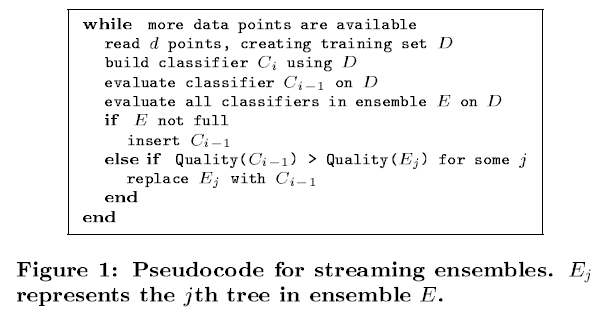

## Reacting to Different Types of Concept Drift:The Accuracy Updated Ensemble Algorithm (AUE2)

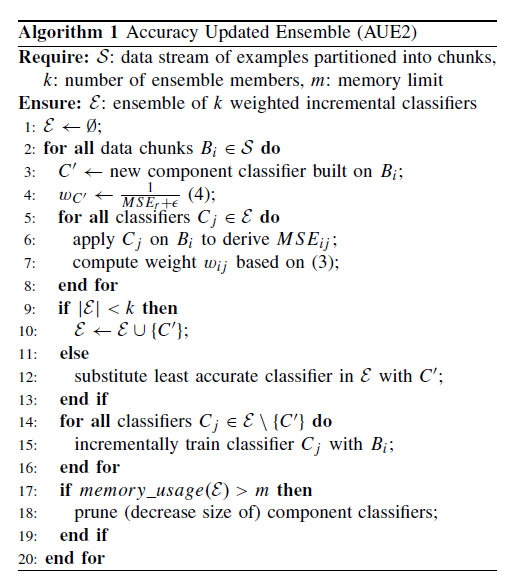

## Concept Drift Adaptation by Exploiting HistoricalKnowledge (DTEL)

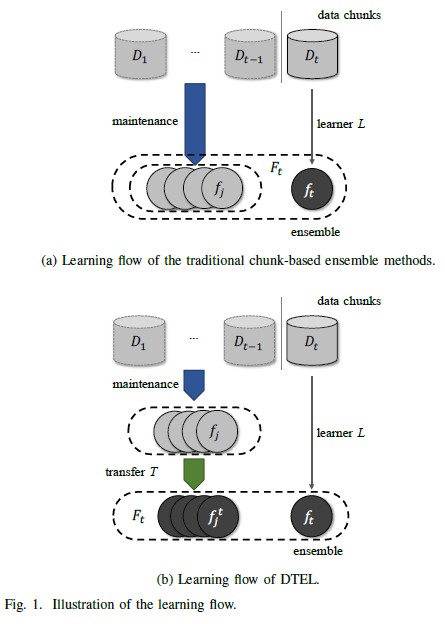

## Generative-CDTL

+ 사실 입력 $x_i$ 에서 어떤 feature가 시간에 따라 importance가 변하는지 알기 어렵다. trainset의 경우, bucket size가 크지 않을 수 있으며, 또한 I(z,b)가 분명하게 나타나지 않을 수도 있기 때문이다.
+ 따라서 아래와 같은 구조를 제안한다.
+ 실험3~4는 sensitive featrue z에 대해, G(z,b)으로 전처리 하였으나, 이번 구조는 모든 feature에 대하여 $G(x_i,b)$으로 전처리한다.
+ $I(x_i,b) > 0$ 인 feature는 G에 의해 전처리 될 것이고,$I(x_j,b) = 0$ 인 feature는 G에 의해 by-pass 되도록 학습될 것이다.

<pre>
x0 ------>|                     |- x'0 --> |                        |
x1 ------>|  Generator G(xi,b)  |- x'1 --> |                        |
x2 ------>|  (Adaptive model)   |- x'2 --> | Discriminator (D(x,g)) | -> y^
x3 ------>|                     |- x'3 --> | predictive model       |
z0 ------>|                     |- z'0 --> |                        |
                     ^
                     |
                     b
</pre>

$$
b = \{1,2,3,...N\} \in B
$$
$$
N << M
$$
$$
b_{norm} = b/M
\tag{17}
$$
$$
L_D = H(y,\hat{y}) = H(y,D(G(x_i,b_{norm})))=\mathbb{E}_{y}[-log(D(G(x_i,b_{norm})))]
\tag{21}
$$

$$
L_G = \sum_{i}MSE(G(x_i,b_{norm}),x_i)
\tag{22}
$$

$$
\min_{G(.)} L_D + L_G
\tag{23}
$$

$$
\min_{G(.)} L_D + L_G+ std(L_1,L_2)
\tag{24}
$$

# 실험
+ synthetic data를 만든다.
+ 해당 data는 data drift가 시간에 따라 변화 된다.
+ 이때, 성능의 감소를 정량적으로 측정하고
+ Bucket을 고려한 몇개의 모델을 적용한다.

## synthetic data의 생성 (Case #1 MI의 감소, Drift의 증가 )

+ $P_t(y,X) \ne P_{t+w}(y,X) $ 이고 $P_t(y|X) \ne P_{t+w}(y|X) $
+ Real concept drift
+ 즉, P(y|X)와 P(X)의 변화가 연관되어 나타남.
+ 이때 대상 feature z에 대해서 MI 감소, ks-test 통계량 증가



+ 5개의 feature
+ 각각 importance를 부여
+ 그 중, 1개의 feature는 가변 data drift

### Dataset 준비

In [24]:
data_size = 40000
cor = [1.5, 1.2, 0.9 , 0.7, 0.5]

In [25]:
seed_everything()
#y= np.random.normal(1,2,data_size)
y= (np.random.normal(0.5,0.5,data_size) > 0.5).astype(int)
x = np.zeros((data_size,5))
for ix,cor_ in enumerate(cor):
    x[:,ix] = y + np.random.normal(1,cor_,data_size)
    #sns.scatterplot(x=x[:,ix],y=y)

In [26]:
seed_everything(100)

for i in range(400):
    s = i*100
    #x[s:s+100,3] = y[s:s+100] + np.random.normal(1,5-(i/100),100)
    x[s:s+100,4] = y[s:s+100] + np.random.normal(1,0.5+(i/100),100)
    #x[s:s+100,5] = i
#sns.scatterplot(x=x[0:200,4],y=y[0:200])
#sns.scatterplot(x=x[39800:40000,4],y=y[39800:40000])

### 실험

MI Analysis MI Max 0.20278, Min 0.02707, Mean 0.09885, Std 0.06305
Dataset structure X_train, (9000, 5) X_test, (9000, 5) X_live (39000, 5)
Truncate 8000 rows from live_set (39000, 5)
Search MI & Drift...for X_live_set (31, 9000, 5)


100%|██████████| 31/31 [00:05<00:00,  5.63it/s]


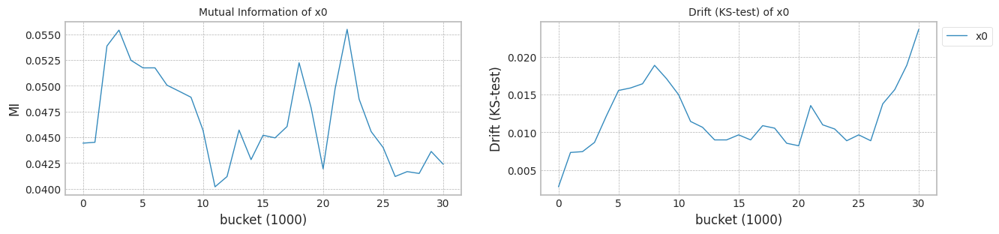

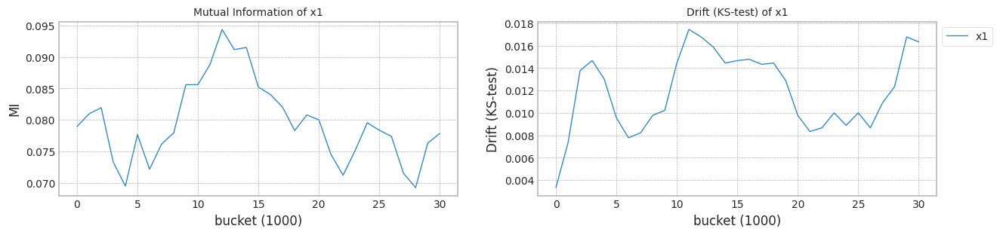

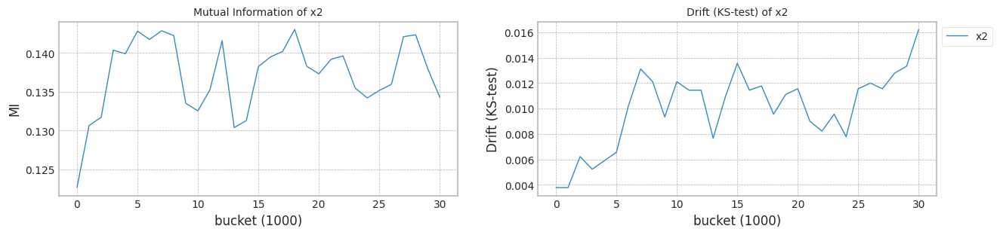

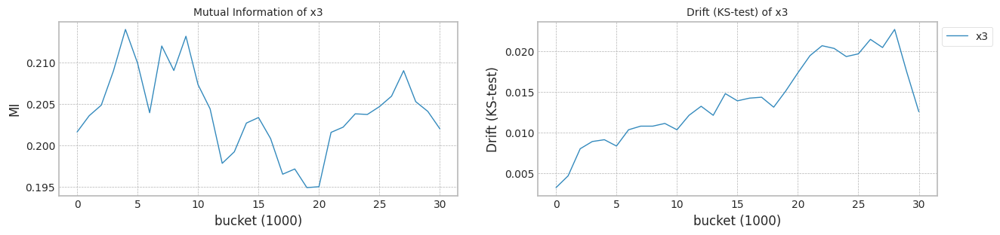

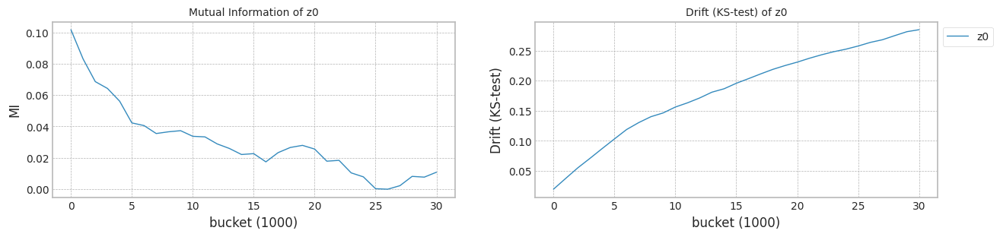

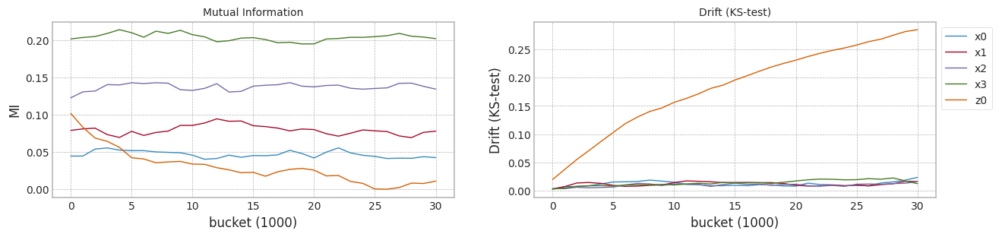

In [27]:
columns=['x0','x1','x2','x3','z0']
X = pd.DataFrame(x,columns=columns)
Y = y

train_size = 9000
test_size = 1000

X1,Y1 = check_mi_drift(X, Y,train_size, test_size)
#model,df = train_classificaion_model(X1,Y1,train_size, test_size)

In [28]:
bucket_size = 1000
X1['b'] = [int(b/bucket_size) for b in X1.index.values]
X1

,x0,x1,x2,x3,z0,b
0,0.520974,0.392205,0.600995,0.478669,0.421766,0
1,0.447230,0.556479,0.629077,0.735705,0.529014,0
2,0.489501,0.704159,0.760582,0.582973,0.570549,0
3,0.581446,0.301839,0.443337,0.515173,0.396001,0
4,0.571642,0.639275,0.524701,0.583380,0.561748,0
...,...,...,...,...,...,...
39995,0.346158,0.267147,0.513105,0.599663,0.185740,39
39996,0.426322,0.302644,0.484909,0.587518,0.721101,39
39997,0.374186,0.587769,0.624447,0.598315,0.489479,39
39998,0.470439,0.265430,0.218971,0.645349,1.258888,39


In [36]:
gcd_statistics_dfs = []
for alpha in [0.1,0.2,0.3,0.4,0.5,0.6,0.7,0.8,0.9]:
    org_df,gcd_df = drift_tolerant2(X1, Y1,train_size, test_size,avaible_range = 300,lambda_f2=alpha,trial_count=10,weight_init=True,isTest=True)
    display(org_df)
    display(gcd_df)
    gcd_statistics_dfs.append(gcd_df)

trial_count: 10
lambda_f2 0.1
######################### Trial 0 for Normal model ###########################
cuda:0


100%|██████████| 2000/2000 [00:03<00:00, 661.18it/s]


Test f1 score: 0.8764465998016092
X_live.shape (39000, 6)
Truncate 8000 rows from live_set (39000, 6)
Search MI & Drift...for X_live_set torch.Size([31, 9000, 6])


100%|██████████| 31/31 [00:05<00:00,  5.55it/s]


mean of drift:
x0    0.011903
x1    0.011896
x2    0.010036
x3    0.013871
z0    0.182717
dtype: float64
Mean F1 for all data: 0.7969252763581919
######################### Trial 0 for Drift tolerant model ###########################
cuda:0


100%|██████████| 2000/2000 [00:08<00:00, 246.01it/s]


Test f1 score: 0.8767213837170872
X_live.shape (39000, 6)
Truncate 8000 rows from live_set (39000, 6)
Search MI & Drift...for X_live_set torch.Size([31, 9000, 6])


100%|██████████| 31/31 [00:05<00:00,  5.53it/s]


mean of drift:
x0    0.012523
x1    0.010953
x2    0.013219
x3    0.021520
z0    0.196735
dtype: float64
Mean F1 for all data: 0.7867736720931029
Normal model median        : 0.7969252763581919
Drift tolerant model median: 0.7867736720931029
######################### Trial 1 for Normal model ###########################
cuda:0


100%|██████████| 2000/2000 [00:02<00:00, 680.65it/s]


Test f1 score: 0.8771620579486614
X_live.shape (39000, 6)
Truncate 8000 rows from live_set (39000, 6)
Search MI & Drift...for X_live_set torch.Size([31, 9000, 6])


100%|██████████| 31/31 [00:05<00:00,  5.60it/s]


mean of drift:
x0    0.011903
x1    0.011896
x2    0.010036
x3    0.013871
z0    0.182717
dtype: float64
Mean F1 for all data: 0.7945274333033483
######################### Trial 1 for Drift tolerant model ###########################
cuda:0


100%|██████████| 2000/2000 [00:07<00:00, 251.14it/s]


Test f1 score: 0.8763204225352113
X_live.shape (39000, 6)
Truncate 8000 rows from live_set (39000, 6)
Search MI & Drift...for X_live_set torch.Size([31, 9000, 6])


100%|██████████| 31/31 [00:05<00:00,  5.35it/s]


mean of drift:
x0    0.014287
x1    0.017864
x2    0.013050
x3    0.025118
z0    0.184025
dtype: float64
Mean F1 for all data: 0.7908195807319977
Normal model median        : 0.79572635483077
Drift tolerant model median: 0.7887966264125503
######################### Trial 2 for Normal model ###########################
cuda:0


100%|██████████| 2000/2000 [00:02<00:00, 667.88it/s]


Test f1 score: 0.8773866019203178
X_live.shape (39000, 6)
Truncate 8000 rows from live_set (39000, 6)
Search MI & Drift...for X_live_set torch.Size([31, 9000, 6])


100%|██████████| 31/31 [00:05<00:00,  5.60it/s]


mean of drift:
x0    0.011903
x1    0.011896
x2    0.010036
x3    0.013871
z0    0.182717
dtype: float64
Mean F1 for all data: 0.7962286881607163
######################### Trial 2 for Drift tolerant model ###########################
cuda:0


100%|██████████| 2000/2000 [00:08<00:00, 249.23it/s]


Test f1 score: 0.8759638686935448
X_live.shape (39000, 6)
Truncate 8000 rows from live_set (39000, 6)
Search MI & Drift...for X_live_set torch.Size([31, 9000, 6])


100%|██████████| 31/31 [00:05<00:00,  5.35it/s]


mean of drift:
x0    0.012151
x1    0.013792
x2    0.013072
x3    0.019419
z0    0.184312
dtype: float64
Mean F1 for all data: 0.7937960097683026
Normal model median        : 0.7962286881607163
Drift tolerant model median: 0.7908195807319977
######################### Trial 3 for Normal model ###########################
cuda:0


100%|██████████| 2000/2000 [00:02<00:00, 667.07it/s]


Test f1 score: 0.8769112308876912
X_live.shape (39000, 6)
Truncate 8000 rows from live_set (39000, 6)
Search MI & Drift...for X_live_set torch.Size([31, 9000, 6])


100%|██████████| 31/31 [00:05<00:00,  5.44it/s]


mean of drift:
x0    0.011903
x1    0.011896
x2    0.010036
x3    0.013871
z0    0.182717
dtype: float64
Mean F1 for all data: 0.7920022388915385
######################### Trial 3 for Drift tolerant model ###########################
cuda:0


100%|██████████| 2000/2000 [00:08<00:00, 247.65it/s]


Test f1 score: 0.877189117744245
X_live.shape (39000, 6)
Truncate 8000 rows from live_set (39000, 6)
Search MI & Drift...for X_live_set torch.Size([31, 9000, 6])


100%|██████████| 31/31 [00:05<00:00,  5.52it/s]


mean of drift:
x0    0.018996
x1    0.012724
x2    0.014125
x3    0.020735
z0    0.187437
dtype: float64
Mean F1 for all data: 0.7897048966810776
Normal model median        : 0.7953780607320323
Drift tolerant model median: 0.7902622387065377
######################### Trial 4 for Normal model ###########################
cuda:0


100%|██████████| 2000/2000 [00:03<00:00, 639.10it/s]


Test f1 score: 0.8767364939360528
X_live.shape (39000, 6)
Truncate 8000 rows from live_set (39000, 6)
Search MI & Drift...for X_live_set torch.Size([31, 9000, 6])


100%|██████████| 31/31 [00:05<00:00,  5.57it/s]


mean of drift:
x0    0.011903
x1    0.011896
x2    0.010036
x3    0.013871
z0    0.182717
dtype: float64
Mean F1 for all data: 0.7954220623610796
######################### Trial 4 for Drift tolerant model ###########################
cuda:0


100%|██████████| 2000/2000 [00:08<00:00, 248.41it/s]


Test f1 score: 0.8760330578512396
X_live.shape (39000, 6)
Truncate 8000 rows from live_set (39000, 6)
Search MI & Drift...for X_live_set torch.Size([31, 9000, 6])


100%|██████████| 31/31 [00:05<00:00,  5.52it/s]


mean of drift:
x0    0.014065
x1    0.011681
x2    0.016781
x3    0.021090
z0    0.179186
dtype: float64
Mean F1 for all data: 0.7939462435761715
Normal model median        : 0.7954220623610796
Drift tolerant model median: 0.7908195807319977
######################### Trial 5 for Normal model ###########################
cuda:0


100%|██████████| 2000/2000 [00:02<00:00, 680.21it/s]


Test f1 score: 0.8765976200969591
X_live.shape (39000, 6)
Truncate 8000 rows from live_set (39000, 6)
Search MI & Drift...for X_live_set torch.Size([31, 9000, 6])


100%|██████████| 31/31 [00:05<00:00,  5.47it/s]


mean of drift:
x0    0.011903
x1    0.011896
x2    0.010036
x3    0.013871
z0    0.182717
dtype: float64
Mean F1 for all data: 0.7960740208009198
######################### Trial 5 for Drift tolerant model ###########################
cuda:0


100%|██████████| 2000/2000 [00:08<00:00, 242.71it/s]


Test f1 score: 0.8763624353187273
X_live.shape (39000, 6)
Truncate 8000 rows from live_set (39000, 6)
Search MI & Drift...for X_live_set torch.Size([31, 9000, 6])


100%|██████████| 31/31 [00:05<00:00,  5.30it/s]


mean of drift:
x0    0.011943
x1    0.011595
x2    0.012086
x3    0.020817
z0    0.182753
dtype: float64
Mean F1 for all data: 0.7943889605109345
Normal model median        : 0.7957480415809997
Drift tolerant model median: 0.79230779525015
######################### Trial 6 for Normal model ###########################
cuda:0


100%|██████████| 2000/2000 [00:02<00:00, 673.86it/s]


Test f1 score: 0.8767213837170872
X_live.shape (39000, 6)
Truncate 8000 rows from live_set (39000, 6)
Search MI & Drift...for X_live_set torch.Size([31, 9000, 6])


100%|██████████| 31/31 [00:05<00:00,  5.52it/s]


mean of drift:
x0    0.011903
x1    0.011896
x2    0.010036
x3    0.013871
z0    0.182717
dtype: float64
Mean F1 for all data: 0.7963020617907525
######################### Trial 6 for Drift tolerant model ###########################
cuda:0


100%|██████████| 2000/2000 [00:08<00:00, 231.99it/s]


Test f1 score: 0.877339792997137
X_live.shape (39000, 6)
Truncate 8000 rows from live_set (39000, 6)
Search MI & Drift...for X_live_set torch.Size([31, 9000, 6])


100%|██████████| 31/31 [00:05<00:00,  5.29it/s]


mean of drift:
x0    0.011746
x1    0.012703
x2    0.014108
x3    0.020269
z0    0.190860
dtype: float64
Mean F1 for all data: 0.8000855502727894
Normal model median        : 0.7960740208009198
Drift tolerant model median: 0.7937960097683026
######################### Trial 7 for Normal model ###########################
cuda:0


100%|██████████| 2000/2000 [00:03<00:00, 638.90it/s]


Test f1 score: 0.8778609154929576
X_live.shape (39000, 6)
Truncate 8000 rows from live_set (39000, 6)
Search MI & Drift...for X_live_set torch.Size([31, 9000, 6])


100%|██████████| 31/31 [00:05<00:00,  5.49it/s]


mean of drift:
x0    0.011903
x1    0.011896
x2    0.010036
x3    0.013871
z0    0.182717
dtype: float64
Mean F1 for all data: 0.7965556479326527
######################### Trial 7 for Drift tolerant model ###########################
cuda:0


100%|██████████| 2000/2000 [00:07<00:00, 251.05it/s]


Test f1 score: 0.877189117744245
X_live.shape (39000, 6)
Truncate 8000 rows from live_set (39000, 6)
Search MI & Drift...for X_live_set torch.Size([31, 9000, 6])


100%|██████████| 31/31 [00:05<00:00,  5.56it/s]


mean of drift:
x0    0.012871
x1    0.015147
x2    0.013731
x3    0.020244
z0    0.182914
dtype: float64
Mean F1 for all data: 0.7999503890816557
Normal model median        : 0.7961513544808181
Drift tolerant model median: 0.793871126672237
######################### Trial 8 for Normal model ###########################
cuda:0


100%|██████████| 2000/2000 [00:02<00:00, 678.38it/s]


Test f1 score: 0.8778220451527223
X_live.shape (39000, 6)
Truncate 8000 rows from live_set (39000, 6)
Search MI & Drift...for X_live_set torch.Size([31, 9000, 6])


100%|██████████| 31/31 [00:05<00:00,  5.57it/s]


mean of drift:
x0    0.011903
x1    0.011896
x2    0.010036
x3    0.013871
z0    0.182717
dtype: float64
Mean F1 for all data: 0.7973550671081387
######################### Trial 8 for Drift tolerant model ###########################
cuda:0


100%|██████████| 2000/2000 [00:08<00:00, 235.65it/s]


Test f1 score: 0.8761654052868268
X_live.shape (39000, 6)
Truncate 8000 rows from live_set (39000, 6)
Search MI & Drift...for X_live_set torch.Size([31, 9000, 6])


100%|██████████| 31/31 [00:05<00:00,  5.44it/s]


mean of drift:
x0    0.013226
x1    0.014849
x2    0.012280
x3    0.010670
z0    0.184871
dtype: float64
Mean F1 for all data: 0.7943144506518005
Normal model median        : 0.7962286881607163
Drift tolerant model median: 0.7939462435761715
######################### Trial 9 for Normal model ###########################
cuda:0


100%|██████████| 2000/2000 [00:03<00:00, 639.40it/s]


Test f1 score: 0.877347095640716
X_live.shape (39000, 6)
Truncate 8000 rows from live_set (39000, 6)
Search MI & Drift...for X_live_set torch.Size([31, 9000, 6])


100%|██████████| 31/31 [00:05<00:00,  5.48it/s]


mean of drift:
x0    0.011903
x1    0.011896
x2    0.010036
x3    0.013871
z0    0.182717
dtype: float64
Mean F1 for all data: 0.795215998637478
######################### Trial 9 for Drift tolerant model ###########################
cuda:0


100%|██████████| 2000/2000 [00:08<00:00, 241.35it/s]


Test f1 score: 0.876995925558859
X_live.shape (39000, 6)
Truncate 8000 rows from live_set (39000, 6)
Search MI & Drift...for X_live_set torch.Size([31, 9000, 6])


100%|██████████| 31/31 [00:05<00:00,  5.24it/s]


mean of drift:
x0    0.011774
x1    0.012204
x2    0.014631
x3    0.023681
z0    0.192409
dtype: float64
Mean F1 for all data: 0.7892894586526432
Normal model median        : 0.7961513544808181
Drift tolerant model median: 0.793871126672237


,Trial,Testset F1,Initial F1,Mean F1,Last F1,Elapsed time
0,0,0.876447,0.874156,0.796925,0.731435,5.603947
1,1,0.877162,0.875152,0.794527,0.726733,5.559923
2,2,0.877387,0.875568,0.796229,0.728255,5.551000
3,3,0.876911,0.874931,0.792002,0.723297,5.717437
4,4,0.876736,0.874197,0.795422,0.728732,5.580399
5,5,0.876598,0.874281,0.796074,0.728989,5.683985
6,6,0.876721,0.874627,0.796302,0.728565,5.632075
7,7,0.877861,0.875580,0.796556,0.731794,5.662230
8,8,0.877822,0.875848,0.797355,0.731538,5.590549
9,9,0.877347,0.875234,0.795216,0.727756,5.678859


,Trial,Testset F1,Initial F1,Mean F1,Last F1,Elapsed time
0,0,0.876721,0.874751,0.786774,0.702533,5.629619
1,1,0.876320,0.874199,0.790820,0.713153,5.819061
2,2,0.875964,0.874143,0.793796,0.724560,5.819757
3,3,0.877189,0.875249,0.789705,0.710362,5.633352
4,4,0.876033,0.874087,0.793946,0.722716,5.637578
5,5,0.876362,0.874516,0.794389,0.724103,5.866415
6,6,0.877340,0.875180,0.800086,0.735790,5.877377
7,7,0.877189,0.874806,0.799950,0.738739,5.594680
8,8,0.876165,0.874464,0.794314,0.726876,5.716647
9,9,0.876996,0.875318,0.789289,0.708022,5.935886


trial_count: 10
lambda_f2 0.2
######################### Trial 0 for Normal model ###########################
cuda:0


100%|██████████| 2000/2000 [00:02<00:00, 667.59it/s]


Test f1 score: 0.8764465998016092
X_live.shape (39000, 6)
Truncate 8000 rows from live_set (39000, 6)
Search MI & Drift...for X_live_set torch.Size([31, 9000, 6])


100%|██████████| 31/31 [00:05<00:00,  5.34it/s]


mean of drift:
x0    0.011903
x1    0.011896
x2    0.010036
x3    0.013871
z0    0.182717
dtype: float64
Mean F1 for all data: 0.7969252763581919
######################### Trial 0 for Drift tolerant model ###########################
cuda:0


100%|██████████| 2000/2000 [00:08<00:00, 241.94it/s]


Test f1 score: 0.8765404929577464
X_live.shape (39000, 6)
Truncate 8000 rows from live_set (39000, 6)
Search MI & Drift...for X_live_set torch.Size([31, 9000, 6])


100%|██████████| 31/31 [00:05<00:00,  5.49it/s]


mean of drift:
x0    0.016523
x1    0.011835
x2    0.018688
x3    0.028136
z0    0.216229
dtype: float64
Mean F1 for all data: 0.778956706798517
Normal model median        : 0.7969252763581919
Drift tolerant model median: 0.778956706798517
######################### Trial 1 for Normal model ###########################
cuda:0


100%|██████████| 2000/2000 [00:03<00:00, 666.08it/s]


Test f1 score: 0.8771620579486614
X_live.shape (39000, 6)
Truncate 8000 rows from live_set (39000, 6)
Search MI & Drift...for X_live_set torch.Size([31, 9000, 6])


100%|██████████| 31/31 [00:05<00:00,  5.43it/s]


mean of drift:
x0    0.011903
x1    0.011896
x2    0.010036
x3    0.013871
z0    0.182717
dtype: float64
Mean F1 for all data: 0.7945274333033483
######################### Trial 1 for Drift tolerant model ###########################
cuda:0


100%|██████████| 2000/2000 [00:08<00:00, 229.95it/s]


Test f1 score: 0.8775981524249423
X_live.shape (39000, 6)
Truncate 8000 rows from live_set (39000, 6)
Search MI & Drift...for X_live_set torch.Size([31, 9000, 6])


100%|██████████| 31/31 [00:05<00:00,  5.43it/s]


mean of drift:
x0    0.021186
x1    0.038789
x2    0.018050
x3    0.039251
z0    0.211093
dtype: float64
Mean F1 for all data: 0.7747127988989101
Normal model median        : 0.79572635483077
Drift tolerant model median: 0.7768347528487136
######################### Trial 2 for Normal model ###########################
cuda:0


100%|██████████| 2000/2000 [00:03<00:00, 638.27it/s]


Test f1 score: 0.8773866019203178
X_live.shape (39000, 6)
Truncate 8000 rows from live_set (39000, 6)
Search MI & Drift...for X_live_set torch.Size([31, 9000, 6])


100%|██████████| 31/31 [00:05<00:00,  5.43it/s]


mean of drift:
x0    0.011903
x1    0.011896
x2    0.010036
x3    0.013871
z0    0.182717
dtype: float64
Mean F1 for all data: 0.7962286881607163
######################### Trial 2 for Drift tolerant model ###########################
cuda:0


100%|██████████| 2000/2000 [00:08<00:00, 233.76it/s]


Test f1 score: 0.8770347558293006
X_live.shape (39000, 6)
Truncate 8000 rows from live_set (39000, 6)
Search MI & Drift...for X_live_set torch.Size([31, 9000, 6])


100%|██████████| 31/31 [00:05<00:00,  5.53it/s]


mean of drift:
x0    0.013022
x1    0.015154
x2    0.014455
x3    0.023892
z0    0.167462
dtype: float64
Mean F1 for all data: 0.7970149972184025
Normal model median        : 0.7962286881607163
Drift tolerant model median: 0.778956706798517
######################### Trial 3 for Normal model ###########################
cuda:0


100%|██████████| 2000/2000 [00:02<00:00, 681.69it/s]


Test f1 score: 0.8769112308876912
X_live.shape (39000, 6)
Truncate 8000 rows from live_set (39000, 6)
Search MI & Drift...for X_live_set torch.Size([31, 9000, 6])


100%|██████████| 31/31 [00:05<00:00,  5.44it/s]


mean of drift:
x0    0.011903
x1    0.011896
x2    0.010036
x3    0.013871
z0    0.182717
dtype: float64
Mean F1 for all data: 0.7920022388915385
######################### Trial 3 for Drift tolerant model ###########################
cuda:0


100%|██████████| 2000/2000 [00:08<00:00, 236.28it/s]


Test f1 score: 0.8765704209830284
X_live.shape (39000, 6)
Truncate 8000 rows from live_set (39000, 6)
Search MI & Drift...for X_live_set torch.Size([31, 9000, 6])


100%|██████████| 31/31 [00:05<00:00,  5.35it/s]


mean of drift:
x0    0.022746
x1    0.015516
x2    0.021570
x3    0.026505
z0    0.203645
dtype: float64
Mean F1 for all data: 0.7815093536851964
Normal model median        : 0.7953780607320323
Drift tolerant model median: 0.7802330302418568
######################### Trial 4 for Normal model ###########################
cuda:0


100%|██████████| 2000/2000 [00:03<00:00, 629.39it/s]


Test f1 score: 0.8767364939360528
X_live.shape (39000, 6)
Truncate 8000 rows from live_set (39000, 6)
Search MI & Drift...for X_live_set torch.Size([31, 9000, 6])


100%|██████████| 31/31 [00:05<00:00,  5.27it/s]


mean of drift:
x0    0.011903
x1    0.011896
x2    0.010036
x3    0.013871
z0    0.182717
dtype: float64
Mean F1 for all data: 0.7954220623610796
######################### Trial 4 for Drift tolerant model ###########################
cuda:0


100%|██████████| 2000/2000 [00:08<00:00, 246.22it/s]


Test f1 score: 0.8771466314398942
X_live.shape (39000, 6)
Truncate 8000 rows from live_set (39000, 6)
Search MI & Drift...for X_live_set torch.Size([31, 9000, 6])


100%|██████████| 31/31 [00:05<00:00,  5.50it/s]


mean of drift:
x0    0.015950
x1    0.011326
x2    0.019932
x3    0.028398
z0    0.176444
dtype: float64
Mean F1 for all data: 0.7958824010990487
Normal model median        : 0.7954220623610796
Drift tolerant model median: 0.7815093536851964
######################### Trial 5 for Normal model ###########################
cuda:0


100%|██████████| 2000/2000 [00:03<00:00, 644.68it/s]


Test f1 score: 0.8765976200969591
X_live.shape (39000, 6)
Truncate 8000 rows from live_set (39000, 6)
Search MI & Drift...for X_live_set torch.Size([31, 9000, 6])


100%|██████████| 31/31 [00:05<00:00,  5.38it/s]


mean of drift:
x0    0.011903
x1    0.011896
x2    0.010036
x3    0.013871
z0    0.182717
dtype: float64
Mean F1 for all data: 0.7960740208009198
######################### Trial 5 for Drift tolerant model ###########################
cuda:0


100%|██████████| 2000/2000 [00:08<00:00, 248.82it/s]


Test f1 score: 0.8764342453662841
X_live.shape (39000, 6)
Truncate 8000 rows from live_set (39000, 6)
Search MI & Drift...for X_live_set torch.Size([31, 9000, 6])


100%|██████████| 31/31 [00:05<00:00,  5.39it/s]


mean of drift:
x0    0.013692
x1    0.011470
x2    0.015161
x3    0.032201
z0    0.210387
dtype: float64
Mean F1 for all data: 0.7832266247266533
Normal model median        : 0.7957480415809997
Drift tolerant model median: 0.7823679892059248
######################### Trial 6 for Normal model ###########################
cuda:0


100%|██████████| 2000/2000 [00:03<00:00, 632.23it/s]


Test f1 score: 0.8767213837170872
X_live.shape (39000, 6)
Truncate 8000 rows from live_set (39000, 6)
Search MI & Drift...for X_live_set torch.Size([31, 9000, 6])


100%|██████████| 31/31 [00:05<00:00,  5.27it/s]


mean of drift:
x0    0.011903
x1    0.011896
x2    0.010036
x3    0.013871
z0    0.182717
dtype: float64
Mean F1 for all data: 0.7963020617907525
######################### Trial 6 for Drift tolerant model ###########################
cuda:0


100%|██████████| 2000/2000 [00:08<00:00, 235.07it/s]


Test f1 score: 0.8767908309455587
X_live.shape (39000, 6)
Truncate 8000 rows from live_set (39000, 6)
Search MI & Drift...for X_live_set torch.Size([31, 9000, 6])


100%|██████████| 31/31 [00:05<00:00,  5.53it/s]


mean of drift:
x0    0.011871
x1    0.011860
x2    0.024939
x3    0.030054
z0    0.198466
dtype: float64
Mean F1 for all data: 0.8016490246832065
Normal model median        : 0.7960740208009198
Drift tolerant model median: 0.7832266247266533
######################### Trial 7 for Normal model ###########################
cuda:0


100%|██████████| 2000/2000 [00:02<00:00, 675.78it/s]


Test f1 score: 0.8778609154929576
X_live.shape (39000, 6)
Truncate 8000 rows from live_set (39000, 6)
Search MI & Drift...for X_live_set torch.Size([31, 9000, 6])


100%|██████████| 31/31 [00:05<00:00,  5.55it/s]


mean of drift:
x0    0.011903
x1    0.011896
x2    0.010036
x3    0.013871
z0    0.182717
dtype: float64
Mean F1 for all data: 0.7965556479326527
######################### Trial 7 for Drift tolerant model ###########################
cuda:0


100%|██████████| 2000/2000 [00:08<00:00, 247.04it/s]


Test f1 score: 0.8786012755663075
X_live.shape (39000, 6)
Truncate 8000 rows from live_set (39000, 6)
Search MI & Drift...for X_live_set torch.Size([31, 9000, 6])


100%|██████████| 31/31 [00:05<00:00,  5.42it/s]


mean of drift:
x0    0.013366
x1    0.015419
x2    0.017254
x3    0.017459
z0    0.110111
dtype: float64
Mean F1 for all data: 0.8165755988761918
Normal model median        : 0.7961513544808181
Drift tolerant model median: 0.789554512912851
######################### Trial 8 for Normal model ###########################
cuda:0


100%|██████████| 2000/2000 [00:02<00:00, 671.58it/s]


Test f1 score: 0.8778220451527223
X_live.shape (39000, 6)
Truncate 8000 rows from live_set (39000, 6)
Search MI & Drift...for X_live_set torch.Size([31, 9000, 6])


100%|██████████| 31/31 [00:05<00:00,  5.57it/s]


mean of drift:
x0    0.011903
x1    0.011896
x2    0.010036
x3    0.013871
z0    0.182717
dtype: float64
Mean F1 for all data: 0.7973550671081387
######################### Trial 8 for Drift tolerant model ###########################
cuda:0


100%|██████████| 2000/2000 [00:08<00:00, 249.76it/s]


Test f1 score: 0.8767725623832031
X_live.shape (39000, 6)
Truncate 8000 rows from live_set (39000, 6)
Search MI & Drift...for X_live_set torch.Size([31, 9000, 6])


100%|██████████| 31/31 [00:05<00:00,  5.53it/s]


mean of drift:
x0    0.014778
x1    0.016111
x2    0.012756
x3    0.016061
z0    0.179416
dtype: float64
Mean F1 for all data: 0.7932190058243066
Normal model median        : 0.7962286881607163
Drift tolerant model median: 0.7932190058243066
######################### Trial 9 for Normal model ###########################
cuda:0


100%|██████████| 2000/2000 [00:02<00:00, 680.31it/s]


Test f1 score: 0.877347095640716
X_live.shape (39000, 6)
Truncate 8000 rows from live_set (39000, 6)
Search MI & Drift...for X_live_set torch.Size([31, 9000, 6])


100%|██████████| 31/31 [00:05<00:00,  5.54it/s]


mean of drift:
x0    0.011903
x1    0.011896
x2    0.010036
x3    0.013871
z0    0.182717
dtype: float64
Mean F1 for all data: 0.795215998637478
######################### Trial 9 for Drift tolerant model ###########################
cuda:0


100%|██████████| 2000/2000 [00:08<00:00, 249.24it/s]


Test f1 score: 0.877984376719111
X_live.shape (39000, 6)
Truncate 8000 rows from live_set (39000, 6)
Search MI & Drift...for X_live_set torch.Size([31, 9000, 6])


100%|██████████| 31/31 [00:05<00:00,  5.53it/s]


mean of drift:
x0    0.011728
x1    0.011559
x2    0.017545
x3    0.028036
z0    0.169749
dtype: float64
Mean F1 for all data: 0.7989896164926283
Normal model median        : 0.7961513544808181
Drift tolerant model median: 0.7945507034616777


,Trial,Testset F1,Initial F1,Mean F1,Last F1,Elapsed time
0,0,0.876447,0.874156,0.796925,0.731435,5.820834
1,1,0.877162,0.875152,0.794527,0.726733,5.725804
2,2,0.877387,0.875568,0.796229,0.728255,5.734452
3,3,0.876911,0.874931,0.792002,0.723297,5.724668
4,4,0.876736,0.874197,0.795422,0.728732,5.906460
5,5,0.876598,0.874281,0.796074,0.728989,5.786678
6,6,0.876721,0.874627,0.796302,0.728565,5.909281
7,7,0.877861,0.875580,0.796556,0.731794,5.609820
8,8,0.877822,0.875848,0.797355,0.731538,5.580199
9,9,0.877347,0.875234,0.795216,0.727756,5.612014


,Trial,Testset F1,Initial F1,Mean F1,Last F1,Elapsed time
0,0,0.876540,0.874558,0.778957,0.684087,5.667320
1,1,0.877598,0.875470,0.774713,0.673867,5.724068
2,2,0.877035,0.874848,0.797015,0.723879,5.627787
3,3,0.876570,0.875111,0.781509,0.690727,5.820021
4,4,0.877147,0.875401,0.795882,0.724311,5.659396
5,5,0.876434,0.874723,0.783227,0.692944,5.775637
6,6,0.876791,0.874474,0.801649,0.738302,5.624308
7,7,0.878601,0.877414,0.816576,0.764996,5.735862
8,8,0.876773,0.874862,0.793219,0.717062,5.623201
9,9,0.877984,0.876119,0.798990,0.719565,5.624293


trial_count: 10
lambda_f2 0.3
######################### Trial 0 for Normal model ###########################
cuda:0


100%|██████████| 2000/2000 [00:02<00:00, 670.42it/s]


Test f1 score: 0.8764465998016092
X_live.shape (39000, 6)
Truncate 8000 rows from live_set (39000, 6)
Search MI & Drift...for X_live_set torch.Size([31, 9000, 6])


100%|██████████| 31/31 [00:05<00:00,  5.55it/s]


mean of drift:
x0    0.011903
x1    0.011896
x2    0.010036
x3    0.013871
z0    0.182717
dtype: float64
Mean F1 for all data: 0.7969252763581919
######################### Trial 0 for Drift tolerant model ###########################
cuda:0


100%|██████████| 2000/2000 [00:08<00:00, 247.53it/s]


Test f1 score: 0.8784943869689632
X_live.shape (39000, 6)
Truncate 8000 rows from live_set (39000, 6)
Search MI & Drift...for X_live_set torch.Size([31, 9000, 6])


100%|██████████| 31/31 [00:05<00:00,  5.30it/s]


mean of drift:
x0    0.021358
x1    0.012247
x2    0.047405
x3    0.019753
z0    0.257878
dtype: float64
Mean F1 for all data: 0.764616166757985
Normal model median        : 0.7969252763581919
Drift tolerant model median: 0.764616166757985
######################### Trial 1 for Normal model ###########################
cuda:0


100%|██████████| 2000/2000 [00:02<00:00, 672.15it/s]


Test f1 score: 0.8771620579486614
X_live.shape (39000, 6)
Truncate 8000 rows from live_set (39000, 6)
Search MI & Drift...for X_live_set torch.Size([31, 9000, 6])


100%|██████████| 31/31 [00:05<00:00,  5.27it/s]


mean of drift:
x0    0.011903
x1    0.011896
x2    0.010036
x3    0.013871
z0    0.182717
dtype: float64
Mean F1 for all data: 0.7945274333033483
######################### Trial 1 for Drift tolerant model ###########################
cuda:0


100%|██████████| 2000/2000 [00:08<00:00, 249.41it/s]


Test f1 score: 0.8778120864578738
X_live.shape (39000, 6)
Truncate 8000 rows from live_set (39000, 6)
Search MI & Drift...for X_live_set torch.Size([31, 9000, 6])


100%|██████████| 31/31 [00:05<00:00,  5.47it/s]


mean of drift:
x0    0.024616
x1    0.012004
x2    0.019516
x3    0.033634
z0    0.242394
dtype: float64
Mean F1 for all data: 0.766354998509548
Normal model median        : 0.79572635483077
Drift tolerant model median: 0.7654855826337665
######################### Trial 2 for Normal model ###########################
cuda:0


100%|██████████| 2000/2000 [00:03<00:00, 624.13it/s]


Test f1 score: 0.8773866019203178
X_live.shape (39000, 6)
Truncate 8000 rows from live_set (39000, 6)
Search MI & Drift...for X_live_set torch.Size([31, 9000, 6])


100%|██████████| 31/31 [00:05<00:00,  5.50it/s]


mean of drift:
x0    0.011903
x1    0.011896
x2    0.010036
x3    0.013871
z0    0.182717
dtype: float64
Mean F1 for all data: 0.7962286881607163
######################### Trial 2 for Drift tolerant model ###########################
cuda:0


100%|██████████| 2000/2000 [00:07<00:00, 251.06it/s]


Test f1 score: 0.8772857457589779
X_live.shape (39000, 6)
Truncate 8000 rows from live_set (39000, 6)
Search MI & Drift...for X_live_set torch.Size([31, 9000, 6])


100%|██████████| 31/31 [00:05<00:00,  5.50it/s]


mean of drift:
x0    0.015369
x1    0.018548
x2    0.024706
x3    0.032272
z0    0.176265
dtype: float64
Mean F1 for all data: 0.7905981273088407
Normal model median        : 0.7962286881607163
Drift tolerant model median: 0.766354998509548
######################### Trial 3 for Normal model ###########################
cuda:0


100%|██████████| 2000/2000 [00:02<00:00, 675.98it/s]


Test f1 score: 0.8769112308876912
X_live.shape (39000, 6)
Truncate 8000 rows from live_set (39000, 6)
Search MI & Drift...for X_live_set torch.Size([31, 9000, 6])


100%|██████████| 31/31 [00:05<00:00,  5.47it/s]


mean of drift:
x0    0.011903
x1    0.011896
x2    0.010036
x3    0.013871
z0    0.182717
dtype: float64
Mean F1 for all data: 0.7920022388915385
######################### Trial 3 for Drift tolerant model ###########################
cuda:0


100%|██████████| 2000/2000 [00:08<00:00, 247.73it/s]


Test f1 score: 0.8765159867695701
X_live.shape (39000, 6)
Truncate 8000 rows from live_set (39000, 6)
Search MI & Drift...for X_live_set torch.Size([31, 9000, 6])


100%|██████████| 31/31 [00:05<00:00,  5.52it/s]


mean of drift:
x0    0.029806
x1    0.016989
x2    0.028803
x3    0.031029
z0    0.189140
dtype: float64
Mean F1 for all data: 0.7848462170318802
Normal model median        : 0.7953780607320323
Drift tolerant model median: 0.775600607770714
######################### Trial 4 for Normal model ###########################
cuda:0


100%|██████████| 2000/2000 [00:03<00:00, 663.45it/s]


Test f1 score: 0.8767364939360528
X_live.shape (39000, 6)
Truncate 8000 rows from live_set (39000, 6)
Search MI & Drift...for X_live_set torch.Size([31, 9000, 6])


100%|██████████| 31/31 [00:05<00:00,  5.55it/s]


mean of drift:
x0    0.011903
x1    0.011896
x2    0.010036
x3    0.013871
z0    0.182717
dtype: float64
Mean F1 for all data: 0.7954220623610796
######################### Trial 4 for Drift tolerant model ###########################
cuda:0


100%|██████████| 2000/2000 [00:08<00:00, 246.56it/s]


Test f1 score: 0.8780057357158614
X_live.shape (39000, 6)
Truncate 8000 rows from live_set (39000, 6)
Search MI & Drift...for X_live_set torch.Size([31, 9000, 6])


100%|██████████| 31/31 [00:05<00:00,  5.48it/s]


mean of drift:
x0    0.020685
x1    0.010520
x2    0.027667
x3    0.028513
z0    0.174785
dtype: float64
Mean F1 for all data: 0.7978670233964321
Normal model median        : 0.7954220623610796
Drift tolerant model median: 0.7848462170318802
######################### Trial 5 for Normal model ###########################
cuda:0


100%|██████████| 2000/2000 [00:02<00:00, 666.99it/s]


Test f1 score: 0.8765976200969591
X_live.shape (39000, 6)
Truncate 8000 rows from live_set (39000, 6)
Search MI & Drift...for X_live_set torch.Size([31, 9000, 6])


100%|██████████| 31/31 [00:05<00:00,  5.57it/s]


mean of drift:
x0    0.011903
x1    0.011896
x2    0.010036
x3    0.013871
z0    0.182717
dtype: float64
Mean F1 for all data: 0.7960740208009198
######################### Trial 5 for Drift tolerant model ###########################
cuda:0


100%|██████████| 2000/2000 [00:08<00:00, 248.99it/s]


Test f1 score: 0.8780165289256198
X_live.shape (39000, 6)
Truncate 8000 rows from live_set (39000, 6)
Search MI & Drift...for X_live_set torch.Size([31, 9000, 6])


100%|██████████| 31/31 [00:05<00:00,  5.55it/s]


mean of drift:
x0    0.023746
x1    0.018143
x2    0.039498
x3    0.022957
z0    0.202419
dtype: float64
Mean F1 for all data: 0.8025459329094715
Normal model median        : 0.7957480415809997
Drift tolerant model median: 0.7877221721703604
######################### Trial 6 for Normal model ###########################
cuda:0


100%|██████████| 2000/2000 [00:03<00:00, 663.48it/s]


Test f1 score: 0.8767213837170872
X_live.shape (39000, 6)
Truncate 8000 rows from live_set (39000, 6)
Search MI & Drift...for X_live_set torch.Size([31, 9000, 6])


100%|██████████| 31/31 [00:05<00:00,  5.54it/s]


mean of drift:
x0    0.011903
x1    0.011896
x2    0.010036
x3    0.013871
z0    0.182717
dtype: float64
Mean F1 for all data: 0.7963020617907525
######################### Trial 6 for Drift tolerant model ###########################
cuda:0


100%|██████████| 2000/2000 [00:07<00:00, 250.34it/s]


Test f1 score: 0.8767334360554699
X_live.shape (39000, 6)
Truncate 8000 rows from live_set (39000, 6)
Search MI & Drift...for X_live_set torch.Size([31, 9000, 6])


100%|██████████| 31/31 [00:05<00:00,  5.54it/s]


mean of drift:
x0    0.013749
x1    0.019061
x2    0.024896
x3    0.030663
z0    0.169835
dtype: float64
Mean F1 for all data: 0.7936060944281955
Normal model median        : 0.7960740208009198
Drift tolerant model median: 0.7905981273088407
######################### Trial 7 for Normal model ###########################
cuda:0


100%|██████████| 2000/2000 [00:02<00:00, 681.19it/s]


Test f1 score: 0.8778609154929576
X_live.shape (39000, 6)
Truncate 8000 rows from live_set (39000, 6)
Search MI & Drift...for X_live_set torch.Size([31, 9000, 6])


100%|██████████| 31/31 [00:05<00:00,  5.59it/s]


mean of drift:
x0    0.011903
x1    0.011896
x2    0.010036
x3    0.013871
z0    0.182717
dtype: float64
Mean F1 for all data: 0.7965556479326527
######################### Trial 7 for Drift tolerant model ###########################
cuda:0


100%|██████████| 2000/2000 [00:08<00:00, 247.13it/s]


Test f1 score: 0.8788881535407015
X_live.shape (39000, 6)
Truncate 8000 rows from live_set (39000, 6)
Search MI & Drift...for X_live_set torch.Size([31, 9000, 6])


100%|██████████| 31/31 [00:05<00:00,  5.51it/s]


mean of drift:
x0    0.013244
x1    0.030100
x2    0.019871
x3    0.013728
z0    0.098358
dtype: float64
Mean F1 for all data: 0.8271558335332132
Normal model median        : 0.7961513544808181
Drift tolerant model median: 0.7921021108685181
######################### Trial 8 for Normal model ###########################
cuda:0


100%|██████████| 2000/2000 [00:02<00:00, 672.49it/s]


Test f1 score: 0.8778220451527223
X_live.shape (39000, 6)
Truncate 8000 rows from live_set (39000, 6)
Search MI & Drift...for X_live_set torch.Size([31, 9000, 6])


100%|██████████| 31/31 [00:05<00:00,  5.51it/s]


mean of drift:
x0    0.011903
x1    0.011896
x2    0.010036
x3    0.013871
z0    0.182717
dtype: float64
Mean F1 for all data: 0.7973550671081387
######################### Trial 8 for Drift tolerant model ###########################
cuda:0


100%|██████████| 2000/2000 [00:07<00:00, 250.01it/s]


Test f1 score: 0.8760021965952773
X_live.shape (39000, 6)
Truncate 8000 rows from live_set (39000, 6)
Search MI & Drift...for X_live_set torch.Size([31, 9000, 6])


100%|██████████| 31/31 [00:05<00:00,  5.46it/s]


mean of drift:
x0    0.015254
x1    0.019419
x2    0.014663
x3    0.022143
z0    0.178297
dtype: float64
Mean F1 for all data: 0.7927279719802747
Normal model median        : 0.7962286881607163
Drift tolerant model median: 0.7927279719802747
######################### Trial 9 for Normal model ###########################
cuda:0


100%|██████████| 2000/2000 [00:02<00:00, 671.28it/s]


Test f1 score: 0.877347095640716
X_live.shape (39000, 6)
Truncate 8000 rows from live_set (39000, 6)
Search MI & Drift...for X_live_set torch.Size([31, 9000, 6])


100%|██████████| 31/31 [00:05<00:00,  5.60it/s]


mean of drift:
x0    0.011903
x1    0.011896
x2    0.010036
x3    0.013871
z0    0.182717
dtype: float64
Mean F1 for all data: 0.795215998637478
######################### Trial 9 for Drift tolerant model ###########################
cuda:0


100%|██████████| 2000/2000 [00:08<00:00, 248.27it/s]


Test f1 score: 0.8792685613571272
X_live.shape (39000, 6)
Truncate 8000 rows from live_set (39000, 6)
Search MI & Drift...for X_live_set torch.Size([31, 9000, 6])


100%|██████████| 31/31 [00:05<00:00,  5.55it/s]


mean of drift:
x0    0.013247
x1    0.011849
x2    0.018559
x3    0.027824
z0    0.197072
dtype: float64
Mean F1 for all data: 0.7980448719279803
Normal model median        : 0.7961513544808181
Drift tolerant model median: 0.7931670332042351


,Trial,Testset F1,Initial F1,Mean F1,Last F1,Elapsed time
0,0,0.876447,0.874156,0.796925,0.731435,5.602477
1,1,0.877162,0.875152,0.794527,0.726733,5.903050
2,2,0.877387,0.875568,0.796229,0.728255,5.654458
3,3,0.876911,0.874931,0.792002,0.723297,5.722041
4,4,0.876736,0.874197,0.795422,0.728732,5.602250
5,5,0.876598,0.874281,0.796074,0.728989,5.585334
6,6,0.876721,0.874627,0.796302,0.728565,5.614480
7,7,0.877861,0.875580,0.796556,0.731794,5.569436
8,8,0.877822,0.875848,0.797355,0.731538,5.649770
9,9,0.877347,0.875234,0.795216,0.727756,5.552595


,Trial,Testset F1,Initial F1,Mean F1,Last F1,Elapsed time
0,0,0.878494,0.875845,0.764616,0.642704,5.869107
1,1,0.877812,0.875679,0.766355,0.651175,5.683496
2,2,0.877286,0.875484,0.790598,0.710172,5.655340
3,3,0.876516,0.874778,0.784846,0.697052,5.636263
4,4,0.878006,0.876136,0.797867,0.728258,5.681884
5,5,0.878017,0.876467,0.802546,0.735002,5.608639
6,6,0.876733,0.875124,0.793606,0.714768,5.613196
7,7,0.878888,0.877671,0.827156,0.785366,5.643690
8,8,0.876002,0.874504,0.792728,0.712367,5.697555
9,9,0.879269,0.877892,0.798045,0.707834,5.605613


trial_count: 10
lambda_f2 0.4
######################### Trial 0 for Normal model ###########################
cuda:0


100%|██████████| 2000/2000 [00:02<00:00, 680.23it/s]


Test f1 score: 0.8764465998016092
X_live.shape (39000, 6)
Truncate 8000 rows from live_set (39000, 6)
Search MI & Drift...for X_live_set torch.Size([31, 9000, 6])


100%|██████████| 31/31 [00:05<00:00,  5.50it/s]


mean of drift:
x0    0.011903
x1    0.011896
x2    0.010036
x3    0.013871
z0    0.182717
dtype: float64
Mean F1 for all data: 0.7969252763581919
######################### Trial 0 for Drift tolerant model ###########################
cuda:0


100%|██████████| 2000/2000 [00:07<00:00, 250.53it/s]


Test f1 score: 0.8784840806433843
X_live.shape (39000, 6)
Truncate 8000 rows from live_set (39000, 6)
Search MI & Drift...for X_live_set torch.Size([31, 9000, 6])


100%|██████████| 31/31 [00:05<00:00,  5.53it/s]


mean of drift:
x0    0.020717
x1    0.010108
x2    0.043025
x3    0.031667
z0    0.244667
dtype: float64
Mean F1 for all data: 0.7633422278649186
Normal model median        : 0.7969252763581919
Drift tolerant model median: 0.7633422278649186
######################### Trial 1 for Normal model ###########################
cuda:0


100%|██████████| 2000/2000 [00:02<00:00, 675.33it/s]


Test f1 score: 0.8771620579486614
X_live.shape (39000, 6)
Truncate 8000 rows from live_set (39000, 6)
Search MI & Drift...for X_live_set torch.Size([31, 9000, 6])


100%|██████████| 31/31 [00:05<00:00,  5.60it/s]


mean of drift:
x0    0.011903
x1    0.011896
x2    0.010036
x3    0.013871
z0    0.182717
dtype: float64
Mean F1 for all data: 0.7945274333033483
######################### Trial 1 for Drift tolerant model ###########################
cuda:0


100%|██████████| 2000/2000 [00:08<00:00, 248.65it/s]


Test f1 score: 0.8771466314398942
X_live.shape (39000, 6)
Truncate 8000 rows from live_set (39000, 6)
Search MI & Drift...for X_live_set torch.Size([31, 9000, 6])


100%|██████████| 31/31 [00:05<00:00,  5.51it/s]


mean of drift:
x0    0.041452
x1    0.012022
x2    0.029681
x3    0.055025
z0    0.164577
dtype: float64
Mean F1 for all data: 0.7942773888749878
Normal model median        : 0.79572635483077
Drift tolerant model median: 0.7788098083699532
######################### Trial 2 for Normal model ###########################
cuda:0


100%|██████████| 2000/2000 [00:02<00:00, 678.07it/s]


Test f1 score: 0.8773866019203178
X_live.shape (39000, 6)
Truncate 8000 rows from live_set (39000, 6)
Search MI & Drift...for X_live_set torch.Size([31, 9000, 6])


100%|██████████| 31/31 [00:05<00:00,  5.44it/s]


mean of drift:
x0    0.011903
x1    0.011896
x2    0.010036
x3    0.013871
z0    0.182717
dtype: float64
Mean F1 for all data: 0.7962286881607163
######################### Trial 2 for Drift tolerant model ###########################
cuda:0


100%|██████████| 2000/2000 [00:07<00:00, 251.85it/s]


Test f1 score: 0.8766548984995587
X_live.shape (39000, 6)
Truncate 8000 rows from live_set (39000, 6)
Search MI & Drift...for X_live_set torch.Size([31, 9000, 6])


100%|██████████| 31/31 [00:05<00:00,  5.44it/s]


mean of drift:
x0    0.020520
x1    0.022204
x2    0.038724
x3    0.045265
z0    0.169505
dtype: float64
Mean F1 for all data: 0.788684997315286
Normal model median        : 0.7962286881607163
Drift tolerant model median: 0.788684997315286
######################### Trial 3 for Normal model ###########################
cuda:0


100%|██████████| 2000/2000 [00:02<00:00, 670.66it/s]


Test f1 score: 0.8769112308876912
X_live.shape (39000, 6)
Truncate 8000 rows from live_set (39000, 6)
Search MI & Drift...for X_live_set torch.Size([31, 9000, 6])


100%|██████████| 31/31 [00:05<00:00,  5.61it/s]


mean of drift:
x0    0.011903
x1    0.011896
x2    0.010036
x3    0.013871
z0    0.182717
dtype: float64
Mean F1 for all data: 0.7920022388915385
######################### Trial 3 for Drift tolerant model ###########################
cuda:0


100%|██████████| 2000/2000 [00:08<00:00, 249.53it/s]


Test f1 score: 0.8769570011025359
X_live.shape (39000, 6)
Truncate 8000 rows from live_set (39000, 6)
Search MI & Drift...for X_live_set torch.Size([31, 9000, 6])


100%|██████████| 31/31 [00:05<00:00,  5.56it/s]


mean of drift:
x0    0.036824
x1    0.025953
x2    0.047753
x3    0.039566
z0    0.197394
dtype: float64
Mean F1 for all data: 0.7739477441433336
Normal model median        : 0.7953780607320323
Drift tolerant model median: 0.7813163707293098
######################### Trial 4 for Normal model ###########################
cuda:0


100%|██████████| 2000/2000 [00:02<00:00, 671.49it/s]


Test f1 score: 0.8767364939360528
X_live.shape (39000, 6)
Truncate 8000 rows from live_set (39000, 6)
Search MI & Drift...for X_live_set torch.Size([31, 9000, 6])


100%|██████████| 31/31 [00:05<00:00,  5.56it/s]


mean of drift:
x0    0.011903
x1    0.011896
x2    0.010036
x3    0.013871
z0    0.182717
dtype: float64
Mean F1 for all data: 0.7954220623610796
######################### Trial 4 for Drift tolerant model ###########################
cuda:0


100%|██████████| 2000/2000 [00:08<00:00, 248.20it/s]


Test f1 score: 0.8773480662983426
X_live.shape (39000, 6)
Truncate 8000 rows from live_set (39000, 6)
Search MI & Drift...for X_live_set torch.Size([31, 9000, 6])


100%|██████████| 31/31 [00:05<00:00,  5.54it/s]


mean of drift:
x0    0.013652
x1    0.027849
x2    0.016219
x3    0.021043
z0    0.396455
dtype: float64
Mean F1 for all data: 0.8369061054459738
Normal model median        : 0.7954220623610796
Drift tolerant model median: 0.788684997315286
######################### Trial 5 for Normal model ###########################
cuda:0


100%|██████████| 2000/2000 [00:02<00:00, 671.57it/s]


Test f1 score: 0.8765976200969591
X_live.shape (39000, 6)
Truncate 8000 rows from live_set (39000, 6)
Search MI & Drift...for X_live_set torch.Size([31, 9000, 6])


100%|██████████| 31/31 [00:05<00:00,  5.59it/s]


mean of drift:
x0    0.011903
x1    0.011896
x2    0.010036
x3    0.013871
z0    0.182717
dtype: float64
Mean F1 for all data: 0.7960740208009198
######################### Trial 5 for Drift tolerant model ###########################
cuda:0


100%|██████████| 2000/2000 [00:08<00:00, 246.20it/s]


Test f1 score: 0.8772587042750111
X_live.shape (39000, 6)
Truncate 8000 rows from live_set (39000, 6)
Search MI & Drift...for X_live_set torch.Size([31, 9000, 6])


100%|██████████| 31/31 [00:05<00:00,  5.53it/s]


mean of drift:
x0    0.025599
x1    0.042498
x2    0.010563
x3    0.051853
z0    0.237814
dtype: float64
Mean F1 for all data: 0.7929533542390019
Normal model median        : 0.7957480415809997
Drift tolerant model median: 0.7908191757771439
######################### Trial 6 for Normal model ###########################
cuda:0


100%|██████████| 2000/2000 [00:02<00:00, 680.41it/s]


Test f1 score: 0.8767213837170872
X_live.shape (39000, 6)
Truncate 8000 rows from live_set (39000, 6)
Search MI & Drift...for X_live_set torch.Size([31, 9000, 6])


100%|██████████| 31/31 [00:05<00:00,  5.54it/s]


mean of drift:
x0    0.011903
x1    0.011896
x2    0.010036
x3    0.013871
z0    0.182717
dtype: float64
Mean F1 for all data: 0.7963020617907525
######################### Trial 6 for Drift tolerant model ###########################
cuda:0


100%|██████████| 2000/2000 [00:08<00:00, 249.44it/s]


Test f1 score: 0.8780434064118101
X_live.shape (39000, 6)
Truncate 8000 rows from live_set (39000, 6)
Search MI & Drift...for X_live_set torch.Size([31, 9000, 6])


100%|██████████| 31/31 [00:05<00:00,  5.59it/s]


mean of drift:
x0    0.015441
x1    0.031401
x2    0.048832
x3    0.039853
z0    0.125419
dtype: float64
Mean F1 for all data: 0.8027491380453092
Normal model median        : 0.7960740208009198
Drift tolerant model median: 0.7929533542390019
######################### Trial 7 for Normal model ###########################
cuda:0


100%|██████████| 2000/2000 [00:03<00:00, 664.22it/s]


Test f1 score: 0.8778609154929576
X_live.shape (39000, 6)
Truncate 8000 rows from live_set (39000, 6)
Search MI & Drift...for X_live_set torch.Size([31, 9000, 6])


100%|██████████| 31/31 [00:05<00:00,  5.59it/s]


mean of drift:
x0    0.011903
x1    0.011896
x2    0.010036
x3    0.013871
z0    0.182717
dtype: float64
Mean F1 for all data: 0.7965556479326527
######################### Trial 7 for Drift tolerant model ###########################
cuda:0


100%|██████████| 2000/2000 [00:08<00:00, 246.12it/s]


Test f1 score: 0.8796826795945349
X_live.shape (39000, 6)
Truncate 8000 rows from live_set (39000, 6)
Search MI & Drift...for X_live_set torch.Size([31, 9000, 6])


100%|██████████| 31/31 [00:05<00:00,  5.54it/s]


mean of drift:
x0    0.021695
x1    0.015706
x2    0.019452
x3    0.031778
z0    0.123240
dtype: float64
Mean F1 for all data: 0.8378355082563494
Normal model median        : 0.7961513544808181
Drift tolerant model median: 0.7936153715569949
######################### Trial 8 for Normal model ###########################
cuda:0


100%|██████████| 2000/2000 [00:02<00:00, 667.57it/s]


Test f1 score: 0.8778220451527223
X_live.shape (39000, 6)
Truncate 8000 rows from live_set (39000, 6)
Search MI & Drift...for X_live_set torch.Size([31, 9000, 6])


100%|██████████| 31/31 [00:05<00:00,  5.57it/s]


mean of drift:
x0    0.011903
x1    0.011896
x2    0.010036
x3    0.013871
z0    0.182717
dtype: float64
Mean F1 for all data: 0.7973550671081387
######################### Trial 8 for Drift tolerant model ###########################
cuda:0


100%|██████████| 2000/2000 [00:08<00:00, 246.78it/s]


Test f1 score: 0.8771814290418176
X_live.shape (39000, 6)
Truncate 8000 rows from live_set (39000, 6)
Search MI & Drift...for X_live_set torch.Size([31, 9000, 6])


100%|██████████| 31/31 [00:05<00:00,  5.55it/s]


mean of drift:
x0    0.015315
x1    0.021387
x2    0.016846
x3    0.032444
z0    0.176634
dtype: float64
Mean F1 for all data: 0.7917588880730826
Normal model median        : 0.7962286881607163
Drift tolerant model median: 0.7929533542390019
######################### Trial 9 for Normal model ###########################
cuda:0


100%|██████████| 2000/2000 [00:03<00:00, 661.39it/s]


Test f1 score: 0.877347095640716
X_live.shape (39000, 6)
Truncate 8000 rows from live_set (39000, 6)
Search MI & Drift...for X_live_set torch.Size([31, 9000, 6])


100%|██████████| 31/31 [00:05<00:00,  5.57it/s]


mean of drift:
x0    0.011903
x1    0.011896
x2    0.010036
x3    0.013871
z0    0.182717
dtype: float64
Mean F1 for all data: 0.795215998637478
######################### Trial 9 for Drift tolerant model ###########################
cuda:0


100%|██████████| 2000/2000 [00:08<00:00, 248.74it/s]


Test f1 score: 0.8800705467372134
X_live.shape (39000, 6)
Truncate 8000 rows from live_set (39000, 6)
Search MI & Drift...for X_live_set torch.Size([31, 9000, 6])


100%|██████████| 31/31 [00:05<00:00,  5.54it/s]


mean of drift:
x0    0.015509
x1    0.016803
x2    0.020401
x3    0.025853
z0    0.310136
dtype: float64
Mean F1 for all data: 0.8017668466499858
Normal model median        : 0.7961513544808181
Drift tolerant model median: 0.7936153715569949


,Trial,Testset F1,Initial F1,Mean F1,Last F1,Elapsed time
0,0,0.876447,0.874156,0.796925,0.731435,5.651634
1,1,0.877162,0.875152,0.794527,0.726733,5.560407
2,2,0.877387,0.875568,0.796229,0.728255,5.718094
3,3,0.876911,0.874931,0.792002,0.723297,5.543993
4,4,0.876736,0.874197,0.795422,0.728732,5.594217
5,5,0.876598,0.874281,0.796074,0.728989,5.563488
6,6,0.876721,0.874627,0.796302,0.728565,5.610825
7,7,0.877861,0.875580,0.796556,0.731794,5.567904
8,8,0.877822,0.875848,0.797355,0.731538,5.579994
9,9,0.877347,0.875234,0.795216,0.727756,5.582963


,Trial,Testset F1,Initial F1,Mean F1,Last F1,Elapsed time
0,0,0.878484,0.875707,0.763342,0.629482,5.628159
1,1,0.877147,0.875138,0.794277,0.719273,5.643485
2,2,0.876655,0.875069,0.788685,0.704321,5.721826
3,3,0.876957,0.875139,0.773948,0.665704,5.592098
4,4,0.877348,0.877519,0.836906,0.804569,5.620089
5,5,0.877259,0.875720,0.792953,0.688405,5.622090
6,6,0.878043,0.876121,0.802749,0.728501,5.569138
7,7,0.879683,0.878718,0.837836,0.806666,5.616313
8,8,0.877181,0.875827,0.791759,0.709939,5.609777
9,9,0.880071,0.879761,0.801767,0.691521,5.618862


trial_count: 10
lambda_f2 0.5
######################### Trial 0 for Normal model ###########################
cuda:0


100%|██████████| 2000/2000 [00:02<00:00, 668.84it/s]


Test f1 score: 0.8764465998016092
X_live.shape (39000, 6)
Truncate 8000 rows from live_set (39000, 6)
Search MI & Drift...for X_live_set torch.Size([31, 9000, 6])


100%|██████████| 31/31 [00:05<00:00,  5.58it/s]


mean of drift:
x0    0.011903
x1    0.011896
x2    0.010036
x3    0.013871
z0    0.182717
dtype: float64
Mean F1 for all data: 0.7969252763581919
######################### Trial 0 for Drift tolerant model ###########################
cuda:0


100%|██████████| 2000/2000 [00:07<00:00, 250.87it/s]


Test f1 score: 0.8789148654609615
X_live.shape (39000, 6)
Truncate 8000 rows from live_set (39000, 6)
Search MI & Drift...for X_live_set torch.Size([31, 9000, 6])


100%|██████████| 31/31 [00:05<00:00,  5.52it/s]


mean of drift:
x0    0.030842
x1    0.010545
x2    0.041211
x3    0.041366
z0    0.248032
dtype: float64
Mean F1 for all data: 0.7770684494809209
Normal model median        : 0.7969252763581919
Drift tolerant model median: 0.7770684494809209
######################### Trial 1 for Normal model ###########################
cuda:0


100%|██████████| 2000/2000 [00:03<00:00, 663.26it/s]


Test f1 score: 0.8771620579486614
X_live.shape (39000, 6)
Truncate 8000 rows from live_set (39000, 6)
Search MI & Drift...for X_live_set torch.Size([31, 9000, 6])


100%|██████████| 31/31 [00:05<00:00,  5.54it/s]


mean of drift:
x0    0.011903
x1    0.011896
x2    0.010036
x3    0.013871
z0    0.182717
dtype: float64
Mean F1 for all data: 0.7945274333033483
######################### Trial 1 for Drift tolerant model ###########################
cuda:0


100%|██████████| 2000/2000 [00:08<00:00, 246.97it/s]


Test f1 score: 0.8798765704209831
X_live.shape (39000, 6)
Truncate 8000 rows from live_set (39000, 6)
Search MI & Drift...for X_live_set torch.Size([31, 9000, 6])


100%|██████████| 31/31 [00:05<00:00,  5.53it/s]


mean of drift:
x0    0.017789
x1    0.026720
x2    0.021821
x3    0.033781
z0    0.330405
dtype: float64
Mean F1 for all data: 0.7938998564346192
Normal model median        : 0.79572635483077
Drift tolerant model median: 0.7854841529577701
######################### Trial 2 for Normal model ###########################
cuda:0


100%|██████████| 2000/2000 [00:02<00:00, 667.26it/s]


Test f1 score: 0.8773866019203178
X_live.shape (39000, 6)
Truncate 8000 rows from live_set (39000, 6)
Search MI & Drift...for X_live_set torch.Size([31, 9000, 6])


100%|██████████| 31/31 [00:05<00:00,  5.43it/s]


mean of drift:
x0    0.011903
x1    0.011896
x2    0.010036
x3    0.013871
z0    0.182717
dtype: float64
Mean F1 for all data: 0.7962286881607163
######################### Trial 2 for Drift tolerant model ###########################
cuda:0


100%|██████████| 2000/2000 [00:08<00:00, 246.02it/s]


Test f1 score: 0.8770690796733612
X_live.shape (39000, 6)
Truncate 8000 rows from live_set (39000, 6)
Search MI & Drift...for X_live_set torch.Size([31, 9000, 6])


100%|██████████| 31/31 [00:05<00:00,  5.51it/s]


mean of drift:
x0    0.014706
x1    0.024530
x2    0.050473
x3    0.060022
z0    0.159781
dtype: float64
Mean F1 for all data: 0.7922211409380367
Normal model median        : 0.7962286881607163
Drift tolerant model median: 0.7922211409380367
######################### Trial 3 for Normal model ###########################
cuda:0


100%|██████████| 2000/2000 [00:03<00:00, 657.97it/s]


Test f1 score: 0.8769112308876912
X_live.shape (39000, 6)
Truncate 8000 rows from live_set (39000, 6)
Search MI & Drift...for X_live_set torch.Size([31, 9000, 6])


100%|██████████| 31/31 [00:05<00:00,  5.58it/s]


mean of drift:
x0    0.011903
x1    0.011896
x2    0.010036
x3    0.013871
z0    0.182717
dtype: float64
Mean F1 for all data: 0.7920022388915385
######################### Trial 3 for Drift tolerant model ###########################
cuda:0


100%|██████████| 2000/2000 [00:08<00:00, 247.93it/s]


Test f1 score: 0.876914600550964
X_live.shape (39000, 6)
Truncate 8000 rows from live_set (39000, 6)
Search MI & Drift...for X_live_set torch.Size([31, 9000, 6])


100%|██████████| 31/31 [00:05<00:00,  5.52it/s]


mean of drift:
x0    0.036674
x1    0.370455
x2    0.047839
x3    0.040857
z0    0.189025
dtype: float64
Mean F1 for all data: 0.7225768689694426
Normal model median        : 0.7953780607320323
Drift tolerant model median: 0.7846447952094788
######################### Trial 4 for Normal model ###########################
cuda:0


100%|██████████| 2000/2000 [00:03<00:00, 665.38it/s]


Test f1 score: 0.8767364939360528
X_live.shape (39000, 6)
Truncate 8000 rows from live_set (39000, 6)
Search MI & Drift...for X_live_set torch.Size([31, 9000, 6])


100%|██████████| 31/31 [00:05<00:00,  5.57it/s]


mean of drift:
x0    0.011903
x1    0.011896
x2    0.010036
x3    0.013871
z0    0.182717
dtype: float64
Mean F1 for all data: 0.7954220623610796
######################### Trial 4 for Drift tolerant model ###########################
cuda:0


100%|██████████| 2000/2000 [00:08<00:00, 246.87it/s]


Test f1 score: 0.8784737538597266
X_live.shape (39000, 6)
Truncate 8000 rows from live_set (39000, 6)
Search MI & Drift...for X_live_set torch.Size([31, 9000, 6])


100%|██████████| 31/31 [00:05<00:00,  5.58it/s]


mean of drift:
x0    0.015366
x1    0.048434
x2    0.018215
x3    0.037871
z0    0.414692
dtype: float64
Mean F1 for all data: 0.8317926271345193
Normal model median        : 0.7954220623610796
Drift tolerant model median: 0.7922211409380367
######################### Trial 5 for Normal model ###########################
cuda:0


100%|██████████| 2000/2000 [00:03<00:00, 664.04it/s]


Test f1 score: 0.8765976200969591
X_live.shape (39000, 6)
Truncate 8000 rows from live_set (39000, 6)
Search MI & Drift...for X_live_set torch.Size([31, 9000, 6])


100%|██████████| 31/31 [00:05<00:00,  5.52it/s]


mean of drift:
x0    0.011903
x1    0.011896
x2    0.010036
x3    0.013871
z0    0.182717
dtype: float64
Mean F1 for all data: 0.7960740208009198
######################### Trial 5 for Drift tolerant model ###########################
cuda:0


100%|██████████| 2000/2000 [00:08<00:00, 247.92it/s]


Test f1 score: 0.8783559827643355
X_live.shape (39000, 6)
Truncate 8000 rows from live_set (39000, 6)
Search MI & Drift...for X_live_set torch.Size([31, 9000, 6])


100%|██████████| 31/31 [00:05<00:00,  5.53it/s]


mean of drift:
x0    0.030154
x1    0.074387
x2    0.015222
x3    0.059039
z0    0.384269
dtype: float64
Mean F1 for all data: 0.792378840675577
Normal model median        : 0.7957480415809997
Drift tolerant model median: 0.7922999908068069
######################### Trial 6 for Normal model ###########################
cuda:0


100%|██████████| 2000/2000 [00:02<00:00, 670.20it/s]


Test f1 score: 0.8767213837170872
X_live.shape (39000, 6)
Truncate 8000 rows from live_set (39000, 6)
Search MI & Drift...for X_live_set torch.Size([31, 9000, 6])


100%|██████████| 31/31 [00:05<00:00,  5.54it/s]


mean of drift:
x0    0.011903
x1    0.011896
x2    0.010036
x3    0.013871
z0    0.182717
dtype: float64
Mean F1 for all data: 0.7963020617907525
######################### Trial 6 for Drift tolerant model ###########################
cuda:0


100%|██████████| 2000/2000 [00:08<00:00, 246.45it/s]


Test f1 score: 0.8792344918609767
X_live.shape (39000, 6)
Truncate 8000 rows from live_set (39000, 6)
Search MI & Drift...for X_live_set torch.Size([31, 9000, 6])


100%|██████████| 31/31 [00:05<00:00,  5.57it/s]


mean of drift:
x0    0.013409
x1    0.014391
x2    0.075670
x3    0.065735
z0    0.087165
dtype: float64
Mean F1 for all data: 0.8100127325093236
Normal model median        : 0.7960740208009198
Drift tolerant model median: 0.792378840675577
######################### Trial 7 for Normal model ###########################
cuda:0


100%|██████████| 2000/2000 [00:03<00:00, 662.37it/s]


Test f1 score: 0.8778609154929576
X_live.shape (39000, 6)
Truncate 8000 rows from live_set (39000, 6)
Search MI & Drift...for X_live_set torch.Size([31, 9000, 6])


100%|██████████| 31/31 [00:05<00:00,  5.60it/s]


mean of drift:
x0    0.011903
x1    0.011896
x2    0.010036
x3    0.013871
z0    0.182717
dtype: float64
Mean F1 for all data: 0.7965556479326527
######################### Trial 7 for Drift tolerant model ###########################
cuda:0


100%|██████████| 2000/2000 [00:08<00:00, 249.28it/s]


Test f1 score: 0.8789514263685427
X_live.shape (39000, 6)
Truncate 8000 rows from live_set (39000, 6)
Search MI & Drift...for X_live_set torch.Size([31, 9000, 6])


100%|██████████| 31/31 [00:05<00:00,  5.49it/s]


mean of drift:
x0    0.037545
x1    0.032222
x2    0.048971
x3    0.035964
z0    0.227842
dtype: float64
Mean F1 for all data: 0.8465488972923576
Normal model median        : 0.7961513544808181
Drift tolerant model median: 0.7931393485550982
######################### Trial 8 for Normal model ###########################
cuda:0


100%|██████████| 2000/2000 [00:02<00:00, 669.96it/s]


Test f1 score: 0.8778220451527223
X_live.shape (39000, 6)
Truncate 8000 rows from live_set (39000, 6)
Search MI & Drift...for X_live_set torch.Size([31, 9000, 6])


100%|██████████| 31/31 [00:05<00:00,  5.59it/s]


mean of drift:
x0    0.011903
x1    0.011896
x2    0.010036
x3    0.013871
z0    0.182717
dtype: float64
Mean F1 for all data: 0.7973550671081387
######################### Trial 8 for Drift tolerant model ###########################
cuda:0


100%|██████████| 2000/2000 [00:08<00:00, 247.86it/s]


Test f1 score: 0.8776660404464581
X_live.shape (39000, 6)
Truncate 8000 rows from live_set (39000, 6)
Search MI & Drift...for X_live_set torch.Size([31, 9000, 6])


100%|██████████| 31/31 [00:05<00:00,  5.58it/s]


mean of drift:
x0    0.393907
x1    0.025882
x2    0.016667
x3    0.043652
z0    0.207434
dtype: float64
Mean F1 for all data: 0.7681236321251219
Normal model median        : 0.7962286881607163
Drift tolerant model median: 0.792378840675577
######################### Trial 9 for Normal model ###########################
cuda:0


100%|██████████| 2000/2000 [00:02<00:00, 672.48it/s]


Test f1 score: 0.877347095640716
X_live.shape (39000, 6)
Truncate 8000 rows from live_set (39000, 6)
Search MI & Drift...for X_live_set torch.Size([31, 9000, 6])


100%|██████████| 31/31 [00:05<00:00,  5.49it/s]


mean of drift:
x0    0.011903
x1    0.011896
x2    0.010036
x3    0.013871
z0    0.182717
dtype: float64
Mean F1 for all data: 0.795215998637478
######################### Trial 9 for Drift tolerant model ###########################
cuda:0


100%|██████████| 2000/2000 [00:08<00:00, 246.67it/s]


Test f1 score: 0.8805031446540881
X_live.shape (39000, 6)
Truncate 8000 rows from live_set (39000, 6)
Search MI & Drift...for X_live_set torch.Size([31, 9000, 6])


100%|██████████| 31/31 [00:05<00:00,  5.53it/s]


mean of drift:
x0    0.014785
x1    0.021498
x2    0.019943
x3    0.025444
z0    0.348480
dtype: float64
Mean F1 for all data: 0.8250630579922664
Normal model median        : 0.7961513544808181
Drift tolerant model median: 0.7931393485550982


,Trial,Testset F1,Initial F1,Mean F1,Last F1,Elapsed time
0,0,0.876447,0.874156,0.796925,0.731435,5.576089
1,1,0.877162,0.875152,0.794527,0.726733,5.615701
2,2,0.877387,0.875568,0.796229,0.728255,5.726242
3,3,0.876911,0.874931,0.792002,0.723297,5.572690
4,4,0.876736,0.874197,0.795422,0.728732,5.588821
5,5,0.876598,0.874281,0.796074,0.728989,5.637201
6,6,0.876721,0.874627,0.796302,0.728565,5.614057
7,7,0.877861,0.875580,0.796556,0.731794,5.553049
8,8,0.877822,0.875848,0.797355,0.731538,5.570622
9,9,0.877347,0.875234,0.795216,0.727756,5.669595


,Trial,Testset F1,Initial F1,Mean F1,Last F1,Elapsed time
0,0,0.878915,0.877107,0.777068,0.643675,5.636886
1,1,0.879877,0.878744,0.793900,0.682905,5.623008
2,2,0.877069,0.875360,0.792221,0.711006,5.645259
3,3,0.876915,0.873946,0.722577,0.523192,5.637532
4,4,0.878474,0.878798,0.831793,0.786425,5.570847
5,5,0.878356,0.877275,0.792379,0.667126,5.626707
6,6,0.879234,0.877569,0.810013,0.735353,5.585275
7,7,0.878951,0.878011,0.846549,0.827758,5.665410
8,8,0.877666,0.875833,0.768124,0.634433,5.577530
9,9,0.880503,0.880248,0.825063,0.756107,5.628944


trial_count: 10
lambda_f2 0.6
######################### Trial 0 for Normal model ###########################
cuda:0


100%|██████████| 2000/2000 [00:03<00:00, 646.86it/s]


Test f1 score: 0.8764465998016092
X_live.shape (39000, 6)
Truncate 8000 rows from live_set (39000, 6)
Search MI & Drift...for X_live_set torch.Size([31, 9000, 6])


100%|██████████| 31/31 [00:05<00:00,  5.49it/s]


mean of drift:
x0    0.011903
x1    0.011896
x2    0.010036
x3    0.013871
z0    0.182717
dtype: float64
Mean F1 for all data: 0.7969252763581919
######################### Trial 0 for Drift tolerant model ###########################
cuda:0


100%|██████████| 2000/2000 [00:08<00:00, 247.43it/s]


Test f1 score: 0.8797440423654016
X_live.shape (39000, 6)
Truncate 8000 rows from live_set (39000, 6)
Search MI & Drift...for X_live_set torch.Size([31, 9000, 6])


100%|██████████| 31/31 [00:05<00:00,  5.56it/s]


mean of drift:
x0    0.021297
x1    0.016577
x2    0.033935
x3    0.041982
z0    0.381176
dtype: float64
Mean F1 for all data: 0.7711669778318809
Normal model median        : 0.7969252763581919
Drift tolerant model median: 0.7711669778318809
######################### Trial 1 for Normal model ###########################
cuda:0


100%|██████████| 2000/2000 [00:02<00:00, 681.29it/s]


Test f1 score: 0.8771620579486614
X_live.shape (39000, 6)
Truncate 8000 rows from live_set (39000, 6)
Search MI & Drift...for X_live_set torch.Size([31, 9000, 6])


100%|██████████| 31/31 [00:05<00:00,  5.57it/s]


mean of drift:
x0    0.011903
x1    0.011896
x2    0.010036
x3    0.013871
z0    0.182717
dtype: float64
Mean F1 for all data: 0.7945274333033483
######################### Trial 1 for Drift tolerant model ###########################
cuda:0


100%|██████████| 2000/2000 [00:08<00:00, 247.07it/s]


Test f1 score: 0.8799470841142101
X_live.shape (39000, 6)
Truncate 8000 rows from live_set (39000, 6)
Search MI & Drift...for X_live_set torch.Size([31, 9000, 6])


100%|██████████| 31/31 [00:05<00:00,  5.55it/s]


mean of drift:
x0    0.021746
x1    0.042645
x2    0.024172
x3    0.049129
z0    0.336763
dtype: float64
Mean F1 for all data: 0.807701093787643
Normal model median        : 0.79572635483077
Drift tolerant model median: 0.789434035809762
######################### Trial 2 for Normal model ###########################
cuda:0


100%|██████████| 2000/2000 [00:02<00:00, 676.71it/s]


Test f1 score: 0.8773866019203178
X_live.shape (39000, 6)
Truncate 8000 rows from live_set (39000, 6)
Search MI & Drift...for X_live_set torch.Size([31, 9000, 6])


100%|██████████| 31/31 [00:05<00:00,  5.36it/s]


mean of drift:
x0    0.011903
x1    0.011896
x2    0.010036
x3    0.013871
z0    0.182717
dtype: float64
Mean F1 for all data: 0.7962286881607163
######################### Trial 2 for Drift tolerant model ###########################
cuda:0


100%|██████████| 2000/2000 [00:08<00:00, 248.42it/s]


Test f1 score: 0.8799911758217516
X_live.shape (39000, 6)
Truncate 8000 rows from live_set (39000, 6)
Search MI & Drift...for X_live_set torch.Size([31, 9000, 6])


100%|██████████| 31/31 [00:05<00:00,  5.56it/s]


mean of drift:
x0    0.033570
x1    0.031301
x2    0.030043
x3    0.048817
z0    0.347993
dtype: float64
Mean F1 for all data: 0.8294013817500728
Normal model median        : 0.7962286881607163
Drift tolerant model median: 0.807701093787643
######################### Trial 3 for Normal model ###########################
cuda:0


100%|██████████| 2000/2000 [00:02<00:00, 667.99it/s]


Test f1 score: 0.8769112308876912
X_live.shape (39000, 6)
Truncate 8000 rows from live_set (39000, 6)
Search MI & Drift...for X_live_set torch.Size([31, 9000, 6])


100%|██████████| 31/31 [00:05<00:00,  5.51it/s]


mean of drift:
x0    0.011903
x1    0.011896
x2    0.010036
x3    0.013871
z0    0.182717
dtype: float64
Mean F1 for all data: 0.7920022388915385
######################### Trial 3 for Drift tolerant model ###########################
cuda:0


100%|██████████| 2000/2000 [00:08<00:00, 246.07it/s]


Test f1 score: 0.8790625690913111
X_live.shape (39000, 6)
Truncate 8000 rows from live_set (39000, 6)
Search MI & Drift...for X_live_set torch.Size([31, 9000, 6])


100%|██████████| 31/31 [00:05<00:00,  5.52it/s]


mean of drift:
x0    0.033871
x1    0.357007
x2    0.032301
x3    0.038183
z0    0.320294
dtype: float64
Mean F1 for all data: 0.7166618285801559
Normal model median        : 0.7953780607320323
Drift tolerant model median: 0.789434035809762
######################### Trial 4 for Normal model ###########################
cuda:0


100%|██████████| 2000/2000 [00:02<00:00, 674.05it/s]


Test f1 score: 0.8767364939360528
X_live.shape (39000, 6)
Truncate 8000 rows from live_set (39000, 6)
Search MI & Drift...for X_live_set torch.Size([31, 9000, 6])


100%|██████████| 31/31 [00:05<00:00,  5.53it/s]


mean of drift:
x0    0.011903
x1    0.011896
x2    0.010036
x3    0.013871
z0    0.182717
dtype: float64
Mean F1 for all data: 0.7954220623610796
######################### Trial 4 for Drift tolerant model ###########################
cuda:0


100%|██████████| 2000/2000 [00:08<00:00, 247.25it/s]


Test f1 score: 0.8774520608331496
X_live.shape (39000, 6)
Truncate 8000 rows from live_set (39000, 6)
Search MI & Drift...for X_live_set torch.Size([31, 9000, 6])


100%|██████████| 31/31 [00:05<00:00,  5.45it/s]


mean of drift:
x0    0.029233
x1    0.062875
x2    0.043588
x3    0.071140
z0    0.395857
dtype: float64
Mean F1 for all data: 0.8240046857324683
Normal model median        : 0.7954220623610796
Drift tolerant model median: 0.807701093787643
######################### Trial 5 for Normal model ###########################
cuda:0


100%|██████████| 2000/2000 [00:02<00:00, 668.47it/s]


Test f1 score: 0.8765976200969591
X_live.shape (39000, 6)
Truncate 8000 rows from live_set (39000, 6)
Search MI & Drift...for X_live_set torch.Size([31, 9000, 6])


100%|██████████| 31/31 [00:05<00:00,  5.59it/s]


mean of drift:
x0    0.011903
x1    0.011896
x2    0.010036
x3    0.013871
z0    0.182717
dtype: float64
Mean F1 for all data: 0.7960740208009198
######################### Trial 5 for Drift tolerant model ###########################
cuda:0


100%|██████████| 2000/2000 [00:08<00:00, 248.16it/s]


Test f1 score: 0.8808894760017614
X_live.shape (39000, 6)
Truncate 8000 rows from live_set (39000, 6)
Search MI & Drift...for X_live_set torch.Size([31, 9000, 6])


100%|██████████| 31/31 [00:05<00:00,  5.54it/s]


mean of drift:
x0    0.032968
x1    0.058251
x2    0.043849
x3    0.026763
z0    0.464670
dtype: float64
Mean F1 for all data: 0.8179678725187064
Normal model median        : 0.7957480415809997
Drift tolerant model median: 0.8128344831531746
######################### Trial 6 for Normal model ###########################
cuda:0


100%|██████████| 2000/2000 [00:02<00:00, 677.38it/s]


Test f1 score: 0.8767213837170872
X_live.shape (39000, 6)
Truncate 8000 rows from live_set (39000, 6)
Search MI & Drift...for X_live_set torch.Size([31, 9000, 6])


100%|██████████| 31/31 [00:05<00:00,  5.41it/s]


mean of drift:
x0    0.011903
x1    0.011896
x2    0.010036
x3    0.013871
z0    0.182717
dtype: float64
Mean F1 for all data: 0.7963020617907525
######################### Trial 6 for Drift tolerant model ###########################
cuda:0


100%|██████████| 2000/2000 [00:08<00:00, 247.22it/s]


Test f1 score: 0.8792419568091671
X_live.shape (39000, 6)
Truncate 8000 rows from live_set (39000, 6)
Search MI & Drift...for X_live_set torch.Size([31, 9000, 6])


100%|██████████| 31/31 [00:05<00:00,  5.55it/s]


mean of drift:
x0    0.013595
x1    0.022280
x2    0.091197
x3    0.083093
z0    0.252072
dtype: float64
Mean F1 for all data: 0.7994795367548125
Normal model median        : 0.7960740208009198
Drift tolerant model median: 0.807701093787643
######################### Trial 7 for Normal model ###########################
cuda:0


100%|██████████| 2000/2000 [00:03<00:00, 666.11it/s]


Test f1 score: 0.8778609154929576
X_live.shape (39000, 6)
Truncate 8000 rows from live_set (39000, 6)
Search MI & Drift...for X_live_set torch.Size([31, 9000, 6])


100%|██████████| 31/31 [00:05<00:00,  5.54it/s]


mean of drift:
x0    0.011903
x1    0.011896
x2    0.010036
x3    0.013871
z0    0.182717
dtype: float64
Mean F1 for all data: 0.7965556479326527
######################### Trial 7 for Drift tolerant model ###########################
cuda:0


100%|██████████| 2000/2000 [00:08<00:00, 245.51it/s]


Test f1 score: 0.8797531136338587
X_live.shape (39000, 6)
Truncate 8000 rows from live_set (39000, 6)
Search MI & Drift...for X_live_set torch.Size([31, 9000, 6])


100%|██████████| 31/31 [00:05<00:00,  5.52it/s]


mean of drift:
x0    0.024129
x1    0.092129
x2    0.077111
x3    0.085889
z0    0.322054
dtype: float64
Mean F1 for all data: 0.851863426807923
Normal model median        : 0.7961513544808181
Drift tolerant model median: 0.8128344831531746
######################### Trial 8 for Normal model ###########################
cuda:0


100%|██████████| 2000/2000 [00:02<00:00, 678.35it/s]


Test f1 score: 0.8778220451527223
X_live.shape (39000, 6)
Truncate 8000 rows from live_set (39000, 6)
Search MI & Drift...for X_live_set torch.Size([31, 9000, 6])


100%|██████████| 31/31 [00:05<00:00,  5.57it/s]


mean of drift:
x0    0.011903
x1    0.011896
x2    0.010036
x3    0.013871
z0    0.182717
dtype: float64
Mean F1 for all data: 0.7973550671081387
######################### Trial 8 for Drift tolerant model ###########################
cuda:0


100%|██████████| 2000/2000 [00:08<00:00, 249.82it/s]


Test f1 score: 0.878102350098836
X_live.shape (39000, 6)
Truncate 8000 rows from live_set (39000, 6)
Search MI & Drift...for X_live_set torch.Size([31, 9000, 6])


100%|██████████| 31/31 [00:05<00:00,  5.49it/s]


mean of drift:
x0    0.397183
x1    0.058649
x2    0.028466
x3    0.024366
z0    0.352814
dtype: float64
Mean F1 for all data: 0.7895945060822352
Normal model median        : 0.7962286881607163
Drift tolerant model median: 0.807701093787643
######################### Trial 9 for Normal model ###########################
cuda:0


100%|██████████| 2000/2000 [00:02<00:00, 679.82it/s]


Test f1 score: 0.877347095640716
X_live.shape (39000, 6)
Truncate 8000 rows from live_set (39000, 6)
Search MI & Drift...for X_live_set torch.Size([31, 9000, 6])


100%|██████████| 31/31 [00:05<00:00,  5.59it/s]


mean of drift:
x0    0.011903
x1    0.011896
x2    0.010036
x3    0.013871
z0    0.182717
dtype: float64
Mean F1 for all data: 0.795215998637478
######################### Trial 9 for Drift tolerant model ###########################
cuda:0


100%|██████████| 2000/2000 [00:08<00:00, 245.53it/s]


Test f1 score: 0.8811543121489152
X_live.shape (39000, 6)
Truncate 8000 rows from live_set (39000, 6)
Search MI & Drift...for X_live_set torch.Size([31, 9000, 6])


100%|██████████| 31/31 [00:05<00:00,  5.50it/s]


mean of drift:
x0    0.027853
x1    0.022695
x2    0.015100
x3    0.020642
z0    0.384165
dtype: float64
Mean F1 for all data: 0.8231281960487782
Normal model median        : 0.7961513544808181
Drift tolerant model median: 0.8128344831531746


,Trial,Testset F1,Initial F1,Mean F1,Last F1,Elapsed time
0,0,0.876447,0.874156,0.796925,0.731435,5.670640
1,1,0.877162,0.875152,0.794527,0.726733,5.586202
2,2,0.877387,0.875568,0.796229,0.728255,5.799564
3,3,0.876911,0.874931,0.792002,0.723297,5.643000
4,4,0.876736,0.874197,0.795422,0.728732,5.629225
5,5,0.876598,0.874281,0.796074,0.728989,5.565984
6,6,0.876721,0.874627,0.796302,0.728565,5.752239
7,7,0.877861,0.875580,0.796556,0.731794,5.619389
8,8,0.877822,0.875848,0.797355,0.731538,5.584388
9,9,0.877347,0.875234,0.795216,0.727756,5.570248


,Trial,Testset F1,Initial F1,Mean F1,Last F1,Elapsed time
0,0,0.879744,0.878811,0.771167,0.603297,5.589418
1,1,0.879947,0.879310,0.807701,0.715651,5.605794
2,2,0.879991,0.879196,0.829401,0.774632,5.595566
3,3,0.879063,0.877587,0.716662,0.480065,5.635204
4,4,0.877452,0.877774,0.824005,0.765152,5.707859
5,5,0.880889,0.880247,0.817968,0.726086,5.620363
6,6,0.879242,0.878308,0.799480,0.681981,5.609685
7,7,0.879753,0.878975,0.851863,0.841917,5.635720
8,8,0.878102,0.877139,0.789595,0.664831,5.671667
9,9,0.881154,0.880955,0.823128,0.744656,5.654663


trial_count: 10
lambda_f2 0.7
######################### Trial 0 for Normal model ###########################
cuda:0


100%|██████████| 2000/2000 [00:02<00:00, 675.43it/s]


Test f1 score: 0.8764465998016092
X_live.shape (39000, 6)
Truncate 8000 rows from live_set (39000, 6)
Search MI & Drift...for X_live_set torch.Size([31, 9000, 6])


100%|██████████| 31/31 [00:05<00:00,  5.45it/s]


mean of drift:
x0    0.011903
x1    0.011896
x2    0.010036
x3    0.013871
z0    0.182717
dtype: float64
Mean F1 for all data: 0.7969252763581919
######################### Trial 0 for Drift tolerant model ###########################
cuda:0


100%|██████████| 2000/2000 [00:08<00:00, 248.31it/s]


Test f1 score: 0.8804311956880431
X_live.shape (39000, 6)
Truncate 8000 rows from live_set (39000, 6)
Search MI & Drift...for X_live_set torch.Size([31, 9000, 6])


100%|██████████| 31/31 [00:05<00:00,  5.49it/s]


mean of drift:
x0    0.041753
x1    0.058821
x2    0.029674
x3    0.034000
z0    0.496659
dtype: float64
Mean F1 for all data: 0.7914154068303789
Normal model median        : 0.7969252763581919
Drift tolerant model median: 0.7914154068303789
######################### Trial 1 for Normal model ###########################
cuda:0


100%|██████████| 2000/2000 [00:02<00:00, 666.73it/s]


Test f1 score: 0.8771620579486614
X_live.shape (39000, 6)
Truncate 8000 rows from live_set (39000, 6)
Search MI & Drift...for X_live_set torch.Size([31, 9000, 6])


100%|██████████| 31/31 [00:05<00:00,  5.53it/s]


mean of drift:
x0    0.011903
x1    0.011896
x2    0.010036
x3    0.013871
z0    0.182717
dtype: float64
Mean F1 for all data: 0.7945274333033483
######################### Trial 1 for Drift tolerant model ###########################
cuda:0


100%|██████████| 2000/2000 [00:08<00:00, 248.87it/s]


Test f1 score: 0.8803532008830021
X_live.shape (39000, 6)
Truncate 8000 rows from live_set (39000, 6)
Search MI & Drift...for X_live_set torch.Size([31, 9000, 6])


100%|██████████| 31/31 [00:05<00:00,  5.51it/s]


mean of drift:
x0    0.053018
x1    0.047903
x2    0.048237
x3    0.081516
z0    0.313545
dtype: float64
Mean F1 for all data: 0.790044404178753
Normal model median        : 0.79572635483077
Drift tolerant model median: 0.790729905504566
######################### Trial 2 for Normal model ###########################
cuda:0


100%|██████████| 2000/2000 [00:03<00:00, 645.52it/s]


Test f1 score: 0.8773866019203178
X_live.shape (39000, 6)
Truncate 8000 rows from live_set (39000, 6)
Search MI & Drift...for X_live_set torch.Size([31, 9000, 6])


100%|██████████| 31/31 [00:05<00:00,  5.56it/s]


mean of drift:
x0    0.011903
x1    0.011896
x2    0.010036
x3    0.013871
z0    0.182717
dtype: float64
Mean F1 for all data: 0.7962286881607163
######################### Trial 2 for Drift tolerant model ###########################
cuda:0


100%|██████████| 2000/2000 [00:07<00:00, 251.07it/s]


Test f1 score: 0.8801671064204045
X_live.shape (39000, 6)
Truncate 8000 rows from live_set (39000, 6)
Search MI & Drift...for X_live_set torch.Size([31, 9000, 6])


100%|██████████| 31/31 [00:05<00:00,  5.45it/s]


mean of drift:
x0    0.021731
x1    0.070441
x2    0.042713
x3    0.044007
z0    0.385262
dtype: float64
Mean F1 for all data: 0.8432287406156944
Normal model median        : 0.7962286881607163
Drift tolerant model median: 0.7914154068303789
######################### Trial 3 for Normal model ###########################
cuda:0


100%|██████████| 2000/2000 [00:02<00:00, 667.12it/s]


Test f1 score: 0.8769112308876912
X_live.shape (39000, 6)
Truncate 8000 rows from live_set (39000, 6)
Search MI & Drift...for X_live_set torch.Size([31, 9000, 6])


100%|██████████| 31/31 [00:05<00:00,  5.57it/s]


mean of drift:
x0    0.011903
x1    0.011896
x2    0.010036
x3    0.013871
z0    0.182717
dtype: float64
Mean F1 for all data: 0.7920022388915385
######################### Trial 3 for Drift tolerant model ###########################
cuda:0


100%|██████████| 2000/2000 [00:08<00:00, 249.73it/s]


Test f1 score: 0.8799116997792495
X_live.shape (39000, 6)
Truncate 8000 rows from live_set (39000, 6)
Search MI & Drift...for X_live_set torch.Size([31, 9000, 6])


100%|██████████| 31/31 [00:05<00:00,  5.50it/s]


mean of drift:
x0    0.016548
x1    0.349907
x2    0.022534
x3    0.033315
z0    0.489100
dtype: float64
Mean F1 for all data: 0.7103766298385175
Normal model median        : 0.7953780607320323
Drift tolerant model median: 0.790729905504566
######################### Trial 4 for Normal model ###########################
cuda:0


100%|██████████| 2000/2000 [00:03<00:00, 664.17it/s]


Test f1 score: 0.8767364939360528
X_live.shape (39000, 6)
Truncate 8000 rows from live_set (39000, 6)
Search MI & Drift...for X_live_set torch.Size([31, 9000, 6])


100%|██████████| 31/31 [00:05<00:00,  5.49it/s]


mean of drift:
x0    0.011903
x1    0.011896
x2    0.010036
x3    0.013871
z0    0.182717
dtype: float64
Mean F1 for all data: 0.7954220623610796
######################### Trial 4 for Drift tolerant model ###########################
cuda:0


100%|██████████| 2000/2000 [00:08<00:00, 247.43it/s]


Test f1 score: 0.8787745206083315
X_live.shape (39000, 6)
Truncate 8000 rows from live_set (39000, 6)
Search MI & Drift...for X_live_set torch.Size([31, 9000, 6])


100%|██████████| 31/31 [00:05<00:00,  5.54it/s]


mean of drift:
x0    0.045186
x1    0.102520
x2    0.064756
x3    0.096014
z0    0.357616
dtype: float64
Mean F1 for all data: 0.8140532422513055
Normal model median        : 0.7954220623610796
Drift tolerant model median: 0.7914154068303789
######################### Trial 5 for Normal model ###########################
cuda:0


100%|██████████| 2000/2000 [00:02<00:00, 669.42it/s]


Test f1 score: 0.8765976200969591
X_live.shape (39000, 6)
Truncate 8000 rows from live_set (39000, 6)
Search MI & Drift...for X_live_set torch.Size([31, 9000, 6])


100%|██████████| 31/31 [00:05<00:00,  5.53it/s]


mean of drift:
x0    0.011903
x1    0.011896
x2    0.010036
x3    0.013871
z0    0.182717
dtype: float64
Mean F1 for all data: 0.7960740208009198
######################### Trial 5 for Drift tolerant model ###########################
cuda:0


100%|██████████| 2000/2000 [00:08<00:00, 247.54it/s]


Test f1 score: 0.8793370165745855
X_live.shape (39000, 6)
Truncate 8000 rows from live_set (39000, 6)
Search MI & Drift...for X_live_set torch.Size([31, 9000, 6])


100%|██████████| 31/31 [00:05<00:00,  5.59it/s]


mean of drift:
x0    0.547104
x1    0.162875
x2    0.020935
x3    0.057115
z0    0.645487
dtype: float64
Mean F1 for all data: 0.853903303223659
Normal model median        : 0.7957480415809997
Drift tolerant model median: 0.8027343245408423
######################### Trial 6 for Normal model ###########################
cuda:0


100%|██████████| 2000/2000 [00:02<00:00, 673.12it/s]


Test f1 score: 0.8767213837170872
X_live.shape (39000, 6)
Truncate 8000 rows from live_set (39000, 6)
Search MI & Drift...for X_live_set torch.Size([31, 9000, 6])


100%|██████████| 31/31 [00:05<00:00,  5.60it/s]


mean of drift:
x0    0.011903
x1    0.011896
x2    0.010036
x3    0.013871
z0    0.182717
dtype: float64
Mean F1 for all data: 0.7963020617907525
######################### Trial 6 for Drift tolerant model ###########################
cuda:0


100%|██████████| 2000/2000 [00:07<00:00, 251.50it/s]


Test f1 score: 0.8798941215396492
X_live.shape (39000, 6)
Truncate 8000 rows from live_set (39000, 6)
Search MI & Drift...for X_live_set torch.Size([31, 9000, 6])


100%|██████████| 31/31 [00:05<00:00,  5.54it/s]


mean of drift:
x0    0.020699
x1    0.075857
x2    0.103183
x3    0.084409
z0    0.385918
dtype: float64
Mean F1 for all data: 0.7877783346469192
Normal model median        : 0.7960740208009198
Drift tolerant model median: 0.7914154068303789
######################### Trial 7 for Normal model ###########################
cuda:0


100%|██████████| 2000/2000 [00:02<00:00, 666.67it/s]


Test f1 score: 0.8778609154929576
X_live.shape (39000, 6)
Truncate 8000 rows from live_set (39000, 6)
Search MI & Drift...for X_live_set torch.Size([31, 9000, 6])


100%|██████████| 31/31 [00:05<00:00,  5.61it/s]


mean of drift:
x0    0.011903
x1    0.011896
x2    0.010036
x3    0.013871
z0    0.182717
dtype: float64
Mean F1 for all data: 0.7965556479326527
######################### Trial 7 for Drift tolerant model ###########################
cuda:0


100%|██████████| 2000/2000 [00:08<00:00, 249.50it/s]


Test f1 score: 0.8801853486319505
X_live.shape (39000, 6)
Truncate 8000 rows from live_set (39000, 6)
Search MI & Drift...for X_live_set torch.Size([31, 9000, 6])


100%|██████████| 31/31 [00:05<00:00,  5.52it/s]


mean of drift:
x0    0.016875
x1    0.099222
x2    0.177161
x3    0.181358
z0    0.460860
dtype: float64
Mean F1 for all data: 0.8548808641180273
Normal model median        : 0.7961513544808181
Drift tolerant model median: 0.8027343245408423
######################### Trial 8 for Normal model ###########################
cuda:0


100%|██████████| 2000/2000 [00:02<00:00, 681.32it/s]


Test f1 score: 0.8778220451527223
X_live.shape (39000, 6)
Truncate 8000 rows from live_set (39000, 6)
Search MI & Drift...for X_live_set torch.Size([31, 9000, 6])


100%|██████████| 31/31 [00:05<00:00,  5.55it/s]


mean of drift:
x0    0.011903
x1    0.011896
x2    0.010036
x3    0.013871
z0    0.182717
dtype: float64
Mean F1 for all data: 0.7973550671081387
######################### Trial 8 for Drift tolerant model ###########################
cuda:0


100%|██████████| 2000/2000 [00:08<00:00, 246.69it/s]


Test f1 score: 0.8798944126704794
X_live.shape (39000, 6)
Truncate 8000 rows from live_set (39000, 6)
Search MI & Drift...for X_live_set torch.Size([31, 9000, 6])


100%|██████████| 31/31 [00:05<00:00,  5.60it/s]


mean of drift:
x0    0.376061
x1    0.066237
x2    0.038652
x3    0.041047
z0    0.420918
dtype: float64
Mean F1 for all data: 0.7879616195956559
Normal model median        : 0.7962286881607163
Drift tolerant model median: 0.7914154068303789
######################### Trial 9 for Normal model ###########################
cuda:0


100%|██████████| 2000/2000 [00:02<00:00, 677.44it/s]


Test f1 score: 0.877347095640716
X_live.shape (39000, 6)
Truncate 8000 rows from live_set (39000, 6)
Search MI & Drift...for X_live_set torch.Size([31, 9000, 6])


100%|██████████| 31/31 [00:05<00:00,  5.62it/s]


mean of drift:
x0    0.011903
x1    0.011896
x2    0.010036
x3    0.013871
z0    0.182717
dtype: float64
Mean F1 for all data: 0.795215998637478
######################### Trial 9 for Drift tolerant model ###########################
cuda:0


100%|██████████| 2000/2000 [00:08<00:00, 247.44it/s]


Test f1 score: 0.8810388467040827
X_live.shape (39000, 6)
Truncate 8000 rows from live_set (39000, 6)
Search MI & Drift...for X_live_set torch.Size([31, 9000, 6])


100%|██████████| 31/31 [00:05<00:00,  5.47it/s]


mean of drift:
x0    0.019165
x1    0.018717
x2    0.009925
x3    0.017158
z0    0.419025
dtype: float64
Mean F1 for all data: 0.8328067667955124
Normal model median        : 0.7961513544808181
Drift tolerant model median: 0.8027343245408423


,Trial,Testset F1,Initial F1,Mean F1,Last F1,Elapsed time
0,0,0.876447,0.874156,0.796925,0.731435,5.711247
1,1,0.877162,0.875152,0.794527,0.726733,5.625417
2,2,0.877387,0.875568,0.796229,0.728255,5.596059
3,3,0.876911,0.874931,0.792002,0.723297,5.588540
4,4,0.876736,0.874197,0.795422,0.728732,5.663968
5,5,0.876598,0.874281,0.796074,0.728989,5.627652
6,6,0.876721,0.874627,0.796302,0.728565,5.560038
7,7,0.877861,0.875580,0.796556,0.731794,5.548895
8,8,0.877822,0.875848,0.797355,0.731538,5.609115
9,9,0.877347,0.875234,0.795216,0.727756,5.538730


,Trial,Testset F1,Initial F1,Mean F1,Last F1,Elapsed time
0,0,0.880431,0.879929,0.791415,0.650404,5.673203
1,1,0.880353,0.879558,0.790044,0.667762,5.641886
2,2,0.880167,0.880088,0.843229,0.803948,5.704997
3,3,0.879912,0.879467,0.710377,0.420456,5.658360
4,4,0.878775,0.878119,0.814053,0.741525,5.618790
5,5,0.879337,0.878617,0.853903,0.849143,5.570867
6,6,0.879894,0.879486,0.787778,0.637660,5.618002
7,7,0.880185,0.878965,0.854881,0.848650,5.636568
8,8,0.879894,0.879160,0.787962,0.642466,5.553559
9,9,0.881039,0.880548,0.832807,0.773724,5.685189


trial_count: 10
lambda_f2 0.8
######################### Trial 0 for Normal model ###########################
cuda:0


100%|██████████| 2000/2000 [00:02<00:00, 677.60it/s]


Test f1 score: 0.8764465998016092
X_live.shape (39000, 6)
Truncate 8000 rows from live_set (39000, 6)
Search MI & Drift...for X_live_set torch.Size([31, 9000, 6])


100%|██████████| 31/31 [00:05<00:00,  5.58it/s]


mean of drift:
x0    0.011903
x1    0.011896
x2    0.010036
x3    0.013871
z0    0.182717
dtype: float64
Mean F1 for all data: 0.7969252763581919
######################### Trial 0 for Drift tolerant model ###########################
cuda:0


100%|██████████| 2000/2000 [00:08<00:00, 248.44it/s]


Test f1 score: 0.8795406867616208
X_live.shape (39000, 6)
Truncate 8000 rows from live_set (39000, 6)
Search MI & Drift...for X_live_set torch.Size([31, 9000, 6])


100%|██████████| 31/31 [00:05<00:00,  5.56it/s]


mean of drift:
x0    0.031860
x1    0.076989
x2    0.303753
x3    0.098921
z0    0.477832
dtype: float64
Mean F1 for all data: 0.7988998299071491
Normal model median        : 0.7969252763581919
Drift tolerant model median: 0.7988998299071491
######################### Trial 1 for Normal model ###########################
cuda:0


100%|██████████| 2000/2000 [00:02<00:00, 670.14it/s]


Test f1 score: 0.8771620579486614
X_live.shape (39000, 6)
Truncate 8000 rows from live_set (39000, 6)
Search MI & Drift...for X_live_set torch.Size([31, 9000, 6])


100%|██████████| 31/31 [00:05<00:00,  5.51it/s]


mean of drift:
x0    0.011903
x1    0.011896
x2    0.010036
x3    0.013871
z0    0.182717
dtype: float64
Mean F1 for all data: 0.7945274333033483
######################### Trial 1 for Drift tolerant model ###########################
cuda:0


100%|██████████| 2000/2000 [00:08<00:00, 248.80it/s]


Test f1 score: 0.8790553961597881
X_live.shape (39000, 6)
Truncate 8000 rows from live_set (39000, 6)
Search MI & Drift...for X_live_set torch.Size([31, 9000, 6])


100%|██████████| 31/31 [00:05<00:00,  5.52it/s]


mean of drift:
x0    0.026799
x1    0.113599
x2    0.074509
x3    0.054065
z0    0.366781
dtype: float64
Mean F1 for all data: 0.8309124012933556
Normal model median        : 0.79572635483077
Drift tolerant model median: 0.8149061156002524
######################### Trial 2 for Normal model ###########################
cuda:0


100%|██████████| 2000/2000 [00:02<00:00, 670.77it/s]


Test f1 score: 0.8773866019203178
X_live.shape (39000, 6)
Truncate 8000 rows from live_set (39000, 6)
Search MI & Drift...for X_live_set torch.Size([31, 9000, 6])


100%|██████████| 31/31 [00:05<00:00,  5.44it/s]


mean of drift:
x0    0.011903
x1    0.011896
x2    0.010036
x3    0.013871
z0    0.182717
dtype: float64
Mean F1 for all data: 0.7962286881607163
######################### Trial 2 for Drift tolerant model ###########################
cuda:0


100%|██████████| 2000/2000 [00:08<00:00, 247.06it/s]


Test f1 score: 0.8799558255107675
X_live.shape (39000, 6)
Truncate 8000 rows from live_set (39000, 6)
Search MI & Drift...for X_live_set torch.Size([31, 9000, 6])


100%|██████████| 31/31 [00:05<00:00,  5.49it/s]


mean of drift:
x0    0.025541
x1    0.066849
x2    0.172384
x3    0.080832
z0    0.406910
dtype: float64
Mean F1 for all data: 0.8491285138929137
Normal model median        : 0.7962286881607163
Drift tolerant model median: 0.8309124012933556
######################### Trial 3 for Normal model ###########################
cuda:0


100%|██████████| 2000/2000 [00:02<00:00, 678.88it/s]


Test f1 score: 0.8769112308876912
X_live.shape (39000, 6)
Truncate 8000 rows from live_set (39000, 6)
Search MI & Drift...for X_live_set torch.Size([31, 9000, 6])


100%|██████████| 31/31 [00:05<00:00,  5.56it/s]


mean of drift:
x0    0.011903
x1    0.011896
x2    0.010036
x3    0.013871
z0    0.182717
dtype: float64
Mean F1 for all data: 0.7920022388915385
######################### Trial 3 for Drift tolerant model ###########################
cuda:0


100%|██████████| 2000/2000 [00:08<00:00, 248.33it/s]


Test f1 score: 0.8797266012567523
X_live.shape (39000, 6)
Truncate 8000 rows from live_set (39000, 6)
Search MI & Drift...for X_live_set torch.Size([31, 9000, 6])


100%|██████████| 31/31 [00:05<00:00,  5.50it/s]


mean of drift:
x0    0.054817
x1    0.391470
x2    0.086649
x3    0.095756
z0    0.648265
dtype: float64
Mean F1 for all data: 0.7063167839684626
Normal model median        : 0.7953780607320323
Drift tolerant model median: 0.8149061156002524
######################### Trial 4 for Normal model ###########################
cuda:0


100%|██████████| 2000/2000 [00:02<00:00, 681.66it/s]


Test f1 score: 0.8767364939360528
X_live.shape (39000, 6)
Truncate 8000 rows from live_set (39000, 6)
Search MI & Drift...for X_live_set torch.Size([31, 9000, 6])


100%|██████████| 31/31 [00:05<00:00,  5.60it/s]


mean of drift:
x0    0.011903
x1    0.011896
x2    0.010036
x3    0.013871
z0    0.182717
dtype: float64
Mean F1 for all data: 0.7954220623610796
######################### Trial 4 for Drift tolerant model ###########################
cuda:0


100%|██████████| 2000/2000 [00:07<00:00, 250.37it/s]


Test f1 score: 0.8768516471368561
X_live.shape (39000, 6)
Truncate 8000 rows from live_set (39000, 6)
Search MI & Drift...for X_live_set torch.Size([31, 9000, 6])


100%|██████████| 31/31 [00:05<00:00,  5.55it/s]


mean of drift:
x0    0.072892
x1    0.095097
x2    0.078111
x3    0.082595
z0    0.304785
dtype: float64
Mean F1 for all data: 0.8165308094695634
Normal model median        : 0.7954220623610796
Drift tolerant model median: 0.8165308094695634
######################### Trial 5 for Normal model ###########################
cuda:0


100%|██████████| 2000/2000 [00:02<00:00, 682.48it/s]


Test f1 score: 0.8765976200969591
X_live.shape (39000, 6)
Truncate 8000 rows from live_set (39000, 6)
Search MI & Drift...for X_live_set torch.Size([31, 9000, 6])


100%|██████████| 31/31 [00:05<00:00,  5.54it/s]


mean of drift:
x0    0.011903
x1    0.011896
x2    0.010036
x3    0.013871
z0    0.182717
dtype: float64
Mean F1 for all data: 0.7960740208009198
######################### Trial 5 for Drift tolerant model ###########################
cuda:0


100%|██████████| 2000/2000 [00:08<00:00, 247.70it/s]


Test f1 score: 0.8800972483147308
X_live.shape (39000, 6)
Truncate 8000 rows from live_set (39000, 6)
Search MI & Drift...for X_live_set torch.Size([31, 9000, 6])


100%|██████████| 31/31 [00:05<00:00,  5.58it/s]


mean of drift:
x0    0.099925
x1    0.468466
x2    0.117100
x3    0.169724
z0    0.706043
dtype: float64
Mean F1 for all data: 0.842863304642076
Normal model median        : 0.7957480415809997
Drift tolerant model median: 0.8237216053814596
######################### Trial 6 for Normal model ###########################
cuda:0


100%|██████████| 2000/2000 [00:02<00:00, 668.26it/s]


Test f1 score: 0.8767213837170872
X_live.shape (39000, 6)
Truncate 8000 rows from live_set (39000, 6)
Search MI & Drift...for X_live_set torch.Size([31, 9000, 6])


100%|██████████| 31/31 [00:05<00:00,  5.59it/s]


mean of drift:
x0    0.011903
x1    0.011896
x2    0.010036
x3    0.013871
z0    0.182717
dtype: float64
Mean F1 for all data: 0.7963020617907525
######################### Trial 6 for Drift tolerant model ###########################
cuda:0


100%|██████████| 2000/2000 [00:08<00:00, 245.46it/s]


Test f1 score: 0.8795300897705862
X_live.shape (39000, 6)
Truncate 8000 rows from live_set (39000, 6)
Search MI & Drift...for X_live_set torch.Size([31, 9000, 6])


100%|██████████| 31/31 [00:05<00:00,  5.58it/s]


mean of drift:
x0    0.039573
x1    0.071860
x2    0.081935
x3    0.055842
z0    0.325907
dtype: float64
Mean F1 for all data: 0.8310729794845682
Normal model median        : 0.7960740208009198
Drift tolerant model median: 0.8309124012933556
######################### Trial 7 for Normal model ###########################
cuda:0


100%|██████████| 2000/2000 [00:02<00:00, 676.48it/s]


Test f1 score: 0.8778609154929576
X_live.shape (39000, 6)
Truncate 8000 rows from live_set (39000, 6)
Search MI & Drift...for X_live_set torch.Size([31, 9000, 6])


100%|██████████| 31/31 [00:05<00:00,  5.61it/s]


mean of drift:
x0    0.011903
x1    0.011896
x2    0.010036
x3    0.013871
z0    0.182717
dtype: float64
Mean F1 for all data: 0.7965556479326527
######################### Trial 7 for Drift tolerant model ###########################
cuda:0


100%|██████████| 2000/2000 [00:08<00:00, 247.29it/s]


Test f1 score: 0.8788446698269209
X_live.shape (39000, 6)
Truncate 8000 rows from live_set (39000, 6)
Search MI & Drift...for X_live_set torch.Size([31, 9000, 6])


100%|██████████| 31/31 [00:05<00:00,  5.46it/s]


mean of drift:
x0    0.073710
x1    0.057319
x2    0.364068
x3    0.091914
z0    0.431935
dtype: float64
Mean F1 for all data: 0.8545451675947767
Normal model median        : 0.7961513544808181
Drift tolerant model median: 0.830992690388962
######################### Trial 8 for Normal model ###########################
cuda:0


100%|██████████| 2000/2000 [00:03<00:00, 656.96it/s]


Test f1 score: 0.8778220451527223
X_live.shape (39000, 6)
Truncate 8000 rows from live_set (39000, 6)
Search MI & Drift...for X_live_set torch.Size([31, 9000, 6])


100%|██████████| 31/31 [00:05<00:00,  5.60it/s]


mean of drift:
x0    0.011903
x1    0.011896
x2    0.010036
x3    0.013871
z0    0.182717
dtype: float64
Mean F1 for all data: 0.7973550671081387
######################### Trial 8 for Drift tolerant model ###########################
cuda:0


100%|██████████| 2000/2000 [00:08<00:00, 247.05it/s]


Test f1 score: 0.8799112097669257
X_live.shape (39000, 6)
Truncate 8000 rows from live_set (39000, 6)
Search MI & Drift...for X_live_set torch.Size([31, 9000, 6])


100%|██████████| 31/31 [00:05<00:00,  5.52it/s]


mean of drift:
x0    0.428022
x1    0.141491
x2    0.072939
x3    0.034552
z0    0.512240
dtype: float64
Mean F1 for all data: 0.845008213279494
Normal model median        : 0.7962286881607163
Drift tolerant model median: 0.8310729794845682
######################### Trial 9 for Normal model ###########################
cuda:0


100%|██████████| 2000/2000 [00:02<00:00, 672.24it/s]


Test f1 score: 0.877347095640716
X_live.shape (39000, 6)
Truncate 8000 rows from live_set (39000, 6)
Search MI & Drift...for X_live_set torch.Size([31, 9000, 6])


100%|██████████| 31/31 [00:05<00:00,  5.53it/s]


mean of drift:
x0    0.011903
x1    0.011896
x2    0.010036
x3    0.013871
z0    0.182717
dtype: float64
Mean F1 for all data: 0.795215998637478
######################### Trial 9 for Drift tolerant model ###########################
cuda:0


100%|██████████| 2000/2000 [00:08<00:00, 248.33it/s]


Test f1 score: 0.8793997572547722
X_live.shape (39000, 6)
Truncate 8000 rows from live_set (39000, 6)
Search MI & Drift...for X_live_set torch.Size([31, 9000, 6])


100%|██████████| 31/31 [00:05<00:00,  5.60it/s]


mean of drift:
x0    0.353376
x1    0.349616
x2    0.128380
x3    0.118659
z0    0.488602
dtype: float64
Mean F1 for all data: 0.8460144822326104
Normal model median        : 0.7961513544808181
Drift tolerant model median: 0.8369681420633222


,Trial,Testset F1,Initial F1,Mean F1,Last F1,Elapsed time
0,0,0.876447,0.874156,0.796925,0.731435,5.570333
1,1,0.877162,0.875152,0.794527,0.726733,5.649127
2,2,0.877387,0.875568,0.796229,0.728255,5.721251
3,3,0.876911,0.874931,0.792002,0.723297,5.591156
4,4,0.876736,0.874197,0.795422,0.728732,5.558247
5,5,0.876598,0.874281,0.796074,0.728989,5.616179
6,6,0.876721,0.874627,0.796302,0.728565,5.563810
7,7,0.877861,0.875580,0.796556,0.731794,5.548033
8,8,0.877822,0.875848,0.797355,0.731538,5.554716
9,9,0.877347,0.875234,0.795216,0.727756,5.628024


,Trial,Testset F1,Initial F1,Mean F1,Last F1,Elapsed time
0,0,0.879541,0.878119,0.798900,0.688243,5.599468
1,1,0.879055,0.878534,0.830912,0.781699,5.638561
2,2,0.879956,0.879478,0.849129,0.824911,5.661139
3,3,0.879727,0.878919,0.706317,0.392520,5.657405
4,4,0.876852,0.876867,0.816531,0.753726,5.605450
5,5,0.880097,0.879637,0.842863,0.828216,5.580162
6,6,0.879530,0.878909,0.831073,0.772097,5.576902
7,7,0.878845,0.878022,0.854545,0.847208,5.702188
8,8,0.879911,0.878700,0.845008,0.817447,5.636901
9,9,0.879400,0.878858,0.846014,0.819366,5.555140


trial_count: 10
lambda_f2 0.9
######################### Trial 0 for Normal model ###########################
cuda:0


100%|██████████| 2000/2000 [00:03<00:00, 665.97it/s]


Test f1 score: 0.8764465998016092
X_live.shape (39000, 6)
Truncate 8000 rows from live_set (39000, 6)
Search MI & Drift...for X_live_set torch.Size([31, 9000, 6])


100%|██████████| 31/31 [00:05<00:00,  5.57it/s]


mean of drift:
x0    0.011903
x1    0.011896
x2    0.010036
x3    0.013871
z0    0.182717
dtype: float64
Mean F1 for all data: 0.7969252763581919
######################### Trial 0 for Drift tolerant model ###########################
cuda:0


100%|██████████| 2000/2000 [00:08<00:00, 246.53it/s]


Test f1 score: 0.8806629834254144
X_live.shape (39000, 6)
Truncate 8000 rows from live_set (39000, 6)
Search MI & Drift...for X_live_set torch.Size([31, 9000, 6])


100%|██████████| 31/31 [00:05<00:00,  5.50it/s]


mean of drift:
x0    0.046631
x1    0.122459
x2    0.271004
x3    0.097466
z0    0.572290
dtype: float64
Mean F1 for all data: 0.7729881430176123
Normal model median        : 0.7969252763581919
Drift tolerant model median: 0.7729881430176123
######################### Trial 1 for Normal model ###########################
cuda:0


100%|██████████| 2000/2000 [00:02<00:00, 672.02it/s]


Test f1 score: 0.8771620579486614
X_live.shape (39000, 6)
Truncate 8000 rows from live_set (39000, 6)
Search MI & Drift...for X_live_set torch.Size([31, 9000, 6])


100%|██████████| 31/31 [00:05<00:00,  5.57it/s]


mean of drift:
x0    0.011903
x1    0.011896
x2    0.010036
x3    0.013871
z0    0.182717
dtype: float64
Mean F1 for all data: 0.7945274333033483
######################### Trial 1 for Drift tolerant model ###########################
cuda:0


100%|██████████| 2000/2000 [00:08<00:00, 247.68it/s]


Test f1 score: 0.8790429774036331
X_live.shape (39000, 6)
Truncate 8000 rows from live_set (39000, 6)
Search MI & Drift...for X_live_set torch.Size([31, 9000, 6])


100%|██████████| 31/31 [00:06<00:00,  4.92it/s]


mean of drift:
x0    0.317398
x1    0.189982
x2    0.092581
x3    0.079018
z0    0.333441
dtype: float64
Mean F1 for all data: 0.8420427106446057
Normal model median        : 0.79572635483077
Drift tolerant model median: 0.807515426831109
######################### Trial 2 for Normal model ###########################
cuda:0


100%|██████████| 2000/2000 [00:03<00:00, 634.95it/s]


Test f1 score: 0.8773866019203178
X_live.shape (39000, 6)
Truncate 8000 rows from live_set (39000, 6)
Search MI & Drift...for X_live_set torch.Size([31, 9000, 6])


100%|██████████| 31/31 [00:05<00:00,  5.36it/s]


mean of drift:
x0    0.011903
x1    0.011896
x2    0.010036
x3    0.013871
z0    0.182717
dtype: float64
Mean F1 for all data: 0.7962286881607163
######################### Trial 2 for Drift tolerant model ###########################
cuda:0


100%|██████████| 2000/2000 [00:08<00:00, 244.84it/s]


Test f1 score: 0.8778550148957298
X_live.shape (39000, 6)
Truncate 8000 rows from live_set (39000, 6)
Search MI & Drift...for X_live_set torch.Size([31, 9000, 6])


100%|██████████| 31/31 [00:05<00:00,  5.50it/s]


mean of drift:
x0    0.026971
x1    0.084505
x2    0.066452
x3    0.101477
z0    0.214749
dtype: float64
Mean F1 for all data: 0.8184939950827093
Normal model median        : 0.7962286881607163
Drift tolerant model median: 0.8184939950827093
######################### Trial 3 for Normal model ###########################
cuda:0


100%|██████████| 2000/2000 [00:03<00:00, 655.91it/s]


Test f1 score: 0.8769112308876912
X_live.shape (39000, 6)
Truncate 8000 rows from live_set (39000, 6)
Search MI & Drift...for X_live_set torch.Size([31, 9000, 6])


100%|██████████| 31/31 [00:05<00:00,  5.61it/s]


mean of drift:
x0    0.011903
x1    0.011896
x2    0.010036
x3    0.013871
z0    0.182717
dtype: float64
Mean F1 for all data: 0.7920022388915385
######################### Trial 3 for Drift tolerant model ###########################
cuda:0


100%|██████████| 2000/2000 [00:08<00:00, 246.63it/s]


Test f1 score: 0.8804658316853439
X_live.shape (39000, 6)
Truncate 8000 rows from live_set (39000, 6)
Search MI & Drift...for X_live_set torch.Size([31, 9000, 6])


100%|██████████| 31/31 [00:05<00:00,  5.58it/s]


mean of drift:
x0    0.110753
x1    0.407473
x2    0.164613
x3    0.139419
z0    0.735710
dtype: float64
Mean F1 for all data: 0.69389958057371
Normal model median        : 0.7953780607320323
Drift tolerant model median: 0.7957410690501607
######################### Trial 4 for Normal model ###########################
cuda:0


100%|██████████| 2000/2000 [00:02<00:00, 669.96it/s]


Test f1 score: 0.8767364939360528
X_live.shape (39000, 6)
Truncate 8000 rows from live_set (39000, 6)
Search MI & Drift...for X_live_set torch.Size([31, 9000, 6])


100%|██████████| 31/31 [00:05<00:00,  5.60it/s]


mean of drift:
x0    0.011903
x1    0.011896
x2    0.010036
x3    0.013871
z0    0.182717
dtype: float64
Mean F1 for all data: 0.7954220623610796
######################### Trial 4 for Drift tolerant model ###########################
cuda:0


100%|██████████| 2000/2000 [00:08<00:00, 247.48it/s]


Test f1 score: 0.8785251838033579
X_live.shape (39000, 6)
Truncate 8000 rows from live_set (39000, 6)
Search MI & Drift...for X_live_set torch.Size([31, 9000, 6])


100%|██████████| 31/31 [00:05<00:00,  5.49it/s]


mean of drift:
x0    0.110581
x1    0.146079
x2    0.087885
x3    0.071039
z0    0.230953
dtype: float64
Mean F1 for all data: 0.8193326851861487
Normal model median        : 0.7954220623610796
Drift tolerant model median: 0.8184939950827093
######################### Trial 5 for Normal model ###########################
cuda:0


100%|██████████| 2000/2000 [00:02<00:00, 669.12it/s]


Test f1 score: 0.8765976200969591
X_live.shape (39000, 6)
Truncate 8000 rows from live_set (39000, 6)
Search MI & Drift...for X_live_set torch.Size([31, 9000, 6])


100%|██████████| 31/31 [00:05<00:00,  5.59it/s]


mean of drift:
x0    0.011903
x1    0.011896
x2    0.010036
x3    0.013871
z0    0.182717
dtype: float64
Mean F1 for all data: 0.7960740208009198
######################### Trial 5 for Drift tolerant model ###########################
cuda:0


100%|██████████| 2000/2000 [00:08<00:00, 249.22it/s]


Test f1 score: 0.8791160220994475
X_live.shape (39000, 6)
Truncate 8000 rows from live_set (39000, 6)
Search MI & Drift...for X_live_set torch.Size([31, 9000, 6])


100%|██████████| 31/31 [00:05<00:00,  5.61it/s]


mean of drift:
x0    0.186158
x1    0.410297
x2    0.202692
x3    0.126796
z0    0.249061
dtype: float64
Mean F1 for all data: 0.8474193217026977
Normal model median        : 0.7957480415809997
Drift tolerant model median: 0.818913340134429
######################### Trial 6 for Normal model ###########################
cuda:0


100%|██████████| 2000/2000 [00:03<00:00, 666.02it/s]


Test f1 score: 0.8767213837170872
X_live.shape (39000, 6)
Truncate 8000 rows from live_set (39000, 6)
Search MI & Drift...for X_live_set torch.Size([31, 9000, 6])


100%|██████████| 31/31 [00:05<00:00,  5.52it/s]


mean of drift:
x0    0.011903
x1    0.011896
x2    0.010036
x3    0.013871
z0    0.182717
dtype: float64
Mean F1 for all data: 0.7963020617907525
######################### Trial 6 for Drift tolerant model ###########################
cuda:0


100%|██████████| 2000/2000 [00:08<00:00, 248.12it/s]


Test f1 score: 0.8793595086641807
X_live.shape (39000, 6)
Truncate 8000 rows from live_set (39000, 6)
Search MI & Drift...for X_live_set torch.Size([31, 9000, 6])


100%|██████████| 31/31 [00:05<00:00,  5.58it/s]


mean of drift:
x0    0.059376
x1    0.119892
x2    0.122097
x3    0.101168
z0    0.186373
dtype: float64
Mean F1 for all data: 0.8190827657251464
Normal model median        : 0.7960740208009198
Drift tolerant model median: 0.8190827657251464
######################### Trial 7 for Normal model ###########################
cuda:0


100%|██████████| 2000/2000 [00:03<00:00, 665.34it/s]


Test f1 score: 0.8778609154929576
X_live.shape (39000, 6)
Truncate 8000 rows from live_set (39000, 6)
Search MI & Drift...for X_live_set torch.Size([31, 9000, 6])


100%|██████████| 31/31 [00:05<00:00,  5.58it/s]


mean of drift:
x0    0.011903
x1    0.011896
x2    0.010036
x3    0.013871
z0    0.182717
dtype: float64
Mean F1 for all data: 0.7965556479326527
######################### Trial 7 for Drift tolerant model ###########################
cuda:0


100%|██████████| 2000/2000 [00:08<00:00, 248.81it/s]


Test f1 score: 0.878345498783455
X_live.shape (39000, 6)
Truncate 8000 rows from live_set (39000, 6)
Search MI & Drift...for X_live_set torch.Size([31, 9000, 6])


100%|██████████| 31/31 [00:05<00:00,  5.58it/s]


mean of drift:
x0    0.087814
x1    0.092921
x2    0.266706
x3    0.129065
z0    0.372158
dtype: float64
Mean F1 for all data: 0.8547477678635323
Normal model median        : 0.7961513544808181
Drift tolerant model median: 0.8192077254556476
######################### Trial 8 for Normal model ###########################
cuda:0


100%|██████████| 2000/2000 [00:02<00:00, 667.28it/s]


Test f1 score: 0.8778220451527223
X_live.shape (39000, 6)
Truncate 8000 rows from live_set (39000, 6)
Search MI & Drift...for X_live_set torch.Size([31, 9000, 6])


100%|██████████| 31/31 [00:05<00:00,  5.58it/s]


mean of drift:
x0    0.011903
x1    0.011896
x2    0.010036
x3    0.013871
z0    0.182717
dtype: float64
Mean F1 for all data: 0.7973550671081387
######################### Trial 8 for Drift tolerant model ###########################
cuda:0


100%|██████████| 2000/2000 [00:08<00:00, 249.77it/s]


Test f1 score: 0.8816587625454946
X_live.shape (39000, 6)
Truncate 8000 rows from live_set (39000, 6)
Search MI & Drift...for X_live_set torch.Size([31, 9000, 6])


100%|██████████| 31/31 [00:05<00:00,  5.54it/s]


mean of drift:
x0    0.455265
x1    0.184039
x2    0.126201
x3    0.099599
z0    0.702814
dtype: float64
Mean F1 for all data: 0.8399938976495513
Normal model median        : 0.7962286881607163
Drift tolerant model median: 0.8193326851861487
######################### Trial 9 for Normal model ###########################
cuda:0


100%|██████████| 2000/2000 [00:02<00:00, 670.09it/s]


Test f1 score: 0.877347095640716
X_live.shape (39000, 6)
Truncate 8000 rows from live_set (39000, 6)
Search MI & Drift...for X_live_set torch.Size([31, 9000, 6])


100%|██████████| 31/31 [00:05<00:00,  5.56it/s]


mean of drift:
x0    0.011903
x1    0.011896
x2    0.010036
x3    0.013871
z0    0.182717
dtype: float64
Mean F1 for all data: 0.795215998637478
######################### Trial 9 for Drift tolerant model ###########################
cuda:0


100%|██████████| 2000/2000 [00:08<00:00, 248.57it/s]


Test f1 score: 0.8784530386740331
X_live.shape (39000, 6)
Truncate 8000 rows from live_set (39000, 6)
Search MI & Drift...for X_live_set torch.Size([31, 9000, 6])


100%|██████████| 31/31 [00:05<00:00,  5.53it/s]


mean of drift:
x0    0.301215
x1    0.306244
x2    0.074649
x3    0.039054
z0    0.381047
dtype: float64
Mean F1 for all data: 0.8587830415512402
Normal model median        : 0.7961513544808181
Drift tolerant model median: 0.82966329141785


,Trial,Testset F1,Initial F1,Mean F1,Last F1,Elapsed time
0,0,0.876447,0.874156,0.796925,0.731435,5.585733
1,1,0.877162,0.875152,0.794527,0.726733,5.589020
2,2,0.877387,0.875568,0.796229,0.728255,5.803885
3,3,0.876911,0.874931,0.792002,0.723297,5.545377
4,4,0.876736,0.874197,0.795422,0.728732,5.550881
5,5,0.876598,0.874281,0.796074,0.728989,5.568797
6,6,0.876721,0.874627,0.796302,0.728565,5.632382
7,7,0.877861,0.875580,0.796556,0.731794,5.573665
8,8,0.877822,0.875848,0.797355,0.731538,5.574916
9,9,0.877347,0.875234,0.795216,0.727756,5.598852


,Trial,Testset F1,Initial F1,Mean F1,Last F1,Elapsed time
0,0,0.880663,0.879121,0.772988,0.630794,5.652920
1,1,0.879043,0.877540,0.842043,0.803827,6.325854
2,2,0.877855,0.877914,0.818494,0.764701,5.661704
3,3,0.880466,0.879541,0.693900,0.327743,5.578131
4,4,0.878525,0.878102,0.819333,0.766724,5.662961
5,5,0.879116,0.878319,0.847419,0.823107,5.541977
6,6,0.879360,0.878691,0.819083,0.764126,5.575500
7,7,0.878345,0.877352,0.854748,0.851736,5.577672
8,8,0.881659,0.880168,0.839994,0.789590,5.610936
9,9,0.878453,0.878200,0.858783,0.851453,5.623128


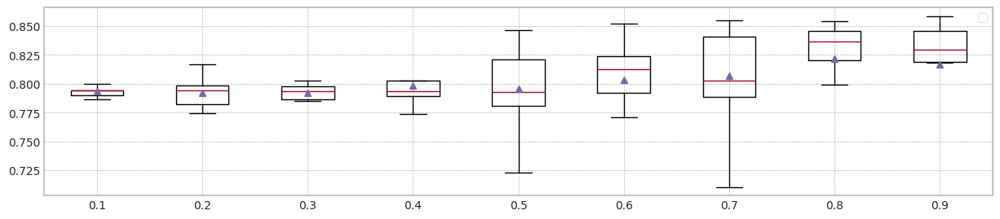

In [41]:
plt.figure(figsize=main_figsize)
bp = []
lb = []
for i, df in enumerate(gcd_statistics_dfs):
    bp.append(df['Mean F1'].values)
    lb.append(f'{(i/10+0.1):.1f}')

plt.boxplot(bp,showmeans=True,showfliers=False,labels=lb)
plt.legend()
plt.show()


In [42]:
gcd_statistics_dfs = []
for alpha in [0.1,0.2,0.3,0.4,0.5,0.6,0.7,0.8,0.9]:
    org_df,gcd_df = drift_tolerant2(X1, Y1,train_size, test_size,avaible_range = 50,lambda_f2=alpha,trial_count=10,weight_init=True,isTest=True)
    display(org_df)
    display(gcd_df)
    gcd_statistics_dfs.append(gcd_df)

trial_count: 10
lambda_f2 0.1
######################### Trial 0 for Normal model ###########################
cuda:0


100%|██████████| 2000/2000 [00:03<00:00, 654.86it/s]


Test f1 score: 0.8764465998016092
X_live.shape (39000, 6)
Truncate 8000 rows from live_set (39000, 6)
Search MI & Drift...for X_live_set torch.Size([31, 9000, 6])


100%|██████████| 31/31 [00:05<00:00,  5.58it/s]


mean of drift:
x0    0.011903
x1    0.011896
x2    0.010036
x3    0.013871
z0    0.182717
dtype: float64
Mean F1 for all data: 0.7969252763581919
######################### Trial 0 for Drift tolerant model ###########################
cuda:0


100%|██████████| 2000/2000 [00:08<00:00, 236.53it/s]


Test f1 score: 0.8768179814896431
X_live.shape (39000, 6)
Truncate 8000 rows from live_set (39000, 6)
Search MI & Drift...for X_live_set torch.Size([31, 9000, 6])


100%|██████████| 31/31 [00:05<00:00,  5.54it/s]


mean of drift:
x0    0.031806
x1    0.027667
x2    0.109649
x3    0.107810
z0    0.235018
dtype: float64
Mean F1 for all data: 0.7667529880787064
Normal model median        : 0.7969252763581919
Drift tolerant model median: 0.7667529880787064
######################### Trial 1 for Normal model ###########################
cuda:0


100%|██████████| 2000/2000 [00:02<00:00, 669.65it/s]


Test f1 score: 0.8771620579486614
X_live.shape (39000, 6)
Truncate 8000 rows from live_set (39000, 6)
Search MI & Drift...for X_live_set torch.Size([31, 9000, 6])


100%|██████████| 31/31 [00:05<00:00,  5.51it/s]


mean of drift:
x0    0.011903
x1    0.011896
x2    0.010036
x3    0.013871
z0    0.182717
dtype: float64
Mean F1 for all data: 0.7945274333033483
######################### Trial 1 for Drift tolerant model ###########################
cuda:0


100%|██████████| 2000/2000 [00:08<00:00, 244.23it/s]


Test f1 score: 0.8771504190560212
X_live.shape (39000, 6)
Truncate 8000 rows from live_set (39000, 6)
Search MI & Drift...for X_live_set torch.Size([31, 9000, 6])


100%|██████████| 31/31 [00:05<00:00,  5.59it/s]


mean of drift:
x0    0.055624
x1    0.077563
x2    0.023713
x3    0.132642
z0    0.189254
dtype: float64
Mean F1 for all data: 0.7665680591390173
Normal model median        : 0.79572635483077
Drift tolerant model median: 0.7666605236088618
######################### Trial 2 for Normal model ###########################
cuda:0


100%|██████████| 2000/2000 [00:02<00:00, 675.27it/s]


Test f1 score: 0.8773866019203178
X_live.shape (39000, 6)
Truncate 8000 rows from live_set (39000, 6)
Search MI & Drift...for X_live_set torch.Size([31, 9000, 6])


100%|██████████| 31/31 [00:05<00:00,  5.63it/s]


mean of drift:
x0    0.011903
x1    0.011896
x2    0.010036
x3    0.013871
z0    0.182717
dtype: float64
Mean F1 for all data: 0.7962286881607163
######################### Trial 2 for Drift tolerant model ###########################
cuda:0


100%|██████████| 2000/2000 [00:08<00:00, 240.65it/s]


Test f1 score: 0.8768059997794199
X_live.shape (39000, 6)
Truncate 8000 rows from live_set (39000, 6)
Search MI & Drift...for X_live_set torch.Size([31, 9000, 6])


100%|██████████| 31/31 [00:05<00:00,  5.59it/s]


mean of drift:
x0    0.013290
x1    0.043656
x2    0.023746
x3    0.086602
z0    0.228323
dtype: float64
Mean F1 for all data: 0.7578216326367376
Normal model median        : 0.7962286881607163
Drift tolerant model median: 0.7665680591390173
######################### Trial 3 for Normal model ###########################
cuda:0


100%|██████████| 2000/2000 [00:03<00:00, 664.26it/s]


Test f1 score: 0.8769112308876912
X_live.shape (39000, 6)
Truncate 8000 rows from live_set (39000, 6)
Search MI & Drift...for X_live_set torch.Size([31, 9000, 6])


100%|██████████| 31/31 [00:05<00:00,  5.44it/s]


mean of drift:
x0    0.011903
x1    0.011896
x2    0.010036
x3    0.013871
z0    0.182717
dtype: float64
Mean F1 for all data: 0.7920022388915385
######################### Trial 3 for Drift tolerant model ###########################
cuda:0


100%|██████████| 2000/2000 [00:08<00:00, 241.36it/s]


Test f1 score: 0.8765854196536892
X_live.shape (39000, 6)
Truncate 8000 rows from live_set (39000, 6)
Search MI & Drift...for X_live_set torch.Size([31, 9000, 6])


100%|██████████| 31/31 [00:05<00:00,  5.52it/s]


mean of drift:
x0    0.039688
x1    0.054932
x2    0.011961
x3    0.039570
z0    0.217738
dtype: float64
Mean F1 for all data: 0.7777843601950162
Normal model median        : 0.7953780607320323
Drift tolerant model median: 0.7666605236088618
######################### Trial 4 for Normal model ###########################
cuda:0


100%|██████████| 2000/2000 [00:03<00:00, 657.89it/s]


Test f1 score: 0.8767364939360528
X_live.shape (39000, 6)
Truncate 8000 rows from live_set (39000, 6)
Search MI & Drift...for X_live_set torch.Size([31, 9000, 6])


100%|██████████| 31/31 [00:05<00:00,  5.56it/s]


mean of drift:
x0    0.011903
x1    0.011896
x2    0.010036
x3    0.013871
z0    0.182717
dtype: float64
Mean F1 for all data: 0.7954220623610796
######################### Trial 4 for Drift tolerant model ###########################
cuda:0


100%|██████████| 2000/2000 [00:08<00:00, 244.02it/s]


Test f1 score: 0.8768874683125758
X_live.shape (39000, 6)
Truncate 8000 rows from live_set (39000, 6)
Search MI & Drift...for X_live_set torch.Size([31, 9000, 6])


100%|██████████| 31/31 [00:05<00:00,  5.59it/s]


mean of drift:
x0    0.062839
x1    0.071075
x2    0.053910
x3    0.102014
z0    0.223875
dtype: float64
Mean F1 for all data: 0.7462907775013745
Normal model median        : 0.7954220623610796
Drift tolerant model median: 0.7665680591390173
######################### Trial 5 for Normal model ###########################
cuda:0


100%|██████████| 2000/2000 [00:03<00:00, 654.05it/s]


Test f1 score: 0.8765976200969591
X_live.shape (39000, 6)
Truncate 8000 rows from live_set (39000, 6)
Search MI & Drift...for X_live_set torch.Size([31, 9000, 6])


100%|██████████| 31/31 [00:05<00:00,  5.40it/s]


mean of drift:
x0    0.011903
x1    0.011896
x2    0.010036
x3    0.013871
z0    0.182717
dtype: float64
Mean F1 for all data: 0.7960740208009198
######################### Trial 5 for Drift tolerant model ###########################
cuda:0


100%|██████████| 2000/2000 [00:08<00:00, 241.81it/s]


Test f1 score: 0.877661334804192
X_live.shape (39000, 6)
Truncate 8000 rows from live_set (39000, 6)
Search MI & Drift...for X_live_set torch.Size([31, 9000, 6])


100%|██████████| 31/31 [00:05<00:00,  5.56it/s]


mean of drift:
x0    0.035330
x1    0.021710
x2    0.104161
x3    0.107910
z0    0.153591
dtype: float64
Mean F1 for all data: 0.7909016803455106
Normal model median        : 0.7957480415809997
Drift tolerant model median: 0.7666605236088618
######################### Trial 6 for Normal model ###########################
cuda:0


100%|██████████| 2000/2000 [00:02<00:00, 674.61it/s]


Test f1 score: 0.8767213837170872
X_live.shape (39000, 6)
Truncate 8000 rows from live_set (39000, 6)
Search MI & Drift...for X_live_set torch.Size([31, 9000, 6])


100%|██████████| 31/31 [00:05<00:00,  5.59it/s]


mean of drift:
x0    0.011903
x1    0.011896
x2    0.010036
x3    0.013871
z0    0.182717
dtype: float64
Mean F1 for all data: 0.7963020617907525
######################### Trial 6 for Drift tolerant model ###########################
cuda:0


100%|██████████| 2000/2000 [00:08<00:00, 241.65it/s]


Test f1 score: 0.877533039647577
X_live.shape (39000, 6)
Truncate 8000 rows from live_set (39000, 6)
Search MI & Drift...for X_live_set torch.Size([31, 9000, 6])


100%|██████████| 31/31 [00:05<00:00,  5.58it/s]


mean of drift:
x0    0.021642
x1    0.025258
x2    0.099254
x3    0.075731
z0    0.184599
dtype: float64
Mean F1 for all data: 0.7773179607282795
Normal model median        : 0.7960740208009198
Drift tolerant model median: 0.7667529880787064
######################### Trial 7 for Normal model ###########################
cuda:0


100%|██████████| 2000/2000 [00:02<00:00, 672.02it/s]


Test f1 score: 0.8778609154929576
X_live.shape (39000, 6)
Truncate 8000 rows from live_set (39000, 6)
Search MI & Drift...for X_live_set torch.Size([31, 9000, 6])


100%|██████████| 31/31 [00:05<00:00,  5.58it/s]


mean of drift:
x0    0.011903
x1    0.011896
x2    0.010036
x3    0.013871
z0    0.182717
dtype: float64
Mean F1 for all data: 0.7965556479326527
######################### Trial 7 for Drift tolerant model ###########################
cuda:0


100%|██████████| 2000/2000 [00:08<00:00, 242.80it/s]


Test f1 score: 0.8779518870006622
X_live.shape (39000, 6)
Truncate 8000 rows from live_set (39000, 6)
Search MI & Drift...for X_live_set torch.Size([31, 9000, 6])


100%|██████████| 31/31 [00:05<00:00,  5.55it/s]


mean of drift:
x0    0.040921
x1    0.079652
x2    0.046466
x3    0.047688
z0    0.266176
dtype: float64
Mean F1 for all data: 0.8167270002051704
Normal model median        : 0.7961513544808181
Drift tolerant model median: 0.772035474403493
######################### Trial 8 for Normal model ###########################
cuda:0


100%|██████████| 2000/2000 [00:03<00:00, 662.02it/s]


Test f1 score: 0.8778220451527223
X_live.shape (39000, 6)
Truncate 8000 rows from live_set (39000, 6)
Search MI & Drift...for X_live_set torch.Size([31, 9000, 6])


100%|██████████| 31/31 [00:05<00:00,  5.59it/s]


mean of drift:
x0    0.011903
x1    0.011896
x2    0.010036
x3    0.013871
z0    0.182717
dtype: float64
Mean F1 for all data: 0.7973550671081387
######################### Trial 8 for Drift tolerant model ###########################
cuda:0


100%|██████████| 2000/2000 [00:08<00:00, 241.04it/s]


Test f1 score: 0.8767694502359267
X_live.shape (39000, 6)
Truncate 8000 rows from live_set (39000, 6)
Search MI & Drift...for X_live_set torch.Size([31, 9000, 6])


100%|██████████| 31/31 [00:05<00:00,  5.60it/s]


mean of drift:
x0    0.046473
x1    0.101075
x2    0.064921
x3    0.011785
z0    0.219864
dtype: float64
Mean F1 for all data: 0.782349101321808
Normal model median        : 0.7962286881607163
Drift tolerant model median: 0.7773179607282795
######################### Trial 9 for Normal model ###########################
cuda:0


100%|██████████| 2000/2000 [00:03<00:00, 655.40it/s]


Test f1 score: 0.877347095640716
X_live.shape (39000, 6)
Truncate 8000 rows from live_set (39000, 6)
Search MI & Drift...for X_live_set torch.Size([31, 9000, 6])


100%|██████████| 31/31 [00:05<00:00,  5.52it/s]


mean of drift:
x0    0.011903
x1    0.011896
x2    0.010036
x3    0.013871
z0    0.182717
dtype: float64
Mean F1 for all data: 0.795215998637478
######################### Trial 9 for Drift tolerant model ###########################
cuda:0


100%|██████████| 2000/2000 [00:08<00:00, 243.84it/s]


Test f1 score: 0.8784140969162996
X_live.shape (39000, 6)
Truncate 8000 rows from live_set (39000, 6)
Search MI & Drift...for X_live_set torch.Size([31, 9000, 6])


100%|██████████| 31/31 [00:05<00:00,  5.51it/s]


mean of drift:
x0    0.035584
x1    0.029065
x2    0.011609
x3    0.020244
z0    0.182165
dtype: float64
Mean F1 for all data: 0.7913304856217097
Normal model median        : 0.7961513544808181
Drift tolerant model median: 0.7775511604616479


,Trial,Testset F1,Initial F1,Mean F1,Last F1,Elapsed time
0,0,0.876447,0.874156,0.796925,0.731435,5.574084
1,1,0.877162,0.875152,0.794527,0.726733,5.646044
2,2,0.877387,0.875568,0.796229,0.728255,5.527639
3,3,0.876911,0.874931,0.792002,0.723297,5.719185
4,4,0.876736,0.874197,0.795422,0.728732,5.593035
5,5,0.876598,0.874281,0.796074,0.728989,5.759194
6,6,0.876721,0.874627,0.796302,0.728565,5.561275
7,7,0.877861,0.875580,0.796556,0.731794,5.576299
8,8,0.877822,0.875848,0.797355,0.731538,5.564479
9,9,0.877347,0.875234,0.795216,0.727756,5.638241


,Trial,Testset F1,Initial F1,Mean F1,Last F1,Elapsed time
0,0,0.876818,0.875014,0.766753,0.666251,5.620357
1,1,0.877150,0.874848,0.766568,0.656510,5.561388
2,2,0.876806,0.874778,0.757822,0.638471,5.569009
3,3,0.876585,0.874751,0.777784,0.697600,5.639287
4,4,0.876887,0.874612,0.746291,0.603768,5.561703
5,5,0.877661,0.875111,0.790902,0.712482,5.596186
6,6,0.877533,0.875678,0.777318,0.670197,5.571510
7,7,0.877952,0.875901,0.816727,0.778439,5.601905
8,8,0.876769,0.874876,0.782349,0.709803,5.560172
9,9,0.878414,0.876715,0.791330,0.725474,5.645409


trial_count: 10
lambda_f2 0.2
######################### Trial 0 for Normal model ###########################
cuda:0


100%|██████████| 2000/2000 [00:02<00:00, 670.07it/s]


Test f1 score: 0.8764465998016092
X_live.shape (39000, 6)
Truncate 8000 rows from live_set (39000, 6)
Search MI & Drift...for X_live_set torch.Size([31, 9000, 6])


100%|██████████| 31/31 [00:05<00:00,  5.61it/s]


mean of drift:
x0    0.011903
x1    0.011896
x2    0.010036
x3    0.013871
z0    0.182717
dtype: float64
Mean F1 for all data: 0.7969252763581919
######################### Trial 0 for Drift tolerant model ###########################
cuda:0


100%|██████████| 2000/2000 [00:08<00:00, 241.42it/s]


Test f1 score: 0.8786878027300749
X_live.shape (39000, 6)
Truncate 8000 rows from live_set (39000, 6)
Search MI & Drift...for X_live_set torch.Size([31, 9000, 6])


100%|██████████| 31/31 [00:05<00:00,  5.55it/s]


mean of drift:
x0    0.031308
x1    0.029921
x2    0.109025
x3    0.099742
z0    0.271982
dtype: float64
Mean F1 for all data: 0.7520716288000225
Normal model median        : 0.7969252763581919
Drift tolerant model median: 0.7520716288000225
######################### Trial 1 for Normal model ###########################
cuda:0


100%|██████████| 2000/2000 [00:02<00:00, 678.11it/s]


Test f1 score: 0.8771620579486614
X_live.shape (39000, 6)
Truncate 8000 rows from live_set (39000, 6)
Search MI & Drift...for X_live_set torch.Size([31, 9000, 6])


100%|██████████| 31/31 [00:05<00:00,  5.51it/s]


mean of drift:
x0    0.011903
x1    0.011896
x2    0.010036
x3    0.013871
z0    0.182717
dtype: float64
Mean F1 for all data: 0.7945274333033483
######################### Trial 1 for Drift tolerant model ###########################
cuda:0


100%|██████████| 2000/2000 [00:08<00:00, 242.09it/s]


Test f1 score: 0.8777740973832394
X_live.shape (39000, 6)
Truncate 8000 rows from live_set (39000, 6)
Search MI & Drift...for X_live_set torch.Size([31, 9000, 6])


100%|██████████| 31/31 [00:05<00:00,  5.57it/s]


mean of drift:
x0    0.110652
x1    0.099996
x2    0.045720
x3    0.229036
z0    0.220681
dtype: float64
Mean F1 for all data: 0.6958664220083801
Normal model median        : 0.79572635483077
Drift tolerant model median: 0.7239690254042013
######################### Trial 2 for Normal model ###########################
cuda:0


100%|██████████| 2000/2000 [00:03<00:00, 660.96it/s]


Test f1 score: 0.8773866019203178
X_live.shape (39000, 6)
Truncate 8000 rows from live_set (39000, 6)
Search MI & Drift...for X_live_set torch.Size([31, 9000, 6])


100%|██████████| 31/31 [00:05<00:00,  5.59it/s]


mean of drift:
x0    0.011903
x1    0.011896
x2    0.010036
x3    0.013871
z0    0.182717
dtype: float64
Mean F1 for all data: 0.7962286881607163
######################### Trial 2 for Drift tolerant model ###########################
cuda:0


100%|██████████| 2000/2000 [00:08<00:00, 245.71it/s]


Test f1 score: 0.8775487710790256
X_live.shape (39000, 6)
Truncate 8000 rows from live_set (39000, 6)
Search MI & Drift...for X_live_set torch.Size([31, 9000, 6])


100%|██████████| 31/31 [00:05<00:00,  5.59it/s]


mean of drift:
x0    0.036133
x1    0.059670
x2    0.027627
x3    0.086986
z0    0.271968
dtype: float64
Mean F1 for all data: 0.7304367462958549
Normal model median        : 0.7962286881607163
Drift tolerant model median: 0.7304367462958549
######################### Trial 3 for Normal model ###########################
cuda:0


100%|██████████| 2000/2000 [00:03<00:00, 636.26it/s]


Test f1 score: 0.8769112308876912
X_live.shape (39000, 6)
Truncate 8000 rows from live_set (39000, 6)
Search MI & Drift...for X_live_set torch.Size([31, 9000, 6])


100%|██████████| 31/31 [00:05<00:00,  5.60it/s]


mean of drift:
x0    0.011903
x1    0.011896
x2    0.010036
x3    0.013871
z0    0.182717
dtype: float64
Mean F1 for all data: 0.7920022388915385
######################### Trial 3 for Drift tolerant model ###########################
cuda:0


100%|██████████| 2000/2000 [00:08<00:00, 242.61it/s]


Test f1 score: 0.8782800441014333
X_live.shape (39000, 6)
Truncate 8000 rows from live_set (39000, 6)
Search MI & Drift...for X_live_set torch.Size([31, 9000, 6])


100%|██████████| 31/31 [00:05<00:00,  5.54it/s]


mean of drift:
x0    0.048025
x1    0.065570
x2    0.013244
x3    0.035237
z0    0.257244
dtype: float64
Mean F1 for all data: 0.7634654504118312
Normal model median        : 0.7953780607320323
Drift tolerant model median: 0.7412541875479387
######################### Trial 4 for Normal model ###########################
cuda:0


100%|██████████| 2000/2000 [00:03<00:00, 661.31it/s]


Test f1 score: 0.8767364939360528
X_live.shape (39000, 6)
Truncate 8000 rows from live_set (39000, 6)
Search MI & Drift...for X_live_set torch.Size([31, 9000, 6])


100%|██████████| 31/31 [00:05<00:00,  5.62it/s]


mean of drift:
x0    0.011903
x1    0.011896
x2    0.010036
x3    0.013871
z0    0.182717
dtype: float64
Mean F1 for all data: 0.7954220623610796
######################### Trial 4 for Drift tolerant model ###########################
cuda:0


100%|██████████| 2000/2000 [00:08<00:00, 244.91it/s]


Test f1 score: 0.8776185226019846
X_live.shape (39000, 6)
Truncate 8000 rows from live_set (39000, 6)
Search MI & Drift...for X_live_set torch.Size([31, 9000, 6])


100%|██████████| 31/31 [00:05<00:00,  5.49it/s]


mean of drift:
x0    0.066989
x1    0.059903
x2    0.092384
x3    0.171219
z0    0.215201
dtype: float64
Mean F1 for all data: 0.7229624142771091
Normal model median        : 0.7954220623610796
Drift tolerant model median: 0.7304367462958549
######################### Trial 5 for Normal model ###########################
cuda:0


100%|██████████| 2000/2000 [00:03<00:00, 659.14it/s]


Test f1 score: 0.8765976200969591
X_live.shape (39000, 6)
Truncate 8000 rows from live_set (39000, 6)
Search MI & Drift...for X_live_set torch.Size([31, 9000, 6])


100%|██████████| 31/31 [00:05<00:00,  5.57it/s]


mean of drift:
x0    0.011903
x1    0.011896
x2    0.010036
x3    0.013871
z0    0.182717
dtype: float64
Mean F1 for all data: 0.7960740208009198
######################### Trial 5 for Drift tolerant model ###########################
cuda:0


100%|██████████| 2000/2000 [00:08<00:00, 245.22it/s]


Test f1 score: 0.8787644787644788
X_live.shape (39000, 6)
Truncate 8000 rows from live_set (39000, 6)
Search MI & Drift...for X_live_set torch.Size([31, 9000, 6])


100%|██████████| 31/31 [00:05<00:00,  5.59it/s]


mean of drift:
x0    0.029864
x1    0.026208
x2    0.127448
x3    0.109136
z0    0.138925
dtype: float64
Mean F1 for all data: 0.8009987004419362
Normal model median        : 0.7957480415809997
Drift tolerant model median: 0.7412541875479387
######################### Trial 6 for Normal model ###########################
cuda:0


100%|██████████| 2000/2000 [00:03<00:00, 661.48it/s]


Test f1 score: 0.8767213837170872
X_live.shape (39000, 6)
Truncate 8000 rows from live_set (39000, 6)
Search MI & Drift...for X_live_set torch.Size([31, 9000, 6])


100%|██████████| 31/31 [00:05<00:00,  5.59it/s]


mean of drift:
x0    0.011903
x1    0.011896
x2    0.010036
x3    0.013871
z0    0.182717
dtype: float64
Mean F1 for all data: 0.7963020617907525
######################### Trial 6 for Drift tolerant model ###########################
cuda:0


100%|██████████| 2000/2000 [00:08<00:00, 240.87it/s]


Test f1 score: 0.8788546255506607
X_live.shape (39000, 6)
Truncate 8000 rows from live_set (39000, 6)
Search MI & Drift...for X_live_set torch.Size([31, 9000, 6])


100%|██████████| 31/31 [00:05<00:00,  5.61it/s]


mean of drift:
x0    0.019746
x1    0.022681
x2    0.124068
x3    0.098932
z0    0.184247
dtype: float64
Mean F1 for all data: 0.7572365345078912
Normal model median        : 0.7960740208009198
Drift tolerant model median: 0.7520716288000225
######################### Trial 7 for Normal model ###########################
cuda:0


100%|██████████| 2000/2000 [00:03<00:00, 665.47it/s]


Test f1 score: 0.8778609154929576
X_live.shape (39000, 6)
Truncate 8000 rows from live_set (39000, 6)
Search MI & Drift...for X_live_set torch.Size([31, 9000, 6])


100%|██████████| 31/31 [00:05<00:00,  5.62it/s]


mean of drift:
x0    0.011903
x1    0.011896
x2    0.010036
x3    0.013871
z0    0.182717
dtype: float64
Mean F1 for all data: 0.7965556479326527
######################### Trial 7 for Drift tolerant model ###########################
cuda:0


100%|██████████| 2000/2000 [00:08<00:00, 242.66it/s]


Test f1 score: 0.8794888742013659
X_live.shape (39000, 6)
Truncate 8000 rows from live_set (39000, 6)
Search MI & Drift...for X_live_set torch.Size([31, 9000, 6])


100%|██████████| 31/31 [00:05<00:00,  5.59it/s]


mean of drift:
x0    0.046233
x1    0.095842
x2    0.052262
x3    0.163742
z0    0.159634
dtype: float64
Mean F1 for all data: 0.8229066211066985
Normal model median        : 0.7961513544808181
Drift tolerant model median: 0.7546540816539569
######################### Trial 8 for Normal model ###########################
cuda:0


100%|██████████| 2000/2000 [00:02<00:00, 668.94it/s]


Test f1 score: 0.8778220451527223
X_live.shape (39000, 6)
Truncate 8000 rows from live_set (39000, 6)
Search MI & Drift...for X_live_set torch.Size([31, 9000, 6])


100%|██████████| 31/31 [00:05<00:00,  5.61it/s]


mean of drift:
x0    0.011903
x1    0.011896
x2    0.010036
x3    0.013871
z0    0.182717
dtype: float64
Mean F1 for all data: 0.7973550671081387
######################### Trial 8 for Drift tolerant model ###########################
cuda:0


100%|██████████| 2000/2000 [00:08<00:00, 243.33it/s]


Test f1 score: 0.8773315777924073
X_live.shape (39000, 6)
Truncate 8000 rows from live_set (39000, 6)
Search MI & Drift...for X_live_set torch.Size([31, 9000, 6])


100%|██████████| 31/31 [00:05<00:00,  5.46it/s]


mean of drift:
x0    0.048351
x1    0.075953
x2    0.079362
x3    0.037624
z0    0.234663
dtype: float64
Mean F1 for all data: 0.7777470414169364
Normal model median        : 0.7962286881607163
Drift tolerant model median: 0.7572365345078912
######################### Trial 9 for Normal model ###########################
cuda:0


100%|██████████| 2000/2000 [00:03<00:00, 657.71it/s]


Test f1 score: 0.877347095640716
X_live.shape (39000, 6)
Truncate 8000 rows from live_set (39000, 6)
Search MI & Drift...for X_live_set torch.Size([31, 9000, 6])


100%|██████████| 31/31 [00:05<00:00,  5.55it/s]


mean of drift:
x0    0.011903
x1    0.011896
x2    0.010036
x3    0.013871
z0    0.182717
dtype: float64
Mean F1 for all data: 0.795215998637478
######################### Trial 9 for Drift tolerant model ###########################
cuda:0


100%|██████████| 2000/2000 [00:08<00:00, 242.64it/s]


Test f1 score: 0.8792323811624572
X_live.shape (39000, 6)
Truncate 8000 rows from live_set (39000, 6)
Search MI & Drift...for X_live_set torch.Size([31, 9000, 6])


100%|██████████| 31/31 [00:05<00:00,  5.61it/s]


mean of drift:
x0    0.040344
x1    0.058222
x2    0.014867
x3    0.118473
z0    0.163047
dtype: float64
Mean F1 for all data: 0.7686315725927154
Normal model median        : 0.7961513544808181
Drift tolerant model median: 0.7603509924598613


,Trial,Testset F1,Initial F1,Mean F1,Last F1,Elapsed time
0,0,0.876447,0.874156,0.796925,0.731435,5.546774
1,1,0.877162,0.875152,0.794527,0.726733,5.647357
2,2,0.877387,0.875568,0.796229,0.728255,5.568186
3,3,0.876911,0.874931,0.792002,0.723297,5.559591
4,4,0.876736,0.874197,0.795422,0.728732,5.536158
5,5,0.876598,0.874281,0.796074,0.728989,5.580294
6,6,0.876721,0.874627,0.796302,0.728565,5.566629
7,7,0.877861,0.875580,0.796556,0.731794,5.538796
8,8,0.877822,0.875848,0.797355,0.731538,5.542408
9,9,0.877347,0.875234,0.795216,0.727756,5.600613


,Trial,Testset F1,Initial F1,Mean F1,Last F1,Elapsed time
0,0,0.878688,0.876564,0.752072,0.617826,5.602447
1,1,0.877774,0.874694,0.695866,0.485275,5.588385
2,2,0.877549,0.875499,0.730437,0.570353,5.570431
3,3,0.878280,0.875943,0.763465,0.665086,5.612159
4,4,0.877619,0.875153,0.722962,0.544769,5.663058
5,5,0.878764,0.876816,0.800999,0.727661,5.568653
6,6,0.878855,0.876260,0.757237,0.621811,5.541506
7,7,0.879489,0.878221,0.822907,0.753414,5.564418
8,8,0.877332,0.875138,0.777747,0.705167,5.694720
9,9,0.879232,0.876913,0.768632,0.663219,5.542675


trial_count: 10
lambda_f2 0.3
######################### Trial 0 for Normal model ###########################
cuda:0


100%|██████████| 2000/2000 [00:02<00:00, 671.09it/s]


Test f1 score: 0.8764465998016092
X_live.shape (39000, 6)
Truncate 8000 rows from live_set (39000, 6)
Search MI & Drift...for X_live_set torch.Size([31, 9000, 6])


100%|██████████| 31/31 [00:05<00:00,  5.54it/s]


mean of drift:
x0    0.011903
x1    0.011896
x2    0.010036
x3    0.013871
z0    0.182717
dtype: float64
Mean F1 for all data: 0.7969252763581919
######################### Trial 0 for Drift tolerant model ###########################
cuda:0


100%|██████████| 2000/2000 [00:08<00:00, 244.99it/s]


Test f1 score: 0.8790553961597881
X_live.shape (39000, 6)
Truncate 8000 rows from live_set (39000, 6)
Search MI & Drift...for X_live_set torch.Size([31, 9000, 6])


100%|██████████| 31/31 [00:05<00:00,  5.58it/s]


mean of drift:
x0    0.028588
x1    0.029068
x2    0.106398
x3    0.099233
z0    0.235269
dtype: float64
Mean F1 for all data: 0.7634132597334715
Normal model median        : 0.7969252763581919
Drift tolerant model median: 0.7634132597334715
######################### Trial 1 for Normal model ###########################
cuda:0


100%|██████████| 2000/2000 [00:02<00:00, 674.26it/s]


Test f1 score: 0.8771620579486614
X_live.shape (39000, 6)
Truncate 8000 rows from live_set (39000, 6)
Search MI & Drift...for X_live_set torch.Size([31, 9000, 6])


100%|██████████| 31/31 [00:05<00:00,  5.61it/s]


mean of drift:
x0    0.011903
x1    0.011896
x2    0.010036
x3    0.013871
z0    0.182717
dtype: float64
Mean F1 for all data: 0.7945274333033483
######################### Trial 1 for Drift tolerant model ###########################
cuda:0


100%|██████████| 2000/2000 [00:08<00:00, 241.41it/s]


Test f1 score: 0.8781563568199361
X_live.shape (39000, 6)
Truncate 8000 rows from live_set (39000, 6)
Search MI & Drift...for X_live_set torch.Size([31, 9000, 6])


100%|██████████| 31/31 [00:05<00:00,  5.57it/s]


mean of drift:
x0    0.151685
x1    0.068093
x2    0.052918
x3    0.195638
z0    0.261011
dtype: float64
Mean F1 for all data: 0.6740603021044087
Normal model median        : 0.79572635483077
Drift tolerant model median: 0.7187367809189401
######################### Trial 2 for Normal model ###########################
cuda:0


100%|██████████| 2000/2000 [00:03<00:00, 656.56it/s]


Test f1 score: 0.8773866019203178
X_live.shape (39000, 6)
Truncate 8000 rows from live_set (39000, 6)
Search MI & Drift...for X_live_set torch.Size([31, 9000, 6])


100%|██████████| 31/31 [00:05<00:00,  5.56it/s]


mean of drift:
x0    0.011903
x1    0.011896
x2    0.010036
x3    0.013871
z0    0.182717
dtype: float64
Mean F1 for all data: 0.7962286881607163
######################### Trial 2 for Drift tolerant model ###########################
cuda:0


100%|██████████| 2000/2000 [00:08<00:00, 242.22it/s]


Test f1 score: 0.8773866019203178
X_live.shape (39000, 6)
Truncate 8000 rows from live_set (39000, 6)
Search MI & Drift...for X_live_set torch.Size([31, 9000, 6])


100%|██████████| 31/31 [00:05<00:00,  5.49it/s]


mean of drift:
x0    0.044588
x1    0.058269
x2    0.032681
x3    0.085545
z0    0.353857
dtype: float64
Mean F1 for all data: 0.6788342035137751
Normal model median        : 0.7962286881607163
Drift tolerant model median: 0.6788342035137751
######################### Trial 3 for Normal model ###########################
cuda:0


100%|██████████| 2000/2000 [00:03<00:00, 666.39it/s]


Test f1 score: 0.8769112308876912
X_live.shape (39000, 6)
Truncate 8000 rows from live_set (39000, 6)
Search MI & Drift...for X_live_set torch.Size([31, 9000, 6])


100%|██████████| 31/31 [00:05<00:00,  5.40it/s]


mean of drift:
x0    0.011903
x1    0.011896
x2    0.010036
x3    0.013871
z0    0.182717
dtype: float64
Mean F1 for all data: 0.7920022388915385
######################### Trial 3 for Drift tolerant model ###########################
cuda:0


100%|██████████| 2000/2000 [00:08<00:00, 245.33it/s]


Test f1 score: 0.8785005512679162
X_live.shape (39000, 6)
Truncate 8000 rows from live_set (39000, 6)
Search MI & Drift...for X_live_set torch.Size([31, 9000, 6])


100%|██████████| 31/31 [00:05<00:00,  5.53it/s]


mean of drift:
x0    0.042018
x1    0.051645
x2    0.011215
x3    0.036308
z0    0.294376
dtype: float64
Mean F1 for all data: 0.7452683021443951
Normal model median        : 0.7953780607320323
Drift tolerant model median: 0.7120512528290851
######################### Trial 4 for Normal model ###########################
cuda:0


100%|██████████| 2000/2000 [00:03<00:00, 652.06it/s]


Test f1 score: 0.8767364939360528
X_live.shape (39000, 6)
Truncate 8000 rows from live_set (39000, 6)
Search MI & Drift...for X_live_set torch.Size([31, 9000, 6])


100%|██████████| 31/31 [00:05<00:00,  5.54it/s]


mean of drift:
x0    0.011903
x1    0.011896
x2    0.010036
x3    0.013871
z0    0.182717
dtype: float64
Mean F1 for all data: 0.7954220623610796
######################### Trial 4 for Drift tolerant model ###########################
cuda:0


100%|██████████| 2000/2000 [00:08<00:00, 241.28it/s]


Test f1 score: 0.8774293286219081
X_live.shape (39000, 6)
Truncate 8000 rows from live_set (39000, 6)
Search MI & Drift...for X_live_set torch.Size([31, 9000, 6])


100%|██████████| 31/31 [00:05<00:00,  5.58it/s]


mean of drift:
x0    0.080305
x1    0.082201
x2    0.112799
x3    0.210964
z0    0.232111
dtype: float64
Mean F1 for all data: 0.6871411015467224
Normal model median        : 0.7954220623610796
Drift tolerant model median: 0.6871411015467224
######################### Trial 5 for Normal model ###########################
cuda:0


100%|██████████| 2000/2000 [00:03<00:00, 664.41it/s]


Test f1 score: 0.8765976200969591
X_live.shape (39000, 6)
Truncate 8000 rows from live_set (39000, 6)
Search MI & Drift...for X_live_set torch.Size([31, 9000, 6])


100%|██████████| 31/31 [00:05<00:00,  5.60it/s]


mean of drift:
x0    0.011903
x1    0.011896
x2    0.010036
x3    0.013871
z0    0.182717
dtype: float64
Mean F1 for all data: 0.7960740208009198
######################### Trial 5 for Drift tolerant model ###########################
cuda:0


100%|██████████| 2000/2000 [00:08<00:00, 239.63it/s]


Test f1 score: 0.8789485310360062
X_live.shape (39000, 6)
Truncate 8000 rows from live_set (39000, 6)
Search MI & Drift...for X_live_set torch.Size([31, 9000, 6])


100%|██████████| 31/31 [00:05<00:00,  5.52it/s]


mean of drift:
x0    0.029599
x1    0.028068
x2    0.025853
x3    0.111566
z0    0.100082
dtype: float64
Mean F1 for all data: 0.8226962517165795
Normal model median        : 0.7957480415809997
Drift tolerant model median: 0.7162047018455587
######################### Trial 6 for Normal model ###########################
cuda:0


100%|██████████| 2000/2000 [00:03<00:00, 652.27it/s]


Test f1 score: 0.8767213837170872
X_live.shape (39000, 6)
Truncate 8000 rows from live_set (39000, 6)
Search MI & Drift...for X_live_set torch.Size([31, 9000, 6])


100%|██████████| 31/31 [00:05<00:00,  5.62it/s]


mean of drift:
x0    0.011903
x1    0.011896
x2    0.010036
x3    0.013871
z0    0.182717
dtype: float64
Mean F1 for all data: 0.7963020617907525
######################### Trial 6 for Drift tolerant model ###########################
cuda:0


100%|██████████| 2000/2000 [00:08<00:00, 241.95it/s]


Test f1 score: 0.8789949305708618
X_live.shape (39000, 6)
Truncate 8000 rows from live_set (39000, 6)
Search MI & Drift...for X_live_set torch.Size([31, 9000, 6])


100%|██████████| 31/31 [00:05<00:00,  5.49it/s]


mean of drift:
x0    0.026054
x1    0.035971
x2    0.129287
x3    0.037018
z0    0.151039
dtype: float64
Mean F1 for all data: 0.7805036056729278
Normal model median        : 0.7960740208009198
Drift tolerant model median: 0.7452683021443951
######################### Trial 7 for Normal model ###########################
cuda:0


100%|██████████| 2000/2000 [00:03<00:00, 660.94it/s]


Test f1 score: 0.8778609154929576
X_live.shape (39000, 6)
Truncate 8000 rows from live_set (39000, 6)
Search MI & Drift...for X_live_set torch.Size([31, 9000, 6])


100%|██████████| 31/31 [00:05<00:00,  5.55it/s]


mean of drift:
x0    0.011903
x1    0.011896
x2    0.010036
x3    0.013871
z0    0.182717
dtype: float64
Mean F1 for all data: 0.7965556479326527
######################### Trial 7 for Drift tolerant model ###########################
cuda:0


100%|██████████| 2000/2000 [00:08<00:00, 242.56it/s]


Test f1 score: 0.8786509423564421
X_live.shape (39000, 6)
Truncate 8000 rows from live_set (39000, 6)
Search MI & Drift...for X_live_set torch.Size([31, 9000, 6])


100%|██████████| 31/31 [00:05<00:00,  5.54it/s]


mean of drift:
x0    0.070147
x1    0.100538
x2    0.047595
x3    0.033362
z0    0.118595
dtype: float64
Mean F1 for all data: 0.8363326441143271
Normal model median        : 0.7961513544808181
Drift tolerant model median: 0.7543407809389333
######################### Trial 8 for Normal model ###########################
cuda:0


100%|██████████| 2000/2000 [00:02<00:00, 669.57it/s]


Test f1 score: 0.8778220451527223
X_live.shape (39000, 6)
Truncate 8000 rows from live_set (39000, 6)
Search MI & Drift...for X_live_set torch.Size([31, 9000, 6])


100%|██████████| 31/31 [00:05<00:00,  5.56it/s]


mean of drift:
x0    0.011903
x1    0.011896
x2    0.010036
x3    0.013871
z0    0.182717
dtype: float64
Mean F1 for all data: 0.7973550671081387
######################### Trial 8 for Drift tolerant model ###########################
cuda:0


100%|██████████| 2000/2000 [00:08<00:00, 243.97it/s]


Test f1 score: 0.8790118010367265
X_live.shape (39000, 6)
Truncate 8000 rows from live_set (39000, 6)
Search MI & Drift...for X_live_set torch.Size([31, 9000, 6])


100%|██████████| 31/31 [00:05<00:00,  5.54it/s]


mean of drift:
x0    0.048495
x1    0.090713
x2    0.077029
x3    0.136315
z0    0.224222
dtype: float64
Mean F1 for all data: 0.7907700846332062
Normal model median        : 0.7962286881607163
Drift tolerant model median: 0.7634132597334715
######################### Trial 9 for Normal model ###########################
cuda:0


100%|██████████| 2000/2000 [00:03<00:00, 662.77it/s]


Test f1 score: 0.877347095640716
X_live.shape (39000, 6)
Truncate 8000 rows from live_set (39000, 6)
Search MI & Drift...for X_live_set torch.Size([31, 9000, 6])


100%|██████████| 31/31 [00:05<00:00,  5.59it/s]


mean of drift:
x0    0.011903
x1    0.011896
x2    0.010036
x3    0.013871
z0    0.182717
dtype: float64
Mean F1 for all data: 0.795215998637478
######################### Trial 9 for Drift tolerant model ###########################
cuda:0


100%|██████████| 2000/2000 [00:08<00:00, 240.54it/s]


Test f1 score: 0.8794263651406509
X_live.shape (39000, 6)
Truncate 8000 rows from live_set (39000, 6)
Search MI & Drift...for X_live_set torch.Size([31, 9000, 6])


100%|██████████| 31/31 [00:05<00:00,  5.59it/s]


mean of drift:
x0    0.041409
x1    0.068097
x2    0.015143
x3    0.145330
z0    0.135376
dtype: float64
Mean F1 for all data: 0.7662046986153536
Normal model median        : 0.7961513544808181
Drift tolerant model median: 0.7648089791744126


,Trial,Testset F1,Initial F1,Mean F1,Last F1,Elapsed time
0,0,0.876447,0.874156,0.796925,0.731435,5.612343
1,1,0.877162,0.875152,0.794527,0.726733,5.549361
2,2,0.877387,0.875568,0.796229,0.728255,5.593168
3,3,0.876911,0.874931,0.792002,0.723297,5.764125
4,4,0.876736,0.874197,0.795422,0.728732,5.615782
5,5,0.876598,0.874281,0.796074,0.728989,5.550553
6,6,0.876721,0.874627,0.796302,0.728565,5.534142
7,7,0.877861,0.875580,0.796556,0.731794,5.604336
8,8,0.877822,0.875848,0.797355,0.731538,5.598051
9,9,0.877347,0.875234,0.795216,0.727756,5.570886


,Trial,Testset F1,Initial F1,Mean F1,Last F1,Elapsed time
0,0,0.879055,0.876360,0.763413,0.648156,5.579618
1,1,0.878156,0.874889,0.674060,0.431464,5.584481
2,2,0.877387,0.874236,0.678834,0.432622,5.663488
3,3,0.878501,0.875389,0.745268,0.615341,5.627301
4,4,0.877429,0.874652,0.687141,0.451869,5.578892
5,5,0.878949,0.877730,0.822696,0.780364,5.631505
6,6,0.878995,0.876703,0.780504,0.669051,5.666871
7,7,0.878651,0.877255,0.836333,0.817935,5.615309
8,8,0.879012,0.875776,0.790770,0.750799,5.612474
9,9,0.879426,0.877177,0.766205,0.650280,5.565202


trial_count: 10
lambda_f2 0.4
######################### Trial 0 for Normal model ###########################
cuda:0


100%|██████████| 2000/2000 [00:02<00:00, 668.36it/s]


Test f1 score: 0.8764465998016092
X_live.shape (39000, 6)
Truncate 8000 rows from live_set (39000, 6)
Search MI & Drift...for X_live_set torch.Size([31, 9000, 6])


100%|██████████| 31/31 [00:05<00:00,  5.61it/s]


mean of drift:
x0    0.011903
x1    0.011896
x2    0.010036
x3    0.013871
z0    0.182717
dtype: float64
Mean F1 for all data: 0.7969252763581919
######################### Trial 0 for Drift tolerant model ###########################
cuda:0


100%|██████████| 2000/2000 [00:08<00:00, 242.51it/s]


Test f1 score: 0.8793920035246172
X_live.shape (39000, 6)
Truncate 8000 rows from live_set (39000, 6)
Search MI & Drift...for X_live_set torch.Size([31, 9000, 6])


100%|██████████| 31/31 [00:05<00:00,  5.50it/s]


mean of drift:
x0    0.031265
x1    0.034251
x2    0.104477
x3    0.125792
z0    0.152946
dtype: float64
Mean F1 for all data: 0.7878336460113078
Normal model median        : 0.7969252763581919
Drift tolerant model median: 0.7878336460113078
######################### Trial 1 for Normal model ###########################
cuda:0


100%|██████████| 2000/2000 [00:03<00:00, 662.40it/s]


Test f1 score: 0.8771620579486614
X_live.shape (39000, 6)
Truncate 8000 rows from live_set (39000, 6)
Search MI & Drift...for X_live_set torch.Size([31, 9000, 6])


100%|██████████| 31/31 [00:05<00:00,  5.59it/s]


mean of drift:
x0    0.011903
x1    0.011896
x2    0.010036
x3    0.013871
z0    0.182717
dtype: float64
Mean F1 for all data: 0.7945274333033483
######################### Trial 1 for Drift tolerant model ###########################
cuda:0


100%|██████████| 2000/2000 [00:08<00:00, 242.07it/s]


Test f1 score: 0.8778761061946903
X_live.shape (39000, 6)
Truncate 8000 rows from live_set (39000, 6)
Search MI & Drift...for X_live_set torch.Size([31, 9000, 6])


100%|██████████| 31/31 [00:05<00:00,  5.59it/s]


mean of drift:
x0    0.277075
x1    0.281115
x2    0.042746
x3    0.498219
z0    0.609104
dtype: float64
Mean F1 for all data: 0.8171181827685393
Normal model median        : 0.79572635483077
Drift tolerant model median: 0.8024759143899236
######################### Trial 2 for Normal model ###########################
cuda:0


100%|██████████| 2000/2000 [00:03<00:00, 660.58it/s]


Test f1 score: 0.8773866019203178
X_live.shape (39000, 6)
Truncate 8000 rows from live_set (39000, 6)
Search MI & Drift...for X_live_set torch.Size([31, 9000, 6])


100%|██████████| 31/31 [00:05<00:00,  5.60it/s]


mean of drift:
x0    0.011903
x1    0.011896
x2    0.010036
x3    0.013871
z0    0.182717
dtype: float64
Mean F1 for all data: 0.7962286881607163
######################### Trial 2 for Drift tolerant model ###########################
cuda:0


100%|██████████| 2000/2000 [00:08<00:00, 240.04it/s]


Test f1 score: 0.8789584022950457
X_live.shape (39000, 6)
Truncate 8000 rows from live_set (39000, 6)
Search MI & Drift...for X_live_set torch.Size([31, 9000, 6])


100%|██████████| 31/31 [00:05<00:00,  5.49it/s]


mean of drift:
x0    0.095344
x1    0.048713
x2    0.041620
x3    0.072792
z0    0.358530
dtype: float64
Mean F1 for all data: 0.6740730466117889
Normal model median        : 0.7962286881607163
Drift tolerant model median: 0.7878336460113078
######################### Trial 3 for Normal model ###########################
cuda:0


100%|██████████| 2000/2000 [00:03<00:00, 659.38it/s]


Test f1 score: 0.8769112308876912
X_live.shape (39000, 6)
Truncate 8000 rows from live_set (39000, 6)
Search MI & Drift...for X_live_set torch.Size([31, 9000, 6])


100%|██████████| 31/31 [00:05<00:00,  5.36it/s]


mean of drift:
x0    0.011903
x1    0.011896
x2    0.010036
x3    0.013871
z0    0.182717
dtype: float64
Mean F1 for all data: 0.7920022388915385
######################### Trial 3 for Drift tolerant model ###########################
cuda:0


100%|██████████| 2000/2000 [00:08<00:00, 243.69it/s]


Test f1 score: 0.8787342332374419
X_live.shape (39000, 6)
Truncate 8000 rows from live_set (39000, 6)
Search MI & Drift...for X_live_set torch.Size([31, 9000, 6])


100%|██████████| 31/31 [00:05<00:00,  5.48it/s]


mean of drift:
x0    0.050366
x1    0.050287
x2    0.010935
x3    0.036767
z0    0.398957
dtype: float64
Mean F1 for all data: 0.689298326722199
Normal model median        : 0.7953780607320323
Drift tolerant model median: 0.7385659863667534
######################### Trial 4 for Normal model ###########################
cuda:0


100%|██████████| 2000/2000 [00:02<00:00, 669.63it/s]


Test f1 score: 0.8767364939360528
X_live.shape (39000, 6)
Truncate 8000 rows from live_set (39000, 6)
Search MI & Drift...for X_live_set torch.Size([31, 9000, 6])


100%|██████████| 31/31 [00:05<00:00,  5.60it/s]


mean of drift:
x0    0.011903
x1    0.011896
x2    0.010036
x3    0.013871
z0    0.182717
dtype: float64
Mean F1 for all data: 0.7954220623610796
######################### Trial 4 for Drift tolerant model ###########################
cuda:0


100%|██████████| 2000/2000 [00:08<00:00, 244.25it/s]


Test f1 score: 0.8780217343091594
X_live.shape (39000, 6)
Truncate 8000 rows from live_set (39000, 6)
Search MI & Drift...for X_live_set torch.Size([31, 9000, 6])


100%|██████████| 31/31 [00:05<00:00,  5.56it/s]


mean of drift:
x0    0.155509
x1    0.103183
x2    0.427179
x3    0.427068
z0    0.614054
dtype: float64
Mean F1 for all data: 0.8422981474816716
Normal model median        : 0.7954220623610796
Drift tolerant model median: 0.7878336460113078
######################### Trial 5 for Normal model ###########################
cuda:0


100%|██████████| 2000/2000 [00:03<00:00, 659.65it/s]


Test f1 score: 0.8765976200969591
X_live.shape (39000, 6)
Truncate 8000 rows from live_set (39000, 6)
Search MI & Drift...for X_live_set torch.Size([31, 9000, 6])


100%|██████████| 31/31 [00:05<00:00,  5.55it/s]


mean of drift:
x0    0.011903
x1    0.011896
x2    0.010036
x3    0.013871
z0    0.182717
dtype: float64
Mean F1 for all data: 0.7960740208009198
######################### Trial 5 for Drift tolerant model ###########################
cuda:0


100%|██████████| 2000/2000 [00:08<00:00, 242.67it/s]


Test f1 score: 0.8790579949378232
X_live.shape (39000, 6)
Truncate 8000 rows from live_set (39000, 6)
Search MI & Drift...for X_live_set torch.Size([31, 9000, 6])


100%|██████████| 31/31 [00:05<00:00,  5.56it/s]


mean of drift:
x0    0.041677
x1    0.040978
x2    0.028624
x3    0.114939
z0    0.074871
dtype: float64
Mean F1 for all data: 0.8061386321326744
Normal model median        : 0.7957480415809997
Drift tolerant model median: 0.7969861390719911
######################### Trial 6 for Normal model ###########################
cuda:0


100%|██████████| 2000/2000 [00:03<00:00, 666.36it/s]


Test f1 score: 0.8767213837170872
X_live.shape (39000, 6)
Truncate 8000 rows from live_set (39000, 6)
Search MI & Drift...for X_live_set torch.Size([31, 9000, 6])


100%|██████████| 31/31 [00:05<00:00,  5.59it/s]


mean of drift:
x0    0.011903
x1    0.011896
x2    0.010036
x3    0.013871
z0    0.182717
dtype: float64
Mean F1 for all data: 0.7963020617907525
######################### Trial 6 for Drift tolerant model ###########################
cuda:0


100%|██████████| 2000/2000 [00:08<00:00, 241.23it/s]


Test f1 score: 0.8788713766119255
X_live.shape (39000, 6)
Truncate 8000 rows from live_set (39000, 6)
Search MI & Drift...for X_live_set torch.Size([31, 9000, 6])


100%|██████████| 31/31 [00:05<00:00,  5.53it/s]


mean of drift:
x0    0.027785
x1    0.031853
x2    0.131022
x3    0.037108
z0    0.129380
dtype: float64
Mean F1 for all data: 0.7878209133308947
Normal model median        : 0.7960740208009198
Drift tolerant model median: 0.7878336460113078
######################### Trial 7 for Normal model ###########################
cuda:0


100%|██████████| 2000/2000 [00:02<00:00, 672.27it/s]


Test f1 score: 0.8778609154929576
X_live.shape (39000, 6)
Truncate 8000 rows from live_set (39000, 6)
Search MI & Drift...for X_live_set torch.Size([31, 9000, 6])


100%|██████████| 31/31 [00:05<00:00,  5.60it/s]


mean of drift:
x0    0.011903
x1    0.011896
x2    0.010036
x3    0.013871
z0    0.182717
dtype: float64
Mean F1 for all data: 0.7965556479326527
######################### Trial 7 for Drift tolerant model ###########################
cuda:0


100%|██████████| 2000/2000 [00:08<00:00, 242.33it/s]


Test f1 score: 0.879708383961118
X_live.shape (39000, 6)
Truncate 8000 rows from live_set (39000, 6)
Search MI & Drift...for X_live_set torch.Size([31, 9000, 6])


100%|██████████| 31/31 [00:05<00:00,  5.52it/s]


mean of drift:
x0    0.074280
x1    0.104147
x2    0.065491
x3    0.275763
z0    0.140703
dtype: float64
Mean F1 for all data: 0.7731861438607848
Normal model median        : 0.7961513544808181
Drift tolerant model median: 0.7878272796711012
######################### Trial 8 for Normal model ###########################
cuda:0


100%|██████████| 2000/2000 [00:03<00:00, 662.79it/s]


Test f1 score: 0.8778220451527223
X_live.shape (39000, 6)
Truncate 8000 rows from live_set (39000, 6)
Search MI & Drift...for X_live_set torch.Size([31, 9000, 6])


100%|██████████| 31/31 [00:05<00:00,  5.63it/s]


mean of drift:
x0    0.011903
x1    0.011896
x2    0.010036
x3    0.013871
z0    0.182717
dtype: float64
Mean F1 for all data: 0.7973550671081387
######################### Trial 8 for Drift tolerant model ###########################
cuda:0


100%|██████████| 2000/2000 [00:08<00:00, 242.42it/s]


Test f1 score: 0.879179079774909
X_live.shape (39000, 6)
Truncate 8000 rows from live_set (39000, 6)
Search MI & Drift...for X_live_set torch.Size([31, 9000, 6])


100%|██████████| 31/31 [00:05<00:00,  5.57it/s]


mean of drift:
x0    0.050878
x1    0.144950
x2    0.089290
x3    0.330978
z0    0.192498
dtype: float64
Mean F1 for all data: 0.8089980873061083
Normal model median        : 0.7962286881607163
Drift tolerant model median: 0.7878336460113078
######################### Trial 9 for Normal model ###########################
cuda:0


100%|██████████| 2000/2000 [00:02<00:00, 667.15it/s]


Test f1 score: 0.877347095640716
X_live.shape (39000, 6)
Truncate 8000 rows from live_set (39000, 6)
Search MI & Drift...for X_live_set torch.Size([31, 9000, 6])


100%|██████████| 31/31 [00:05<00:00,  5.51it/s]


mean of drift:
x0    0.011903
x1    0.011896
x2    0.010036
x3    0.013871
z0    0.182717
dtype: float64
Mean F1 for all data: 0.795215998637478
######################### Trial 9 for Drift tolerant model ###########################
cuda:0


100%|██████████| 2000/2000 [00:08<00:00, 239.88it/s]


Test f1 score: 0.8790358248562583
X_live.shape (39000, 6)
Truncate 8000 rows from live_set (39000, 6)
Search MI & Drift...for X_live_set torch.Size([31, 9000, 6])


100%|██████████| 31/31 [00:05<00:00,  5.56it/s]


mean of drift:
x0    0.048606
x1    0.054785
x2    0.017082
x3    0.168269
z0    0.097061
dtype: float64
Mean F1 for all data: 0.7742818741509255
Normal model median        : 0.7961513544808181
Drift tolerant model median: 0.7878272796711012


,Trial,Testset F1,Initial F1,Mean F1,Last F1,Elapsed time
0,0,0.876447,0.874156,0.796925,0.731435,5.542125
1,1,0.877162,0.875152,0.794527,0.726733,5.562059
2,2,0.877387,0.875568,0.796229,0.728255,5.552208
3,3,0.876911,0.874931,0.792002,0.723297,5.805192
4,4,0.876736,0.874197,0.795422,0.728732,5.553263
5,5,0.876598,0.874281,0.796074,0.728989,5.609334
6,6,0.876721,0.874627,0.796302,0.728565,5.561449
7,7,0.877861,0.875580,0.796556,0.731794,5.558072
8,8,0.877822,0.875848,0.797355,0.731538,5.523982
9,9,0.877347,0.875234,0.795216,0.727756,5.642676


,Trial,Testset F1,Initial F1,Mean F1,Last F1,Elapsed time
0,0,0.879392,0.877876,0.787834,0.695630,5.657646
1,1,0.877876,0.878206,0.817118,0.748644,5.563534
2,2,0.878958,0.875972,0.674073,0.414387,5.663477
3,3,0.878734,0.875362,0.689298,0.475833,5.679949
4,4,0.878022,0.878737,0.842298,0.799579,5.596831
5,5,0.879058,0.877143,0.806139,0.739995,5.598008
6,6,0.878871,0.877395,0.787821,0.672978,5.629614
7,7,0.879708,0.878027,0.773186,0.689692,5.634678
8,8,0.879179,0.876679,0.808998,0.755704,5.587785
9,9,0.879036,0.877252,0.774282,0.669711,5.594827


trial_count: 10
lambda_f2 0.5
######################### Trial 0 for Normal model ###########################
cuda:0


100%|██████████| 2000/2000 [00:03<00:00, 647.85it/s]


Test f1 score: 0.8764465998016092
X_live.shape (39000, 6)
Truncate 8000 rows from live_set (39000, 6)
Search MI & Drift...for X_live_set torch.Size([31, 9000, 6])


100%|██████████| 31/31 [00:05<00:00,  5.55it/s]


mean of drift:
x0    0.011903
x1    0.011896
x2    0.010036
x3    0.013871
z0    0.182717
dtype: float64
Mean F1 for all data: 0.7969252763581919
######################### Trial 0 for Drift tolerant model ###########################
cuda:0


100%|██████████| 2000/2000 [00:08<00:00, 241.36it/s]


Test f1 score: 0.8800705467372134
X_live.shape (39000, 6)
Truncate 8000 rows from live_set (39000, 6)
Search MI & Drift...for X_live_set torch.Size([31, 9000, 6])


100%|██████████| 31/31 [00:05<00:00,  5.54it/s]


mean of drift:
x0    0.175373
x1    0.027645
x2    0.086341
x3    0.112774
z0    0.196054
dtype: float64
Mean F1 for all data: 0.7532251912175109
Normal model median        : 0.7969252763581919
Drift tolerant model median: 0.7532251912175109
######################### Trial 1 for Normal model ###########################
cuda:0


100%|██████████| 2000/2000 [00:03<00:00, 663.01it/s]


Test f1 score: 0.8771620579486614
X_live.shape (39000, 6)
Truncate 8000 rows from live_set (39000, 6)
Search MI & Drift...for X_live_set torch.Size([31, 9000, 6])


100%|██████████| 31/31 [00:05<00:00,  5.60it/s]


mean of drift:
x0    0.011903
x1    0.011896
x2    0.010036
x3    0.013871
z0    0.182717
dtype: float64
Mean F1 for all data: 0.7945274333033483
######################### Trial 1 for Drift tolerant model ###########################
cuda:0


100%|██████████| 2000/2000 [00:08<00:00, 242.02it/s]


Test f1 score: 0.8786305908337936
X_live.shape (39000, 6)
Truncate 8000 rows from live_set (39000, 6)
Search MI & Drift...for X_live_set torch.Size([31, 9000, 6])


100%|██████████| 31/31 [00:05<00:00,  5.47it/s]


mean of drift:
x0    0.351065
x1    0.441738
x2    0.053362
x3    0.535434
z0    0.635211
dtype: float64
Mean F1 for all data: 0.7639001136459319
Normal model median        : 0.79572635483077
Drift tolerant model median: 0.7585626524317214
######################### Trial 2 for Normal model ###########################
cuda:0


100%|██████████| 2000/2000 [00:03<00:00, 662.19it/s]


Test f1 score: 0.8773866019203178
X_live.shape (39000, 6)
Truncate 8000 rows from live_set (39000, 6)
Search MI & Drift...for X_live_set torch.Size([31, 9000, 6])


100%|██████████| 31/31 [00:05<00:00,  5.59it/s]


mean of drift:
x0    0.011903
x1    0.011896
x2    0.010036
x3    0.013871
z0    0.182717
dtype: float64
Mean F1 for all data: 0.7962286881607163
######################### Trial 2 for Drift tolerant model ###########################
cuda:0


100%|██████████| 2000/2000 [00:08<00:00, 242.10it/s]


Test f1 score: 0.8782752902155888
X_live.shape (39000, 6)
Truncate 8000 rows from live_set (39000, 6)
Search MI & Drift...for X_live_set torch.Size([31, 9000, 6])


100%|██████████| 31/31 [00:05<00:00,  5.54it/s]


mean of drift:
x0    0.214222
x1    0.023649
x2    0.051082
x3    0.072989
z0    0.393538
dtype: float64
Mean F1 for all data: 0.6365766049994647
Normal model median        : 0.7962286881607163
Drift tolerant model median: 0.7532251912175109
######################### Trial 3 for Normal model ###########################
cuda:0


100%|██████████| 2000/2000 [00:03<00:00, 660.57it/s]


Test f1 score: 0.8769112308876912
X_live.shape (39000, 6)
Truncate 8000 rows from live_set (39000, 6)
Search MI & Drift...for X_live_set torch.Size([31, 9000, 6])


100%|██████████| 31/31 [00:05<00:00,  5.32it/s]


mean of drift:
x0    0.011903
x1    0.011896
x2    0.010036
x3    0.013871
z0    0.182717
dtype: float64
Mean F1 for all data: 0.7920022388915385
######################### Trial 3 for Drift tolerant model ###########################
cuda:0


100%|██████████| 2000/2000 [00:08<00:00, 241.82it/s]


Test f1 score: 0.8785129453418898
X_live.shape (39000, 6)
Truncate 8000 rows from live_set (39000, 6)
Search MI & Drift...for X_live_set torch.Size([31, 9000, 6])


100%|██████████| 31/31 [00:05<00:00,  5.53it/s]


mean of drift:
x0    0.067341
x1    0.555147
x2    0.035799
x3    0.051308
z0    0.553695
dtype: float64
Mean F1 for all data: 0.7836711217180995
Normal model median        : 0.7953780607320323
Drift tolerant model median: 0.7585626524317214
######################### Trial 4 for Normal model ###########################
cuda:0


100%|██████████| 2000/2000 [00:03<00:00, 661.33it/s]


Test f1 score: 0.8767364939360528
X_live.shape (39000, 6)
Truncate 8000 rows from live_set (39000, 6)
Search MI & Drift...for X_live_set torch.Size([31, 9000, 6])


100%|██████████| 31/31 [00:05<00:00,  5.59it/s]


mean of drift:
x0    0.011903
x1    0.011896
x2    0.010036
x3    0.013871
z0    0.182717
dtype: float64
Mean F1 for all data: 0.7954220623610796
######################### Trial 4 for Drift tolerant model ###########################
cuda:0


100%|██████████| 2000/2000 [00:08<00:00, 239.26it/s]


Test f1 score: 0.8794593396853534
X_live.shape (39000, 6)
Truncate 8000 rows from live_set (39000, 6)
Search MI & Drift...for X_live_set torch.Size([31, 9000, 6])


100%|██████████| 31/31 [00:05<00:00,  5.58it/s]


mean of drift:
x0    0.156753
x1    0.112179
x2    0.320097
x3    0.061061
z0    0.595875
dtype: float64
Mean F1 for all data: 0.8152128374558482
Normal model median        : 0.7954220623610796
Drift tolerant model median: 0.7639001136459319
######################### Trial 5 for Normal model ###########################
cuda:0


100%|██████████| 2000/2000 [00:02<00:00, 673.73it/s]


Test f1 score: 0.8765976200969591
X_live.shape (39000, 6)
Truncate 8000 rows from live_set (39000, 6)
Search MI & Drift...for X_live_set torch.Size([31, 9000, 6])


100%|██████████| 31/31 [00:05<00:00,  5.62it/s]


mean of drift:
x0    0.011903
x1    0.011896
x2    0.010036
x3    0.013871
z0    0.182717
dtype: float64
Mean F1 for all data: 0.7960740208009198
######################### Trial 5 for Drift tolerant model ###########################
cuda:0


100%|██████████| 2000/2000 [00:08<00:00, 239.78it/s]


Test f1 score: 0.8792419568091671
X_live.shape (39000, 6)
Truncate 8000 rows from live_set (39000, 6)
Search MI & Drift...for X_live_set torch.Size([31, 9000, 6])


100%|██████████| 31/31 [00:05<00:00,  5.48it/s]


mean of drift:
x0    0.030892
x1    0.045154
x2    0.029430
x3    0.108201
z0    0.069882
dtype: float64
Mean F1 for all data: 0.822850004070106
Normal model median        : 0.7957480415809997
Drift tolerant model median: 0.7737856176820157
######################### Trial 6 for Normal model ###########################
cuda:0


100%|██████████| 2000/2000 [00:03<00:00, 661.12it/s]


Test f1 score: 0.8767213837170872
X_live.shape (39000, 6)
Truncate 8000 rows from live_set (39000, 6)
Search MI & Drift...for X_live_set torch.Size([31, 9000, 6])


100%|██████████| 31/31 [00:05<00:00,  5.61it/s]


mean of drift:
x0    0.011903
x1    0.011896
x2    0.010036
x3    0.013871
z0    0.182717
dtype: float64
Mean F1 for all data: 0.7963020617907525
######################### Trial 6 for Drift tolerant model ###########################
cuda:0


100%|██████████| 2000/2000 [00:08<00:00, 241.00it/s]


Test f1 score: 0.8790553961597881
X_live.shape (39000, 6)
Truncate 8000 rows from live_set (39000, 6)
Search MI & Drift...for X_live_set torch.Size([31, 9000, 6])


100%|██████████| 31/31 [00:05<00:00,  5.53it/s]


mean of drift:
x0    0.038928
x1    0.052652
x2    0.138993
x3    0.039688
z0    0.198781
dtype: float64
Mean F1 for all data: 0.7623807327046451
Normal model median        : 0.7960740208009198
Drift tolerant model median: 0.7639001136459319
######################### Trial 7 for Normal model ###########################
cuda:0


100%|██████████| 2000/2000 [00:03<00:00, 649.93it/s]


Test f1 score: 0.8778609154929576
X_live.shape (39000, 6)
Truncate 8000 rows from live_set (39000, 6)
Search MI & Drift...for X_live_set torch.Size([31, 9000, 6])


100%|██████████| 31/31 [00:05<00:00,  5.57it/s]


mean of drift:
x0    0.011903
x1    0.011896
x2    0.010036
x3    0.013871
z0    0.182717
dtype: float64
Mean F1 for all data: 0.7965556479326527
######################### Trial 7 for Drift tolerant model ###########################
cuda:0


100%|██████████| 2000/2000 [00:08<00:00, 242.21it/s]


Test f1 score: 0.8796726387967264
X_live.shape (39000, 6)
Truncate 8000 rows from live_set (39000, 6)
Search MI & Drift...for X_live_set torch.Size([31, 9000, 6])


100%|██████████| 31/31 [00:05<00:00,  5.56it/s]


mean of drift:
x0    0.111946
x1    0.125523
x2    0.055939
x3    0.257452
z0    0.162384
dtype: float64
Mean F1 for all data: 0.7780862051782768
Normal model median        : 0.7961513544808181
Drift tolerant model median: 0.7709931594121043
######################### Trial 8 for Normal model ###########################
cuda:0


100%|██████████| 2000/2000 [00:03<00:00, 661.65it/s]


Test f1 score: 0.8778220451527223
X_live.shape (39000, 6)
Truncate 8000 rows from live_set (39000, 6)
Search MI & Drift...for X_live_set torch.Size([31, 9000, 6])


100%|██████████| 31/31 [00:05<00:00,  5.62it/s]


mean of drift:
x0    0.011903
x1    0.011896
x2    0.010036
x3    0.013871
z0    0.182717
dtype: float64
Mean F1 for all data: 0.7973550671081387
######################### Trial 8 for Drift tolerant model ###########################
cuda:0


100%|██████████| 2000/2000 [00:08<00:00, 240.34it/s]


Test f1 score: 0.8780755711775043
X_live.shape (39000, 6)
Truncate 8000 rows from live_set (39000, 6)
Search MI & Drift...for X_live_set torch.Size([31, 9000, 6])


100%|██████████| 31/31 [00:05<00:00,  5.58it/s]


mean of drift:
x0    0.475427
x1    0.076405
x2    0.086756
x3    0.466136
z0    0.226100
dtype: float64
Mean F1 for all data: 0.7865699003080494
Normal model median        : 0.7962286881607163
Drift tolerant model median: 0.7780862051782768
######################### Trial 9 for Normal model ###########################
cuda:0


100%|██████████| 2000/2000 [00:03<00:00, 664.42it/s]


Test f1 score: 0.877347095640716
X_live.shape (39000, 6)
Truncate 8000 rows from live_set (39000, 6)
Search MI & Drift...for X_live_set torch.Size([31, 9000, 6])


100%|██████████| 31/31 [00:05<00:00,  5.64it/s]


mean of drift:
x0    0.011903
x1    0.011896
x2    0.010036
x3    0.013871
z0    0.182717
dtype: float64
Mean F1 for all data: 0.795215998637478
######################### Trial 9 for Drift tolerant model ###########################
cuda:0


100%|██████████| 2000/2000 [00:08<00:00, 242.08it/s]


Test f1 score: 0.8799383735006052
X_live.shape (39000, 6)
Truncate 8000 rows from live_set (39000, 6)
Search MI & Drift...for X_live_set torch.Size([31, 9000, 6])


100%|██████████| 31/31 [00:05<00:00,  5.37it/s]


mean of drift:
x0    0.044953
x1    0.046495
x2    0.017746
x3    0.015376
z0    0.171520
dtype: float64
Mean F1 for all data: 0.8066267254345686
Normal model median        : 0.7961513544808181
Drift tolerant model median: 0.7808786634481881


,Trial,Testset F1,Initial F1,Mean F1,Last F1,Elapsed time
0,0,0.876447,0.874156,0.796925,0.731435,5.612274
1,1,0.877162,0.875152,0.794527,0.726733,5.553074
2,2,0.877387,0.875568,0.796229,0.728255,5.567715
3,3,0.876911,0.874931,0.792002,0.723297,5.847945
4,4,0.876736,0.874197,0.795422,0.728732,5.563008
5,5,0.876598,0.874281,0.796074,0.728989,5.539780
6,6,0.876721,0.874627,0.796302,0.728565,5.540940
7,7,0.877861,0.875580,0.796556,0.731794,5.586297
8,8,0.877822,0.875848,0.797355,0.731538,5.534453
9,9,0.877347,0.875234,0.795216,0.727756,5.517371


,Trial,Testset F1,Initial F1,Mean F1,Last F1,Elapsed time
0,0,0.880071,0.877827,0.753225,0.612459,5.613156
1,1,0.878631,0.877957,0.763900,0.599522,5.681917
2,2,0.878275,0.875028,0.636577,0.328094,5.619632
3,3,0.878513,0.876199,0.783671,0.762943,5.627232
4,4,0.879459,0.879503,0.815213,0.737202,5.570124
5,5,0.879242,0.878016,0.822850,0.792100,5.679415
6,6,0.879055,0.877978,0.762381,0.585197,5.620090
7,7,0.879673,0.878559,0.778086,0.694119,5.593174
8,8,0.878076,0.876573,0.786570,0.690368,5.579701
9,9,0.879938,0.878345,0.806627,0.745638,5.786312


trial_count: 10
lambda_f2 0.6
######################### Trial 0 for Normal model ###########################
cuda:0


100%|██████████| 2000/2000 [00:03<00:00, 661.09it/s]


Test f1 score: 0.8764465998016092
X_live.shape (39000, 6)
Truncate 8000 rows from live_set (39000, 6)
Search MI & Drift...for X_live_set torch.Size([31, 9000, 6])


100%|██████████| 31/31 [00:05<00:00,  5.58it/s]


mean of drift:
x0    0.011903
x1    0.011896
x2    0.010036
x3    0.013871
z0    0.182717
dtype: float64
Mean F1 for all data: 0.7969252763581919
######################### Trial 0 for Drift tolerant model ###########################
cuda:0


100%|██████████| 2000/2000 [00:08<00:00, 234.57it/s]


Test f1 score: 0.8791257313169225
X_live.shape (39000, 6)
Truncate 8000 rows from live_set (39000, 6)
Search MI & Drift...for X_live_set torch.Size([31, 9000, 6])


100%|██████████| 31/31 [00:05<00:00,  5.29it/s]


mean of drift:
x0    0.417849
x1    0.027441
x2    0.118548
x3    0.148387
z0    0.263871
dtype: float64
Mean F1 for all data: 0.7549839973621255
Normal model median        : 0.7969252763581919
Drift tolerant model median: 0.7549839973621255
######################### Trial 1 for Normal model ###########################
cuda:0


100%|██████████| 2000/2000 [00:03<00:00, 648.67it/s]


Test f1 score: 0.8771620579486614
X_live.shape (39000, 6)
Truncate 8000 rows from live_set (39000, 6)
Search MI & Drift...for X_live_set torch.Size([31, 9000, 6])


100%|██████████| 31/31 [00:05<00:00,  5.40it/s]


mean of drift:
x0    0.011903
x1    0.011896
x2    0.010036
x3    0.013871
z0    0.182717
dtype: float64
Mean F1 for all data: 0.7945274333033483
######################### Trial 1 for Drift tolerant model ###########################
cuda:0


100%|██████████| 2000/2000 [00:08<00:00, 237.32it/s]


Test f1 score: 0.8797167201504924
X_live.shape (39000, 6)
Truncate 8000 rows from live_set (39000, 6)
Search MI & Drift...for X_live_set torch.Size([31, 9000, 6])


100%|██████████| 31/31 [00:05<00:00,  5.47it/s]


mean of drift:
x0    0.513939
x1    0.331326
x2    0.060674
x3    0.598455
z0    0.703097
dtype: float64
Mean F1 for all data: 0.7796223039912127
Normal model median        : 0.79572635483077
Drift tolerant model median: 0.7673031506766691
######################### Trial 2 for Normal model ###########################
cuda:0


100%|██████████| 2000/2000 [00:03<00:00, 644.48it/s]


Test f1 score: 0.8773866019203178
X_live.shape (39000, 6)
Truncate 8000 rows from live_set (39000, 6)
Search MI & Drift...for X_live_set torch.Size([31, 9000, 6])


100%|██████████| 31/31 [00:05<00:00,  5.50it/s]


mean of drift:
x0    0.011903
x1    0.011896
x2    0.010036
x3    0.013871
z0    0.182717
dtype: float64
Mean F1 for all data: 0.7962286881607163
######################### Trial 2 for Drift tolerant model ###########################
cuda:0


100%|██████████| 2000/2000 [00:08<00:00, 233.34it/s]


Test f1 score: 0.8787711349320367
X_live.shape (39000, 6)
Truncate 8000 rows from live_set (39000, 6)
Search MI & Drift...for X_live_set torch.Size([31, 9000, 6])


100%|██████████| 31/31 [00:05<00:00,  5.47it/s]


mean of drift:
x0    0.535362
x1    0.277860
x2    0.506674
x3    0.097742
z0    0.694319
dtype: float64
Mean F1 for all data: 0.8425978311651604
Normal model median        : 0.7962286881607163
Drift tolerant model median: 0.7796223039912127
######################### Trial 3 for Normal model ###########################
cuda:0


100%|██████████| 2000/2000 [00:03<00:00, 602.63it/s]


Test f1 score: 0.8769112308876912
X_live.shape (39000, 6)
Truncate 8000 rows from live_set (39000, 6)
Search MI & Drift...for X_live_set torch.Size([31, 9000, 6])


100%|██████████| 31/31 [00:05<00:00,  5.42it/s]


mean of drift:
x0    0.011903
x1    0.011896
x2    0.010036
x3    0.013871
z0    0.182717
dtype: float64
Mean F1 for all data: 0.7920022388915385
######################### Trial 3 for Drift tolerant model ###########################
cuda:0


100%|██████████| 2000/2000 [00:08<00:00, 230.80it/s]


Test f1 score: 0.8793980969240982
X_live.shape (39000, 6)
Truncate 8000 rows from live_set (39000, 6)
Search MI & Drift...for X_live_set torch.Size([31, 9000, 6])


100%|██████████| 31/31 [00:05<00:00,  5.23it/s]


mean of drift:
x0    0.162326
x1    0.643670
x2    0.026634
x3    0.067287
z0    0.629774
dtype: float64
Mean F1 for all data: 0.8164749571561312
Normal model median        : 0.7953780607320323
Drift tolerant model median: 0.7980486305736719
######################### Trial 4 for Normal model ###########################
cuda:0


100%|██████████| 2000/2000 [00:03<00:00, 622.10it/s]


Test f1 score: 0.8767364939360528
X_live.shape (39000, 6)
Truncate 8000 rows from live_set (39000, 6)
Search MI & Drift...for X_live_set torch.Size([31, 9000, 6])


100%|██████████| 31/31 [00:05<00:00,  5.30it/s]


mean of drift:
x0    0.011903
x1    0.011896
x2    0.010036
x3    0.013871
z0    0.182717
dtype: float64
Mean F1 for all data: 0.7954220623610796
######################### Trial 4 for Drift tolerant model ###########################
cuda:0


100%|██████████| 2000/2000 [00:09<00:00, 215.72it/s]


Test f1 score: 0.8793808734107241
X_live.shape (39000, 6)
Truncate 8000 rows from live_set (39000, 6)
Search MI & Drift...for X_live_set torch.Size([31, 9000, 6])


100%|██████████| 31/31 [00:06<00:00,  5.14it/s]


mean of drift:
x0    0.347918
x1    0.160423
x2    0.555444
x3    0.096760
z0    0.609039
dtype: float64
Mean F1 for all data: 0.8410292781736467
Normal model median        : 0.7954220623610796
Drift tolerant model median: 0.8164749571561312
######################### Trial 5 for Normal model ###########################
cuda:0


100%|██████████| 2000/2000 [00:03<00:00, 618.81it/s]


Test f1 score: 0.8765976200969591
X_live.shape (39000, 6)
Truncate 8000 rows from live_set (39000, 6)
Search MI & Drift...for X_live_set torch.Size([31, 9000, 6])


100%|██████████| 31/31 [00:05<00:00,  5.40it/s]


mean of drift:
x0    0.011903
x1    0.011896
x2    0.010036
x3    0.013871
z0    0.182717
dtype: float64
Mean F1 for all data: 0.7960740208009198
######################### Trial 5 for Drift tolerant model ###########################
cuda:0


100%|██████████| 2000/2000 [00:08<00:00, 231.91it/s]


Test f1 score: 0.8795313881520778
X_live.shape (39000, 6)
Truncate 8000 rows from live_set (39000, 6)
Search MI & Drift...for X_live_set torch.Size([31, 9000, 6])


100%|██████████| 31/31 [00:05<00:00,  5.44it/s]


mean of drift:
x0    0.027115
x1    0.066477
x2    0.164595
x3    0.108283
z0    0.153652
dtype: float64
Mean F1 for all data: 0.815269552573568
Normal model median        : 0.7957480415809997
Drift tolerant model median: 0.8158722548648496
######################### Trial 6 for Normal model ###########################
cuda:0


100%|██████████| 2000/2000 [00:03<00:00, 635.38it/s]


Test f1 score: 0.8767213837170872
X_live.shape (39000, 6)
Truncate 8000 rows from live_set (39000, 6)
Search MI & Drift...for X_live_set torch.Size([31, 9000, 6])


100%|██████████| 31/31 [00:05<00:00,  5.41it/s]


mean of drift:
x0    0.011903
x1    0.011896
x2    0.010036
x3    0.013871
z0    0.182717
dtype: float64
Mean F1 for all data: 0.7963020617907525
######################### Trial 6 for Drift tolerant model ###########################
cuda:0


100%|██████████| 2000/2000 [00:08<00:00, 230.24it/s]


Test f1 score: 0.8793465062368915
X_live.shape (39000, 6)
Truncate 8000 rows from live_set (39000, 6)
Search MI & Drift...for X_live_set torch.Size([31, 9000, 6])


100%|██████████| 31/31 [00:05<00:00,  5.48it/s]


mean of drift:
x0    0.024409
x1    0.040108
x2    0.133151
x3    0.036330
z0    0.155222
dtype: float64
Mean F1 for all data: 0.780530114846518
Normal model median        : 0.7960740208009198
Drift tolerant model median: 0.815269552573568
######################### Trial 7 for Normal model ###########################
cuda:0


100%|██████████| 2000/2000 [00:03<00:00, 640.87it/s]


Test f1 score: 0.8778609154929576
X_live.shape (39000, 6)
Truncate 8000 rows from live_set (39000, 6)
Search MI & Drift...for X_live_set torch.Size([31, 9000, 6])


100%|██████████| 31/31 [00:05<00:00,  5.44it/s]


mean of drift:
x0    0.011903
x1    0.011896
x2    0.010036
x3    0.013871
z0    0.182717
dtype: float64
Mean F1 for all data: 0.7965556479326527
######################### Trial 7 for Drift tolerant model ###########################
cuda:0


100%|██████████| 2000/2000 [00:08<00:00, 234.54it/s]


Test f1 score: 0.8777740973832394
X_live.shape (39000, 6)
Truncate 8000 rows from live_set (39000, 6)
Search MI & Drift...for X_live_set torch.Size([31, 9000, 6])


100%|██████████| 31/31 [00:05<00:00,  5.41it/s]


mean of drift:
x0    0.145151
x1    0.124215
x2    0.399778
x3    0.223122
z0    0.412376
dtype: float64
Mean F1 for all data: 0.7619387513110166
Normal model median        : 0.7961513544808181
Drift tolerant model median: 0.797899833710043
######################### Trial 8 for Normal model ###########################
cuda:0


100%|██████████| 2000/2000 [00:03<00:00, 622.81it/s]


Test f1 score: 0.8778220451527223
X_live.shape (39000, 6)
Truncate 8000 rows from live_set (39000, 6)
Search MI & Drift...for X_live_set torch.Size([31, 9000, 6])


100%|██████████| 31/31 [00:05<00:00,  5.39it/s]


mean of drift:
x0    0.011903
x1    0.011896
x2    0.010036
x3    0.013871
z0    0.182717
dtype: float64
Mean F1 for all data: 0.7973550671081387
######################### Trial 8 for Drift tolerant model ###########################
cuda:0


100%|██████████| 2000/2000 [00:08<00:00, 236.22it/s]


Test f1 score: 0.8789356984478934
X_live.shape (39000, 6)
Truncate 8000 rows from live_set (39000, 6)
Search MI & Drift...for X_live_set torch.Size([31, 9000, 6])


100%|██████████| 31/31 [00:05<00:00,  5.51it/s]


mean of drift:
x0    0.534595
x1    0.129595
x2    0.171943
x3    0.586688
z0    0.401172
dtype: float64
Mean F1 for all data: 0.7628629083511403
Normal model median        : 0.7962286881607163
Drift tolerant model median: 0.780530114846518
######################### Trial 9 for Normal model ###########################
cuda:0


100%|██████████| 2000/2000 [00:03<00:00, 636.84it/s]


Test f1 score: 0.877347095640716
X_live.shape (39000, 6)
Truncate 8000 rows from live_set (39000, 6)
Search MI & Drift...for X_live_set torch.Size([31, 9000, 6])


100%|██████████| 31/31 [00:05<00:00,  5.29it/s]


mean of drift:
x0    0.011903
x1    0.011896
x2    0.010036
x3    0.013871
z0    0.182717
dtype: float64
Mean F1 for all data: 0.795215998637478
######################### Trial 9 for Drift tolerant model ###########################
cuda:0


100%|██████████| 2000/2000 [00:08<00:00, 229.38it/s]


Test f1 score: 0.8774721025301073
X_live.shape (39000, 6)
Truncate 8000 rows from live_set (39000, 6)
Search MI & Drift...for X_live_set torch.Size([31, 9000, 6])


100%|██████████| 31/31 [00:05<00:00,  5.43it/s]


mean of drift:
x0    0.043627
x1    0.488824
x2    0.024530
x3    0.040792
z0    0.227548
dtype: float64
Mean F1 for all data: 0.8237349440899254
Normal model median        : 0.7961513544808181
Drift tolerant model median: 0.797899833710043


,Trial,Testset F1,Initial F1,Mean F1,Last F1,Elapsed time
0,0,0.876447,0.874156,0.796925,0.731435,5.573778
1,1,0.877162,0.875152,0.794527,0.726733,5.764291
2,2,0.877387,0.875568,0.796229,0.728255,5.658724
3,3,0.876911,0.874931,0.792002,0.723297,5.745156
4,4,0.876736,0.874197,0.795422,0.728732,5.864411
5,5,0.876598,0.874281,0.796074,0.728989,5.759236
6,6,0.876721,0.874627,0.796302,0.728565,5.748731
7,7,0.877861,0.875580,0.796556,0.731794,5.723341
8,8,0.877822,0.875848,0.797355,0.731538,5.777326
9,9,0.877347,0.875234,0.795216,0.727756,5.882736


,Trial,Testset F1,Initial F1,Mean F1,Last F1,Elapsed time
0,0,0.879126,0.877816,0.754984,0.628834,5.878337
1,1,0.879717,0.879396,0.779622,0.622826,5.690072
2,2,0.878771,0.878416,0.842598,0.784123,5.685168
3,3,0.879398,0.877674,0.816475,0.822942,5.949242
4,4,0.879381,0.878865,0.841029,0.811323,6.054319
5,5,0.879531,0.878179,0.815270,0.770681,5.725773
6,6,0.879347,0.878119,0.780530,0.649929,5.681628
7,7,0.877774,0.875375,0.761939,0.664055,5.752089
8,8,0.878936,0.876841,0.762863,0.674228,5.649111
9,9,0.877472,0.876527,0.823735,0.799802,5.731229


trial_count: 10
lambda_f2 0.7
######################### Trial 0 for Normal model ###########################
cuda:0


100%|██████████| 2000/2000 [00:03<00:00, 615.76it/s]


Test f1 score: 0.8764465998016092
X_live.shape (39000, 6)
Truncate 8000 rows from live_set (39000, 6)
Search MI & Drift...for X_live_set torch.Size([31, 9000, 6])


100%|██████████| 31/31 [00:05<00:00,  5.27it/s]


mean of drift:
x0    0.011903
x1    0.011896
x2    0.010036
x3    0.013871
z0    0.182717
dtype: float64
Mean F1 for all data: 0.7969252763581919
######################### Trial 0 for Drift tolerant model ###########################
cuda:0


100%|██████████| 2000/2000 [00:08<00:00, 228.97it/s]


Test f1 score: 0.879162072767365
X_live.shape (39000, 6)
Truncate 8000 rows from live_set (39000, 6)
Search MI & Drift...for X_live_set torch.Size([31, 9000, 6])


100%|██████████| 31/31 [00:05<00:00,  5.29it/s]


mean of drift:
x0    0.404319
x1    0.033548
x2    0.128197
x3    0.165498
z0    0.282817
dtype: float64
Mean F1 for all data: 0.7440830632316994
Normal model median        : 0.7969252763581919
Drift tolerant model median: 0.7440830632316994
######################### Trial 1 for Normal model ###########################
cuda:0


100%|██████████| 2000/2000 [00:03<00:00, 605.61it/s]


Test f1 score: 0.8771620579486614
X_live.shape (39000, 6)
Truncate 8000 rows from live_set (39000, 6)
Search MI & Drift...for X_live_set torch.Size([31, 9000, 6])


100%|██████████| 31/31 [00:05<00:00,  5.27it/s]


mean of drift:
x0    0.011903
x1    0.011896
x2    0.010036
x3    0.013871
z0    0.182717
dtype: float64
Mean F1 for all data: 0.7945274333033483
######################### Trial 1 for Drift tolerant model ###########################
cuda:0


100%|██████████| 2000/2000 [00:08<00:00, 226.90it/s]


Test f1 score: 0.880565683349906
X_live.shape (39000, 6)
Truncate 8000 rows from live_set (39000, 6)
Search MI & Drift...for X_live_set torch.Size([31, 9000, 6])


100%|██████████| 31/31 [00:05<00:00,  5.30it/s]


mean of drift:
x0    0.452566
x1    0.167265
x2    0.078932
x3    0.233505
z0    0.466297
dtype: float64
Mean F1 for all data: 0.7322952536142561
Normal model median        : 0.79572635483077
Drift tolerant model median: 0.7381891584229777
######################### Trial 2 for Normal model ###########################
cuda:0


100%|██████████| 2000/2000 [00:03<00:00, 612.86it/s]


Test f1 score: 0.8773866019203178
X_live.shape (39000, 6)
Truncate 8000 rows from live_set (39000, 6)
Search MI & Drift...for X_live_set torch.Size([31, 9000, 6])


100%|██████████| 31/31 [00:05<00:00,  5.28it/s]


mean of drift:
x0    0.011903
x1    0.011896
x2    0.010036
x3    0.013871
z0    0.182717
dtype: float64
Mean F1 for all data: 0.7962286881607163
######################### Trial 2 for Drift tolerant model ###########################
cuda:0


100%|██████████| 2000/2000 [00:08<00:00, 225.58it/s]


Test f1 score: 0.8792569659442725
X_live.shape (39000, 6)
Truncate 8000 rows from live_set (39000, 6)
Search MI & Drift...for X_live_set torch.Size([31, 9000, 6])


100%|██████████| 31/31 [00:05<00:00,  5.29it/s]


mean of drift:
x0    0.560427
x1    0.087756
x2    0.510993
x3    0.086720
z0    0.695814
dtype: float64
Mean F1 for all data: 0.8244994729209024
Normal model median        : 0.7962286881607163
Drift tolerant model median: 0.7440830632316994
######################### Trial 3 for Normal model ###########################
cuda:0


100%|██████████| 2000/2000 [00:03<00:00, 631.97it/s]


Test f1 score: 0.8769112308876912
X_live.shape (39000, 6)
Truncate 8000 rows from live_set (39000, 6)
Search MI & Drift...for X_live_set torch.Size([31, 9000, 6])


100%|██████████| 31/31 [00:05<00:00,  5.31it/s]


mean of drift:
x0    0.011903
x1    0.011896
x2    0.010036
x3    0.013871
z0    0.182717
dtype: float64
Mean F1 for all data: 0.7920022388915385
######################### Trial 3 for Drift tolerant model ###########################
cuda:0


100%|██████████| 2000/2000 [00:08<00:00, 229.00it/s]


Test f1 score: 0.8796909492273731
X_live.shape (39000, 6)
Truncate 8000 rows from live_set (39000, 6)
Search MI & Drift...for X_live_set torch.Size([31, 9000, 6])


100%|██████████| 31/31 [00:05<00:00,  5.26it/s]


mean of drift:
x0    0.100713
x1    0.603588
x2    0.118079
x3    0.053918
z0    0.604211
dtype: float64
Mean F1 for all data: 0.8110717020827195
Normal model median        : 0.7953780607320323
Drift tolerant model median: 0.7775773826572094
######################### Trial 4 for Normal model ###########################
cuda:0


100%|██████████| 2000/2000 [00:03<00:00, 618.31it/s]


Test f1 score: 0.8767364939360528
X_live.shape (39000, 6)
Truncate 8000 rows from live_set (39000, 6)
Search MI & Drift...for X_live_set torch.Size([31, 9000, 6])


100%|██████████| 31/31 [00:05<00:00,  5.27it/s]


mean of drift:
x0    0.011903
x1    0.011896
x2    0.010036
x3    0.013871
z0    0.182717
dtype: float64
Mean F1 for all data: 0.7954220623610796
######################### Trial 4 for Drift tolerant model ###########################
cuda:0


100%|██████████| 2000/2000 [00:08<00:00, 228.03it/s]


Test f1 score: 0.8785420602289142
X_live.shape (39000, 6)
Truncate 8000 rows from live_set (39000, 6)
Search MI & Drift...for X_live_set torch.Size([31, 9000, 6])


100%|██████████| 31/31 [00:05<00:00,  5.26it/s]


mean of drift:
x0    0.374706
x1    0.273559
x2    0.543631
x3    0.353244
z0    0.640366
dtype: float64
Mean F1 for all data: 0.7575804017669052
Normal model median        : 0.7954220623610796
Drift tolerant model median: 0.7575804017669052
######################### Trial 5 for Normal model ###########################
cuda:0


100%|██████████| 2000/2000 [00:03<00:00, 620.82it/s]


Test f1 score: 0.8765976200969591
X_live.shape (39000, 6)
Truncate 8000 rows from live_set (39000, 6)
Search MI & Drift...for X_live_set torch.Size([31, 9000, 6])


100%|██████████| 31/31 [00:05<00:00,  5.30it/s]


mean of drift:
x0    0.011903
x1    0.011896
x2    0.010036
x3    0.013871
z0    0.182717
dtype: float64
Mean F1 for all data: 0.7960740208009198
######################### Trial 5 for Drift tolerant model ###########################
cuda:0


100%|██████████| 2000/2000 [00:08<00:00, 224.03it/s]


Test f1 score: 0.8794809764680007
X_live.shape (39000, 6)
Truncate 8000 rows from live_set (39000, 6)
Search MI & Drift...for X_live_set torch.Size([31, 9000, 6])


100%|██████████| 31/31 [00:05<00:00,  5.29it/s]


mean of drift:
x0    0.382839
x1    0.066946
x2    0.153631
x3    0.058735
z0    0.281348
dtype: float64
Mean F1 for all data: 0.8421770764418203
Normal model median        : 0.7957480415809997
Drift tolerant model median: 0.7843260519248123
######################### Trial 6 for Normal model ###########################
cuda:0


100%|██████████| 2000/2000 [00:03<00:00, 613.92it/s]


Test f1 score: 0.8767213837170872
X_live.shape (39000, 6)
Truncate 8000 rows from live_set (39000, 6)
Search MI & Drift...for X_live_set torch.Size([31, 9000, 6])


100%|██████████| 31/31 [00:05<00:00,  5.26it/s]


mean of drift:
x0    0.011903
x1    0.011896
x2    0.010036
x3    0.013871
z0    0.182717
dtype: float64
Mean F1 for all data: 0.7963020617907525
######################### Trial 6 for Drift tolerant model ###########################
cuda:0


100%|██████████| 2000/2000 [00:08<00:00, 225.35it/s]


Test f1 score: 0.8797615104339186
X_live.shape (39000, 6)
Truncate 8000 rows from live_set (39000, 6)
Search MI & Drift...for X_live_set torch.Size([31, 9000, 6])


100%|██████████| 31/31 [00:05<00:00,  5.19it/s]


mean of drift:
x0    0.362398
x1    0.219846
x2    0.134577
x3    0.039566
z0    0.286032
dtype: float64
Mean F1 for all data: 0.7747073989779997
Normal model median        : 0.7960740208009198
Drift tolerant model median: 0.7747073989779997
######################### Trial 7 for Normal model ###########################
cuda:0


100%|██████████| 2000/2000 [00:03<00:00, 615.96it/s]


Test f1 score: 0.8778609154929576
X_live.shape (39000, 6)
Truncate 8000 rows from live_set (39000, 6)
Search MI & Drift...for X_live_set torch.Size([31, 9000, 6])


100%|██████████| 31/31 [00:05<00:00,  5.32it/s]


mean of drift:
x0    0.011903
x1    0.011896
x2    0.010036
x3    0.013871
z0    0.182717
dtype: float64
Mean F1 for all data: 0.7965556479326527
######################### Trial 7 for Drift tolerant model ###########################
cuda:0


100%|██████████| 2000/2000 [00:08<00:00, 227.61it/s]


Test f1 score: 0.8791257313169225
X_live.shape (39000, 6)
Truncate 8000 rows from live_set (39000, 6)
Search MI & Drift...for X_live_set torch.Size([31, 9000, 6])


100%|██████████| 31/31 [00:05<00:00,  5.33it/s]


mean of drift:
x0    0.117588
x1    0.108624
x2    0.432552
x3    0.055778
z0    0.398792
dtype: float64
Mean F1 for all data: 0.8112799968983894
Normal model median        : 0.7961513544808181
Drift tolerant model median: 0.7928895505303596
######################### Trial 8 for Normal model ###########################
cuda:0


100%|██████████| 2000/2000 [00:03<00:00, 621.71it/s]


Test f1 score: 0.8778220451527223
X_live.shape (39000, 6)
Truncate 8000 rows from live_set (39000, 6)
Search MI & Drift...for X_live_set torch.Size([31, 9000, 6])


100%|██████████| 31/31 [00:05<00:00,  5.25it/s]


mean of drift:
x0    0.011903
x1    0.011896
x2    0.010036
x3    0.013871
z0    0.182717
dtype: float64
Mean F1 for all data: 0.7973550671081387
######################### Trial 8 for Drift tolerant model ###########################
cuda:0


100%|██████████| 2000/2000 [00:08<00:00, 227.07it/s]


Test f1 score: 0.8793293624531215
X_live.shape (39000, 6)
Truncate 8000 rows from live_set (39000, 6)
Search MI & Drift...for X_live_set torch.Size([31, 9000, 6])


100%|██████████| 31/31 [00:05<00:00,  5.27it/s]


mean of drift:
x0    0.514398
x1    0.158771
x2    0.204796
x3    0.597190
z0    0.328301
dtype: float64
Mean F1 for all data: 0.7591034968757552
Normal model median        : 0.7962286881607163
Drift tolerant model median: 0.7747073989779997
######################### Trial 9 for Normal model ###########################
cuda:0


100%|██████████| 2000/2000 [00:03<00:00, 611.52it/s]


Test f1 score: 0.877347095640716
X_live.shape (39000, 6)
Truncate 8000 rows from live_set (39000, 6)
Search MI & Drift...for X_live_set torch.Size([31, 9000, 6])


100%|██████████| 31/31 [00:05<00:00,  5.32it/s]


mean of drift:
x0    0.011903
x1    0.011896
x2    0.010036
x3    0.013871
z0    0.182717
dtype: float64
Mean F1 for all data: 0.795215998637478
######################### Trial 9 for Drift tolerant model ###########################
cuda:0


100%|██████████| 2000/2000 [00:08<00:00, 225.48it/s]


Test f1 score: 0.8787509688849519
X_live.shape (39000, 6)
Truncate 8000 rows from live_set (39000, 6)
Search MI & Drift...for X_live_set torch.Size([31, 9000, 6])


100%|██████████| 31/31 [00:05<00:00,  5.37it/s]


mean of drift:
x0    0.435781
x1    0.428541
x2    0.029900
x3    0.166262
z0    0.199466
dtype: float64
Mean F1 for all data: 0.7440558505778092
Normal model median        : 0.7961513544808181
Drift tolerant model median: 0.7669054479268774


,Trial,Testset F1,Initial F1,Mean F1,Last F1,Elapsed time
0,0,0.876447,0.874156,0.796925,0.731435,5.902543
1,1,0.877162,0.875152,0.794527,0.726733,5.905856
2,2,0.877387,0.875568,0.796229,0.728255,5.887939
3,3,0.876911,0.874931,0.792002,0.723297,5.861652
4,4,0.876736,0.874197,0.795422,0.728732,5.900774
5,5,0.876598,0.874281,0.796074,0.728989,5.870754
6,6,0.876721,0.874627,0.796302,0.728565,5.916337
7,7,0.877861,0.875580,0.796556,0.731794,5.851972
8,8,0.877822,0.875848,0.797355,0.731538,5.922262
9,9,0.877347,0.875234,0.795216,0.727756,5.845653


,Trial,Testset F1,Initial F1,Mean F1,Last F1,Elapsed time
0,0,0.879162,0.877924,0.744083,0.597708,5.876319
1,1,0.880566,0.880257,0.732295,0.572300,5.870069
2,2,0.879257,0.878805,0.824499,0.739930,5.877477
3,3,0.879691,0.878899,0.811072,0.803671,5.913581
4,4,0.878542,0.878152,0.757580,0.581731,5.912164
5,5,0.879481,0.878534,0.842177,0.833128,5.888177
6,6,0.879762,0.879131,0.774707,0.583636,5.995111
7,7,0.879126,0.877345,0.811280,0.769380,5.841226
8,8,0.879329,0.877162,0.759103,0.674228,5.909496
9,9,0.878751,0.878147,0.744056,0.665731,5.796008


trial_count: 10
lambda_f2 0.8
######################### Trial 0 for Normal model ###########################
cuda:0


100%|██████████| 2000/2000 [00:03<00:00, 621.97it/s]


Test f1 score: 0.8764465998016092
X_live.shape (39000, 6)
Truncate 8000 rows from live_set (39000, 6)
Search MI & Drift...for X_live_set torch.Size([31, 9000, 6])


100%|██████████| 31/31 [00:05<00:00,  5.37it/s]


mean of drift:
x0    0.011903
x1    0.011896
x2    0.010036
x3    0.013871
z0    0.182717
dtype: float64
Mean F1 for all data: 0.7969252763581919
######################### Trial 0 for Drift tolerant model ###########################
cuda:0


100%|██████████| 2000/2000 [00:08<00:00, 231.54it/s]


Test f1 score: 0.8795753621585757
X_live.shape (39000, 6)
Truncate 8000 rows from live_set (39000, 6)
Search MI & Drift...for X_live_set torch.Size([31, 9000, 6])


100%|██████████| 31/31 [00:05<00:00,  5.36it/s]


mean of drift:
x0    0.399448
x1    0.037262
x2    0.107247
x3    0.197616
z0    0.289283
dtype: float64
Mean F1 for all data: 0.7214599254851223
Normal model median        : 0.7969252763581919
Drift tolerant model median: 0.7214599254851223
######################### Trial 1 for Normal model ###########################
cuda:0


100%|██████████| 2000/2000 [00:03<00:00, 610.64it/s]


Test f1 score: 0.8771620579486614
X_live.shape (39000, 6)
Truncate 8000 rows from live_set (39000, 6)
Search MI & Drift...for X_live_set torch.Size([31, 9000, 6])


100%|██████████| 31/31 [00:05<00:00,  5.38it/s]


mean of drift:
x0    0.011903
x1    0.011896
x2    0.010036
x3    0.013871
z0    0.182717
dtype: float64
Mean F1 for all data: 0.7945274333033483
######################### Trial 1 for Drift tolerant model ###########################
cuda:0


100%|██████████| 2000/2000 [00:08<00:00, 229.48it/s]


Test f1 score: 0.8801589053189142
X_live.shape (39000, 6)
Truncate 8000 rows from live_set (39000, 6)
Search MI & Drift...for X_live_set torch.Size([31, 9000, 6])


100%|██████████| 31/31 [00:05<00:00,  5.34it/s]


mean of drift:
x0    0.369366
x1    0.268652
x2    0.320875
x3    0.160416
z0    0.438484
dtype: float64
Mean F1 for all data: 0.6228497391841963
Normal model median        : 0.79572635483077
Drift tolerant model median: 0.6721548323346593
######################### Trial 2 for Normal model ###########################
cuda:0


100%|██████████| 2000/2000 [00:03<00:00, 625.91it/s]


Test f1 score: 0.8773866019203178
X_live.shape (39000, 6)
Truncate 8000 rows from live_set (39000, 6)
Search MI & Drift...for X_live_set torch.Size([31, 9000, 6])


100%|██████████| 31/31 [00:05<00:00,  5.39it/s]


mean of drift:
x0    0.011903
x1    0.011896
x2    0.010036
x3    0.013871
z0    0.182717
dtype: float64
Mean F1 for all data: 0.7962286881607163
######################### Trial 2 for Drift tolerant model ###########################
cuda:0


100%|██████████| 2000/2000 [00:08<00:00, 230.16it/s]


Test f1 score: 0.8805723720418273
X_live.shape (39000, 6)
Truncate 8000 rows from live_set (39000, 6)
Search MI & Drift...for X_live_set torch.Size([31, 9000, 6])


100%|██████████| 31/31 [00:05<00:00,  5.32it/s]


mean of drift:
x0    0.621667
x1    0.070197
x2    0.444014
x3    0.130835
z0    0.665495
dtype: float64
Mean F1 for all data: 0.8213270150267417
Normal model median        : 0.7962286881607163
Drift tolerant model median: 0.7214599254851223
######################### Trial 3 for Normal model ###########################
cuda:0


100%|██████████| 2000/2000 [00:03<00:00, 612.86it/s]


Test f1 score: 0.8769112308876912
X_live.shape (39000, 6)
Truncate 8000 rows from live_set (39000, 6)
Search MI & Drift...for X_live_set torch.Size([31, 9000, 6])


100%|██████████| 31/31 [00:06<00:00,  5.12it/s]


mean of drift:
x0    0.011903
x1    0.011896
x2    0.010036
x3    0.013871
z0    0.182717
dtype: float64
Mean F1 for all data: 0.7920022388915385
######################### Trial 3 for Drift tolerant model ###########################
cuda:0


100%|██████████| 2000/2000 [00:08<00:00, 226.08it/s]


Test f1 score: 0.880361671628625
X_live.shape (39000, 6)
Truncate 8000 rows from live_set (39000, 6)
Search MI & Drift...for X_live_set torch.Size([31, 9000, 6])


100%|██████████| 31/31 [00:05<00:00,  5.32it/s]


mean of drift:
x0    0.210143
x1    0.547667
x2    0.164918
x3    0.099957
z0    0.456068
dtype: float64
Mean F1 for all data: 0.8249355376195856
Normal model median        : 0.7953780607320323
Drift tolerant model median: 0.771393470255932
######################### Trial 4 for Normal model ###########################
cuda:0


100%|██████████| 2000/2000 [00:03<00:00, 626.33it/s]


Test f1 score: 0.8767364939360528
X_live.shape (39000, 6)
Truncate 8000 rows from live_set (39000, 6)
Search MI & Drift...for X_live_set torch.Size([31, 9000, 6])


100%|██████████| 31/31 [00:05<00:00,  5.43it/s]


mean of drift:
x0    0.011903
x1    0.011896
x2    0.010036
x3    0.013871
z0    0.182717
dtype: float64
Mean F1 for all data: 0.7954220623610796
######################### Trial 4 for Drift tolerant model ###########################
cuda:0


100%|██████████| 2000/2000 [00:08<00:00, 228.39it/s]


Test f1 score: 0.8795487224864507
X_live.shape (39000, 6)
Truncate 8000 rows from live_set (39000, 6)
Search MI & Drift...for X_live_set torch.Size([31, 9000, 6])


100%|██████████| 31/31 [00:05<00:00,  5.28it/s]


mean of drift:
x0    0.212473
x1    0.213627
x2    0.202853
x3    0.203290
z0    0.561900
dtype: float64
Mean F1 for all data: 0.8072497310348083
Normal model median        : 0.7954220623610796
Drift tolerant model median: 0.8072497310348083
######################### Trial 5 for Normal model ###########################
cuda:0


100%|██████████| 2000/2000 [00:03<00:00, 628.44it/s]


Test f1 score: 0.8765976200969591
X_live.shape (39000, 6)
Truncate 8000 rows from live_set (39000, 6)
Search MI & Drift...for X_live_set torch.Size([31, 9000, 6])


100%|██████████| 31/31 [00:05<00:00,  5.33it/s]


mean of drift:
x0    0.011903
x1    0.011896
x2    0.010036
x3    0.013871
z0    0.182717
dtype: float64
Mean F1 for all data: 0.7960740208009198
######################### Trial 5 for Drift tolerant model ###########################
cuda:0


100%|██████████| 2000/2000 [00:08<00:00, 230.29it/s]


Test f1 score: 0.8802816901408451
X_live.shape (39000, 6)
Truncate 8000 rows from live_set (39000, 6)
Search MI & Drift...for X_live_set torch.Size([31, 9000, 6])


100%|██████████| 31/31 [00:05<00:00,  5.32it/s]


mean of drift:
x0    0.347355
x1    0.130491
x2    0.304659
x3    0.164358
z0    0.358789
dtype: float64
Mean F1 for all data: 0.7896363522560013
Normal model median        : 0.7957480415809997
Drift tolerant model median: 0.7984430416454048
######################### Trial 6 for Normal model ###########################
cuda:0


100%|██████████| 2000/2000 [00:03<00:00, 628.86it/s]


Test f1 score: 0.8767213837170872
X_live.shape (39000, 6)
Truncate 8000 rows from live_set (39000, 6)
Search MI & Drift...for X_live_set torch.Size([31, 9000, 6])


100%|██████████| 31/31 [00:05<00:00,  5.39it/s]


mean of drift:
x0    0.011903
x1    0.011896
x2    0.010036
x3    0.013871
z0    0.182717
dtype: float64
Mean F1 for all data: 0.7963020617907525
######################### Trial 6 for Drift tolerant model ###########################
cuda:0


100%|██████████| 2000/2000 [00:08<00:00, 233.02it/s]


Test f1 score: 0.8800177422931914
X_live.shape (39000, 6)
Truncate 8000 rows from live_set (39000, 6)
Search MI & Drift...for X_live_set torch.Size([31, 9000, 6])


100%|██████████| 31/31 [00:05<00:00,  5.33it/s]


mean of drift:
x0    0.329337
x1    0.409319
x2    0.132878
x3    0.027875
z0    0.400391
dtype: float64
Mean F1 for all data: 0.790392882629581
Normal model median        : 0.7960740208009198
Drift tolerant model median: 0.790392882629581
######################### Trial 7 for Normal model ###########################
cuda:0


100%|██████████| 2000/2000 [00:03<00:00, 630.84it/s]


Test f1 score: 0.8778609154929576
X_live.shape (39000, 6)
Truncate 8000 rows from live_set (39000, 6)
Search MI & Drift...for X_live_set torch.Size([31, 9000, 6])


100%|██████████| 31/31 [00:05<00:00,  5.42it/s]


mean of drift:
x0    0.011903
x1    0.011896
x2    0.010036
x3    0.013871
z0    0.182717
dtype: float64
Mean F1 for all data: 0.7965556479326527
######################### Trial 7 for Drift tolerant model ###########################
cuda:0


100%|██████████| 2000/2000 [00:08<00:00, 231.44it/s]


Test f1 score: 0.8779410140284989
X_live.shape (39000, 6)
Truncate 8000 rows from live_set (39000, 6)
Search MI & Drift...for X_live_set torch.Size([31, 9000, 6])


100%|██████████| 31/31 [00:05<00:00,  5.43it/s]


mean of drift:
x0    0.267251
x1    0.297280
x2    0.386882
x3    0.703638
z0    0.305007
dtype: float64
Mean F1 for all data: 0.7317691513741849
Normal model median        : 0.7961513544808181
Drift tolerant model median: 0.7900146174427911
######################### Trial 8 for Normal model ###########################
cuda:0


100%|██████████| 2000/2000 [00:03<00:00, 632.08it/s]


Test f1 score: 0.8778220451527223
X_live.shape (39000, 6)
Truncate 8000 rows from live_set (39000, 6)
Search MI & Drift...for X_live_set torch.Size([31, 9000, 6])


100%|██████████| 31/31 [00:05<00:00,  5.34it/s]


mean of drift:
x0    0.011903
x1    0.011896
x2    0.010036
x3    0.013871
z0    0.182717
dtype: float64
Mean F1 for all data: 0.7973550671081387
######################### Trial 8 for Drift tolerant model ###########################
cuda:0


100%|██████████| 2000/2000 [00:08<00:00, 232.90it/s]


Test f1 score: 0.8791500664010625
X_live.shape (39000, 6)
Truncate 8000 rows from live_set (39000, 6)
Search MI & Drift...for X_live_set torch.Size([31, 9000, 6])


100%|██████████| 31/31 [00:05<00:00,  5.41it/s]


mean of drift:
x0    0.400351
x1    0.294487
x2    0.227262
x3    0.065674
z0    0.200993
dtype: float64
Mean F1 for all data: 0.7782328104815915
Normal model median        : 0.7962286881607163
Drift tolerant model median: 0.7896363522560013
######################### Trial 9 for Normal model ###########################
cuda:0


100%|██████████| 2000/2000 [00:03<00:00, 635.63it/s]


Test f1 score: 0.877347095640716
X_live.shape (39000, 6)
Truncate 8000 rows from live_set (39000, 6)
Search MI & Drift...for X_live_set torch.Size([31, 9000, 6])


100%|██████████| 31/31 [00:05<00:00,  5.39it/s]


mean of drift:
x0    0.011903
x1    0.011896
x2    0.010036
x3    0.013871
z0    0.182717
dtype: float64
Mean F1 for all data: 0.795215998637478
######################### Trial 9 for Drift tolerant model ###########################
cuda:0


100%|██████████| 2000/2000 [00:08<00:00, 228.26it/s]


Test f1 score: 0.8793008076114613
X_live.shape (39000, 6)
Truncate 8000 rows from live_set (39000, 6)
Search MI & Drift...for X_live_set torch.Size([31, 9000, 6])


100%|██████████| 31/31 [00:05<00:00,  5.42it/s]


mean of drift:
x0    0.616738
x1    0.405885
x2    0.091226
x3    0.348864
z0    0.137889
dtype: float64
Mean F1 for all data: 0.8215566202759561
Normal model median        : 0.7961513544808181
Drift tolerant model median: 0.7900146174427911


,Trial,Testset F1,Initial F1,Mean F1,Last F1,Elapsed time
0,0,0.876447,0.874156,0.796925,0.731435,5.798177
1,1,0.877162,0.875152,0.794527,0.726733,5.783219
2,2,0.877387,0.875568,0.796229,0.728255,5.775049
3,3,0.876911,0.874931,0.792002,0.723297,6.071812
4,4,0.876736,0.874197,0.795422,0.728732,5.728562
5,5,0.876598,0.874281,0.796074,0.728989,5.835984
6,6,0.876721,0.874627,0.796302,0.728565,5.776555
7,7,0.877861,0.875580,0.796556,0.731794,5.740035
8,8,0.877822,0.875848,0.797355,0.731538,5.823621
9,9,0.877347,0.875234,0.795216,0.727756,5.772015


,Trial,Testset F1,Initial F1,Mean F1,Last F1,Elapsed time
0,0,0.879575,0.877908,0.721460,0.546067,5.807200
1,1,0.880159,0.879494,0.622850,0.223988,5.831736
2,2,0.880572,0.879815,0.821327,0.759911,5.842845
3,3,0.880362,0.879832,0.824936,0.802126,5.848011
4,4,0.879549,0.879067,0.807250,0.745758,5.888794
5,5,0.880282,0.879762,0.789636,0.644338,5.849371
6,6,0.880018,0.879136,0.790393,0.632930,5.835406
7,7,0.877941,0.877325,0.731769,0.674228,5.724181
8,8,0.879150,0.876978,0.778233,0.730236,5.753171
9,9,0.879301,0.878650,0.821557,0.749203,5.739287


trial_count: 10
lambda_f2 0.9
######################### Trial 0 for Normal model ###########################
cuda:0


100%|██████████| 2000/2000 [00:03<00:00, 634.80it/s]


Test f1 score: 0.8764465998016092
X_live.shape (39000, 6)
Truncate 8000 rows from live_set (39000, 6)
Search MI & Drift...for X_live_set torch.Size([31, 9000, 6])


100%|██████████| 31/31 [00:05<00:00,  5.40it/s]


mean of drift:
x0    0.011903
x1    0.011896
x2    0.010036
x3    0.013871
z0    0.182717
dtype: float64
Mean F1 for all data: 0.7969252763581919
######################### Trial 0 for Drift tolerant model ###########################
cuda:0


100%|██████████| 2000/2000 [00:08<00:00, 230.76it/s]


Test f1 score: 0.8793886366153504
X_live.shape (39000, 6)
Truncate 8000 rows from live_set (39000, 6)
Search MI & Drift...for X_live_set torch.Size([31, 9000, 6])


100%|██████████| 31/31 [00:05<00:00,  5.38it/s]


mean of drift:
x0    0.343086
x1    0.047645
x2    0.213896
x3    0.190287
z0    0.577276
dtype: float64
Mean F1 for all data: 0.8027806898380706
Normal model median        : 0.7969252763581919
Drift tolerant model median: 0.8027806898380706
######################### Trial 1 for Normal model ###########################
cuda:0


100%|██████████| 2000/2000 [00:03<00:00, 631.42it/s]


Test f1 score: 0.8771620579486614
X_live.shape (39000, 6)
Truncate 8000 rows from live_set (39000, 6)
Search MI & Drift...for X_live_set torch.Size([31, 9000, 6])


100%|██████████| 31/31 [00:05<00:00,  5.40it/s]


mean of drift:
x0    0.011903
x1    0.011896
x2    0.010036
x3    0.013871
z0    0.182717
dtype: float64
Mean F1 for all data: 0.7945274333033483
######################### Trial 1 for Drift tolerant model ###########################
cuda:0


100%|██████████| 2000/2000 [00:08<00:00, 230.68it/s]


Test f1 score: 0.8804741521238064
X_live.shape (39000, 6)
Truncate 8000 rows from live_set (39000, 6)
Search MI & Drift...for X_live_set torch.Size([31, 9000, 6])


100%|██████████| 31/31 [00:05<00:00,  5.39it/s]


mean of drift:
x0    0.507323
x1    0.194387
x2    0.230416
x3    0.025168
z0    0.393341
dtype: float64
Mean F1 for all data: 0.7918873142606985
Normal model median        : 0.79572635483077
Drift tolerant model median: 0.7973340020493845
######################### Trial 2 for Normal model ###########################
cuda:0


100%|██████████| 2000/2000 [00:03<00:00, 640.23it/s]


Test f1 score: 0.8773866019203178
X_live.shape (39000, 6)
Truncate 8000 rows from live_set (39000, 6)
Search MI & Drift...for X_live_set torch.Size([31, 9000, 6])


100%|██████████| 31/31 [00:05<00:00,  5.35it/s]


mean of drift:
x0    0.011903
x1    0.011896
x2    0.010036
x3    0.013871
z0    0.182717
dtype: float64
Mean F1 for all data: 0.7962286881607163
######################### Trial 2 for Drift tolerant model ###########################
cuda:0


100%|██████████| 2000/2000 [00:08<00:00, 230.90it/s]


Test f1 score: 0.8794795457051495
X_live.shape (39000, 6)
Truncate 8000 rows from live_set (39000, 6)
Search MI & Drift...for X_live_set torch.Size([31, 9000, 6])


100%|██████████| 31/31 [00:05<00:00,  5.38it/s]


mean of drift:
x0    0.441197
x1    0.499204
x2    0.344409
x3    0.068509
z0    0.627337
dtype: float64
Mean F1 for all data: 0.8286347341220531
Normal model median        : 0.7962286881607163
Drift tolerant model median: 0.8027806898380706
######################### Trial 3 for Normal model ###########################
cuda:0


100%|██████████| 2000/2000 [00:03<00:00, 626.89it/s]


Test f1 score: 0.8769112308876912
X_live.shape (39000, 6)
Truncate 8000 rows from live_set (39000, 6)
Search MI & Drift...for X_live_set torch.Size([31, 9000, 6])


100%|██████████| 31/31 [00:05<00:00,  5.25it/s]


mean of drift:
x0    0.011903
x1    0.011896
x2    0.010036
x3    0.013871
z0    0.182717
dtype: float64
Mean F1 for all data: 0.7920022388915385
######################### Trial 3 for Drift tolerant model ###########################
cuda:0


100%|██████████| 2000/2000 [00:08<00:00, 227.90it/s]


Test f1 score: 0.8799645978537448
X_live.shape (39000, 6)
Truncate 8000 rows from live_set (39000, 6)
Search MI & Drift...for X_live_set torch.Size([31, 9000, 6])


100%|██████████| 31/31 [00:05<00:00,  5.36it/s]


mean of drift:
x0    0.400631
x1    0.511466
x2    0.079627
x3    0.036280
z0    0.309713
dtype: float64
Mean F1 for all data: 0.7870855262507376
Normal model median        : 0.7953780607320323
Drift tolerant model median: 0.7973340020493845
######################### Trial 4 for Normal model ###########################
cuda:0


100%|██████████| 2000/2000 [00:03<00:00, 627.55it/s]


Test f1 score: 0.8767364939360528
X_live.shape (39000, 6)
Truncate 8000 rows from live_set (39000, 6)
Search MI & Drift...for X_live_set torch.Size([31, 9000, 6])


100%|██████████| 31/31 [00:05<00:00,  5.41it/s]


mean of drift:
x0    0.011903
x1    0.011896
x2    0.010036
x3    0.013871
z0    0.182717
dtype: float64
Mean F1 for all data: 0.7954220623610796
######################### Trial 4 for Drift tolerant model ###########################
cuda:0


100%|██████████| 2000/2000 [00:08<00:00, 231.84it/s]


Test f1 score: 0.8794341916233839
X_live.shape (39000, 6)
Truncate 8000 rows from live_set (39000, 6)
Search MI & Drift...for X_live_set torch.Size([31, 9000, 6])


100%|██████████| 31/31 [00:05<00:00,  5.36it/s]


mean of drift:
x0    0.345237
x1    0.347441
x2    0.367892
x3    0.042333
z0    0.589401
dtype: float64
Mean F1 for all data: 0.7712591965742265
Normal model median        : 0.7954220623610796
Drift tolerant model median: 0.7918873142606985
######################### Trial 5 for Normal model ###########################
cuda:0


100%|██████████| 2000/2000 [00:03<00:00, 630.84it/s]


Test f1 score: 0.8765976200969591
X_live.shape (39000, 6)
Truncate 8000 rows from live_set (39000, 6)
Search MI & Drift...for X_live_set torch.Size([31, 9000, 6])


100%|██████████| 31/31 [00:05<00:00,  5.42it/s]


mean of drift:
x0    0.011903
x1    0.011896
x2    0.010036
x3    0.013871
z0    0.182717
dtype: float64
Mean F1 for all data: 0.7960740208009198
######################### Trial 5 for Drift tolerant model ###########################
cuda:0


100%|██████████| 2000/2000 [00:08<00:00, 230.93it/s]


Test f1 score: 0.8807785888077859
X_live.shape (39000, 6)
Truncate 8000 rows from live_set (39000, 6)
Search MI & Drift...for X_live_set torch.Size([31, 9000, 6])


100%|██████████| 31/31 [00:05<00:00,  5.45it/s]


mean of drift:
x0    0.161674
x1    0.489799
x2    0.435627
x3    0.418240
z0    0.652964
dtype: float64
Mean F1 for all data: 0.8090430383882727
Normal model median        : 0.7957480415809997
Drift tolerant model median: 0.7973340020493845
######################### Trial 6 for Normal model ###########################
cuda:0


100%|██████████| 2000/2000 [00:03<00:00, 619.91it/s]


Test f1 score: 0.8767213837170872
X_live.shape (39000, 6)
Truncate 8000 rows from live_set (39000, 6)
Search MI & Drift...for X_live_set torch.Size([31, 9000, 6])


100%|██████████| 31/31 [00:05<00:00,  5.29it/s]


mean of drift:
x0    0.011903
x1    0.011896
x2    0.010036
x3    0.013871
z0    0.182717
dtype: float64
Mean F1 for all data: 0.7963020617907525
######################### Trial 6 for Drift tolerant model ###########################
cuda:0


100%|██████████| 2000/2000 [00:08<00:00, 227.28it/s]


Test f1 score: 0.8799119427627959
X_live.shape (39000, 6)
Truncate 8000 rows from live_set (39000, 6)
Search MI & Drift...for X_live_set torch.Size([31, 9000, 6])


100%|██████████| 31/31 [00:05<00:00,  5.38it/s]


mean of drift:
x0    0.303738
x1    0.136373
x2    0.136201
x3    0.129480
z0    0.278530
dtype: float64
Mean F1 for all data: 0.8141598255348974
Normal model median        : 0.7960740208009198
Drift tolerant model median: 0.8027806898380706
######################### Trial 7 for Normal model ###########################
cuda:0


100%|██████████| 2000/2000 [00:03<00:00, 627.02it/s]


Test f1 score: 0.8778609154929576
X_live.shape (39000, 6)
Truncate 8000 rows from live_set (39000, 6)
Search MI & Drift...for X_live_set torch.Size([31, 9000, 6])


100%|██████████| 31/31 [00:05<00:00,  5.41it/s]


mean of drift:
x0    0.011903
x1    0.011896
x2    0.010036
x3    0.013871
z0    0.182717
dtype: float64
Mean F1 for all data: 0.7965556479326527
######################### Trial 7 for Drift tolerant model ###########################
cuda:0


100%|██████████| 2000/2000 [00:08<00:00, 229.74it/s]


Test f1 score: 0.8789227687513911
X_live.shape (39000, 6)
Truncate 8000 rows from live_set (39000, 6)
Search MI & Drift...for X_live_set torch.Size([31, 9000, 6])


100%|██████████| 31/31 [00:05<00:00,  5.38it/s]


mean of drift:
x0    0.510308
x1    0.407290
x2    0.305437
x3    0.250896
z0    0.401308
dtype: float64
Mean F1 for all data: 0.819488038940816
Normal model median        : 0.7961513544808181
Drift tolerant model median: 0.8059118641131717
######################### Trial 8 for Normal model ###########################
cuda:0


100%|██████████| 2000/2000 [00:03<00:00, 628.60it/s]


Test f1 score: 0.8778220451527223
X_live.shape (39000, 6)
Truncate 8000 rows from live_set (39000, 6)
Search MI & Drift...for X_live_set torch.Size([31, 9000, 6])


100%|██████████| 31/31 [00:05<00:00,  5.46it/s]


mean of drift:
x0    0.011903
x1    0.011896
x2    0.010036
x3    0.013871
z0    0.182717
dtype: float64
Mean F1 for all data: 0.7973550671081387
######################### Trial 8 for Drift tolerant model ###########################
cuda:0


100%|██████████| 2000/2000 [00:08<00:00, 231.08it/s]


Test f1 score: 0.8801059836608524
X_live.shape (39000, 6)
Truncate 8000 rows from live_set (39000, 6)
Search MI & Drift...for X_live_set torch.Size([31, 9000, 6])


100%|██████████| 31/31 [00:05<00:00,  5.37it/s]


mean of drift:
x0    0.384588
x1    0.246068
x2    0.370054
x3    0.160796
z0    0.093487
dtype: float64
Mean F1 for all data: 0.7379411206997302
Normal model median        : 0.7962286881607163
Drift tolerant model median: 0.8027806898380706
######################### Trial 9 for Normal model ###########################
cuda:0


100%|██████████| 2000/2000 [00:03<00:00, 635.58it/s]


Test f1 score: 0.877347095640716
X_live.shape (39000, 6)
Truncate 8000 rows from live_set (39000, 6)
Search MI & Drift...for X_live_set torch.Size([31, 9000, 6])


100%|██████████| 31/31 [00:05<00:00,  5.44it/s]


mean of drift:
x0    0.011903
x1    0.011896
x2    0.010036
x3    0.013871
z0    0.182717
dtype: float64
Mean F1 for all data: 0.795215998637478
######################### Trial 9 for Drift tolerant model ###########################
cuda:0


100%|██████████| 2000/2000 [00:08<00:00, 230.94it/s]


Test f1 score: 0.8785871964679911
X_live.shape (39000, 6)
Truncate 8000 rows from live_set (39000, 6)
Search MI & Drift...for X_live_set torch.Size([31, 9000, 6])


100%|██████████| 31/31 [00:05<00:00,  5.43it/s]


mean of drift:
x0    0.314384
x1    0.495301
x2    0.030136
x3    0.047176
z0    0.162538
dtype: float64
Mean F1 for all data: 0.7993934491961842
Normal model median        : 0.7961513544808181
Drift tolerant model median: 0.8010870695171274


,Trial,Testset F1,Initial F1,Mean F1,Last F1,Elapsed time
0,0,0.876447,0.874156,0.796925,0.731435,5.763312
1,1,0.877162,0.875152,0.794527,0.726733,5.757705
2,2,0.877387,0.875568,0.796229,0.728255,5.815403
3,3,0.876911,0.874931,0.792002,0.723297,5.927557
4,4,0.876736,0.874197,0.795422,0.728732,5.752866
5,5,0.876598,0.874281,0.796074,0.728989,5.744512
6,6,0.876721,0.874627,0.796302,0.728565,5.882493
7,7,0.877861,0.875580,0.796556,0.731794,5.750147
8,8,0.877822,0.875848,0.797355,0.731538,5.695281
9,9,0.877347,0.875234,0.795216,0.727756,5.714375


,Trial,Testset F1,Initial F1,Mean F1,Last F1,Elapsed time
0,0,0.879389,0.879448,0.802781,0.735058,5.787005
1,1,0.880474,0.879974,0.791887,0.704499,5.773354
2,2,0.879480,0.879425,0.828635,0.749354,5.787039
3,3,0.879965,0.879617,0.787086,0.716997,5.801101
4,4,0.879434,0.878801,0.771259,0.684215,5.805185
5,5,0.880779,0.880347,0.809043,0.777956,5.707506
6,6,0.879912,0.879116,0.814160,0.721168,5.785935
7,7,0.878923,0.878032,0.819488,0.743358,5.781382
8,8,0.880106,0.878293,0.737941,0.641173,5.794625
9,9,0.878587,0.878130,0.799393,0.691946,5.734000


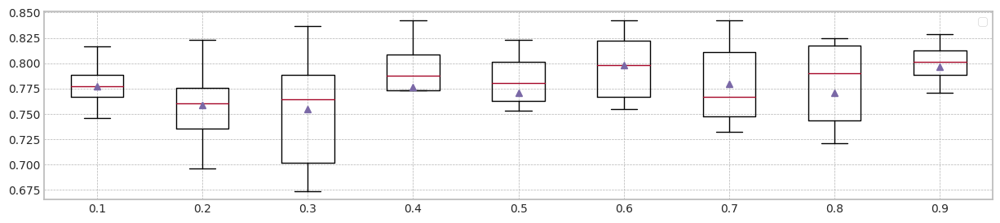

In [43]:
plt.figure(figsize=main_figsize)
bp = []
lb = []
for i, df in enumerate(gcd_statistics_dfs):
    bp.append(df['Mean F1'].values)
    lb.append(f'{(i/10+0.1):.1f}')

plt.boxplot(bp,showmeans=True,showfliers=False,labels=lb)
plt.legend()
plt.show()

In [44]:
gcd_statistics_dfs = []
for alpha in [0.1,0.2,0.3,0.4,0.5,0.6,0.7,0.8,0.9]:
    org_df,gcd_df = drift_tolerant2(X1, Y1,train_size, test_size,avaible_range = 300,lambda_f2=alpha,trial_count=10,weight_init=False,isTest=True)
    display(org_df)
    display(gcd_df)
    gcd_statistics_dfs.append(gcd_df)

trial_count: 10
lambda_f2 0.1
######################### Trial 0 for Normal model ###########################
cuda:0


100%|██████████| 2000/2000 [00:03<00:00, 621.04it/s]


Test f1 score: 0.8764465998016092
X_live.shape (39000, 6)
Truncate 8000 rows from live_set (39000, 6)
Search MI & Drift...for X_live_set torch.Size([31, 9000, 6])


100%|██████████| 31/31 [00:05<00:00,  5.39it/s]


mean of drift:
x0    0.011903
x1    0.011896
x2    0.010036
x3    0.013871
z0    0.182717
dtype: float64
Mean F1 for all data: 0.7969252763581919
######################### Trial 0 for Drift tolerant model ###########################
cuda:0


100%|██████████| 2000/2000 [00:08<00:00, 231.59it/s]


Test f1 score: 0.8779735682819384
X_live.shape (39000, 6)
Truncate 8000 rows from live_set (39000, 6)
Search MI & Drift...for X_live_set torch.Size([31, 9000, 6])


100%|██████████| 31/31 [00:05<00:00,  5.42it/s]


mean of drift:
x0    0.013330
x1    0.021677
x2    0.021369
x3    0.036728
z0    0.114179
dtype: float64
Mean F1 for all data: 0.815368050367249
Normal model median        : 0.7969252763581919
Drift tolerant model median: 0.815368050367249
######################### Trial 1 for Normal model ###########################
cuda:0


100%|██████████| 2000/2000 [00:03<00:00, 638.17it/s]


Test f1 score: 0.8767485405881705
X_live.shape (39000, 6)
Truncate 8000 rows from live_set (39000, 6)
Search MI & Drift...for X_live_set torch.Size([31, 9000, 6])


100%|██████████| 31/31 [00:05<00:00,  5.36it/s]


mean of drift:
x0    0.011903
x1    0.011896
x2    0.010036
x3    0.013871
z0    0.182717
dtype: float64
Mean F1 for all data: 0.793158891426898
######################### Trial 1 for Drift tolerant model ###########################
cuda:0


100%|██████████| 2000/2000 [00:08<00:00, 233.72it/s]


Test f1 score: 0.8777740973832394
X_live.shape (39000, 6)
Truncate 8000 rows from live_set (39000, 6)
Search MI & Drift...for X_live_set torch.Size([31, 9000, 6])


100%|██████████| 31/31 [00:05<00:00,  5.44it/s]


mean of drift:
x0    0.014613
x1    0.018814
x2    0.018946
x3    0.019573
z0    0.187900
dtype: float64
Mean F1 for all data: 0.8047556766639878
Normal model median        : 0.7950420838925449
Drift tolerant model median: 0.8100618635156185
######################### Trial 2 for Normal model ###########################
cuda:0


100%|██████████| 2000/2000 [00:03<00:00, 640.09it/s]


Test f1 score: 0.8767756854971921
X_live.shape (39000, 6)
Truncate 8000 rows from live_set (39000, 6)
Search MI & Drift...for X_live_set torch.Size([31, 9000, 6])


100%|██████████| 31/31 [00:05<00:00,  5.32it/s]


mean of drift:
x0    0.011903
x1    0.011896
x2    0.010036
x3    0.013871
z0    0.182717
dtype: float64
Mean F1 for all data: 0.7929830796910172
######################### Trial 2 for Drift tolerant model ###########################
cuda:0


100%|██████████| 2000/2000 [00:08<00:00, 232.03it/s]


Test f1 score: 0.8769946808510638
X_live.shape (39000, 6)
Truncate 8000 rows from live_set (39000, 6)
Search MI & Drift...for X_live_set torch.Size([31, 9000, 6])


100%|██████████| 31/31 [00:05<00:00,  5.43it/s]


mean of drift:
x0    0.018122
x1    0.022405
x2    0.025427
x3    0.029319
z0    0.159459
dtype: float64
Mean F1 for all data: 0.8053390019681769
Normal model median        : 0.793158891426898
Drift tolerant model median: 0.8053390019681769
######################### Trial 3 for Normal model ###########################
cuda:0


100%|██████████| 2000/2000 [00:03<00:00, 637.74it/s]


Test f1 score: 0.878048780487805
X_live.shape (39000, 6)
Truncate 8000 rows from live_set (39000, 6)
Search MI & Drift...for X_live_set torch.Size([31, 9000, 6])


100%|██████████| 31/31 [00:05<00:00,  5.48it/s]


mean of drift:
x0    0.011903
x1    0.011896
x2    0.010036
x3    0.013871
z0    0.182717
dtype: float64
Mean F1 for all data: 0.7986024235490984
######################### Trial 3 for Drift tolerant model ###########################
cuda:0


100%|██████████| 2000/2000 [00:08<00:00, 235.23it/s]


Test f1 score: 0.8772897815051864
X_live.shape (39000, 6)
Truncate 8000 rows from live_set (39000, 6)
Search MI & Drift...for X_live_set torch.Size([31, 9000, 6])


100%|██████████| 31/31 [00:05<00:00,  5.41it/s]


mean of drift:
x0    0.014297
x1    0.012670
x2    0.017455
x3    0.027254
z0    0.185767
dtype: float64
Mean F1 for all data: 0.8030049174962086
Normal model median        : 0.7950420838925449
Drift tolerant model median: 0.8050473393160824
######################### Trial 4 for Normal model ###########################
cuda:0


100%|██████████| 2000/2000 [00:03<00:00, 636.19it/s]


Test f1 score: 0.8768570485308682
X_live.shape (39000, 6)
Truncate 8000 rows from live_set (39000, 6)
Search MI & Drift...for X_live_set torch.Size([31, 9000, 6])


100%|██████████| 31/31 [00:05<00:00,  5.52it/s]


mean of drift:
x0    0.011903
x1    0.011896
x2    0.010036
x3    0.013871
z0    0.182717
dtype: float64
Mean F1 for all data: 0.7958489085392387
######################### Trial 4 for Drift tolerant model ###########################
cuda:0


100%|██████████| 2000/2000 [00:08<00:00, 232.92it/s]


Test f1 score: 0.8768993613741467
X_live.shape (39000, 6)
Truncate 8000 rows from live_set (39000, 6)
Search MI & Drift...for X_live_set torch.Size([31, 9000, 6])


100%|██████████| 31/31 [00:05<00:00,  5.42it/s]


mean of drift:
x0    0.014262
x1    0.016287
x2    0.016717
x3    0.029240
z0    0.194072
dtype: float64
Mean F1 for all data: 0.8005494048389084
Normal model median        : 0.7958489085392387
Drift tolerant model median: 0.8047556766639878
######################### Trial 5 for Normal model ###########################
cuda:0


100%|██████████| 2000/2000 [00:03<00:00, 639.09it/s]


Test f1 score: 0.8762807094855128
X_live.shape (39000, 6)
Truncate 8000 rows from live_set (39000, 6)
Search MI & Drift...for X_live_set torch.Size([31, 9000, 6])


100%|██████████| 31/31 [00:05<00:00,  5.47it/s]


mean of drift:
x0    0.011903
x1    0.011896
x2    0.010036
x3    0.013871
z0    0.182717
dtype: float64
Mean F1 for all data: 0.7917000854780011
######################### Trial 5 for Drift tolerant model ###########################
cuda:0


100%|██████████| 2000/2000 [00:08<00:00, 232.83it/s]


Test f1 score: 0.8773853915332309
X_live.shape (39000, 6)
Truncate 8000 rows from live_set (39000, 6)
Search MI & Drift...for X_live_set torch.Size([31, 9000, 6])


100%|██████████| 31/31 [00:05<00:00,  5.43it/s]


mean of drift:
x0    0.016710
x1    0.012394
x2    0.063928
x3    0.010462
z0    0.189459
dtype: float64
Mean F1 for all data: 0.7953721857903386
Normal model median        : 0.7945038999830684
Drift tolerant model median: 0.8038802970800982
######################### Trial 6 for Normal model ###########################
cuda:0


100%|██████████| 2000/2000 [00:03<00:00, 637.55it/s]


Test f1 score: 0.8776139115122167
X_live.shape (39000, 6)
Truncate 8000 rows from live_set (39000, 6)
Search MI & Drift...for X_live_set torch.Size([31, 9000, 6])


100%|██████████| 31/31 [00:05<00:00,  5.51it/s]


mean of drift:
x0    0.011903
x1    0.011896
x2    0.010036
x3    0.013871
z0    0.182717
dtype: float64
Mean F1 for all data: 0.7986229500541084
######################### Trial 6 for Drift tolerant model ###########################
cuda:0


100%|██████████| 2000/2000 [00:08<00:00, 227.87it/s]


Test f1 score: 0.877189117744245
X_live.shape (39000, 6)
Truncate 8000 rows from live_set (39000, 6)
Search MI & Drift...for X_live_set torch.Size([31, 9000, 6])


100%|██████████| 31/31 [00:05<00:00,  5.39it/s]


mean of drift:
x0    0.017523
x1    0.009975
x2    0.012685
x3    0.022362
z0    0.182047
dtype: float64
Mean F1 for all data: 0.7963058217723041
Normal model median        : 0.7958489085392387
Drift tolerant model median: 0.8030049174962086
######################### Trial 7 for Normal model ###########################
cuda:0


100%|██████████| 2000/2000 [00:03<00:00, 632.51it/s]


Test f1 score: 0.8772316508706194
X_live.shape (39000, 6)
Truncate 8000 rows from live_set (39000, 6)
Search MI & Drift...for X_live_set torch.Size([31, 9000, 6])


100%|██████████| 31/31 [00:05<00:00,  5.46it/s]


mean of drift:
x0    0.011903
x1    0.011896
x2    0.010036
x3    0.013871
z0    0.182717
dtype: float64
Mean F1 for all data: 0.7968098198971173
######################### Trial 7 for Drift tolerant model ###########################
cuda:0


100%|██████████| 2000/2000 [00:08<00:00, 231.45it/s]


Test f1 score: 0.876914600550964
X_live.shape (39000, 6)
Truncate 8000 rows from live_set (39000, 6)
Search MI & Drift...for X_live_set torch.Size([31, 9000, 6])


100%|██████████| 31/31 [00:05<00:00,  5.44it/s]


mean of drift:
x0    0.012115
x1    0.012509
x2    0.012072
x3    0.021229
z0    0.155050
dtype: float64
Mean F1 for all data: 0.8023381978528881
Normal model median        : 0.796329364218178
Drift tolerant model median: 0.8026715576745483
######################### Trial 8 for Normal model ###########################
cuda:0


100%|██████████| 2000/2000 [00:03<00:00, 628.66it/s]


Test f1 score: 0.8768993613741467
X_live.shape (39000, 6)
Truncate 8000 rows from live_set (39000, 6)
Search MI & Drift...for X_live_set torch.Size([31, 9000, 6])


100%|██████████| 31/31 [00:05<00:00,  5.45it/s]


mean of drift:
x0    0.011903
x1    0.011896
x2    0.010036
x3    0.013871
z0    0.182717
dtype: float64
Mean F1 for all data: 0.797695015071478
######################### Trial 8 for Drift tolerant model ###########################
cuda:0


100%|██████████| 2000/2000 [00:08<00:00, 233.85it/s]


Test f1 score: 0.8763772587042751
X_live.shape (39000, 6)
Truncate 8000 rows from live_set (39000, 6)
Search MI & Drift...for X_live_set torch.Size([31, 9000, 6])


100%|██████████| 31/31 [00:05<00:00,  5.43it/s]


mean of drift:
x0    0.013609
x1    0.010875
x2    0.013785
x3    0.018179
z0    0.145541
dtype: float64
Mean F1 for all data: 0.8050595625188156
Normal model median        : 0.7968098198971173
Drift tolerant model median: 0.8030049174962086
######################### Trial 9 for Normal model ###########################
cuda:0


100%|██████████| 2000/2000 [00:03<00:00, 619.57it/s]


Test f1 score: 0.8763772587042751
X_live.shape (39000, 6)
Truncate 8000 rows from live_set (39000, 6)
Search MI & Drift...for X_live_set torch.Size([31, 9000, 6])


100%|██████████| 31/31 [00:05<00:00,  5.45it/s]


mean of drift:
x0    0.011903
x1    0.011896
x2    0.010036
x3    0.013871
z0    0.182717
dtype: float64
Mean F1 for all data: 0.7961406130818304
######################### Trial 9 for Drift tolerant model ###########################
cuda:0


100%|██████████| 2000/2000 [00:08<00:00, 231.65it/s]


Test f1 score: 0.8775442842997029
X_live.shape (39000, 6)
Truncate 8000 rows from live_set (39000, 6)
Search MI & Drift...for X_live_set torch.Size([31, 9000, 6])


100%|██████████| 31/31 [00:05<00:00,  5.43it/s]


mean of drift:
x0    0.032921
x1    0.018746
x2    0.010398
x3    0.020925
z0    0.159950
dtype: float64
Mean F1 for all data: 0.8089114902021215
Normal model median        : 0.7964752164894738
Drift tolerant model median: 0.8038802970800982


,Trial,Testset F1,Initial F1,Mean F1,Last F1,Elapsed time
0,0,0.876447,0.874156,0.796925,0.731435,5.779321
1,1,0.876749,0.874544,0.793159,0.724790,5.809696
2,2,0.876776,0.873894,0.792983,0.724773,5.848082
3,3,0.878049,0.875842,0.798602,0.734092,5.676403
4,4,0.876857,0.874668,0.795849,0.728814,5.634037
5,5,0.876281,0.874171,0.791700,0.722319,5.691432
6,6,0.877614,0.875180,0.798623,0.734266,5.643461
7,7,0.877232,0.875166,0.796810,0.729679,5.699856
8,8,0.876899,0.874461,0.797695,0.731412,5.707462
9,9,0.876377,0.874253,0.796141,0.729218,5.703622


,Trial,Testset F1,Initial F1,Mean F1,Last F1,Elapsed time
0,0,0.877974,0.876700,0.815368,0.768877,5.735532
1,1,0.877774,0.876123,0.804756,0.748881,5.715874
2,2,0.876995,0.875111,0.805339,0.746937,5.731897
3,3,0.877290,0.875319,0.803005,0.742876,5.747643
4,4,0.876899,0.875028,0.800549,0.737404,5.743241
5,5,0.877385,0.875536,0.795372,0.726462,5.731425
6,6,0.877189,0.875498,0.796306,0.730383,5.772511
7,7,0.876915,0.874848,0.802338,0.740569,5.723960
8,8,0.876377,0.874240,0.805060,0.747473,5.729109
9,9,0.877544,0.875704,0.808911,0.750987,5.724766


trial_count: 10
lambda_f2 0.2
######################### Trial 0 for Normal model ###########################
cuda:0


100%|██████████| 2000/2000 [00:03<00:00, 638.65it/s]


Test f1 score: 0.8764465998016092
X_live.shape (39000, 6)
Truncate 8000 rows from live_set (39000, 6)
Search MI & Drift...for X_live_set torch.Size([31, 9000, 6])


100%|██████████| 31/31 [00:05<00:00,  5.39it/s]


mean of drift:
x0    0.011903
x1    0.011896
x2    0.010036
x3    0.013871
z0    0.182717
dtype: float64
Mean F1 for all data: 0.7969252763581919
######################### Trial 0 for Drift tolerant model ###########################
cuda:0


100%|██████████| 2000/2000 [00:08<00:00, 229.29it/s]


Test f1 score: 0.8788478452066842
X_live.shape (39000, 6)
Truncate 8000 rows from live_set (39000, 6)
Search MI & Drift...for X_live_set torch.Size([31, 9000, 6])


100%|██████████| 31/31 [00:05<00:00,  5.38it/s]


mean of drift:
x0    0.014495
x1    0.015588
x2    0.025982
x3    0.040652
z0    0.114835
dtype: float64
Mean F1 for all data: 0.8293293959510434
Normal model median        : 0.7969252763581919
Drift tolerant model median: 0.8293293959510434
######################### Trial 1 for Normal model ###########################
cuda:0


100%|██████████| 2000/2000 [00:03<00:00, 634.97it/s]


Test f1 score: 0.8767485405881705
X_live.shape (39000, 6)
Truncate 8000 rows from live_set (39000, 6)
Search MI & Drift...for X_live_set torch.Size([31, 9000, 6])


100%|██████████| 31/31 [00:05<00:00,  5.42it/s]


mean of drift:
x0    0.011903
x1    0.011896
x2    0.010036
x3    0.013871
z0    0.182717
dtype: float64
Mean F1 for all data: 0.793158891426898
######################### Trial 1 for Drift tolerant model ###########################
cuda:0


100%|██████████| 2000/2000 [00:08<00:00, 234.22it/s]


Test f1 score: 0.878891211087889
X_live.shape (39000, 6)
Truncate 8000 rows from live_set (39000, 6)
Search MI & Drift...for X_live_set torch.Size([31, 9000, 6])


100%|██████████| 31/31 [00:05<00:00,  5.38it/s]


mean of drift:
x0    0.024577
x1    0.026832
x2    0.045971
x3    0.038659
z0    0.107455
dtype: float64
Mean F1 for all data: 0.8211335169057171
Normal model median        : 0.7950420838925449
Drift tolerant model median: 0.8252314564283803
######################### Trial 2 for Normal model ###########################
cuda:0


100%|██████████| 2000/2000 [00:03<00:00, 605.52it/s]


Test f1 score: 0.8767756854971921
X_live.shape (39000, 6)
Truncate 8000 rows from live_set (39000, 6)
Search MI & Drift...for X_live_set torch.Size([31, 9000, 6])


100%|██████████| 31/31 [00:05<00:00,  5.47it/s]


mean of drift:
x0    0.011903
x1    0.011896
x2    0.010036
x3    0.013871
z0    0.182717
dtype: float64
Mean F1 for all data: 0.7929830796910172
######################### Trial 2 for Drift tolerant model ###########################
cuda:0


100%|██████████| 2000/2000 [00:08<00:00, 234.87it/s]


Test f1 score: 0.878270509977827
X_live.shape (39000, 6)
Truncate 8000 rows from live_set (39000, 6)
Search MI & Drift...for X_live_set torch.Size([31, 9000, 6])


100%|██████████| 31/31 [00:05<00:00,  5.31it/s]


mean of drift:
x0    0.018892
x1    0.020577
x2    0.026900
x3    0.027950
z0    0.093681
dtype: float64
Mean F1 for all data: 0.8221033142281776
Normal model median        : 0.793158891426898
Drift tolerant model median: 0.8221033142281776
######################### Trial 3 for Normal model ###########################
cuda:0


100%|██████████| 2000/2000 [00:03<00:00, 641.45it/s]


Test f1 score: 0.878048780487805
X_live.shape (39000, 6)
Truncate 8000 rows from live_set (39000, 6)
Search MI & Drift...for X_live_set torch.Size([31, 9000, 6])


100%|██████████| 31/31 [00:05<00:00,  5.44it/s]


mean of drift:
x0    0.011903
x1    0.011896
x2    0.010036
x3    0.013871
z0    0.182717
dtype: float64
Mean F1 for all data: 0.7986024235490984
######################### Trial 3 for Drift tolerant model ###########################
cuda:0


100%|██████████| 2000/2000 [00:08<00:00, 233.57it/s]


Test f1 score: 0.8777422555396317
X_live.shape (39000, 6)
Truncate 8000 rows from live_set (39000, 6)
Search MI & Drift...for X_live_set torch.Size([31, 9000, 6])


100%|██████████| 31/31 [00:05<00:00,  5.42it/s]


mean of drift:
x0    0.014781
x1    0.010430
x2    0.029355
x3    0.024599
z0    0.177609
dtype: float64
Mean F1 for all data: 0.8025788772168139
Normal model median        : 0.7950420838925449
Drift tolerant model median: 0.8216184155669474
######################### Trial 4 for Normal model ###########################
cuda:0


100%|██████████| 2000/2000 [00:03<00:00, 637.68it/s]


Test f1 score: 0.8768570485308682
X_live.shape (39000, 6)
Truncate 8000 rows from live_set (39000, 6)
Search MI & Drift...for X_live_set torch.Size([31, 9000, 6])


100%|██████████| 31/31 [00:05<00:00,  5.32it/s]


mean of drift:
x0    0.011903
x1    0.011896
x2    0.010036
x3    0.013871
z0    0.182717
dtype: float64
Mean F1 for all data: 0.7958489085392387
######################### Trial 4 for Drift tolerant model ###########################
cuda:0


100%|██████████| 2000/2000 [00:08<00:00, 236.60it/s]


Test f1 score: 0.8765704209830284
X_live.shape (39000, 6)
Truncate 8000 rows from live_set (39000, 6)
Search MI & Drift...for X_live_set torch.Size([31, 9000, 6])


100%|██████████| 31/31 [00:05<00:00,  5.43it/s]


mean of drift:
x0    0.015889
x1    0.027527
x2    0.036803
x3    0.039968
z0    0.172423
dtype: float64
Mean F1 for all data: 0.8069323898858873
Normal model median        : 0.7958489085392387
Drift tolerant model median: 0.8211335169057171
######################### Trial 5 for Normal model ###########################
cuda:0


100%|██████████| 2000/2000 [00:03<00:00, 639.52it/s]


Test f1 score: 0.8762807094855128
X_live.shape (39000, 6)
Truncate 8000 rows from live_set (39000, 6)
Search MI & Drift...for X_live_set torch.Size([31, 9000, 6])


100%|██████████| 31/31 [00:05<00:00,  5.41it/s]


mean of drift:
x0    0.011903
x1    0.011896
x2    0.010036
x3    0.013871
z0    0.182717
dtype: float64
Mean F1 for all data: 0.7917000854780011
######################### Trial 5 for Drift tolerant model ###########################
cuda:0


100%|██████████| 2000/2000 [00:08<00:00, 230.86it/s]


Test f1 score: 0.8774009439139503
X_live.shape (39000, 6)
Truncate 8000 rows from live_set (39000, 6)
Search MI & Drift...for X_live_set torch.Size([31, 9000, 6])


100%|██████████| 31/31 [00:05<00:00,  5.42it/s]


mean of drift:
x0    0.025609
x1    0.017061
x2    0.116233
x3    0.080778
z0    0.172900
dtype: float64
Mean F1 for all data: 0.793363630652949
Normal model median        : 0.7945038999830684
Drift tolerant model median: 0.8140329533958022
######################### Trial 6 for Normal model ###########################
cuda:0


100%|██████████| 2000/2000 [00:03<00:00, 645.20it/s]


Test f1 score: 0.8776139115122167
X_live.shape (39000, 6)
Truncate 8000 rows from live_set (39000, 6)
Search MI & Drift...for X_live_set torch.Size([31, 9000, 6])


100%|██████████| 31/31 [00:05<00:00,  5.45it/s]


mean of drift:
x0    0.011903
x1    0.011896
x2    0.010036
x3    0.013871
z0    0.182717
dtype: float64
Mean F1 for all data: 0.7986229500541084
######################### Trial 6 for Drift tolerant model ###########################
cuda:0


100%|██████████| 2000/2000 [00:08<00:00, 237.18it/s]


Test f1 score: 0.8766519823788547
X_live.shape (39000, 6)
Truncate 8000 rows from live_set (39000, 6)
Search MI & Drift...for X_live_set torch.Size([31, 9000, 6])


100%|██████████| 31/31 [00:05<00:00,  5.43it/s]


mean of drift:
x0    0.014685
x1    0.009703
x2    0.016290
x3    0.035090
z0    0.175362
dtype: float64
Mean F1 for all data: 0.8001898030874707
Normal model median        : 0.7958489085392387
Drift tolerant model median: 0.8069323898858873
######################### Trial 7 for Normal model ###########################
cuda:0


100%|██████████| 2000/2000 [00:03<00:00, 629.83it/s]


Test f1 score: 0.8772316508706194
X_live.shape (39000, 6)
Truncate 8000 rows from live_set (39000, 6)
Search MI & Drift...for X_live_set torch.Size([31, 9000, 6])


100%|██████████| 31/31 [00:05<00:00,  5.46it/s]


mean of drift:
x0    0.011903
x1    0.011896
x2    0.010036
x3    0.013871
z0    0.182717
dtype: float64
Mean F1 for all data: 0.7968098198971173
######################### Trial 7 for Drift tolerant model ###########################
cuda:0


100%|██████████| 2000/2000 [00:08<00:00, 236.81it/s]


Test f1 score: 0.8776296949003195
X_live.shape (39000, 6)
Truncate 8000 rows from live_set (39000, 6)
Search MI & Drift...for X_live_set torch.Size([31, 9000, 6])


100%|██████████| 31/31 [00:05<00:00,  5.46it/s]


mean of drift:
x0    0.014319
x1    0.017663
x2    0.017043
x3    0.030710
z0    0.080814
dtype: float64
Mean F1 for all data: 0.8240708573327835
Normal model median        : 0.796329364218178
Drift tolerant model median: 0.8140329533958022
######################### Trial 8 for Normal model ###########################
cuda:0


100%|██████████| 2000/2000 [00:03<00:00, 632.50it/s]


Test f1 score: 0.8768993613741467
X_live.shape (39000, 6)
Truncate 8000 rows from live_set (39000, 6)
Search MI & Drift...for X_live_set torch.Size([31, 9000, 6])


100%|██████████| 31/31 [00:05<00:00,  5.39it/s]


mean of drift:
x0    0.011903
x1    0.011896
x2    0.010036
x3    0.013871
z0    0.182717
dtype: float64
Mean F1 for all data: 0.797695015071478
######################### Trial 8 for Drift tolerant model ###########################
cuda:0


100%|██████████| 2000/2000 [00:08<00:00, 232.31it/s]


Test f1 score: 0.8796561604584527
X_live.shape (39000, 6)
Truncate 8000 rows from live_set (39000, 6)
Search MI & Drift...for X_live_set torch.Size([31, 9000, 6])


100%|██████████| 31/31 [00:05<00:00,  5.43it/s]


mean of drift:
x0    0.031982
x1    0.022781
x2    0.012821
x3    0.017975
z0    0.076910
dtype: float64
Mean F1 for all data: 0.8277318280451621
Normal model median        : 0.7968098198971173
Drift tolerant model median: 0.8211335169057171
######################### Trial 9 for Normal model ###########################
cuda:0


100%|██████████| 2000/2000 [00:03<00:00, 620.16it/s]


Test f1 score: 0.8763772587042751
X_live.shape (39000, 6)
Truncate 8000 rows from live_set (39000, 6)
Search MI & Drift...for X_live_set torch.Size([31, 9000, 6])


100%|██████████| 31/31 [00:05<00:00,  5.41it/s]


mean of drift:
x0    0.011903
x1    0.011896
x2    0.010036
x3    0.013871
z0    0.182717
dtype: float64
Mean F1 for all data: 0.7961406130818304
######################### Trial 9 for Drift tolerant model ###########################
cuda:0


100%|██████████| 2000/2000 [00:08<00:00, 230.60it/s]


Test f1 score: 0.8790748898678415
X_live.shape (39000, 6)
Truncate 8000 rows from live_set (39000, 6)
Search MI & Drift...for X_live_set torch.Size([31, 9000, 6])


100%|██████████| 31/31 [00:05<00:00,  5.48it/s]


mean of drift:
x0    0.044559
x1    0.032606
x2    0.022699
x3    0.030337
z0    0.118215
dtype: float64
Mean F1 for all data: 0.8168125216382879
Normal model median        : 0.7964752164894738
Drift tolerant model median: 0.8189730192720025


,Trial,Testset F1,Initial F1,Mean F1,Last F1,Elapsed time
0,0,0.876447,0.874156,0.796925,0.731435,5.766456
1,1,0.876749,0.874544,0.793159,0.724790,5.743289
2,2,0.876776,0.873894,0.792983,0.724773,5.685097
3,3,0.878049,0.875842,0.798602,0.734092,5.720349
4,4,0.876857,0.874668,0.795849,0.728814,5.845189
5,5,0.876281,0.874171,0.791700,0.722319,5.750485
6,6,0.877614,0.875180,0.798623,0.734266,5.706237
7,7,0.877232,0.875166,0.796810,0.729679,5.693335
8,8,0.876899,0.874461,0.797695,0.731412,5.773091
9,9,0.876377,0.874253,0.796141,0.729218,5.747396


,Trial,Testset F1,Initial F1,Mean F1,Last F1,Elapsed time
0,0,0.878848,0.877414,0.829329,0.790056,5.778043
1,1,0.878891,0.877790,0.821134,0.772617,5.785377
2,2,0.878271,0.876532,0.822103,0.782609,5.857431
3,3,0.877742,0.875845,0.802579,0.736974,5.742839
4,4,0.876570,0.874253,0.806932,0.750056,5.727066
5,5,0.877401,0.875647,0.793364,0.713845,5.743669
6,6,0.876652,0.874682,0.800190,0.733986,5.729560
7,7,0.877630,0.876534,0.824071,0.784292,5.702777
8,8,0.879656,0.878027,0.827732,0.789877,5.730394
9,9,0.879075,0.877709,0.816813,0.761850,5.673017


trial_count: 10
lambda_f2 0.3
######################### Trial 0 for Normal model ###########################
cuda:0


100%|██████████| 2000/2000 [00:03<00:00, 639.57it/s]


Test f1 score: 0.8764465998016092
X_live.shape (39000, 6)
Truncate 8000 rows from live_set (39000, 6)
Search MI & Drift...for X_live_set torch.Size([31, 9000, 6])


100%|██████████| 31/31 [00:05<00:00,  5.45it/s]


mean of drift:
x0    0.011903
x1    0.011896
x2    0.010036
x3    0.013871
z0    0.182717
dtype: float64
Mean F1 for all data: 0.7969252763581919
######################### Trial 0 for Drift tolerant model ###########################
cuda:0


100%|██████████| 2000/2000 [00:08<00:00, 236.36it/s]


Test f1 score: 0.8792419568091671
X_live.shape (39000, 6)
Truncate 8000 rows from live_set (39000, 6)
Search MI & Drift...for X_live_set torch.Size([31, 9000, 6])


100%|██████████| 31/31 [00:05<00:00,  5.38it/s]


mean of drift:
x0    0.014151
x1    0.012265
x2    0.023961
x3    0.056380
z0    0.148935
dtype: float64
Mean F1 for all data: 0.8384533686475649
Normal model median        : 0.7969252763581919
Drift tolerant model median: 0.8384533686475649
######################### Trial 1 for Normal model ###########################
cuda:0


100%|██████████| 2000/2000 [00:03<00:00, 628.14it/s]


Test f1 score: 0.8767485405881705
X_live.shape (39000, 6)
Truncate 8000 rows from live_set (39000, 6)
Search MI & Drift...for X_live_set torch.Size([31, 9000, 6])


100%|██████████| 31/31 [00:05<00:00,  5.49it/s]


mean of drift:
x0    0.011903
x1    0.011896
x2    0.010036
x3    0.013871
z0    0.182717
dtype: float64
Mean F1 for all data: 0.793158891426898
######################### Trial 1 for Drift tolerant model ###########################
cuda:0


100%|██████████| 2000/2000 [00:08<00:00, 234.55it/s]


Test f1 score: 0.8793293624531215
X_live.shape (39000, 6)
Truncate 8000 rows from live_set (39000, 6)
Search MI & Drift...for X_live_set torch.Size([31, 9000, 6])


100%|██████████| 31/31 [00:05<00:00,  5.31it/s]


mean of drift:
x0    0.017434
x1    0.031860
x2    0.065989
x3    0.044387
z0    0.073387
dtype: float64
Mean F1 for all data: 0.8292539632606426
Normal model median        : 0.7950420838925449
Drift tolerant model median: 0.8338536659541038
######################### Trial 2 for Normal model ###########################
cuda:0


100%|██████████| 2000/2000 [00:03<00:00, 635.00it/s]


Test f1 score: 0.8767756854971921
X_live.shape (39000, 6)
Truncate 8000 rows from live_set (39000, 6)
Search MI & Drift...for X_live_set torch.Size([31, 9000, 6])


100%|██████████| 31/31 [00:05<00:00,  5.43it/s]


mean of drift:
x0    0.011903
x1    0.011896
x2    0.010036
x3    0.013871
z0    0.182717
dtype: float64
Mean F1 for all data: 0.7929830796910172
######################### Trial 2 for Drift tolerant model ###########################
cuda:0


100%|██████████| 2000/2000 [00:08<00:00, 234.99it/s]


Test f1 score: 0.8792109929078014
X_live.shape (39000, 6)
Truncate 8000 rows from live_set (39000, 6)
Search MI & Drift...for X_live_set torch.Size([31, 9000, 6])


100%|██████████| 31/31 [00:05<00:00,  5.43it/s]


mean of drift:
x0    0.021097
x1    0.016699
x2    0.026297
x3    0.024814
z0    0.292480
dtype: float64
Mean F1 for all data: 0.8205877089528849
Normal model median        : 0.793158891426898
Drift tolerant model median: 0.8292539632606426
######################### Trial 3 for Normal model ###########################
cuda:0


100%|██████████| 2000/2000 [00:03<00:00, 628.61it/s]


Test f1 score: 0.878048780487805
X_live.shape (39000, 6)
Truncate 8000 rows from live_set (39000, 6)
Search MI & Drift...for X_live_set torch.Size([31, 9000, 6])


100%|██████████| 31/31 [00:05<00:00,  5.48it/s]


mean of drift:
x0    0.011903
x1    0.011896
x2    0.010036
x3    0.013871
z0    0.182717
dtype: float64
Mean F1 for all data: 0.7986024235490984
######################### Trial 3 for Drift tolerant model ###########################
cuda:0


100%|██████████| 2000/2000 [00:08<00:00, 230.08it/s]


Test f1 score: 0.8796030871003306
X_live.shape (39000, 6)
Truncate 8000 rows from live_set (39000, 6)
Search MI & Drift...for X_live_set torch.Size([31, 9000, 6])


100%|██████████| 31/31 [00:05<00:00,  5.45it/s]


mean of drift:
x0    0.026437
x1    0.034211
x2    0.051670
x3    0.058039
z0    0.189932
dtype: float64
Mean F1 for all data: 0.8189867822351955
Normal model median        : 0.7950420838925449
Drift tolerant model median: 0.8249208361067637
######################### Trial 4 for Normal model ###########################
cuda:0


100%|██████████| 2000/2000 [00:03<00:00, 627.44it/s]


Test f1 score: 0.8768570485308682
X_live.shape (39000, 6)
Truncate 8000 rows from live_set (39000, 6)
Search MI & Drift...for X_live_set torch.Size([31, 9000, 6])


100%|██████████| 31/31 [00:05<00:00,  5.47it/s]


mean of drift:
x0    0.011903
x1    0.011896
x2    0.010036
x3    0.013871
z0    0.182717
dtype: float64
Mean F1 for all data: 0.7958489085392387
######################### Trial 4 for Drift tolerant model ###########################
cuda:0


100%|██████████| 2000/2000 [00:08<00:00, 232.85it/s]


Test f1 score: 0.8774633931520424
X_live.shape (39000, 6)
Truncate 8000 rows from live_set (39000, 6)
Search MI & Drift...for X_live_set torch.Size([31, 9000, 6])


100%|██████████| 31/31 [00:05<00:00,  5.40it/s]


mean of drift:
x0    0.019448
x1    0.033143
x2    0.050294
x3    0.050946
z0    0.143534
dtype: float64
Mean F1 for all data: 0.8117208552075168
Normal model median        : 0.7958489085392387
Drift tolerant model median: 0.8205877089528849
######################### Trial 5 for Normal model ###########################
cuda:0


100%|██████████| 2000/2000 [00:03<00:00, 636.19it/s]


Test f1 score: 0.8762807094855128
X_live.shape (39000, 6)
Truncate 8000 rows from live_set (39000, 6)
Search MI & Drift...for X_live_set torch.Size([31, 9000, 6])


100%|██████████| 31/31 [00:05<00:00,  5.39it/s]


mean of drift:
x0    0.011903
x1    0.011896
x2    0.010036
x3    0.013871
z0    0.182717
dtype: float64
Mean F1 for all data: 0.7917000854780011
######################### Trial 5 for Drift tolerant model ###########################
cuda:0


100%|██████████| 2000/2000 [00:08<00:00, 232.66it/s]


Test f1 score: 0.8799824310969583
X_live.shape (39000, 6)
Truncate 8000 rows from live_set (39000, 6)
Search MI & Drift...for X_live_set torch.Size([31, 9000, 6])


100%|██████████| 31/31 [00:05<00:00,  5.40it/s]


mean of drift:
x0    0.027685
x1    0.017932
x2    0.177538
x3    0.075932
z0    0.099434
dtype: float64
Mean F1 for all data: 0.8050515445837816
Normal model median        : 0.7945038999830684
Drift tolerant model median: 0.8197872455940403
######################### Trial 6 for Normal model ###########################
cuda:0


100%|██████████| 2000/2000 [00:03<00:00, 622.57it/s]


Test f1 score: 0.8776139115122167
X_live.shape (39000, 6)
Truncate 8000 rows from live_set (39000, 6)
Search MI & Drift...for X_live_set torch.Size([31, 9000, 6])


100%|██████████| 31/31 [00:05<00:00,  5.35it/s]


mean of drift:
x0    0.011903
x1    0.011896
x2    0.010036
x3    0.013871
z0    0.182717
dtype: float64
Mean F1 for all data: 0.7986229500541084
######################### Trial 6 for Drift tolerant model ###########################
cuda:0


100%|██████████| 2000/2000 [00:08<00:00, 231.20it/s]


Test f1 score: 0.8785211267605634
X_live.shape (39000, 6)
Truncate 8000 rows from live_set (39000, 6)
Search MI & Drift...for X_live_set torch.Size([31, 9000, 6])


100%|██████████| 31/31 [00:05<00:00,  5.39it/s]


mean of drift:
x0    0.013821
x1    0.009434
x2    0.022681
x3    0.037201
z0    0.269226
dtype: float64
Mean F1 for all data: 0.80555314413157
Normal model median        : 0.7958489085392387
Drift tolerant model median: 0.8189867822351955
######################### Trial 7 for Normal model ###########################
cuda:0


100%|██████████| 2000/2000 [00:03<00:00, 631.82it/s]


Test f1 score: 0.8772316508706194
X_live.shape (39000, 6)
Truncate 8000 rows from live_set (39000, 6)
Search MI & Drift...for X_live_set torch.Size([31, 9000, 6])


100%|██████████| 31/31 [00:05<00:00,  5.43it/s]


mean of drift:
x0    0.011903
x1    0.011896
x2    0.010036
x3    0.013871
z0    0.182717
dtype: float64
Mean F1 for all data: 0.7968098198971173
######################### Trial 7 for Drift tolerant model ###########################
cuda:0


100%|██████████| 2000/2000 [00:08<00:00, 231.21it/s]


Test f1 score: 0.8794357504959224
X_live.shape (39000, 6)
Truncate 8000 rows from live_set (39000, 6)
Search MI & Drift...for X_live_set torch.Size([31, 9000, 6])


100%|██████████| 31/31 [00:05<00:00,  5.35it/s]


mean of drift:
x0    0.014839
x1    0.018803
x2    0.019900
x3    0.037344
z0    0.122136
dtype: float64
Mean F1 for all data: 0.836190367296351
Normal model median        : 0.796329364218178
Drift tolerant model median: 0.8197872455940403
######################### Trial 8 for Normal model ###########################
cuda:0


100%|██████████| 2000/2000 [00:03<00:00, 629.58it/s]


Test f1 score: 0.8768993613741467
X_live.shape (39000, 6)
Truncate 8000 rows from live_set (39000, 6)
Search MI & Drift...for X_live_set torch.Size([31, 9000, 6])


100%|██████████| 31/31 [00:05<00:00,  5.43it/s]


mean of drift:
x0    0.011903
x1    0.011896
x2    0.010036
x3    0.013871
z0    0.182717
dtype: float64
Mean F1 for all data: 0.797695015071478
######################### Trial 8 for Drift tolerant model ###########################
cuda:0


100%|██████████| 2000/2000 [00:08<00:00, 231.89it/s]


Test f1 score: 0.8790918108674088
X_live.shape (39000, 6)
Truncate 8000 rows from live_set (39000, 6)
Search MI & Drift...for X_live_set torch.Size([31, 9000, 6])


100%|██████████| 31/31 [00:05<00:00,  5.32it/s]


mean of drift:
x0    0.014627
x1    0.015283
x2    0.064509
x3    0.025667
z0    0.112036
dtype: float64
Mean F1 for all data: 0.834848882340675
Normal model median        : 0.7968098198971173
Drift tolerant model median: 0.8205877089528849
######################### Trial 9 for Normal model ###########################
cuda:0


100%|██████████| 2000/2000 [00:03<00:00, 637.35it/s]


Test f1 score: 0.8763772587042751
X_live.shape (39000, 6)
Truncate 8000 rows from live_set (39000, 6)
Search MI & Drift...for X_live_set torch.Size([31, 9000, 6])


100%|██████████| 31/31 [00:05<00:00,  5.43it/s]


mean of drift:
x0    0.011903
x1    0.011896
x2    0.010036
x3    0.013871
z0    0.182717
dtype: float64
Mean F1 for all data: 0.7961406130818304
######################### Trial 9 for Drift tolerant model ###########################
cuda:0


100%|██████████| 2000/2000 [00:08<00:00, 233.76it/s]


Test f1 score: 0.8802816901408451
X_live.shape (39000, 6)
Truncate 8000 rows from live_set (39000, 6)
Search MI & Drift...for X_live_set torch.Size([31, 9000, 6])


100%|██████████| 31/31 [00:05<00:00,  5.37it/s]


mean of drift:
x0    0.059391
x1    0.039319
x2    0.033538
x3    0.035667
z0    0.089262
dtype: float64
Mean F1 for all data: 0.824737349863391
Normal model median        : 0.7964752164894738
Drift tolerant model median: 0.822662529408138


,Trial,Testset F1,Initial F1,Mean F1,Last F1,Elapsed time
0,0,0.876447,0.874156,0.796925,0.731435,5.710766
1,1,0.876749,0.874544,0.793159,0.724790,5.664670
2,2,0.876776,0.873894,0.792983,0.724773,5.731705
3,3,0.878049,0.875842,0.798602,0.734092,5.678238
4,4,0.876857,0.874668,0.795849,0.728814,5.681827
5,5,0.876281,0.874171,0.791700,0.722319,5.769928
6,6,0.877614,0.875180,0.798623,0.734266,5.809150
7,7,0.877232,0.875166,0.796810,0.729679,5.732719
8,8,0.876899,0.874461,0.797695,0.731412,5.727440
9,9,0.876377,0.874253,0.796141,0.729218,5.731241


,Trial,Testset F1,Initial F1,Mean F1,Last F1,Elapsed time
0,0,0.879242,0.878523,0.838453,0.809996,5.778377
1,1,0.879329,0.877908,0.829254,0.790509,5.859537
2,2,0.879211,0.877701,0.820588,0.756812,5.727653
3,3,0.879603,0.878033,0.818987,0.759941,5.711718
4,4,0.877463,0.875567,0.811721,0.756396,5.765566
5,5,0.879982,0.878738,0.805052,0.724612,5.760932
6,6,0.878521,0.877434,0.805553,0.722537,5.769372
7,7,0.879436,0.878831,0.836190,0.806573,5.815095
8,8,0.879092,0.878540,0.834849,0.801698,5.848064
9,9,0.880282,0.879267,0.824737,0.773121,5.794311


trial_count: 10
lambda_f2 0.4
######################### Trial 0 for Normal model ###########################
cuda:0


100%|██████████| 2000/2000 [00:03<00:00, 623.13it/s]


Test f1 score: 0.8764465998016092
X_live.shape (39000, 6)
Truncate 8000 rows from live_set (39000, 6)
Search MI & Drift...for X_live_set torch.Size([31, 9000, 6])


100%|██████████| 31/31 [00:05<00:00,  5.40it/s]


mean of drift:
x0    0.011903
x1    0.011896
x2    0.010036
x3    0.013871
z0    0.182717
dtype: float64
Mean F1 for all data: 0.7969252763581919
######################### Trial 0 for Drift tolerant model ###########################
cuda:0


100%|██████████| 2000/2000 [00:08<00:00, 231.50it/s]


Test f1 score: 0.8807238221339513
X_live.shape (39000, 6)
Truncate 8000 rows from live_set (39000, 6)
Search MI & Drift...for X_live_set torch.Size([31, 9000, 6])


100%|██████████| 31/31 [00:05<00:00,  5.33it/s]


mean of drift:
x0    0.030645
x1    0.018616
x2    0.017211
x3    0.038760
z0    0.474921
dtype: float64
Mean F1 for all data: 0.7852690241373319
Normal model median        : 0.7969252763581919
Drift tolerant model median: 0.7852690241373319
######################### Trial 1 for Normal model ###########################
cuda:0


100%|██████████| 2000/2000 [00:03<00:00, 636.20it/s]


Test f1 score: 0.8767485405881705
X_live.shape (39000, 6)
Truncate 8000 rows from live_set (39000, 6)
Search MI & Drift...for X_live_set torch.Size([31, 9000, 6])


100%|██████████| 31/31 [00:06<00:00,  5.14it/s]


mean of drift:
x0    0.011903
x1    0.011896
x2    0.010036
x3    0.013871
z0    0.182717
dtype: float64
Mean F1 for all data: 0.793158891426898
######################### Trial 1 for Drift tolerant model ###########################
cuda:0


100%|██████████| 2000/2000 [00:08<00:00, 230.02it/s]


Test f1 score: 0.8793825799338478
X_live.shape (39000, 6)
Truncate 8000 rows from live_set (39000, 6)
Search MI & Drift...for X_live_set torch.Size([31, 9000, 6])


100%|██████████| 31/31 [00:05<00:00,  5.36it/s]


mean of drift:
x0    0.025362
x1    0.052061
x2    0.073161
x3    0.043638
z0    0.082910
dtype: float64
Mean F1 for all data: 0.8321151701016652
Normal model median        : 0.7950420838925449
Drift tolerant model median: 0.8086920971194986
######################### Trial 2 for Normal model ###########################
cuda:0


100%|██████████| 2000/2000 [00:03<00:00, 633.94it/s]


Test f1 score: 0.8767756854971921
X_live.shape (39000, 6)
Truncate 8000 rows from live_set (39000, 6)
Search MI & Drift...for X_live_set torch.Size([31, 9000, 6])


100%|██████████| 31/31 [00:05<00:00,  5.40it/s]


mean of drift:
x0    0.011903
x1    0.011896
x2    0.010036
x3    0.013871
z0    0.182717
dtype: float64
Mean F1 for all data: 0.7929830796910172
######################### Trial 2 for Drift tolerant model ###########################
cuda:0


100%|██████████| 2000/2000 [00:08<00:00, 226.59it/s]


Test f1 score: 0.8789526239875735
X_live.shape (39000, 6)
Truncate 8000 rows from live_set (39000, 6)
Search MI & Drift...for X_live_set torch.Size([31, 9000, 6])


100%|██████████| 31/31 [00:05<00:00,  5.37it/s]


mean of drift:
x0    0.019018
x1    0.010416
x2    0.022079
x3    0.022097
z0    0.386530
dtype: float64
Mean F1 for all data: 0.8119227264631135
Normal model median        : 0.793158891426898
Drift tolerant model median: 0.8119227264631135
######################### Trial 3 for Normal model ###########################
cuda:0


100%|██████████| 2000/2000 [00:03<00:00, 632.60it/s]


Test f1 score: 0.878048780487805
X_live.shape (39000, 6)
Truncate 8000 rows from live_set (39000, 6)
Search MI & Drift...for X_live_set torch.Size([31, 9000, 6])


100%|██████████| 31/31 [00:05<00:00,  5.43it/s]


mean of drift:
x0    0.011903
x1    0.011896
x2    0.010036
x3    0.013871
z0    0.182717
dtype: float64
Mean F1 for all data: 0.7986024235490984
######################### Trial 3 for Drift tolerant model ###########################
cuda:0


100%|██████████| 2000/2000 [00:08<00:00, 231.35it/s]


Test f1 score: 0.8789992250636555
X_live.shape (39000, 6)
Truncate 8000 rows from live_set (39000, 6)
Search MI & Drift...for X_live_set torch.Size([31, 9000, 6])


100%|██████████| 31/31 [00:05<00:00,  5.22it/s]


mean of drift:
x0    0.024774
x1    0.033950
x2    0.046097
x3    0.049634
z0    0.351151
dtype: float64
Mean F1 for all data: 0.8155781901905725
Normal model median        : 0.7950420838925449
Drift tolerant model median: 0.813750458326843
######################### Trial 4 for Normal model ###########################
cuda:0


100%|██████████| 2000/2000 [00:03<00:00, 629.55it/s]


Test f1 score: 0.8768570485308682
X_live.shape (39000, 6)
Truncate 8000 rows from live_set (39000, 6)
Search MI & Drift...for X_live_set torch.Size([31, 9000, 6])


100%|██████████| 31/31 [00:05<00:00,  5.45it/s]


mean of drift:
x0    0.011903
x1    0.011896
x2    0.010036
x3    0.013871
z0    0.182717
dtype: float64
Mean F1 for all data: 0.7958489085392387
######################### Trial 4 for Drift tolerant model ###########################
cuda:0


100%|██████████| 2000/2000 [00:08<00:00, 231.94it/s]


Test f1 score: 0.8792481695989509
X_live.shape (39000, 6)
Truncate 8000 rows from live_set (39000, 6)
Search MI & Drift...for X_live_set torch.Size([31, 9000, 6])


100%|██████████| 31/31 [00:05<00:00,  5.45it/s]


mean of drift:
x0    0.025430
x1    0.050728
x2    0.017190
x3    0.038147
z0    0.332599
dtype: float64
Mean F1 for all data: 0.8213329358520666
Normal model median        : 0.7958489085392387
Drift tolerant model median: 0.8155781901905725
######################### Trial 5 for Normal model ###########################
cuda:0


100%|██████████| 2000/2000 [00:03<00:00, 631.83it/s]


Test f1 score: 0.8762807094855128
X_live.shape (39000, 6)
Truncate 8000 rows from live_set (39000, 6)
Search MI & Drift...for X_live_set torch.Size([31, 9000, 6])


100%|██████████| 31/31 [00:05<00:00,  5.37it/s]


mean of drift:
x0    0.011903
x1    0.011896
x2    0.010036
x3    0.013871
z0    0.182717
dtype: float64
Mean F1 for all data: 0.7917000854780011
######################### Trial 5 for Drift tolerant model ###########################
cuda:0


100%|██████████| 2000/2000 [00:08<00:00, 230.68it/s]


Test f1 score: 0.8808027345903628
X_live.shape (39000, 6)
Truncate 8000 rows from live_set (39000, 6)
Search MI & Drift...for X_live_set torch.Size([31, 9000, 6])


100%|██████████| 31/31 [00:05<00:00,  5.37it/s]


mean of drift:
x0    0.031290
x1    0.017724
x2    0.198821
x3    0.089140
z0    0.173394
dtype: float64
Mean F1 for all data: 0.8082092549260748
Normal model median        : 0.7945038999830684
Drift tolerant model median: 0.813750458326843
######################### Trial 6 for Normal model ###########################
cuda:0


100%|██████████| 2000/2000 [00:03<00:00, 624.38it/s]


Test f1 score: 0.8776139115122167
X_live.shape (39000, 6)
Truncate 8000 rows from live_set (39000, 6)
Search MI & Drift...for X_live_set torch.Size([31, 9000, 6])


100%|██████████| 31/31 [00:05<00:00,  5.36it/s]


mean of drift:
x0    0.011903
x1    0.011896
x2    0.010036
x3    0.013871
z0    0.182717
dtype: float64
Mean F1 for all data: 0.7986229500541084
######################### Trial 6 for Drift tolerant model ###########################
cuda:0


100%|██████████| 2000/2000 [00:08<00:00, 227.91it/s]


Test f1 score: 0.87870083959346
X_live.shape (39000, 6)
Truncate 8000 rows from live_set (39000, 6)
Search MI & Drift...for X_live_set torch.Size([31, 9000, 6])


100%|██████████| 31/31 [00:05<00:00,  5.46it/s]


mean of drift:
x0    0.016735
x1    0.013538
x2    0.013656
x3    0.032806
z0    0.412401
dtype: float64
Mean F1 for all data: 0.7918565050898873
Normal model median        : 0.7958489085392387
Drift tolerant model median: 0.8119227264631135
######################### Trial 7 for Normal model ###########################
cuda:0


100%|██████████| 2000/2000 [00:03<00:00, 637.97it/s]


Test f1 score: 0.8772316508706194
X_live.shape (39000, 6)
Truncate 8000 rows from live_set (39000, 6)
Search MI & Drift...for X_live_set torch.Size([31, 9000, 6])


100%|██████████| 31/31 [00:05<00:00,  5.47it/s]


mean of drift:
x0    0.011903
x1    0.011896
x2    0.010036
x3    0.013871
z0    0.182717
dtype: float64
Mean F1 for all data: 0.7968098198971173
######################### Trial 7 for Drift tolerant model ###########################
cuda:0


100%|██████████| 2000/2000 [00:08<00:00, 234.61it/s]


Test f1 score: 0.8803701255783212
X_live.shape (39000, 6)
Truncate 8000 rows from live_set (39000, 6)
Search MI & Drift...for X_live_set torch.Size([31, 9000, 6])


100%|██████████| 31/31 [00:05<00:00,  5.37it/s]


mean of drift:
x0    0.015412
x1    0.010767
x2    0.022305
x3    0.051226
z0    0.261889
dtype: float64
Mean F1 for all data: 0.8379869309024842
Normal model median        : 0.796329364218178
Drift tolerant model median: 0.813750458326843
######################### Trial 8 for Normal model ###########################
cuda:0


100%|██████████| 2000/2000 [00:03<00:00, 634.76it/s]


Test f1 score: 0.8768993613741467
X_live.shape (39000, 6)
Truncate 8000 rows from live_set (39000, 6)
Search MI & Drift...for X_live_set torch.Size([31, 9000, 6])


100%|██████████| 31/31 [00:05<00:00,  5.49it/s]


mean of drift:
x0    0.011903
x1    0.011896
x2    0.010036
x3    0.013871
z0    0.182717
dtype: float64
Mean F1 for all data: 0.797695015071478
######################### Trial 8 for Drift tolerant model ###########################
cuda:0


100%|██████████| 2000/2000 [00:08<00:00, 234.59it/s]


Test f1 score: 0.880406001765225
X_live.shape (39000, 6)
Truncate 8000 rows from live_set (39000, 6)
Search MI & Drift...for X_live_set torch.Size([31, 9000, 6])


100%|██████████| 31/31 [00:05<00:00,  5.45it/s]


mean of drift:
x0    0.021907
x1    0.021194
x2    0.070523
x3    0.033581
z0    0.239538
dtype: float64
Mean F1 for all data: 0.842807226557841
Normal model median        : 0.7968098198971173
Drift tolerant model median: 0.8155781901905725
######################### Trial 9 for Normal model ###########################
cuda:0


100%|██████████| 2000/2000 [00:03<00:00, 627.52it/s]


Test f1 score: 0.8763772587042751
X_live.shape (39000, 6)
Truncate 8000 rows from live_set (39000, 6)
Search MI & Drift...for X_live_set torch.Size([31, 9000, 6])


100%|██████████| 31/31 [00:05<00:00,  5.41it/s]


mean of drift:
x0    0.011903
x1    0.011896
x2    0.010036
x3    0.013871
z0    0.182717
dtype: float64
Mean F1 for all data: 0.7961406130818304
######################### Trial 9 for Drift tolerant model ###########################
cuda:0


100%|██████████| 2000/2000 [00:08<00:00, 231.19it/s]


Test f1 score: 0.8797705713655416
X_live.shape (39000, 6)
Truncate 8000 rows from live_set (39000, 6)
Search MI & Drift...for X_live_set torch.Size([31, 9000, 6])


100%|██████████| 31/31 [00:05<00:00,  5.44it/s]


mean of drift:
x0    0.054964
x1    0.035222
x2    0.032075
x3    0.045656
z0    0.358785
dtype: float64
Mean F1 for all data: 0.8086718647440808
Normal model median        : 0.7964752164894738
Drift tolerant model median: 0.813750458326843


,Trial,Testset F1,Initial F1,Mean F1,Last F1,Elapsed time
0,0,0.876447,0.874156,0.796925,0.731435,5.760469
1,1,0.876749,0.874544,0.793159,0.724790,6.052118
2,2,0.876776,0.873894,0.792983,0.724773,5.762060
3,3,0.878049,0.875842,0.798602,0.734092,5.729193
4,4,0.876857,0.874668,0.795849,0.728814,5.707738
5,5,0.876281,0.874171,0.791700,0.722319,5.795719
6,6,0.877614,0.875180,0.798623,0.734266,5.802219
7,7,0.877232,0.875166,0.796810,0.729679,5.684347
8,8,0.876899,0.874461,0.797695,0.731412,5.664452
9,9,0.876377,0.874253,0.796141,0.729218,5.751608


,Trial,Testset F1,Initial F1,Mean F1,Last F1,Elapsed time
0,0,0.880724,0.880000,0.785269,0.643001,5.838394
1,1,0.879383,0.878681,0.832115,0.795592,5.800218
2,2,0.878953,0.878261,0.811923,0.718968,5.797976
3,3,0.878999,0.877794,0.815578,0.744257,5.956617
4,4,0.879248,0.878257,0.821333,0.761617,5.711728
5,5,0.880803,0.879717,0.808209,0.697388,5.788575
6,6,0.878701,0.877816,0.791857,0.673551,5.699137
7,7,0.880370,0.879646,0.837987,0.803150,5.790302
8,8,0.880406,0.880009,0.842807,0.816957,5.709168
9,9,0.879771,0.879637,0.808672,0.697174,5.720672


trial_count: 10
lambda_f2 0.5
######################### Trial 0 for Normal model ###########################
cuda:0


100%|██████████| 2000/2000 [00:03<00:00, 632.44it/s]


Test f1 score: 0.8764465998016092
X_live.shape (39000, 6)
Truncate 8000 rows from live_set (39000, 6)
Search MI & Drift...for X_live_set torch.Size([31, 9000, 6])


100%|██████████| 31/31 [00:05<00:00,  5.48it/s]


mean of drift:
x0    0.011903
x1    0.011896
x2    0.010036
x3    0.013871
z0    0.182717
dtype: float64
Mean F1 for all data: 0.7969252763581919
######################### Trial 0 for Drift tolerant model ###########################
cuda:0


100%|██████████| 2000/2000 [00:08<00:00, 227.90it/s]


Test f1 score: 0.8788113981594412
X_live.shape (39000, 6)
Truncate 8000 rows from live_set (39000, 6)
Search MI & Drift...for X_live_set torch.Size([31, 9000, 6])


100%|██████████| 31/31 [00:05<00:00,  5.32it/s]


mean of drift:
x0    0.039595
x1    0.019968
x2    0.396462
x3    0.051172
z0    0.338789
dtype: float64
Mean F1 for all data: 0.7852388792185273
Normal model median        : 0.7969252763581919
Drift tolerant model median: 0.7852388792185273
######################### Trial 1 for Normal model ###########################
cuda:0


100%|██████████| 2000/2000 [00:03<00:00, 635.90it/s]


Test f1 score: 0.8767485405881705
X_live.shape (39000, 6)
Truncate 8000 rows from live_set (39000, 6)
Search MI & Drift...for X_live_set torch.Size([31, 9000, 6])


100%|██████████| 31/31 [00:05<00:00,  5.47it/s]


mean of drift:
x0    0.011903
x1    0.011896
x2    0.010036
x3    0.013871
z0    0.182717
dtype: float64
Mean F1 for all data: 0.793158891426898
######################### Trial 1 for Drift tolerant model ###########################
cuda:0


100%|██████████| 2000/2000 [00:08<00:00, 234.53it/s]


Test f1 score: 0.8794263651406509
X_live.shape (39000, 6)
Truncate 8000 rows from live_set (39000, 6)
Search MI & Drift...for X_live_set torch.Size([31, 9000, 6])


100%|██████████| 31/31 [00:05<00:00,  5.30it/s]


mean of drift:
x0    0.028677
x1    0.047541
x2    0.073348
x3    0.038638
z0    0.224480
dtype: float64
Mean F1 for all data: 0.8387200717910827
Normal model median        : 0.7950420838925449
Drift tolerant model median: 0.811979475504805
######################### Trial 2 for Normal model ###########################
cuda:0


100%|██████████| 2000/2000 [00:03<00:00, 637.72it/s]


Test f1 score: 0.8767756854971921
X_live.shape (39000, 6)
Truncate 8000 rows from live_set (39000, 6)
Search MI & Drift...for X_live_set torch.Size([31, 9000, 6])


100%|██████████| 31/31 [00:05<00:00,  5.48it/s]


mean of drift:
x0    0.011903
x1    0.011896
x2    0.010036
x3    0.013871
z0    0.182717
dtype: float64
Mean F1 for all data: 0.7929830796910172
######################### Trial 2 for Drift tolerant model ###########################
cuda:0


100%|██████████| 2000/2000 [00:08<00:00, 233.88it/s]


Test f1 score: 0.8809366026065828
X_live.shape (39000, 6)
Truncate 8000 rows from live_set (39000, 6)
Search MI & Drift...for X_live_set torch.Size([31, 9000, 6])


100%|██████████| 31/31 [00:05<00:00,  5.42it/s]


mean of drift:
x0    0.016502
x1    0.015075
x2    0.012584
x3    0.018036
z0    0.424656
dtype: float64
Mean F1 for all data: 0.802896958040749
Normal model median        : 0.793158891426898
Drift tolerant model median: 0.802896958040749
######################### Trial 3 for Normal model ###########################
cuda:0


100%|██████████| 2000/2000 [00:03<00:00, 629.53it/s]


Test f1 score: 0.878048780487805
X_live.shape (39000, 6)
Truncate 8000 rows from live_set (39000, 6)
Search MI & Drift...for X_live_set torch.Size([31, 9000, 6])


100%|██████████| 31/31 [00:05<00:00,  5.43it/s]


mean of drift:
x0    0.011903
x1    0.011896
x2    0.010036
x3    0.013871
z0    0.182717
dtype: float64
Mean F1 for all data: 0.7986024235490984
######################### Trial 3 for Drift tolerant model ###########################
cuda:0


100%|██████████| 2000/2000 [00:08<00:00, 233.23it/s]


Test f1 score: 0.8804144164003087
X_live.shape (39000, 6)
Truncate 8000 rows from live_set (39000, 6)
Search MI & Drift...for X_live_set torch.Size([31, 9000, 6])


100%|██████████| 31/31 [00:05<00:00,  5.43it/s]


mean of drift:
x0    0.043717
x1    0.047530
x2    0.052946
x3    0.055799
z0    0.357957
dtype: float64
Mean F1 for all data: 0.8101223920569902
Normal model median        : 0.7950420838925449
Drift tolerant model median: 0.8065096750488696
######################### Trial 4 for Normal model ###########################
cuda:0


100%|██████████| 2000/2000 [00:03<00:00, 626.89it/s]


Test f1 score: 0.8768570485308682
X_live.shape (39000, 6)
Truncate 8000 rows from live_set (39000, 6)
Search MI & Drift...for X_live_set torch.Size([31, 9000, 6])


100%|██████████| 31/31 [00:05<00:00,  5.47it/s]


mean of drift:
x0    0.011903
x1    0.011896
x2    0.010036
x3    0.013871
z0    0.182717
dtype: float64
Mean F1 for all data: 0.7958489085392387
######################### Trial 4 for Drift tolerant model ###########################
cuda:0


100%|██████████| 2000/2000 [00:08<00:00, 234.57it/s]


Test f1 score: 0.8791768090285461
X_live.shape (39000, 6)
Truncate 8000 rows from live_set (39000, 6)
Search MI & Drift...for X_live_set torch.Size([31, 9000, 6])


100%|██████████| 31/31 [00:05<00:00,  5.45it/s]


mean of drift:
x0    0.020509
x1    0.043559
x2    0.022344
x3    0.053194
z0    0.350728
dtype: float64
Mean F1 for all data: 0.8045570147043688
Normal model median        : 0.7958489085392387
Drift tolerant model median: 0.8045570147043688
######################### Trial 5 for Normal model ###########################
cuda:0


100%|██████████| 2000/2000 [00:03<00:00, 642.47it/s]


Test f1 score: 0.8762807094855128
X_live.shape (39000, 6)
Truncate 8000 rows from live_set (39000, 6)
Search MI & Drift...for X_live_set torch.Size([31, 9000, 6])


100%|██████████| 31/31 [00:05<00:00,  5.32it/s]


mean of drift:
x0    0.011903
x1    0.011896
x2    0.010036
x3    0.013871
z0    0.182717
dtype: float64
Mean F1 for all data: 0.7917000854780011
######################### Trial 5 for Drift tolerant model ###########################
cuda:0


100%|██████████| 2000/2000 [00:08<00:00, 232.03it/s]


Test f1 score: 0.8812176022940333
X_live.shape (39000, 6)
Truncate 8000 rows from live_set (39000, 6)
Search MI & Drift...for X_live_set torch.Size([31, 9000, 6])


100%|██████████| 31/31 [00:05<00:00,  5.27it/s]


mean of drift:
x0    0.037946
x1    0.014523
x2    0.032022
x3    0.032014
z0    0.300717
dtype: float64
Mean F1 for all data: 0.8406869835099253
Normal model median        : 0.7945038999830684
Drift tolerant model median: 0.8073397033806795
######################### Trial 6 for Normal model ###########################
cuda:0


100%|██████████| 2000/2000 [00:03<00:00, 641.86it/s]


Test f1 score: 0.8776139115122167
X_live.shape (39000, 6)
Truncate 8000 rows from live_set (39000, 6)
Search MI & Drift...for X_live_set torch.Size([31, 9000, 6])


100%|██████████| 31/31 [00:05<00:00,  5.44it/s]


mean of drift:
x0    0.011903
x1    0.011896
x2    0.010036
x3    0.013871
z0    0.182717
dtype: float64
Mean F1 for all data: 0.7986229500541084
######################### Trial 6 for Drift tolerant model ###########################
cuda:0


100%|██████████| 2000/2000 [00:08<00:00, 230.92it/s]


Test f1 score: 0.8806085326865837
X_live.shape (39000, 6)
Truncate 8000 rows from live_set (39000, 6)
Search MI & Drift...for X_live_set torch.Size([31, 9000, 6])


100%|██████████| 31/31 [00:05<00:00,  5.44it/s]


mean of drift:
x0    0.042366
x1    0.039233
x2    0.023204
x3    0.083993
z0    0.496563
dtype: float64
Mean F1 for all data: 0.8090920332683817
Normal model median        : 0.7958489085392387
Drift tolerant model median: 0.8090920332683817
######################### Trial 7 for Normal model ###########################
cuda:0


100%|██████████| 2000/2000 [00:03<00:00, 626.49it/s]


Test f1 score: 0.8772316508706194
X_live.shape (39000, 6)
Truncate 8000 rows from live_set (39000, 6)
Search MI & Drift...for X_live_set torch.Size([31, 9000, 6])


100%|██████████| 31/31 [00:05<00:00,  5.47it/s]


mean of drift:
x0    0.011903
x1    0.011896
x2    0.010036
x3    0.013871
z0    0.182717
dtype: float64
Mean F1 for all data: 0.7968098198971173
######################### Trial 7 for Drift tolerant model ###########################
cuda:0


100%|██████████| 2000/2000 [00:08<00:00, 232.72it/s]


Test f1 score: 0.8801498127340824
X_live.shape (39000, 6)
Truncate 8000 rows from live_set (39000, 6)
Search MI & Drift...for X_live_set torch.Size([31, 9000, 6])


100%|██████████| 31/31 [00:05<00:00,  5.43it/s]


mean of drift:
x0    0.014925
x1    0.063925
x2    0.022057
x3    0.037312
z0    0.249007
dtype: float64
Mean F1 for all data: 0.8412134068023839
Normal model median        : 0.796329364218178
Drift tolerant model median: 0.809607212662686
######################### Trial 8 for Normal model ###########################
cuda:0


100%|██████████| 2000/2000 [00:03<00:00, 643.29it/s]


Test f1 score: 0.8768993613741467
X_live.shape (39000, 6)
Truncate 8000 rows from live_set (39000, 6)
Search MI & Drift...for X_live_set torch.Size([31, 9000, 6])


100%|██████████| 31/31 [00:05<00:00,  5.44it/s]


mean of drift:
x0    0.011903
x1    0.011896
x2    0.010036
x3    0.013871
z0    0.182717
dtype: float64
Mean F1 for all data: 0.797695015071478
######################### Trial 8 for Drift tolerant model ###########################
cuda:0


100%|██████████| 2000/2000 [00:08<00:00, 232.37it/s]


Test f1 score: 0.8809340235708779
X_live.shape (39000, 6)
Truncate 8000 rows from live_set (39000, 6)
Search MI & Drift...for X_live_set torch.Size([31, 9000, 6])


100%|██████████| 31/31 [00:05<00:00,  5.40it/s]


mean of drift:
x0    0.026964
x1    0.042688
x2    0.083179
x3    0.050158
z0    0.312824
dtype: float64
Mean F1 for all data: 0.8473942128618092
Normal model median        : 0.7968098198971173
Drift tolerant model median: 0.8101223920569902
######################### Trial 9 for Normal model ###########################
cuda:0


100%|██████████| 2000/2000 [00:03<00:00, 642.36it/s]


Test f1 score: 0.8763772587042751
X_live.shape (39000, 6)
Truncate 8000 rows from live_set (39000, 6)
Search MI & Drift...for X_live_set torch.Size([31, 9000, 6])


100%|██████████| 31/31 [00:05<00:00,  5.42it/s]


mean of drift:
x0    0.011903
x1    0.011896
x2    0.010036
x3    0.013871
z0    0.182717
dtype: float64
Mean F1 for all data: 0.7961406130818304
######################### Trial 9 for Drift tolerant model ###########################
cuda:0


100%|██████████| 2000/2000 [00:08<00:00, 232.56it/s]


Test f1 score: 0.879973474801061
X_live.shape (39000, 6)
Truncate 8000 rows from live_set (39000, 6)
Search MI & Drift...for X_live_set torch.Size([31, 9000, 6])


100%|██████████| 31/31 [00:05<00:00,  5.38it/s]


mean of drift:
x0    0.064032
x1    0.075470
x2    0.130319
x3    0.027290
z0    0.346928
dtype: float64
Mean F1 for all data: 0.7905887428732407
Normal model median        : 0.7964752164894738
Drift tolerant model median: 0.809607212662686


,Trial,Testset F1,Initial F1,Mean F1,Last F1,Elapsed time
0,0,0.876447,0.874156,0.796925,0.731435,5.680659
1,1,0.876749,0.874544,0.793159,0.724790,5.690854
2,2,0.876776,0.873894,0.792983,0.724773,5.678616
3,3,0.878049,0.875842,0.798602,0.734092,5.726536
4,4,0.876857,0.874668,0.795849,0.728814,5.692693
5,5,0.876281,0.874171,0.791700,0.722319,5.850950
6,6,0.877614,0.875180,0.798623,0.734266,5.718224
7,7,0.877232,0.875166,0.796810,0.729679,5.683370
8,8,0.876899,0.874461,0.797695,0.731412,5.724381
9,9,0.876377,0.874253,0.796141,0.729218,5.744226


,Trial,Testset F1,Initial F1,Mean F1,Last F1,Elapsed time
0,0,0.878811,0.878353,0.785239,0.680404,5.846782
1,1,0.879426,0.878865,0.838720,0.807706,5.871532
2,2,0.880937,0.880675,0.802897,0.692710,5.738573
3,3,0.880414,0.879513,0.810122,0.723075,5.732908
4,4,0.879177,0.878509,0.804557,0.722749,5.707793
5,5,0.881218,0.881240,0.840687,0.802421,5.900891
6,6,0.880609,0.880151,0.809092,0.727345,5.725538
7,7,0.880150,0.879823,0.841213,0.809663,5.724248
8,8,0.880934,0.880300,0.847394,0.822619,5.766865
9,9,0.879973,0.879050,0.790589,0.650709,5.778050


trial_count: 10
lambda_f2 0.6
######################### Trial 0 for Normal model ###########################
cuda:0


100%|██████████| 2000/2000 [00:03<00:00, 635.20it/s]


Test f1 score: 0.8764465998016092
X_live.shape (39000, 6)
Truncate 8000 rows from live_set (39000, 6)
Search MI & Drift...for X_live_set torch.Size([31, 9000, 6])


100%|██████████| 31/31 [00:05<00:00,  5.36it/s]


mean of drift:
x0    0.011903
x1    0.011896
x2    0.010036
x3    0.013871
z0    0.182717
dtype: float64
Mean F1 for all data: 0.7969252763581919
######################### Trial 0 for Drift tolerant model ###########################
cuda:0


100%|██████████| 2000/2000 [00:08<00:00, 230.75it/s]


Test f1 score: 0.8789079700572435
X_live.shape (39000, 6)
Truncate 8000 rows from live_set (39000, 6)
Search MI & Drift...for X_live_set torch.Size([31, 9000, 6])


100%|██████████| 31/31 [00:05<00:00,  5.25it/s]


mean of drift:
x0    0.054530
x1    0.032502
x2    0.375104
x3    0.067932
z0    0.341667
dtype: float64
Mean F1 for all data: 0.7933644665547404
Normal model median        : 0.7969252763581919
Drift tolerant model median: 0.7933644665547404
######################### Trial 1 for Normal model ###########################
cuda:0


100%|██████████| 2000/2000 [00:03<00:00, 622.81it/s]


Test f1 score: 0.8767485405881705
X_live.shape (39000, 6)
Truncate 8000 rows from live_set (39000, 6)
Search MI & Drift...for X_live_set torch.Size([31, 9000, 6])


100%|██████████| 31/31 [00:05<00:00,  5.31it/s]


mean of drift:
x0    0.011903
x1    0.011896
x2    0.010036
x3    0.013871
z0    0.182717
dtype: float64
Mean F1 for all data: 0.793158891426898
######################### Trial 1 for Drift tolerant model ###########################
cuda:0


100%|██████████| 2000/2000 [00:08<00:00, 232.12it/s]


Test f1 score: 0.8809970221683027
X_live.shape (39000, 6)
Truncate 8000 rows from live_set (39000, 6)
Search MI & Drift...for X_live_set torch.Size([31, 9000, 6])


100%|██████████| 31/31 [00:05<00:00,  5.35it/s]


mean of drift:
x0    0.039627
x1    0.043473
x2    0.080330
x3    0.036677
z0    0.299548
dtype: float64
Mean F1 for all data: 0.8355888384562755
Normal model median        : 0.7950420838925449
Drift tolerant model median: 0.8144766525055079
######################### Trial 2 for Normal model ###########################
cuda:0


100%|██████████| 2000/2000 [00:03<00:00, 628.13it/s]


Test f1 score: 0.8767756854971921
X_live.shape (39000, 6)
Truncate 8000 rows from live_set (39000, 6)
Search MI & Drift...for X_live_set torch.Size([31, 9000, 6])


100%|██████████| 31/31 [00:05<00:00,  5.27it/s]


mean of drift:
x0    0.011903
x1    0.011896
x2    0.010036
x3    0.013871
z0    0.182717
dtype: float64
Mean F1 for all data: 0.7929830796910172
######################### Trial 2 for Drift tolerant model ###########################
cuda:0


100%|██████████| 2000/2000 [00:08<00:00, 232.36it/s]


Test f1 score: 0.8807339449541285
X_live.shape (39000, 6)
Truncate 8000 rows from live_set (39000, 6)
Search MI & Drift...for X_live_set torch.Size([31, 9000, 6])


100%|██████████| 31/31 [00:05<00:00,  5.42it/s]


mean of drift:
x0    0.015387
x1    0.062946
x2    0.027082
x3    0.034638
z0    0.421029
dtype: float64
Mean F1 for all data: 0.784568531726685
Normal model median        : 0.793158891426898
Drift tolerant model median: 0.7933644665547404
######################### Trial 3 for Normal model ###########################
cuda:0


100%|██████████| 2000/2000 [00:03<00:00, 633.46it/s]


Test f1 score: 0.878048780487805
X_live.shape (39000, 6)
Truncate 8000 rows from live_set (39000, 6)
Search MI & Drift...for X_live_set torch.Size([31, 9000, 6])


100%|██████████| 31/31 [00:05<00:00,  5.40it/s]


mean of drift:
x0    0.011903
x1    0.011896
x2    0.010036
x3    0.013871
z0    0.182717
dtype: float64
Mean F1 for all data: 0.7986024235490984
######################### Trial 3 for Drift tolerant model ###########################
cuda:0


100%|██████████| 2000/2000 [00:08<00:00, 227.37it/s]


Test f1 score: 0.8809786202336346
X_live.shape (39000, 6)
Truncate 8000 rows from live_set (39000, 6)
Search MI & Drift...for X_live_set torch.Size([31, 9000, 6])


100%|██████████| 31/31 [00:05<00:00,  5.40it/s]


mean of drift:
x0    0.051441
x1    0.049573
x2    0.065803
x3    0.075634
z0    0.341419
dtype: float64
Mean F1 for all data: 0.779306588691812
Normal model median        : 0.7950420838925449
Drift tolerant model median: 0.7889664991407126
######################### Trial 4 for Normal model ###########################
cuda:0


100%|██████████| 2000/2000 [00:03<00:00, 631.36it/s]


Test f1 score: 0.8768570485308682
X_live.shape (39000, 6)
Truncate 8000 rows from live_set (39000, 6)
Search MI & Drift...for X_live_set torch.Size([31, 9000, 6])


100%|██████████| 31/31 [00:05<00:00,  5.40it/s]


mean of drift:
x0    0.011903
x1    0.011896
x2    0.010036
x3    0.013871
z0    0.182717
dtype: float64
Mean F1 for all data: 0.7958489085392387
######################### Trial 4 for Drift tolerant model ###########################
cuda:0


100%|██████████| 2000/2000 [00:08<00:00, 232.42it/s]


Test f1 score: 0.8802382002646669
X_live.shape (39000, 6)
Truncate 8000 rows from live_set (39000, 6)
Search MI & Drift...for X_live_set torch.Size([31, 9000, 6])


100%|██████████| 31/31 [00:05<00:00,  5.27it/s]


mean of drift:
x0    0.025939
x1    0.040975
x2    0.022061
x3    0.060362
z0    0.328577
dtype: float64
Mean F1 for all data: 0.8066313159972927
Normal model median        : 0.7958489085392387
Drift tolerant model median: 0.7933644665547404
######################### Trial 5 for Normal model ###########################
cuda:0


100%|██████████| 2000/2000 [00:03<00:00, 634.53it/s]


Test f1 score: 0.8762807094855128
X_live.shape (39000, 6)
Truncate 8000 rows from live_set (39000, 6)
Search MI & Drift...for X_live_set torch.Size([31, 9000, 6])


100%|██████████| 31/31 [00:05<00:00,  5.42it/s]


mean of drift:
x0    0.011903
x1    0.011896
x2    0.010036
x3    0.013871
z0    0.182717
dtype: float64
Mean F1 for all data: 0.7917000854780011
######################### Trial 5 for Drift tolerant model ###########################
cuda:0


100%|██████████| 2000/2000 [00:08<00:00, 230.90it/s]


Test f1 score: 0.8808129901690047
X_live.shape (39000, 6)
Truncate 8000 rows from live_set (39000, 6)
Search MI & Drift...for X_live_set torch.Size([31, 9000, 6])


100%|██████████| 31/31 [00:05<00:00,  5.44it/s]


mean of drift:
x0    0.027326
x1    0.052201
x2    0.039516
x3    0.040642
z0    0.291211
dtype: float64
Mean F1 for all data: 0.7853980752897534
Normal model median        : 0.7945038999830684
Drift tolerant model median: 0.7893812709222469
######################### Trial 6 for Normal model ###########################
cuda:0


100%|██████████| 2000/2000 [00:03<00:00, 612.80it/s]


Test f1 score: 0.8776139115122167
X_live.shape (39000, 6)
Truncate 8000 rows from live_set (39000, 6)
Search MI & Drift...for X_live_set torch.Size([31, 9000, 6])


100%|██████████| 31/31 [00:05<00:00,  5.38it/s]


mean of drift:
x0    0.011903
x1    0.011896
x2    0.010036
x3    0.013871
z0    0.182717
dtype: float64
Mean F1 for all data: 0.7986229500541084
######################### Trial 6 for Drift tolerant model ###########################
cuda:0


100%|██████████| 2000/2000 [00:08<00:00, 227.23it/s]


Test f1 score: 0.8806068601583115
X_live.shape (39000, 6)
Truncate 8000 rows from live_set (39000, 6)
Search MI & Drift...for X_live_set torch.Size([31, 9000, 6])


100%|██████████| 31/31 [00:05<00:00,  5.35it/s]


mean of drift:
x0    0.102208
x1    0.110043
x2    0.083667
x3    0.083455
z0    0.560201
dtype: float64
Mean F1 for all data: 0.7896423901495779
Normal model median        : 0.7958489085392387
Drift tolerant model median: 0.7896423901495779
######################### Trial 7 for Normal model ###########################
cuda:0


100%|██████████| 2000/2000 [00:03<00:00, 627.63it/s]


Test f1 score: 0.8772316508706194
X_live.shape (39000, 6)
Truncate 8000 rows from live_set (39000, 6)
Search MI & Drift...for X_live_set torch.Size([31, 9000, 6])


100%|██████████| 31/31 [00:05<00:00,  5.44it/s]


mean of drift:
x0    0.011903
x1    0.011896
x2    0.010036
x3    0.013871
z0    0.182717
dtype: float64
Mean F1 for all data: 0.7968098198971173
######################### Trial 7 for Drift tolerant model ###########################
cuda:0


100%|██████████| 2000/2000 [00:08<00:00, 227.79it/s]


Test f1 score: 0.8805212014134275
X_live.shape (39000, 6)
Truncate 8000 rows from live_set (39000, 6)
Search MI & Drift...for X_live_set torch.Size([31, 9000, 6])


100%|██████████| 31/31 [00:05<00:00,  5.43it/s]


mean of drift:
x0    0.016151
x1    0.058341
x2    0.025925
x3    0.048918
z0    0.275222
dtype: float64
Mean F1 for all data: 0.8400820701748679
Normal model median        : 0.796329364218178
Drift tolerant model median: 0.7915034283521591
######################### Trial 8 for Normal model ###########################
cuda:0


100%|██████████| 2000/2000 [00:03<00:00, 606.86it/s]


Test f1 score: 0.8768993613741467
X_live.shape (39000, 6)
Truncate 8000 rows from live_set (39000, 6)
Search MI & Drift...for X_live_set torch.Size([31, 9000, 6])


100%|██████████| 31/31 [00:05<00:00,  5.47it/s]


mean of drift:
x0    0.011903
x1    0.011896
x2    0.010036
x3    0.013871
z0    0.182717
dtype: float64
Mean F1 for all data: 0.797695015071478
######################### Trial 8 for Drift tolerant model ###########################
cuda:0


100%|██████████| 2000/2000 [00:08<00:00, 229.06it/s]


Test f1 score: 0.8797970886634318
X_live.shape (39000, 6)
Truncate 8000 rows from live_set (39000, 6)
Search MI & Drift...for X_live_set torch.Size([31, 9000, 6])


100%|██████████| 31/31 [00:05<00:00,  5.32it/s]


mean of drift:
x0    0.063115
x1    0.048556
x2    0.035301
x3    0.341935
z0    0.292061
dtype: float64
Mean F1 for all data: 0.7969620161887816
Normal model median        : 0.7968098198971173
Drift tolerant model median: 0.7933644665547404
######################### Trial 9 for Normal model ###########################
cuda:0


100%|██████████| 2000/2000 [00:03<00:00, 622.62it/s]


Test f1 score: 0.8763772587042751
X_live.shape (39000, 6)
Truncate 8000 rows from live_set (39000, 6)
Search MI & Drift...for X_live_set torch.Size([31, 9000, 6])


100%|██████████| 31/31 [00:05<00:00,  5.42it/s]


mean of drift:
x0    0.011903
x1    0.011896
x2    0.010036
x3    0.013871
z0    0.182717
dtype: float64
Mean F1 for all data: 0.7961406130818304
######################### Trial 9 for Drift tolerant model ###########################
cuda:0


100%|██████████| 2000/2000 [00:08<00:00, 226.68it/s]


Test f1 score: 0.8804323847341716
X_live.shape (39000, 6)
Truncate 8000 rows from live_set (39000, 6)
Search MI & Drift...for X_live_set torch.Size([31, 9000, 6])


100%|██████████| 31/31 [00:05<00:00,  5.40it/s]


mean of drift:
x0    0.365251
x1    0.047530
x2    0.059229
x3    0.036491
z0    0.367681
dtype: float64
Mean F1 for all data: 0.7844068333699055
Normal model median        : 0.7964752164894738
Drift tolerant model median: 0.7915034283521591


,Trial,Testset F1,Initial F1,Mean F1,Last F1,Elapsed time
0,0,0.876447,0.874156,0.796925,0.731435,5.951852
1,1,0.876749,0.874544,0.793159,0.724790,5.858158
2,2,0.876776,0.873894,0.792983,0.724773,5.899907
3,3,0.878049,0.875842,0.798602,0.734092,5.757529
4,4,0.876857,0.874668,0.795849,0.728814,5.765987
5,5,0.876281,0.874171,0.791700,0.722319,5.742706
6,6,0.877614,0.875180,0.798623,0.734266,5.786014
7,7,0.877232,0.875166,0.796810,0.729679,5.723396
8,8,0.876899,0.874461,0.797695,0.731412,5.691428
9,9,0.876377,0.874253,0.796141,0.729218,5.741533


,Trial,Testset F1,Initial F1,Mean F1,Last F1,Elapsed time
0,0,0.878908,0.877860,0.793364,0.699607,5.925708
1,1,0.880997,0.880443,0.835589,0.791908,5.819983
2,2,0.880734,0.879804,0.784569,0.641710,5.744364
3,3,0.880979,0.880452,0.779307,0.635002,5.762487
4,4,0.880238,0.879726,0.806631,0.729958,5.903365
5,5,0.880813,0.878821,0.785398,0.663992,5.715823
6,6,0.880607,0.879735,0.789642,0.656499,5.810091
7,7,0.880521,0.880000,0.840082,0.803608,5.736250
8,8,0.879797,0.878771,0.796962,0.705476,5.852382
9,9,0.880432,0.879211,0.784407,0.629775,5.764551


trial_count: 10
lambda_f2 0.7
######################### Trial 0 for Normal model ###########################
cuda:0


100%|██████████| 2000/2000 [00:03<00:00, 613.02it/s]


Test f1 score: 0.8764465998016092
X_live.shape (39000, 6)
Truncate 8000 rows from live_set (39000, 6)
Search MI & Drift...for X_live_set torch.Size([31, 9000, 6])


100%|██████████| 31/31 [00:05<00:00,  5.39it/s]


mean of drift:
x0    0.011903
x1    0.011896
x2    0.010036
x3    0.013871
z0    0.182717
dtype: float64
Mean F1 for all data: 0.7969252763581919
######################### Trial 0 for Drift tolerant model ###########################
cuda:0


100%|██████████| 2000/2000 [00:08<00:00, 230.17it/s]


Test f1 score: 0.8786712132878671
X_live.shape (39000, 6)
Truncate 8000 rows from live_set (39000, 6)
Search MI & Drift...for X_live_set torch.Size([31, 9000, 6])


100%|██████████| 31/31 [00:05<00:00,  5.38it/s]


mean of drift:
x0    0.063670
x1    0.035176
x2    0.359412
x3    0.081778
z0    0.347885
dtype: float64
Mean F1 for all data: 0.8095511121179157
Normal model median        : 0.7969252763581919
Drift tolerant model median: 0.8095511121179157
######################### Trial 1 for Normal model ###########################
cuda:0


100%|██████████| 2000/2000 [00:03<00:00, 630.36it/s]


Test f1 score: 0.8767485405881705
X_live.shape (39000, 6)
Truncate 8000 rows from live_set (39000, 6)
Search MI & Drift...for X_live_set torch.Size([31, 9000, 6])


100%|██████████| 31/31 [00:05<00:00,  5.30it/s]


mean of drift:
x0    0.011903
x1    0.011896
x2    0.010036
x3    0.013871
z0    0.182717
dtype: float64
Mean F1 for all data: 0.793158891426898
######################### Trial 1 for Drift tolerant model ###########################
cuda:0


100%|██████████| 2000/2000 [00:08<00:00, 230.62it/s]


Test f1 score: 0.8796286061677905
X_live.shape (39000, 6)
Truncate 8000 rows from live_set (39000, 6)
Search MI & Drift...for X_live_set torch.Size([31, 9000, 6])


100%|██████████| 31/31 [00:05<00:00,  5.37it/s]


mean of drift:
x0    0.018366
x1    0.056774
x2    0.092258
x3    0.026430
z0    0.359520
dtype: float64
Mean F1 for all data: 0.8350193124669889
Normal model median        : 0.7950420838925449
Drift tolerant model median: 0.8222852122924523
######################### Trial 2 for Normal model ###########################
cuda:0


100%|██████████| 2000/2000 [00:03<00:00, 629.18it/s]


Test f1 score: 0.8767756854971921
X_live.shape (39000, 6)
Truncate 8000 rows from live_set (39000, 6)
Search MI & Drift...for X_live_set torch.Size([31, 9000, 6])


100%|██████████| 31/31 [00:05<00:00,  5.44it/s]


mean of drift:
x0    0.011903
x1    0.011896
x2    0.010036
x3    0.013871
z0    0.182717
dtype: float64
Mean F1 for all data: 0.7929830796910172
######################### Trial 2 for Drift tolerant model ###########################
cuda:0


100%|██████████| 2000/2000 [00:08<00:00, 229.72it/s]


Test f1 score: 0.8818462897526501
X_live.shape (39000, 6)
Truncate 8000 rows from live_set (39000, 6)
Search MI & Drift...for X_live_set torch.Size([31, 9000, 6])


100%|██████████| 31/31 [00:05<00:00,  5.41it/s]


mean of drift:
x0    0.380846
x1    0.084516
x2    0.097530
x3    0.063857
z0    0.485953
dtype: float64
Mean F1 for all data: 0.7704784396258281
Normal model median        : 0.793158891426898
Drift tolerant model median: 0.8095511121179157
######################### Trial 3 for Normal model ###########################
cuda:0


100%|██████████| 2000/2000 [00:03<00:00, 636.81it/s]


Test f1 score: 0.878048780487805
X_live.shape (39000, 6)
Truncate 8000 rows from live_set (39000, 6)
Search MI & Drift...for X_live_set torch.Size([31, 9000, 6])


100%|██████████| 31/31 [00:05<00:00,  5.40it/s]


mean of drift:
x0    0.011903
x1    0.011896
x2    0.010036
x3    0.013871
z0    0.182717
dtype: float64
Mean F1 for all data: 0.7986024235490984
######################### Trial 3 for Drift tolerant model ###########################
cuda:0


100%|██████████| 2000/2000 [00:08<00:00, 234.76it/s]


Test f1 score: 0.8800887409872434
X_live.shape (39000, 6)
Truncate 8000 rows from live_set (39000, 6)
Search MI & Drift...for X_live_set torch.Size([31, 9000, 6])


100%|██████████| 31/31 [00:05<00:00,  5.32it/s]


mean of drift:
x0    0.078674
x1    0.342789
x2    0.042742
x3    0.091735
z0    0.365505
dtype: float64
Mean F1 for all data: 0.7669908131978325
Normal model median        : 0.7950420838925449
Drift tolerant model median: 0.7900147758718719
######################### Trial 4 for Normal model ###########################
cuda:0


100%|██████████| 2000/2000 [00:03<00:00, 631.67it/s]


Test f1 score: 0.8768570485308682
X_live.shape (39000, 6)
Truncate 8000 rows from live_set (39000, 6)
Search MI & Drift...for X_live_set torch.Size([31, 9000, 6])


100%|██████████| 31/31 [00:05<00:00,  5.34it/s]


mean of drift:
x0    0.011903
x1    0.011896
x2    0.010036
x3    0.013871
z0    0.182717
dtype: float64
Mean F1 for all data: 0.7958489085392387
######################### Trial 4 for Drift tolerant model ###########################
cuda:0


100%|██████████| 2000/2000 [00:08<00:00, 232.09it/s]


Test f1 score: 0.8800265134776845
X_live.shape (39000, 6)
Truncate 8000 rows from live_set (39000, 6)
Search MI & Drift...for X_live_set torch.Size([31, 9000, 6])


100%|██████████| 31/31 [00:05<00:00,  5.38it/s]


mean of drift:
x0    0.045477
x1    0.056789
x2    0.039111
x3    0.063219
z0    0.294254
dtype: float64
Mean F1 for all data: 0.8241891578569378
Normal model median        : 0.7958489085392387
Drift tolerant model median: 0.8095511121179157
######################### Trial 5 for Normal model ###########################
cuda:0


100%|██████████| 2000/2000 [00:03<00:00, 629.89it/s]


Test f1 score: 0.8762807094855128
X_live.shape (39000, 6)
Truncate 8000 rows from live_set (39000, 6)
Search MI & Drift...for X_live_set torch.Size([31, 9000, 6])


100%|██████████| 31/31 [00:05<00:00,  5.24it/s]


mean of drift:
x0    0.011903
x1    0.011896
x2    0.010036
x3    0.013871
z0    0.182717
dtype: float64
Mean F1 for all data: 0.7917000854780011
######################### Trial 5 for Drift tolerant model ###########################
cuda:0


100%|██████████| 2000/2000 [00:08<00:00, 231.05it/s]


Test f1 score: 0.8804600243282097
X_live.shape (39000, 6)
Truncate 8000 rows from live_set (39000, 6)
Search MI & Drift...for X_live_set torch.Size([31, 9000, 6])


100%|██████████| 31/31 [00:05<00:00,  5.44it/s]


mean of drift:
x0    0.041685
x1    0.046749
x2    0.059505
x3    0.050864
z0    0.319982
dtype: float64
Mean F1 for all data: 0.7662210576041055
Normal model median        : 0.7945038999830684
Drift tolerant model median: 0.7900147758718719
######################### Trial 6 for Normal model ###########################
cuda:0


100%|██████████| 2000/2000 [00:03<00:00, 635.05it/s]


Test f1 score: 0.8776139115122167
X_live.shape (39000, 6)
Truncate 8000 rows from live_set (39000, 6)
Search MI & Drift...for X_live_set torch.Size([31, 9000, 6])


100%|██████████| 31/31 [00:05<00:00,  5.45it/s]


mean of drift:
x0    0.011903
x1    0.011896
x2    0.010036
x3    0.013871
z0    0.182717
dtype: float64
Mean F1 for all data: 0.7986229500541084
######################### Trial 6 for Drift tolerant model ###########################
cuda:0


100%|██████████| 2000/2000 [00:08<00:00, 233.49it/s]


Test f1 score: 0.8804632867132867
X_live.shape (39000, 6)
Truncate 8000 rows from live_set (39000, 6)
Search MI & Drift...for X_live_set torch.Size([31, 9000, 6])


100%|██████████| 31/31 [00:05<00:00,  5.41it/s]


mean of drift:
x0    0.125247
x1    0.144344
x2    0.099710
x3    0.175559
z0    0.593348
dtype: float64
Mean F1 for all data: 0.8219181682555804
Normal model median        : 0.7958489085392387
Drift tolerant model median: 0.8095511121179157
######################### Trial 7 for Normal model ###########################
cuda:0


100%|██████████| 2000/2000 [00:03<00:00, 636.68it/s]


Test f1 score: 0.8772316508706194
X_live.shape (39000, 6)
Truncate 8000 rows from live_set (39000, 6)
Search MI & Drift...for X_live_set torch.Size([31, 9000, 6])


100%|██████████| 31/31 [00:05<00:00,  5.39it/s]


mean of drift:
x0    0.011903
x1    0.011896
x2    0.010036
x3    0.013871
z0    0.182717
dtype: float64
Mean F1 for all data: 0.7968098198971173
######################### Trial 7 for Drift tolerant model ###########################
cuda:0


100%|██████████| 2000/2000 [00:08<00:00, 232.19it/s]


Test f1 score: 0.8806266548984996
X_live.shape (39000, 6)
Truncate 8000 rows from live_set (39000, 6)
Search MI & Drift...for X_live_set torch.Size([31, 9000, 6])


100%|██████████| 31/31 [00:05<00:00,  5.36it/s]


mean of drift:
x0    0.032892
x1    0.036616
x2    0.038168
x3    0.060251
z0    0.375545
dtype: float64
Mean F1 for all data: 0.7751131106226784
Normal model median        : 0.796329364218178
Drift tolerant model median: 0.792332111370297
######################### Trial 8 for Normal model ###########################
cuda:0


100%|██████████| 2000/2000 [00:03<00:00, 640.38it/s]


Test f1 score: 0.8768993613741467
X_live.shape (39000, 6)
Truncate 8000 rows from live_set (39000, 6)
Search MI & Drift...for X_live_set torch.Size([31, 9000, 6])


100%|██████████| 31/31 [00:05<00:00,  5.43it/s]


mean of drift:
x0    0.011903
x1    0.011896
x2    0.010036
x3    0.013871
z0    0.182717
dtype: float64
Mean F1 for all data: 0.797695015071478
######################### Trial 8 for Drift tolerant model ###########################
cuda:0


100%|██████████| 2000/2000 [00:08<00:00, 232.14it/s]


Test f1 score: 0.881199030196165
X_live.shape (39000, 6)
Truncate 8000 rows from live_set (39000, 6)
Search MI & Drift...for X_live_set torch.Size([31, 9000, 6])


100%|██████████| 31/31 [00:05<00:00,  5.48it/s]


mean of drift:
x0    0.081573
x1    0.057996
x2    0.055516
x3    0.344763
z0    0.305530
dtype: float64
Mean F1 for all data: 0.8020935139795101
Normal model median        : 0.7968098198971173
Drift tolerant model median: 0.8020935139795101
######################### Trial 9 for Normal model ###########################
cuda:0


100%|██████████| 2000/2000 [00:03<00:00, 634.19it/s]


Test f1 score: 0.8763772587042751
X_live.shape (39000, 6)
Truncate 8000 rows from live_set (39000, 6)
Search MI & Drift...for X_live_set torch.Size([31, 9000, 6])


100%|██████████| 31/31 [00:05<00:00,  5.33it/s]


mean of drift:
x0    0.011903
x1    0.011896
x2    0.010036
x3    0.013871
z0    0.182717
dtype: float64
Mean F1 for all data: 0.7961406130818304
######################### Trial 9 for Drift tolerant model ###########################
cuda:0


100%|██████████| 2000/2000 [00:08<00:00, 230.45it/s]


Test f1 score: 0.8818672244853023
X_live.shape (39000, 6)
Truncate 8000 rows from live_set (39000, 6)
Search MI & Drift...for X_live_set torch.Size([31, 9000, 6])


100%|██████████| 31/31 [00:05<00:00,  5.45it/s]


mean of drift:
x0    0.330548
x1    0.110849
x2    0.054882
x3    0.046652
z0    0.376265
dtype: float64
Mean F1 for all data: 0.758019901056554
Normal model median        : 0.7964752164894738
Drift tolerant model median: 0.7886033123010943


,Trial,Testset F1,Initial F1,Mean F1,Last F1,Elapsed time
0,0,0.876447,0.874156,0.796925,0.731435,5.771677
1,1,0.876749,0.874544,0.793159,0.724790,5.870528
2,2,0.876776,0.873894,0.792983,0.724773,5.720327
3,3,0.878049,0.875842,0.798602,0.734092,5.757810
4,4,0.876857,0.874668,0.795849,0.728814,5.830596
5,5,0.876281,0.874171,0.791700,0.722319,5.938564
6,6,0.877614,0.875180,0.798623,0.734266,5.708981
7,7,0.877232,0.875166,0.796810,0.729679,5.775863
8,8,0.876899,0.874461,0.797695,0.731412,5.725514
9,9,0.876377,0.874253,0.796141,0.729218,5.835528


,Trial,Testset F1,Initial F1,Mean F1,Last F1,Elapsed time
0,0,0.878671,0.877402,0.809551,0.749415,5.785713
1,1,0.879629,0.878758,0.835019,0.793253,5.791323
2,2,0.881846,0.880514,0.770478,0.604867,5.754837
3,3,0.880089,0.878994,0.766991,0.624744,5.844150
4,4,0.880027,0.878848,0.824189,0.767681,5.779646
5,5,0.880460,0.879140,0.766221,0.624460,5.724577
6,6,0.880463,0.879991,0.821918,0.766379,5.754607
7,7,0.880627,0.879415,0.775113,0.633153,5.808022
8,8,0.881199,0.880027,0.802094,0.708065,5.678422
9,9,0.881867,0.880681,0.758020,0.549969,5.711726


trial_count: 10
lambda_f2 0.8
######################### Trial 0 for Normal model ###########################
cuda:0


100%|██████████| 2000/2000 [00:03<00:00, 639.55it/s]


Test f1 score: 0.8764465998016092
X_live.shape (39000, 6)
Truncate 8000 rows from live_set (39000, 6)
Search MI & Drift...for X_live_set torch.Size([31, 9000, 6])


100%|██████████| 31/31 [00:05<00:00,  5.44it/s]


mean of drift:
x0    0.011903
x1    0.011896
x2    0.010036
x3    0.013871
z0    0.182717
dtype: float64
Mean F1 for all data: 0.7969252763581919
######################### Trial 0 for Drift tolerant model ###########################
cuda:0


100%|██████████| 2000/2000 [00:08<00:00, 225.61it/s]


Test f1 score: 0.8788980716253443
X_live.shape (39000, 6)
Truncate 8000 rows from live_set (39000, 6)
Search MI & Drift...for X_live_set torch.Size([31, 9000, 6])


100%|██████████| 31/31 [00:05<00:00,  5.39it/s]


mean of drift:
x0    0.073154
x1    0.041548
x2    0.349297
x3    0.080785
z0    0.373545
dtype: float64
Mean F1 for all data: 0.7835518625091638
Normal model median        : 0.7969252763581919
Drift tolerant model median: 0.7835518625091638
######################### Trial 1 for Normal model ###########################
cuda:0


100%|██████████| 2000/2000 [00:03<00:00, 638.71it/s]


Test f1 score: 0.8767485405881705
X_live.shape (39000, 6)
Truncate 8000 rows from live_set (39000, 6)
Search MI & Drift...for X_live_set torch.Size([31, 9000, 6])


100%|██████████| 31/31 [00:05<00:00,  5.49it/s]


mean of drift:
x0    0.011903
x1    0.011896
x2    0.010036
x3    0.013871
z0    0.182717
dtype: float64
Mean F1 for all data: 0.793158891426898
######################### Trial 1 for Drift tolerant model ###########################
cuda:0


100%|██████████| 2000/2000 [00:08<00:00, 233.43it/s]


Test f1 score: 0.8800792864222003
X_live.shape (39000, 6)
Truncate 8000 rows from live_set (39000, 6)
Search MI & Drift...for X_live_set torch.Size([31, 9000, 6])


100%|██████████| 31/31 [00:05<00:00,  5.29it/s]


mean of drift:
x0    0.051244
x1    0.113409
x2    0.068846
x3    0.062054
z0    0.352466
dtype: float64
Mean F1 for all data: 0.8251982230704428
Normal model median        : 0.7950420838925449
Drift tolerant model median: 0.8043750427898033
######################### Trial 2 for Normal model ###########################
cuda:0


100%|██████████| 2000/2000 [00:03<00:00, 621.17it/s]


Test f1 score: 0.8767756854971921
X_live.shape (39000, 6)
Truncate 8000 rows from live_set (39000, 6)
Search MI & Drift...for X_live_set torch.Size([31, 9000, 6])


100%|██████████| 31/31 [00:05<00:00,  5.41it/s]


mean of drift:
x0    0.011903
x1    0.011896
x2    0.010036
x3    0.013871
z0    0.182717
dtype: float64
Mean F1 for all data: 0.7929830796910172
######################### Trial 2 for Drift tolerant model ###########################
cuda:0


100%|██████████| 2000/2000 [00:08<00:00, 234.73it/s]


Test f1 score: 0.8810757191667585
X_live.shape (39000, 6)
Truncate 8000 rows from live_set (39000, 6)
Search MI & Drift...for X_live_set torch.Size([31, 9000, 6])


100%|██████████| 31/31 [00:05<00:00,  5.47it/s]


mean of drift:
x0    0.371075
x1    0.092817
x2    0.114427
x3    0.071161
z0    0.471394
dtype: float64
Mean F1 for all data: 0.7709775656684211
Normal model median        : 0.793158891426898
Drift tolerant model median: 0.7835518625091638
######################### Trial 3 for Normal model ###########################
cuda:0


100%|██████████| 2000/2000 [00:03<00:00, 619.02it/s]


Test f1 score: 0.878048780487805
X_live.shape (39000, 6)
Truncate 8000 rows from live_set (39000, 6)
Search MI & Drift...for X_live_set torch.Size([31, 9000, 6])


100%|██████████| 31/31 [00:05<00:00,  5.44it/s]


mean of drift:
x0    0.011903
x1    0.011896
x2    0.010036
x3    0.013871
z0    0.182717
dtype: float64
Mean F1 for all data: 0.7986024235490984
######################### Trial 3 for Drift tolerant model ###########################
cuda:0


100%|██████████| 2000/2000 [00:08<00:00, 232.80it/s]


Test f1 score: 0.8804491413474239
X_live.shape (39000, 6)
Truncate 8000 rows from live_set (39000, 6)
Search MI & Drift...for X_live_set torch.Size([31, 9000, 6])


100%|██████████| 31/31 [00:05<00:00,  5.44it/s]


mean of drift:
x0    0.090233
x1    0.319853
x2    0.062767
x3    0.074344
z0    0.405530
dtype: float64
Mean F1 for all data: 0.7659189317849531
Normal model median        : 0.7950420838925449
Drift tolerant model median: 0.7772647140887925
######################### Trial 4 for Normal model ###########################
cuda:0


100%|██████████| 2000/2000 [00:03<00:00, 629.22it/s]


Test f1 score: 0.8768570485308682
X_live.shape (39000, 6)
Truncate 8000 rows from live_set (39000, 6)
Search MI & Drift...for X_live_set torch.Size([31, 9000, 6])


100%|██████████| 31/31 [00:05<00:00,  5.46it/s]


mean of drift:
x0    0.011903
x1    0.011896
x2    0.010036
x3    0.013871
z0    0.182717
dtype: float64
Mean F1 for all data: 0.7958489085392387
######################### Trial 4 for Drift tolerant model ###########################
cuda:0


100%|██████████| 2000/2000 [00:08<00:00, 232.25it/s]


Test f1 score: 0.8806068601583115
X_live.shape (39000, 6)
Truncate 8000 rows from live_set (39000, 6)
Search MI & Drift...for X_live_set torch.Size([31, 9000, 6])


100%|██████████| 31/31 [00:05<00:00,  5.40it/s]


mean of drift:
x0    0.128043
x1    0.125828
x2    0.111337
x3    0.042129
z0    0.373032
dtype: float64
Mean F1 for all data: 0.7783249473614532
Normal model median        : 0.7958489085392387
Drift tolerant model median: 0.7783249473614532
######################### Trial 5 for Normal model ###########################
cuda:0


100%|██████████| 2000/2000 [00:03<00:00, 633.40it/s]


Test f1 score: 0.8762807094855128
X_live.shape (39000, 6)
Truncate 8000 rows from live_set (39000, 6)
Search MI & Drift...for X_live_set torch.Size([31, 9000, 6])


100%|██████████| 31/31 [00:05<00:00,  5.48it/s]


mean of drift:
x0    0.011903
x1    0.011896
x2    0.010036
x3    0.013871
z0    0.182717
dtype: float64
Mean F1 for all data: 0.7917000854780011
######################### Trial 5 for Drift tolerant model ###########################
cuda:0


100%|██████████| 2000/2000 [00:08<00:00, 231.67it/s]


Test f1 score: 0.8804516271861855
X_live.shape (39000, 6)
Truncate 8000 rows from live_set (39000, 6)
Search MI & Drift...for X_live_set torch.Size([31, 9000, 6])


100%|██████████| 31/31 [00:05<00:00,  5.45it/s]


mean of drift:
x0    0.051735
x1    0.056918
x2    0.078778
x3    0.051047
z0    0.202903
dtype: float64
Mean F1 for all data: 0.697371450482408
Normal model median        : 0.7945038999830684
Drift tolerant model median: 0.7746512565149372
######################### Trial 6 for Normal model ###########################
cuda:0


100%|██████████| 2000/2000 [00:03<00:00, 633.40it/s]


Test f1 score: 0.8776139115122167
X_live.shape (39000, 6)
Truncate 8000 rows from live_set (39000, 6)
Search MI & Drift...for X_live_set torch.Size([31, 9000, 6])


100%|██████████| 31/31 [00:05<00:00,  5.50it/s]


mean of drift:
x0    0.011903
x1    0.011896
x2    0.010036
x3    0.013871
z0    0.182717
dtype: float64
Mean F1 for all data: 0.7986229500541084
######################### Trial 6 for Drift tolerant model ###########################
cuda:0


100%|██████████| 2000/2000 [00:08<00:00, 233.76it/s]


Test f1 score: 0.8787710119113882
X_live.shape (39000, 6)
Truncate 8000 rows from live_set (39000, 6)
Search MI & Drift...for X_live_set torch.Size([31, 9000, 6])


100%|██████████| 31/31 [00:05<00:00,  5.42it/s]


mean of drift:
x0    0.101781
x1    0.124986
x2    0.315638
x3    0.089441
z0    0.617154
dtype: float64
Mean F1 for all data: 0.6775028696664356
Normal model median        : 0.7958489085392387
Drift tolerant model median: 0.7709775656684211
######################### Trial 7 for Normal model ###########################
cuda:0


100%|██████████| 2000/2000 [00:03<00:00, 631.22it/s]


Test f1 score: 0.8772316508706194
X_live.shape (39000, 6)
Truncate 8000 rows from live_set (39000, 6)
Search MI & Drift...for X_live_set torch.Size([31, 9000, 6])


100%|██████████| 31/31 [00:05<00:00,  5.46it/s]


mean of drift:
x0    0.011903
x1    0.011896
x2    0.010036
x3    0.013871
z0    0.182717
dtype: float64
Mean F1 for all data: 0.7968098198971173
######################### Trial 7 for Drift tolerant model ###########################
cuda:0


100%|██████████| 2000/2000 [00:08<00:00, 231.41it/s]


Test f1 score: 0.8811235209554351
X_live.shape (39000, 6)
Truncate 8000 rows from live_set (39000, 6)
Search MI & Drift...for X_live_set torch.Size([31, 9000, 6])


100%|██████████| 31/31 [00:05<00:00,  5.38it/s]


mean of drift:
x0    0.021405
x1    0.057817
x2    0.062789
x3    0.059735
z0    0.371763
dtype: float64
Mean F1 for all data: 0.7745743545738797
Normal model median        : 0.796329364218178
Drift tolerant model median: 0.7727759601211504
######################### Trial 8 for Normal model ###########################
cuda:0


100%|██████████| 2000/2000 [00:03<00:00, 638.43it/s]


Test f1 score: 0.8768993613741467
X_live.shape (39000, 6)
Truncate 8000 rows from live_set (39000, 6)
Search MI & Drift...for X_live_set torch.Size([31, 9000, 6])


100%|██████████| 31/31 [00:05<00:00,  5.41it/s]


mean of drift:
x0    0.011903
x1    0.011896
x2    0.010036
x3    0.013871
z0    0.182717
dtype: float64
Mean F1 for all data: 0.797695015071478
######################### Trial 8 for Drift tolerant model ###########################
cuda:0


100%|██████████| 2000/2000 [00:08<00:00, 234.71it/s]


Test f1 score: 0.8812961534222418
X_live.shape (39000, 6)
Truncate 8000 rows from live_set (39000, 6)
Search MI & Drift...for X_live_set torch.Size([31, 9000, 6])


100%|██████████| 31/31 [00:05<00:00,  5.43it/s]


mean of drift:
x0    0.116882
x1    0.089323
x2    0.059634
x3    0.298222
z0    0.312645
dtype: float64
Mean F1 for all data: 0.7965927599907607
Normal model median        : 0.7968098198971173
Drift tolerant model median: 0.7745743545738797
######################### Trial 9 for Normal model ###########################
cuda:0


100%|██████████| 2000/2000 [00:03<00:00, 642.81it/s]


Test f1 score: 0.8763772587042751
X_live.shape (39000, 6)
Truncate 8000 rows from live_set (39000, 6)
Search MI & Drift...for X_live_set torch.Size([31, 9000, 6])


100%|██████████| 31/31 [00:05<00:00,  5.49it/s]


mean of drift:
x0    0.011903
x1    0.011896
x2    0.010036
x3    0.013871
z0    0.182717
dtype: float64
Mean F1 for all data: 0.7961406130818304
######################### Trial 9 for Drift tolerant model ###########################
cuda:0


100%|██████████| 2000/2000 [00:08<00:00, 227.01it/s]


Test f1 score: 0.8819123154879929
X_live.shape (39000, 6)
Truncate 8000 rows from live_set (39000, 6)
Search MI & Drift...for X_live_set torch.Size([31, 9000, 6])


100%|██████████| 31/31 [00:05<00:00,  5.45it/s]


mean of drift:
x0    0.304670
x1    0.278158
x2    0.115036
x3    0.098516
z0    0.265573
dtype: float64
Mean F1 for all data: 0.758569321475351
Normal model median        : 0.7964752164894738
Drift tolerant model median: 0.7727759601211504


,Trial,Testset F1,Initial F1,Mean F1,Last F1,Elapsed time
0,0,0.876447,0.874156,0.796925,0.731435,5.717350
1,1,0.876749,0.874544,0.793159,0.724790,5.667518
2,2,0.876776,0.873894,0.792983,0.724773,5.747708
3,3,0.878049,0.875842,0.798602,0.734092,5.721900
4,4,0.876857,0.874668,0.795849,0.728814,5.700823
5,5,0.876281,0.874171,0.791700,0.722319,5.673183
6,6,0.877614,0.875180,0.798623,0.734266,5.661802
7,7,0.877232,0.875166,0.796810,0.729679,5.693418
8,8,0.876899,0.874461,0.797695,0.731412,5.755433
9,9,0.876377,0.874253,0.796141,0.729218,5.669353


,Trial,Testset F1,Initial F1,Mean F1,Last F1,Elapsed time
0,0,0.878898,0.877628,0.783552,0.681836,5.773890
1,1,0.880079,0.878922,0.825198,0.774979,5.876331
2,2,0.881076,0.879080,0.770978,0.616022,5.689572
3,3,0.880449,0.879708,0.765919,0.620414,5.714725
4,4,0.880607,0.879055,0.778325,0.642998,5.758589
5,5,0.880452,0.878721,0.697371,0.507892,5.713631
6,6,0.878771,0.877068,0.677503,0.389301,5.738615
7,7,0.881124,0.879565,0.774574,0.641805,5.784861
8,8,0.881296,0.880495,0.796593,0.694097,5.726871
9,9,0.881912,0.880345,0.758569,0.594876,5.707414


trial_count: 10
lambda_f2 0.9
######################### Trial 0 for Normal model ###########################
cuda:0


100%|██████████| 2000/2000 [00:03<00:00, 606.80it/s]


Test f1 score: 0.8764465998016092
X_live.shape (39000, 6)
Truncate 8000 rows from live_set (39000, 6)
Search MI & Drift...for X_live_set torch.Size([31, 9000, 6])


100%|██████████| 31/31 [00:05<00:00,  5.44it/s]


mean of drift:
x0    0.011903
x1    0.011896
x2    0.010036
x3    0.013871
z0    0.182717
dtype: float64
Mean F1 for all data: 0.7969252763581919
######################### Trial 0 for Drift tolerant model ###########################
cuda:0


100%|██████████| 2000/2000 [00:08<00:00, 235.14it/s]


Test f1 score: 0.8790599711783615
X_live.shape (39000, 6)
Truncate 8000 rows from live_set (39000, 6)
Search MI & Drift...for X_live_set torch.Size([31, 9000, 6])


100%|██████████| 31/31 [00:05<00:00,  5.39it/s]


mean of drift:
x0    0.306477
x1    0.151272
x2    0.341444
x3    0.097749
z0    0.449269
dtype: float64
Mean F1 for all data: 0.8330649316854607
Normal model median        : 0.7969252763581919
Drift tolerant model median: 0.8330649316854607
######################### Trial 1 for Normal model ###########################
cuda:0


100%|██████████| 2000/2000 [00:03<00:00, 635.52it/s]


Test f1 score: 0.8767485405881705
X_live.shape (39000, 6)
Truncate 8000 rows from live_set (39000, 6)
Search MI & Drift...for X_live_set torch.Size([31, 9000, 6])


100%|██████████| 31/31 [00:05<00:00,  5.40it/s]


mean of drift:
x0    0.011903
x1    0.011896
x2    0.010036
x3    0.013871
z0    0.182717
dtype: float64
Mean F1 for all data: 0.793158891426898
######################### Trial 1 for Drift tolerant model ###########################
cuda:0


100%|██████████| 2000/2000 [00:08<00:00, 234.40it/s]


Test f1 score: 0.879903040987219
X_live.shape (39000, 6)
Truncate 8000 rows from live_set (39000, 6)
Search MI & Drift...for X_live_set torch.Size([31, 9000, 6])


100%|██████████| 31/31 [00:05<00:00,  5.45it/s]


mean of drift:
x0    0.050444
x1    0.364075
x2    0.111534
x3    0.053269
z0    0.428473
dtype: float64
Mean F1 for all data: 0.8160710099866119
Normal model median        : 0.7950420838925449
Drift tolerant model median: 0.8245679708360363
######################### Trial 2 for Normal model ###########################
cuda:0


100%|██████████| 2000/2000 [00:03<00:00, 637.70it/s]


Test f1 score: 0.8767756854971921
X_live.shape (39000, 6)
Truncate 8000 rows from live_set (39000, 6)
Search MI & Drift...for X_live_set torch.Size([31, 9000, 6])


100%|██████████| 31/31 [00:05<00:00,  5.25it/s]


mean of drift:
x0    0.011903
x1    0.011896
x2    0.010036
x3    0.013871
z0    0.182717
dtype: float64
Mean F1 for all data: 0.7929830796910172
######################### Trial 2 for Drift tolerant model ###########################
cuda:0


100%|██████████| 2000/2000 [00:08<00:00, 235.12it/s]


Test f1 score: 0.8797796143250688
X_live.shape (39000, 6)
Truncate 8000 rows from live_set (39000, 6)
Search MI & Drift...for X_live_set torch.Size([31, 9000, 6])


100%|██████████| 31/31 [00:05<00:00,  5.41it/s]


mean of drift:
x0    0.191100
x1    0.154244
x2    0.167050
x3    0.225796
z0    0.420283
dtype: float64
Mean F1 for all data: 0.7667946977653289
Normal model median        : 0.793158891426898
Drift tolerant model median: 0.8160710099866119
######################### Trial 3 for Normal model ###########################
cuda:0


100%|██████████| 2000/2000 [00:03<00:00, 632.82it/s]


Test f1 score: 0.878048780487805
X_live.shape (39000, 6)
Truncate 8000 rows from live_set (39000, 6)
Search MI & Drift...for X_live_set torch.Size([31, 9000, 6])


100%|██████████| 31/31 [00:05<00:00,  5.46it/s]


mean of drift:
x0    0.011903
x1    0.011896
x2    0.010036
x3    0.013871
z0    0.182717
dtype: float64
Mean F1 for all data: 0.7986024235490984
######################### Trial 3 for Drift tolerant model ###########################
cuda:0


100%|██████████| 2000/2000 [00:08<00:00, 231.59it/s]


Test f1 score: 0.8805872042068361
X_live.shape (39000, 6)
Truncate 8000 rows from live_set (39000, 6)
Search MI & Drift...for X_live_set torch.Size([31, 9000, 6])


100%|██████████| 31/31 [00:05<00:00,  5.28it/s]


mean of drift:
x0    0.309315
x1    0.299498
x2    0.075247
x3    0.049864
z0    0.242910
dtype: float64
Mean F1 for all data: 0.7953508316137013
Normal model median        : 0.7950420838925449
Drift tolerant model median: 0.8057109208001566
######################### Trial 4 for Normal model ###########################
cuda:0


100%|██████████| 2000/2000 [00:03<00:00, 639.72it/s]


Test f1 score: 0.8768570485308682
X_live.shape (39000, 6)
Truncate 8000 rows from live_set (39000, 6)
Search MI & Drift...for X_live_set torch.Size([31, 9000, 6])


100%|██████████| 31/31 [00:05<00:00,  5.42it/s]


mean of drift:
x0    0.011903
x1    0.011896
x2    0.010036
x3    0.013871
z0    0.182717
dtype: float64
Mean F1 for all data: 0.7958489085392387
######################### Trial 4 for Drift tolerant model ###########################
cuda:0


100%|██████████| 2000/2000 [00:08<00:00, 235.60it/s]


Test f1 score: 0.8801680300685386
X_live.shape (39000, 6)
Truncate 8000 rows from live_set (39000, 6)
Search MI & Drift...for X_live_set torch.Size([31, 9000, 6])


100%|██████████| 31/31 [00:05<00:00,  5.33it/s]


mean of drift:
x0    0.127846
x1    0.125297
x2    0.097842
x3    0.023172
z0    0.407875
dtype: float64
Mean F1 for all data: 0.7539270150742254
Normal model median        : 0.7958489085392387
Drift tolerant model median: 0.7953508316137013
######################### Trial 5 for Normal model ###########################
cuda:0


100%|██████████| 2000/2000 [00:03<00:00, 639.40it/s]


Test f1 score: 0.8762807094855128
X_live.shape (39000, 6)
Truncate 8000 rows from live_set (39000, 6)
Search MI & Drift...for X_live_set torch.Size([31, 9000, 6])


100%|██████████| 31/31 [00:05<00:00,  5.41it/s]


mean of drift:
x0    0.011903
x1    0.011896
x2    0.010036
x3    0.013871
z0    0.182717
dtype: float64
Mean F1 for all data: 0.7917000854780011
######################### Trial 5 for Drift tolerant model ###########################
cuda:0


100%|██████████| 2000/2000 [00:08<00:00, 230.20it/s]


Test f1 score: 0.8804612996229763
X_live.shape (39000, 6)
Truncate 8000 rows from live_set (39000, 6)
Search MI & Drift...for X_live_set torch.Size([31, 9000, 6])


100%|██████████| 31/31 [00:05<00:00,  5.46it/s]


mean of drift:
x0    0.161735
x1    0.145989
x2    0.296007
x3    0.107677
z0    0.260151
dtype: float64
Mean F1 for all data: 0.6786934484595352
Normal model median        : 0.7945038999830684
Drift tolerant model median: 0.7810727646895151
######################### Trial 6 for Normal model ###########################
cuda:0


100%|██████████| 2000/2000 [00:03<00:00, 635.33it/s]


Test f1 score: 0.8776139115122167
X_live.shape (39000, 6)
Truncate 8000 rows from live_set (39000, 6)
Search MI & Drift...for X_live_set torch.Size([31, 9000, 6])


100%|██████████| 31/31 [00:05<00:00,  5.36it/s]


mean of drift:
x0    0.011903
x1    0.011896
x2    0.010036
x3    0.013871
z0    0.182717
dtype: float64
Mean F1 for all data: 0.7986229500541084
######################### Trial 6 for Drift tolerant model ###########################
cuda:0


100%|██████████| 2000/2000 [00:08<00:00, 232.37it/s]


Test f1 score: 0.8792665414779631
X_live.shape (39000, 6)
Truncate 8000 rows from live_set (39000, 6)
Search MI & Drift...for X_live_set torch.Size([31, 9000, 6])


100%|██████████| 31/31 [00:05<00:00,  5.47it/s]


mean of drift:
x0    0.133713
x1    0.343642
x2    0.296168
x3    0.149394
z0    0.626541
dtype: float64
Mean F1 for all data: 0.6775077849101457
Normal model median        : 0.7958489085392387
Drift tolerant model median: 0.7667946977653289
######################### Trial 7 for Normal model ###########################
cuda:0


100%|██████████| 2000/2000 [00:03<00:00, 638.85it/s]


Test f1 score: 0.8772316508706194
X_live.shape (39000, 6)
Truncate 8000 rows from live_set (39000, 6)
Search MI & Drift...for X_live_set torch.Size([31, 9000, 6])


100%|██████████| 31/31 [00:05<00:00,  5.46it/s]


mean of drift:
x0    0.011903
x1    0.011896
x2    0.010036
x3    0.013871
z0    0.182717
dtype: float64
Mean F1 for all data: 0.7968098198971173
######################### Trial 7 for Drift tolerant model ###########################
cuda:0


100%|██████████| 2000/2000 [00:08<00:00, 230.91it/s]


Test f1 score: 0.8813223140495868
X_live.shape (39000, 6)
Truncate 8000 rows from live_set (39000, 6)
Search MI & Drift...for X_live_set torch.Size([31, 9000, 6])


100%|██████████| 31/31 [00:05<00:00,  5.42it/s]


mean of drift:
x0    0.066154
x1    0.124480
x2    0.065767
x3    0.359477
z0    0.397556
dtype: float64
Mean F1 for all data: 0.7657026298424777
Normal model median        : 0.796329364218178
Drift tolerant model median: 0.7662486638039033
######################### Trial 8 for Normal model ###########################
cuda:0


100%|██████████| 2000/2000 [00:03<00:00, 632.58it/s]


Test f1 score: 0.8768993613741467
X_live.shape (39000, 6)
Truncate 8000 rows from live_set (39000, 6)
Search MI & Drift...for X_live_set torch.Size([31, 9000, 6])


100%|██████████| 31/31 [00:05<00:00,  5.38it/s]


mean of drift:
x0    0.011903
x1    0.011896
x2    0.010036
x3    0.013871
z0    0.182717
dtype: float64
Mean F1 for all data: 0.797695015071478
######################### Trial 8 for Drift tolerant model ###########################
cuda:0


100%|██████████| 2000/2000 [00:08<00:00, 232.79it/s]


Test f1 score: 0.8809970221683027
X_live.shape (39000, 6)
Truncate 8000 rows from live_set (39000, 6)
Search MI & Drift...for X_live_set torch.Size([31, 9000, 6])


100%|██████████| 31/31 [00:05<00:00,  5.33it/s]


mean of drift:
x0    0.063226
x1    0.073713
x2    0.039348
x3    0.230484
z0    0.167778
dtype: float64
Mean F1 for all data: 0.8084733448133323
Normal model median        : 0.7968098198971173
Drift tolerant model median: 0.7667946977653289
######################### Trial 9 for Normal model ###########################
cuda:0


100%|██████████| 2000/2000 [00:03<00:00, 636.48it/s]


Test f1 score: 0.8763772587042751
X_live.shape (39000, 6)
Truncate 8000 rows from live_set (39000, 6)
Search MI & Drift...for X_live_set torch.Size([31, 9000, 6])


100%|██████████| 31/31 [00:05<00:00,  5.30it/s]


mean of drift:
x0    0.011903
x1    0.011896
x2    0.010036
x3    0.013871
z0    0.182717
dtype: float64
Mean F1 for all data: 0.7961406130818304
######################### Trial 9 for Drift tolerant model ###########################
cuda:0


100%|██████████| 2000/2000 [00:08<00:00, 235.15it/s]


Test f1 score: 0.8811574994477578
X_live.shape (39000, 6)
Truncate 8000 rows from live_set (39000, 6)
Search MI & Drift...for X_live_set torch.Size([31, 9000, 6])


100%|██████████| 31/31 [00:05<00:00,  5.48it/s]


mean of drift:
x0    0.258663
x1    0.127867
x2    0.138896
x3    0.107022
z0    0.384065
dtype: float64
Mean F1 for all data: 0.789409151932243
Normal model median        : 0.7964752164894738
Drift tolerant model median: 0.7781019248487859


,Trial,Testset F1,Initial F1,Mean F1,Last F1,Elapsed time
0,0,0.876447,0.874156,0.796925,0.731435,5.719085
1,1,0.876749,0.874544,0.793159,0.724790,5.763493
2,2,0.876776,0.873894,0.792983,0.724773,5.924617
3,3,0.878049,0.875842,0.798602,0.734092,5.692370
4,4,0.876857,0.874668,0.795849,0.728814,5.737830
5,5,0.876281,0.874171,0.791700,0.722319,5.754200
6,6,0.877614,0.875180,0.798623,0.734266,5.799986
7,7,0.877232,0.875166,0.796810,0.729679,5.694919
8,8,0.876899,0.874461,0.797695,0.731412,5.779473
9,9,0.876377,0.874253,0.796141,0.729218,5.872772


,Trial,Testset F1,Initial F1,Mean F1,Last F1,Elapsed time
0,0,0.879060,0.877462,0.833065,0.819668,5.770337
1,1,0.879903,0.878604,0.816071,0.762574,5.707738
2,2,0.879780,0.878097,0.766795,0.623247,5.745918
3,3,0.880587,0.878725,0.795351,0.686964,5.889688
4,4,0.880168,0.878650,0.753927,0.588765,5.832516
5,5,0.880461,0.878842,0.678693,0.447442,5.702506
6,6,0.879267,0.878038,0.677508,0.402447,5.691640
7,7,0.881322,0.879797,0.765703,0.622050,5.738323
8,8,0.880997,0.879177,0.808473,0.729621,5.831637
9,9,0.881157,0.878972,0.789409,0.679896,5.678230


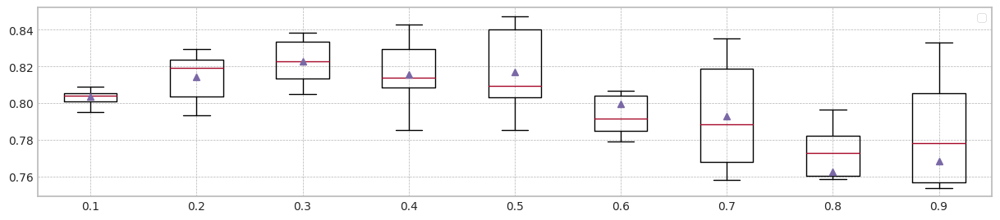

In [45]:
plt.figure(figsize=main_figsize)
bp = []
lb = []
for i, df in enumerate(gcd_statistics_dfs):
    bp.append(df['Mean F1'].values)
    lb.append(f'{(i/10+0.1):.1f}')

plt.boxplot(bp,showmeans=True,showfliers=False,labels=lb)
plt.legend()
plt.show()

trial_count: 20
lambda_f2 0.8
######################### Trial 0 for Normal model ###########################
cuda:0


100%|██████████| 2000/2000 [00:03<00:00, 648.50it/s]


Test f1 score: 0.8764465998016092
X_live.shape (39000, 6)
Truncate 8000 rows from live_set (39000, 6)
Search MI & Drift...for X_live_set torch.Size([31, 9000, 6])


100%|██████████| 31/31 [00:05<00:00,  5.29it/s]


mean of drift:
x0    0.011903
x1    0.011896
x2    0.010036
x3    0.013871
z0    0.182717
dtype: float64
Mean F1 for all data: 0.7969252763581919
######################### Trial 0 for Drift tolerant model ###########################
cuda:0


100%|██████████| 2000/2000 [00:08<00:00, 230.79it/s]


Test f1 score: 0.8795406867616208
X_live.shape (39000, 6)
Truncate 8000 rows from live_set (39000, 6)
Search MI & Drift...for X_live_set torch.Size([31, 9000, 6])


100%|██████████| 31/31 [00:05<00:00,  5.45it/s]


mean of drift:
x0    0.031860
x1    0.076989
x2    0.303753
x3    0.098921
z0    0.477832
dtype: float64
Mean F1 for all data: 0.7988998299071491
Normal model median        : 0.7969252763581919
Drift tolerant model median: 0.7988998299071491
######################### Trial 1 for Normal model ###########################
cuda:0


100%|██████████| 2000/2000 [00:03<00:00, 592.60it/s]


Test f1 score: 0.8771620579486614
X_live.shape (39000, 6)
Truncate 8000 rows from live_set (39000, 6)
Search MI & Drift...for X_live_set torch.Size([31, 9000, 6])


100%|██████████| 31/31 [00:05<00:00,  5.47it/s]


mean of drift:
x0    0.011903
x1    0.011896
x2    0.010036
x3    0.013871
z0    0.182717
dtype: float64
Mean F1 for all data: 0.7945274333033483
######################### Trial 1 for Drift tolerant model ###########################
cuda:0


100%|██████████| 2000/2000 [00:08<00:00, 226.71it/s]


Test f1 score: 0.8790553961597881
X_live.shape (39000, 6)
Truncate 8000 rows from live_set (39000, 6)
Search MI & Drift...for X_live_set torch.Size([31, 9000, 6])


100%|██████████| 31/31 [00:05<00:00,  5.31it/s]


mean of drift:
x0    0.026799
x1    0.113599
x2    0.074509
x3    0.054065
z0    0.366781
dtype: float64
Mean F1 for all data: 0.8309124012933556
Normal model median        : 0.79572635483077
Drift tolerant model median: 0.8149061156002524
######################### Trial 2 for Normal model ###########################
cuda:0


100%|██████████| 2000/2000 [00:03<00:00, 636.60it/s]


Test f1 score: 0.8773866019203178
X_live.shape (39000, 6)
Truncate 8000 rows from live_set (39000, 6)
Search MI & Drift...for X_live_set torch.Size([31, 9000, 6])


100%|██████████| 31/31 [00:05<00:00,  5.46it/s]


mean of drift:
x0    0.011903
x1    0.011896
x2    0.010036
x3    0.013871
z0    0.182717
dtype: float64
Mean F1 for all data: 0.7962286881607163
######################### Trial 2 for Drift tolerant model ###########################
cuda:0


100%|██████████| 2000/2000 [00:08<00:00, 232.44it/s]


Test f1 score: 0.8799558255107675
X_live.shape (39000, 6)
Truncate 8000 rows from live_set (39000, 6)
Search MI & Drift...for X_live_set torch.Size([31, 9000, 6])


100%|██████████| 31/31 [00:05<00:00,  5.31it/s]


mean of drift:
x0    0.025541
x1    0.066849
x2    0.172384
x3    0.080832
z0    0.406910
dtype: float64
Mean F1 for all data: 0.8491285138929137
Normal model median        : 0.7962286881607163
Drift tolerant model median: 0.8309124012933556
######################### Trial 3 for Normal model ###########################
cuda:0


100%|██████████| 2000/2000 [00:03<00:00, 635.02it/s]


Test f1 score: 0.8769112308876912
X_live.shape (39000, 6)
Truncate 8000 rows from live_set (39000, 6)
Search MI & Drift...for X_live_set torch.Size([31, 9000, 6])


100%|██████████| 31/31 [00:05<00:00,  5.50it/s]


mean of drift:
x0    0.011903
x1    0.011896
x2    0.010036
x3    0.013871
z0    0.182717
dtype: float64
Mean F1 for all data: 0.7920022388915385
######################### Trial 3 for Drift tolerant model ###########################
cuda:0


100%|██████████| 2000/2000 [00:08<00:00, 235.14it/s]


Test f1 score: 0.8797266012567523
X_live.shape (39000, 6)
Truncate 8000 rows from live_set (39000, 6)
Search MI & Drift...for X_live_set torch.Size([31, 9000, 6])


100%|██████████| 31/31 [00:05<00:00,  5.44it/s]


mean of drift:
x0    0.054817
x1    0.391470
x2    0.086649
x3    0.095756
z0    0.648265
dtype: float64
Mean F1 for all data: 0.7063167839684626
Normal model median        : 0.7953780607320323
Drift tolerant model median: 0.8149061156002524
######################### Trial 4 for Normal model ###########################
cuda:0


100%|██████████| 2000/2000 [00:03<00:00, 647.89it/s]


Test f1 score: 0.8767364939360528
X_live.shape (39000, 6)
Truncate 8000 rows from live_set (39000, 6)
Search MI & Drift...for X_live_set torch.Size([31, 9000, 6])


100%|██████████| 31/31 [00:05<00:00,  5.35it/s]


mean of drift:
x0    0.011903
x1    0.011896
x2    0.010036
x3    0.013871
z0    0.182717
dtype: float64
Mean F1 for all data: 0.7954220623610796
######################### Trial 4 for Drift tolerant model ###########################
cuda:0


100%|██████████| 2000/2000 [00:08<00:00, 237.66it/s]


Test f1 score: 0.8768516471368561
X_live.shape (39000, 6)
Truncate 8000 rows from live_set (39000, 6)
Search MI & Drift...for X_live_set torch.Size([31, 9000, 6])


100%|██████████| 31/31 [00:05<00:00,  5.44it/s]


mean of drift:
x0    0.072892
x1    0.095097
x2    0.078111
x3    0.082595
z0    0.304785
dtype: float64
Mean F1 for all data: 0.8165308094695634
Normal model median        : 0.7954220623610796
Drift tolerant model median: 0.8165308094695634
######################### Trial 5 for Normal model ###########################
cuda:0


100%|██████████| 2000/2000 [00:03<00:00, 617.76it/s]


Test f1 score: 0.8765976200969591
X_live.shape (39000, 6)
Truncate 8000 rows from live_set (39000, 6)
Search MI & Drift...for X_live_set torch.Size([31, 9000, 6])


100%|██████████| 31/31 [00:05<00:00,  5.46it/s]


mean of drift:
x0    0.011903
x1    0.011896
x2    0.010036
x3    0.013871
z0    0.182717
dtype: float64
Mean F1 for all data: 0.7960740208009198
######################### Trial 5 for Drift tolerant model ###########################
cuda:0


100%|██████████| 2000/2000 [00:08<00:00, 231.71it/s]


Test f1 score: 0.8800972483147308
X_live.shape (39000, 6)
Truncate 8000 rows from live_set (39000, 6)
Search MI & Drift...for X_live_set torch.Size([31, 9000, 6])


100%|██████████| 31/31 [00:05<00:00,  5.48it/s]


mean of drift:
x0    0.099925
x1    0.468466
x2    0.117100
x3    0.169724
z0    0.706043
dtype: float64
Mean F1 for all data: 0.842863304642076
Normal model median        : 0.7957480415809997
Drift tolerant model median: 0.8237216053814596
######################### Trial 6 for Normal model ###########################
cuda:0


100%|██████████| 2000/2000 [00:03<00:00, 638.51it/s]


Test f1 score: 0.8767213837170872
X_live.shape (39000, 6)
Truncate 8000 rows from live_set (39000, 6)
Search MI & Drift...for X_live_set torch.Size([31, 9000, 6])


100%|██████████| 31/31 [00:05<00:00,  5.45it/s]


mean of drift:
x0    0.011903
x1    0.011896
x2    0.010036
x3    0.013871
z0    0.182717
dtype: float64
Mean F1 for all data: 0.7963020617907525
######################### Trial 6 for Drift tolerant model ###########################
cuda:0


100%|██████████| 2000/2000 [00:08<00:00, 234.05it/s]


Test f1 score: 0.8795300897705862
X_live.shape (39000, 6)
Truncate 8000 rows from live_set (39000, 6)
Search MI & Drift...for X_live_set torch.Size([31, 9000, 6])


100%|██████████| 31/31 [00:05<00:00,  5.31it/s]


mean of drift:
x0    0.039573
x1    0.071860
x2    0.081935
x3    0.055842
z0    0.325907
dtype: float64
Mean F1 for all data: 0.8310729794845682
Normal model median        : 0.7960740208009198
Drift tolerant model median: 0.8309124012933556
######################### Trial 7 for Normal model ###########################
cuda:0


100%|██████████| 2000/2000 [00:03<00:00, 637.47it/s]


Test f1 score: 0.8778609154929576
X_live.shape (39000, 6)
Truncate 8000 rows from live_set (39000, 6)
Search MI & Drift...for X_live_set torch.Size([31, 9000, 6])


100%|██████████| 31/31 [00:05<00:00,  5.32it/s]


mean of drift:
x0    0.011903
x1    0.011896
x2    0.010036
x3    0.013871
z0    0.182717
dtype: float64
Mean F1 for all data: 0.7965556479326527
######################### Trial 7 for Drift tolerant model ###########################
cuda:0


100%|██████████| 2000/2000 [00:08<00:00, 235.33it/s]


Test f1 score: 0.8788446698269209
X_live.shape (39000, 6)
Truncate 8000 rows from live_set (39000, 6)
Search MI & Drift...for X_live_set torch.Size([31, 9000, 6])


100%|██████████| 31/31 [00:05<00:00,  5.46it/s]


mean of drift:
x0    0.073710
x1    0.057319
x2    0.364068
x3    0.091914
z0    0.431935
dtype: float64
Mean F1 for all data: 0.8545451675947767
Normal model median        : 0.7961513544808181
Drift tolerant model median: 0.830992690388962
######################### Trial 8 for Normal model ###########################
cuda:0


100%|██████████| 2000/2000 [00:03<00:00, 631.38it/s]


Test f1 score: 0.8778220451527223
X_live.shape (39000, 6)
Truncate 8000 rows from live_set (39000, 6)
Search MI & Drift...for X_live_set torch.Size([31, 9000, 6])


100%|██████████| 31/31 [00:05<00:00,  5.32it/s]


mean of drift:
x0    0.011903
x1    0.011896
x2    0.010036
x3    0.013871
z0    0.182717
dtype: float64
Mean F1 for all data: 0.7973550671081387
######################### Trial 8 for Drift tolerant model ###########################
cuda:0


100%|██████████| 2000/2000 [00:08<00:00, 238.86it/s]


Test f1 score: 0.8799112097669257
X_live.shape (39000, 6)
Truncate 8000 rows from live_set (39000, 6)
Search MI & Drift...for X_live_set torch.Size([31, 9000, 6])


100%|██████████| 31/31 [00:05<00:00,  5.41it/s]


mean of drift:
x0    0.428022
x1    0.141491
x2    0.072939
x3    0.034552
z0    0.512240
dtype: float64
Mean F1 for all data: 0.845008213279494
Normal model median        : 0.7962286881607163
Drift tolerant model median: 0.8310729794845682
######################### Trial 9 for Normal model ###########################
cuda:0


100%|██████████| 2000/2000 [00:03<00:00, 636.77it/s]


Test f1 score: 0.877347095640716
X_live.shape (39000, 6)
Truncate 8000 rows from live_set (39000, 6)
Search MI & Drift...for X_live_set torch.Size([31, 9000, 6])


100%|██████████| 31/31 [00:05<00:00,  5.44it/s]


mean of drift:
x0    0.011903
x1    0.011896
x2    0.010036
x3    0.013871
z0    0.182717
dtype: float64
Mean F1 for all data: 0.795215998637478
######################### Trial 9 for Drift tolerant model ###########################
cuda:0


100%|██████████| 2000/2000 [00:08<00:00, 231.78it/s]


Test f1 score: 0.8793997572547722
X_live.shape (39000, 6)
Truncate 8000 rows from live_set (39000, 6)
Search MI & Drift...for X_live_set torch.Size([31, 9000, 6])


100%|██████████| 31/31 [00:05<00:00,  5.51it/s]


mean of drift:
x0    0.353376
x1    0.349616
x2    0.128380
x3    0.118659
z0    0.488602
dtype: float64
Mean F1 for all data: 0.8460144822326104
Normal model median        : 0.7961513544808181
Drift tolerant model median: 0.8369681420633222
######################### Trial 10 for Normal model ###########################
cuda:0


100%|██████████| 2000/2000 [00:03<00:00, 642.28it/s]


Test f1 score: 0.8760039608317748
X_live.shape (39000, 6)
Truncate 8000 rows from live_set (39000, 6)
Search MI & Drift...for X_live_set torch.Size([31, 9000, 6])


100%|██████████| 31/31 [00:05<00:00,  5.34it/s]


mean of drift:
x0    0.011903
x1    0.011896
x2    0.010036
x3    0.013871
z0    0.182717
dtype: float64
Mean F1 for all data: 0.7929917617670544
######################### Trial 10 for Drift tolerant model ###########################
cuda:0


100%|██████████| 2000/2000 [00:08<00:00, 235.62it/s]


Test f1 score: 0.8810204530459644
X_live.shape (39000, 6)
Truncate 8000 rows from live_set (39000, 6)
Search MI & Drift...for X_live_set torch.Size([31, 9000, 6])


100%|██████████| 31/31 [00:05<00:00,  5.38it/s]


mean of drift:
x0    0.340495
x1    0.030333
x2    0.083211
x3    0.059448
z0    0.319226
dtype: float64
Mean F1 for all data: 0.8462845766915287
Normal model median        : 0.7960740208009198
Drift tolerant model median: 0.842863304642076
######################### Trial 11 for Normal model ###########################
cuda:0


100%|██████████| 2000/2000 [00:03<00:00, 641.93it/s]


Test f1 score: 0.8766248072262613
X_live.shape (39000, 6)
Truncate 8000 rows from live_set (39000, 6)
Search MI & Drift...for X_live_set torch.Size([31, 9000, 6])


100%|██████████| 31/31 [00:05<00:00,  5.49it/s]


mean of drift:
x0    0.011903
x1    0.011896
x2    0.010036
x3    0.013871
z0    0.182717
dtype: float64
Mean F1 for all data: 0.7955867355507644
######################### Trial 11 for Drift tolerant model ###########################
cuda:0


100%|██████████| 2000/2000 [00:08<00:00, 233.19it/s]


Test f1 score: 0.8798061033381074
X_live.shape (39000, 6)
Truncate 8000 rows from live_set (39000, 6)
Search MI & Drift...for X_live_set torch.Size([31, 9000, 6])


100%|██████████| 31/31 [00:05<00:00,  5.52it/s]


mean of drift:
x0    0.060925
x1    0.069796
x2    0.327713
x3    0.078563
z0    0.573473
dtype: float64
Mean F1 for all data: 0.7024007456394098
Normal model median        : 0.7958303781758421
Drift tolerant model median: 0.8369681420633222
######################### Trial 12 for Normal model ###########################
cuda:0


100%|██████████| 2000/2000 [00:03<00:00, 649.85it/s]


Test f1 score: 0.8775869660942317
X_live.shape (39000, 6)
Truncate 8000 rows from live_set (39000, 6)
Search MI & Drift...for X_live_set torch.Size([31, 9000, 6])


100%|██████████| 31/31 [00:05<00:00,  5.29it/s]


mean of drift:
x0    0.011903
x1    0.011896
x2    0.010036
x3    0.013871
z0    0.182717
dtype: float64
Mean F1 for all data: 0.7973975743331257
######################### Trial 12 for Drift tolerant model ###########################
cuda:0


100%|██████████| 2000/2000 [00:08<00:00, 234.41it/s]


Test f1 score: 0.8793636765355722
X_live.shape (39000, 6)
Truncate 8000 rows from live_set (39000, 6)
Search MI & Drift...for X_live_set torch.Size([31, 9000, 6])


100%|██████████| 31/31 [00:05<00:00,  5.50it/s]


mean of drift:
x0    0.052219
x1    0.044000
x2    0.048591
x3    0.063118
z0    0.496509
dtype: float64
Mean F1 for all data: 0.7239266694649584
Normal model median        : 0.7960740208009198
Drift tolerant model median: 0.8310729794845682
######################### Trial 13 for Normal model ###########################
cuda:0


100%|██████████| 2000/2000 [00:03<00:00, 648.45it/s]


Test f1 score: 0.8768451200705001
X_live.shape (39000, 6)
Truncate 8000 rows from live_set (39000, 6)
Search MI & Drift...for X_live_set torch.Size([31, 9000, 6])


100%|██████████| 31/31 [00:05<00:00,  5.48it/s]


mean of drift:
x0    0.011903
x1    0.011896
x2    0.010036
x3    0.013871
z0    0.182717
dtype: float64
Mean F1 for all data: 0.7945196654210102
######################### Trial 13 for Drift tolerant model ###########################
cuda:0


100%|██████████| 2000/2000 [00:08<00:00, 229.85it/s]


Test f1 score: 0.8800705467372134
X_live.shape (39000, 6)
Truncate 8000 rows from live_set (39000, 6)
Search MI & Drift...for X_live_set torch.Size([31, 9000, 6])


100%|██████████| 31/31 [00:05<00:00,  5.50it/s]


mean of drift:
x0    0.134943
x1    0.051853
x2    0.320143
x3    0.166713
z0    0.504348
dtype: float64
Mean F1 for all data: 0.8198517523260436
Normal model median        : 0.7958303781758421
Drift tolerant model median: 0.830992690388962
######################### Trial 14 for Normal model ###########################
cuda:0


100%|██████████| 2000/2000 [00:03<00:00, 629.46it/s]


Test f1 score: 0.8767213837170872
X_live.shape (39000, 6)
Truncate 8000 rows from live_set (39000, 6)
Search MI & Drift...for X_live_set torch.Size([31, 9000, 6])


100%|██████████| 31/31 [00:05<00:00,  5.46it/s]


mean of drift:
x0    0.011903
x1    0.011896
x2    0.010036
x3    0.013871
z0    0.182717
dtype: float64
Mean F1 for all data: 0.7937904967363878
######################### Trial 14 for Drift tolerant model ###########################
cuda:0


100%|██████████| 2000/2000 [00:08<00:00, 234.75it/s]


Test f1 score: 0.8799206086668873
X_live.shape (39000, 6)
Truncate 8000 rows from live_set (39000, 6)
Search MI & Drift...for X_live_set torch.Size([31, 9000, 6])


100%|██████████| 31/31 [00:05<00:00,  5.38it/s]


mean of drift:
x0    0.127885
x1    0.026692
x2    0.110480
x3    0.062677
z0    0.329609
dtype: float64
Mean F1 for all data: 0.8360301082299624
Normal model median        : 0.7955867355507644
Drift tolerant model median: 0.8310729794845682
######################### Trial 15 for Normal model ###########################
cuda:0


100%|██████████| 2000/2000 [00:03<00:00, 644.02it/s]


Test f1 score: 0.8776139115122167
X_live.shape (39000, 6)
Truncate 8000 rows from live_set (39000, 6)
Search MI & Drift...for X_live_set torch.Size([31, 9000, 6])


100%|██████████| 31/31 [00:05<00:00,  5.51it/s]


mean of drift:
x0    0.011903
x1    0.011896
x2    0.010036
x3    0.013871
z0    0.182717
dtype: float64
Mean F1 for all data: 0.7951643405489799
######################### Trial 15 for Drift tolerant model ###########################
cuda:0


100%|██████████| 2000/2000 [00:08<00:00, 236.87it/s]


Test f1 score: 0.8810388467040827
X_live.shape (39000, 6)
Truncate 8000 rows from live_set (39000, 6)
Search MI & Drift...for X_live_set torch.Size([31, 9000, 6])


100%|██████████| 31/31 [00:05<00:00,  5.46it/s]


mean of drift:
x0    0.030631
x1    0.083649
x2    0.064143
x3    0.050487
z0    0.363308
dtype: float64
Mean F1 for all data: 0.8110987949936505
Normal model median        : 0.7955043989559221
Drift tolerant model median: 0.830992690388962
######################### Trial 16 for Normal model ###########################
cuda:0


100%|██████████| 2000/2000 [00:03<00:00, 635.03it/s]


Test f1 score: 0.8770077007700771
X_live.shape (39000, 6)
Truncate 8000 rows from live_set (39000, 6)
Search MI & Drift...for X_live_set torch.Size([31, 9000, 6])


100%|██████████| 31/31 [00:05<00:00,  5.45it/s]


mean of drift:
x0    0.011903
x1    0.011896
x2    0.010036
x3    0.013871
z0    0.182717
dtype: float64
Mean F1 for all data: 0.7918565965756301
######################### Trial 16 for Drift tolerant model ###########################
cuda:0


100%|██████████| 2000/2000 [00:08<00:00, 232.63it/s]


Test f1 score: 0.8804671146854688
X_live.shape (39000, 6)
Truncate 8000 rows from live_set (39000, 6)
Search MI & Drift...for X_live_set torch.Size([31, 9000, 6])


100%|██████████| 31/31 [00:05<00:00,  5.47it/s]


mean of drift:
x0    0.041581
x1    0.048244
x2    0.033312
x3    0.072061
z0    0.347735
dtype: float64
Mean F1 for all data: 0.8318501203141129
Normal model median        : 0.7954220623610796
Drift tolerant model median: 0.8310729794845682
######################### Trial 17 for Normal model ###########################
cuda:0


100%|██████████| 2000/2000 [00:03<00:00, 642.29it/s]


Test f1 score: 0.8765554454355248
X_live.shape (39000, 6)
Truncate 8000 rows from live_set (39000, 6)
Search MI & Drift...for X_live_set torch.Size([31, 9000, 6])


100%|██████████| 31/31 [00:05<00:00,  5.53it/s]


mean of drift:
x0    0.011903
x1    0.011896
x2    0.010036
x3    0.013871
z0    0.182717
dtype: float64
Mean F1 for all data: 0.7948654108354687
######################### Trial 17 for Drift tolerant model ###########################
cuda:0


100%|██████████| 2000/2000 [00:08<00:00, 232.48it/s]


Test f1 score: 0.8793293624531215
X_live.shape (39000, 6)
Truncate 8000 rows from live_set (39000, 6)
Search MI & Drift...for X_live_set torch.Size([31, 9000, 6])


100%|██████████| 31/31 [00:05<00:00,  5.54it/s]


mean of drift:
x0    0.096760
x1    0.431111
x2    0.090910
x3    0.105376
z0    0.526276
dtype: float64
Mean F1 for all data: 0.8494207037889867
Normal model median        : 0.7953190304992788
Drift tolerant model median: 0.8314615498993405
######################### Trial 18 for Normal model ###########################
cuda:0


100%|██████████| 2000/2000 [00:03<00:00, 603.76it/s]


Test f1 score: 0.8769112308876912
X_live.shape (39000, 6)
Truncate 8000 rows from live_set (39000, 6)
Search MI & Drift...for X_live_set torch.Size([31, 9000, 6])


100%|██████████| 31/31 [00:05<00:00,  5.32it/s]


mean of drift:
x0    0.011903
x1    0.011896
x2    0.010036
x3    0.013871
z0    0.182717
dtype: float64
Mean F1 for all data: 0.7930409097238863
######################### Trial 18 for Drift tolerant model ###########################
cuda:0


100%|██████████| 2000/2000 [00:08<00:00, 237.86it/s]


Test f1 score: 0.8779896395899923
X_live.shape (39000, 6)
Truncate 8000 rows from live_set (39000, 6)
Search MI & Drift...for X_live_set torch.Size([31, 9000, 6])


100%|██████████| 31/31 [00:05<00:00,  5.48it/s]


mean of drift:
x0    0.125552
x1    0.338925
x2    0.054513
x3    0.160362
z0    0.302713
dtype: float64
Mean F1 for all data: 0.8124688856774591
Normal model median        : 0.795215998637478
Drift tolerant model median: 0.8310729794845682
######################### Trial 19 for Normal model ###########################
cuda:0


100%|██████████| 2000/2000 [00:03<00:00, 634.67it/s]


Test f1 score: 0.8763125898087764
X_live.shape (39000, 6)
Truncate 8000 rows from live_set (39000, 6)
Search MI & Drift...for X_live_set torch.Size([31, 9000, 6])


100%|██████████| 31/31 [00:05<00:00,  5.48it/s]


mean of drift:
x0    0.011903
x1    0.011896
x2    0.010036
x3    0.013871
z0    0.182717
dtype: float64
Mean F1 for all data: 0.7973400556614291
######################### Trial 19 for Drift tolerant model ###########################
cuda:0


100%|██████████| 2000/2000 [00:08<00:00, 233.20it/s]


Test f1 score: 0.8812066497853132
X_live.shape (39000, 6)
Truncate 8000 rows from live_set (39000, 6)
Search MI & Drift...for X_live_set torch.Size([31, 9000, 6])


100%|██████████| 31/31 [00:05<00:00,  5.52it/s]


mean of drift:
x0    0.078430
x1    0.089398
x2    0.056910
x3    0.105584
z0    0.378971
dtype: float64
Mean F1 for all data: 0.8328347950104411
Normal model median        : 0.7953190304992788
Drift tolerant model median: 0.8314615498993405
######################### Trial 0 for Normal model ###########################
retrain_interval: 16
######################### Trial 0 for SEA ###########################
X_live.shape (39000, 6)
Truncate 8000 rows from live_set (39000, 6)
Search MI & Drift...for X_live_set torch.Size([31, 9000, 6])


100%|██████████| 31/31 [00:08<00:00,  3.82it/s]


Early stop at  1993.0
Mean of drift:
x0    0.011903
x1    0.011896
x2    0.010036
x3    0.013871
z0    0.182717
dtype: float64
Mean F1 for all data: 0.8243517375300768
SEA median: 0.8243517375300768
######################### Trial 0 for AUE ###########################
X_live.shape (39000, 6)
Truncate 8000 rows from live_set (39000, 6)
Search MI & Drift...for X_live_set torch.Size([31, 9000, 6])


100%|██████████| 31/31 [00:07<00:00,  4.02it/s]


Early stop at  1668.0
Mean of drift:
x0    0.011903
x1    0.011896
x2    0.010036
x3    0.013871
z0    0.182717
dtype: float64
Mean F1 for all data: 0.835856911575391
AUE median: 0.835856911575391
######################### Trial 0 for DTEL ###########################
X_live.shape (39000, 6)
Truncate 8000 rows from live_set (39000, 6)
Search MI & Drift...for X_live_set torch.Size([31, 9000, 6])


100%|██████████| 31/31 [00:11<00:00,  2.71it/s]


Early stop at  1002.0
Mean of drift:
x0    0.011903
x1    0.011896
x2    0.010036
x3    0.013871
z0    0.182717
dtype: float64
Mean F1 for all data: 0.8433485682352667
DTEL median: 0.8433485682352667
######################### Trial 1 for Normal model ###########################
retrain_interval: 16
######################### Trial 1 for SEA ###########################
X_live.shape (39000, 6)
Truncate 8000 rows from live_set (39000, 6)
Search MI & Drift...for X_live_set torch.Size([31, 9000, 6])


100%|██████████| 31/31 [00:07<00:00,  4.32it/s]


Early stop at  1135.0
Mean of drift:
x0    0.011903
x1    0.011896
x2    0.010036
x3    0.013871
z0    0.182717
dtype: float64
Mean F1 for all data: 0.8231319054403438
SEA median: 0.8237418214852104
######################### Trial 1 for AUE ###########################
X_live.shape (39000, 6)
Truncate 8000 rows from live_set (39000, 6)
Search MI & Drift...for X_live_set torch.Size([31, 9000, 6])


100%|██████████| 31/31 [00:08<00:00,  3.63it/s]


Early stop at  2318.0
Mean of drift:
x0    0.011903
x1    0.011896
x2    0.010036
x3    0.013871
z0    0.182717
dtype: float64
Mean F1 for all data: 0.834315355186241
AUE median: 0.8350861333808159
######################### Trial 1 for DTEL ###########################
X_live.shape (39000, 6)
Truncate 8000 rows from live_set (39000, 6)
Search MI & Drift...for X_live_set torch.Size([31, 9000, 6])


100%|██████████| 31/31 [00:14<00:00,  2.14it/s]


Early stop at  3298.0
Mean of drift:
x0    0.011903
x1    0.011896
x2    0.010036
x3    0.013871
z0    0.182717
dtype: float64
Mean F1 for all data: 0.8437022658789876
DTEL median: 0.8435254170571271
######################### Trial 2 for Normal model ###########################
retrain_interval: 16
######################### Trial 2 for SEA ###########################
X_live.shape (39000, 6)
Truncate 8000 rows from live_set (39000, 6)
Search MI & Drift...for X_live_set torch.Size([31, 9000, 6])


100%|██████████| 31/31 [00:09<00:00,  3.39it/s]


Early stop at  2765.0
Mean of drift:
x0    0.011903
x1    0.011896
x2    0.010036
x3    0.013871
z0    0.182717
dtype: float64
Mean F1 for all data: 0.8243208408728334
SEA median: 0.8243208408728334
######################### Trial 2 for AUE ###########################
X_live.shape (39000, 6)
Truncate 8000 rows from live_set (39000, 6)
Search MI & Drift...for X_live_set torch.Size([31, 9000, 6])


100%|██████████| 31/31 [00:06<00:00,  4.52it/s]


Early stop at  953.0
Mean of drift:
x0    0.011903
x1    0.011896
x2    0.010036
x3    0.013871
z0    0.182717
dtype: float64
Mean F1 for all data: 0.8349028475191784
AUE median: 0.8349028475191784
######################### Trial 2 for DTEL ###########################
X_live.shape (39000, 6)
Truncate 8000 rows from live_set (39000, 6)
Search MI & Drift...for X_live_set torch.Size([31, 9000, 6])


100%|██████████| 31/31 [00:11<00:00,  2.74it/s]


Early stop at  818.0
Mean of drift:
x0    0.011903
x1    0.011896
x2    0.010036
x3    0.013871
z0    0.182717
dtype: float64
Mean F1 for all data: 0.8429571955970653
DTEL median: 0.8433485682352667
######################### Trial 3 for Normal model ###########################
retrain_interval: 16
######################### Trial 3 for SEA ###########################
X_live.shape (39000, 6)
Truncate 8000 rows from live_set (39000, 6)
Search MI & Drift...for X_live_set torch.Size([31, 9000, 6])


100%|██████████| 31/31 [00:07<00:00,  4.31it/s]


Early stop at  1245.0
Mean of drift:
x0    0.011903
x1    0.011896
x2    0.010036
x3    0.013871
z0    0.182717
dtype: float64
Mean F1 for all data: 0.8211118298861227
SEA median: 0.8237263731565886
######################### Trial 3 for AUE ###########################
X_live.shape (39000, 6)
Truncate 8000 rows from live_set (39000, 6)
Search MI & Drift...for X_live_set torch.Size([31, 9000, 6])


100%|██████████| 31/31 [00:08<00:00,  3.73it/s]


Early stop at  2069.0
Mean of drift:
x0    0.011903
x1    0.011896
x2    0.010036
x3    0.013871
z0    0.182717
dtype: float64
Mean F1 for all data: 0.8332143931858695
AUE median: 0.8346091013527097
######################### Trial 3 for DTEL ###########################
X_live.shape (39000, 6)
Truncate 8000 rows from live_set (39000, 6)
Search MI & Drift...for X_live_set torch.Size([31, 9000, 6])


100%|██████████| 31/31 [00:12<00:00,  2.39it/s]


Early stop at  2089.0
Mean of drift:
x0    0.011903
x1    0.011896
x2    0.010036
x3    0.013871
z0    0.182717
dtype: float64
Mean F1 for all data: 0.8412140428266975
DTEL median: 0.843152881916166
######################### Trial 4 for Normal model ###########################
retrain_interval: 16
######################### Trial 4 for SEA ###########################
X_live.shape (39000, 6)
Truncate 8000 rows from live_set (39000, 6)
Search MI & Drift...for X_live_set torch.Size([31, 9000, 6])


100%|██████████| 31/31 [00:07<00:00,  3.97it/s]


Early stop at  1808.0
Mean of drift:
x0    0.011903
x1    0.011896
x2    0.010036
x3    0.013871
z0    0.182717
dtype: float64
Mean F1 for all data: 0.8246513181569214
SEA median: 0.8243208408728334
######################### Trial 4 for AUE ###########################
X_live.shape (39000, 6)
Truncate 8000 rows from live_set (39000, 6)
Search MI & Drift...for X_live_set torch.Size([31, 9000, 6])


100%|██████████| 31/31 [00:08<00:00,  3.76it/s]


Early stop at  1889.0
Mean of drift:
x0    0.011903
x1    0.011896
x2    0.010036
x3    0.013871
z0    0.182717
dtype: float64
Mean F1 for all data: 0.8349127466855325
AUE median: 0.8349028475191784
######################### Trial 4 for DTEL ###########################
X_live.shape (39000, 6)
Truncate 8000 rows from live_set (39000, 6)
Search MI & Drift...for X_live_set torch.Size([31, 9000, 6])


100%|██████████| 31/31 [00:12<00:00,  2.46it/s]


Early stop at  1881.0
Mean of drift:
x0    0.011903
x1    0.011896
x2    0.010036
x3    0.013871
z0    0.182717
dtype: float64
Mean F1 for all data: 0.8435302078830809
DTEL median: 0.8433485682352667
######################### Trial 5 for Normal model ###########################
retrain_interval: 16
######################### Trial 5 for SEA ###########################
X_live.shape (39000, 6)
Truncate 8000 rows from live_set (39000, 6)
Search MI & Drift...for X_live_set torch.Size([31, 9000, 6])


100%|██████████| 31/31 [00:07<00:00,  4.41it/s]


Early stop at  1117.0
Mean of drift:
x0    0.011903
x1    0.011896
x2    0.010036
x3    0.013871
z0    0.182717
dtype: float64
Mean F1 for all data: 0.8236069106158153
SEA median: 0.8239638757443244
######################### Trial 5 for AUE ###########################
X_live.shape (39000, 6)
Truncate 8000 rows from live_set (39000, 6)
Search MI & Drift...for X_live_set torch.Size([31, 9000, 6])


100%|██████████| 31/31 [00:07<00:00,  3.93it/s]


Early stop at  1784.0
Mean of drift:
x0    0.011903
x1    0.011896
x2    0.010036
x3    0.013871
z0    0.182717
dtype: float64
Mean F1 for all data: 0.8347324296340368
AUE median: 0.8348176385766076
######################### Trial 5 for DTEL ###########################
X_live.shape (39000, 6)
Truncate 8000 rows from live_set (39000, 6)
Search MI & Drift...for X_live_set torch.Size([31, 9000, 6])


100%|██████████| 31/31 [00:11<00:00,  2.68it/s]


Early stop at  932.0
Mean of drift:
x0    0.011903
x1    0.011896
x2    0.010036
x3    0.013871
z0    0.182717
dtype: float64
Mean F1 for all data: 0.8428539110142469
DTEL median: 0.843152881916166
######################### Trial 6 for Normal model ###########################
retrain_interval: 16
######################### Trial 6 for SEA ###########################
X_live.shape (39000, 6)
Truncate 8000 rows from live_set (39000, 6)
Search MI & Drift...for X_live_set torch.Size([31, 9000, 6])


100%|██████████| 31/31 [00:06<00:00,  4.69it/s]


Early stop at  773.0
Mean of drift:
x0    0.011903
x1    0.011896
x2    0.010036
x3    0.013871
z0    0.182717
dtype: float64
Mean F1 for all data: 0.8228548671316331
SEA median: 0.8236069106158153
######################### Trial 6 for AUE ###########################
X_live.shape (39000, 6)
Truncate 8000 rows from live_set (39000, 6)
Search MI & Drift...for X_live_set torch.Size([31, 9000, 6])


100%|██████████| 31/31 [00:10<00:00,  2.91it/s]


Early stop at  nan
Mean of drift:
x0    0.011903
x1    0.011896
x2    0.010036
x3    0.013871
z0    0.182717
dtype: float64
Mean F1 for all data: 0.8349893020635462
AUE median: 0.8349028475191784
######################### Trial 6 for DTEL ###########################
X_live.shape (39000, 6)
Truncate 8000 rows from live_set (39000, 6)
Search MI & Drift...for X_live_set torch.Size([31, 9000, 6])


100%|██████████| 31/31 [00:12<00:00,  2.48it/s]


Early stop at  1716.0
Mean of drift:
x0    0.011903
x1    0.011896
x2    0.010036
x3    0.013871
z0    0.182717
dtype: float64
Mean F1 for all data: 0.8433418225436211
DTEL median: 0.8433418225436211
######################### Trial 7 for Normal model ###########################
retrain_interval: 16
######################### Trial 7 for SEA ###########################
X_live.shape (39000, 6)
Truncate 8000 rows from live_set (39000, 6)
Search MI & Drift...for X_live_set torch.Size([31, 9000, 6])


100%|██████████| 31/31 [00:10<00:00,  2.94it/s]


Early stop at  nan
Mean of drift:
x0    0.011903
x1    0.011896
x2    0.010036
x3    0.013871
z0    0.182717
dtype: float64
Mean F1 for all data: 0.8257082670445534
SEA median: 0.8239638757443244
######################### Trial 7 for AUE ###########################
X_live.shape (39000, 6)
Truncate 8000 rows from live_set (39000, 6)
Search MI & Drift...for X_live_set torch.Size([31, 9000, 6])


100%|██████████| 31/31 [00:08<00:00,  3.74it/s]


Early stop at  2059.0
Mean of drift:
x0    0.011903
x1    0.011896
x2    0.010036
x3    0.013871
z0    0.182717
dtype: float64
Mean F1 for all data: 0.8362139564391823
AUE median: 0.8349077971023555
######################### Trial 7 for DTEL ###########################
X_live.shape (39000, 6)
Truncate 8000 rows from live_set (39000, 6)
Search MI & Drift...for X_live_set torch.Size([31, 9000, 6])


100%|██████████| 31/31 [00:12<00:00,  2.52it/s]


Early stop at  1389.0
Mean of drift:
x0    0.011903
x1    0.011896
x2    0.010036
x3    0.013871
z0    0.182717
dtype: float64
Mean F1 for all data: 0.8428786221532011
DTEL median: 0.8431495090703431
######################### Trial 8 for Normal model ###########################
retrain_interval: 16
######################### Trial 8 for SEA ###########################
X_live.shape (39000, 6)
Truncate 8000 rows from live_set (39000, 6)
Search MI & Drift...for X_live_set torch.Size([31, 9000, 6])


100%|██████████| 31/31 [00:07<00:00,  3.97it/s]


Early stop at  1748.0
Mean of drift:
x0    0.011903
x1    0.011896
x2    0.010036
x3    0.013871
z0    0.182717
dtype: float64
Mean F1 for all data: 0.8277992556771446
SEA median: 0.8243208408728334
######################### Trial 8 for AUE ###########################
X_live.shape (39000, 6)
Truncate 8000 rows from live_set (39000, 6)
Search MI & Drift...for X_live_set torch.Size([31, 9000, 6])


100%|██████████| 31/31 [00:07<00:00,  4.38it/s]


Early stop at  1185.0
Mean of drift:
x0    0.011903
x1    0.011896
x2    0.010036
x3    0.013871
z0    0.182717
dtype: float64
Mean F1 for all data: 0.8361643994617816
AUE median: 0.8349127466855325
######################### Trial 8 for DTEL ###########################
X_live.shape (39000, 6)
Truncate 8000 rows from live_set (39000, 6)
Search MI & Drift...for X_live_set torch.Size([31, 9000, 6])


100%|██████████| 31/31 [00:12<00:00,  2.53it/s]


Early stop at  1199.0
Mean of drift:
x0    0.011903
x1    0.011896
x2    0.010036
x3    0.013871
z0    0.182717
dtype: float64
Mean F1 for all data: 0.8430939427075324
DTEL median: 0.8430939427075324
######################### Trial 9 for Normal model ###########################
retrain_interval: 16
######################### Trial 9 for SEA ###########################
X_live.shape (39000, 6)
Truncate 8000 rows from live_set (39000, 6)
Search MI & Drift...for X_live_set torch.Size([31, 9000, 6])


100%|██████████| 31/31 [00:07<00:00,  4.08it/s]


Early stop at  1578.0
Mean of drift:
x0    0.011903
x1    0.011896
x2    0.010036
x3    0.013871
z0    0.182717
dtype: float64
Mean F1 for all data: 0.8243900403734239
SEA median: 0.8243362892014552
######################### Trial 9 for AUE ###########################
X_live.shape (39000, 6)
Truncate 8000 rows from live_set (39000, 6)
Search MI & Drift...for X_live_set torch.Size([31, 9000, 6])


100%|██████████| 31/31 [00:06<00:00,  4.60it/s]


Early stop at  918.0
Mean of drift:
x0    0.011903
x1    0.011896
x2    0.010036
x3    0.013871
z0    0.182717
dtype: float64
Mean F1 for all data: 0.8346130852911309
AUE median: 0.8349077971023555
######################### Trial 9 for DTEL ###########################
X_live.shape (39000, 6)
Truncate 8000 rows from live_set (39000, 6)
Search MI & Drift...for X_live_set torch.Size([31, 9000, 6])


100%|██████████| 31/31 [00:13<00:00,  2.25it/s]


Early stop at  2709.0
Mean of drift:
x0    0.011903
x1    0.011896
x2    0.010036
x3    0.013871
z0    0.182717
dtype: float64
Mean F1 for all data: 0.8417883549072162
DTEL median: 0.8430255691522988
######################### Trial 10 for Normal model ###########################
retrain_interval: 16
######################### Trial 10 for SEA ###########################
X_live.shape (39000, 6)
Truncate 8000 rows from live_set (39000, 6)
Search MI & Drift...for X_live_set torch.Size([31, 9000, 6])


100%|██████████| 31/31 [00:08<00:00,  3.62it/s]


Early stop at  2441.0
Mean of drift:
x0    0.011903
x1    0.011896
x2    0.010036
x3    0.013871
z0    0.182717
dtype: float64
Mean F1 for all data: 0.8210176475398312
SEA median: 0.8243208408728334
######################### Trial 10 for AUE ###########################
X_live.shape (39000, 6)
Truncate 8000 rows from live_set (39000, 6)
Search MI & Drift...for X_live_set torch.Size([31, 9000, 6])


100%|██████████| 31/31 [00:08<00:00,  3.67it/s]


Early stop at  2311.0
Mean of drift:
x0    0.011903
x1    0.011896
x2    0.010036
x3    0.013871
z0    0.182717
dtype: float64
Mean F1 for all data: 0.833349339517892
AUE median: 0.8349028475191784
######################### Trial 10 for DTEL ###########################
X_live.shape (39000, 6)
Truncate 8000 rows from live_set (39000, 6)
Search MI & Drift...for X_live_set torch.Size([31, 9000, 6])


100%|██████████| 31/31 [00:13<00:00,  2.38it/s]


Early stop at  2139.0
Mean of drift:
x0    0.011903
x1    0.011896
x2    0.010036
x3    0.013871
z0    0.182717
dtype: float64
Mean F1 for all data: 0.841826044195695
DTEL median: 0.8429571955970653
######################### Trial 11 for Normal model ###########################
retrain_interval: 16
######################### Trial 11 for SEA ###########################
X_live.shape (39000, 6)
Truncate 8000 rows from live_set (39000, 6)
Search MI & Drift...for X_live_set torch.Size([31, 9000, 6])


100%|██████████| 31/31 [00:07<00:00,  4.12it/s]


Early stop at  1517.0
Mean of drift:
x0    0.011903
x1    0.011896
x2    0.010036
x3    0.013871
z0    0.182717
dtype: float64
Mean F1 for all data: 0.8239830126091466
SEA median: 0.82415192674099
######################### Trial 11 for AUE ###########################
X_live.shape (39000, 6)
Truncate 8000 rows from live_set (39000, 6)
Search MI & Drift...for X_live_set torch.Size([31, 9000, 6])


100%|██████████| 31/31 [00:10<00:00,  2.92it/s]


Early stop at  nan
Mean of drift:
x0    0.011903
x1    0.011896
x2    0.010036
x3    0.013871
z0    0.182717
dtype: float64
Mean F1 for all data: 0.8350913397133776
AUE median: 0.8349077971023555
######################### Trial 11 for DTEL ###########################
X_live.shape (39000, 6)
Truncate 8000 rows from live_set (39000, 6)
Search MI & Drift...for X_live_set torch.Size([31, 9000, 6])


100%|██████████| 31/31 [00:12<00:00,  2.57it/s]


Early stop at  1180.0
Mean of drift:
x0    0.011903
x1    0.011896
x2    0.010036
x3    0.013871
z0    0.182717
dtype: float64
Mean F1 for all data: 0.8433447389434252
DTEL median: 0.8430255691522988
######################### Trial 12 for Normal model ###########################
retrain_interval: 16
######################### Trial 12 for SEA ###########################
X_live.shape (39000, 6)
Truncate 8000 rows from live_set (39000, 6)
Search MI & Drift...for X_live_set torch.Size([31, 9000, 6])


100%|██████████| 31/31 [00:08<00:00,  3.77it/s]


Early stop at  2018.0
Mean of drift:
x0    0.011903
x1    0.011896
x2    0.010036
x3    0.013871
z0    0.182717
dtype: float64
Mean F1 for all data: 0.8243786991662359
SEA median: 0.8243208408728334
######################### Trial 12 for AUE ###########################
X_live.shape (39000, 6)
Truncate 8000 rows from live_set (39000, 6)
Search MI & Drift...for X_live_set torch.Size([31, 9000, 6])


100%|██████████| 31/31 [00:10<00:00,  2.97it/s]


Early stop at  nan
Mean of drift:
x0    0.011903
x1    0.011896
x2    0.010036
x3    0.013871
z0    0.182717
dtype: float64
Mean F1 for all data: 0.8368078526882631
AUE median: 0.8349127466855325
######################### Trial 12 for DTEL ###########################
X_live.shape (39000, 6)
Truncate 8000 rows from live_set (39000, 6)
Search MI & Drift...for X_live_set torch.Size([31, 9000, 6])


100%|██████████| 31/31 [00:11<00:00,  2.80it/s]


Early stop at  683.0
Mean of drift:
x0    0.011903
x1    0.011896
x2    0.010036
x3    0.013871
z0    0.182717
dtype: float64
Mean F1 for all data: 0.8429359564339763
DTEL median: 0.8429571955970653
######################### Trial 13 for Normal model ###########################
retrain_interval: 16
######################### Trial 13 for SEA ###########################
X_live.shape (39000, 6)
Truncate 8000 rows from live_set (39000, 6)
Search MI & Drift...for X_live_set torch.Size([31, 9000, 6])


100%|██████████| 31/31 [00:07<00:00,  4.38it/s]


Early stop at  1153.0
Mean of drift:
x0    0.011903
x1    0.011896
x2    0.010036
x3    0.013871
z0    0.182717
dtype: float64
Mean F1 for all data: 0.8230347105249126
SEA median: 0.82415192674099
######################### Trial 13 for AUE ###########################
X_live.shape (39000, 6)
Truncate 8000 rows from live_set (39000, 6)
Search MI & Drift...for X_live_set torch.Size([31, 9000, 6])


100%|██████████| 31/31 [00:06<00:00,  4.67it/s]


Early stop at  785.0
Mean of drift:
x0    0.011903
x1    0.011896
x2    0.010036
x3    0.013871
z0    0.182717
dtype: float64
Mean F1 for all data: 0.8341381369455327
AUE median: 0.8349077971023555
######################### Trial 13 for DTEL ###########################
X_live.shape (39000, 6)
Truncate 8000 rows from live_set (39000, 6)
Search MI & Drift...for X_live_set torch.Size([31, 9000, 6])


100%|██████████| 31/31 [00:13<00:00,  2.22it/s]


Early stop at  2722.0
Mean of drift:
x0    0.011903
x1    0.011896
x2    0.010036
x3    0.013871
z0    0.182717
dtype: float64
Mean F1 for all data: 0.8417155880550905
DTEL median: 0.8429465760155208
######################### Trial 14 for Normal model ###########################
retrain_interval: 16
######################### Trial 14 for SEA ###########################
X_live.shape (39000, 6)
Truncate 8000 rows from live_set (39000, 6)
Search MI & Drift...for X_live_set torch.Size([31, 9000, 6])


100%|██████████| 31/31 [00:07<00:00,  4.21it/s]


Early stop at  1358.0
Mean of drift:
x0    0.011903
x1    0.011896
x2    0.010036
x3    0.013871
z0    0.182717
dtype: float64
Mean F1 for all data: 0.821596109211227
SEA median: 0.8239830126091466
######################### Trial 14 for AUE ###########################
X_live.shape (39000, 6)
Truncate 8000 rows from live_set (39000, 6)
Search MI & Drift...for X_live_set torch.Size([31, 9000, 6])


100%|██████████| 31/31 [00:07<00:00,  4.13it/s]


Early stop at  1545.0
Mean of drift:
x0    0.011903
x1    0.011896
x2    0.010036
x3    0.013871
z0    0.182717
dtype: float64
Mean F1 for all data: 0.8332341137895628
AUE median: 0.8349028475191784
######################### Trial 14 for DTEL ###########################
X_live.shape (39000, 6)
Truncate 8000 rows from live_set (39000, 6)
Search MI & Drift...for X_live_set torch.Size([31, 9000, 6])


100%|██████████| 31/31 [00:12<00:00,  2.57it/s]


Early stop at  1421.0
Mean of drift:
x0    0.011903
x1    0.011896
x2    0.010036
x3    0.013871
z0    0.182717
dtype: float64
Mean F1 for all data: 0.8422679187728325
DTEL median: 0.8429359564339763
######################### Trial 15 for Normal model ###########################
retrain_interval: 16
######################### Trial 15 for SEA ###########################
X_live.shape (39000, 6)
Truncate 8000 rows from live_set (39000, 6)
Search MI & Drift...for X_live_set torch.Size([31, 9000, 6])


100%|██████████| 31/31 [00:07<00:00,  4.39it/s]


Early stop at  1171.0
Mean of drift:
x0    0.011903
x1    0.011896
x2    0.010036
x3    0.013871
z0    0.182717
dtype: float64
Mean F1 for all data: 0.824237565436629
SEA median: 0.8241102890228877
######################### Trial 15 for AUE ###########################
X_live.shape (39000, 6)
Truncate 8000 rows from live_set (39000, 6)
Search MI & Drift...for X_live_set torch.Size([31, 9000, 6])


100%|██████████| 31/31 [00:10<00:00,  2.96it/s]


Early stop at  nan
Mean of drift:
x0    0.011903
x1    0.011896
x2    0.010036
x3    0.013871
z0    0.182717
dtype: float64
Mean F1 for all data: 0.8349797655625018
AUE median: 0.8349077971023555
######################### Trial 15 for DTEL ###########################
X_live.shape (39000, 6)
Truncate 8000 rows from live_set (39000, 6)
Search MI & Drift...for X_live_set torch.Size([31, 9000, 6])


100%|██████████| 31/31 [00:15<00:00,  2.05it/s]


Early stop at  3930.0
Mean of drift:
x0    0.011903
x1    0.011896
x2    0.010036
x3    0.013871
z0    0.182717
dtype: float64
Mean F1 for all data: 0.8413876725750091
DTEL median: 0.8429072892935887
######################### Trial 16 for Normal model ###########################
retrain_interval: 16
######################### Trial 16 for SEA ###########################
X_live.shape (39000, 6)
Truncate 8000 rows from live_set (39000, 6)
Search MI & Drift...for X_live_set torch.Size([31, 9000, 6])


100%|██████████| 31/31 [00:08<00:00,  3.83it/s]


Early stop at  1895.0
Mean of drift:
x0    0.011903
x1    0.011896
x2    0.010036
x3    0.013871
z0    0.182717
dtype: float64
Mean F1 for all data: 0.8204243217925972
SEA median: 0.8239830126091466
######################### Trial 16 for AUE ###########################
X_live.shape (39000, 6)
Truncate 8000 rows from live_set (39000, 6)
Search MI & Drift...for X_live_set torch.Size([31, 9000, 6])


100%|██████████| 31/31 [00:08<00:00,  3.81it/s]


Early stop at  2001.0
Mean of drift:
x0    0.011903
x1    0.011896
x2    0.010036
x3    0.013871
z0    0.182717
dtype: float64
Mean F1 for all data: 0.8328944977663997
AUE median: 0.8349028475191784
######################### Trial 16 for DTEL ###########################
X_live.shape (39000, 6)
Truncate 8000 rows from live_set (39000, 6)
Search MI & Drift...for X_live_set torch.Size([31, 9000, 6])


100%|██████████| 31/31 [00:11<00:00,  2.78it/s]


Early stop at  712.0
Mean of drift:
x0    0.011903
x1    0.011896
x2    0.010036
x3    0.013871
z0    0.182717
dtype: float64
Mean F1 for all data: 0.842284541248665
DTEL median: 0.8428786221532011
######################### Trial 17 for Normal model ###########################
retrain_interval: 16
######################### Trial 17 for SEA ###########################
X_live.shape (39000, 6)
Truncate 8000 rows from live_set (39000, 6)
Search MI & Drift...for X_live_set torch.Size([31, 9000, 6])


100%|██████████| 31/31 [00:06<00:00,  4.53it/s]


Early stop at  1006.0
Mean of drift:
x0    0.011903
x1    0.011896
x2    0.010036
x3    0.013871
z0    0.182717
dtype: float64
Mean F1 for all data: 0.8228054497431486
SEA median: 0.8237949616124809
######################### Trial 17 for AUE ###########################
X_live.shape (39000, 6)
Truncate 8000 rows from live_set (39000, 6)
Search MI & Drift...for X_live_set torch.Size([31, 9000, 6])


100%|██████████| 31/31 [00:06<00:00,  4.44it/s]


Early stop at  1066.0
Mean of drift:
x0    0.011903
x1    0.011896
x2    0.010036
x3    0.013871
z0    0.182717
dtype: float64
Mean F1 for all data: 0.8344281102550591
AUE median: 0.8348176385766076
######################### Trial 17 for DTEL ###########################
X_live.shape (39000, 6)
Truncate 8000 rows from live_set (39000, 6)
Search MI & Drift...for X_live_set torch.Size([31, 9000, 6])


100%|██████████| 31/31 [00:12<00:00,  2.51it/s]


Early stop at  1642.0
Mean of drift:
x0    0.011903
x1    0.011896
x2    0.010036
x3    0.013871
z0    0.182717
dtype: float64
Mean F1 for all data: 0.8423468065043608
DTEL median: 0.842866266583724
######################### Trial 18 for Normal model ###########################
retrain_interval: 16
######################### Trial 18 for SEA ###########################
X_live.shape (39000, 6)
Truncate 8000 rows from live_set (39000, 6)
Search MI & Drift...for X_live_set torch.Size([31, 9000, 6])


100%|██████████| 31/31 [00:08<00:00,  3.54it/s]


Early stop at  2414.0
Mean of drift:
x0    0.011903
x1    0.011896
x2    0.010036
x3    0.013871
z0    0.182717
dtype: float64
Mean F1 for all data: 0.8215340307651912
SEA median: 0.8236069106158153
######################### Trial 18 for AUE ###########################
X_live.shape (39000, 6)
Truncate 8000 rows from live_set (39000, 6)
Search MI & Drift...for X_live_set torch.Size([31, 9000, 6])


100%|██████████| 31/31 [00:10<00:00,  3.10it/s]


Early stop at  3484.0
Mean of drift:
x0    0.011903
x1    0.011896
x2    0.010036
x3    0.013871
z0    0.182717
dtype: float64
Mean F1 for all data: 0.8328604122291046
AUE median: 0.8347324296340368
######################### Trial 18 for DTEL ###########################
X_live.shape (39000, 6)
Truncate 8000 rows from live_set (39000, 6)
Search MI & Drift...for X_live_set torch.Size([31, 9000, 6])


100%|██████████| 31/31 [00:11<00:00,  2.73it/s]


Early stop at  894.0
Mean of drift:
x0    0.011903
x1    0.011896
x2    0.010036
x3    0.013871
z0    0.182717
dtype: float64
Mean F1 for all data: 0.8422238353546958
DTEL median: 0.8428539110142469
######################### Trial 19 for Normal model ###########################
retrain_interval: 16
######################### Trial 19 for SEA ###########################
X_live.shape (39000, 6)
Truncate 8000 rows from live_set (39000, 6)
Search MI & Drift...for X_live_set torch.Size([31, 9000, 6])


100%|██████████| 31/31 [00:07<00:00,  4.15it/s]


Early stop at  1512.0
Mean of drift:
x0    0.011903
x1    0.011896
x2    0.010036
x3    0.013871
z0    0.182717
dtype: float64
Mean F1 for all data: 0.8263412903924776
SEA median: 0.8237949616124809
######################### Trial 19 for AUE ###########################
X_live.shape (39000, 6)
Truncate 8000 rows from live_set (39000, 6)
Search MI & Drift...for X_live_set torch.Size([31, 9000, 6])


100%|██████████| 31/31 [00:07<00:00,  3.89it/s]


Early stop at  1826.0
Mean of drift:
x0    0.011903
x1    0.011896
x2    0.010036
x3    0.013871
z0    0.182717
dtype: float64
Mean F1 for all data: 0.8362662126754362
AUE median: 0.8348176385766076
######################### Trial 19 for DTEL ###########################
X_live.shape (39000, 6)
Truncate 8000 rows from live_set (39000, 6)
Search MI & Drift...for X_live_set torch.Size([31, 9000, 6])


100%|██████████| 31/31 [00:11<00:00,  2.71it/s]


Early stop at  936.0
Mean of drift:
x0    0.011903
x1    0.011896
x2    0.010036
x3    0.013871
z0    0.182717
dtype: float64
Mean F1 for all data: 0.8439425694269295
DTEL median: 0.842866266583724


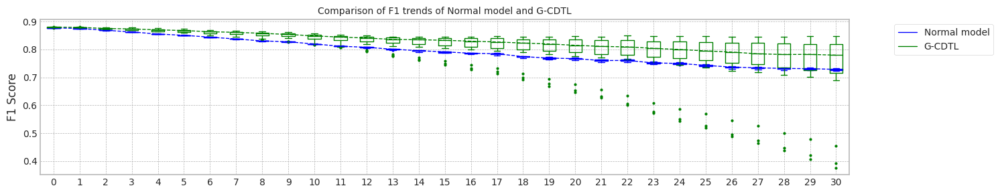

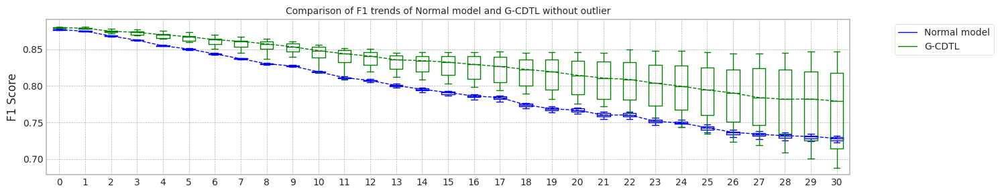

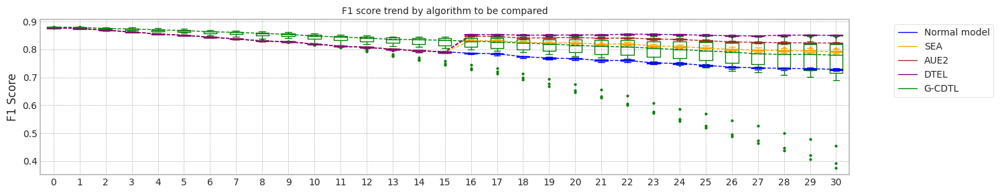

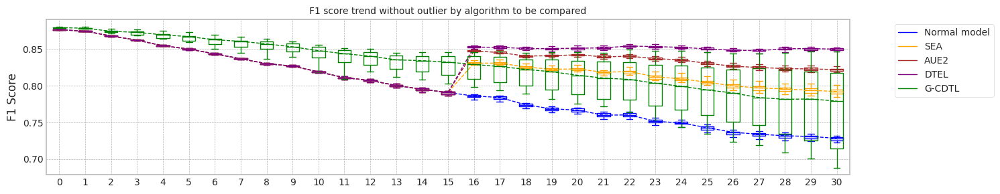

max_mean_trial= 7


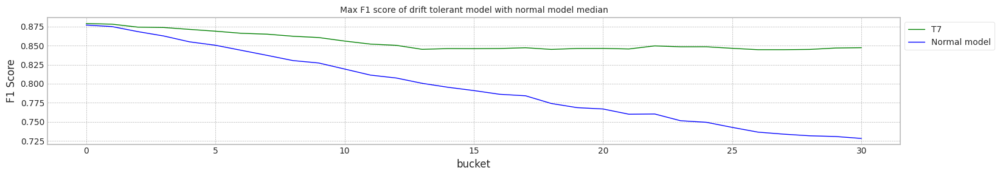

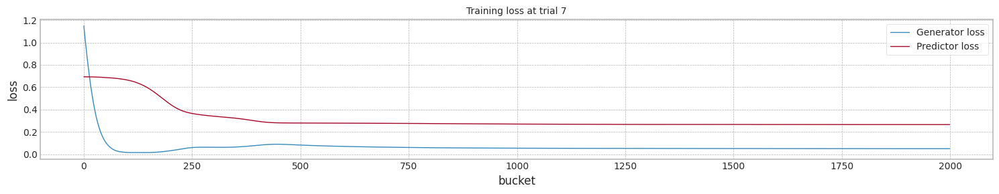

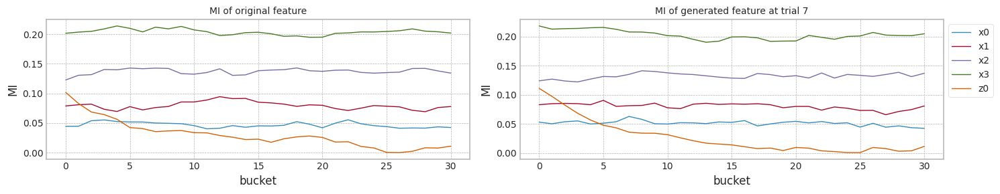

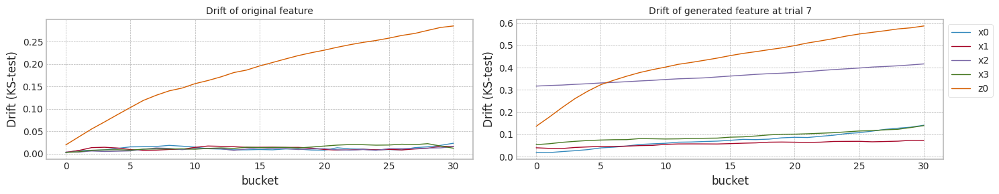

@ Normal model


,Trial,Testset F1,Initial F1,Mean F1,Last F1,Elapsed time
0,0.0,0.876447,0.874156,0.796925,0.731435,5.880518
1,1.0,0.877162,0.875152,0.794527,0.726733,5.685400
2,2.0,0.877387,0.875568,0.796229,0.728255,5.701584
3,3.0,0.876911,0.874931,0.792002,0.723297,5.653937
4,4.0,0.876736,0.874197,0.795422,0.728732,5.814389
5,5.0,0.876598,0.874281,0.796074,0.728989,5.695472
6,6.0,0.876721,0.874627,0.796302,0.728565,5.708827
7,7.0,0.877861,0.875580,0.796556,0.731794,5.843394
8,8.0,0.877822,0.875848,0.797355,0.731538,5.843842
9,9.0,0.877347,0.875234,0.795216,0.727756,5.716641


@ SEA


,Trial,Testset F1,Initial F1,Mean F1,Last F1,Elapsed time
0,0.0,0.876447,0.874156,0.824352,0.794597,8.134379
1,1.0,0.877162,0.875152,0.823132,0.791923,7.191818
2,2.0,0.877387,0.875568,0.824321,0.791804,9.154747
3,3.0,0.876911,0.874931,0.821112,0.787178,7.221994
4,4.0,0.876736,0.874197,0.824651,0.796950,7.823195
5,5.0,0.876598,0.874281,0.823607,0.792863,7.045159
6,6.0,0.876721,0.874627,0.822855,0.789847,6.630360
7,7.0,0.877861,0.875580,0.825708,0.797539,10.573281
8,8.0,0.877822,0.875848,0.827799,0.805160,7.825805
9,9.0,0.877347,0.875234,0.824390,0.795498,7.616768


@ AUE2


,Trial,Testset F1,Initial F1,Mean F1,Last F1,Elapsed time
0,0.0,0.876447,0.874156,0.835857,0.824266,7.736293
1,1.0,0.877162,0.875152,0.834315,0.820941,8.556885
2,2.0,0.877387,0.875568,0.834903,0.822195,6.877402
3,3.0,0.876911,0.874931,0.833214,0.819862,8.326994
4,4.0,0.876736,0.874197,0.834913,0.822915,8.274282
5,5.0,0.876598,0.874281,0.834732,0.822397,7.917526
6,6.0,0.876721,0.874627,0.834989,0.822361,10.679649
7,7.0,0.877861,0.875580,0.836214,0.825159,8.318751
8,8.0,0.877822,0.875848,0.836164,0.825419,7.093875
9,9.0,0.877347,0.875234,0.834613,0.822376,6.758145


@ DTEL


,Trial,Testset F1,Initial F1,Mean F1,Last F1,Elapsed time
0,0.0,0.876447,0.874156,0.843349,0.851050,11.463616
1,1.0,0.877162,0.875152,0.843702,0.851791,14.541146
2,2.0,0.877387,0.875568,0.842957,0.851078,11.341096
3,3.0,0.876911,0.874931,0.841214,0.848819,13.004931
4,4.0,0.876736,0.874197,0.843530,0.851836,12.604365
5,5.0,0.876598,0.874281,0.842854,0.851266,11.596789
6,6.0,0.876721,0.874627,0.843342,0.852128,12.507657
7,7.0,0.877861,0.875580,0.842879,0.849747,12.336576
8,8.0,0.877822,0.875848,0.843094,0.848096,12.261896
9,9.0,0.877347,0.875234,0.841788,0.848921,13.827516


@ G-CDTL


,Trial,Testset F1,Initial F1,Mean F1,Last F1,Elapsed time
0,0.0,0.879541,0.878119,0.798900,0.688243,5.714562
1,1.0,0.879055,0.878534,0.830912,0.781699,5.854859
2,2.0,0.879956,0.879478,0.849129,0.824911,5.866767
3,3.0,0.879727,0.878919,0.706317,0.392520,5.714106
4,4.0,0.876852,0.876867,0.816531,0.753726,5.722107
5,5.0,0.880097,0.879637,0.842863,0.828216,5.676357
6,6.0,0.879530,0.878909,0.831073,0.772097,5.858803
7,7.0,0.878845,0.878022,0.854545,0.847208,5.699513
8,8.0,0.879911,0.878700,0.845008,0.817447,5.744682
9,9.0,0.879400,0.878858,0.846014,0.819366,5.645750


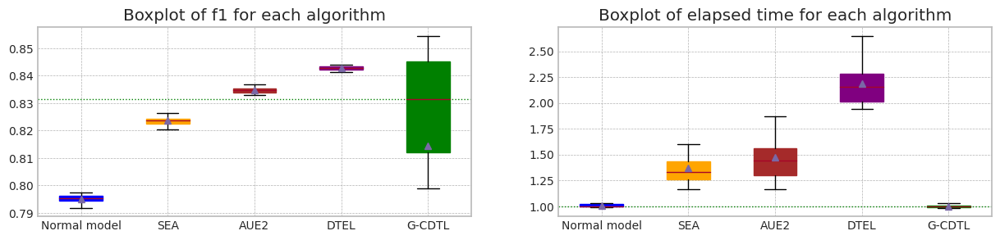

In [47]:
_,_,_,_,_,_ = drift_tolerant2(X1, Y1,train_size, test_size,avaible_range = 300,lambda_f2=0.8,trial_count=20,weight_init=True) #np.max(X1['b']+1))

## synthetic data의 생성 (Case #2 MI의 증감(상대적), Drift의 고정)

+ $P_t(y|X) \ne P_{t+w}(y|X)$ and $P_t(X) = P_{t+w}(X)$
+ Actual Drift
+ 즉, P(X)의 변화없이, Concept (본 Dataset에서 MI의 변화)만 변경


+ 5개의 feature
+ 각각 importance를 부여
+ 그 중, 1개의 feature에 대해 y의 비중이 시간에 따라 감소하도록 생성

### Dataset 준비

In [48]:
data_size = 40000
cor = np.asarray([1.5, 1.2, 0.9 , 0.7, 2.5])

In [49]:
seed_everything()

x1 = np.zeros((data_size,5))
for ix,cor_ in enumerate(cor):
    x1[:,ix] = np.random.normal(1,cor_,data_size)

In [50]:
x1.shape

(40000, 5)

In [51]:
import matplotlib.pyplot as plt

seed_everything()

y1_array = []
cor_const = cor[4]
for ii in range(x1.shape[0]):
    cor[4] = cor[4] - cor_const / x1.shape[0]
    e = np.random.normal(0.0, 2.0)
    y1_array.append(np.sum(cor * x1[ii])+e)

In [52]:
m = 5 #np.mean(y1_array[0:2000])
print(m)
y1 = [1 if y_ > m else 0 for y_ in y1_array]
print(sum(y1))

5
21325


### 실험

MI Analysis MI Max 0.22746, Min 0.00677, Mean 0.06988, Std 0.08433
Dataset structure X_train, (9000, 5) X_test, (9000, 5) X_live (39000, 5)
Truncate 8000 rows from live_set (39000, 5)
Search MI & Drift...for X_live_set (31, 9000, 5)


100%|██████████| 31/31 [00:05<00:00,  5.63it/s]


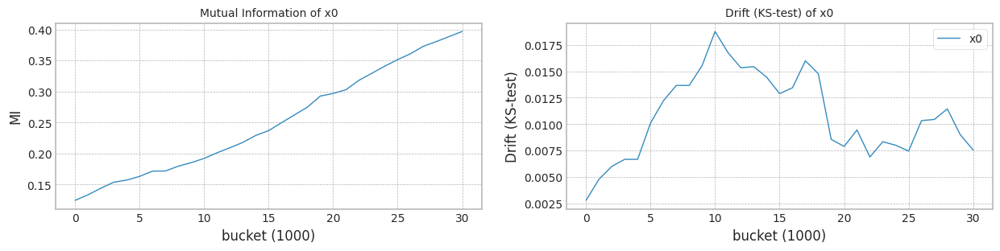

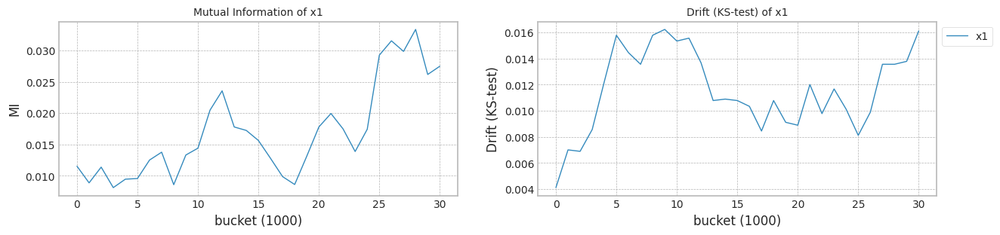

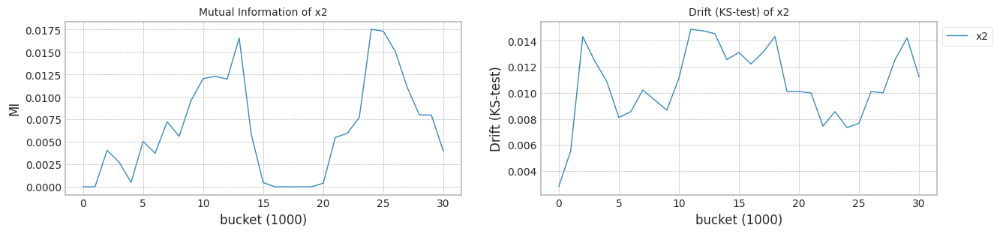

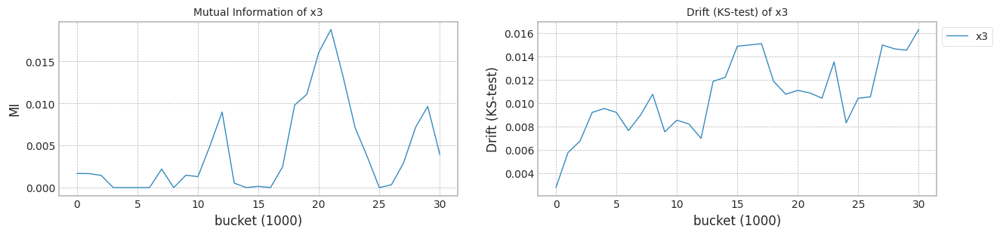

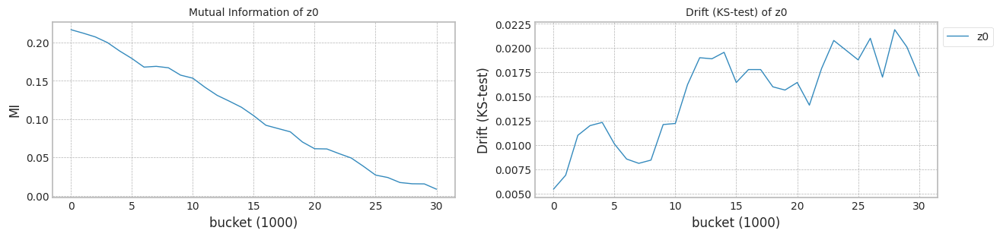

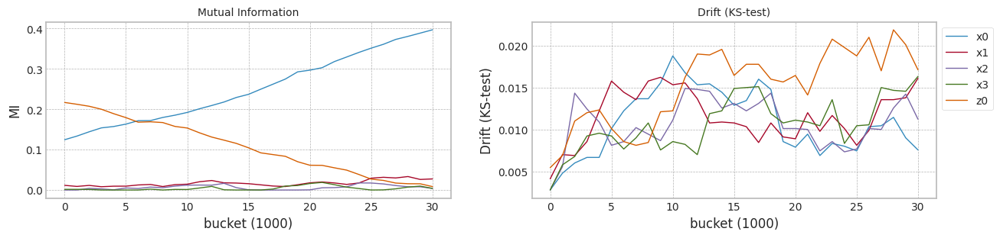

In [53]:
columns=['x0','x1','x2','x3','z0']
X1 = pd.DataFrame(x1,columns=columns)

train_size = 9000
test_size = 1000

X1,Y1 = check_mi_drift(X1, y1,train_size, test_size)
#model,df = train_classificaion_model(X1,Y1,train_size, test_size)

In [54]:
bucket_size = 1000
X1['b'] = [int(b/bucket_size) for b in X1.index.values]
X1

,x0,x1,x2,x3,z0,b
0,0.525799,0.497734,0.329063,0.549493,0.366139,0
1,0.610533,0.420412,0.508390,0.580336,0.662926,0
2,0.556874,0.464734,0.669603,0.724770,0.486574,0
3,0.344341,0.646524,0.340976,0.528780,0.611850,0
4,0.503142,0.550860,0.598773,0.465698,0.487044,0
...,...,...,...,...,...,...
39995,0.333622,0.399822,0.303105,0.605408,0.709407,39
39996,0.358451,0.483875,0.341855,0.574439,0.695384,39
39997,0.559469,0.343824,0.542547,0.575250,0.504288,39
39998,0.433692,0.530132,0.301231,0.282353,0.762158,39


trial_count: 20
lambda_f2 0.8
######################### Trial 0 for Normal model ###########################
cuda:0


100%|██████████| 2000/2000 [00:03<00:00, 625.82it/s]


Test f1 score: 0.9908970225677982
X_live.shape (39000, 6)
Truncate 8000 rows from live_set (39000, 6)
Search MI & Drift...for X_live_set torch.Size([31, 9000, 6])


100%|██████████| 31/31 [00:05<00:00,  5.52it/s]


mean of drift:
x0    0.010828
x1    0.011545
x2    0.010692
x3    0.010649
z0    0.015151
dtype: float64
Mean F1 for all data: 0.8988202553501561
######################### Trial 0 for Drift tolerant model ###########################
cuda:0


100%|██████████| 2000/2000 [00:08<00:00, 234.03it/s]


Test f1 score: 0.9975303951367782
X_live.shape (39000, 6)
Truncate 8000 rows from live_set (39000, 6)
Search MI & Drift...for X_live_set torch.Size([31, 9000, 6])


100%|██████████| 31/31 [00:05<00:00,  5.27it/s]


mean of drift:
x0    0.184570
x1    0.079240
x2    0.074961
x3    0.437559
z0    0.132986
dtype: float64
Mean F1 for all data: 0.9326536460891175
Normal model median        : 0.8988202553501561
Drift tolerant model median: 0.9326536460891175
######################### Trial 1 for Normal model ###########################
cuda:0


100%|██████████| 2000/2000 [00:03<00:00, 638.89it/s]


Test f1 score: 0.9908030719635916
X_live.shape (39000, 6)
Truncate 8000 rows from live_set (39000, 6)
Search MI & Drift...for X_live_set torch.Size([31, 9000, 6])


100%|██████████| 31/31 [00:05<00:00,  5.48it/s]


mean of drift:
x0    0.010828
x1    0.011545
x2    0.010692
x3    0.010649
z0    0.015151
dtype: float64
Mean F1 for all data: 0.8987669515565779
######################### Trial 1 for Drift tolerant model ###########################
cuda:0


100%|██████████| 2000/2000 [00:08<00:00, 235.62it/s]


Test f1 score: 0.9957228400342173
X_live.shape (39000, 6)
Truncate 8000 rows from live_set (39000, 6)
Search MI & Drift...for X_live_set torch.Size([31, 9000, 6])


100%|██████████| 31/31 [00:05<00:00,  5.41it/s]


mean of drift:
x0    0.172398
x1    0.101448
x2    0.069108
x3    0.424849
z0    0.165029
dtype: float64
Mean F1 for all data: 0.9260322565595408
Normal model median        : 0.898793603453367
Drift tolerant model median: 0.9293429513243292
######################### Trial 2 for Normal model ###########################
cuda:0


100%|██████████| 2000/2000 [00:03<00:00, 639.99it/s]


Test f1 score: 0.9908970225677982
X_live.shape (39000, 6)
Truncate 8000 rows from live_set (39000, 6)
Search MI & Drift...for X_live_set torch.Size([31, 9000, 6])


100%|██████████| 31/31 [00:05<00:00,  5.30it/s]


mean of drift:
x0    0.010828
x1    0.011545
x2    0.010692
x3    0.010649
z0    0.015151
dtype: float64
Mean F1 for all data: 0.8987136933622942
######################### Trial 2 for Drift tolerant model ###########################
cuda:0


100%|██████████| 2000/2000 [00:08<00:00, 230.76it/s]


Test f1 score: 0.9950664136622391
X_live.shape (39000, 6)
Truncate 8000 rows from live_set (39000, 6)
Search MI & Drift...for X_live_set torch.Size([31, 9000, 6])


100%|██████████| 31/31 [00:05<00:00,  5.40it/s]


mean of drift:
x0    0.322584
x1    0.074731
x2    0.042538
x3    0.352351
z0    0.169251
dtype: float64
Mean F1 for all data: 0.9081809175214292
Normal model median        : 0.8987669515565779
Drift tolerant model median: 0.9260322565595408
######################### Trial 3 for Normal model ###########################
cuda:0


100%|██████████| 2000/2000 [00:03<00:00, 632.80it/s]


Test f1 score: 0.9908987485779295
X_live.shape (39000, 6)
Truncate 8000 rows from live_set (39000, 6)
Search MI & Drift...for X_live_set torch.Size([31, 9000, 6])


100%|██████████| 31/31 [00:05<00:00,  5.48it/s]


mean of drift:
x0    0.010828
x1    0.011545
x2    0.010692
x3    0.010649
z0    0.015151
dtype: float64
Mean F1 for all data: 0.8988293142204133
######################### Trial 3 for Drift tolerant model ###########################
cuda:0


100%|██████████| 2000/2000 [00:08<00:00, 229.62it/s]


Test f1 score: 0.9971504559270516
X_live.shape (39000, 6)
Truncate 8000 rows from live_set (39000, 6)
Search MI & Drift...for X_live_set torch.Size([31, 9000, 6])


100%|██████████| 31/31 [00:05<00:00,  5.42it/s]


mean of drift:
x0    0.154703
x1    0.049330
x2    0.060939
x3    0.358362
z0    0.235000
dtype: float64
Mean F1 for all data: 0.9314613236114369
Normal model median        : 0.898793603453367
Drift tolerant model median: 0.9287467900854889
######################### Trial 4 for Normal model ###########################
cuda:0


100%|██████████| 2000/2000 [00:03<00:00, 637.95it/s]


Test f1 score: 0.9908970225677982
X_live.shape (39000, 6)
Truncate 8000 rows from live_set (39000, 6)
Search MI & Drift...for X_live_set torch.Size([31, 9000, 6])


100%|██████████| 31/31 [00:05<00:00,  5.49it/s]


mean of drift:
x0    0.010828
x1    0.011545
x2    0.010692
x3    0.010649
z0    0.015151
dtype: float64
Mean F1 for all data: 0.8987400615783205
######################### Trial 4 for Drift tolerant model ###########################
cuda:0


100%|██████████| 2000/2000 [00:08<00:00, 232.65it/s]


Test f1 score: 0.9963892056252375
X_live.shape (39000, 6)
Truncate 8000 rows from live_set (39000, 6)
Search MI & Drift...for X_live_set torch.Size([31, 9000, 6])


100%|██████████| 31/31 [00:05<00:00,  5.27it/s]


mean of drift:
x0    0.177570
x1    0.080609
x2    0.100771
x3    0.378358
z0    0.209082
dtype: float64
Mean F1 for all data: 0.9230727532186404
Normal model median        : 0.8987669515565779
Drift tolerant model median: 0.9260322565595408
######################### Trial 5 for Normal model ###########################
cuda:0


100%|██████████| 2000/2000 [00:03<00:00, 636.98it/s]


Test f1 score: 0.9908970225677982
X_live.shape (39000, 6)
Truncate 8000 rows from live_set (39000, 6)
Search MI & Drift...for X_live_set torch.Size([31, 9000, 6])


100%|██████████| 31/31 [00:06<00:00,  5.16it/s]


mean of drift:
x0    0.010828
x1    0.011545
x2    0.010692
x3    0.010649
z0    0.015151
dtype: float64
Mean F1 for all data: 0.8987994818561682
######################### Trial 5 for Drift tolerant model ###########################
cuda:0


100%|██████████| 2000/2000 [00:08<00:00, 233.40it/s]


Test f1 score: 0.998099220680479
X_live.shape (39000, 6)
Truncate 8000 rows from live_set (39000, 6)
Search MI & Drift...for X_live_set torch.Size([31, 9000, 6])


100%|██████████| 31/31 [00:05<00:00,  5.31it/s]


mean of drift:
x0    0.198857
x1    0.081133
x2    0.055495
x3    0.348706
z0    0.319968
dtype: float64
Mean F1 for all data: 0.9366528169563088
Normal model median        : 0.8987832167063731
Drift tolerant model median: 0.9287467900854889
######################### Trial 6 for Normal model ###########################
cuda:0


100%|██████████| 2000/2000 [00:03<00:00, 622.75it/s]


Test f1 score: 0.9908013276434329
X_live.shape (39000, 6)
Truncate 8000 rows from live_set (39000, 6)
Search MI & Drift...for X_live_set torch.Size([31, 9000, 6])


100%|██████████| 31/31 [00:05<00:00,  5.46it/s]


mean of drift:
x0    0.010828
x1    0.011545
x2    0.010692
x3    0.010649
z0    0.015151
dtype: float64
Mean F1 for all data: 0.8988878245106668
######################### Trial 6 for Drift tolerant model ###########################
cuda:0


100%|██████████| 2000/2000 [00:08<00:00, 231.73it/s]


Test f1 score: 0.9966808914177335
X_live.shape (39000, 6)
Truncate 8000 rows from live_set (39000, 6)
Search MI & Drift...for X_live_set torch.Size([31, 9000, 6])


100%|██████████| 31/31 [00:05<00:00,  5.43it/s]


mean of drift:
x0    0.195032
x1    0.068993
x2    0.057857
x3    0.380892
z0    0.161401
dtype: float64
Mean F1 for all data: 0.9261720121774476
Normal model median        : 0.8987994818561682
Drift tolerant model median: 0.9261720121774476
######################### Trial 7 for Normal model ###########################
cuda:0


100%|██████████| 2000/2000 [00:03<00:00, 639.04it/s]


Test f1 score: 0.9908013276434329
X_live.shape (39000, 6)
Truncate 8000 rows from live_set (39000, 6)
Search MI & Drift...for X_live_set torch.Size([31, 9000, 6])


100%|██████████| 31/31 [00:05<00:00,  5.44it/s]


mean of drift:
x0    0.010828
x1    0.011545
x2    0.010692
x3    0.010649
z0    0.015151
dtype: float64
Mean F1 for all data: 0.8988213007984267
######################### Trial 7 for Drift tolerant model ###########################
cuda:0


100%|██████████| 2000/2000 [00:08<00:00, 231.34it/s]


Test f1 score: 0.9970546318289786
X_live.shape (39000, 6)
Truncate 8000 rows from live_set (39000, 6)
Search MI & Drift...for X_live_set torch.Size([31, 9000, 6])


100%|██████████| 31/31 [00:05<00:00,  5.42it/s]


mean of drift:
x0    0.151430
x1    0.092240
x2    0.332459
x3    0.029513
z0    0.219466
dtype: float64
Mean F1 for all data: 0.9326060267494971
Normal model median        : 0.8988098686031621
Drift tolerant model median: 0.9288166678944423
######################### Trial 8 for Normal model ###########################
cuda:0


100%|██████████| 2000/2000 [00:03<00:00, 639.25it/s]


Test f1 score: 0.9898779680257307
X_live.shape (39000, 6)
Truncate 8000 rows from live_set (39000, 6)
Search MI & Drift...for X_live_set torch.Size([31, 9000, 6])


100%|██████████| 31/31 [00:05<00:00,  5.45it/s]


mean of drift:
x0    0.010828
x1    0.011545
x2    0.010692
x3    0.010649
z0    0.015151
dtype: float64
Mean F1 for all data: 0.8984292366580808
######################### Trial 8 for Drift tolerant model ###########################
cuda:0


100%|██████████| 2000/2000 [00:08<00:00, 236.11it/s]


Test f1 score: 0.996290307238657
X_live.shape (39000, 6)
Truncate 8000 rows from live_set (39000, 6)
Search MI & Drift...for X_live_set torch.Size([31, 9000, 6])


100%|██████████| 31/31 [00:05<00:00,  5.41it/s]


mean of drift:
x0    0.060781
x1    0.125491
x2    0.075448
x3    0.058373
z0    0.281742
dtype: float64
Mean F1 for all data: 0.905941975223552
Normal model median        : 0.8987994818561682
Drift tolerant model median: 0.9261720121774476
######################### Trial 9 for Normal model ###########################
cuda:0


100%|██████████| 2000/2000 [00:03<00:00, 643.15it/s]


Test f1 score: 0.9909926993457855
X_live.shape (39000, 6)
Truncate 8000 rows from live_set (39000, 6)
Search MI & Drift...for X_live_set torch.Size([31, 9000, 6])


100%|██████████| 31/31 [00:05<00:00,  5.46it/s]


mean of drift:
x0    0.010828
x1    0.011545
x2    0.010692
x3    0.010649
z0    0.015151
dtype: float64
Mean F1 for all data: 0.8988327463650373
######################### Trial 9 for Drift tolerant model ###########################
cuda:0


100%|██████████| 2000/2000 [00:08<00:00, 234.68it/s]


Test f1 score: 0.99791192103265
X_live.shape (39000, 6)
Truncate 8000 rows from live_set (39000, 6)
Search MI & Drift...for X_live_set torch.Size([31, 9000, 6])


100%|██████████| 31/31 [00:05<00:00,  5.46it/s]


mean of drift:
x0    0.155964
x1    0.062728
x2    0.063989
x3    0.400305
z0    0.091376
dtype: float64
Mean F1 for all data: 0.9437717786822639
Normal model median        : 0.8988098686031621
Drift tolerant model median: 0.9288166678944423
######################### Trial 10 for Normal model ###########################
cuda:0


100%|██████████| 2000/2000 [00:03<00:00, 610.35it/s]


Test f1 score: 0.9908970225677982
X_live.shape (39000, 6)
Truncate 8000 rows from live_set (39000, 6)
Search MI & Drift...for X_live_set torch.Size([31, 9000, 6])


100%|██████████| 31/31 [00:05<00:00,  5.32it/s]


mean of drift:
x0    0.010828
x1    0.011545
x2    0.010692
x3    0.010649
z0    0.015151
dtype: float64
Mean F1 for all data: 0.8986968736271247
######################### Trial 10 for Drift tolerant model ###########################
cuda:0


100%|██████████| 2000/2000 [00:08<00:00, 233.19it/s]


Test f1 score: 0.9970607755759932
X_live.shape (39000, 6)
Truncate 8000 rows from live_set (39000, 6)
Search MI & Drift...for X_live_set torch.Size([31, 9000, 6])


100%|██████████| 31/31 [00:05<00:00,  5.39it/s]


mean of drift:
x0    0.137509
x1    0.069505
x2    0.047025
x3    0.447168
z0    0.123588
dtype: float64
Mean F1 for all data: 0.9317197544345294
Normal model median        : 0.8987994818561682
Drift tolerant model median: 0.9314613236114369
######################### Trial 11 for Normal model ###########################
cuda:0


100%|██████████| 2000/2000 [00:03<00:00, 644.43it/s]


Test f1 score: 0.9908970225677982
X_live.shape (39000, 6)
Truncate 8000 rows from live_set (39000, 6)
Search MI & Drift...for X_live_set torch.Size([31, 9000, 6])


100%|██████████| 31/31 [00:05<00:00,  5.25it/s]


mean of drift:
x0    0.010828
x1    0.011545
x2    0.010692
x3    0.010649
z0    0.015151
dtype: float64
Mean F1 for all data: 0.8990234238511553
######################### Trial 11 for Drift tolerant model ###########################
cuda:0


100%|██████████| 2000/2000 [00:08<00:00, 234.26it/s]


Test f1 score: 0.9978130645621375
X_live.shape (39000, 6)
Truncate 8000 rows from live_set (39000, 6)
Search MI & Drift...for X_live_set torch.Size([31, 9000, 6])


100%|██████████| 31/31 [00:05<00:00,  5.48it/s]


mean of drift:
x0    0.182276
x1    0.055358
x2    0.316520
x3    0.306054
z0    0.157423
dtype: float64
Mean F1 for all data: 0.9355921412286886
Normal model median        : 0.8988098686031621
Drift tolerant model median: 0.931590539022983
######################### Trial 12 for Normal model ###########################
cuda:0


100%|██████████| 2000/2000 [00:03<00:00, 641.50it/s]


Test f1 score: 0.9906116642958748
X_live.shape (39000, 6)
Truncate 8000 rows from live_set (39000, 6)
Search MI & Drift...for X_live_set torch.Size([31, 9000, 6])


100%|██████████| 31/31 [00:05<00:00,  5.42it/s]


mean of drift:
x0    0.010828
x1    0.011545
x2    0.010692
x3    0.010649
z0    0.015151
dtype: float64
Mean F1 for all data: 0.8986668611037882
######################### Trial 12 for Drift tolerant model ###########################
cuda:0


100%|██████████| 2000/2000 [00:08<00:00, 229.46it/s]


Test f1 score: 0.9954355268162799
X_live.shape (39000, 6)
Truncate 8000 rows from live_set (39000, 6)
Search MI & Drift...for X_live_set torch.Size([31, 9000, 6])


100%|██████████| 31/31 [00:05<00:00,  5.44it/s]


mean of drift:
x0    0.208505
x1    0.057968
x2    0.242692
x3    0.279315
z0    0.169011
dtype: float64
Mean F1 for all data: 0.9126924773647105
Normal model median        : 0.8987994818561682
Drift tolerant model median: 0.9314613236114369
######################### Trial 13 for Normal model ###########################
cuda:0


100%|██████████| 2000/2000 [00:03<00:00, 631.32it/s]


Test f1 score: 0.9908970225677982
X_live.shape (39000, 6)
Truncate 8000 rows from live_set (39000, 6)
Search MI & Drift...for X_live_set torch.Size([31, 9000, 6])


100%|██████████| 31/31 [00:05<00:00,  5.51it/s]


mean of drift:
x0    0.010828
x1    0.011545
x2    0.010692
x3    0.010649
z0    0.015151
dtype: float64
Mean F1 for all data: 0.8987932696808562
######################### Trial 13 for Drift tolerant model ###########################
cuda:0


100%|██████████| 2000/2000 [00:08<00:00, 235.68it/s]


Test f1 score: 0.9978130645621375
X_live.shape (39000, 6)
Truncate 8000 rows from live_set (39000, 6)
Search MI & Drift...for X_live_set torch.Size([31, 9000, 6])


100%|██████████| 31/31 [00:05<00:00,  5.43it/s]


mean of drift:
x0    0.122140
x1    0.056147
x2    0.261297
x3    0.291301
z0    0.258527
dtype: float64
Mean F1 for all data: 0.9179151743242542
Normal model median        : 0.8987963757685122
Drift tolerant model median: 0.9288166678944423
######################### Trial 14 for Normal model ###########################
cuda:0


100%|██████████| 2000/2000 [00:03<00:00, 617.10it/s]


Test f1 score: 0.9908013276434329
X_live.shape (39000, 6)
Truncate 8000 rows from live_set (39000, 6)
Search MI & Drift...for X_live_set torch.Size([31, 9000, 6])


100%|██████████| 31/31 [00:05<00:00,  5.49it/s]


mean of drift:
x0    0.010828
x1    0.011545
x2    0.010692
x3    0.010649
z0    0.015151
dtype: float64
Mean F1 for all data: 0.8988501887807624
######################### Trial 14 for Drift tolerant model ###########################
cuda:0


100%|██████████| 2000/2000 [00:08<00:00, 239.05it/s]


Test f1 score: 0.9969616407140145
X_live.shape (39000, 6)
Truncate 8000 rows from live_set (39000, 6)
Search MI & Drift...for X_live_set torch.Size([31, 9000, 6])


100%|██████████| 31/31 [00:05<00:00,  5.46it/s]


mean of drift:
x0    0.147996
x1    0.064563
x2    0.047892
x3    0.379229
z0    0.100950
dtype: float64
Mean F1 for all data: 0.9167491928983715
Normal model median        : 0.8987994818561682
Drift tolerant model median: 0.9261720121774476
######################### Trial 15 for Normal model ###########################
cuda:0


100%|██████████| 2000/2000 [00:03<00:00, 629.95it/s]


Test f1 score: 0.9907073772046273
X_live.shape (39000, 6)
Truncate 8000 rows from live_set (39000, 6)
Search MI & Drift...for X_live_set torch.Size([31, 9000, 6])


100%|██████████| 31/31 [00:05<00:00,  5.29it/s]


mean of drift:
x0    0.010828
x1    0.011545
x2    0.010692
x3    0.010649
z0    0.015151
dtype: float64
Mean F1 for all data: 0.8987216888544928
######################### Trial 15 for Drift tolerant model ###########################
cuda:0


100%|██████████| 2000/2000 [00:08<00:00, 234.80it/s]


Test f1 score: 0.996675847658847
X_live.shape (39000, 6)
Truncate 8000 rows from live_set (39000, 6)
Search MI & Drift...for X_live_set torch.Size([31, 9000, 6])


100%|██████████| 31/31 [00:05<00:00,  5.41it/s]


mean of drift:
x0    0.152832
x1    0.083771
x2    0.284151
x3    0.223799
z0    0.232914
dtype: float64
Mean F1 for all data: 0.9037810909565557
Normal model median        : 0.8987963757685122
Drift tolerant model median: 0.9261021343684942
######################### Trial 16 for Normal model ###########################
cuda:0


100%|██████████| 2000/2000 [00:03<00:00, 615.38it/s]


Test f1 score: 0.9908013276434329
X_live.shape (39000, 6)
Truncate 8000 rows from live_set (39000, 6)
Search MI & Drift...for X_live_set torch.Size([31, 9000, 6])


100%|██████████| 31/31 [00:05<00:00,  5.25it/s]


mean of drift:
x0    0.010828
x1    0.011545
x2    0.010692
x3    0.010649
z0    0.015151
dtype: float64
Mean F1 for all data: 0.8988491572169574
######################### Trial 16 for Drift tolerant model ###########################
cuda:0


100%|██████████| 2000/2000 [00:08<00:00, 230.43it/s]


Test f1 score: 0.9976233482270177
X_live.shape (39000, 6)
Truncate 8000 rows from live_set (39000, 6)
Search MI & Drift...for X_live_set torch.Size([31, 9000, 6])


100%|██████████| 31/31 [00:05<00:00,  5.46it/s]


mean of drift:
x0    0.146301
x1    0.069341
x2    0.071498
x3    0.394437
z0    0.157674
dtype: float64
Mean F1 for all data: 0.9316836390059334
Normal model median        : 0.8987994818561682
Drift tolerant model median: 0.9261720121774476
######################### Trial 17 for Normal model ###########################
cuda:0


100%|██████████| 2000/2000 [00:03<00:00, 623.13it/s]


Test f1 score: 0.9908013276434329
X_live.shape (39000, 6)
Truncate 8000 rows from live_set (39000, 6)
Search MI & Drift...for X_live_set torch.Size([31, 9000, 6])


100%|██████████| 31/31 [00:05<00:00,  5.50it/s]


mean of drift:
x0    0.010828
x1    0.011545
x2    0.010692
x3    0.010649
z0    0.015151
dtype: float64
Mean F1 for all data: 0.8989191991438977
######################### Trial 17 for Drift tolerant model ###########################
cuda:0


100%|██████████| 2000/2000 [00:08<00:00, 235.41it/s]


Test f1 score: 0.9958317544524441
X_live.shape (39000, 6)
Truncate 8000 rows from live_set (39000, 6)
Search MI & Drift...for X_live_set torch.Size([31, 9000, 6])


100%|██████████| 31/31 [00:05<00:00,  5.33it/s]


mean of drift:
x0    0.159903
x1    0.058889
x2    0.039674
x3    0.411688
z0    0.214771
dtype: float64
Mean F1 for all data: 0.9333929832247382
Normal model median        : 0.8988098686031621
Drift tolerant model median: 0.9288166678944423
######################### Trial 18 for Normal model ###########################
cuda:0


100%|██████████| 2000/2000 [00:03<00:00, 635.45it/s]


Test f1 score: 0.9908987485779295
X_live.shape (39000, 6)
Truncate 8000 rows from live_set (39000, 6)
Search MI & Drift...for X_live_set torch.Size([31, 9000, 6])


100%|██████████| 31/31 [00:05<00:00,  5.51it/s]


mean of drift:
x0    0.010828
x1    0.011545
x2    0.010692
x3    0.010649
z0    0.015151
dtype: float64
Mean F1 for all data: 0.898862317782457
######################### Trial 18 for Drift tolerant model ###########################
cuda:0


100%|██████████| 2000/2000 [00:08<00:00, 238.06it/s]


Test f1 score: 0.9971504559270516
X_live.shape (39000, 6)
Truncate 8000 rows from live_set (39000, 6)
Search MI & Drift...for X_live_set torch.Size([31, 9000, 6])


100%|██████████| 31/31 [00:05<00:00,  5.44it/s]


mean of drift:
x0    0.135642
x1    0.066337
x2    0.287011
x3    0.027659
z0    0.251602
dtype: float64
Mean F1 for all data: 0.9285830219702613
Normal model median        : 0.8988202553501561
Drift tolerant model median: 0.9285830219702613
######################### Trial 19 for Normal model ###########################
cuda:0


100%|██████████| 2000/2000 [00:03<00:00, 637.93it/s]


Test f1 score: 0.9904383224462748
X_live.shape (39000, 6)
Truncate 8000 rows from live_set (39000, 6)
Search MI & Drift...for X_live_set torch.Size([31, 9000, 6])


100%|██████████| 31/31 [00:05<00:00,  5.43it/s]


mean of drift:
x0    0.010828
x1    0.011545
x2    0.010692
x3    0.010649
z0    0.015151
dtype: float64
Mean F1 for all data: 0.8988165407168062
######################### Trial 19 for Drift tolerant model ###########################
cuda:0


100%|██████████| 2000/2000 [00:08<00:00, 235.18it/s]


Test f1 score: 0.9965727341964964
X_live.shape (39000, 6)
Truncate 8000 rows from live_set (39000, 6)
Search MI & Drift...for X_live_set torch.Size([31, 9000, 6])


100%|██████████| 31/31 [00:05<00:00,  5.45it/s]


mean of drift:
x0    0.183806
x1    0.057699
x2    0.048677
x3    0.372108
z0    0.208935
dtype: float64
Mean F1 for all data: 0.9209967496695103
Normal model median        : 0.8988183980334812
Drift tolerant model median: 0.9273775170738545
######################### Trial 0 for Normal model ###########################
retrain_interval: 16
######################### Trial 0 for SEA ###########################
X_live.shape (39000, 6)
Truncate 8000 rows from live_set (39000, 6)
Search MI & Drift...for X_live_set torch.Size([31, 9000, 6])


100%|██████████| 31/31 [00:10<00:00,  2.96it/s]


Early stop at  nan
Mean of drift:
x0    0.010828
x1    0.011545
x2    0.010692
x3    0.010649
z0    0.015151
dtype: float64
Mean F1 for all data: 0.9252397656276828
SEA median: 0.9252397656276828
######################### Trial 0 for AUE ###########################
X_live.shape (39000, 6)
Truncate 8000 rows from live_set (39000, 6)
Search MI & Drift...for X_live_set torch.Size([31, 9000, 6])


100%|██████████| 31/31 [00:08<00:00,  3.52it/s]


Early stop at  2414.0
Mean of drift:
x0    0.010828
x1    0.011545
x2    0.010692
x3    0.010649
z0    0.015151
dtype: float64
Mean F1 for all data: 0.939868994357555
AUE median: 0.939868994357555
######################### Trial 0 for DTEL ###########################
X_live.shape (39000, 6)
Truncate 8000 rows from live_set (39000, 6)
Search MI & Drift...for X_live_set torch.Size([31, 9000, 6])


100%|██████████| 31/31 [00:15<00:00,  2.03it/s]


Early stop at  nan
Mean of drift:
x0    0.010828
x1    0.011545
x2    0.010692
x3    0.010649
z0    0.015151
dtype: float64
Mean F1 for all data: 0.9513784905287072
DTEL median: 0.9513784905287072
######################### Trial 1 for Normal model ###########################
retrain_interval: 16
######################### Trial 1 for SEA ###########################
X_live.shape (39000, 6)
Truncate 8000 rows from live_set (39000, 6)
Search MI & Drift...for X_live_set torch.Size([31, 9000, 6])


100%|██████████| 31/31 [00:09<00:00,  3.11it/s]


Early stop at  3307.0
Mean of drift:
x0    0.010828
x1    0.011545
x2    0.010692
x3    0.010649
z0    0.015151
dtype: float64
Mean F1 for all data: 0.9404942807073582
SEA median: 0.9328670231675205
######################### Trial 1 for AUE ###########################
X_live.shape (39000, 6)
Truncate 8000 rows from live_set (39000, 6)
Search MI & Drift...for X_live_set torch.Size([31, 9000, 6])


100%|██████████| 31/31 [00:09<00:00,  3.18it/s]


Early stop at  3368.0
Mean of drift:
x0    0.010828
x1    0.011545
x2    0.010692
x3    0.010649
z0    0.015151
dtype: float64
Mean F1 for all data: 0.9394973096758861
AUE median: 0.9396831520167206
######################### Trial 1 for DTEL ###########################
X_live.shape (39000, 6)
Truncate 8000 rows from live_set (39000, 6)
Search MI & Drift...for X_live_set torch.Size([31, 9000, 6])


100%|██████████| 31/31 [00:15<00:00,  1.99it/s]


Early stop at  nan
Mean of drift:
x0    0.010828
x1    0.011545
x2    0.010692
x3    0.010649
z0    0.015151
dtype: float64
Mean F1 for all data: 0.9515083882426643
DTEL median: 0.9514434393856857
######################### Trial 2 for Normal model ###########################
retrain_interval: 16
######################### Trial 2 for SEA ###########################
X_live.shape (39000, 6)
Truncate 8000 rows from live_set (39000, 6)
Search MI & Drift...for X_live_set torch.Size([31, 9000, 6])


100%|██████████| 31/31 [00:10<00:00,  2.87it/s]


Early stop at  nan
Mean of drift:
x0    0.010828
x1    0.011545
x2    0.010692
x3    0.010649
z0    0.015151
dtype: float64
Mean F1 for all data: 0.9254327627126568
SEA median: 0.9254327627126568
######################### Trial 2 for AUE ###########################
X_live.shape (39000, 6)
Truncate 8000 rows from live_set (39000, 6)
Search MI & Drift...for X_live_set torch.Size([31, 9000, 6])


100%|██████████| 31/31 [00:09<00:00,  3.15it/s]


Early stop at  3440.0
Mean of drift:
x0    0.010828
x1    0.011545
x2    0.010692
x3    0.010649
z0    0.015151
dtype: float64
Mean F1 for all data: 0.9396593017759306
AUE median: 0.9396593017759306
######################### Trial 2 for DTEL ###########################
X_live.shape (39000, 6)
Truncate 8000 rows from live_set (39000, 6)
Search MI & Drift...for X_live_set torch.Size([31, 9000, 6])


100%|██████████| 31/31 [00:15<00:00,  2.02it/s]


Early stop at  3807.0
Mean of drift:
x0    0.010828
x1    0.011545
x2    0.010692
x3    0.010649
z0    0.015151
dtype: float64
Mean F1 for all data: 0.9509171763579615
DTEL median: 0.9513784905287072
######################### Trial 3 for Normal model ###########################
retrain_interval: 16
######################### Trial 3 for SEA ###########################
X_live.shape (39000, 6)
Truncate 8000 rows from live_set (39000, 6)
Search MI & Drift...for X_live_set torch.Size([31, 9000, 6])


100%|██████████| 31/31 [00:10<00:00,  3.10it/s]


Early stop at  3552.0
Mean of drift:
x0    0.010828
x1    0.011545
x2    0.010692
x3    0.010649
z0    0.015151
dtype: float64
Mean F1 for all data: 0.936370618305238
SEA median: 0.9309016905089474
######################### Trial 3 for AUE ###########################
X_live.shape (39000, 6)
Truncate 8000 rows from live_set (39000, 6)
Search MI & Drift...for X_live_set torch.Size([31, 9000, 6])


100%|██████████| 31/31 [00:09<00:00,  3.30it/s]


Early stop at  3015.0
Mean of drift:
x0    0.010828
x1    0.011545
x2    0.010692
x3    0.010649
z0    0.015151
dtype: float64
Mean F1 for all data: 0.939724438834846
AUE median: 0.9396918703053883
######################### Trial 3 for DTEL ###########################
X_live.shape (39000, 6)
Truncate 8000 rows from live_set (39000, 6)
Search MI & Drift...for X_live_set torch.Size([31, 9000, 6])


100%|██████████| 31/31 [00:14<00:00,  2.11it/s]


Early stop at  3400.0
Mean of drift:
x0    0.010828
x1    0.011545
x2    0.010692
x3    0.010649
z0    0.015151
dtype: float64
Mean F1 for all data: 0.9513428829660753
DTEL median: 0.9513606867473912
######################### Trial 4 for Normal model ###########################
retrain_interval: 16
######################### Trial 4 for SEA ###########################
X_live.shape (39000, 6)
Truncate 8000 rows from live_set (39000, 6)
Search MI & Drift...for X_live_set torch.Size([31, 9000, 6])


100%|██████████| 31/31 [00:10<00:00,  2.91it/s]


Early stop at  nan
Mean of drift:
x0    0.010828
x1    0.011545
x2    0.010692
x3    0.010649
z0    0.015151
dtype: float64
Mean F1 for all data: 0.9385641354181636
SEA median: 0.936370618305238
######################### Trial 4 for AUE ###########################
X_live.shape (39000, 6)
Truncate 8000 rows from live_set (39000, 6)
Search MI & Drift...for X_live_set torch.Size([31, 9000, 6])


100%|██████████| 31/31 [00:10<00:00,  3.02it/s]


Early stop at  3698.0
Mean of drift:
x0    0.010828
x1    0.011545
x2    0.010692
x3    0.010649
z0    0.015151
dtype: float64
Mean F1 for all data: 0.9398092410269299
AUE median: 0.939724438834846
######################### Trial 4 for DTEL ###########################
X_live.shape (39000, 6)
Truncate 8000 rows from live_set (39000, 6)
Search MI & Drift...for X_live_set torch.Size([31, 9000, 6])


100%|██████████| 31/31 [00:13<00:00,  2.27it/s]


Early stop at  2668.0
Mean of drift:
x0    0.010828
x1    0.011545
x2    0.010692
x3    0.010649
z0    0.015151
dtype: float64
Mean F1 for all data: 0.9512500009986373
DTEL median: 0.9513428829660753
######################### Trial 5 for Normal model ###########################
retrain_interval: 16
######################### Trial 5 for SEA ###########################
X_live.shape (39000, 6)
Truncate 8000 rows from live_set (39000, 6)
Search MI & Drift...for X_live_set torch.Size([31, 9000, 6])


100%|██████████| 31/31 [00:10<00:00,  2.97it/s]


Early stop at  3770.0
Mean of drift:
x0    0.010828
x1    0.011545
x2    0.010692
x3    0.010649
z0    0.015151
dtype: float64
Mean F1 for all data: 0.9368401515513888
SEA median: 0.9366053849283134
######################### Trial 5 for AUE ###########################
X_live.shape (39000, 6)
Truncate 8000 rows from live_set (39000, 6)
Search MI & Drift...for X_live_set torch.Size([31, 9000, 6])


100%|██████████| 31/31 [00:10<00:00,  2.85it/s]


Early stop at  nan
Mean of drift:
x0    0.010828
x1    0.011545
x2    0.010692
x3    0.010649
z0    0.015151
dtype: float64
Mean F1 for all data: 0.9399677483135356
AUE median: 0.9397668399308879
######################### Trial 5 for DTEL ###########################
X_live.shape (39000, 6)
Truncate 8000 rows from live_set (39000, 6)
Search MI & Drift...for X_live_set torch.Size([31, 9000, 6])


100%|██████████| 31/31 [00:15<00:00,  2.00it/s]


Early stop at  nan
Mean of drift:
x0    0.010828
x1    0.011545
x2    0.010692
x3    0.010649
z0    0.015151
dtype: float64
Mean F1 for all data: 0.9515437585296943
DTEL median: 0.9513606867473912
######################### Trial 6 for Normal model ###########################
retrain_interval: 16
######################### Trial 6 for SEA ###########################
X_live.shape (39000, 6)
Truncate 8000 rows from live_set (39000, 6)
Search MI & Drift...for X_live_set torch.Size([31, 9000, 6])


100%|██████████| 31/31 [00:09<00:00,  3.11it/s]


Early stop at  3455.0
Mean of drift:
x0    0.010828
x1    0.011545
x2    0.010692
x3    0.010649
z0    0.015151
dtype: float64
Mean F1 for all data: 0.9220099663002768
SEA median: 0.936370618305238
######################### Trial 6 for AUE ###########################
X_live.shape (39000, 6)
Truncate 8000 rows from live_set (39000, 6)
Search MI & Drift...for X_live_set torch.Size([31, 9000, 6])


100%|██████████| 31/31 [00:10<00:00,  2.91it/s]


Early stop at  nan
Mean of drift:
x0    0.010828
x1    0.011545
x2    0.010692
x3    0.010649
z0    0.015151
dtype: float64
Mean F1 for all data: 0.9401071823554149
AUE median: 0.9398092410269299
######################### Trial 6 for DTEL ###########################
X_live.shape (39000, 6)
Truncate 8000 rows from live_set (39000, 6)
Search MI & Drift...for X_live_set torch.Size([31, 9000, 6])


100%|██████████| 31/31 [00:15<00:00,  2.04it/s]


Early stop at  nan
Mean of drift:
x0    0.010828
x1    0.011545
x2    0.010692
x3    0.010649
z0    0.015151
dtype: float64
Mean F1 for all data: 0.9515237574047232
DTEL median: 0.9513784905287072
######################### Trial 7 for Normal model ###########################
retrain_interval: 16
######################### Trial 7 for SEA ###########################
X_live.shape (39000, 6)
Truncate 8000 rows from live_set (39000, 6)
Search MI & Drift...for X_live_set torch.Size([31, 9000, 6])


100%|██████████| 31/31 [00:10<00:00,  2.89it/s]


Early stop at  nan
Mean of drift:
x0    0.010828
x1    0.011545
x2    0.010692
x3    0.010649
z0    0.015151
dtype: float64
Mean F1 for all data: 0.9251035894971043
SEA median: 0.9309016905089474
######################### Trial 7 for AUE ###########################
X_live.shape (39000, 6)
Truncate 8000 rows from live_set (39000, 6)
Search MI & Drift...for X_live_set torch.Size([31, 9000, 6])


100%|██████████| 31/31 [00:10<00:00,  2.97it/s]


Early stop at  nan
Mean of drift:
x0    0.010828
x1    0.011545
x2    0.010692
x3    0.010649
z0    0.015151
dtype: float64
Mean F1 for all data: 0.9395427743256006
AUE median: 0.9397668399308879
######################### Trial 7 for DTEL ###########################
X_live.shape (39000, 6)
Truncate 8000 rows from live_set (39000, 6)
Search MI & Drift...for X_live_set torch.Size([31, 9000, 6])


100%|██████████| 31/31 [00:15<00:00,  1.97it/s]


Early stop at  nan
Mean of drift:
x0    0.010828
x1    0.011545
x2    0.010692
x3    0.010649
z0    0.015151
dtype: float64
Mean F1 for all data: 0.9516092289253483
DTEL median: 0.9514434393856857
######################### Trial 8 for Normal model ###########################
retrain_interval: 16
######################### Trial 8 for SEA ###########################
X_live.shape (39000, 6)
Truncate 8000 rows from live_set (39000, 6)
Search MI & Drift...for X_live_set torch.Size([31, 9000, 6])


100%|██████████| 31/31 [00:10<00:00,  2.90it/s]


Early stop at  nan
Mean of drift:
x0    0.010828
x1    0.011545
x2    0.010692
x3    0.010649
z0    0.015151
dtype: float64
Mean F1 for all data: 0.9403994921637767
SEA median: 0.936370618305238
######################### Trial 8 for AUE ###########################
X_live.shape (39000, 6)
Truncate 8000 rows from live_set (39000, 6)
Search MI & Drift...for X_live_set torch.Size([31, 9000, 6])


100%|██████████| 31/31 [00:09<00:00,  3.16it/s]


Early stop at  3434.0
Mean of drift:
x0    0.010828
x1    0.011545
x2    0.010692
x3    0.010649
z0    0.015151
dtype: float64
Mean F1 for all data: 0.9397556651702742
AUE median: 0.9397556651702742
######################### Trial 8 for DTEL ###########################
X_live.shape (39000, 6)
Truncate 8000 rows from live_set (39000, 6)
Search MI & Drift...for X_live_set torch.Size([31, 9000, 6])


100%|██████████| 31/31 [00:15<00:00,  2.00it/s]


Early stop at  nan
Mean of drift:
x0    0.010828
x1    0.011545
x2    0.010692
x3    0.010649
z0    0.015151
dtype: float64
Mean F1 for all data: 0.9511729609794953
DTEL median: 0.9513784905287072
######################### Trial 9 for Normal model ###########################
retrain_interval: 16
######################### Trial 9 for SEA ###########################
X_live.shape (39000, 6)
Truncate 8000 rows from live_set (39000, 6)
Search MI & Drift...for X_live_set torch.Size([31, 9000, 6])


100%|██████████| 31/31 [00:10<00:00,  2.89it/s]


Early stop at  nan
Mean of drift:
x0    0.010828
x1    0.011545
x2    0.010692
x3    0.010649
z0    0.015151
dtype: float64
Mean F1 for all data: 0.9417186656049266
SEA median: 0.9366053849283134
######################### Trial 9 for AUE ###########################
X_live.shape (39000, 6)
Truncate 8000 rows from live_set (39000, 6)
Search MI & Drift...for X_live_set torch.Size([31, 9000, 6])


100%|██████████| 31/31 [00:10<00:00,  3.02it/s]


Early stop at  3702.0
Mean of drift:
x0    0.010828
x1    0.011545
x2    0.010692
x3    0.010649
z0    0.015151
dtype: float64
Mean F1 for all data: 0.9397665983778837
AUE median: 0.9397611317740789
######################### Trial 9 for DTEL ###########################
X_live.shape (39000, 6)
Truncate 8000 rows from live_set (39000, 6)
Search MI & Drift...for X_live_set torch.Size([31, 9000, 6])


100%|██████████| 31/31 [00:14<00:00,  2.13it/s]


Early stop at  3279.0
Mean of drift:
x0    0.010828
x1    0.011545
x2    0.010692
x3    0.010649
z0    0.015151
dtype: float64
Mean F1 for all data: 0.9514538800578992
DTEL median: 0.9514161852933032
######################### Trial 10 for Normal model ###########################
retrain_interval: 16
######################### Trial 10 for SEA ###########################
X_live.shape (39000, 6)
Truncate 8000 rows from live_set (39000, 6)
Search MI & Drift...for X_live_set torch.Size([31, 9000, 6])


100%|██████████| 31/31 [00:10<00:00,  2.96it/s]


Early stop at  nan
Mean of drift:
x0    0.010828
x1    0.011545
x2    0.010692
x3    0.010649
z0    0.015151
dtype: float64
Mean F1 for all data: 0.9381375038063915
SEA median: 0.9368401515513888
######################### Trial 10 for AUE ###########################
X_live.shape (39000, 6)
Truncate 8000 rows from live_set (39000, 6)
Search MI & Drift...for X_live_set torch.Size([31, 9000, 6])


100%|██████████| 31/31 [00:10<00:00,  3.09it/s]


Early stop at  3479.0
Mean of drift:
x0    0.010828
x1    0.011545
x2    0.010692
x3    0.010649
z0    0.015151
dtype: float64
Mean F1 for all data: 0.9398297276085472
AUE median: 0.9397665983778837
######################### Trial 10 for DTEL ###########################
X_live.shape (39000, 6)
Truncate 8000 rows from live_set (39000, 6)
Search MI & Drift...for X_live_set torch.Size([31, 9000, 6])


100%|██████████| 31/31 [00:14<00:00,  2.08it/s]


Early stop at  3454.0
Mean of drift:
x0    0.010828
x1    0.011545
x2    0.010692
x3    0.010649
z0    0.015151
dtype: float64
Mean F1 for all data: 0.9512927367539324
DTEL median: 0.9513784905287072
######################### Trial 11 for Normal model ###########################
retrain_interval: 16
######################### Trial 11 for SEA ###########################
X_live.shape (39000, 6)
Truncate 8000 rows from live_set (39000, 6)
Search MI & Drift...for X_live_set torch.Size([31, 9000, 6])


100%|██████████| 31/31 [00:10<00:00,  2.97it/s]


Early stop at  3796.0
Mean of drift:
x0    0.010828
x1    0.011545
x2    0.010692
x3    0.010649
z0    0.015151
dtype: float64
Mean F1 for all data: 0.936531320662238
SEA median: 0.9366857361068134
######################### Trial 11 for AUE ###########################
X_live.shape (39000, 6)
Truncate 8000 rows from live_set (39000, 6)
Search MI & Drift...for X_live_set torch.Size([31, 9000, 6])


100%|██████████| 31/31 [00:10<00:00,  2.90it/s]


Early stop at  nan
Mean of drift:
x0    0.010828
x1    0.011545
x2    0.010692
x3    0.010649
z0    0.015151
dtype: float64
Mean F1 for all data: 0.9399065875428955
AUE median: 0.9397879197024068
######################### Trial 11 for DTEL ###########################
X_live.shape (39000, 6)
Truncate 8000 rows from live_set (39000, 6)
Search MI & Drift...for X_live_set torch.Size([31, 9000, 6])


100%|██████████| 31/31 [00:15<00:00,  2.03it/s]


Early stop at  nan
Mean of drift:
x0    0.010828
x1    0.011545
x2    0.010692
x3    0.010649
z0    0.015151
dtype: float64
Mean F1 for all data: 0.9513346150561833
DTEL median: 0.9513606867473912
######################### Trial 12 for Normal model ###########################
retrain_interval: 16
######################### Trial 12 for SEA ###########################
X_live.shape (39000, 6)
Truncate 8000 rows from live_set (39000, 6)
Search MI & Drift...for X_live_set torch.Size([31, 9000, 6])


100%|██████████| 31/31 [00:09<00:00,  3.18it/s]


Early stop at  3424.0
Mean of drift:
x0    0.010828
x1    0.011545
x2    0.010692
x3    0.010649
z0    0.015151
dtype: float64
Mean F1 for all data: 0.9358087327292337
SEA median: 0.936531320662238
######################### Trial 12 for AUE ###########################
X_live.shape (39000, 6)
Truncate 8000 rows from live_set (39000, 6)
Search MI & Drift...for X_live_set torch.Size([31, 9000, 6])


100%|██████████| 31/31 [00:10<00:00,  3.01it/s]


Early stop at  3774.0
Mean of drift:
x0    0.010828
x1    0.011545
x2    0.010692
x3    0.010649
z0    0.015151
dtype: float64
Mean F1 for all data: 0.9398675191496382
AUE median: 0.9398092410269299
######################### Trial 12 for DTEL ###########################
X_live.shape (39000, 6)
Truncate 8000 rows from live_set (39000, 6)
Search MI & Drift...for X_live_set torch.Size([31, 9000, 6])


100%|██████████| 31/31 [00:15<00:00,  2.06it/s]


Early stop at  nan
Mean of drift:
x0    0.010828
x1    0.011545
x2    0.010692
x3    0.010649
z0    0.015151
dtype: float64
Mean F1 for all data: 0.9512373366159086
DTEL median: 0.9513428829660753
######################### Trial 13 for Normal model ###########################
retrain_interval: 16
######################### Trial 13 for SEA ###########################
X_live.shape (39000, 6)
Truncate 8000 rows from live_set (39000, 6)
Search MI & Drift...for X_live_set torch.Size([31, 9000, 6])


100%|██████████| 31/31 [00:10<00:00,  2.94it/s]


Early stop at  nan
Mean of drift:
x0    0.010828
x1    0.011545
x2    0.010692
x3    0.010649
z0    0.015151
dtype: float64
Mean F1 for all data: 0.938647284939092
SEA median: 0.9366857361068134
######################### Trial 13 for AUE ###########################
X_live.shape (39000, 6)
Truncate 8000 rows from live_set (39000, 6)
Search MI & Drift...for X_live_set torch.Size([31, 9000, 6])


100%|██████████| 31/31 [00:09<00:00,  3.16it/s]


Early stop at  3363.0
Mean of drift:
x0    0.010828
x1    0.011545
x2    0.010692
x3    0.010649
z0    0.015151
dtype: float64
Mean F1 for all data: 0.939975180856134
AUE median: 0.9398194843177385
######################### Trial 13 for DTEL ###########################
X_live.shape (39000, 6)
Truncate 8000 rows from live_set (39000, 6)
Search MI & Drift...for X_live_set torch.Size([31, 9000, 6])


100%|██████████| 31/31 [00:15<00:00,  2.04it/s]


Early stop at  nan
Mean of drift:
x0    0.010828
x1    0.011545
x2    0.010692
x3    0.010649
z0    0.015151
dtype: float64
Mean F1 for all data: 0.9514117001721972
DTEL median: 0.9513606867473912
######################### Trial 14 for Normal model ###########################
retrain_interval: 16
######################### Trial 14 for SEA ###########################
X_live.shape (39000, 6)
Truncate 8000 rows from live_set (39000, 6)
Search MI & Drift...for X_live_set torch.Size([31, 9000, 6])


100%|██████████| 31/31 [00:10<00:00,  2.95it/s]


Early stop at  nan
Mean of drift:
x0    0.010828
x1    0.011545
x2    0.010692
x3    0.010649
z0    0.015151
dtype: float64
Mean F1 for all data: 0.9371627994801188
SEA median: 0.9368401515513888
######################### Trial 14 for AUE ###########################
X_live.shape (39000, 6)
Truncate 8000 rows from live_set (39000, 6)
Search MI & Drift...for X_live_set torch.Size([31, 9000, 6])


100%|██████████| 31/31 [00:10<00:00,  3.08it/s]


Early stop at  3580.0
Mean of drift:
x0    0.010828
x1    0.011545
x2    0.010692
x3    0.010649
z0    0.015151
dtype: float64
Mean F1 for all data: 0.9400350892356658
AUE median: 0.9398297276085472
######################### Trial 14 for DTEL ###########################
X_live.shape (39000, 6)
Truncate 8000 rows from live_set (39000, 6)
Search MI & Drift...for X_live_set torch.Size([31, 9000, 6])


100%|██████████| 31/31 [00:15<00:00,  2.01it/s]


Early stop at  nan
Mean of drift:
x0    0.010828
x1    0.011545
x2    0.010692
x3    0.010649
z0    0.015151
dtype: float64
Mean F1 for all data: 0.9514293356163513
DTEL median: 0.9513784905287072
######################### Trial 15 for Normal model ###########################
retrain_interval: 16
######################### Trial 15 for SEA ###########################
X_live.shape (39000, 6)
Truncate 8000 rows from live_set (39000, 6)
Search MI & Drift...for X_live_set torch.Size([31, 9000, 6])


100%|██████████| 31/31 [00:10<00:00,  2.98it/s]


Early stop at  3801.0
Mean of drift:
x0    0.010828
x1    0.011545
x2    0.010692
x3    0.010649
z0    0.015151
dtype: float64
Mean F1 for all data: 0.9368463656429057
SEA median: 0.9368432585971472
######################### Trial 15 for AUE ###########################
X_live.shape (39000, 6)
Truncate 8000 rows from live_set (39000, 6)
Search MI & Drift...for X_live_set torch.Size([31, 9000, 6])


100%|██████████| 31/31 [00:10<00:00,  3.04it/s]


Early stop at  3580.0
Mean of drift:
x0    0.010828
x1    0.011545
x2    0.010692
x3    0.010649
z0    0.015151
dtype: float64
Mean F1 for all data: 0.9395965860463316
AUE median: 0.9398194843177385
######################### Trial 15 for DTEL ###########################
X_live.shape (39000, 6)
Truncate 8000 rows from live_set (39000, 6)
Search MI & Drift...for X_live_set torch.Size([31, 9000, 6])


100%|██████████| 31/31 [00:15<00:00,  2.03it/s]


Early stop at  nan
Mean of drift:
x0    0.010828
x1    0.011545
x2    0.010692
x3    0.010649
z0    0.015151
dtype: float64
Mean F1 for all data: 0.9515075201335431
DTEL median: 0.9513950953504522
######################### Trial 16 for Normal model ###########################
retrain_interval: 16
######################### Trial 16 for SEA ###########################
X_live.shape (39000, 6)
Truncate 8000 rows from live_set (39000, 6)
Search MI & Drift...for X_live_set torch.Size([31, 9000, 6])


100%|██████████| 31/31 [00:10<00:00,  2.92it/s]


Early stop at  nan
Mean of drift:
x0    0.010828
x1    0.011545
x2    0.010692
x3    0.010649
z0    0.015151
dtype: float64
Mean F1 for all data: 0.9383460346291111
SEA median: 0.9368463656429057
######################### Trial 16 for AUE ###########################
X_live.shape (39000, 6)
Truncate 8000 rows from live_set (39000, 6)
Search MI & Drift...for X_live_set torch.Size([31, 9000, 6])


100%|██████████| 31/31 [00:09<00:00,  3.31it/s]


Early stop at  2923.0
Mean of drift:
x0    0.010828
x1    0.011545
x2    0.010692
x3    0.010649
z0    0.015151
dtype: float64
Mean F1 for all data: 0.9396826938538593
AUE median: 0.9398092410269299
######################### Trial 16 for DTEL ###########################
X_live.shape (39000, 6)
Truncate 8000 rows from live_set (39000, 6)
Search MI & Drift...for X_live_set torch.Size([31, 9000, 6])


100%|██████████| 31/31 [00:15<00:00,  2.05it/s]


Early stop at  3809.0
Mean of drift:
x0    0.010828
x1    0.011545
x2    0.010692
x3    0.010649
z0    0.015151
dtype: float64
Mean F1 for all data: 0.9512112512154501
DTEL median: 0.9513784905287072
######################### Trial 17 for Normal model ###########################
retrain_interval: 16
######################### Trial 17 for SEA ###########################
X_live.shape (39000, 6)
Truncate 8000 rows from live_set (39000, 6)
Search MI & Drift...for X_live_set torch.Size([31, 9000, 6])


100%|██████████| 31/31 [00:10<00:00,  2.94it/s]


Early stop at  nan
Mean of drift:
x0    0.010828
x1    0.011545
x2    0.010692
x3    0.010649
z0    0.015151
dtype: float64
Mean F1 for all data: 0.9351061172432428
SEA median: 0.9368432585971472
######################### Trial 17 for AUE ###########################
X_live.shape (39000, 6)
Truncate 8000 rows from live_set (39000, 6)
Search MI & Drift...for X_live_set torch.Size([31, 9000, 6])


100%|██████████| 31/31 [00:10<00:00,  3.05it/s]


Early stop at  3571.0
Mean of drift:
x0    0.010828
x1    0.011545
x2    0.010692
x3    0.010649
z0    0.015151
dtype: float64
Mean F1 for all data: 0.9399060817278573
AUE median: 0.9398194843177385
######################### Trial 17 for DTEL ###########################
X_live.shape (39000, 6)
Truncate 8000 rows from live_set (39000, 6)
Search MI & Drift...for X_live_set torch.Size([31, 9000, 6])


100%|██████████| 31/31 [00:15<00:00,  2.05it/s]


Early stop at  3839.0
Mean of drift:
x0    0.010828
x1    0.011545
x2    0.010692
x3    0.010649
z0    0.015151
dtype: float64
Mean F1 for all data: 0.9514967448856003
DTEL median: 0.9513950953504522
######################### Trial 18 for Normal model ###########################
retrain_interval: 16
######################### Trial 18 for SEA ###########################
X_live.shape (39000, 6)
Truncate 8000 rows from live_set (39000, 6)
Search MI & Drift...for X_live_set torch.Size([31, 9000, 6])


100%|██████████| 31/31 [00:10<00:00,  2.84it/s]


Early stop at  nan
Mean of drift:
x0    0.010828
x1    0.011545
x2    0.010692
x3    0.010649
z0    0.015151
dtype: float64
Mean F1 for all data: 0.9353803979680427
SEA median: 0.9368401515513888
######################### Trial 18 for AUE ###########################
X_live.shape (39000, 6)
Truncate 8000 rows from live_set (39000, 6)
Search MI & Drift...for X_live_set torch.Size([31, 9000, 6])


100%|██████████| 31/31 [00:06<00:00,  5.12it/s]


Early stop at  310.0
Mean of drift:
x0    0.010828
x1    0.011545
x2    0.010692
x3    0.010649
z0    0.015151
dtype: float64
Mean F1 for all data: 0.8968253939740788
AUE median: 0.9398092410269299
######################### Trial 18 for DTEL ###########################
X_live.shape (39000, 6)
Truncate 8000 rows from live_set (39000, 6)
Search MI & Drift...for X_live_set torch.Size([31, 9000, 6])


100%|██████████| 31/31 [00:15<00:00,  2.03it/s]


Early stop at  3855.0
Mean of drift:
x0    0.010828
x1    0.011545
x2    0.010692
x3    0.010649
z0    0.015151
dtype: float64
Mean F1 for all data: 0.9511654030343115
DTEL median: 0.9513784905287072
######################### Trial 19 for Normal model ###########################
retrain_interval: 16
######################### Trial 19 for SEA ###########################
X_live.shape (39000, 6)
Truncate 8000 rows from live_set (39000, 6)
Search MI & Drift...for X_live_set torch.Size([31, 9000, 6])


100%|██████████| 31/31 [00:10<00:00,  2.94it/s]


Early stop at  nan
Mean of drift:
x0    0.010828
x1    0.011545
x2    0.010692
x3    0.010649
z0    0.015151
dtype: float64
Mean F1 for all data: 0.9401894219537605
SEA median: 0.9368432585971472
######################### Trial 19 for AUE ###########################
X_live.shape (39000, 6)
Truncate 8000 rows from live_set (39000, 6)
Search MI & Drift...for X_live_set torch.Size([31, 9000, 6])


100%|██████████| 31/31 [00:09<00:00,  3.42it/s]


Early stop at  2728.0
Mean of drift:
x0    0.010828
x1    0.011545
x2    0.010692
x3    0.010649
z0    0.015151
dtype: float64
Mean F1 for all data: 0.9401646984914004
AUE median: 0.9398194843177385
######################### Trial 19 for DTEL ###########################
X_live.shape (39000, 6)
Truncate 8000 rows from live_set (39000, 6)
Search MI & Drift...for X_live_set torch.Size([31, 9000, 6])


100%|██████████| 31/31 [00:14<00:00,  2.15it/s]


Early stop at  3153.0
Mean of drift:
x0    0.010828
x1    0.011545
x2    0.010692
x3    0.010649
z0    0.015151
dtype: float64
Mean F1 for all data: 0.9509987730693582
DTEL median: 0.9513606867473912


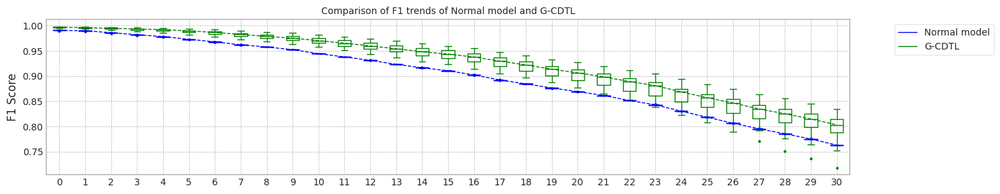

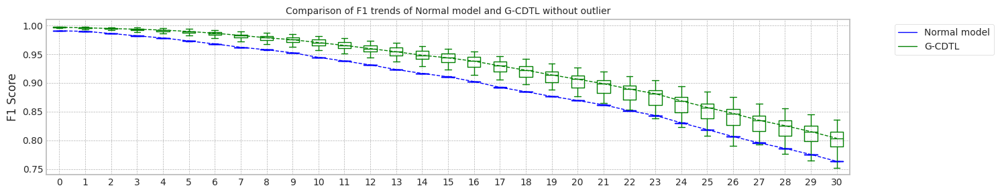

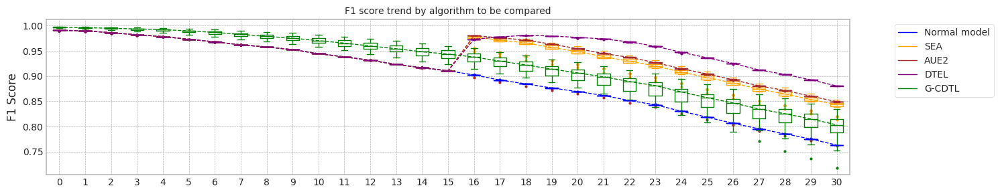

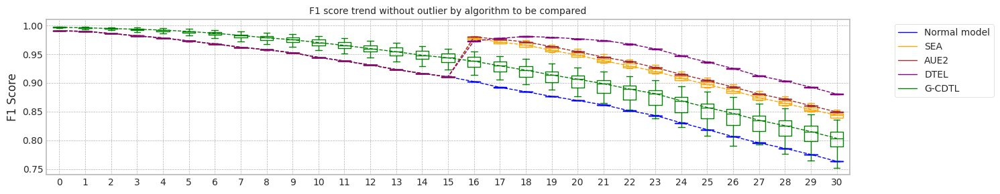

max_mean_trial= 9


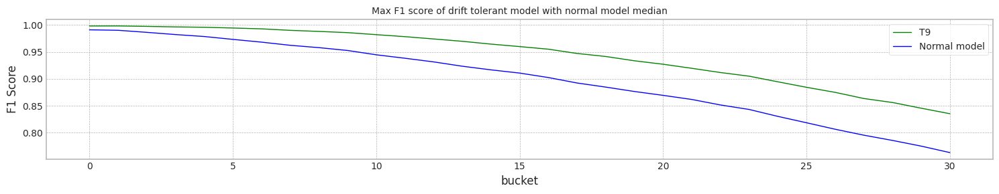

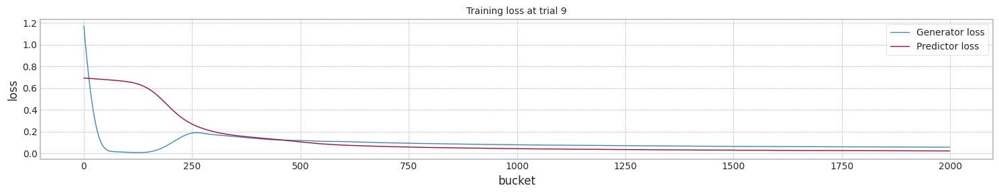

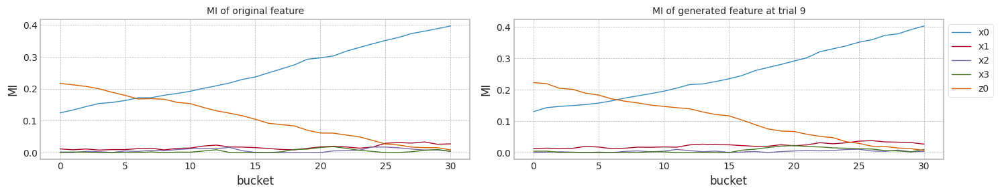

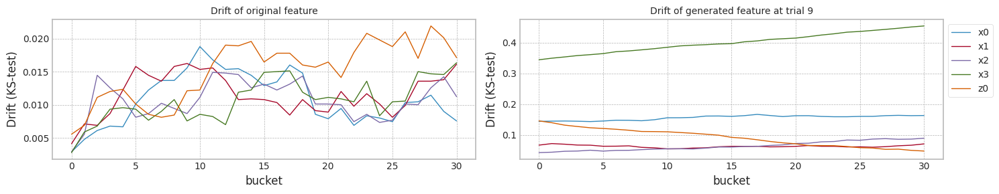

@ Normal model


,Trial,Testset F1,Initial F1,Mean F1,Last F1,Elapsed time
0,0.0,0.990897,0.989979,0.898820,0.763238,5.669899
1,1.0,0.990803,0.989886,0.898767,0.763078,5.694142
2,2.0,0.990897,0.989979,0.898714,0.763029,5.888280
3,3.0,0.990899,0.989981,0.898829,0.763238,5.704795
4,4.0,0.990897,0.989979,0.898740,0.763029,5.696978
5,5.0,0.990897,0.989979,0.898799,0.763238,6.052170
6,6.0,0.990801,0.989979,0.898888,0.763158,5.722037
7,7.0,0.990801,0.989979,0.898821,0.763108,5.745275
8,8.0,0.989878,0.988868,0.898429,0.763284,5.730634
9,9.0,0.990993,0.990075,0.898833,0.763238,5.716724


@ SEA


,Trial,Testset F1,Initial F1,Mean F1,Last F1,Elapsed time
0,0.0,0.990897,0.989979,0.925240,0.820080,10.513802
1,1.0,0.990803,0.989886,0.940494,0.850452,10.022992
2,2.0,0.990897,0.989979,0.925433,0.819915,10.843398
3,3.0,0.990899,0.989981,0.936371,0.842140,10.057437
4,4.0,0.990897,0.989979,0.938564,0.847159,10.704399
5,5.0,0.990897,0.989979,0.936840,0.843421,10.465127
6,6.0,0.990801,0.989979,0.922010,0.812868,9.998634
7,7.0,0.990801,0.989979,0.925104,0.819548,10.755210
8,8.0,0.989878,0.988868,0.940399,0.850843,10.726364
9,9.0,0.990993,0.990075,0.941719,0.853584,10.768463


@ AUE2


,Trial,Testset F1,Initial F1,Mean F1,Last F1,Elapsed time
0,0.0,0.990897,0.989979,0.939869,0.849529,8.860427
1,1.0,0.990803,0.989886,0.939497,0.848799,9.786742
2,2.0,0.990897,0.989979,0.939659,0.849042,9.894139
3,3.0,0.990899,0.989981,0.939724,0.849627,9.435825
4,4.0,0.990897,0.989979,0.939809,0.849285,10.306210
5,5.0,0.990897,0.989979,0.939968,0.849870,10.933205
6,6.0,0.990801,0.989979,0.940107,0.849561,10.699304
7,7.0,0.990801,0.989979,0.939543,0.848544,10.498969
8,8.0,0.989878,0.988868,0.939756,0.849995,9.863501
9,9.0,0.990993,0.990075,0.939767,0.849134,10.300381


@ DTEL


,Trial,Testset F1,Initial F1,Mean F1,Last F1,Elapsed time
0,0.0,0.990897,0.989979,0.951378,0.880124,15.339861
1,1.0,0.990803,0.989886,0.951508,0.881026,15.625361
2,2.0,0.990897,0.989979,0.950917,0.879965,15.416721
3,3.0,0.990899,0.989981,0.951343,0.880760,14.742227
4,4.0,0.990897,0.989979,0.951250,0.880566,13.701133
5,5.0,0.990897,0.989979,0.951544,0.880910,15.549125
6,6.0,0.990801,0.989979,0.951524,0.880716,15.267831
7,7.0,0.990801,0.989979,0.951609,0.880910,15.758985
8,8.0,0.989878,0.988868,0.951173,0.880742,15.560136
9,9.0,0.990993,0.990075,0.951454,0.880689,14.618475


@ G-CDTL


,Trial,Testset F1,Initial F1,Mean F1,Last F1,Elapsed time
0,0.0,0.997530,0.996965,0.932654,0.809960,5.924601
1,1.0,0.995723,0.994493,0.926032,0.802788,5.774965
2,2.0,0.995066,0.993552,0.908181,0.767607,5.778575
3,3.0,0.997150,0.996108,0.931461,0.808718,5.761676
4,4.0,0.996389,0.995442,0.923073,0.793704,5.930178
5,5.0,0.998099,0.997531,0.936653,0.815838,5.880408
6,6.0,0.996681,0.996116,0.926172,0.801604,5.755581
7,7.0,0.997055,0.996677,0.932606,0.803970,5.760484
8,8.0,0.996290,0.995053,0.905942,0.752224,5.774771
9,9.0,0.997912,0.998009,0.943772,0.835317,5.720918


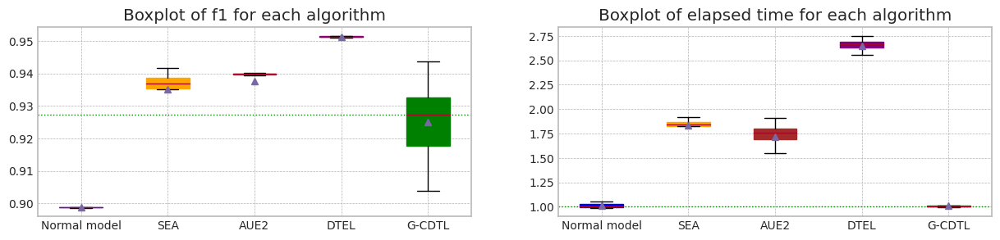

In [55]:
_,_,_,_,_,_ = drift_tolerant2(X1, Y1,train_size, test_size,avaible_range = 300,lambda_f2=0.8,trial_count=20,weight_init=True)

## synthetic data의 생성 (Case #3 MI의 증감(상대적), Drift의 증가)

+ $P_t(y,X) \ne P_{t+w}(y,X) $ 이고 $P_t(y|X) \ne P_{t+w}(y|X) $
+ Real concept drift
+ 즉, P(y|X)와 P(X)의 변화가 연관되어 나타남.
+ 이때 대상 feature $z_0$에 대해서 MI 증가, ks-test 통계량 증가
+ 이에따라 $X_0$의 MI 감소

+ 5개의 feature
+ 각각 importance를 부여
+ 그 중, 1개의 feature는 가변 data drift, MI는 고정

### Dataset 준비

In [56]:
import matplotlib.pyplot as plt

cor = np.asarray([2.5, 1.2, 0.9 , 0.7, 1.5])

seed_everything()

x1 = np.zeros((data_size,5))
for ix,cor_ in enumerate(cor):
    x1[:,ix] = np.random.normal(1,cor_,data_size)

seed_everything()

y1_array = []
cor_const = cor[0]
for ii in range(x1.shape[0]):
    cor[0] = cor[0] - cor_const / x1.shape[0]
    e = np.random.normal(0.0, 1.0)
    e1 = np.random.normal(0.0,  4*ii/40000)
    x1[ii,4] = x1[ii,4] + e1
    y1_array.append(np.sum(cor * x1[ii])+e)

In [57]:
m = np.mean(y1_array)
print(m)
y1 = [1 if y_ > m else 0 for y_ in y1_array]
sum(y1)

5.563076837122426


19931

### 실험

MI Analysis MI Max 0.21053, Min 0.00413, Mean 0.06759, Std 0.07940
Dataset structure X_train, (9000, 5) X_test, (9000, 5) X_live (39000, 5)
Truncate 8000 rows from live_set (39000, 5)
Search MI & Drift...for X_live_set (31, 9000, 5)


100%|██████████| 31/31 [00:05<00:00,  5.62it/s]


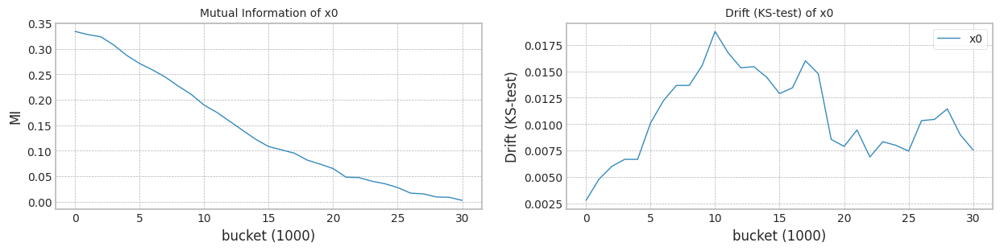

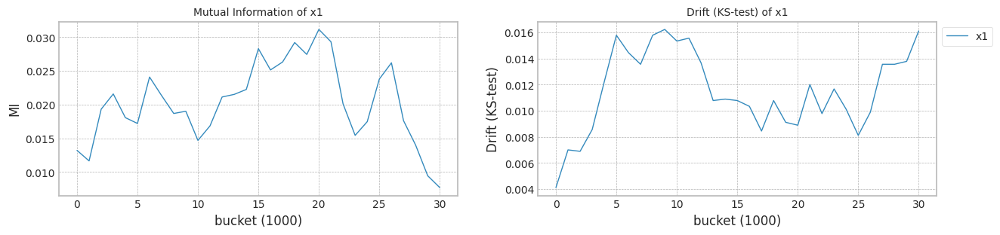

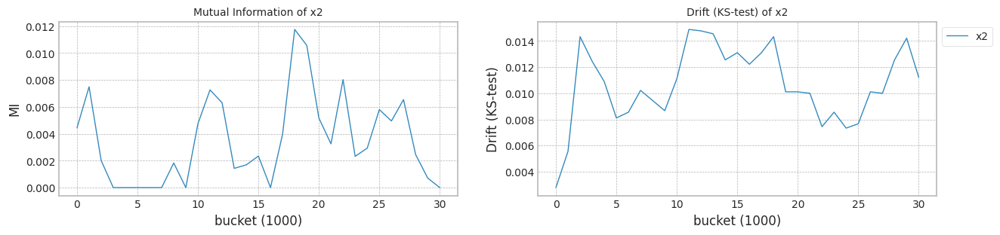

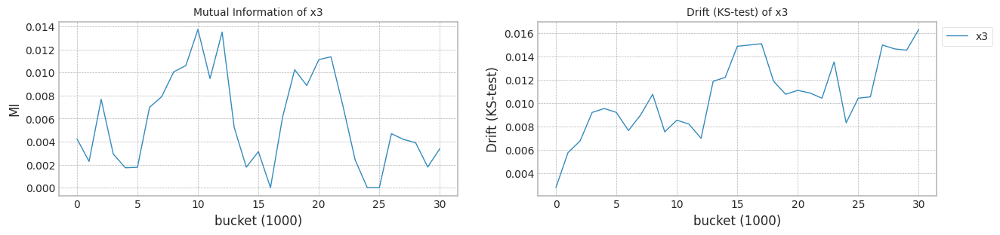

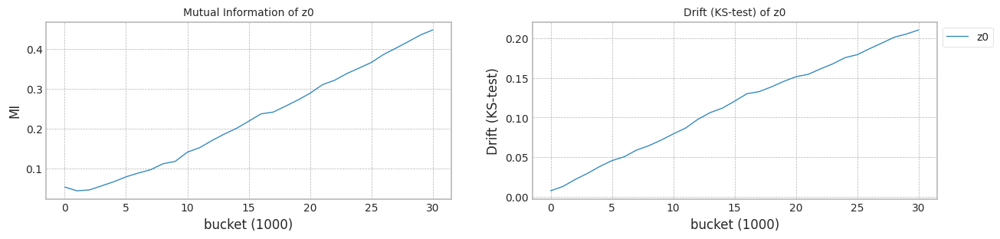

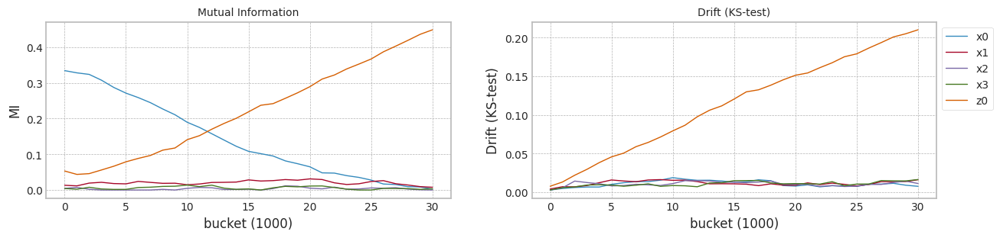

In [58]:
columns=['x0','x1','x2','x3','z0']
X1 = pd.DataFrame(x1,columns=columns)

train_size = 9000
test_size = 1000

X1,Y1 = check_mi_drift(X1, y1,train_size, test_size)

In [59]:
bucket_size = 1000
X1['b'] = [int(b/bucket_size) for b in X1.index.values]
X1

,x0,x1,x2,x3,z0,b
0,0.525799,0.497734,0.329063,0.549493,0.348766,0
1,0.610533,0.420412,0.508390,0.580336,0.603602,0
2,0.556874,0.464734,0.669603,0.724770,0.452177,0
3,0.344341,0.646524,0.340976,0.528780,0.559737,0
4,0.503142,0.550860,0.598773,0.465698,0.452611,0
...,...,...,...,...,...,...
39995,0.333622,0.399822,0.303105,0.605408,0.612303,39
39996,0.358451,0.483875,0.341855,0.574439,0.395651,39
39997,0.559469,0.343824,0.542547,0.575250,0.268402,39
39998,0.433692,0.530132,0.301231,0.282353,0.347175,39


trial_count: 20
lambda_f2 0.8
######################### Trial 0 for Normal model ###########################
cuda:0


100%|██████████| 2000/2000 [00:03<00:00, 623.10it/s]


Test f1 score: 0.9519077901430842
X_live.shape (39000, 6)
Truncate 8000 rows from live_set (39000, 6)
Search MI & Drift...for X_live_set torch.Size([31, 9000, 6])


100%|██████████| 31/31 [00:05<00:00,  5.37it/s]


mean of drift:
x0    0.010828
x1    0.011545
x2    0.010692
x3    0.010649
z0    0.114068
dtype: float64
Mean F1 for all data: 0.8750746374947543
######################### Trial 0 for Drift tolerant model ###########################
cuda:0


100%|██████████| 2000/2000 [00:08<00:00, 231.33it/s]


Test f1 score: 0.9524661893396977
X_live.shape (39000, 6)
Truncate 8000 rows from live_set (39000, 6)
Search MI & Drift...for X_live_set torch.Size([31, 9000, 6])


100%|██████████| 31/31 [00:05<00:00,  5.39it/s]


mean of drift:
x0    0.167871
x1    0.110864
x2    0.069007
x3    0.393251
z0    0.144613
dtype: float64
Mean F1 for all data: 0.8985223675887715
Normal model median        : 0.8750746374947543
Drift tolerant model median: 0.8985223675887715
######################### Trial 1 for Normal model ###########################
cuda:0


100%|██████████| 2000/2000 [00:03<00:00, 630.47it/s]


Test f1 score: 0.9518791012129647
X_live.shape (39000, 6)
Truncate 8000 rows from live_set (39000, 6)
Search MI & Drift...for X_live_set torch.Size([31, 9000, 6])


100%|██████████| 31/31 [00:05<00:00,  5.45it/s]


mean of drift:
x0    0.010828
x1    0.011545
x2    0.010692
x3    0.010649
z0    0.114068
dtype: float64
Mean F1 for all data: 0.8750606404835807
######################### Trial 1 for Drift tolerant model ###########################
cuda:0


100%|██████████| 2000/2000 [00:08<00:00, 232.57it/s]


Test f1 score: 0.9523333666433498
X_live.shape (39000, 6)
Truncate 8000 rows from live_set (39000, 6)
Search MI & Drift...for X_live_set torch.Size([31, 9000, 6])


100%|██████████| 31/31 [00:05<00:00,  5.43it/s]


mean of drift:
x0    0.113333
x1    0.071928
x2    0.016484
x3    0.411254
z0    0.152996
dtype: float64
Mean F1 for all data: 0.897081585553109
Normal model median        : 0.8750676389891675
Drift tolerant model median: 0.8978019765709402
######################### Trial 2 for Normal model ###########################
cuda:0


100%|██████████| 2000/2000 [00:03<00:00, 600.44it/s]


Test f1 score: 0.9521250124415249
X_live.shape (39000, 6)
Truncate 8000 rows from live_set (39000, 6)
Search MI & Drift...for X_live_set torch.Size([31, 9000, 6])


100%|██████████| 31/31 [00:05<00:00,  5.45it/s]


mean of drift:
x0    0.010828
x1    0.011545
x2    0.010692
x3    0.010649
z0    0.114068
dtype: float64
Mean F1 for all data: 0.8754527777114245
######################### Trial 2 for Drift tolerant model ###########################
cuda:0


100%|██████████| 2000/2000 [00:08<00:00, 230.79it/s]


Test f1 score: 0.9536898715267402
X_live.shape (39000, 6)
Truncate 8000 rows from live_set (39000, 6)
Search MI & Drift...for X_live_set torch.Size([31, 9000, 6])


100%|██████████| 31/31 [00:05<00:00,  5.36it/s]


mean of drift:
x0    0.109068
x1    0.028398
x2    0.018964
x3    0.381516
z0    0.158208
dtype: float64
Mean F1 for all data: 0.9080810711391823
Normal model median        : 0.8750746374947543
Drift tolerant model median: 0.8985223675887715
######################### Trial 3 for Normal model ###########################
cuda:0


100%|██████████| 2000/2000 [00:03<00:00, 636.44it/s]


Test f1 score: 0.9520969986086265
X_live.shape (39000, 6)
Truncate 8000 rows from live_set (39000, 6)
Search MI & Drift...for X_live_set torch.Size([31, 9000, 6])


100%|██████████| 31/31 [00:05<00:00,  5.35it/s]


mean of drift:
x0    0.010828
x1    0.011545
x2    0.010692
x3    0.010649
z0    0.114068
dtype: float64
Mean F1 for all data: 0.8749873060869433
######################### Trial 3 for Drift tolerant model ###########################
cuda:0


100%|██████████| 2000/2000 [00:08<00:00, 232.17it/s]


Test f1 score: 0.9535806387621503
X_live.shape (39000, 6)
Truncate 8000 rows from live_set (39000, 6)
Search MI & Drift...for X_live_set torch.Size([31, 9000, 6])


100%|██████████| 31/31 [00:05<00:00,  5.20it/s]


mean of drift:
x0    0.105527
x1    0.035215
x2    0.015502
x3    0.389419
z0    0.135455
dtype: float64
Mean F1 for all data: 0.8999333428669436
Normal model median        : 0.8750676389891675
Drift tolerant model median: 0.8992278552278575
######################### Trial 4 for Normal model ###########################
cuda:0


100%|██████████| 2000/2000 [00:03<00:00, 641.76it/s]


Test f1 score: 0.9512996713474753
X_live.shape (39000, 6)
Truncate 8000 rows from live_set (39000, 6)
Search MI & Drift...for X_live_set torch.Size([31, 9000, 6])


100%|██████████| 31/31 [00:05<00:00,  5.45it/s]


mean of drift:
x0    0.010828
x1    0.011545
x2    0.010692
x3    0.010649
z0    0.114068
dtype: float64
Mean F1 for all data: 0.8753523327493513
######################### Trial 4 for Drift tolerant model ###########################
cuda:0


100%|██████████| 2000/2000 [00:08<00:00, 227.66it/s]


Test f1 score: 0.9530938123752495
X_live.shape (39000, 6)
Truncate 8000 rows from live_set (39000, 6)
Search MI & Drift...for X_live_set torch.Size([31, 9000, 6])


100%|██████████| 31/31 [00:05<00:00,  5.36it/s]


mean of drift:
x0    0.143685
x1    0.038090
x2    0.066738
x3    0.406993
z0    0.159344
dtype: float64
Mean F1 for all data: 0.9062099002988107
Normal model median        : 0.8750746374947543
Drift tolerant model median: 0.8999333428669436
######################### Trial 5 for Normal model ###########################
cuda:0


100%|██████████| 2000/2000 [00:03<00:00, 632.56it/s]


Test f1 score: 0.9506860210777491
X_live.shape (39000, 6)
Truncate 8000 rows from live_set (39000, 6)
Search MI & Drift...for X_live_set torch.Size([31, 9000, 6])


100%|██████████| 31/31 [00:05<00:00,  5.42it/s]


mean of drift:
x0    0.010828
x1    0.011545
x2    0.010692
x3    0.010649
z0    0.114068
dtype: float64
Mean F1 for all data: 0.8746570683750957
######################### Trial 5 for Drift tolerant model ###########################
cuda:0


100%|██████████| 2000/2000 [00:08<00:00, 234.51it/s]


Test f1 score: 0.9532152100338445
X_live.shape (39000, 6)
Truncate 8000 rows from live_set (39000, 6)
Search MI & Drift...for X_live_set torch.Size([31, 9000, 6])


100%|██████████| 31/31 [00:05<00:00,  5.33it/s]


mean of drift:
x0    0.132789
x1    0.048695
x2    0.042789
x3    0.367061
z0    0.139147
dtype: float64
Mean F1 for all data: 0.896285603879389
Normal model median        : 0.8750676389891675
Drift tolerant model median: 0.8992278552278575
######################### Trial 6 for Normal model ###########################
cuda:0


100%|██████████| 2000/2000 [00:03<00:00, 641.92it/s]


Test f1 score: 0.951813214108296
X_live.shape (39000, 6)
Truncate 8000 rows from live_set (39000, 6)
Search MI & Drift...for X_live_set torch.Size([31, 9000, 6])


100%|██████████| 31/31 [00:05<00:00,  5.45it/s]


mean of drift:
x0    0.010828
x1    0.011545
x2    0.010692
x3    0.010649
z0    0.114068
dtype: float64
Mean F1 for all data: 0.8750706306772311
######################### Trial 6 for Drift tolerant model ###########################
cuda:0


100%|██████████| 2000/2000 [00:08<00:00, 233.71it/s]


Test f1 score: 0.953053511040382
X_live.shape (39000, 6)
Truncate 8000 rows from live_set (39000, 6)
Search MI & Drift...for X_live_set torch.Size([31, 9000, 6])


100%|██████████| 31/31 [00:05<00:00,  5.49it/s]


mean of drift:
x0    0.082602
x1    0.030079
x2    0.027075
x3    0.424183
z0    0.152663
dtype: float64
Mean F1 for all data: 0.900178153998623
Normal model median        : 0.8750706306772311
Drift tolerant model median: 0.8999333428669436
######################### Trial 7 for Normal model ###########################
cuda:0


100%|██████████| 2000/2000 [00:03<00:00, 643.42it/s]


Test f1 score: 0.951813214108296
X_live.shape (39000, 6)
Truncate 8000 rows from live_set (39000, 6)
Search MI & Drift...for X_live_set torch.Size([31, 9000, 6])


100%|██████████| 31/31 [00:05<00:00,  5.39it/s]


mean of drift:
x0    0.010828
x1    0.011545
x2    0.010692
x3    0.010649
z0    0.114068
dtype: float64
Mean F1 for all data: 0.8750792239661375
######################### Trial 7 for Drift tolerant model ###########################
cuda:0


100%|██████████| 2000/2000 [00:08<00:00, 237.33it/s]


Test f1 score: 0.9526939547853799
X_live.shape (39000, 6)
Truncate 8000 rows from live_set (39000, 6)
Search MI & Drift...for X_live_set torch.Size([31, 9000, 6])


100%|██████████| 31/31 [00:05<00:00,  5.42it/s]


mean of drift:
x0    0.134122
x1    0.029194
x2    0.325670
x3    0.052749
z0    0.141452
dtype: float64
Mean F1 for all data: 0.9082942118173578
Normal model median        : 0.8750726340859927
Drift tolerant model median: 0.9000557484327834
######################### Trial 8 for Normal model ###########################
cuda:0


100%|██████████| 2000/2000 [00:03<00:00, 641.35it/s]


Test f1 score: 0.9516352824578791
X_live.shape (39000, 6)
Truncate 8000 rows from live_set (39000, 6)
Search MI & Drift...for X_live_set torch.Size([31, 9000, 6])


100%|██████████| 31/31 [00:05<00:00,  5.50it/s]


mean of drift:
x0    0.010828
x1    0.011545
x2    0.010692
x3    0.010649
z0    0.114068
dtype: float64
Mean F1 for all data: 0.8744643562993428
######################### Trial 8 for Drift tolerant model ###########################
cuda:0


100%|██████████| 2000/2000 [00:08<00:00, 233.80it/s]


Test f1 score: 0.953760666798968
X_live.shape (39000, 6)
Truncate 8000 rows from live_set (39000, 6)
Search MI & Drift...for X_live_set torch.Size([31, 9000, 6])


100%|██████████| 31/31 [00:05<00:00,  5.48it/s]


mean of drift:
x0    0.151054
x1    0.123441
x2    0.057513
x3    0.121814
z0    0.112444
dtype: float64
Mean F1 for all data: 0.9078325730879561
Normal model median        : 0.8750706306772311
Drift tolerant model median: 0.900178153998623
######################### Trial 9 for Normal model ###########################
cuda:0


100%|██████████| 2000/2000 [00:03<00:00, 632.46it/s]


Test f1 score: 0.951803637086356
X_live.shape (39000, 6)
Truncate 8000 rows from live_set (39000, 6)
Search MI & Drift...for X_live_set torch.Size([31, 9000, 6])


100%|██████████| 31/31 [00:05<00:00,  5.49it/s]


mean of drift:
x0    0.010828
x1    0.011545
x2    0.010692
x3    0.010649
z0    0.114068
dtype: float64
Mean F1 for all data: 0.8750053454501086
######################### Trial 9 for Drift tolerant model ###########################
cuda:0


100%|██████████| 2000/2000 [00:08<00:00, 235.22it/s]


Test f1 score: 0.954477537603347
X_live.shape (39000, 6)
Truncate 8000 rows from live_set (39000, 6)
Search MI & Drift...for X_live_set torch.Size([31, 9000, 6])


100%|██████████| 31/31 [00:05<00:00,  5.40it/s]


mean of drift:
x0    0.047477
x1    0.041072
x2    0.328538
x3    0.067552
z0    0.132384
dtype: float64
Mean F1 for all data: 0.9000300933358226
Normal model median        : 0.8750656355804058
Drift tolerant model median: 0.9001041236672228
######################### Trial 10 for Normal model ###########################
cuda:0


100%|██████████| 2000/2000 [00:03<00:00, 636.60it/s]


Test f1 score: 0.951803637086356
X_live.shape (39000, 6)
Truncate 8000 rows from live_set (39000, 6)
Search MI & Drift...for X_live_set torch.Size([31, 9000, 6])


100%|██████████| 31/31 [00:05<00:00,  5.50it/s]


mean of drift:
x0    0.010828
x1    0.011545
x2    0.010692
x3    0.010649
z0    0.114068
dtype: float64
Mean F1 for all data: 0.8753922250913783
######################### Trial 10 for Drift tolerant model ###########################
cuda:0


100%|██████████| 2000/2000 [00:08<00:00, 235.30it/s]


Test f1 score: 0.9534721530337751
X_live.shape (39000, 6)
Truncate 8000 rows from live_set (39000, 6)
Search MI & Drift...for X_live_set torch.Size([31, 9000, 6])


100%|██████████| 31/31 [00:05<00:00,  5.51it/s]


mean of drift:
x0    0.137717
x1    0.038943
x2    0.039964
x3    0.380839
z0    0.139520
dtype: float64
Mean F1 for all data: 0.9064313068110125
Normal model median        : 0.8750706306772311
Drift tolerant model median: 0.900178153998623
######################### Trial 11 for Normal model ###########################
cuda:0


100%|██████████| 2000/2000 [00:03<00:00, 635.99it/s]


Test f1 score: 0.951813214108296
X_live.shape (39000, 6)
Truncate 8000 rows from live_set (39000, 6)
Search MI & Drift...for X_live_set torch.Size([31, 9000, 6])


100%|██████████| 31/31 [00:05<00:00,  5.37it/s]


mean of drift:
x0    0.010828
x1    0.011545
x2    0.010692
x3    0.010649
z0    0.114068
dtype: float64
Mean F1 for all data: 0.8750563113790598
######################### Trial 11 for Drift tolerant model ###########################
cuda:0


100%|██████████| 2000/2000 [00:08<00:00, 231.02it/s]


Test f1 score: 0.9535764096433553
X_live.shape (39000, 6)
Truncate 8000 rows from live_set (39000, 6)
Search MI & Drift...for X_live_set torch.Size([31, 9000, 6])


100%|██████████| 31/31 [00:05<00:00,  5.50it/s]


mean of drift:
x0    0.095946
x1    0.054860
x2    0.349090
x3    0.115219
z0    0.132771
dtype: float64
Mean F1 for all data: 0.9076027479158416
Normal model median        : 0.8750656355804058
Drift tolerant model median: 0.9031940271487169
######################### Trial 12 for Normal model ###########################
cuda:0


100%|██████████| 2000/2000 [00:03<00:00, 637.80it/s]


Test f1 score: 0.9518982309679984
X_live.shape (39000, 6)
Truncate 8000 rows from live_set (39000, 6)
Search MI & Drift...for X_live_set torch.Size([31, 9000, 6])


100%|██████████| 31/31 [00:05<00:00,  5.52it/s]


mean of drift:
x0    0.010828
x1    0.011545
x2    0.010692
x3    0.010649
z0    0.114068
dtype: float64
Mean F1 for all data: 0.8749585116945194
######################### Trial 12 for Drift tolerant model ###########################
cuda:0


100%|██████████| 2000/2000 [00:08<00:00, 236.38it/s]


Test f1 score: 0.9529025191675794
X_live.shape (39000, 6)
Truncate 8000 rows from live_set (39000, 6)
Search MI & Drift...for X_live_set torch.Size([31, 9000, 6])


100%|██████████| 31/31 [00:05<00:00,  5.46it/s]


mean of drift:
x0    0.088907
x1    0.069036
x2    0.346183
x3    0.091520
z0    0.137233
dtype: float64
Mean F1 for all data: 0.8965068132454594
Normal model median        : 0.8750606404835807
Drift tolerant model median: 0.900178153998623
######################### Trial 13 for Normal model ###########################
cuda:0


100%|██████████| 2000/2000 [00:03<00:00, 624.12it/s]


Test f1 score: 0.951813214108296
X_live.shape (39000, 6)
Truncate 8000 rows from live_set (39000, 6)
Search MI & Drift...for X_live_set torch.Size([31, 9000, 6])


100%|██████████| 31/31 [00:05<00:00,  5.45it/s]


mean of drift:
x0    0.010828
x1    0.011545
x2    0.010692
x3    0.010649
z0    0.114068
dtype: float64
Mean F1 for all data: 0.8750450861024706
######################### Trial 13 for Drift tolerant model ###########################
cuda:0


100%|██████████| 2000/2000 [00:08<00:00, 235.09it/s]


Test f1 score: 0.952561669829222
X_live.shape (39000, 6)
Truncate 8000 rows from live_set (39000, 6)
Search MI & Drift...for X_live_set torch.Size([31, 9000, 6])


100%|██████████| 31/31 [00:05<00:00,  5.28it/s]


mean of drift:
x0    0.226437
x1    0.102100
x2    0.031785
x3    0.448982
z0    0.196294
dtype: float64
Mean F1 for all data: 0.8891599036427138
Normal model median        : 0.8750584759313202
Drift tolerant model median: 0.9001041236672228
######################### Trial 14 for Normal model ###########################
cuda:0


100%|██████████| 2000/2000 [00:03<00:00, 639.25it/s]


Test f1 score: 0.951813214108296
X_live.shape (39000, 6)
Truncate 8000 rows from live_set (39000, 6)
Search MI & Drift...for X_live_set torch.Size([31, 9000, 6])


100%|██████████| 31/31 [00:05<00:00,  5.32it/s]


mean of drift:
x0    0.010828
x1    0.011545
x2    0.010692
x3    0.010649
z0    0.114068
dtype: float64
Mean F1 for all data: 0.8750563113790598
######################### Trial 14 for Drift tolerant model ###########################
cuda:0


100%|██████████| 2000/2000 [00:08<00:00, 234.12it/s]


Test f1 score: 0.9523334662943758
X_live.shape (39000, 6)
Truncate 8000 rows from live_set (39000, 6)
Search MI & Drift...for X_live_set torch.Size([31, 9000, 6])


100%|██████████| 31/31 [00:05<00:00,  5.48it/s]


mean of drift:
x0    0.074749
x1    0.059133
x2    0.044509
x3    0.484405
z0    0.154939
dtype: float64
Mean F1 for all data: 0.8885008780729031
Normal model median        : 0.8750563113790598
Drift tolerant model median: 0.9000300933358226
######################### Trial 15 for Normal model ###########################
cuda:0


100%|██████████| 2000/2000 [00:03<00:00, 639.59it/s]


Test f1 score: 0.9522483087942698
X_live.shape (39000, 6)
Truncate 8000 rows from live_set (39000, 6)
Search MI & Drift...for X_live_set torch.Size([31, 9000, 6])


100%|██████████| 31/31 [00:05<00:00,  5.37it/s]


mean of drift:
x0    0.010828
x1    0.011545
x2    0.010692
x3    0.010649
z0    0.114068
dtype: float64
Mean F1 for all data: 0.8752681071082099
######################### Trial 15 for Drift tolerant model ###########################
cuda:0


100%|██████████| 2000/2000 [00:08<00:00, 231.98it/s]


Test f1 score: 0.952968081932982
X_live.shape (39000, 6)
Truncate 8000 rows from live_set (39000, 6)
Search MI & Drift...for X_live_set torch.Size([31, 9000, 6])


100%|██████████| 31/31 [00:05<00:00,  5.44it/s]


mean of drift:
x0    0.250179
x1    0.068283
x2    0.322380
x3    0.045978
z0    0.171097
dtype: float64
Mean F1 for all data: 0.8838412983439627
Normal model median        : 0.8750584759313202
Drift tolerant model median: 0.8999817181013832
######################### Trial 16 for Normal model ###########################
cuda:0


100%|██████████| 2000/2000 [00:03<00:00, 635.67it/s]


Test f1 score: 0.951813214108296
X_live.shape (39000, 6)
Truncate 8000 rows from live_set (39000, 6)
Search MI & Drift...for X_live_set torch.Size([31, 9000, 6])


100%|██████████| 31/31 [00:05<00:00,  5.50it/s]


mean of drift:
x0    0.010828
x1    0.011545
x2    0.010692
x3    0.010649
z0    0.114068
dtype: float64
Mean F1 for all data: 0.8750517609799601
######################### Trial 16 for Drift tolerant model ###########################
cuda:0


100%|██████████| 2000/2000 [00:08<00:00, 233.87it/s]


Test f1 score: 0.9542470658444401
X_live.shape (39000, 6)
Truncate 8000 rows from live_set (39000, 6)
Search MI & Drift...for X_live_set torch.Size([31, 9000, 6])


100%|██████████| 31/31 [00:05<00:00,  5.40it/s]


mean of drift:
x0    0.150527
x1    0.046896
x2    0.032634
x3    0.435294
z0    0.162925
dtype: float64
Mean F1 for all data: 0.90763693042689
Normal model median        : 0.8750563113790598
Drift tolerant model median: 0.9000300933358226
######################### Trial 17 for Normal model ###########################
cuda:0


100%|██████████| 2000/2000 [00:03<00:00, 635.58it/s]


Test f1 score: 0.951813214108296
X_live.shape (39000, 6)
Truncate 8000 rows from live_set (39000, 6)
Search MI & Drift...for X_live_set torch.Size([31, 9000, 6])


100%|██████████| 31/31 [00:05<00:00,  5.50it/s]


mean of drift:
x0    0.010828
x1    0.011545
x2    0.010692
x3    0.010649
z0    0.114068
dtype: float64
Mean F1 for all data: 0.8750067132603533
######################### Trial 17 for Drift tolerant model ###########################
cuda:0


100%|██████████| 2000/2000 [00:08<00:00, 234.31it/s]


Test f1 score: 0.9538614848031888
X_live.shape (39000, 6)
Truncate 8000 rows from live_set (39000, 6)
Search MI & Drift...for X_live_set torch.Size([31, 9000, 6])


100%|██████████| 31/31 [00:05<00:00,  5.44it/s]


mean of drift:
x0    0.113634
x1    0.031491
x2    0.023047
x3    0.026419
z0    0.160004
dtype: float64
Mean F1 for all data: 0.9083811653224007
Normal model median        : 0.8750563113790598
Drift tolerant model median: 0.9001041236672228
######################### Trial 18 for Normal model ###########################
cuda:0


100%|██████████| 2000/2000 [00:03<00:00, 627.24it/s]


Test f1 score: 0.951813214108296
X_live.shape (39000, 6)
Truncate 8000 rows from live_set (39000, 6)
Search MI & Drift...for X_live_set torch.Size([31, 9000, 6])


100%|██████████| 31/31 [00:05<00:00,  5.36it/s]


mean of drift:
x0    0.010828
x1    0.011545
x2    0.010692
x3    0.010649
z0    0.114068
dtype: float64
Mean F1 for all data: 0.8751830643573535
######################### Trial 18 for Drift tolerant model ###########################
cuda:0


100%|██████████| 2000/2000 [00:08<00:00, 235.75it/s]


Test f1 score: 0.9520671060515278
X_live.shape (39000, 6)
Truncate 8000 rows from live_set (39000, 6)
Search MI & Drift...for X_live_set torch.Size([31, 9000, 6])


100%|██████████| 31/31 [00:05<00:00,  5.46it/s]


mean of drift:
x0    0.086362
x1    0.040004
x2    0.319251
x3    0.039681
z0    0.136215
dtype: float64
Mean F1 for all data: 0.8957385162602737
Normal model median        : 0.8750563113790598
Drift tolerant model median: 0.9000300933358226
######################### Trial 19 for Normal model ###########################
cuda:0


100%|██████████| 2000/2000 [00:03<00:00, 622.26it/s]


Test f1 score: 0.9516352824578791
X_live.shape (39000, 6)
Truncate 8000 rows from live_set (39000, 6)
Search MI & Drift...for X_live_set torch.Size([31, 9000, 6])


100%|██████████| 31/31 [00:05<00:00,  5.50it/s]


mean of drift:
x0    0.010828
x1    0.011545
x2    0.010692
x3    0.010649
z0    0.114068
dtype: float64
Mean F1 for all data: 0.8744679434605347
######################### Trial 19 for Drift tolerant model ###########################
cuda:0


100%|██████████| 2000/2000 [00:08<00:00, 237.21it/s]


Test f1 score: 0.9530736275779615
X_live.shape (39000, 6)
Truncate 8000 rows from live_set (39000, 6)
Search MI & Drift...for X_live_set torch.Size([31, 9000, 6])


100%|██████████| 31/31 [00:05<00:00,  5.46it/s]


mean of drift:
x0    0.092832
x1    0.089090
x2    0.013627
x3    0.407867
z0    0.167315
dtype: float64
Mean F1 for all data: 0.902857111726875
Normal model median        : 0.8750563113790598
Drift tolerant model median: 0.9001041236672228
######################### Trial 0 for Normal model ###########################
retrain_interval: 16
######################### Trial 0 for SEA ###########################
X_live.shape (39000, 6)
Truncate 8000 rows from live_set (39000, 6)
Search MI & Drift...for X_live_set torch.Size([31, 9000, 6])


100%|██████████| 31/31 [00:10<00:00,  2.93it/s]


Early stop at  nan
Mean of drift:
x0    0.010828
x1    0.011545
x2    0.010692
x3    0.010649
z0    0.114068
dtype: float64
Mean F1 for all data: 0.8945862871765763
SEA median: 0.8945862871765763
######################### Trial 0 for AUE ###########################
X_live.shape (39000, 6)
Truncate 8000 rows from live_set (39000, 6)
Search MI & Drift...for X_live_set torch.Size([31, 9000, 6])


100%|██████████| 31/31 [00:07<00:00,  4.02it/s]


Early stop at  1696.0
Mean of drift:
x0    0.010828
x1    0.011545
x2    0.010692
x3    0.010649
z0    0.114068
dtype: float64
Mean F1 for all data: 0.9065456556771798
AUE median: 0.9065456556771798
######################### Trial 0 for DTEL ###########################
X_live.shape (39000, 6)
Truncate 8000 rows from live_set (39000, 6)
Search MI & Drift...for X_live_set torch.Size([31, 9000, 6])


100%|██████████| 31/31 [00:12<00:00,  2.53it/s]


Early stop at  1610.0
Mean of drift:
x0    0.010828
x1    0.011545
x2    0.010692
x3    0.010649
z0    0.114068
dtype: float64
Mean F1 for all data: 0.9212194814603115
DTEL median: 0.9212194814603115
######################### Trial 1 for Normal model ###########################
retrain_interval: 16
######################### Trial 1 for SEA ###########################
X_live.shape (39000, 6)
Truncate 8000 rows from live_set (39000, 6)
Search MI & Drift...for X_live_set torch.Size([31, 9000, 6])


100%|██████████| 31/31 [00:08<00:00,  3.84it/s]


Early stop at  2020.0
Mean of drift:
x0    0.010828
x1    0.011545
x2    0.010692
x3    0.010649
z0    0.114068
dtype: float64
Mean F1 for all data: 0.8969285672203376
SEA median: 0.895757427198457
######################### Trial 1 for AUE ###########################
X_live.shape (39000, 6)
Truncate 8000 rows from live_set (39000, 6)
Search MI & Drift...for X_live_set torch.Size([31, 9000, 6])


100%|██████████| 31/31 [00:08<00:00,  3.52it/s]


Early stop at  2450.0
Mean of drift:
x0    0.010828
x1    0.011545
x2    0.010692
x3    0.010649
z0    0.114068
dtype: float64
Mean F1 for all data: 0.9065849500808213
AUE median: 0.9065653028790006
######################### Trial 1 for DTEL ###########################
X_live.shape (39000, 6)
Truncate 8000 rows from live_set (39000, 6)
Search MI & Drift...for X_live_set torch.Size([31, 9000, 6])


100%|██████████| 31/31 [00:15<00:00,  2.06it/s]


Early stop at  nan
Mean of drift:
x0    0.010828
x1    0.011545
x2    0.010692
x3    0.010649
z0    0.114068
dtype: float64
Mean F1 for all data: 0.9212249232570161
DTEL median: 0.9212222023586638
######################### Trial 2 for Normal model ###########################
retrain_interval: 16
######################### Trial 2 for SEA ###########################
X_live.shape (39000, 6)
Truncate 8000 rows from live_set (39000, 6)
Search MI & Drift...for X_live_set torch.Size([31, 9000, 6])


100%|██████████| 31/31 [00:10<00:00,  2.97it/s]


Early stop at  nan
Mean of drift:
x0    0.010828
x1    0.011545
x2    0.010692
x3    0.010649
z0    0.114068
dtype: float64
Mean F1 for all data: 0.906160769839564
SEA median: 0.8969285672203376
######################### Trial 2 for AUE ###########################
X_live.shape (39000, 6)
Truncate 8000 rows from live_set (39000, 6)
Search MI & Drift...for X_live_set torch.Size([31, 9000, 6])


100%|██████████| 31/31 [00:07<00:00,  4.08it/s]


Early stop at  1527.0
Mean of drift:
x0    0.010828
x1    0.011545
x2    0.010692
x3    0.010649
z0    0.114068
dtype: float64
Mean F1 for all data: 0.9031948239463439
AUE median: 0.9065456556771798
######################### Trial 2 for DTEL ###########################
X_live.shape (39000, 6)
Truncate 8000 rows from live_set (39000, 6)
Search MI & Drift...for X_live_set torch.Size([31, 9000, 6])


100%|██████████| 31/31 [00:12<00:00,  2.44it/s]


Early stop at  1937.0
Mean of drift:
x0    0.010828
x1    0.011545
x2    0.010692
x3    0.010649
z0    0.114068
dtype: float64
Mean F1 for all data: 0.9209254092747508
DTEL median: 0.9212194814603115
######################### Trial 3 for Normal model ###########################
retrain_interval: 16
######################### Trial 3 for SEA ###########################
X_live.shape (39000, 6)
Truncate 8000 rows from live_set (39000, 6)
Search MI & Drift...for X_live_set torch.Size([31, 9000, 6])


100%|██████████| 31/31 [00:07<00:00,  3.97it/s]


Early stop at  1691.0
Mean of drift:
x0    0.010828
x1    0.011545
x2    0.010692
x3    0.010649
z0    0.114068
dtype: float64
Mean F1 for all data: 0.8964374935110071
SEA median: 0.8966830303656723
######################### Trial 3 for AUE ###########################
X_live.shape (39000, 6)
Truncate 8000 rows from live_set (39000, 6)
Search MI & Drift...for X_live_set torch.Size([31, 9000, 6])


100%|██████████| 31/31 [00:07<00:00,  3.93it/s]


Early stop at  1590.0
Mean of drift:
x0    0.010828
x1    0.011545
x2    0.010692
x3    0.010649
z0    0.114068
dtype: float64
Mean F1 for all data: 0.9067235379434788
AUE median: 0.9065653028790006
######################### Trial 3 for DTEL ###########################
X_live.shape (39000, 6)
Truncate 8000 rows from live_set (39000, 6)
Search MI & Drift...for X_live_set torch.Size([31, 9000, 6])


100%|██████████| 31/31 [00:15<00:00,  2.05it/s]


Early stop at  nan
Mean of drift:
x0    0.010828
x1    0.011545
x2    0.010692
x3    0.010649
z0    0.114068
dtype: float64
Mean F1 for all data: 0.920905060437185
DTEL median: 0.9210724453675312
######################### Trial 4 for Normal model ###########################
retrain_interval: 16
######################### Trial 4 for SEA ###########################
X_live.shape (39000, 6)
Truncate 8000 rows from live_set (39000, 6)
Search MI & Drift...for X_live_set torch.Size([31, 9000, 6])


100%|██████████| 31/31 [00:07<00:00,  4.21it/s]


Early stop at  1354.0
Mean of drift:
x0    0.010828
x1    0.011545
x2    0.010692
x3    0.010649
z0    0.114068
dtype: float64
Mean F1 for all data: 0.9055931850711624
SEA median: 0.8969285672203376
######################### Trial 4 for AUE ###########################
X_live.shape (39000, 6)
Truncate 8000 rows from live_set (39000, 6)
Search MI & Drift...for X_live_set torch.Size([31, 9000, 6])


100%|██████████| 31/31 [00:08<00:00,  3.48it/s]


Early stop at  2667.0
Mean of drift:
x0    0.010828
x1    0.011545
x2    0.010692
x3    0.010649
z0    0.114068
dtype: float64
Mean F1 for all data: 0.9033483233114616
AUE median: 0.9065456556771798
######################### Trial 4 for DTEL ###########################
X_live.shape (39000, 6)
Truncate 8000 rows from live_set (39000, 6)
Search MI & Drift...for X_live_set torch.Size([31, 9000, 6])


100%|██████████| 31/31 [00:12<00:00,  2.57it/s]


Early stop at  1367.0
Mean of drift:
x0    0.010828
x1    0.011545
x2    0.010692
x3    0.010649
z0    0.114068
dtype: float64
Mean F1 for all data: 0.9212594400354343
DTEL median: 0.9212194814603115
######################### Trial 5 for Normal model ###########################
retrain_interval: 16
######################### Trial 5 for SEA ###########################
X_live.shape (39000, 6)
Truncate 8000 rows from live_set (39000, 6)
Search MI & Drift...for X_live_set torch.Size([31, 9000, 6])


100%|██████████| 31/31 [00:08<00:00,  3.70it/s]


Early stop at  2228.0
Mean of drift:
x0    0.010828
x1    0.011545
x2    0.010692
x3    0.010649
z0    0.114068
dtype: float64
Mean F1 for all data: 0.8963759610028764
SEA median: 0.8966830303656723
######################### Trial 5 for AUE ###########################
X_live.shape (39000, 6)
Truncate 8000 rows from live_set (39000, 6)
Search MI & Drift...for X_live_set torch.Size([31, 9000, 6])


100%|██████████| 31/31 [00:07<00:00,  3.96it/s]


Early stop at  1746.0
Mean of drift:
x0    0.010828
x1    0.011545
x2    0.010692
x3    0.010649
z0    0.114068
dtype: float64
Mean F1 for all data: 0.9063992388207325
AUE median: 0.9064724472489561
######################### Trial 5 for DTEL ###########################
X_live.shape (39000, 6)
Truncate 8000 rows from live_set (39000, 6)
Search MI & Drift...for X_live_set torch.Size([31, 9000, 6])


100%|██████████| 31/31 [00:11<00:00,  2.67it/s]


Early stop at  1102.0
Mean of drift:
x0    0.010828
x1    0.011545
x2    0.010692
x3    0.010649
z0    0.114068
dtype: float64
Mean F1 for all data: 0.9211963319733866
DTEL median: 0.921207906716849
######################### Trial 6 for Normal model ###########################
retrain_interval: 16
######################### Trial 6 for SEA ###########################
X_live.shape (39000, 6)
Truncate 8000 rows from live_set (39000, 6)
Search MI & Drift...for X_live_set torch.Size([31, 9000, 6])


100%|██████████| 31/31 [00:08<00:00,  3.59it/s]


Early stop at  2523.0
Mean of drift:
x0    0.010828
x1    0.011545
x2    0.010692
x3    0.010649
z0    0.114068
dtype: float64
Mean F1 for all data: 0.8965419124207317
SEA median: 0.8965419124207317
######################### Trial 6 for AUE ###########################
X_live.shape (39000, 6)
Truncate 8000 rows from live_set (39000, 6)
Search MI & Drift...for X_live_set torch.Size([31, 9000, 6])


100%|██████████| 31/31 [00:10<00:00,  2.89it/s]


Early stop at  nan
Mean of drift:
x0    0.010828
x1    0.011545
x2    0.010692
x3    0.010649
z0    0.114068
dtype: float64
Mean F1 for all data: 0.9061057498523147
AUE median: 0.9063992388207325
######################### Trial 6 for DTEL ###########################
X_live.shape (39000, 6)
Truncate 8000 rows from live_set (39000, 6)
Search MI & Drift...for X_live_set torch.Size([31, 9000, 6])


100%|██████████| 31/31 [00:12<00:00,  2.42it/s]


Early stop at  2018.0
Mean of drift:
x0    0.010828
x1    0.011545
x2    0.010692
x3    0.010649
z0    0.114068
dtype: float64
Mean F1 for all data: 0.9208142326427972
DTEL median: 0.9211963319733866
######################### Trial 7 for Normal model ###########################
retrain_interval: 16
######################### Trial 7 for SEA ###########################
X_live.shape (39000, 6)
Truncate 8000 rows from live_set (39000, 6)
Search MI & Drift...for X_live_set torch.Size([31, 9000, 6])


100%|██████████| 31/31 [00:07<00:00,  3.96it/s]


Early stop at  1865.0
Mean of drift:
x0    0.010828
x1    0.011545
x2    0.010692
x3    0.010649
z0    0.114068
dtype: float64
Mean F1 for all data: 0.8973069143330773
SEA median: 0.8967352398205346
######################### Trial 7 for AUE ###########################
X_live.shape (39000, 6)
Truncate 8000 rows from live_set (39000, 6)
Search MI & Drift...for X_live_set torch.Size([31, 9000, 6])


100%|██████████| 31/31 [00:10<00:00,  2.88it/s]


Early stop at  nan
Mean of drift:
x0    0.010828
x1    0.011545
x2    0.010692
x3    0.010649
z0    0.114068
dtype: float64
Mean F1 for all data: 0.9061735278988323
AUE median: 0.9062863833597824
######################### Trial 7 for DTEL ###########################
X_live.shape (39000, 6)
Truncate 8000 rows from live_set (39000, 6)
Search MI & Drift...for X_live_set torch.Size([31, 9000, 6])


100%|██████████| 31/31 [00:11<00:00,  2.66it/s]


Early stop at  1039.0
Mean of drift:
x0    0.010828
x1    0.011545
x2    0.010692
x3    0.010649
z0    0.114068
dtype: float64
Mean F1 for all data: 0.9212624962055496
DTEL median: 0.921207906716849
######################### Trial 8 for Normal model ###########################
retrain_interval: 16
######################### Trial 8 for SEA ###########################
X_live.shape (39000, 6)
Truncate 8000 rows from live_set (39000, 6)
Search MI & Drift...for X_live_set torch.Size([31, 9000, 6])


100%|██████████| 31/31 [00:08<00:00,  3.70it/s]


Early stop at  2197.0
Mean of drift:
x0    0.010828
x1    0.011545
x2    0.010692
x3    0.010649
z0    0.114068
dtype: float64
Mean F1 for all data: 0.8995917640362893
SEA median: 0.8969285672203376
######################### Trial 8 for AUE ###########################
X_live.shape (39000, 6)
Truncate 8000 rows from live_set (39000, 6)
Search MI & Drift...for X_live_set torch.Size([31, 9000, 6])


100%|██████████| 31/31 [00:07<00:00,  4.11it/s]


Early stop at  1454.0
Mean of drift:
x0    0.010828
x1    0.011545
x2    0.010692
x3    0.010649
z0    0.114068
dtype: float64
Mean F1 for all data: 0.9061916508444395
AUE median: 0.9061916508444395
######################### Trial 8 for DTEL ###########################
X_live.shape (39000, 6)
Truncate 8000 rows from live_set (39000, 6)
Search MI & Drift...for X_live_set torch.Size([31, 9000, 6])


100%|██████████| 31/31 [00:13<00:00,  2.37it/s]


Early stop at  2160.0
Mean of drift:
x0    0.010828
x1    0.011545
x2    0.010692
x3    0.010649
z0    0.114068
dtype: float64
Mean F1 for all data: 0.9205965130080715
DTEL median: 0.9211963319733866
######################### Trial 9 for Normal model ###########################
retrain_interval: 16
######################### Trial 9 for SEA ###########################
X_live.shape (39000, 6)
Truncate 8000 rows from live_set (39000, 6)
Search MI & Drift...for X_live_set torch.Size([31, 9000, 6])


100%|██████████| 31/31 [00:08<00:00,  3.79it/s]


Early stop at  2098.0
Mean of drift:
x0    0.010828
x1    0.011545
x2    0.010692
x3    0.010649
z0    0.114068
dtype: float64
Mean F1 for all data: 0.9062388420903668
SEA median: 0.8971177407767075
######################### Trial 9 for AUE ###########################
X_live.shape (39000, 6)
Truncate 8000 rows from live_set (39000, 6)
Search MI & Drift...for X_live_set torch.Size([31, 9000, 6])


100%|██████████| 31/31 [00:08<00:00,  3.75it/s]


Early stop at  2025.0
Mean of drift:
x0    0.010828
x1    0.011545
x2    0.010692
x3    0.010649
z0    0.114068
dtype: float64
Mean F1 for all data: 0.9032167001280236
AUE median: 0.906182589371636
######################### Trial 9 for DTEL ###########################
X_live.shape (39000, 6)
Truncate 8000 rows from live_set (39000, 6)
Search MI & Drift...for X_live_set torch.Size([31, 9000, 6])


100%|██████████| 31/31 [00:15<00:00,  2.02it/s]


Early stop at  nan
Mean of drift:
x0    0.010828
x1    0.011545
x2    0.010692
x3    0.010649
z0    0.114068
dtype: float64
Mean F1 for all data: 0.9206215421549586
DTEL median: 0.9210608706240686
######################### Trial 10 for Normal model ###########################
retrain_interval: 16
######################### Trial 10 for SEA ###########################
X_live.shape (39000, 6)
Truncate 8000 rows from live_set (39000, 6)
Search MI & Drift...for X_live_set torch.Size([31, 9000, 6])


100%|██████████| 31/31 [00:10<00:00,  2.99it/s]


Early stop at  nan
Mean of drift:
x0    0.010828
x1    0.011545
x2    0.010692
x3    0.010649
z0    0.114068
dtype: float64
Mean F1 for all data: 0.8953675748367439
SEA median: 0.8969285672203376
######################### Trial 10 for AUE ###########################
X_live.shape (39000, 6)
Truncate 8000 rows from live_set (39000, 6)
Search MI & Drift...for X_live_set torch.Size([31, 9000, 6])


100%|██████████| 31/31 [00:08<00:00,  3.82it/s]


Early stop at  1856.0
Mean of drift:
x0    0.010828
x1    0.011545
x2    0.010692
x3    0.010649
z0    0.114068
dtype: float64
Mean F1 for all data: 0.9066931888759238
AUE median: 0.9061916508444395
######################### Trial 10 for DTEL ###########################
X_live.shape (39000, 6)
Truncate 8000 rows from live_set (39000, 6)
Search MI & Drift...for X_live_set torch.Size([31, 9000, 6])


100%|██████████| 31/31 [00:12<00:00,  2.56it/s]


Early stop at  1511.0
Mean of drift:
x0    0.010828
x1    0.011545
x2    0.010692
x3    0.010649
z0    0.114068
dtype: float64
Mean F1 for all data: 0.9213036862487292
DTEL median: 0.9211963319733866
######################### Trial 11 for Normal model ###########################
retrain_interval: 16
######################### Trial 11 for SEA ###########################
X_live.shape (39000, 6)
Truncate 8000 rows from live_set (39000, 6)
Search MI & Drift...for X_live_set torch.Size([31, 9000, 6])


100%|██████████| 31/31 [00:07<00:00,  3.92it/s]


Early stop at  1892.0
Mean of drift:
x0    0.010828
x1    0.011545
x2    0.010692
x3    0.010649
z0    0.114068
dtype: float64
Mean F1 for all data: 0.8966737980535294
SEA median: 0.8968011826369335
######################### Trial 11 for AUE ###########################
X_live.shape (39000, 6)
Truncate 8000 rows from live_set (39000, 6)
Search MI & Drift...for X_live_set torch.Size([31, 9000, 6])


100%|██████████| 31/31 [00:10<00:00,  2.89it/s]


Early stop at  nan
Mean of drift:
x0    0.010828
x1    0.011545
x2    0.010692
x3    0.010649
z0    0.114068
dtype: float64
Mean F1 for all data: 0.905903160474335
AUE median: 0.906182589371636
######################### Trial 11 for DTEL ###########################
X_live.shape (39000, 6)
Truncate 8000 rows from live_set (39000, 6)
Search MI & Drift...for X_live_set torch.Size([31, 9000, 6])


100%|██████████| 31/31 [00:11<00:00,  2.64it/s]


Early stop at  1197.0
Mean of drift:
x0    0.010828
x1    0.011545
x2    0.010692
x3    0.010649
z0    0.114068
dtype: float64
Mean F1 for all data: 0.9214221076091117
DTEL median: 0.921207906716849
######################### Trial 12 for Normal model ###########################
retrain_interval: 16
######################### Trial 12 for SEA ###########################
X_live.shape (39000, 6)
Truncate 8000 rows from live_set (39000, 6)
Search MI & Drift...for X_live_set torch.Size([31, 9000, 6])


100%|██████████| 31/31 [00:08<00:00,  3.68it/s]


Early stop at  2220.0
Mean of drift:
x0    0.010828
x1    0.011545
x2    0.010692
x3    0.010649
z0    0.114068
dtype: float64
Mean F1 for all data: 0.8966138179055653
SEA median: 0.8966737980535294
######################### Trial 12 for AUE ###########################
X_live.shape (39000, 6)
Truncate 8000 rows from live_set (39000, 6)
Search MI & Drift...for X_live_set torch.Size([31, 9000, 6])


100%|██████████| 31/31 [00:08<00:00,  3.63it/s]


Early stop at  2101.0
Mean of drift:
x0    0.010828
x1    0.011545
x2    0.010692
x3    0.010649
z0    0.114068
dtype: float64
Mean F1 for all data: 0.9063063926673588
AUE median: 0.9061916508444395
######################### Trial 12 for DTEL ###########################
X_live.shape (39000, 6)
Truncate 8000 rows from live_set (39000, 6)
Search MI & Drift...for X_live_set torch.Size([31, 9000, 6])


100%|██████████| 31/31 [00:14<00:00,  2.14it/s]


Early stop at  3293.0
Mean of drift:
x0    0.010828
x1    0.011545
x2    0.010692
x3    0.010649
z0    0.114068
dtype: float64
Mean F1 for all data: 0.9210498416469203
DTEL median: 0.9211963319733866
######################### Trial 13 for Normal model ###########################
retrain_interval: 16
######################### Trial 13 for SEA ###########################
X_live.shape (39000, 6)
Truncate 8000 rows from live_set (39000, 6)
Search MI & Drift...for X_live_set torch.Size([31, 9000, 6])


100%|██████████| 31/31 [00:07<00:00,  3.91it/s]


Early stop at  1861.0
Mean of drift:
x0    0.010828
x1    0.011545
x2    0.010692
x3    0.010649
z0    0.114068
dtype: float64
Mean F1 for all data: 0.8972452282042742
SEA median: 0.8968011826369335
######################### Trial 13 for AUE ###########################
X_live.shape (39000, 6)
Truncate 8000 rows from live_set (39000, 6)
Search MI & Drift...for X_live_set torch.Size([31, 9000, 6])


100%|██████████| 31/31 [00:07<00:00,  3.97it/s]


Early stop at  1776.0
Mean of drift:
x0    0.010828
x1    0.011545
x2    0.010692
x3    0.010649
z0    0.114068
dtype: float64
Mean F1 for all data: 0.9065485270031375
AUE median: 0.9062490217558992
######################### Trial 13 for DTEL ###########################
X_live.shape (39000, 6)
Truncate 8000 rows from live_set (39000, 6)
Search MI & Drift...for X_live_set torch.Size([31, 9000, 6])


100%|██████████| 31/31 [00:14<00:00,  2.17it/s]


Early stop at  3322.0
Mean of drift:
x0    0.010828
x1    0.011545
x2    0.010692
x3    0.010649
z0    0.114068
dtype: float64
Mean F1 for all data: 0.9210402544924554
DTEL median: 0.9211230868101534
######################### Trial 14 for Normal model ###########################
retrain_interval: 16
######################### Trial 14 for SEA ###########################
X_live.shape (39000, 6)
Truncate 8000 rows from live_set (39000, 6)
Search MI & Drift...for X_live_set torch.Size([31, 9000, 6])


100%|██████████| 31/31 [00:07<00:00,  3.92it/s]


Early stop at  1933.0
Mean of drift:
x0    0.010828
x1    0.011545
x2    0.010692
x3    0.010649
z0    0.114068
dtype: float64
Mean F1 for all data: 0.8965181503237442
SEA median: 0.8966737980535294
######################### Trial 14 for AUE ###########################
X_live.shape (39000, 6)
Truncate 8000 rows from live_set (39000, 6)
Search MI & Drift...for X_live_set torch.Size([31, 9000, 6])


100%|██████████| 31/31 [00:08<00:00,  3.81it/s]


Early stop at  1854.0
Mean of drift:
x0    0.010828
x1    0.011545
x2    0.010692
x3    0.010649
z0    0.114068
dtype: float64
Mean F1 for all data: 0.9069325591397506
AUE median: 0.9063063926673588
######################### Trial 14 for DTEL ###########################
X_live.shape (39000, 6)
Truncate 8000 rows from live_set (39000, 6)
Search MI & Drift...for X_live_set torch.Size([31, 9000, 6])


100%|██████████| 31/31 [00:15<00:00,  2.04it/s]


Early stop at  nan
Mean of drift:
x0    0.010828
x1    0.011545
x2    0.010692
x3    0.010649
z0    0.114068
dtype: float64
Mean F1 for all data: 0.9210548843477881
DTEL median: 0.9210548843477881
######################### Trial 15 for Normal model ###########################
retrain_interval: 16
######################### Trial 15 for SEA ###########################
X_live.shape (39000, 6)
Truncate 8000 rows from live_set (39000, 6)
Search MI & Drift...for X_live_set torch.Size([31, 9000, 6])


100%|██████████| 31/31 [00:08<00:00,  3.71it/s]


Early stop at  2260.0
Mean of drift:
x0    0.010828
x1    0.011545
x2    0.010692
x3    0.010649
z0    0.114068
dtype: float64
Mean F1 for all data: 0.9058578860400752
SEA median: 0.8968011826369335
######################### Trial 15 for AUE ###########################
X_live.shape (39000, 6)
Truncate 8000 rows from live_set (39000, 6)
Search MI & Drift...for X_live_set torch.Size([31, 9000, 6])


100%|██████████| 31/31 [00:10<00:00,  2.91it/s]


Early stop at  nan
Mean of drift:
x0    0.010828
x1    0.011545
x2    0.010692
x3    0.010649
z0    0.114068
dtype: float64
Mean F1 for all data: 0.9021817262906546
AUE median: 0.9062490217558992
######################### Trial 15 for DTEL ###########################
X_live.shape (39000, 6)
Truncate 8000 rows from live_set (39000, 6)
Search MI & Drift...for X_live_set torch.Size([31, 9000, 6])


100%|██████████| 31/31 [00:14<00:00,  2.18it/s]


Early stop at  3230.0
Mean of drift:
x0    0.010828
x1    0.011545
x2    0.010692
x3    0.010649
z0    0.114068
dtype: float64
Mean F1 for all data: 0.9198640558948229
DTEL median: 0.9210523629973542
######################### Trial 16 for Normal model ###########################
retrain_interval: 16
######################### Trial 16 for SEA ###########################
X_live.shape (39000, 6)
Truncate 8000 rows from live_set (39000, 6)
Search MI & Drift...for X_live_set torch.Size([31, 9000, 6])


100%|██████████| 31/31 [00:07<00:00,  4.06it/s]


Early stop at  1474.0
Mean of drift:
x0    0.010828
x1    0.011545
x2    0.010692
x3    0.010649
z0    0.114068
dtype: float64
Mean F1 for all data: 0.8970810692969898
SEA median: 0.8969285672203376
######################### Trial 16 for AUE ###########################
X_live.shape (39000, 6)
Truncate 8000 rows from live_set (39000, 6)
Search MI & Drift...for X_live_set torch.Size([31, 9000, 6])


100%|██████████| 31/31 [00:08<00:00,  3.79it/s]


Early stop at  1988.0
Mean of drift:
x0    0.010828
x1    0.011545
x2    0.010692
x3    0.010649
z0    0.114068
dtype: float64
Mean F1 for all data: 0.9064015185851199
AUE median: 0.9063063926673588
######################### Trial 16 for DTEL ###########################
X_live.shape (39000, 6)
Truncate 8000 rows from live_set (39000, 6)
Search MI & Drift...for X_live_set torch.Size([31, 9000, 6])


100%|██████████| 31/31 [00:12<00:00,  2.53it/s]


Early stop at  1679.0
Mean of drift:
x0    0.010828
x1    0.011545
x2    0.010692
x3    0.010649
z0    0.114068
dtype: float64
Mean F1 for all data: 0.9209894284842522
DTEL median: 0.9210498416469203
######################### Trial 17 for Normal model ###########################
retrain_interval: 16
######################### Trial 17 for SEA ###########################
X_live.shape (39000, 6)
Truncate 8000 rows from live_set (39000, 6)
Search MI & Drift...for X_live_set torch.Size([31, 9000, 6])


100%|██████████| 31/31 [00:09<00:00,  3.44it/s]


Early stop at  2649.0
Mean of drift:
x0    0.010828
x1    0.011545
x2    0.010692
x3    0.010649
z0    0.114068
dtype: float64
Mean F1 for all data: 0.8966389888148283
SEA median: 0.8968011826369335
######################### Trial 17 for AUE ###########################
X_live.shape (39000, 6)
Truncate 8000 rows from live_set (39000, 6)
Search MI & Drift...for X_live_set torch.Size([31, 9000, 6])


100%|██████████| 31/31 [00:08<00:00,  3.71it/s]


Early stop at  2257.0
Mean of drift:
x0    0.010828
x1    0.011545
x2    0.010692
x3    0.010649
z0    0.114068
dtype: float64
Mean F1 for all data: 0.9067459379918191
AUE median: 0.9063528157440457
######################### Trial 17 for DTEL ###########################
X_live.shape (39000, 6)
Truncate 8000 rows from live_set (39000, 6)
Search MI & Drift...for X_live_set torch.Size([31, 9000, 6])


100%|██████████| 31/31 [00:13<00:00,  2.36it/s]


Early stop at  2307.0
Mean of drift:
x0    0.010828
x1    0.011545
x2    0.010692
x3    0.010649
z0    0.114068
dtype: float64
Mean F1 for all data: 0.9216316561743615
DTEL median: 0.9210523629973542
######################### Trial 18 for Normal model ###########################
retrain_interval: 16
######################### Trial 18 for SEA ###########################
X_live.shape (39000, 6)
Truncate 8000 rows from live_set (39000, 6)
Search MI & Drift...for X_live_set torch.Size([31, 9000, 6])


100%|██████████| 31/31 [00:07<00:00,  3.91it/s]


Early stop at  1720.0
Mean of drift:
x0    0.010828
x1    0.011545
x2    0.010692
x3    0.010649
z0    0.114068
dtype: float64
Mean F1 for all data: 0.8974883893338607
SEA median: 0.8969285672203376
######################### Trial 18 for AUE ###########################
X_live.shape (39000, 6)
Truncate 8000 rows from live_set (39000, 6)
Search MI & Drift...for X_live_set torch.Size([31, 9000, 6])


100%|██████████| 31/31 [00:05<00:00,  5.40it/s]


Early stop at  45.0
Mean of drift:
x0    0.010828
x1    0.011545
x2    0.010692
x3    0.010649
z0    0.114068
dtype: float64
Mean F1 for all data: 0.8710108151764
AUE median: 0.9063063926673588
######################### Trial 18 for DTEL ###########################
X_live.shape (39000, 6)
Truncate 8000 rows from live_set (39000, 6)
Search MI & Drift...for X_live_set torch.Size([31, 9000, 6])


100%|██████████| 31/31 [00:13<00:00,  2.37it/s]


Early stop at  2108.0
Mean of drift:
x0    0.010828
x1    0.011545
x2    0.010692
x3    0.010649
z0    0.114068
dtype: float64
Mean F1 for all data: 0.9208690323980673
DTEL median: 0.9210498416469203
######################### Trial 19 for Normal model ###########################
retrain_interval: 16
######################### Trial 19 for SEA ###########################
X_live.shape (39000, 6)
Truncate 8000 rows from live_set (39000, 6)
Search MI & Drift...for X_live_set torch.Size([31, 9000, 6])


100%|██████████| 31/31 [00:07<00:00,  4.20it/s]


Early stop at  1384.0
Mean of drift:
x0    0.010828
x1    0.011545
x2    0.010692
x3    0.010649
z0    0.114068
dtype: float64
Mean F1 for all data: 0.898821235740711
SEA median: 0.8970048182586637
######################### Trial 19 for AUE ###########################
X_live.shape (39000, 6)
Truncate 8000 rows from live_set (39000, 6)
Search MI & Drift...for X_live_set torch.Size([31, 9000, 6])


100%|██████████| 31/31 [00:08<00:00,  3.71it/s]


Early stop at  2113.0
Mean of drift:
x0    0.010828
x1    0.011545
x2    0.010692
x3    0.010649
z0    0.114068
dtype: float64
Mean F1 for all data: 0.9060533329579801
AUE median: 0.9062490217558992
######################### Trial 19 for DTEL ###########################
X_live.shape (39000, 6)
Truncate 8000 rows from live_set (39000, 6)
Search MI & Drift...for X_live_set torch.Size([31, 9000, 6])


100%|██████████| 31/31 [00:15<00:00,  2.02it/s]


Early stop at  nan
Mean of drift:
x0    0.010828
x1    0.011545
x2    0.010692
x3    0.010649
z0    0.114068
dtype: float64
Mean F1 for all data: 0.9198396863694175
DTEL median: 0.9210450480696879


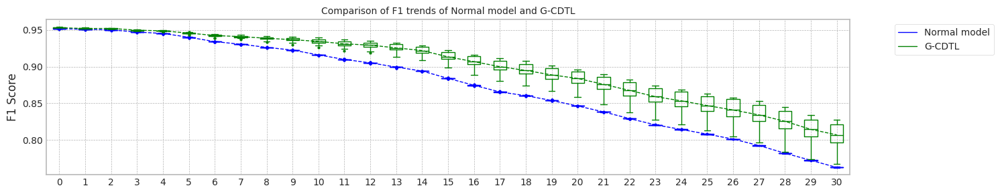

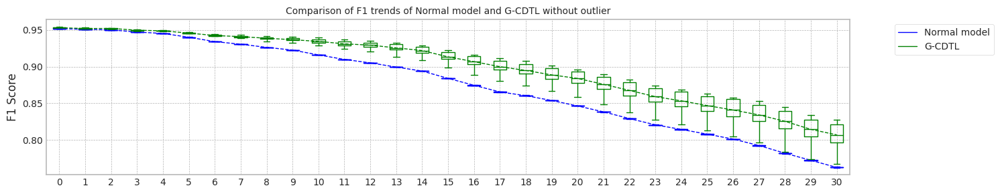

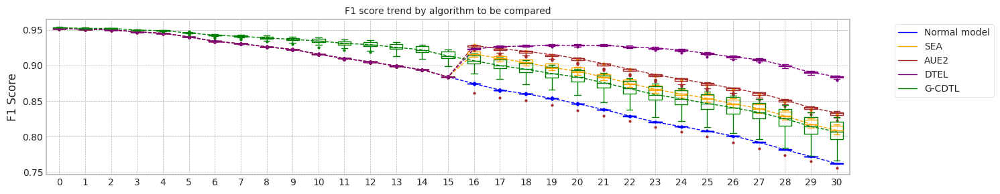

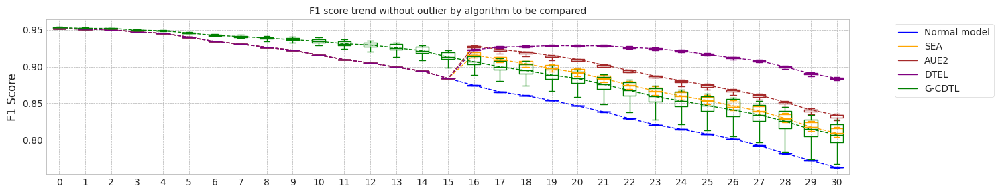

max_mean_trial= 17


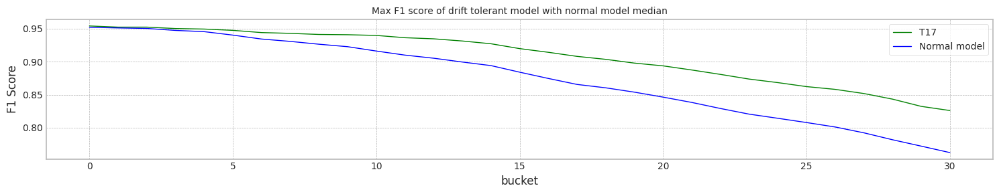

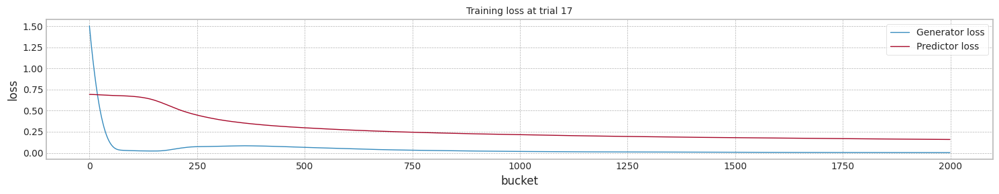

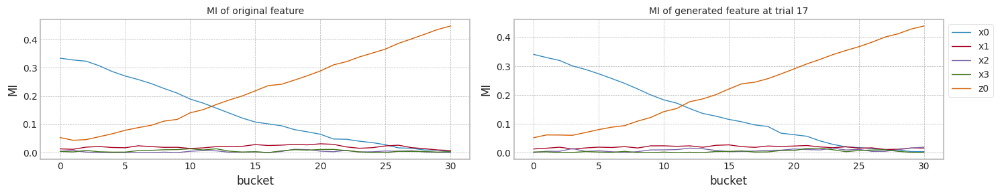

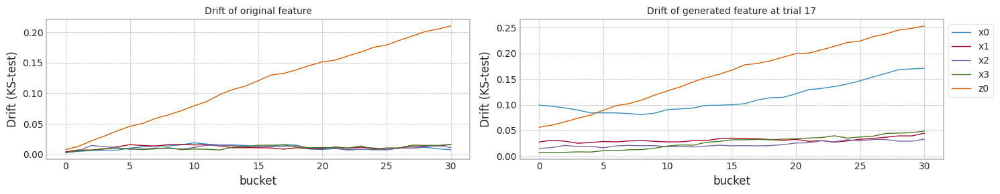

@ Normal model


,Trial,Testset F1,Initial F1,Mean F1,Last F1,Elapsed time
0,0.0,0.951908,0.950953,0.875075,0.762278,5.823480
1,1.0,0.951879,0.951018,0.875061,0.762534,5.736591
2,2.0,0.952125,0.951358,0.875453,0.763164,5.734471
3,3.0,0.952097,0.951236,0.874987,0.762139,5.837302
4,4.0,0.951300,0.950741,0.875352,0.762984,5.733167
5,5.0,0.950686,0.949940,0.874657,0.762981,5.759578
6,6.0,0.951813,0.950859,0.875071,0.762363,5.732823
7,7.0,0.951813,0.950859,0.875079,0.762278,5.799586
8,8.0,0.951635,0.950862,0.874464,0.762564,5.677010
9,9.0,0.951804,0.950745,0.875005,0.762854,5.693608


@ SEA


,Trial,Testset F1,Initial F1,Mean F1,Last F1,Elapsed time
0,0.0,0.951908,0.950953,0.894586,0.803419,10.621570
1,1.0,0.951879,0.951018,0.896929,0.809327,8.108418
2,2.0,0.952125,0.951358,0.906161,0.831817,10.490725
3,3.0,0.952097,0.951236,0.896437,0.808545,7.857507
4,4.0,0.951300,0.950741,0.905593,0.829331,7.409191
5,5.0,0.950686,0.949940,0.896376,0.808955,8.429265
6,6.0,0.951813,0.950859,0.896542,0.808496,8.679169
7,7.0,0.951813,0.950859,0.897307,0.809879,7.860363
8,8.0,0.951635,0.950862,0.899592,0.817507,8.421881
9,9.0,0.951804,0.950745,0.906239,0.832367,8.231530


@ AUE2


,Trial,Testset F1,Initial F1,Mean F1,Last F1,Elapsed time
0,0.0,0.951908,0.950953,0.906546,0.833871,7.743775
1,1.0,0.951879,0.951018,0.906585,0.833890,8.860106
2,2.0,0.952125,0.951358,0.903195,0.826807,7.634755
3,3.0,0.952097,0.951236,0.906724,0.834658,7.936076
4,4.0,0.951300,0.950741,0.903348,0.826886,8.953496
5,5.0,0.950686,0.949940,0.906399,0.834985,7.875093
6,6.0,0.951813,0.950859,0.906106,0.831665,10.778219
7,7.0,0.951813,0.950859,0.906174,0.832124,10.805333
8,8.0,0.951635,0.950862,0.906192,0.833640,7.576802
9,9.0,0.951804,0.950745,0.903217,0.826514,8.318400


@ DTEL


,Trial,Testset F1,Initial F1,Mean F1,Last F1,Elapsed time
0,0.0,0.951908,0.950953,0.921219,0.884870,12.281847
1,1.0,0.951879,0.951018,0.921225,0.885594,15.122812
2,2.0,0.952125,0.951358,0.920925,0.881950,12.770423
3,3.0,0.952097,0.951236,0.920905,0.884922,15.178907
4,4.0,0.951300,0.950741,0.921259,0.883067,12.100344
5,5.0,0.950686,0.949940,0.921196,0.885060,11.655693
6,6.0,0.951813,0.950859,0.920814,0.882829,12.862363
7,7.0,0.951813,0.950859,0.921262,0.886235,11.713612
8,8.0,0.951635,0.950862,0.920597,0.884824,13.124941
9,9.0,0.951804,0.950745,0.920622,0.881527,15.391804


@ G-CDTL


,Trial,Testset F1,Initial F1,Mean F1,Last F1,Elapsed time
0,0.0,0.952466,0.951205,0.898522,0.800832,5.795911
1,1.0,0.952333,0.951266,0.897082,0.795661,5.749148
2,2.0,0.953690,0.952932,0.908081,0.826087,5.836367
3,3.0,0.953581,0.952296,0.899933,0.807232,6.011221
4,4.0,0.953094,0.952124,0.906210,0.815881,5.829856
5,5.0,0.953215,0.952343,0.896286,0.798269,5.867585
6,6.0,0.953054,0.952096,0.900178,0.804317,5.695112
7,7.0,0.952694,0.951137,0.908294,0.820935,5.754608
8,8.0,0.953761,0.952835,0.907833,0.827794,5.700479
9,9.0,0.954478,0.953046,0.900030,0.806533,5.787069


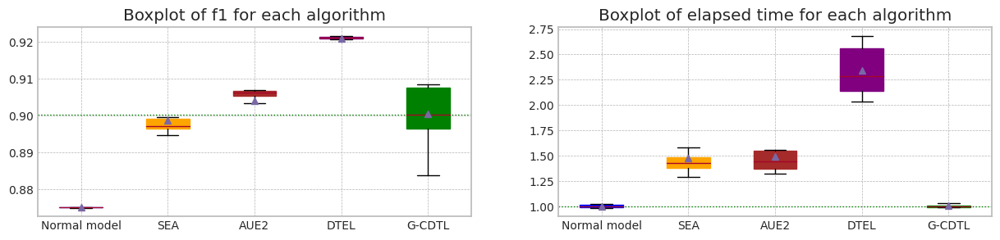

In [60]:
_,_,_,_,_,_ = drift_tolerant2(X1, Y1,train_size, test_size,avaible_range = 300,lambda_f2=0.8,trial_count=20,weight_init=True)


## synthetic data의 생성 (Case #4 MI의 고정, Drift의 증가)

+ $P_t(y|X) = P_{t+w}(y|X)$ and $P_t(X) \ne P_{t+w}(X)$
+ Virtual Drift
+ 즉, Concept (본 Dataset에서 MI의 변화)의 변화는 없고, P(X)만 변함.

### Dataset 준비

In [61]:
seed_everything()

data_size = 40000
cor = np.asarray([1.5, 1.2, 0.9 , 0.7, 0.5])

y3= (np.random.normal(0.5,0.5,data_size) > 0.5).astype(int)
x3 = np.zeros((data_size,5))
for ix,cor_ in enumerate(cor):
    '''
    x3[:,ix] = y3 + np.random.normal(1,cor_,data_size)
    '''
    # z0
    if ix == 4:
        for ii in range(len(y3)):
            x3[ii,ix] = y3[ii] + np.random.normal(0.0 + 4*ii/data_size,cor_)
    else:
        x3[:,ix] = y3 + np.random.normal(1,cor_,data_size)


### 실험

MI Analysis MI Max 0.20278, Min 0.05089, Mean 0.11172, Std 0.05282
Dataset structure X_train, (9000, 5) X_test, (9000, 5) X_live (39000, 5)
Truncate 8000 rows from live_set (39000, 5)
Search MI & Drift...for X_live_set (31, 9000, 5)


100%|██████████| 31/31 [00:05<00:00,  5.49it/s]


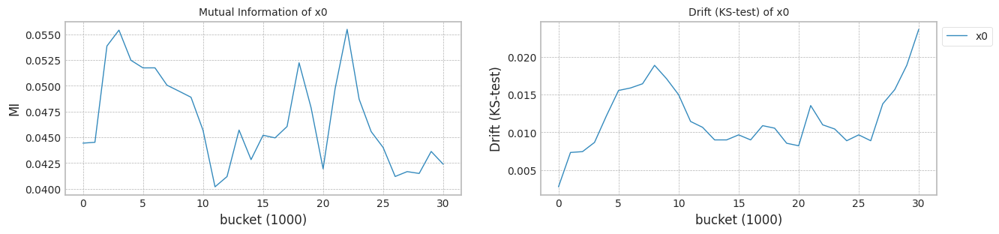

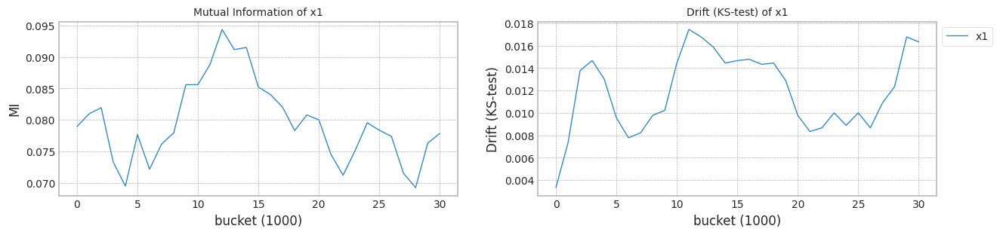

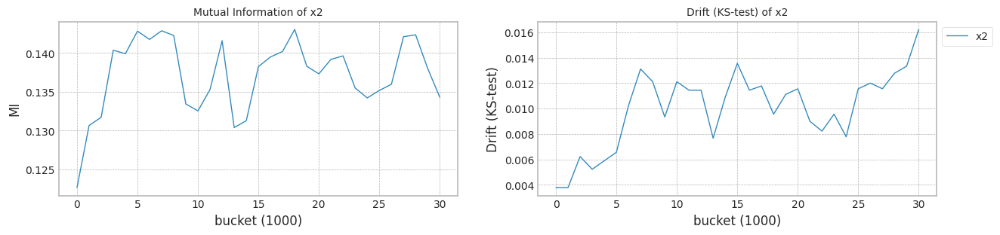

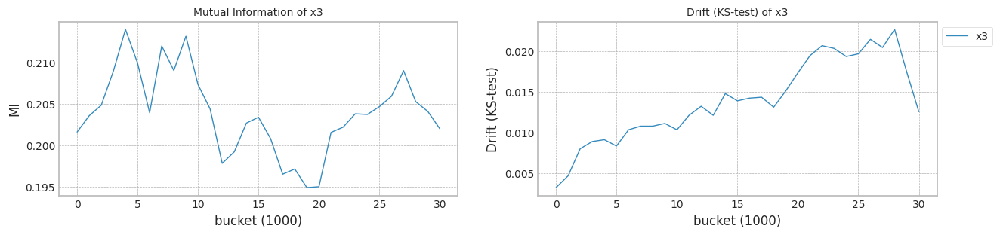

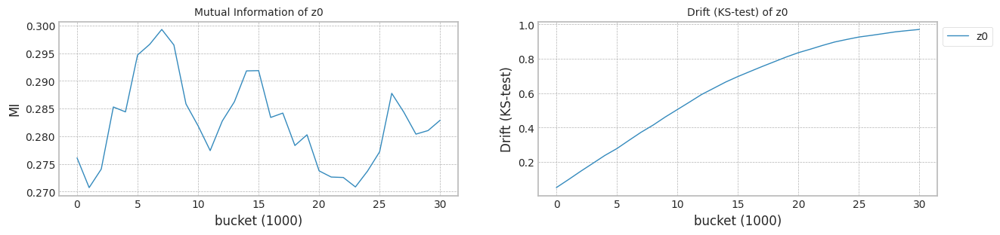

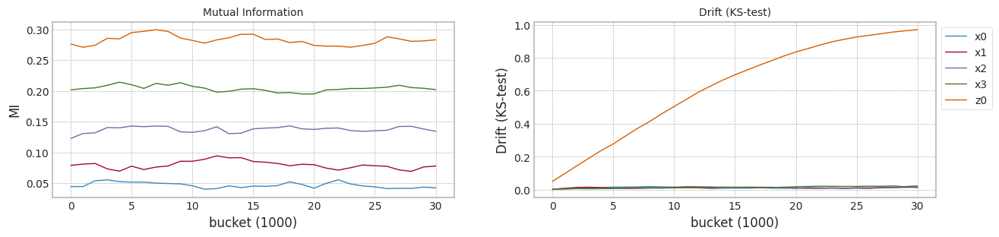

In [62]:
columns=['x0','x1','x2','x3','z0']
X3 = pd.DataFrame(x3,columns=columns)

train_size = 9000
test_size = 1000

X1,Y1 = check_mi_drift(X3, y3,train_size, test_size)

In [63]:
bucket_size = 1000
X1['b'] = [int(b/bucket_size) for b in X1.index.values]
X1

,x0,x1,x2,x3,z0,b
0,0.520974,0.392205,0.600995,0.478669,0.477486,0
1,0.447230,0.556479,0.629077,0.735705,0.578715,0
2,0.489501,0.704159,0.760582,0.582973,0.354045,0
3,0.581446,0.301839,0.443337,0.515173,0.360338,0
4,0.571642,0.639275,0.524701,0.583380,0.597569,0
...,...,...,...,...,...,...
39995,0.346158,0.267147,0.513105,0.599663,0.989291,39
39996,0.426322,0.302644,0.484909,0.587518,1.004704,39
39997,0.374186,0.587769,0.624447,0.598315,1.321791,39
39998,0.470439,0.265430,0.218971,0.645349,1.148847,39


trial_count: 20
lambda_f2 0.8
######################### Trial 0 for Normal model ###########################
cuda:0


100%|██████████| 2000/2000 [00:03<00:00, 638.83it/s]


Test f1 score: 0.9124214177324951
X_live.shape (39000, 6)
Truncate 8000 rows from live_set (39000, 6)
Search MI & Drift...for X_live_set torch.Size([31, 9000, 6])


100%|██████████| 31/31 [00:05<00:00,  5.53it/s]


mean of drift:
x0    0.011903
x1    0.011896
x2    0.010036
x3    0.013871
z0    0.624315
dtype: float64
Mean F1 for all data: 0.7697506691980245
######################### Trial 0 for Drift tolerant model ###########################
cuda:0


100%|██████████| 2000/2000 [00:08<00:00, 231.78it/s]


Test f1 score: 0.9211426050512848
X_live.shape (39000, 6)
Truncate 8000 rows from live_set (39000, 6)
Search MI & Drift...for X_live_set torch.Size([31, 9000, 6])


100%|██████████| 31/31 [00:05<00:00,  5.23it/s]


mean of drift:
x0    0.028670
x1    0.170516
x2    0.466821
x3    0.207470
z0    0.466179
dtype: float64
Mean F1 for all data: 0.9243617757304202
Normal model median        : 0.7697506691980245
Drift tolerant model median: 0.9243617757304202
######################### Trial 1 for Normal model ###########################
cuda:0


100%|██████████| 2000/2000 [00:03<00:00, 644.49it/s]


Test f1 score: 0.9116945107398569
X_live.shape (39000, 6)
Truncate 8000 rows from live_set (39000, 6)
Search MI & Drift...for X_live_set torch.Size([31, 9000, 6])


100%|██████████| 31/31 [00:05<00:00,  5.43it/s]


mean of drift:
x0    0.011903
x1    0.011896
x2    0.010036
x3    0.013871
z0    0.624315
dtype: float64
Mean F1 for all data: 0.769608074571154
######################### Trial 1 for Drift tolerant model ###########################
cuda:0


100%|██████████| 2000/2000 [00:08<00:00, 233.39it/s]


Test f1 score: 0.9232801320858557
X_live.shape (39000, 6)
Truncate 8000 rows from live_set (39000, 6)
Search MI & Drift...for X_live_set torch.Size([31, 9000, 6])


100%|██████████| 31/31 [00:05<00:00,  5.48it/s]


mean of drift:
x0    0.435233
x1    0.372563
x2    0.196269
x3    0.208283
z0    0.533878
dtype: float64
Mean F1 for all data: 0.871959977600824
Normal model median        : 0.7696793718845892
Drift tolerant model median: 0.8981608766656222
######################### Trial 2 for Normal model ###########################
cuda:0


100%|██████████| 2000/2000 [00:03<00:00, 644.92it/s]


Test f1 score: 0.9116147923218739
X_live.shape (39000, 6)
Truncate 8000 rows from live_set (39000, 6)
Search MI & Drift...for X_live_set torch.Size([31, 9000, 6])


100%|██████████| 31/31 [00:05<00:00,  5.30it/s]


mean of drift:
x0    0.011903
x1    0.011896
x2    0.010036
x3    0.013871
z0    0.624315
dtype: float64
Mean F1 for all data: 0.7695735712097388
######################### Trial 2 for Drift tolerant model ###########################
cuda:0


100%|██████████| 2000/2000 [00:08<00:00, 234.20it/s]


Test f1 score: 0.9219265449747085
X_live.shape (39000, 6)
Truncate 8000 rows from live_set (39000, 6)
Search MI & Drift...for X_live_set torch.Size([31, 9000, 6])


100%|██████████| 31/31 [00:05<00:00,  5.47it/s]


mean of drift:
x0    0.224896
x1    0.469380
x2    0.237416
x3    0.241376
z0    0.518692
dtype: float64
Mean F1 for all data: 0.9066210177004871
Normal model median        : 0.769608074571154
Drift tolerant model median: 0.9066210177004871
######################### Trial 3 for Normal model ###########################
cuda:0


100%|██████████| 2000/2000 [00:03<00:00, 646.70it/s]


Test f1 score: 0.9120295042846297
X_live.shape (39000, 6)
Truncate 8000 rows from live_set (39000, 6)
Search MI & Drift...for X_live_set torch.Size([31, 9000, 6])


100%|██████████| 31/31 [00:05<00:00,  5.43it/s]


mean of drift:
x0    0.011903
x1    0.011896
x2    0.010036
x3    0.013871
z0    0.624315
dtype: float64
Mean F1 for all data: 0.7698832530161176
######################### Trial 3 for Drift tolerant model ###########################
cuda:0


100%|██████████| 2000/2000 [00:08<00:00, 229.93it/s]


Test f1 score: 0.9206349206349207
X_live.shape (39000, 6)
Truncate 8000 rows from live_set (39000, 6)
Search MI & Drift...for X_live_set torch.Size([31, 9000, 6])


100%|██████████| 31/31 [00:05<00:00,  5.49it/s]


mean of drift:
x0    0.239341
x1    0.483649
x2    0.190659
x3    0.085233
z0    0.436724
dtype: float64
Mean F1 for all data: 0.9251350425591969
Normal model median        : 0.7696793718845892
Drift tolerant model median: 0.9154913967154537
######################### Trial 4 for Normal model ###########################
cuda:0


100%|██████████| 2000/2000 [00:03<00:00, 642.16it/s]


Test f1 score: 0.9122199372226432
X_live.shape (39000, 6)
Truncate 8000 rows from live_set (39000, 6)
Search MI & Drift...for X_live_set torch.Size([31, 9000, 6])


100%|██████████| 31/31 [00:05<00:00,  5.51it/s]


mean of drift:
x0    0.011903
x1    0.011896
x2    0.010036
x3    0.013871
z0    0.624315
dtype: float64
Mean F1 for all data: 0.768067119369189
######################### Trial 4 for Drift tolerant model ###########################
cuda:0


100%|██████████| 2000/2000 [00:08<00:00, 231.50it/s]


Test f1 score: 0.9205224706663715
X_live.shape (39000, 6)
Truncate 8000 rows from live_set (39000, 6)
Search MI & Drift...for X_live_set torch.Size([31, 9000, 6])


100%|██████████| 31/31 [00:05<00:00,  5.19it/s]


mean of drift:
x0    0.113039
x1    0.156480
x2    0.067616
x3    0.111047
z0    0.277509
dtype: float64
Mean F1 for all data: 0.9244529518421891
Normal model median        : 0.769608074571154
Drift tolerant model median: 0.9243617757304202
######################### Trial 5 for Normal model ###########################
cuda:0


100%|██████████| 2000/2000 [00:03<00:00, 618.07it/s]


Test f1 score: 0.9118699186991871
X_live.shape (39000, 6)
Truncate 8000 rows from live_set (39000, 6)
Search MI & Drift...for X_live_set torch.Size([31, 9000, 6])


100%|██████████| 31/31 [00:05<00:00,  5.47it/s]


mean of drift:
x0    0.011903
x1    0.011896
x2    0.010036
x3    0.013871
z0    0.624315
dtype: float64
Mean F1 for all data: 0.769468251390254
######################### Trial 5 for Drift tolerant model ###########################
cuda:0


100%|██████████| 2000/2000 [00:08<00:00, 232.67it/s]


Test f1 score: 0.9215384615384615
X_live.shape (39000, 6)
Truncate 8000 rows from live_set (39000, 6)
Search MI & Drift...for X_live_set torch.Size([31, 9000, 6])


100%|██████████| 31/31 [00:05<00:00,  5.47it/s]


mean of drift:
x0    0.115631
x1    0.509072
x2    0.115430
x3    0.182728
z0    0.455061
dtype: float64
Mean F1 for all data: 0.9252878961889663
Normal model median        : 0.7695908228904464
Drift tolerant model median: 0.9244073637863046
######################### Trial 6 for Normal model ###########################
cuda:0


100%|██████████| 2000/2000 [00:03<00:00, 638.30it/s]


Test f1 score: 0.9114391143911439
X_live.shape (39000, 6)
Truncate 8000 rows from live_set (39000, 6)
Search MI & Drift...for X_live_set torch.Size([31, 9000, 6])


100%|██████████| 31/31 [00:05<00:00,  5.43it/s]


mean of drift:
x0    0.011903
x1    0.011896
x2    0.010036
x3    0.013871
z0    0.624315
dtype: float64
Mean F1 for all data: 0.7703454451004218
######################### Trial 6 for Drift tolerant model ###########################
cuda:0


100%|██████████| 2000/2000 [00:08<00:00, 233.82it/s]


Test f1 score: 0.9224660858056688
X_live.shape (39000, 6)
Truncate 8000 rows from live_set (39000, 6)
Search MI & Drift...for X_live_set torch.Size([31, 9000, 6])


100%|██████████| 31/31 [00:05<00:00,  5.47it/s]


mean of drift:
x0    0.518624
x1    0.263398
x2    0.251875
x3    0.159090
z0    0.479029
dtype: float64
Mean F1 for all data: 0.9007188040050669
Normal model median        : 0.769608074571154
Drift tolerant model median: 0.9243617757304202
######################### Trial 7 for Normal model ###########################
cuda:0


100%|██████████| 2000/2000 [00:03<00:00, 641.29it/s]


Test f1 score: 0.9117519514310496
X_live.shape (39000, 6)
Truncate 8000 rows from live_set (39000, 6)
Search MI & Drift...for X_live_set torch.Size([31, 9000, 6])


100%|██████████| 31/31 [00:05<00:00,  5.47it/s]


mean of drift:
x0    0.011903
x1    0.011896
x2    0.010036
x3    0.013871
z0    0.624315
dtype: float64
Mean F1 for all data: 0.7696256421241688
######################### Trial 7 for Drift tolerant model ###########################
cuda:0


100%|██████████| 2000/2000 [00:08<00:00, 232.74it/s]


Test f1 score: 0.9211800968736239
X_live.shape (39000, 6)
Truncate 8000 rows from live_set (39000, 6)
Search MI & Drift...for X_live_set torch.Size([31, 9000, 6])


100%|██████████| 31/31 [00:05<00:00,  5.48it/s]


mean of drift:
x0    0.099147
x1    0.274986
x2    0.391018
x3    0.166649
z0    0.418577
dtype: float64
Mean F1 for all data: 0.9236151463332957
Normal model median        : 0.7696168583476615
Drift tolerant model median: 0.9239884610318579
######################### Trial 8 for Normal model ###########################
cuda:0


100%|██████████| 2000/2000 [00:03<00:00, 639.67it/s]


Test f1 score: 0.911790203727785
X_live.shape (39000, 6)
Truncate 8000 rows from live_set (39000, 6)
Search MI & Drift...for X_live_set torch.Size([31, 9000, 6])


100%|██████████| 31/31 [00:05<00:00,  5.48it/s]


mean of drift:
x0    0.011903
x1    0.011896
x2    0.010036
x3    0.013871
z0    0.624315
dtype: float64
Mean F1 for all data: 0.7700464471743145
######################### Trial 8 for Drift tolerant model ###########################
cuda:0


100%|██████████| 2000/2000 [00:08<00:00, 235.08it/s]


Test f1 score: 0.9219420896179676
X_live.shape (39000, 6)
Truncate 8000 rows from live_set (39000, 6)
Search MI & Drift...for X_live_set torch.Size([31, 9000, 6])


100%|██████████| 31/31 [00:05<00:00,  5.35it/s]


mean of drift:
x0    0.513129
x1    0.157022
x2    0.149803
x3    0.194143
z0    0.443470
dtype: float64
Mean F1 for all data: 0.9220890545676951
Normal model median        : 0.7696256421241688
Drift tolerant model median: 0.9236151463332957
######################### Trial 9 for Normal model ###########################
cuda:0


100%|██████████| 2000/2000 [00:03<00:00, 642.19it/s]


Test f1 score: 0.9115572436245252
X_live.shape (39000, 6)
Truncate 8000 rows from live_set (39000, 6)
Search MI & Drift...for X_live_set torch.Size([31, 9000, 6])


100%|██████████| 31/31 [00:05<00:00,  5.52it/s]


mean of drift:
x0    0.011903
x1    0.011896
x2    0.010036
x3    0.013871
z0    0.624315
dtype: float64
Mean F1 for all data: 0.7702715163160048
######################### Trial 9 for Drift tolerant model ###########################
cuda:0


100%|██████████| 2000/2000 [00:08<00:00, 235.66it/s]


Test f1 score: 0.9233648975996476
X_live.shape (39000, 6)
Truncate 8000 rows from live_set (39000, 6)
Search MI & Drift...for X_live_set torch.Size([31, 9000, 6])


100%|██████████| 31/31 [00:05<00:00,  5.46it/s]


mean of drift:
x0    0.439649
x1    0.389129
x2    0.137806
x3    0.220136
z0    0.468362
dtype: float64
Mean F1 for all data: 0.9242069438204863
Normal model median        : 0.7696881556610966
Drift tolerant model median: 0.923911045076891
######################### Trial 10 for Normal model ###########################
cuda:0


100%|██████████| 2000/2000 [00:03<00:00, 631.53it/s]


Test f1 score: 0.9116914075197745
X_live.shape (39000, 6)
Truncate 8000 rows from live_set (39000, 6)
Search MI & Drift...for X_live_set torch.Size([31, 9000, 6])


100%|██████████| 31/31 [00:05<00:00,  5.35it/s]


mean of drift:
x0    0.011903
x1    0.011896
x2    0.010036
x3    0.013871
z0    0.624315
dtype: float64
Mean F1 for all data: 0.7699092431685476
######################### Trial 10 for Drift tolerant model ###########################
cuda:0


100%|██████████| 2000/2000 [00:08<00:00, 235.72it/s]


Test f1 score: 0.922279792746114
X_live.shape (39000, 6)
Truncate 8000 rows from live_set (39000, 6)
Search MI & Drift...for X_live_set torch.Size([31, 9000, 6])


100%|██████████| 31/31 [00:05<00:00,  5.18it/s]


mean of drift:
x0    0.529344
x1    0.089961
x2    0.162699
x3    0.162505
z0    0.450792
dtype: float64
Mean F1 for all data: 0.9250802953259953
Normal model median        : 0.7697506691980245
Drift tolerant model median: 0.9242069438204863
######################### Trial 11 for Normal model ###########################
cuda:0


100%|██████████| 2000/2000 [00:03<00:00, 632.08it/s]


Test f1 score: 0.9116753472222222
X_live.shape (39000, 6)
Truncate 8000 rows from live_set (39000, 6)
Search MI & Drift...for X_live_set torch.Size([31, 9000, 6])


100%|██████████| 31/31 [00:05<00:00,  5.49it/s]


mean of drift:
x0    0.011903
x1    0.011896
x2    0.010036
x3    0.013871
z0    0.624315
dtype: float64
Mean F1 for all data: 0.770284023873014
######################### Trial 11 for Drift tolerant model ###########################
cuda:0


100%|██████████| 2000/2000 [00:08<00:00, 231.72it/s]


Test f1 score: 0.9220309244434698
X_live.shape (39000, 6)
Truncate 8000 rows from live_set (39000, 6)
Search MI & Drift...for X_live_set torch.Size([31, 9000, 6])


100%|██████████| 31/31 [00:05<00:00,  5.44it/s]


mean of drift:
x0    0.432151
x1    0.170348
x2    0.422792
x3    0.187606
z0    0.433297
dtype: float64
Mean F1 for all data: 0.9035935153135092
Normal model median        : 0.7698169611070711
Drift tolerant model median: 0.923911045076891
######################### Trial 12 for Normal model ###########################
cuda:0


100%|██████████| 2000/2000 [00:03<00:00, 644.54it/s]


Test f1 score: 0.9112990674474083
X_live.shape (39000, 6)
Truncate 8000 rows from live_set (39000, 6)
Search MI & Drift...for X_live_set torch.Size([31, 9000, 6])


100%|██████████| 31/31 [00:05<00:00,  5.52it/s]


mean of drift:
x0    0.011903
x1    0.011896
x2    0.010036
x3    0.013871
z0    0.624315
dtype: float64
Mean F1 for all data: 0.7684139055167575
######################### Trial 12 for Drift tolerant model ###########################
cuda:0


100%|██████████| 2000/2000 [00:08<00:00, 233.27it/s]


Test f1 score: 0.9214994487320838
X_live.shape (39000, 6)
Truncate 8000 rows from live_set (39000, 6)
Search MI & Drift...for X_live_set torch.Size([31, 9000, 6])


100%|██████████| 31/31 [00:05<00:00,  5.31it/s]


mean of drift:
x0    0.235864
x1    0.190090
x2    0.400222
x3    0.212864
z0    0.411448
dtype: float64
Mean F1 for all data: 0.9220990637565042
Normal model median        : 0.7697506691980245
Drift tolerant model median: 0.9236151463332957
######################### Trial 13 for Normal model ###########################
cuda:0


100%|██████████| 2000/2000 [00:03<00:00, 640.70it/s]


Test f1 score: 0.9117136659436008
X_live.shape (39000, 6)
Truncate 8000 rows from live_set (39000, 6)
Search MI & Drift...for X_live_set torch.Size([31, 9000, 6])


100%|██████████| 31/31 [00:05<00:00,  5.54it/s]


mean of drift:
x0    0.011903
x1    0.011896
x2    0.010036
x3    0.013871
z0    0.624315
dtype: float64
Mean F1 for all data: 0.7696312908047219
######################### Trial 13 for Drift tolerant model ###########################
cuda:0


100%|██████████| 2000/2000 [00:08<00:00, 237.36it/s]


Test f1 score: 0.9209621993127148
X_live.shape (39000, 6)
Truncate 8000 rows from live_set (39000, 6)
Search MI & Drift...for X_live_set torch.Size([31, 9000, 6])


100%|██████████| 31/31 [00:05<00:00,  5.36it/s]


mean of drift:
x0    0.538832
x1    0.286828
x2    0.265376
x3    0.101584
z0    0.497391
dtype: float64
Mean F1 for all data: 0.9245717424704997
Normal model median        : 0.7696909800013731
Drift tolerant model median: 0.923911045076891
######################### Trial 14 for Normal model ###########################
cuda:0


100%|██████████| 2000/2000 [00:03<00:00, 643.67it/s]


Test f1 score: 0.9117551286225986
X_live.shape (39000, 6)
Truncate 8000 rows from live_set (39000, 6)
Search MI & Drift...for X_live_set torch.Size([31, 9000, 6])


100%|██████████| 31/31 [00:05<00:00,  5.38it/s]


mean of drift:
x0    0.011903
x1    0.011896
x2    0.010036
x3    0.013871
z0    0.624315
dtype: float64
Mean F1 for all data: 0.7706551438132474
######################### Trial 14 for Drift tolerant model ###########################
cuda:0


100%|██████████| 2000/2000 [00:08<00:00, 237.23it/s]


Test f1 score: 0.9224669603524229
X_live.shape (39000, 6)
Truncate 8000 rows from live_set (39000, 6)
Search MI & Drift...for X_live_set torch.Size([31, 9000, 6])


100%|██████████| 31/31 [00:05<00:00,  5.43it/s]


mean of drift:
x0    0.269932
x1    0.253434
x2    0.377391
x3    0.135247
z0    0.371656
dtype: float64
Mean F1 for all data: 0.9242993923443135
Normal model median        : 0.7697506691980245
Drift tolerant model median: 0.9242069438204863
######################### Trial 15 for Normal model ###########################
cuda:0


100%|██████████| 2000/2000 [00:03<00:00, 640.56it/s]


Test f1 score: 0.9121856027753685
X_live.shape (39000, 6)
Truncate 8000 rows from live_set (39000, 6)
Search MI & Drift...for X_live_set torch.Size([31, 9000, 6])


100%|██████████| 31/31 [00:05<00:00,  5.42it/s]


mean of drift:
x0    0.011903
x1    0.011896
x2    0.010036
x3    0.013871
z0    0.624315
dtype: float64
Mean F1 for all data: 0.769554252062509
######################### Trial 15 for Drift tolerant model ###########################
cuda:0


100%|██████████| 2000/2000 [00:08<00:00, 233.86it/s]


Test f1 score: 0.9216508497020525
X_live.shape (39000, 6)
Truncate 8000 rows from live_set (39000, 6)
Search MI & Drift...for X_live_set torch.Size([31, 9000, 6])


100%|██████████| 31/31 [00:05<00:00,  5.50it/s]


mean of drift:
x0    0.587011
x1    0.211376
x2    0.097796
x3    0.221330
z0    0.531057
dtype: float64
Mean F1 for all data: 0.9235709772681875
Normal model median        : 0.7696909800013731
Drift tolerant model median: 0.923911045076891
######################### Trial 16 for Normal model ###########################
cuda:0


100%|██████████| 2000/2000 [00:03<00:00, 647.53it/s]


Test f1 score: 0.9116753472222222
X_live.shape (39000, 6)
Truncate 8000 rows from live_set (39000, 6)
Search MI & Drift...for X_live_set torch.Size([31, 9000, 6])


100%|██████████| 31/31 [00:05<00:00,  5.49it/s]


mean of drift:
x0    0.011903
x1    0.011896
x2    0.010036
x3    0.013871
z0    0.624315
dtype: float64
Mean F1 for all data: 0.7703145744552067
######################### Trial 16 for Drift tolerant model ###########################
cuda:0


100%|██████████| 2000/2000 [00:08<00:00, 233.23it/s]


Test f1 score: 0.9213284784287764
X_live.shape (39000, 6)
Truncate 8000 rows from live_set (39000, 6)
Search MI & Drift...for X_live_set torch.Size([31, 9000, 6])


100%|██████████| 31/31 [00:05<00:00,  5.26it/s]


mean of drift:
x0    0.144082
x1    0.529480
x2    0.281860
x3    0.084509
z0    0.497154
dtype: float64
Mean F1 for all data: 0.924893320569749
Normal model median        : 0.7697506691980245
Drift tolerant model median: 0.9242069438204863
######################### Trial 17 for Normal model ###########################
cuda:0


100%|██████████| 2000/2000 [00:03<00:00, 609.87it/s]


Test f1 score: 0.9117934251925789
X_live.shape (39000, 6)
Truncate 8000 rows from live_set (39000, 6)
Search MI & Drift...for X_live_set torch.Size([31, 9000, 6])


100%|██████████| 31/31 [00:05<00:00,  5.55it/s]


mean of drift:
x0    0.011903
x1    0.011896
x2    0.010036
x3    0.013871
z0    0.624315
dtype: float64
Mean F1 for all data: 0.7703452790082781
######################### Trial 17 for Drift tolerant model ###########################
cuda:0


100%|██████████| 2000/2000 [00:08<00:00, 238.37it/s]


Test f1 score: 0.9226019845644984
X_live.shape (39000, 6)
Truncate 8000 rows from live_set (39000, 6)
Search MI & Drift...for X_live_set torch.Size([31, 9000, 6])


100%|██████████| 31/31 [00:05<00:00,  5.45it/s]


mean of drift:
x0    0.148258
x1    0.509857
x2    0.130118
x3    0.173108
z0    0.459344
dtype: float64
Mean F1 for all data: 0.9251372787664621
Normal model median        : 0.7698169611070711
Drift tolerant model median: 0.9242531680823999
######################### Trial 18 for Normal model ###########################
cuda:0


100%|██████████| 2000/2000 [00:03<00:00, 640.69it/s]


Test f1 score: 0.9120867208672085
X_live.shape (39000, 6)
Truncate 8000 rows from live_set (39000, 6)
Search MI & Drift...for X_live_set torch.Size([31, 9000, 6])


100%|██████████| 31/31 [00:05<00:00,  5.45it/s]


mean of drift:
x0    0.011903
x1    0.011896
x2    0.010036
x3    0.013871
z0    0.624315
dtype: float64
Mean F1 for all data: 0.7699449858432589
######################### Trial 18 for Drift tolerant model ###########################
cuda:0


100%|██████████| 2000/2000 [00:08<00:00, 236.21it/s]


Test f1 score: 0.9211307886921131
X_live.shape (39000, 6)
Truncate 8000 rows from live_set (39000, 6)
Search MI & Drift...for X_live_set torch.Size([31, 9000, 6])


100%|██████████| 31/31 [00:05<00:00,  5.47it/s]


mean of drift:
x0    0.231434
x1    0.463405
x2    0.174290
x3    0.205211
z0    0.472294
dtype: float64
Mean F1 for all data: 0.9247997961806543
Normal model median        : 0.7698832530161176
Drift tolerant model median: 0.9242993923443135
######################### Trial 19 for Normal model ###########################
cuda:0


100%|██████████| 2000/2000 [00:03<00:00, 637.31it/s]


Test f1 score: 0.9119081157221802
X_live.shape (39000, 6)
Truncate 8000 rows from live_set (39000, 6)
Search MI & Drift...for X_live_set torch.Size([31, 9000, 6])


100%|██████████| 31/31 [00:05<00:00,  5.52it/s]


mean of drift:
x0    0.011903
x1    0.011896
x2    0.010036
x3    0.013871
z0    0.624315
dtype: float64
Mean F1 for all data: 0.7704449257400785
######################### Trial 19 for Drift tolerant model ###########################
cuda:0


100%|██████████| 2000/2000 [00:08<00:00, 234.69it/s]


Test f1 score: 0.9222161272627537
X_live.shape (39000, 6)
Truncate 8000 rows from live_set (39000, 6)
Search MI & Drift...for X_live_set torch.Size([31, 9000, 6])


100%|██████████| 31/31 [00:05<00:00,  5.49it/s]


mean of drift:
x0    0.314975
x1    0.328817
x2    0.260642
x3    0.330179
z0    0.500692
dtype: float64
Mean F1 for all data: 0.8965541016770759
Normal model median        : 0.7698962480923326
Drift tolerant model median: 0.9242531680823999
######################### Trial 0 for Normal model ###########################
retrain_interval: 16
######################### Trial 0 for SEA ###########################
X_live.shape (39000, 6)
Truncate 8000 rows from live_set (39000, 6)
Search MI & Drift...for X_live_set torch.Size([31, 9000, 6])


100%|██████████| 31/31 [00:07<00:00,  3.95it/s]


Early stop at  1795.0
Mean of drift:
x0    0.011903
x1    0.011896
x2    0.010036
x3    0.013871
z0    0.624315
dtype: float64
Mean F1 for all data: 0.8115228405438047
SEA median: 0.8115228405438047
######################### Trial 0 for AUE ###########################
X_live.shape (39000, 6)
Truncate 8000 rows from live_set (39000, 6)
Search MI & Drift...for X_live_set torch.Size([31, 9000, 6])


100%|██████████| 31/31 [00:07<00:00,  4.11it/s]


Early stop at  1474.0
Mean of drift:
x0    0.011903
x1    0.011896
x2    0.010036
x3    0.013871
z0    0.624315
dtype: float64
Mean F1 for all data: 0.830245267430685
AUE median: 0.830245267430685
######################### Trial 0 for DTEL ###########################
X_live.shape (39000, 6)
Truncate 8000 rows from live_set (39000, 6)
Search MI & Drift...for X_live_set torch.Size([31, 9000, 6])


100%|██████████| 31/31 [00:12<00:00,  2.56it/s]


Early stop at  1373.0
Mean of drift:
x0    0.011903
x1    0.011896
x2    0.010036
x3    0.013871
z0    0.624315
dtype: float64
Mean F1 for all data: 0.8584953740291217
DTEL median: 0.8584953740291217
######################### Trial 1 for Normal model ###########################
retrain_interval: 16
######################### Trial 1 for SEA ###########################
X_live.shape (39000, 6)
Truncate 8000 rows from live_set (39000, 6)
Search MI & Drift...for X_live_set torch.Size([31, 9000, 6])


100%|██████████| 31/31 [00:08<00:00,  3.53it/s]


Early stop at  2216.0
Mean of drift:
x0    0.011903
x1    0.011896
x2    0.010036
x3    0.013871
z0    0.624315
dtype: float64
Mean F1 for all data: 0.8100482642519578
SEA median: 0.8107855523978813
######################### Trial 1 for AUE ###########################
X_live.shape (39000, 6)
Truncate 8000 rows from live_set (39000, 6)
Search MI & Drift...for X_live_set torch.Size([31, 9000, 6])


100%|██████████| 31/31 [00:08<00:00,  3.81it/s]


Early stop at  1860.0
Mean of drift:
x0    0.011903
x1    0.011896
x2    0.010036
x3    0.013871
z0    0.624315
dtype: float64
Mean F1 for all data: 0.8306014837387211
AUE median: 0.830423375584703
######################### Trial 1 for DTEL ###########################
X_live.shape (39000, 6)
Truncate 8000 rows from live_set (39000, 6)
Search MI & Drift...for X_live_set torch.Size([31, 9000, 6])


100%|██████████| 31/31 [00:14<00:00,  2.10it/s]


Early stop at  3382.0
Mean of drift:
x0    0.011903
x1    0.011896
x2    0.010036
x3    0.013871
z0    0.624315
dtype: float64
Mean F1 for all data: 0.8579107945026261
DTEL median: 0.8582030842658739
######################### Trial 2 for Normal model ###########################
retrain_interval: 16
######################### Trial 2 for SEA ###########################
X_live.shape (39000, 6)
Truncate 8000 rows from live_set (39000, 6)
Search MI & Drift...for X_live_set torch.Size([31, 9000, 6])


100%|██████████| 31/31 [00:08<00:00,  3.53it/s]


Early stop at  2381.0
Mean of drift:
x0    0.011903
x1    0.011896
x2    0.010036
x3    0.013871
z0    0.624315
dtype: float64
Mean F1 for all data: 0.7977888262250381
SEA median: 0.8100482642519578
######################### Trial 2 for AUE ###########################
X_live.shape (39000, 6)
Truncate 8000 rows from live_set (39000, 6)
Search MI & Drift...for X_live_set torch.Size([31, 9000, 6])


100%|██████████| 31/31 [00:08<00:00,  3.50it/s]


Early stop at  2441.0
Mean of drift:
x0    0.011903
x1    0.011896
x2    0.010036
x3    0.013871
z0    0.624315
dtype: float64
Mean F1 for all data: 0.8301364083983597
AUE median: 0.830245267430685
######################### Trial 2 for DTEL ###########################
X_live.shape (39000, 6)
Truncate 8000 rows from live_set (39000, 6)
Search MI & Drift...for X_live_set torch.Size([31, 9000, 6])


100%|██████████| 31/31 [00:12<00:00,  2.54it/s]


Early stop at  1459.0
Mean of drift:
x0    0.011903
x1    0.011896
x2    0.010036
x3    0.013871
z0    0.624315
dtype: float64
Mean F1 for all data: 0.8577954509695822
DTEL median: 0.8579107945026261
######################### Trial 3 for Normal model ###########################
retrain_interval: 16
######################### Trial 3 for SEA ###########################
X_live.shape (39000, 6)
Truncate 8000 rows from live_set (39000, 6)
Search MI & Drift...for X_live_set torch.Size([31, 9000, 6])


100%|██████████| 31/31 [00:07<00:00,  4.29it/s]


Early stop at  1319.0
Mean of drift:
x0    0.011903
x1    0.011896
x2    0.010036
x3    0.013871
z0    0.624315
dtype: float64
Mean F1 for all data: 0.8101261113159611
SEA median: 0.8100871877839595
######################### Trial 3 for AUE ###########################
X_live.shape (39000, 6)
Truncate 8000 rows from live_set (39000, 6)
Search MI & Drift...for X_live_set torch.Size([31, 9000, 6])


100%|██████████| 31/31 [00:07<00:00,  4.17it/s]


Early stop at  1433.0
Mean of drift:
x0    0.011903
x1    0.011896
x2    0.010036
x3    0.013871
z0    0.624315
dtype: float64
Mean F1 for all data: 0.8307748313075448
AUE median: 0.830423375584703
######################### Trial 3 for DTEL ###########################
X_live.shape (39000, 6)
Truncate 8000 rows from live_set (39000, 6)
Search MI & Drift...for X_live_set torch.Size([31, 9000, 6])


100%|██████████| 31/31 [00:14<00:00,  2.09it/s]


Early stop at  3352.0
Mean of drift:
x0    0.011903
x1    0.011896
x2    0.010036
x3    0.013871
z0    0.624315
dtype: float64
Mean F1 for all data: 0.8584329003149563
DTEL median: 0.8581718474087912
######################### Trial 4 for Normal model ###########################
retrain_interval: 16
######################### Trial 4 for SEA ###########################
X_live.shape (39000, 6)
Truncate 8000 rows from live_set (39000, 6)
Search MI & Drift...for X_live_set torch.Size([31, 9000, 6])


100%|██████████| 31/31 [00:07<00:00,  4.37it/s]


Early stop at  1172.0
Mean of drift:
x0    0.011903
x1    0.011896
x2    0.010036
x3    0.013871
z0    0.624315
dtype: float64
Mean F1 for all data: 0.8259858198487471
SEA median: 0.8101261113159611
######################### Trial 4 for AUE ###########################
X_live.shape (39000, 6)
Truncate 8000 rows from live_set (39000, 6)
Search MI & Drift...for X_live_set torch.Size([31, 9000, 6])


100%|██████████| 31/31 [00:08<00:00,  3.78it/s]


Early stop at  2007.0
Mean of drift:
x0    0.011903
x1    0.011896
x2    0.010036
x3    0.013871
z0    0.624315
dtype: float64
Mean F1 for all data: 0.8252905922167224
AUE median: 0.830245267430685
######################### Trial 4 for DTEL ###########################
X_live.shape (39000, 6)
Truncate 8000 rows from live_set (39000, 6)
Search MI & Drift...for X_live_set torch.Size([31, 9000, 6])


100%|██████████| 31/31 [00:12<00:00,  2.50it/s]


Early stop at  1692.0
Mean of drift:
x0    0.011903
x1    0.011896
x2    0.010036
x3    0.013871
z0    0.624315
dtype: float64
Mean F1 for all data: 0.8565181077432215
DTEL median: 0.8579107945026261
######################### Trial 5 for Normal model ###########################
retrain_interval: 16
######################### Trial 5 for SEA ###########################
X_live.shape (39000, 6)
Truncate 8000 rows from live_set (39000, 6)
Search MI & Drift...for X_live_set torch.Size([31, 9000, 6])


100%|██████████| 31/31 [00:07<00:00,  4.01it/s]


Early stop at  1698.0
Mean of drift:
x0    0.011903
x1    0.011896
x2    0.010036
x3    0.013871
z0    0.624315
dtype: float64
Mean F1 for all data: 0.8106572052982278
SEA median: 0.8103916583070945
######################### Trial 5 for AUE ###########################
X_live.shape (39000, 6)
Truncate 8000 rows from live_set (39000, 6)
Search MI & Drift...for X_live_set torch.Size([31, 9000, 6])


100%|██████████| 31/31 [00:07<00:00,  4.13it/s]


Early stop at  1484.0
Mean of drift:
x0    0.011903
x1    0.011896
x2    0.010036
x3    0.013871
z0    0.624315
dtype: float64
Mean F1 for all data: 0.8300868483223423
AUE median: 0.8301908379145224
######################### Trial 5 for DTEL ###########################
X_live.shape (39000, 6)
Truncate 8000 rows from live_set (39000, 6)
Search MI & Drift...for X_live_set torch.Size([31, 9000, 6])


100%|██████████| 31/31 [00:12<00:00,  2.44it/s]


Early stop at  1822.0
Mean of drift:
x0    0.011903
x1    0.011896
x2    0.010036
x3    0.013871
z0    0.624315
dtype: float64
Mean F1 for all data: 0.8581793967644353
DTEL median: 0.8580450956335307
######################### Trial 6 for Normal model ###########################
retrain_interval: 16
######################### Trial 6 for SEA ###########################
X_live.shape (39000, 6)
Truncate 8000 rows from live_set (39000, 6)
Search MI & Drift...for X_live_set torch.Size([31, 9000, 6])


100%|██████████| 31/31 [00:07<00:00,  4.33it/s]


Early stop at  1180.0
Mean of drift:
x0    0.011903
x1    0.011896
x2    0.010036
x3    0.013871
z0    0.624315
dtype: float64
Mean F1 for all data: 0.8116880536220518
SEA median: 0.8106572052982278
######################### Trial 6 for AUE ###########################
X_live.shape (39000, 6)
Truncate 8000 rows from live_set (39000, 6)
Search MI & Drift...for X_live_set torch.Size([31, 9000, 6])


100%|██████████| 31/31 [00:10<00:00,  2.90it/s]


Early stop at  nan
Mean of drift:
x0    0.011903
x1    0.011896
x2    0.010036
x3    0.013871
z0    0.624315
dtype: float64
Mean F1 for all data: 0.8326795324973916
AUE median: 0.830245267430685
######################### Trial 6 for DTEL ###########################
X_live.shape (39000, 6)
Truncate 8000 rows from live_set (39000, 6)
Search MI & Drift...for X_live_set torch.Size([31, 9000, 6])


100%|██████████| 31/31 [00:11<00:00,  2.64it/s]


Early stop at  1144.0
Mean of drift:
x0    0.011903
x1    0.011896
x2    0.010036
x3    0.013871
z0    0.624315
dtype: float64
Mean F1 for all data: 0.8586204561404449
DTEL median: 0.8581793967644353
######################### Trial 7 for Normal model ###########################
retrain_interval: 16
######################### Trial 7 for SEA ###########################
X_live.shape (39000, 6)
Truncate 8000 rows from live_set (39000, 6)
Search MI & Drift...for X_live_set torch.Size([31, 9000, 6])


100%|██████████| 31/31 [00:10<00:00,  2.95it/s]


Early stop at  nan
Mean of drift:
x0    0.011903
x1    0.011896
x2    0.010036
x3    0.013871
z0    0.624315
dtype: float64
Mean F1 for all data: 0.8074932764161659
SEA median: 0.8103916583070945
######################### Trial 7 for AUE ###########################
X_live.shape (39000, 6)
Truncate 8000 rows from live_set (39000, 6)
Search MI & Drift...for X_live_set torch.Size([31, 9000, 6])


100%|██████████| 31/31 [00:10<00:00,  2.93it/s]


Early stop at  nan
Mean of drift:
x0    0.011903
x1    0.011896
x2    0.010036
x3    0.013871
z0    0.624315
dtype: float64
Mean F1 for all data: 0.8296017987395472
AUE median: 0.8301908379145224
######################### Trial 7 for DTEL ###########################
X_live.shape (39000, 6)
Truncate 8000 rows from live_set (39000, 6)
Search MI & Drift...for X_live_set torch.Size([31, 9000, 6])


100%|██████████| 31/31 [00:12<00:00,  2.55it/s]


Early stop at  1417.0
Mean of drift:
x0    0.011903
x1    0.011896
x2    0.010036
x3    0.013871
z0    0.624315
dtype: float64
Mean F1 for all data: 0.8574864141065538
DTEL median: 0.8580450956335307
######################### Trial 8 for Normal model ###########################
retrain_interval: 16
######################### Trial 8 for SEA ###########################
X_live.shape (39000, 6)
Truncate 8000 rows from live_set (39000, 6)
Search MI & Drift...for X_live_set torch.Size([31, 9000, 6])


100%|██████████| 31/31 [00:08<00:00,  3.76it/s]


Early stop at  2106.0
Mean of drift:
x0    0.011903
x1    0.011896
x2    0.010036
x3    0.013871
z0    0.624315
dtype: float64
Mean F1 for all data: 0.8109905492022533
SEA median: 0.8106572052982278
######################### Trial 8 for AUE ###########################
X_live.shape (39000, 6)
Truncate 8000 rows from live_set (39000, 6)
Search MI & Drift...for X_live_set torch.Size([31, 9000, 6])


100%|██████████| 31/31 [00:07<00:00,  4.04it/s]


Early stop at  1614.0
Mean of drift:
x0    0.011903
x1    0.011896
x2    0.010036
x3    0.013871
z0    0.624315
dtype: float64
Mean F1 for all data: 0.8308173823814176
AUE median: 0.830245267430685
######################### Trial 8 for DTEL ###########################
X_live.shape (39000, 6)
Truncate 8000 rows from live_set (39000, 6)
Search MI & Drift...for X_live_set torch.Size([31, 9000, 6])


100%|██████████| 31/31 [00:13<00:00,  2.37it/s]


Early stop at  1996.0
Mean of drift:
x0    0.011903
x1    0.011896
x2    0.010036
x3    0.013871
z0    0.624315
dtype: float64
Mean F1 for all data: 0.8584899749747555
DTEL median: 0.8581793967644353
######################### Trial 9 for Normal model ###########################
retrain_interval: 16
######################### Trial 9 for SEA ###########################
X_live.shape (39000, 6)
Truncate 8000 rows from live_set (39000, 6)
Search MI & Drift...for X_live_set torch.Size([31, 9000, 6])


100%|██████████| 31/31 [00:08<00:00,  3.79it/s]


Early stop at  2074.0
Mean of drift:
x0    0.011903
x1    0.011896
x2    0.010036
x3    0.013871
z0    0.624315
dtype: float64
Mean F1 for all data: 0.811578406931491
SEA median: 0.8108238772502405
######################### Trial 9 for AUE ###########################
X_live.shape (39000, 6)
Truncate 8000 rows from live_set (39000, 6)
Search MI & Drift...for X_live_set torch.Size([31, 9000, 6])


100%|██████████| 31/31 [00:07<00:00,  4.17it/s]


Early stop at  1357.0
Mean of drift:
x0    0.011903
x1    0.011896
x2    0.010036
x3    0.013871
z0    0.624315
dtype: float64
Mean F1 for all data: 0.8307441000748846
AUE median: 0.830423375584703
######################### Trial 9 for DTEL ###########################
X_live.shape (39000, 6)
Truncate 8000 rows from live_set (39000, 6)
Search MI & Drift...for X_live_set torch.Size([31, 9000, 6])


100%|██████████| 31/31 [00:14<00:00,  2.16it/s]


Early stop at  3210.0
Mean of drift:
x0    0.011903
x1    0.011896
x2    0.010036
x3    0.013871
z0    0.624315
dtype: float64
Mean F1 for all data: 0.8568489483256596
DTEL median: 0.8580450956335307
######################### Trial 10 for Normal model ###########################
retrain_interval: 16
######################### Trial 10 for SEA ###########################
X_live.shape (39000, 6)
Truncate 8000 rows from live_set (39000, 6)
Search MI & Drift...for X_live_set torch.Size([31, 9000, 6])


100%|██████████| 31/31 [00:08<00:00,  3.48it/s]


Early stop at  2577.0
Mean of drift:
x0    0.011903
x1    0.011896
x2    0.010036
x3    0.013871
z0    0.624315
dtype: float64
Mean F1 for all data: 0.7995170383876176
SEA median: 0.8106572052982278
######################### Trial 10 for AUE ###########################
X_live.shape (39000, 6)
Truncate 8000 rows from live_set (39000, 6)
Search MI & Drift...for X_live_set torch.Size([31, 9000, 6])


100%|██████████| 31/31 [00:08<00:00,  3.81it/s]


Early stop at  1894.0
Mean of drift:
x0    0.011903
x1    0.011896
x2    0.010036
x3    0.013871
z0    0.624315
dtype: float64
Mean F1 for all data: 0.8308885063077739
AUE median: 0.8306014837387211
######################### Trial 10 for DTEL ###########################
X_live.shape (39000, 6)
Truncate 8000 rows from live_set (39000, 6)
Search MI & Drift...for X_live_set torch.Size([31, 9000, 6])


100%|██████████| 31/31 [00:13<00:00,  2.29it/s]


Early stop at  2601.0
Mean of drift:
x0    0.011903
x1    0.011896
x2    0.010036
x3    0.013871
z0    0.624315
dtype: float64
Mean F1 for all data: 0.8583641564797264
DTEL median: 0.8581793967644353
######################### Trial 11 for Normal model ###########################
retrain_interval: 16
######################### Trial 11 for SEA ###########################
X_live.shape (39000, 6)
Truncate 8000 rows from live_set (39000, 6)
Search MI & Drift...for X_live_set torch.Size([31, 9000, 6])


100%|██████████| 31/31 [00:07<00:00,  3.99it/s]


Early stop at  1739.0
Mean of drift:
x0    0.011903
x1    0.011896
x2    0.010036
x3    0.013871
z0    0.624315
dtype: float64
Mean F1 for all data: 0.8103028208981816
SEA median: 0.8104800130982047
######################### Trial 11 for AUE ###########################
X_live.shape (39000, 6)
Truncate 8000 rows from live_set (39000, 6)
Search MI & Drift...for X_live_set torch.Size([31, 9000, 6])


100%|██████████| 31/31 [00:10<00:00,  2.91it/s]


Early stop at  nan
Mean of drift:
x0    0.011903
x1    0.011896
x2    0.010036
x3    0.013871
z0    0.624315
dtype: float64
Mean F1 for all data: 0.8311148232380313
AUE median: 0.8306727919068029
######################### Trial 11 for DTEL ###########################
X_live.shape (39000, 6)
Truncate 8000 rows from live_set (39000, 6)
Search MI & Drift...for X_live_set torch.Size([31, 9000, 6])


100%|██████████| 31/31 [00:12<00:00,  2.52it/s]


Early stop at  1557.0
Mean of drift:
x0    0.011903
x1    0.011896
x2    0.010036
x3    0.013871
z0    0.624315
dtype: float64
Mean F1 for all data: 0.8585704898047931
DTEL median: 0.8582717766220809
######################### Trial 12 for Normal model ###########################
retrain_interval: 16
######################### Trial 12 for SEA ###########################
X_live.shape (39000, 6)
Truncate 8000 rows from live_set (39000, 6)
Search MI & Drift...for X_live_set torch.Size([31, 9000, 6])


100%|██████████| 31/31 [00:07<00:00,  4.03it/s]


Early stop at  1616.0
Mean of drift:
x0    0.011903
x1    0.011896
x2    0.010036
x3    0.013871
z0    0.624315
dtype: float64
Mean F1 for all data: 0.8102179715879259
SEA median: 0.8103028208981816
######################### Trial 12 for AUE ###########################
X_live.shape (39000, 6)
Truncate 8000 rows from live_set (39000, 6)
Search MI & Drift...for X_live_set torch.Size([31, 9000, 6])


100%|██████████| 31/31 [00:08<00:00,  3.86it/s]


Early stop at  1806.0
Mean of drift:
x0    0.011903
x1    0.011896
x2    0.010036
x3    0.013871
z0    0.624315
dtype: float64
Mean F1 for all data: 0.8299241835563645
AUE median: 0.8306014837387211
######################### Trial 12 for DTEL ###########################
X_live.shape (39000, 6)
Truncate 8000 rows from live_set (39000, 6)
Search MI & Drift...for X_live_set torch.Size([31, 9000, 6])


100%|██████████| 31/31 [00:13<00:00,  2.30it/s]


Early stop at  2418.0
Mean of drift:
x0    0.011903
x1    0.011896
x2    0.010036
x3    0.013871
z0    0.624315
dtype: float64
Mean F1 for all data: 0.8557945030324103
DTEL median: 0.8581793967644353
######################### Trial 13 for Normal model ###########################
retrain_interval: 16
######################### Trial 13 for SEA ###########################
X_live.shape (39000, 6)
Truncate 8000 rows from live_set (39000, 6)
Search MI & Drift...for X_live_set torch.Size([31, 9000, 6])


100%|██████████| 31/31 [00:07<00:00,  4.41it/s]


Early stop at  1056.0
Mean of drift:
x0    0.011903
x1    0.011896
x2    0.010036
x3    0.013871
z0    0.624315
dtype: float64
Mean F1 for all data: 0.810325906564629
SEA median: 0.8103143637314053
######################### Trial 13 for AUE ###########################
X_live.shape (39000, 6)
Truncate 8000 rows from live_set (39000, 6)
Search MI & Drift...for X_live_set torch.Size([31, 9000, 6])


100%|██████████| 31/31 [00:07<00:00,  4.06it/s]


Early stop at  1569.0
Mean of drift:
x0    0.011903
x1    0.011896
x2    0.010036
x3    0.013871
z0    0.624315
dtype: float64
Mean F1 for all data: 0.8303185707146405
AUE median: 0.8304600272266809
######################### Trial 13 for DTEL ###########################
X_live.shape (39000, 6)
Truncate 8000 rows from live_set (39000, 6)
Search MI & Drift...for X_live_set torch.Size([31, 9000, 6])


100%|██████████| 31/31 [00:12<00:00,  2.44it/s]


Early stop at  1910.0
Mean of drift:
x0    0.011903
x1    0.011896
x2    0.010036
x3    0.013871
z0    0.624315
dtype: float64
Mean F1 for all data: 0.8579791204894568
DTEL median: 0.8580792586269461
######################### Trial 14 for Normal model ###########################
retrain_interval: 16
######################### Trial 14 for SEA ###########################
X_live.shape (39000, 6)
Truncate 8000 rows from live_set (39000, 6)
Search MI & Drift...for X_live_set torch.Size([31, 9000, 6])


100%|██████████| 31/31 [00:08<00:00,  3.60it/s]


Early stop at  2362.0
Mean of drift:
x0    0.011903
x1    0.011896
x2    0.010036
x3    0.013871
z0    0.624315
dtype: float64
Mean F1 for all data: 0.81220725712545
SEA median: 0.810325906564629
######################### Trial 14 for AUE ###########################
X_live.shape (39000, 6)
Truncate 8000 rows from live_set (39000, 6)
Search MI & Drift...for X_live_set torch.Size([31, 9000, 6])


100%|██████████| 31/31 [00:07<00:00,  4.24it/s]


Early stop at  1289.0
Mean of drift:
x0    0.011903
x1    0.011896
x2    0.010036
x3    0.013871
z0    0.624315
dtype: float64
Mean F1 for all data: 0.8317302175733358
AUE median: 0.8306014837387211
######################### Trial 14 for DTEL ###########################
X_live.shape (39000, 6)
Truncate 8000 rows from live_set (39000, 6)
Search MI & Drift...for X_live_set torch.Size([31, 9000, 6])


100%|██████████| 31/31 [00:12<00:00,  2.54it/s]


Early stop at  1486.0
Mean of drift:
x0    0.011903
x1    0.011896
x2    0.010036
x3    0.013871
z0    0.624315
dtype: float64
Mean F1 for all data: 0.8588529927624978
DTEL median: 0.8581793967644353
######################### Trial 15 for Normal model ###########################
retrain_interval: 16
######################### Trial 15 for SEA ###########################
X_live.shape (39000, 6)
Truncate 8000 rows from live_set (39000, 6)
Search MI & Drift...for X_live_set torch.Size([31, 9000, 6])


100%|██████████| 31/31 [00:08<00:00,  3.54it/s]


Early stop at  2486.0
Mean of drift:
x0    0.011903
x1    0.011896
x2    0.010036
x3    0.013871
z0    0.624315
dtype: float64
Mean F1 for all data: 0.810492830111973
SEA median: 0.810409368338301
######################### Trial 15 for AUE ###########################
X_live.shape (39000, 6)
Truncate 8000 rows from live_set (39000, 6)
Search MI & Drift...for X_live_set torch.Size([31, 9000, 6])


100%|██████████| 31/31 [00:10<00:00,  2.98it/s]


Early stop at  nan
Mean of drift:
x0    0.011903
x1    0.011896
x2    0.010036
x3    0.013871
z0    0.624315
dtype: float64
Mean F1 for all data: 0.8309523864944188
AUE median: 0.8306727919068029
######################### Trial 15 for DTEL ###########################
X_live.shape (39000, 6)
Truncate 8000 rows from live_set (39000, 6)
Search MI & Drift...for X_live_set torch.Size([31, 9000, 6])


100%|██████████| 31/31 [00:14<00:00,  2.08it/s]


Early stop at  3577.0
Mean of drift:
x0    0.011903
x1    0.011896
x2    0.010036
x3    0.013871
z0    0.624315
dtype: float64
Mean F1 for all data: 0.8587004389513043
DTEL median: 0.8582717766220809
######################### Trial 16 for Normal model ###########################
retrain_interval: 16
######################### Trial 16 for SEA ###########################
X_live.shape (39000, 6)
Truncate 8000 rows from live_set (39000, 6)
Search MI & Drift...for X_live_set torch.Size([31, 9000, 6])


100%|██████████| 31/31 [00:08<00:00,  3.85it/s]


Early stop at  1926.0
Mean of drift:
x0    0.011903
x1    0.011896
x2    0.010036
x3    0.013871
z0    0.624315
dtype: float64
Mean F1 for all data: 0.81224762071862
SEA median: 0.810492830111973
######################### Trial 16 for AUE ###########################
X_live.shape (39000, 6)
Truncate 8000 rows from live_set (39000, 6)
Search MI & Drift...for X_live_set torch.Size([31, 9000, 6])


100%|██████████| 31/31 [00:07<00:00,  4.43it/s]


Early stop at  1120.0
Mean of drift:
x0    0.011903
x1    0.011896
x2    0.010036
x3    0.013871
z0    0.624315
dtype: float64
Mean F1 for all data: 0.8305974499100078
AUE median: 0.8306014837387211
######################### Trial 16 for DTEL ###########################
X_live.shape (39000, 6)
Truncate 8000 rows from live_set (39000, 6)
Search MI & Drift...for X_live_set torch.Size([31, 9000, 6])


100%|██████████| 31/31 [00:11<00:00,  2.61it/s]


Early stop at  1310.0
Mean of drift:
x0    0.011903
x1    0.011896
x2    0.010036
x3    0.013871
z0    0.624315
dtype: float64
Mean F1 for all data: 0.8575966751146383
DTEL median: 0.8581793967644353
######################### Trial 17 for Normal model ###########################
retrain_interval: 16
######################### Trial 17 for SEA ###########################
X_live.shape (39000, 6)
Truncate 8000 rows from live_set (39000, 6)
Search MI & Drift...for X_live_set torch.Size([31, 9000, 6])


100%|██████████| 31/31 [00:05<00:00,  5.32it/s]


Early stop at  32.0
Mean of drift:
x0    0.011903
x1    0.011896
x2    0.010036
x3    0.013871
z0    0.624315
dtype: float64
Mean F1 for all data: 0.7701546164803064
SEA median: 0.810409368338301
######################### Trial 17 for AUE ###########################
X_live.shape (39000, 6)
Truncate 8000 rows from live_set (39000, 6)
Search MI & Drift...for X_live_set torch.Size([31, 9000, 6])


100%|██████████| 31/31 [00:07<00:00,  4.31it/s]


Early stop at  1172.0
Mean of drift:
x0    0.011903
x1    0.011896
x2    0.010036
x3    0.013871
z0    0.624315
dtype: float64
Mean F1 for all data: 0.8308262790337093
AUE median: 0.8306727919068029
######################### Trial 17 for DTEL ###########################
X_live.shape (39000, 6)
Truncate 8000 rows from live_set (39000, 6)
Search MI & Drift...for X_live_set torch.Size([31, 9000, 6])


100%|██████████| 31/31 [00:12<00:00,  2.55it/s]


Early stop at  1478.0
Mean of drift:
x0    0.011903
x1    0.011896
x2    0.010036
x3    0.013871
z0    0.624315
dtype: float64
Mean F1 for all data: 0.8583967249809153
DTEL median: 0.8582717766220809
######################### Trial 18 for Normal model ###########################
retrain_interval: 16
######################### Trial 18 for SEA ###########################
X_live.shape (39000, 6)
Truncate 8000 rows from live_set (39000, 6)
Search MI & Drift...for X_live_set torch.Size([31, 9000, 6])


100%|██████████| 31/31 [00:07<00:00,  4.10it/s]


Early stop at  1530.0
Mean of drift:
x0    0.011903
x1    0.011896
x2    0.010036
x3    0.013871
z0    0.624315
dtype: float64
Mean F1 for all data: 0.8136184168592548
SEA median: 0.810492830111973
######################### Trial 18 for AUE ###########################
X_live.shape (39000, 6)
Truncate 8000 rows from live_set (39000, 6)
Search MI & Drift...for X_live_set torch.Size([31, 9000, 6])


100%|██████████| 31/31 [00:10<00:00,  2.92it/s]


Early stop at  nan
Mean of drift:
x0    0.011903
x1    0.011896
x2    0.010036
x3    0.013871
z0    0.624315
dtype: float64
Mean F1 for all data: 0.8293329617301545
AUE median: 0.8306014837387211
######################### Trial 18 for DTEL ###########################
X_live.shape (39000, 6)
Truncate 8000 rows from live_set (39000, 6)
Search MI & Drift...for X_live_set torch.Size([31, 9000, 6])


100%|██████████| 31/31 [00:11<00:00,  2.64it/s]


Early stop at  1009.0
Mean of drift:
x0    0.011903
x1    0.011896
x2    0.010036
x3    0.013871
z0    0.624315
dtype: float64
Mean F1 for all data: 0.8573648001367092
DTEL median: 0.8581793967644353
######################### Trial 19 for Normal model ###########################
retrain_interval: 16
######################### Trial 19 for SEA ###########################
X_live.shape (39000, 6)
Truncate 8000 rows from live_set (39000, 6)
Search MI & Drift...for X_live_set torch.Size([31, 9000, 6])


100%|██████████| 31/31 [00:07<00:00,  4.07it/s]


Early stop at  1648.0
Mean of drift:
x0    0.011903
x1    0.011896
x2    0.010036
x3    0.013871
z0    0.624315
dtype: float64
Mean F1 for all data: 0.81253645742414
SEA median: 0.8105750177051004
######################### Trial 19 for AUE ###########################
X_live.shape (39000, 6)
Truncate 8000 rows from live_set (39000, 6)
Search MI & Drift...for X_live_set torch.Size([31, 9000, 6])


100%|██████████| 31/31 [00:07<00:00,  3.91it/s]


Early stop at  1693.0
Mean of drift:
x0    0.011903
x1    0.011896
x2    0.010036
x3    0.013871
z0    0.624315
dtype: float64
Mean F1 for all data: 0.8305554514266515
AUE median: 0.8305994668243645
######################### Trial 19 for DTEL ###########################
X_live.shape (39000, 6)
Truncate 8000 rows from live_set (39000, 6)
Search MI & Drift...for X_live_set torch.Size([31, 9000, 6])


100%|██████████| 31/31 [00:12<00:00,  2.54it/s]


Early stop at  1602.0
Mean of drift:
x0    0.011903
x1    0.011896
x2    0.010036
x3    0.013871
z0    0.624315
dtype: float64
Mean F1 for all data: 0.8583750833650382
DTEL median: 0.8582717766220809


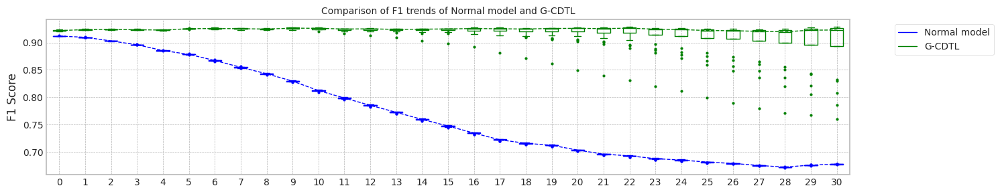

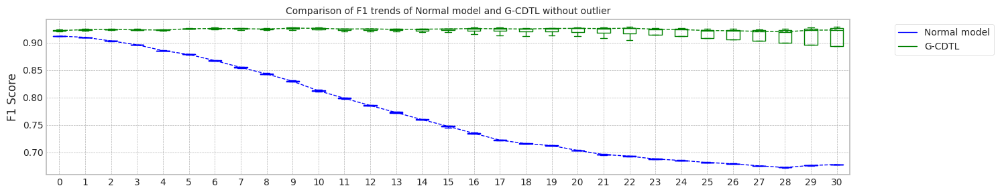

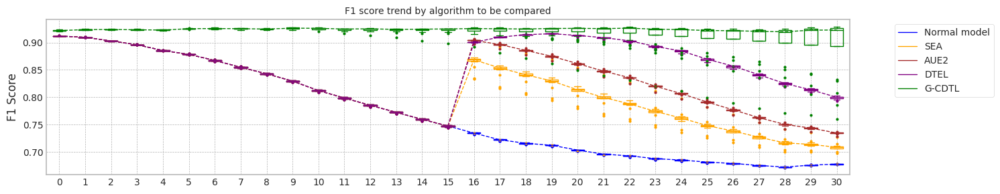

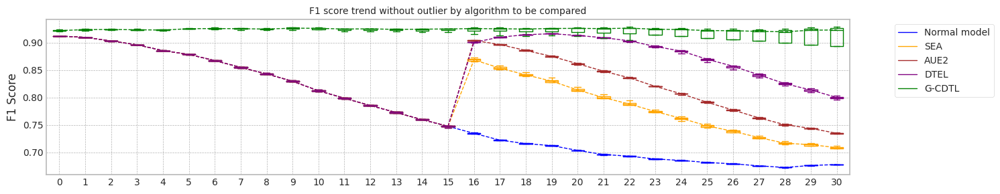

max_mean_trial= 5


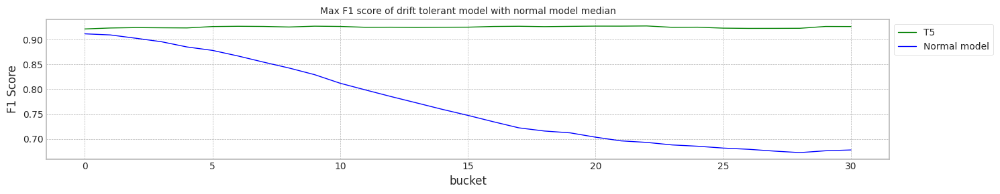

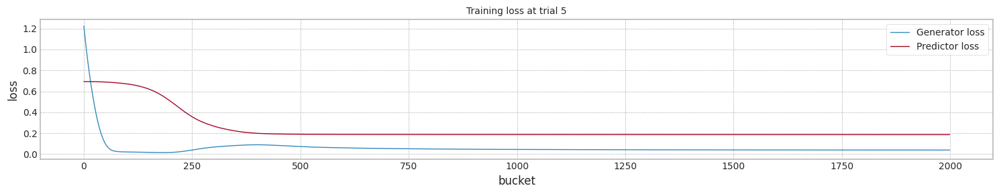

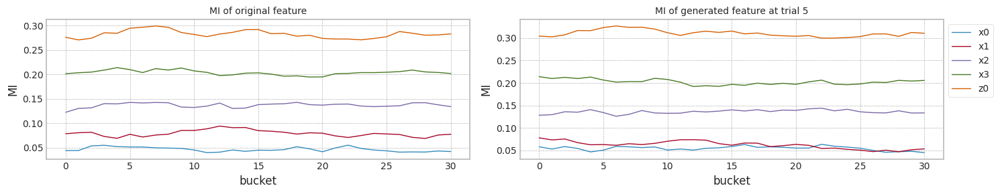

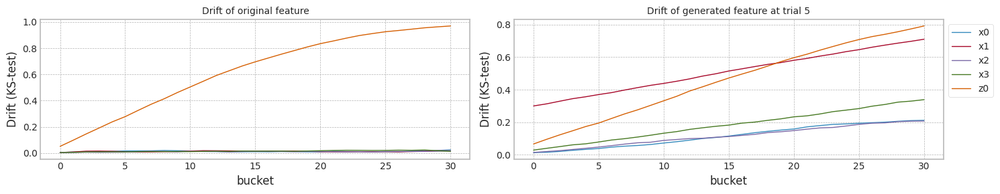

@ Normal model


,Trial,Testset F1,Initial F1,Mean F1,Last F1,Elapsed time
0,0.0,0.912421,0.910120,0.769751,0.677773,5.629284
1,1.0,0.911695,0.909460,0.769608,0.677522,5.727895
2,2.0,0.911615,0.909382,0.769574,0.677522,5.869362
3,3.0,0.912030,0.909674,0.769883,0.677672,5.727877
4,4.0,0.912220,0.909479,0.768067,0.676921,5.649551
5,5.0,0.911870,0.909557,0.769468,0.677572,5.687724
6,6.0,0.911439,0.909441,0.770345,0.677622,5.733595
7,7.0,0.911752,0.909402,0.769626,0.677723,5.686081
8,8.0,0.911790,0.909440,0.770046,0.677723,5.674838
9,9.0,0.911557,0.909557,0.770272,0.677773,5.637387


@ SEA


,Trial,Testset F1,Initial F1,Mean F1,Last F1,Elapsed time
0,0.0,0.912421,0.910120,0.811523,0.709283,7.872506
1,1.0,0.911695,0.909460,0.810048,0.706491,8.800661
2,2.0,0.911615,0.909382,0.797789,0.697394,8.799126
3,3.0,0.912030,0.909674,0.810126,0.707474,7.247493
4,4.0,0.912220,0.909479,0.825986,0.726940,7.114701
5,5.0,0.911870,0.909557,0.810657,0.708459,7.757593
6,6.0,0.911439,0.909441,0.811688,0.708678,7.186469
7,7.0,0.911752,0.909402,0.807493,0.709292,10.529024
8,8.0,0.911790,0.909440,0.810991,0.708514,8.269908
9,9.0,0.911557,0.909557,0.811578,0.709612,8.199266


@ AUE2


,Trial,Testset F1,Initial F1,Mean F1,Last F1,Elapsed time
0,0.0,0.912421,0.910120,0.830245,0.734350,7.564748
1,1.0,0.911695,0.909460,0.830601,0.735058,8.164540
2,2.0,0.911615,0.909382,0.830136,0.734232,8.877861
3,3.0,0.912030,0.909674,0.830775,0.735058,7.451103
4,4.0,0.912220,0.909479,0.825291,0.728271,8.213931
5,5.0,0.911870,0.909557,0.830087,0.734291,7.524643
6,6.0,0.911439,0.909441,0.832680,0.737445,10.701485
7,7.0,0.911752,0.909402,0.829602,0.733056,10.594474
8,8.0,0.911790,0.909440,0.830817,0.735058,7.694843
9,9.0,0.911557,0.909557,0.830744,0.734602,7.451311


@ DTEL


,Trial,Testset F1,Initial F1,Mean F1,Last F1,Elapsed time
0,0.0,0.912421,0.910120,0.858495,0.801088,12.149870
1,1.0,0.911695,0.909460,0.857911,0.797869,14.781350
2,2.0,0.911615,0.909382,0.857795,0.799125,12.214280
3,3.0,0.912030,0.909674,0.858433,0.801123,14.824571
4,4.0,0.912220,0.909479,0.856518,0.795682,12.444350
5,5.0,0.911870,0.909557,0.858179,0.801158,12.746061
6,6.0,0.911439,0.909441,0.858620,0.800175,11.779611
7,7.0,0.911752,0.909402,0.857486,0.798566,12.175361
8,8.0,0.911790,0.909440,0.858490,0.800947,13.117915
9,9.0,0.911557,0.909557,0.856849,0.793574,14.383714


@ G-CDTL


,Trial,Testset F1,Initial F1,Mean F1,Last F1,Elapsed time
0,0.0,0.921143,0.922787,0.924362,0.923111,5.945784
1,1.0,0.923280,0.924812,0.871960,0.760575,5.675467
2,2.0,0.921927,0.923689,0.906621,0.832006,5.686861
3,3.0,0.920635,0.922038,0.925135,0.925698,5.671515
4,4.0,0.920522,0.922170,0.924453,0.926093,5.989474
5,5.0,0.921538,0.923485,0.925288,0.926426,5.690277
6,6.0,0.922466,0.924236,0.900719,0.807250,5.691026
7,7.0,0.921180,0.922907,0.923615,0.919736,5.678913
8,8.0,0.921942,0.923825,0.922089,0.922623,5.817624
9,9.0,0.923365,0.925017,0.924207,0.925136,5.695759


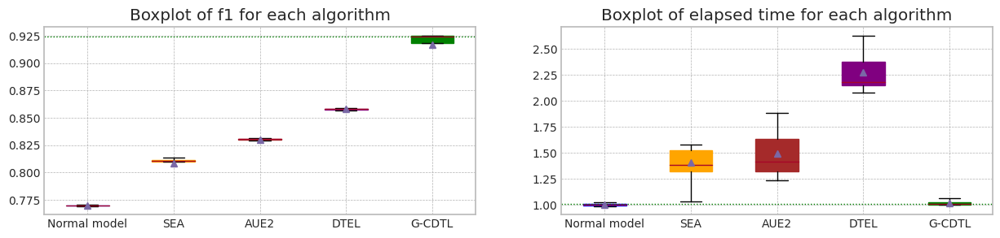

In [64]:
_,_,_,_,_,_ = drift_tolerant2(X1, Y1,train_size, test_size,avaible_range = 300,lambda_f2=0.8,trial_count=20,weight_init=True)


## synthetic data의 생성 (Case #5 - Case #1,2,3,4의 상황이 각 feature에 혼재되어 있는 경우)

+ $P_t(y,X) \ne P_{t+w}(y,X) $ 이고 $P_t(y|X) \ne P_{t+w}(y|X) $
+ 전체적으로는 Real concept drift
+ 즉, P(y|X)와 P(X)의 변화가 연관되어 나타남.
+ $x_0$ : No drift
+ $x_1$ : $P_t(y|X) = P_{t+w}(y|X)$ 이면서 $P_t(X) \ne P_{t+w}(X)$ 인 Virtual Drift
+ $x_2$ : $P_t(y|X) \ne P_{t+w}(y|X)$ 이면서 $P_t(X) \ne P_{t+w}(X)$ 인 Real Concept Drift, MI 감소, Drift 증가
+ $x_3$ : $P_t(y|X) \ne P_{t+w}(y|X)$ 이면서 $P_t(X) \ne P_{t+w}(X)$ 인 Real Concept Drift, MI 증가, Drift 증가
+ $z_0$ : $P_t(y|X) \ne P_{t+w}(y|X)$ 이면서 $P_t(X) = P_{t+w}(X)$ 인 Actual Drift, MI 감소, Drift 고정


### Dataset 준비

In [65]:
seed_everything()

data_size = 40000
cor = np.asarray([1.5, 1.2, 0.5 , 0.7, 2.5])

x4 = np.zeros((data_size,5))
for ix,cor_ in enumerate(cor):
    x4[:,ix] = np.random.normal(1,cor_,data_size)

y4_array = []
cor_const = cor[4]
cor_const2 = 3/x4.shape[0]
for ii in range(x4.shape[0]):
    # Case #2, MI의 증감(상대적), Drift의 고정 - z0
    cor[4] = cor[4] - cor_const / x4.shape[0]
    e = np.random.normal(0.0, 2.0)
    # Case #3 MI의 증감(상대적), Drift의 증가 - x3
    e1 = np.random.normal(0.0, 3*cor_const2 * ii)
    x4[ii,3] = x4[ii,3] + e1
    y4_array.append(np.sum(cor * x4[ii])+e)

y4 = [1 if y_ > 5 else 0 for y_ in y4_array]

for i in range(len(y4)):
    #Case #1 MI의 감소, Drift의 증가 - x2
    x4[i,2] = y4[i] + np.random.normal(1,0.5+5*(i/data_size))
    #Case #4 MI의 고정, Drift의 증가 - x1
    x4[i,1] = y4[i] + np.random.normal(0.0 + 4*(i/data_size),cor[1])


### 실험

MI Analysis MI Max 0.14553, Min 0.02121, Mean 0.06553, Std 0.04745
Dataset structure X_train, (9000, 5) X_test, (9000, 5) X_live (39000, 5)
Truncate 8000 rows from live_set (39000, 5)
Search MI & Drift...for X_live_set (31, 9000, 5)


100%|██████████| 31/31 [00:05<00:00,  5.57it/s]


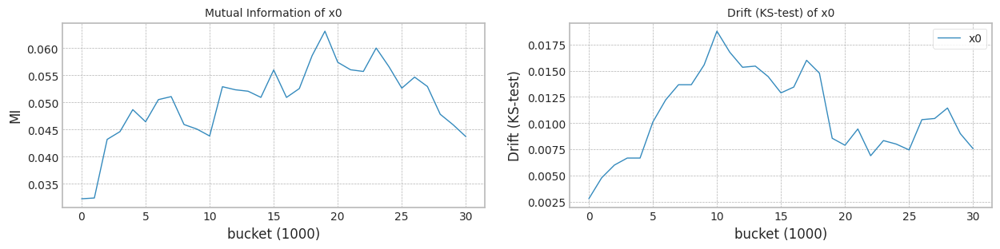

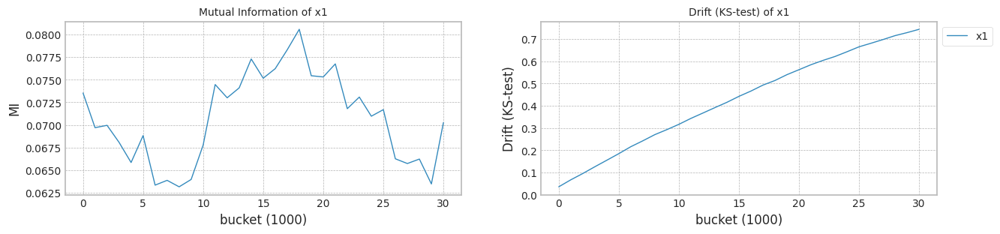

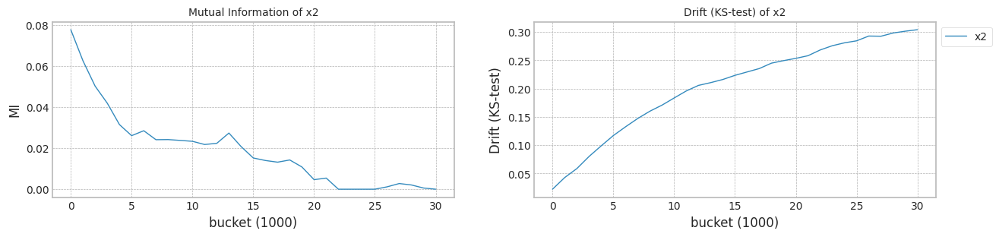

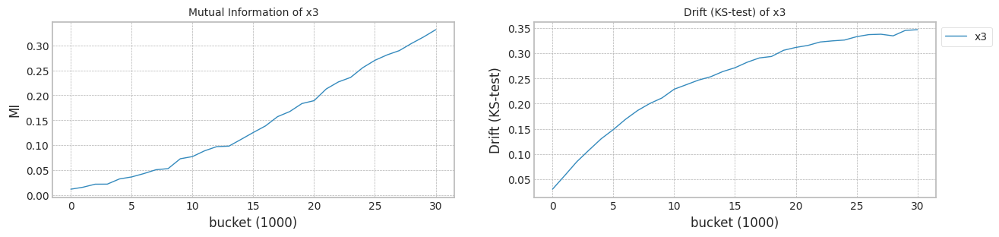

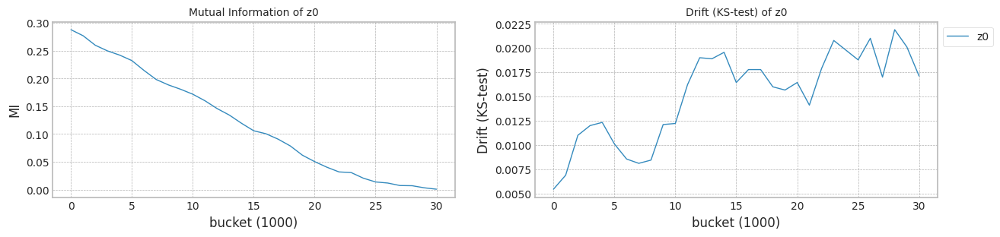

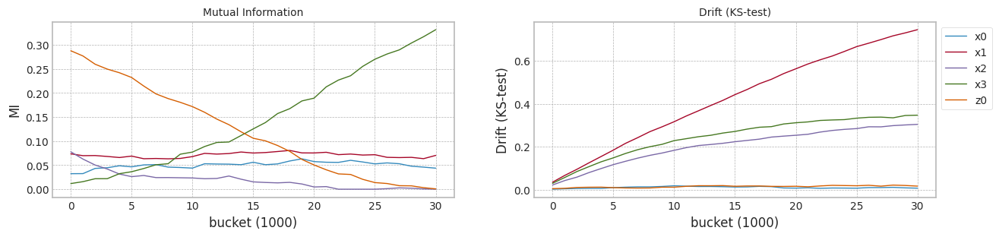

In [66]:
columns=['x0','x1','x2','x3','z0']
X4 = pd.DataFrame(x4,columns=columns)

train_size = 9000
test_size = 1000

X1,Y1 = check_mi_drift(X4, y4,train_size, test_size)

In [67]:
bucket_size = 1000
X1['b'] = [int(b/bucket_size) for b in X1.index.values]


trial_count: 5
lambda_f2 0.5
######################### Trial 0 for Normal model ###########################
cuda:0


100%|██████████| 2000/2000 [00:03<00:00, 600.60it/s]


Test f1 score: 0.8414490311710193
X_live.shape (39000, 6)
Truncate 8000 rows from live_set (39000, 6)
Search MI & Drift...for X_live_set torch.Size([31, 9000, 6])


100%|██████████| 31/31 [00:05<00:00,  5.24it/s]


mean of drift:
x0    0.010828
x1    0.426663
x2    0.204455
x3    0.246330
z0    0.015151
dtype: float64
Mean F1 for all data: 0.6421311380306967
######################### Trial 0 for Drift tolerant model ###########################
cuda:0


100%|██████████| 2000/2000 [00:08<00:00, 234.04it/s]


Test f1 score: 0.8461281708945261
X_live.shape (39000, 6)
Truncate 8000 rows from live_set (39000, 6)
Search MI & Drift...for X_live_set torch.Size([31, 9000, 6])


100%|██████████| 31/31 [00:05<00:00,  5.40it/s]


mean of drift:
x0    0.085627
x1    0.383168
x2    0.302072
x3    0.230082
z0    0.209409
dtype: float64
Mean F1 for all data: 0.694167144189512
Normal model median        : 0.6421311380306967
Drift tolerant model median: 0.694167144189512
######################### Trial 1 for Normal model ###########################
cuda:0


100%|██████████| 2000/2000 [00:03<00:00, 638.78it/s]


Test f1 score: 0.7715743659012457
X_live.shape (39000, 6)
Truncate 8000 rows from live_set (39000, 6)
Search MI & Drift...for X_live_set torch.Size([31, 9000, 6])


100%|██████████| 31/31 [00:05<00:00,  5.40it/s]


mean of drift:
x0    0.010828
x1    0.426663
x2    0.204455
x3    0.246330
z0    0.015151
dtype: float64
Mean F1 for all data: 0.6726719607719048
######################### Trial 1 for Drift tolerant model ###########################
cuda:0


100%|██████████| 2000/2000 [00:08<00:00, 235.41it/s]


Test f1 score: 0.8775242591135589
X_live.shape (39000, 6)
Truncate 8000 rows from live_set (39000, 6)
Search MI & Drift...for X_live_set torch.Size([31, 9000, 6])


100%|██████████| 31/31 [00:05<00:00,  5.46it/s]


mean of drift:
x0    0.167900
x1    0.356244
x2    0.342993
x3    0.236692
z0    0.262050
dtype: float64
Mean F1 for all data: 0.7212085492805144
Normal model median        : 0.6574015494013008
Drift tolerant model median: 0.7076878467350132
######################### Trial 2 for Normal model ###########################
cuda:0


100%|██████████| 2000/2000 [00:03<00:00, 647.60it/s]


Test f1 score: 0.8177506060925478
X_live.shape (39000, 6)
Truncate 8000 rows from live_set (39000, 6)
Search MI & Drift...for X_live_set torch.Size([31, 9000, 6])


100%|██████████| 31/31 [00:05<00:00,  5.49it/s]


mean of drift:
x0    0.010828
x1    0.426663
x2    0.204455
x3    0.246330
z0    0.015151
dtype: float64
Mean F1 for all data: 0.553913873133777
######################### Trial 2 for Drift tolerant model ###########################
cuda:0


100%|██████████| 2000/2000 [00:08<00:00, 232.45it/s]


Test f1 score: 0.8468078013002166
X_live.shape (39000, 6)
Truncate 8000 rows from live_set (39000, 6)
Search MI & Drift...for X_live_set torch.Size([31, 9000, 6])


100%|██████████| 31/31 [00:05<00:00,  5.46it/s]


mean of drift:
x0    0.170129
x1    0.280265
x2    0.200373
x3    0.243057
z0    0.294803
dtype: float64
Mean F1 for all data: 0.7205540220161121
Normal model median        : 0.6421311380306967
Drift tolerant model median: 0.7205540220161121
######################### Trial 3 for Normal model ###########################
cuda:0


100%|██████████| 2000/2000 [00:03<00:00, 645.38it/s]


Test f1 score: 0.833384980890404
X_live.shape (39000, 6)
Truncate 8000 rows from live_set (39000, 6)
Search MI & Drift...for X_live_set torch.Size([31, 9000, 6])


100%|██████████| 31/31 [00:05<00:00,  5.50it/s]


mean of drift:
x0    0.010828
x1    0.426663
x2    0.204455
x3    0.246330
z0    0.015151
dtype: float64
Mean F1 for all data: 0.6015630952470314
######################### Trial 3 for Drift tolerant model ###########################
cuda:0


100%|██████████| 2000/2000 [00:08<00:00, 238.52it/s]


Test f1 score: 0.840918511149797
X_live.shape (39000, 6)
Truncate 8000 rows from live_set (39000, 6)
Search MI & Drift...for X_live_set torch.Size([31, 9000, 6])


100%|██████████| 31/31 [00:05<00:00,  5.41it/s]


mean of drift:
x0    0.029538
x1    0.346036
x2    0.295878
x3    0.245097
z0    0.259968
dtype: float64
Mean F1 for all data: 0.7098329893660233
Normal model median        : 0.621847116638864
Drift tolerant model median: 0.7151935056910677
######################### Trial 4 for Normal model ###########################
cuda:0


100%|██████████| 2000/2000 [00:03<00:00, 643.19it/s]


Test f1 score: 0.7515328467153284
X_live.shape (39000, 6)
Truncate 8000 rows from live_set (39000, 6)
Search MI & Drift...for X_live_set torch.Size([31, 9000, 6])


100%|██████████| 31/31 [00:05<00:00,  5.48it/s]


mean of drift:
x0    0.010828
x1    0.426663
x2    0.204455
x3    0.246330
z0    0.015151
dtype: float64
Mean F1 for all data: 0.6794832557707645
######################### Trial 4 for Drift tolerant model ###########################
cuda:0


100%|██████████| 2000/2000 [00:08<00:00, 235.99it/s]


Test f1 score: 0.8180578943148104
X_live.shape (39000, 6)
Truncate 8000 rows from live_set (39000, 6)
Search MI & Drift...for X_live_set torch.Size([31, 9000, 6])


100%|██████████| 31/31 [00:05<00:00,  5.44it/s]


mean of drift:
x0    0.049513
x1    0.394964
x2    0.290663
x3    0.217620
z0    0.200996
dtype: float64
Mean F1 for all data: 0.685117747246353
Normal model median        : 0.6421311380306967
Drift tolerant model median: 0.7098329893660233
######################### Trial 0 for Normal model ###########################
retrain_interval: 16
######################### Trial 0 for SEA ###########################
X_live.shape (39000, 6)
Truncate 8000 rows from live_set (39000, 6)
Search MI & Drift...for X_live_set torch.Size([31, 9000, 6])


100%|██████████| 31/31 [00:09<00:00,  3.28it/s]


Early stop at  3120.0
Mean of drift:
x0    0.010828
x1    0.426663
x2    0.204455
x3    0.246330
z0    0.015151
dtype: float64
Mean F1 for all data: 0.7915061712394726
SEA median: 0.7915061712394726
######################### Trial 0 for AUE ###########################
X_live.shape (39000, 6)
Truncate 8000 rows from live_set (39000, 6)
Search MI & Drift...for X_live_set torch.Size([31, 9000, 6])


100%|██████████| 31/31 [00:07<00:00,  4.26it/s]


Early stop at  1351.0
Mean of drift:
x0    0.010828
x1    0.426663
x2    0.204455
x3    0.246330
z0    0.015151
dtype: float64
Mean F1 for all data: 0.7854719170212545
AUE median: 0.7854719170212545
######################### Trial 0 for DTEL ###########################
X_live.shape (39000, 6)
Truncate 8000 rows from live_set (39000, 6)
Search MI & Drift...for X_live_set torch.Size([31, 9000, 6])


100%|██████████| 31/31 [00:14<00:00,  2.18it/s]


Early stop at  3217.0
Mean of drift:
x0    0.010828
x1    0.426663
x2    0.204455
x3    0.246330
z0    0.015151
dtype: float64
Mean F1 for all data: 0.8014747038753368
DTEL median: 0.8014747038753368
######################### Trial 1 for Normal model ###########################
retrain_interval: 16
######################### Trial 1 for SEA ###########################
X_live.shape (39000, 6)
Truncate 8000 rows from live_set (39000, 6)
Search MI & Drift...for X_live_set torch.Size([31, 9000, 6])


100%|██████████| 31/31 [00:07<00:00,  4.27it/s]


Early stop at  1333.0
Mean of drift:
x0    0.010828
x1    0.426663
x2    0.204455
x3    0.246330
z0    0.015151
dtype: float64
Mean F1 for all data: 0.7886551750325
SEA median: 0.7900806731359864
######################### Trial 1 for AUE ###########################
X_live.shape (39000, 6)
Truncate 8000 rows from live_set (39000, 6)
Search MI & Drift...for X_live_set torch.Size([31, 9000, 6])


100%|██████████| 31/31 [00:09<00:00,  3.44it/s]


Early stop at  2732.0
Mean of drift:
x0    0.010828
x1    0.426663
x2    0.204455
x3    0.246330
z0    0.015151
dtype: float64
Mean F1 for all data: 0.7781253302052926
AUE median: 0.7817986236132736
######################### Trial 1 for DTEL ###########################
X_live.shape (39000, 6)
Truncate 8000 rows from live_set (39000, 6)
Search MI & Drift...for X_live_set torch.Size([31, 9000, 6])


100%|██████████| 31/31 [00:11<00:00,  2.74it/s]


Early stop at  862.0
Mean of drift:
x0    0.010828
x1    0.426663
x2    0.204455
x3    0.246330
z0    0.015151
dtype: float64
Mean F1 for all data: 0.7943442631973018
DTEL median: 0.7979094835363193
######################### Trial 2 for Normal model ###########################
retrain_interval: 16
######################### Trial 2 for SEA ###########################
X_live.shape (39000, 6)
Truncate 8000 rows from live_set (39000, 6)
Search MI & Drift...for X_live_set torch.Size([31, 9000, 6])


100%|██████████| 31/31 [00:07<00:00,  4.02it/s]


Early stop at  1706.0
Mean of drift:
x0    0.010828
x1    0.426663
x2    0.204455
x3    0.246330
z0    0.015151
dtype: float64
Mean F1 for all data: 0.7645880403319965
SEA median: 0.7886551750325
######################### Trial 2 for AUE ###########################
X_live.shape (39000, 6)
Truncate 8000 rows from live_set (39000, 6)
Search MI & Drift...for X_live_set torch.Size([31, 9000, 6])


100%|██████████| 31/31 [00:09<00:00,  3.42it/s]


Early stop at  2806.0
Mean of drift:
x0    0.010828
x1    0.426663
x2    0.204455
x3    0.246330
z0    0.015151
dtype: float64
Mean F1 for all data: 0.7601773938180076
AUE median: 0.7781253302052926
######################### Trial 2 for DTEL ###########################
X_live.shape (39000, 6)
Truncate 8000 rows from live_set (39000, 6)
Search MI & Drift...for X_live_set torch.Size([31, 9000, 6])


100%|██████████| 31/31 [00:12<00:00,  2.49it/s]


Early stop at  1558.0
Mean of drift:
x0    0.010828
x1    0.426663
x2    0.204455
x3    0.246330
z0    0.015151
dtype: float64
Mean F1 for all data: 0.7709807472851736
DTEL median: 0.7943442631973018
######################### Trial 3 for Normal model ###########################
retrain_interval: 16
######################### Trial 3 for SEA ###########################
X_live.shape (39000, 6)
Truncate 8000 rows from live_set (39000, 6)
Search MI & Drift...for X_live_set torch.Size([31, 9000, 6])


100%|██████████| 31/31 [00:09<00:00,  3.24it/s]


Early stop at  3269.0
Mean of drift:
x0    0.010828
x1    0.426663
x2    0.204455
x3    0.246330
z0    0.015151
dtype: float64
Mean F1 for all data: 0.7804910090237368
SEA median: 0.7845730920281184
######################### Trial 3 for AUE ###########################
X_live.shape (39000, 6)
Truncate 8000 rows from live_set (39000, 6)
Search MI & Drift...for X_live_set torch.Size([31, 9000, 6])


100%|██████████| 31/31 [00:07<00:00,  3.93it/s]


Early stop at  1811.0
Mean of drift:
x0    0.010828
x1    0.426663
x2    0.204455
x3    0.246330
z0    0.015151
dtype: float64
Mean F1 for all data: 0.7737559279727045
AUE median: 0.7759406290889985
######################### Trial 3 for DTEL ###########################
X_live.shape (39000, 6)
Truncate 8000 rows from live_set (39000, 6)
Search MI & Drift...for X_live_set torch.Size([31, 9000, 6])


100%|██████████| 31/31 [00:13<00:00,  2.32it/s]


Early stop at  2181.0
Mean of drift:
x0    0.010828
x1    0.426663
x2    0.204455
x3    0.246330
z0    0.015151
dtype: float64
Mean F1 for all data: 0.7857871542369587
DTEL median: 0.7900657087171302
######################### Trial 4 for Normal model ###########################
retrain_interval: 16
######################### Trial 4 for SEA ###########################
X_live.shape (39000, 6)
Truncate 8000 rows from live_set (39000, 6)
Search MI & Drift...for X_live_set torch.Size([31, 9000, 6])


100%|██████████| 31/31 [00:08<00:00,  3.71it/s]


Early stop at  2235.0
Mean of drift:
x0    0.010828
x1    0.426663
x2    0.204455
x3    0.246330
z0    0.015151
dtype: float64
Mean F1 for all data: 0.7845486313784905
SEA median: 0.7845486313784905
######################### Trial 4 for AUE ###########################
X_live.shape (39000, 6)
Truncate 8000 rows from live_set (39000, 6)
Search MI & Drift...for X_live_set torch.Size([31, 9000, 6])


100%|██████████| 31/31 [00:07<00:00,  3.89it/s]


Early stop at  1857.0
Mean of drift:
x0    0.010828
x1    0.426663
x2    0.204455
x3    0.246330
z0    0.015151
dtype: float64
Mean F1 for all data: 0.7727709087673518
AUE median: 0.7737559279727045
######################### Trial 4 for DTEL ###########################
X_live.shape (39000, 6)
Truncate 8000 rows from live_set (39000, 6)
Search MI & Drift...for X_live_set torch.Size([31, 9000, 6])


100%|██████████| 31/31 [00:11<00:00,  2.70it/s]


Early stop at  840.0
Mean of drift:
x0    0.010828
x1    0.426663
x2    0.204455
x3    0.246330
z0    0.015151
dtype: float64
Mean F1 for all data: 0.7888937677001338
DTEL median: 0.7888937677001338


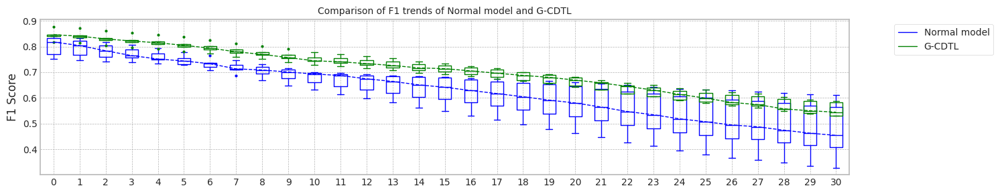

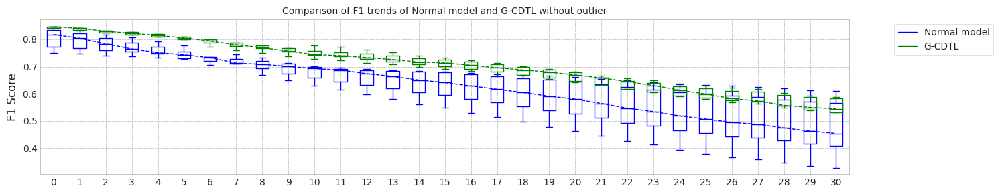

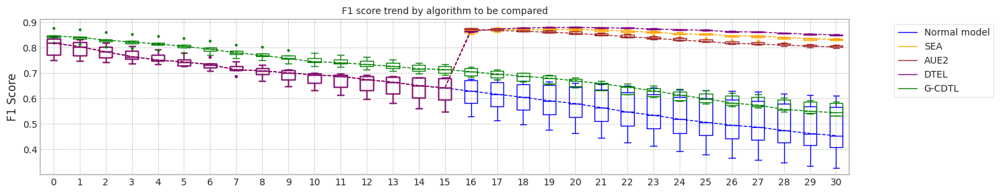

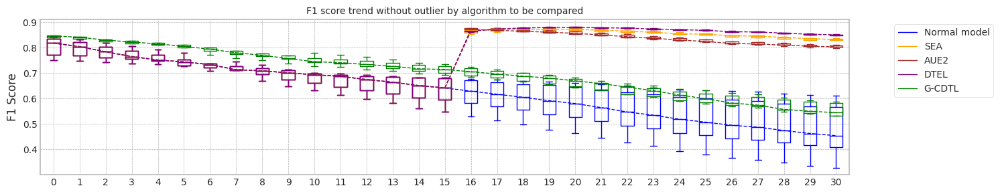

max_mean_trial= 1


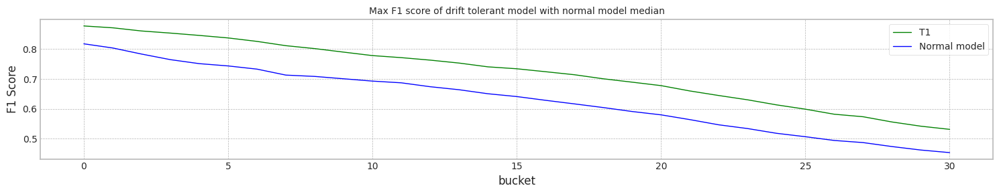

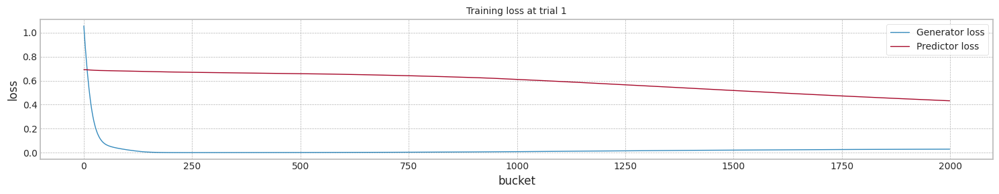

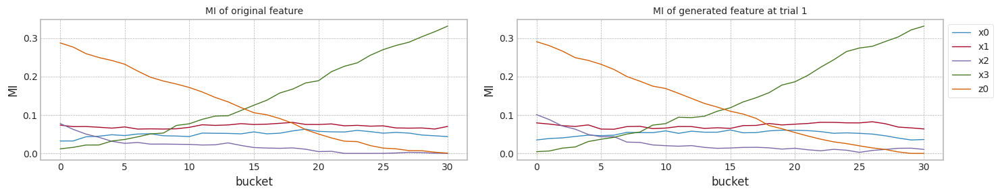

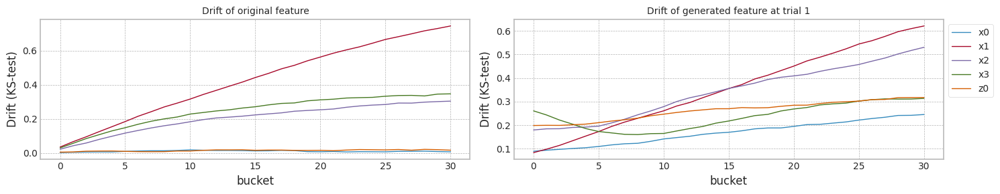

@ Normal model


,Trial,Testset F1,Initial F1,Mean F1,Last F1,Elapsed time
0,0.0,0.841449,0.832213,0.642131,0.453752,5.969075
1,1.0,0.771574,0.767881,0.672672,0.565030,5.786477
2,2.0,0.817751,0.803858,0.553914,0.328072,5.687999
3,3.0,0.833385,0.821465,0.601563,0.407875,5.682198
4,4.0,0.751533,0.747414,0.679483,0.610785,5.699235
5,median,0.817751,0.803858,0.642131,0.453752,5.699235
6,std,0.039546,0.035925,0.052475,0.115185,0.121674


@ SEA


,Trial,Testset F1,Initial F1,Mean F1,Last F1,Elapsed time
0,0.0,0.841449,0.832213,0.791506,0.809387,9.494976
1,1.0,0.771574,0.767881,0.788655,0.828408,7.314213
2,2.0,0.817751,0.803858,0.764588,0.836308,7.755756
3,3.0,0.833385,0.821465,0.780491,0.835345,9.600316
4,4.0,0.751533,0.747414,0.784549,0.832014,8.393611
5,median,0.817751,0.803858,0.784549,0.832014,8.393611
6,std,0.039546,0.035925,0.010566,0.011014,1.021186


@ AUE2


,Trial,Testset F1,Initial F1,Mean F1,Last F1,Elapsed time
0,0.0,0.841449,0.832213,0.785472,0.798765,7.322234
1,1.0,0.771574,0.767881,0.778125,0.803015,9.060647
2,2.0,0.817751,0.803858,0.760177,0.810294,9.094174
3,3.0,0.833385,0.821465,0.773756,0.809219,7.937999
4,4.0,0.751533,0.747414,0.772771,0.802727,8.015180
5,median,0.817751,0.803858,0.773756,0.803015,8.015180
6,std,0.039546,0.035925,0.009236,0.004838,0.770797


@ DTEL


,Trial,Testset F1,Initial F1,Mean F1,Last F1,Elapsed time
0,0.0,0.841449,0.832213,0.801475,0.848716,14.235255
1,1.0,0.771574,0.767881,0.794344,0.850223,11.372068
2,2.0,0.817751,0.803858,0.770981,0.847322,12.479993
3,3.0,0.833385,0.821465,0.785787,0.850877,13.389691
4,4.0,0.751533,0.747414,0.788894,0.853005,11.533912
5,median,0.817751,0.803858,0.788894,0.850223,12.479993
6,std,0.039546,0.035925,0.011366,0.002160,1.220288


@ G-CDTL


,Trial,Testset F1,Initial F1,Mean F1,Last F1,Elapsed time
0,0.0,0.846128,0.840674,0.694167,0.531511,5.781818
1,1.0,0.877524,0.871351,0.721209,0.531541,5.722700
2,2.0,0.846808,0.842237,0.720554,0.588327,5.725225
3,3.0,0.840919,0.835278,0.709833,0.582462,5.770230
4,4.0,0.818058,0.813519,0.685118,0.544140,5.733666
5,median,0.846128,0.840674,0.709833,0.544140,5.733666
6,std,0.021219,0.020676,0.016076,0.027763,0.027359


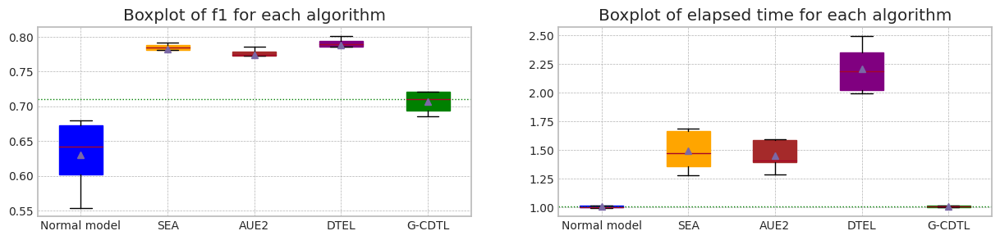

In [92]:
_,_,_,_,_,_ = drift_tolerant2(X1, Y1,train_size, test_size,avaible_range = 300,lambda_f2=0.5,trial_count=5,lr_g=0.0001, weight_init=False)

## real-world data 의 실험

### Loan data 실험

#### Dataset 준비

##### Data load

In [ ]:

if True:
    from google.colab import drive
    drive.mount('/content/drive')

Mounted at /content/drive


In [ ]:

df_accepted = pd.read_csv("/content/drive/MyDrive/Drift/accepted_2007_to_2018Q4.csv")

print(df_accepted.shape)

(2260701, 151)


##### Data 정제

In [ ]:
# for the sake of simplicity, let's consider only Fully Paid and Charged Off values:
df_accepted = df_accepted[df_accepted.loan_status.isin(['Fully Paid', 'Charged Off'])]
print(df_accepted.shape)

cols_to_drop = df_accepted.isnull().sum().sort_values(ascending=False).head(50).index
df_accepted = df_accepted.drop(columns=cols_to_drop)
print(df_accepted.shape)

# maybe we can go further, and eliminate columns up to title:
cols_to_drop = df_accepted.isnull().sum().sort_values(ascending=False).head(45).index
df_accepted = df_accepted.drop(columns=cols_to_drop)
print(df_accepted.shape)

# Remaining columns have missing data points, but they account for less than 0.2% of the total data. Let's remove the rows that are missing those values in those columns with dropna():
df_accepted = df_accepted.dropna()
print(df_accepted.shape)

# These are constant columns. We can drop it either.
cols_to_drop = ['out_prncp', 'out_prncp_inv', 'policy_code']
df_accepted = df_accepted.drop(columns=cols_to_drop)
print(df_accepted.shape)

# It seems we have many "duplicated" information. Let's drop some columns, based on visual inspection at corr_pairs dataframe:
cols_to_drop = ['fico_range_low', 'funded_amnt_inv', 'funded_amnt', 'total_pymnt_inv', 'total_pymnt', 'installment', 'collection_recovery_fee', 'total_rec_prncp', 'last_fico_range_low']
df_accepted = df_accepted.drop(columns=cols_to_drop)
print(df_accepted.shape)

values = df_accepted.loan_status.unique()
encode = [1,0]
d = dict(zip(values, encode))
df_accepted['loan_paid'] = df_accepted['loan_status'].map(d)
df_accepted = df_accepted.drop(columns=['loan_status'])

df_accepted

(1345310, 151)
(1345310, 101)
(1345310, 56)
(1341026, 56)
(1341026, 53)
(1341026, 44)


,id,loan_amnt,term,int_rate,grade,sub_grade,home_ownership,annual_inc,verification_status,issue_d,...,application_type,acc_now_delinq,chargeoff_within_12_mths,delinq_amnt,pub_rec_bankruptcies,tax_liens,hardship_flag,disbursement_method,debt_settlement_flag,loan_paid
0,68407277,3600.0,36 months,13.99,C,C4,MORTGAGE,55000.0,Not Verified,Dec-2015,...,Individual,0.0,0.0,0.0,0.0,0.0,N,Cash,N,1
1,68355089,24700.0,36 months,11.99,C,C1,MORTGAGE,65000.0,Not Verified,Dec-2015,...,Individual,0.0,0.0,0.0,0.0,0.0,N,Cash,N,1
2,68341763,20000.0,60 months,10.78,B,B4,MORTGAGE,63000.0,Not Verified,Dec-2015,...,Joint App,0.0,0.0,0.0,0.0,0.0,N,Cash,N,1
4,68476807,10400.0,60 months,22.45,F,F1,MORTGAGE,104433.0,Source Verified,Dec-2015,...,Individual,0.0,0.0,0.0,0.0,0.0,N,Cash,N,1
5,68426831,11950.0,36 months,13.44,C,C3,RENT,34000.0,Source Verified,Dec-2015,...,Individual,0.0,0.0,0.0,0.0,0.0,N,Cash,N,1
...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...
2260688,89905081,18000.0,60 months,9.49,B,B2,OWN,130000.0,Not Verified,Oct-2016,...,Individual,0.0,0.0,0.0,0.0,0.0,N,Cash,N,1
2260690,88948836,29400.0,60 months,13.99,C,C3,MORTGAGE,180792.0,Not Verified,Oct-2016,...,Individual,0.0,0.0,0.0,0.0,0.0,N,Cash,N,1
2260691,89996426,32000.0,60 months,14.49,C,C4,MORTGAGE,157000.0,Source Verified,Oct-2016,...,Individual,0.0,0.0,0.0,0.0,0.0,N,Cash,N,0
2260692,90006534,16000.0,60 months,12.79,C,C1,RENT,150000.0,Not Verified,Oct-2016,...,Individual,0.0,0.0,0.0,3.0,0.0,N,Cash,N,1


In [ ]:
# droping constant columns
print(df_accepted.pymnt_plan.value_counts())
print(df_accepted.hardship_flag.value_counts())
cols_to_drop = ['id', 'pymnt_plan', 'hardship_flag']
df_accepted = df_accepted.drop(columns=cols_to_drop)
print(df_accepted.shape)
cat_cols = df_accepted.select_dtypes(include=['object']).columns
print(cat_cols)

print(df_accepted.term.value_counts())

# convert term into either a 36 or 60 integer numeric data type

l1 = df_accepted.term.unique()
l2 = [36, 60]
d = dict(zip(l1, l2))

df_accepted['term'] = df_accepted['term'].map(d)

# as grade is part of sub_grade, so let's just drop the grade feature.

df_accepted = df_accepted.drop(columns='grade')

df_accepted = pd.get_dummies(df_accepted, columns = ['sub_grade'], prefix='', prefix_sep='', drop_first=True)

cat_cols = df_accepted.select_dtypes(include=['object']).columns
print(cat_cols)

# for these columns, let's just create dummy variables, concatenate them with the original dataframe and drop original columns.

df_accepted = pd.get_dummies(df_accepted, columns = ['verification_status'], prefix='', prefix_sep='', drop_first=True)
df_accepted = pd.get_dummies(df_accepted, columns = ['application_type'], prefix='', prefix_sep='', drop_first=True)
df_accepted = pd.get_dummies(df_accepted, columns = ['initial_list_status'], prefix='', prefix_sep='', drop_first=True)
df_accepted = pd.get_dummies(df_accepted, columns = ['purpose'], prefix='', prefix_sep='', drop_first=True)
print(df_accepted.shape)

df_accepted['home_ownership'] = df_accepted.home_ownership.replace('NONE', 'ANY')
df_accepted = pd.get_dummies(df_accepted, columns = ['home_ownership'], prefix='', prefix_sep='', drop_first=True)
df_accepted = df_accepted.drop(columns=[ 'url', 'last_pymnt_d', 'last_credit_pull_d'])
df_accepted = df_accepted.drop(columns=['zip_code', 'addr_state'])
df_accepted = pd.get_dummies(df_accepted, columns = ['disbursement_method'], prefix='', prefix_sep='', drop_first=True)
df_accepted = pd.get_dummies(df_accepted, columns = ['debt_settlement_flag'], prefix='', prefix_sep='', drop_first=True)
df_accepted = df_accepted.drop(columns=['earliest_cr_line'])
print(df_accepted.shape)


df_accepted['issue_d'] = df_accepted['issue_d'].str.replace('Jan','01')
df_accepted['issue_d'] = df_accepted['issue_d'].str.replace('Feb','02')
df_accepted['issue_d'] = df_accepted['issue_d'].str.replace('Mar','03')
df_accepted['issue_d'] = df_accepted['issue_d'].str.replace('Apr','04')
df_accepted['issue_d'] = df_accepted['issue_d'].str.replace('May','05')
df_accepted['issue_d'] = df_accepted['issue_d'].str.replace('Jun','06')
df_accepted['issue_d'] = df_accepted['issue_d'].str.replace('Jul','07')
df_accepted['issue_d'] = df_accepted['issue_d'].str.replace('Aug','08')
df_accepted['issue_d'] = df_accepted['issue_d'].str.replace('Sep','09')
df_accepted['issue_d'] = df_accepted['issue_d'].str.replace('Oct','10')
df_accepted['issue_d'] = df_accepted['issue_d'].str.replace('Dec','11')
df_accepted['issue_d'] = df_accepted['issue_d'].str.replace('Nov','12')

def reorder_issue_d(dt):
    a = dt.split('-')
    return a[1]+a[0]

reorder_issue_d('01-2009')

df_accepted['issue_d'] = df_accepted['issue_d'].apply(reorder_issue_d)
df_accepted = df_accepted.sort_values(by='issue_d')
df_accepted.reset_index(drop=True, inplace=True)

df_accepted.info()

n    1341026
Name: pymnt_plan, dtype: int64
N    1341026
Name: hardship_flag, dtype: int64
(1341026, 41)
Index(['term', 'grade', 'sub_grade', 'home_ownership', 'verification_status',
       'issue_d', 'url', 'purpose', 'zip_code', 'addr_state',
       'earliest_cr_line', 'initial_list_status', 'last_pymnt_d',
       'last_credit_pull_d', 'application_type', 'disbursement_method',
       'debt_settlement_flag'],
      dtype='object')
 36 months    1017398
 60 months     323628
Name: term, dtype: int64
Index(['home_ownership', 'verification_status', 'issue_d', 'url', 'purpose',
       'zip_code', 'addr_state', 'earliest_cr_line', 'initial_list_status',
       'last_pymnt_d', 'last_credit_pull_d', 'application_type',
       'disbursement_method', 'debt_settlement_flag'],
      dtype='object')
(1341026, 86)
(1341026, 83)
<class 'pandas.core.frame.DataFrame'>
RangeIndex: 1341026 entries, 0 to 1341025
Data columns (total 83 columns):
 #   Column                      Non-Null Count    Dtype  

##### Dataset 만들기

In [ ]:
X = {}
Y = {}

df = df_accepted[df_accepted['issue_d'].str.startswith('2007') + df_accepted['issue_d'].str.startswith('2008') + df_accepted['issue_d'].str.startswith('2009')].copy()
df = df.drop(columns=['issue_d'])


X[2009] = df.loc[:, df.columns != 'loan_paid'].values
Y[2009] = df.loan_paid.values


for year in range(2010,2019):
    print(year)
    df = df_accepted[df_accepted['issue_d'].str.startswith(str(year))].copy()
    df = df.drop(columns=['issue_d'])
    X[year] = df.loc[:, df.columns != 'loan_paid'].values
    Y[year] = df.loan_paid.values

2010
2011
2012
2013
2014
2015
2016
2017
2018


In [ ]:

X[2010].shape

(11497, 81)

In [ ]:
COLUMNS = df.loc[:, df.columns != 'loan_paid'].columns
COLUMNS

Index(['loan_amnt', 'term', 'int_rate', 'annual_inc', 'dti', 'delinq_2yrs',
       'fico_range_high', 'inq_last_6mths', 'open_acc', 'pub_rec', 'revol_bal',
       'revol_util', 'total_acc', 'total_rec_int', 'total_rec_late_fee',
       'recoveries', 'last_pymnt_amnt', 'last_fico_range_high',
       'collections_12_mths_ex_med', 'acc_now_delinq',
       'chargeoff_within_12_mths', 'delinq_amnt', 'pub_rec_bankruptcies',
       'tax_liens', 'A2', 'A3', 'A4', 'A5', 'B1', 'B2', 'B3', 'B4', 'B5', 'C1',
       'C2', 'C3', 'C4', 'C5', 'D1', 'D2', 'D3', 'D4', 'D5', 'E1', 'E2', 'E3',
       'E4', 'E5', 'F1', 'F2', 'F3', 'F4', 'F5', 'G1', 'G2', 'G3', 'G4', 'G5',
       'Source Verified', 'Verified', 'Joint App', 'w', 'credit_card',
       'debt_consolidation', 'educational', 'home_improvement', 'house',
       'major_purchase', 'medical', 'moving', 'other', 'renewable_energy',
       'small_business', 'vacation', 'wedding', 'MORTGAGE', 'OTHER', 'OWN',
       'RENT', 'DirectPay', 'Y'],
      dtype

In [ ]:
seed_everything(12)

X_df = pd.DataFrame(X[2010],columns=COLUMNS)
mi_scores = make_mi_scores(X_df, Y[2010], discrete_features="auto")
print(mi_scores)

recoveries                  0.375327
last_fico_range_high        0.090427
last_pymnt_amnt             0.085496
total_rec_late_fee          0.038954
int_rate                    0.016850
                              ...   
F2                          0.000000
chargeoff_within_12_mths    0.000000
G1                          0.000000
G3                          0.000000
D3                          0.000000
Name: MI Scores, Length: 81, dtype: float64


In [ ]:
# MI Top 5, columns
top_columns = list(mi_scores[0:5].index)
top_columns

['recoveries',
 'last_fico_range_high',
 'last_pymnt_amnt',
 'total_rec_late_fee',
 'int_rate']

#### 실험

In [ ]:
# 1/10 로 사이즈 줄이기...
seed_everything()

X2 = np.concatenate((X[2010],X[2011],X[2012],X[2013],X[2014],X[2015],X[2016],X[2017]))
Y2 = np.concatenate((Y[2010],Y[2011],Y[2012],Y[2013],Y[2014],Y[2015],Y[2016],Y[2017]))
s = np.sort(np.random.choice(X2.shape[0],int(X2.shape[0]/10),replace= False))
#print(s.shape)
X3 = pd.DataFrame(X2[s],columns=COLUMNS)
Y3 = Y2[s]



#### do

columns: ['recoveries', 'last_fico_range_high', 'last_pymnt_amnt', 'total_rec_late_fee', 'int_rate']
MI Analysis MI Max 0.28468, Min 0.02064, Mean 0.17477, Std 0.11951
Dataset structure X_train, (20000, 5) X_test, (20000, 5) X_live (123968, 5)
Truncate 19968 rows from live_set (123968, 5)
Search MI & Drift...for X_live_set (26, 20000, 5)


100%|██████████| 26/26 [00:10<00:00,  2.43it/s]


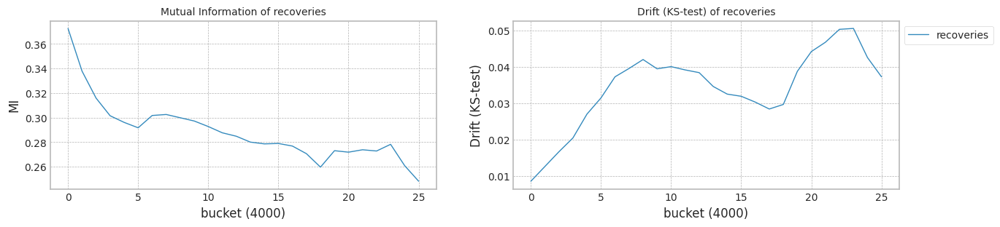

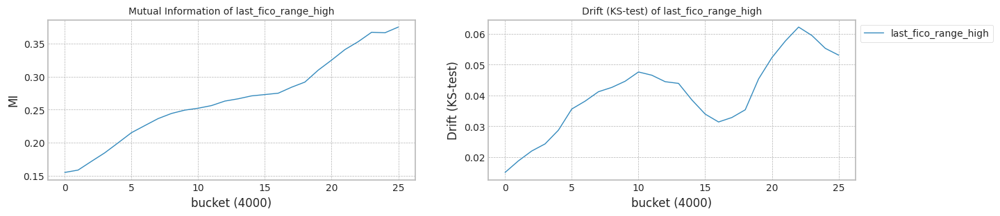

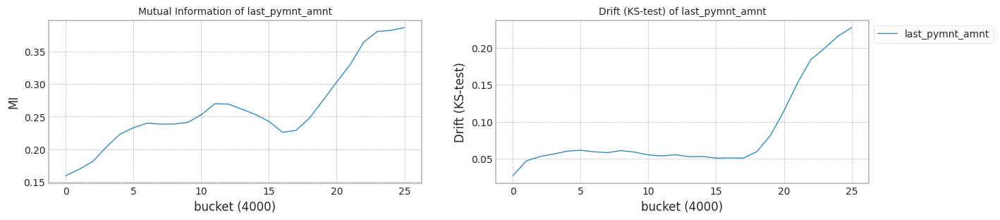

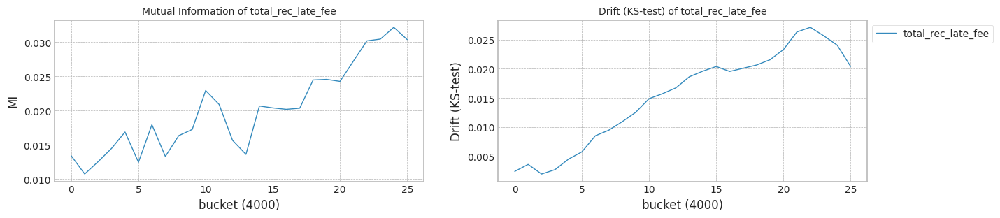

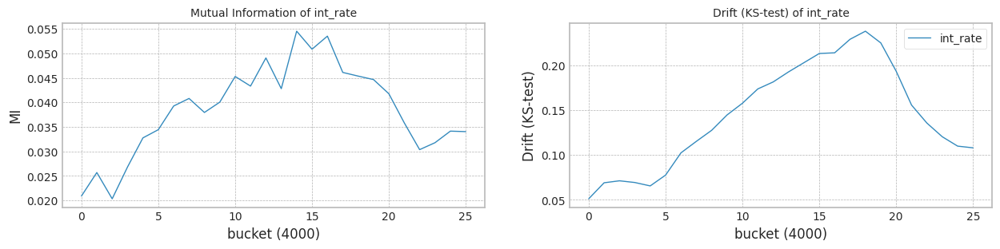

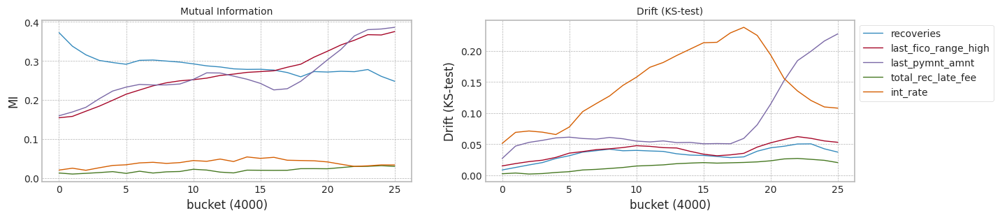

trial_count: 20
lambda_f2 1.0
######################### Trial 0 for Normal model ###########################
cuda:0


100%|██████████| 4000/4000 [00:06<00:00, 629.24it/s]


Test f1 score: 0.9315357887421821
X_live.shape (123968, 6)
Truncate 19968 rows from live_set (123968, 6)
Search MI & Drift...for X_live_set torch.Size([26, 20000, 6])


100%|██████████| 26/26 [00:10<00:00,  2.38it/s]


mean of drift:
recoveries              0.034250
last_fico_range_high    0.060517
last_pymnt_amnt         0.084537
total_rec_late_fee      0.021850
int_rate                0.149954
dtype: float64
Mean F1 for all data: 0.9116853036009894
######################### Trial 0 for Drift tolerant model ###########################
cuda:0


100%|██████████| 4000/4000 [00:15<00:00, 252.65it/s]


Test f1 score: 0.9629099650849979
X_live.shape (123968, 6)
Truncate 19968 rows from live_set (123968, 6)
Search MI & Drift...for X_live_set torch.Size([26, 20000, 6])


100%|██████████| 26/26 [00:10<00:00,  2.46it/s]


mean of drift:
recoveries              0.870098
last_fico_range_high    0.133927
last_pymnt_amnt         0.489763
total_rec_late_fee      0.945494
int_rate                0.153321
dtype: float64
Mean F1 for all data: 0.8996872581697285
Normal model median        : 0.9116853036009894
Drift tolerant model median: 0.8996872581697285
######################### Trial 1 for Normal model ###########################
cuda:0


100%|██████████| 4000/4000 [00:06<00:00, 635.09it/s]


Test f1 score: 0.9149358956909927
X_live.shape (123968, 6)
Truncate 19968 rows from live_set (123968, 6)
Search MI & Drift...for X_live_set torch.Size([26, 20000, 6])


100%|██████████| 26/26 [00:11<00:00,  2.35it/s]


mean of drift:
recoveries              0.034250
last_fico_range_high    0.060517
last_pymnt_amnt         0.084537
total_rec_late_fee      0.021850
int_rate                0.149954
dtype: float64
Mean F1 for all data: 0.8892937557842946
######################### Trial 1 for Drift tolerant model ###########################
cuda:0


100%|██████████| 4000/4000 [00:15<00:00, 256.45it/s]


Test f1 score: 0.973440574007638
X_live.shape (123968, 6)
Truncate 19968 rows from live_set (123968, 6)
Search MI & Drift...for X_live_set torch.Size([26, 20000, 6])


100%|██████████| 26/26 [00:10<00:00,  2.44it/s]


mean of drift:
recoveries              0.859758
last_fico_range_high    0.114825
last_pymnt_amnt         0.489075
total_rec_late_fee      0.965750
int_rate                0.153598
dtype: float64
Mean F1 for all data: 0.9622513322839512
Normal model median        : 0.9004895296926421
Drift tolerant model median: 0.9309692952268398
######################### Trial 2 for Normal model ###########################
cuda:0


100%|██████████| 4000/4000 [00:06<00:00, 634.91it/s]


Test f1 score: 0.9483997387328544
X_live.shape (123968, 6)
Truncate 19968 rows from live_set (123968, 6)
Search MI & Drift...for X_live_set torch.Size([26, 20000, 6])


100%|██████████| 26/26 [00:11<00:00,  2.35it/s]


mean of drift:
recoveries              0.034250
last_fico_range_high    0.060517
last_pymnt_amnt         0.084537
total_rec_late_fee      0.021850
int_rate                0.149954
dtype: float64
Mean F1 for all data: 0.9375235777252146
######################### Trial 2 for Drift tolerant model ###########################
cuda:0


100%|██████████| 4000/4000 [00:15<00:00, 253.01it/s]


Test f1 score: 0.9734702733979459
X_live.shape (123968, 6)
Truncate 19968 rows from live_set (123968, 6)
Search MI & Drift...for X_live_set torch.Size([26, 20000, 6])


100%|██████████| 26/26 [00:10<00:00,  2.41it/s]


mean of drift:
recoveries              0.860879
last_fico_range_high    0.165769
last_pymnt_amnt         0.083958
total_rec_late_fee      0.965721
int_rate                0.149587
dtype: float64
Mean F1 for all data: 0.9611210686444471
Normal model median        : 0.9116853036009894
Drift tolerant model median: 0.9611210686444471
######################### Trial 3 for Normal model ###########################
cuda:0


100%|██████████| 4000/4000 [00:06<00:00, 651.74it/s]


Test f1 score: 0.9299447881696862
X_live.shape (123968, 6)
Truncate 19968 rows from live_set (123968, 6)
Search MI & Drift...for X_live_set torch.Size([26, 20000, 6])


100%|██████████| 26/26 [00:10<00:00,  2.37it/s]


mean of drift:
recoveries              0.034250
last_fico_range_high    0.060517
last_pymnt_amnt         0.084537
total_rec_late_fee      0.021850
int_rate                0.149954
dtype: float64
Mean F1 for all data: 0.9093841469423276
######################### Trial 3 for Drift tolerant model ###########################
cuda:0


100%|██████████| 4000/4000 [00:15<00:00, 250.32it/s]


Test f1 score: 0.9138108944767285
X_live.shape (123968, 6)
Truncate 19968 rows from live_set (123968, 6)
Search MI & Drift...for X_live_set torch.Size([26, 20000, 6])


100%|██████████| 26/26 [00:10<00:00,  2.43it/s]


mean of drift:
recoveries              0.790958
last_fico_range_high    0.402056
last_pymnt_amnt         0.498523
total_rec_late_fee      0.923838
int_rate                0.135475
dtype: float64
Mean F1 for all data: 0.8867926868605498
Normal model median        : 0.9105347252716585
Drift tolerant model median: 0.9304041634070879
######################### Trial 4 for Normal model ###########################
cuda:0


100%|██████████| 4000/4000 [00:06<00:00, 645.46it/s]


Test f1 score: 0.9438628260992586
X_live.shape (123968, 6)
Truncate 19968 rows from live_set (123968, 6)
Search MI & Drift...for X_live_set torch.Size([26, 20000, 6])


100%|██████████| 26/26 [00:10<00:00,  2.38it/s]


mean of drift:
recoveries              0.034250
last_fico_range_high    0.060517
last_pymnt_amnt         0.084537
total_rec_late_fee      0.021850
int_rate                0.149954
dtype: float64
Mean F1 for all data: 0.9316019571171616
######################### Trial 4 for Drift tolerant model ###########################
cuda:0


100%|██████████| 4000/4000 [00:15<00:00, 254.59it/s]


Test f1 score: 0.9138108944767285
X_live.shape (123968, 6)
Truncate 19968 rows from live_set (123968, 6)
Search MI & Drift...for X_live_set torch.Size([26, 20000, 6])


100%|██████████| 26/26 [00:10<00:00,  2.42it/s]


mean of drift:
recoveries              0.887754
last_fico_range_high    0.105502
last_pymnt_amnt         0.493342
total_rec_late_fee      0.965750
int_rate                0.160677
dtype: float64
Mean F1 for all data: 0.8867926868605498
Normal model median        : 0.9116853036009894
Drift tolerant model median: 0.8996872581697285
######################### Trial 5 for Normal model ###########################
cuda:0


100%|██████████| 4000/4000 [00:06<00:00, 646.23it/s]


Test f1 score: 0.9339622641509433
X_live.shape (123968, 6)
Truncate 19968 rows from live_set (123968, 6)
Search MI & Drift...for X_live_set torch.Size([26, 20000, 6])


100%|██████████| 26/26 [00:10<00:00,  2.38it/s]


mean of drift:
recoveries              0.034250
last_fico_range_high    0.060517
last_pymnt_amnt         0.084537
total_rec_late_fee      0.021850
int_rate                0.149954
dtype: float64
Mean F1 for all data: 0.9151424942160997
######################### Trial 5 for Drift tolerant model ###########################
cuda:0


100%|██████████| 4000/4000 [00:15<00:00, 255.07it/s]


Test f1 score: 0.9727900991816788
X_live.shape (123968, 6)
Truncate 19968 rows from live_set (123968, 6)
Search MI & Drift...for X_live_set torch.Size([26, 20000, 6])


100%|██████████| 26/26 [00:10<00:00,  2.42it/s]


mean of drift:
recoveries              0.847850
last_fico_range_high    0.162983
last_pymnt_amnt         0.485815
total_rec_late_fee      0.921894
int_rate                0.154917
dtype: float64
Mean F1 for all data: 0.9589199045718734
Normal model median        : 0.9134138989085445
Drift tolerant model median: 0.9293035813708009
######################### Trial 6 for Normal model ###########################
cuda:0


100%|██████████| 4000/4000 [00:06<00:00, 648.04it/s]


Test f1 score: 0.9137813985064493
X_live.shape (123968, 6)
Truncate 19968 rows from live_set (123968, 6)
Search MI & Drift...for X_live_set torch.Size([26, 20000, 6])


100%|██████████| 26/26 [00:10<00:00,  2.37it/s]


mean of drift:
recoveries              0.034250
last_fico_range_high    0.060517
last_pymnt_amnt         0.084537
total_rec_late_fee      0.021850
int_rate                0.149954
dtype: float64
Mean F1 for all data: 0.8867861910860791
######################### Trial 6 for Drift tolerant model ###########################
cuda:0


100%|██████████| 4000/4000 [00:15<00:00, 253.77it/s]


Test f1 score: 0.972732267298962
X_live.shape (123968, 6)
Truncate 19968 rows from live_set (123968, 6)
Search MI & Drift...for X_live_set torch.Size([26, 20000, 6])


100%|██████████| 26/26 [00:10<00:00,  2.43it/s]


mean of drift:
recoveries              0.896958
last_fico_range_high    0.175465
last_pymnt_amnt         0.482092
total_rec_late_fee      0.946063
int_rate                0.151538
dtype: float64
Mean F1 for all data: 0.944534082862468
Normal model median        : 0.9116853036009894
Drift tolerant model median: 0.944534082862468
######################### Trial 7 for Normal model ###########################
cuda:0


100%|██████████| 4000/4000 [00:06<00:00, 637.86it/s]


Test f1 score: 0.9304714833120453
X_live.shape (123968, 6)
Truncate 19968 rows from live_set (123968, 6)
Search MI & Drift...for X_live_set torch.Size([26, 20000, 6])


100%|██████████| 26/26 [00:10<00:00,  2.41it/s]


mean of drift:
recoveries              0.034250
last_fico_range_high    0.060517
last_pymnt_amnt         0.084537
total_rec_late_fee      0.021850
int_rate                0.149954
dtype: float64
Mean F1 for all data: 0.9096420996103313
######################### Trial 7 for Drift tolerant model ###########################
cuda:0


100%|██████████| 4000/4000 [00:15<00:00, 255.21it/s]


Test f1 score: 0.9734016381580852
X_live.shape (123968, 6)
Truncate 19968 rows from live_set (123968, 6)
Search MI & Drift...for X_live_set torch.Size([26, 20000, 6])


100%|██████████| 26/26 [00:10<00:00,  2.44it/s]


mean of drift:
recoveries              0.860069
last_fico_range_high    0.101585
last_pymnt_amnt         0.489681
total_rec_late_fee      0.946879
int_rate                0.141812
dtype: float64
Mean F1 for all data: 0.9331119888460393
Normal model median        : 0.9106637016056603
Drift tolerant model median: 0.9388230358542536
######################### Trial 8 for Normal model ###########################
cuda:0


100%|██████████| 4000/4000 [00:06<00:00, 638.83it/s]


Test f1 score: 0.9138108944767285
X_live.shape (123968, 6)
Truncate 19968 rows from live_set (123968, 6)
Search MI & Drift...for X_live_set torch.Size([26, 20000, 6])


100%|██████████| 26/26 [00:11<00:00,  2.35it/s]


mean of drift:
recoveries              0.034250
last_fico_range_high    0.060517
last_pymnt_amnt         0.084537
total_rec_late_fee      0.021850
int_rate                0.149954
dtype: float64
Mean F1 for all data: 0.8867926868605498
######################### Trial 8 for Drift tolerant model ###########################
cuda:0


100%|██████████| 4000/4000 [00:15<00:00, 254.25it/s]


Test f1 score: 0.9735296670234617
X_live.shape (123968, 6)
Truncate 19968 rows from live_set (123968, 6)
Search MI & Drift...for X_live_set torch.Size([26, 20000, 6])


100%|██████████| 26/26 [00:10<00:00,  2.44it/s]


mean of drift:
recoveries              0.827917
last_fico_range_high    0.060956
last_pymnt_amnt         0.244265
total_rec_late_fee      0.965725
int_rate                0.151890
dtype: float64
Mean F1 for all data: 0.9641003331109237
Normal model median        : 0.9096420996103313
Drift tolerant model median: 0.944534082862468
######################### Trial 9 for Normal model ###########################
cuda:0


100%|██████████| 4000/4000 [00:06<00:00, 646.12it/s]


Test f1 score: 0.9341360760375729
X_live.shape (123968, 6)
Truncate 19968 rows from live_set (123968, 6)
Search MI & Drift...for X_live_set torch.Size([26, 20000, 6])


100%|██████████| 26/26 [00:10<00:00,  2.38it/s]


mean of drift:
recoveries              0.034250
last_fico_range_high    0.060517
last_pymnt_amnt         0.084537
total_rec_late_fee      0.021850
int_rate                0.149954
dtype: float64
Mean F1 for all data: 0.9162468130034456
######################### Trial 9 for Drift tolerant model ###########################
cuda:0


100%|██████████| 4000/4000 [00:15<00:00, 252.57it/s]


Test f1 score: 0.9731027302174918
X_live.shape (123968, 6)
Truncate 19968 rows from live_set (123968, 6)
Search MI & Drift...for X_live_set torch.Size([26, 20000, 6])


100%|██████████| 26/26 [00:10<00:00,  2.42it/s]


mean of drift:
recoveries              0.848060
last_fico_range_high    0.133235
last_pymnt_amnt         0.495387
total_rec_late_fee      0.965750
int_rate                0.165944
dtype: float64
Mean F1 for all data: 0.9642193953762479
Normal model median        : 0.9106637016056603
Drift tolerant model median: 0.9517269937171706
######################### Trial 10 for Normal model ###########################
cuda:0


100%|██████████| 4000/4000 [00:06<00:00, 647.53it/s]


Test f1 score: 0.9138108944767285
X_live.shape (123968, 6)
Truncate 19968 rows from live_set (123968, 6)
Search MI & Drift...for X_live_set torch.Size([26, 20000, 6])


100%|██████████| 26/26 [00:10<00:00,  2.41it/s]


mean of drift:
recoveries              0.034250
last_fico_range_high    0.060517
last_pymnt_amnt         0.084537
total_rec_late_fee      0.021850
int_rate                0.149954
dtype: float64
Mean F1 for all data: 0.8867926868605498
######################### Trial 10 for Drift tolerant model ###########################
cuda:0


100%|██████████| 4000/4000 [00:15<00:00, 256.71it/s]


Test f1 score: 0.9733765482115985
X_live.shape (123968, 6)
Truncate 19968 rows from live_set (123968, 6)
Search MI & Drift...for X_live_set torch.Size([26, 20000, 6])


100%|██████████| 26/26 [00:10<00:00,  2.43it/s]


mean of drift:
recoveries              0.860127
last_fico_range_high    0.120423
last_pymnt_amnt         0.477862
total_rec_late_fee      0.945490
int_rate                0.160298
dtype: float64
Mean F1 for all data: 0.9290023814188437
Normal model median        : 0.9096420996103313
Drift tolerant model median: 0.944534082862468
######################### Trial 11 for Normal model ###########################
cuda:0


100%|██████████| 4000/4000 [00:06<00:00, 649.74it/s]


Test f1 score: 0.9385191652350241
X_live.shape (123968, 6)
Truncate 19968 rows from live_set (123968, 6)
Search MI & Drift...for X_live_set torch.Size([26, 20000, 6])


100%|██████████| 26/26 [00:10<00:00,  2.42it/s]


mean of drift:
recoveries              0.034250
last_fico_range_high    0.060517
last_pymnt_amnt         0.084537
total_rec_late_fee      0.021850
int_rate                0.149954
dtype: float64
Mean F1 for all data: 0.9233479736340093
######################### Trial 11 for Drift tolerant model ###########################
cuda:0


100%|██████████| 4000/4000 [00:15<00:00, 258.57it/s]


Test f1 score: 0.9739996525566044
X_live.shape (123968, 6)
Truncate 19968 rows from live_set (123968, 6)
Search MI & Drift...for X_live_set torch.Size([26, 20000, 6])


100%|██████████| 26/26 [00:10<00:00,  2.47it/s]


mean of drift:
recoveries              0.859979
last_fico_range_high    0.141852
last_pymnt_amnt         0.476050
total_rec_late_fee      0.993244
int_rate                0.157838
dtype: float64
Mean F1 for all data: 0.9562770077056872
Normal model median        : 0.9106637016056603
Drift tolerant model median: 0.9504055452840776
######################### Trial 12 for Normal model ###########################
cuda:0


100%|██████████| 4000/4000 [00:06<00:00, 647.36it/s]


Test f1 score: 0.9386105263157895
X_live.shape (123968, 6)
Truncate 19968 rows from live_set (123968, 6)
Search MI & Drift...for X_live_set torch.Size([26, 20000, 6])


100%|██████████| 26/26 [00:10<00:00,  2.43it/s]


mean of drift:
recoveries              0.034250
last_fico_range_high    0.060517
last_pymnt_amnt         0.084537
total_rec_late_fee      0.021850
int_rate                0.149954
dtype: float64
Mean F1 for all data: 0.9236263800175257
######################### Trial 12 for Drift tolerant model ###########################
cuda:0


100%|██████████| 4000/4000 [00:15<00:00, 259.14it/s]


Test f1 score: 0.9729651583056239
X_live.shape (123968, 6)
Truncate 19968 rows from live_set (123968, 6)
Search MI & Drift...for X_live_set torch.Size([26, 20000, 6])


100%|██████████| 26/26 [00:10<00:00,  2.49it/s]


mean of drift:
recoveries              0.860463
last_fico_range_high    0.113460
last_pymnt_amnt         0.488113
total_rec_late_fee      0.946233
int_rate                0.169529
dtype: float64
Mean F1 for all data: 0.932463087188154
Normal model median        : 0.9116853036009894
Drift tolerant model median: 0.944534082862468
######################### Trial 13 for Normal model ###########################
cuda:0


100%|██████████| 4000/4000 [00:06<00:00, 652.32it/s]


Test f1 score: 0.9179459164162797
X_live.shape (123968, 6)
Truncate 19968 rows from live_set (123968, 6)
Search MI & Drift...for X_live_set torch.Size([26, 20000, 6])


100%|██████████| 26/26 [00:11<00:00,  2.31it/s]


mean of drift:
recoveries              0.034250
last_fico_range_high    0.060517
last_pymnt_amnt         0.084537
total_rec_late_fee      0.021850
int_rate                0.149954
dtype: float64
Mean F1 for all data: 0.8935746324871745
######################### Trial 13 for Drift tolerant model ###########################
cuda:0


100%|██████████| 4000/4000 [00:16<00:00, 246.79it/s]


Test f1 score: 0.9730761444807542
X_live.shape (123968, 6)
Truncate 19968 rows from live_set (123968, 6)
Search MI & Drift...for X_live_set torch.Size([26, 20000, 6])


100%|██████████| 26/26 [00:11<00:00,  2.34it/s]


mean of drift:
recoveries              0.828319
last_fico_range_high    0.139044
last_pymnt_amnt         0.490571
total_rec_late_fee      0.939117
int_rate                0.153769
dtype: float64
Mean F1 for all data: 0.9598656107093892
Normal model median        : 0.9106637016056603
Drift tolerant model median: 0.9504055452840776
######################### Trial 14 for Normal model ###########################
cuda:0


100%|██████████| 4000/4000 [00:06<00:00, 631.40it/s]


Test f1 score: 0.9171261669487363
X_live.shape (123968, 6)
Truncate 19968 rows from live_set (123968, 6)
Search MI & Drift...for X_live_set torch.Size([26, 20000, 6])


100%|██████████| 26/26 [00:10<00:00,  2.37it/s]


mean of drift:
recoveries              0.034250
last_fico_range_high    0.060517
last_pymnt_amnt         0.084537
total_rec_late_fee      0.021850
int_rate                0.149954
dtype: float64
Mean F1 for all data: 0.8928071580545702
######################### Trial 14 for Drift tolerant model ###########################
cuda:0


100%|██████████| 4000/4000 [00:15<00:00, 251.47it/s]


Test f1 score: 0.9138108944767285
X_live.shape (123968, 6)
Truncate 19968 rows from live_set (123968, 6)
Search MI & Drift...for X_live_set torch.Size([26, 20000, 6])


100%|██████████| 26/26 [00:10<00:00,  2.40it/s]


mean of drift:
recoveries              0.860679
last_fico_range_high    0.140956
last_pymnt_amnt         0.504523
total_rec_late_fee      0.941290
int_rate                0.142762
dtype: float64
Mean F1 for all data: 0.8867926868605498
Normal model median        : 0.9096420996103313
Drift tolerant model median: 0.944534082862468
######################### Trial 15 for Normal model ###########################
cuda:0


100%|██████████| 4000/4000 [00:06<00:00, 629.14it/s]


Test f1 score: 0.9412096592191379
X_live.shape (123968, 6)
Truncate 19968 rows from live_set (123968, 6)
Search MI & Drift...for X_live_set torch.Size([26, 20000, 6])


100%|██████████| 26/26 [00:11<00:00,  2.34it/s]


mean of drift:
recoveries              0.034250
last_fico_range_high    0.060517
last_pymnt_amnt         0.084537
total_rec_late_fee      0.021850
int_rate                0.149954
dtype: float64
Mean F1 for all data: 0.9274718720234378
######################### Trial 15 for Drift tolerant model ###########################
cuda:0


100%|██████████| 4000/4000 [00:15<00:00, 254.49it/s]


Test f1 score: 0.9729948534088937
X_live.shape (123968, 6)
Truncate 19968 rows from live_set (123968, 6)
Search MI & Drift...for X_live_set torch.Size([26, 20000, 6])


100%|██████████| 26/26 [00:10<00:00,  2.41it/s]


mean of drift:
recoveries              0.862281
last_fico_range_high    0.123673
last_pymnt_amnt         0.486562
total_rec_late_fee      0.965750
int_rate                0.156248
dtype: float64
Mean F1 for all data: 0.9629926266992987
Normal model median        : 0.9106637016056603
Drift tolerant model median: 0.9504055452840776
######################### Trial 16 for Normal model ###########################
cuda:0


100%|██████████| 4000/4000 [00:06<00:00, 643.10it/s]


Test f1 score: 0.9374297910581891
X_live.shape (123968, 6)
Truncate 19968 rows from live_set (123968, 6)
Search MI & Drift...for X_live_set torch.Size([26, 20000, 6])


100%|██████████| 26/26 [00:11<00:00,  2.29it/s]


mean of drift:
recoveries              0.034250
last_fico_range_high    0.060517
last_pymnt_amnt         0.084537
total_rec_late_fee      0.021850
int_rate                0.149954
dtype: float64
Mean F1 for all data: 0.9220949808842456
######################### Trial 16 for Drift tolerant model ###########################
cuda:0


100%|██████████| 4000/4000 [00:15<00:00, 253.32it/s]


Test f1 score: 0.9731605738084221
X_live.shape (123968, 6)
Truncate 19968 rows from live_set (123968, 6)
Search MI & Drift...for X_live_set torch.Size([26, 20000, 6])


100%|██████████| 26/26 [00:10<00:00,  2.40it/s]


mean of drift:
recoveries              0.895225
last_fico_range_high    0.122113
last_pymnt_amnt         0.484865
total_rec_late_fee      0.945437
int_rate                0.153040
dtype: float64
Mean F1 for all data: 0.931010713185035
Normal model median        : 0.9116853036009894
Drift tolerant model median: 0.944534082862468
######################### Trial 17 for Normal model ###########################
cuda:0


100%|██████████| 4000/4000 [00:06<00:00, 631.68it/s]


Test f1 score: 0.9355397774920334
X_live.shape (123968, 6)
Truncate 19968 rows from live_set (123968, 6)
Search MI & Drift...for X_live_set torch.Size([26, 20000, 6])


100%|██████████| 26/26 [00:11<00:00,  2.33it/s]


mean of drift:
recoveries              0.034250
last_fico_range_high    0.060517
last_pymnt_amnt         0.084537
total_rec_late_fee      0.021850
int_rate                0.149954
dtype: float64
Mean F1 for all data: 0.9176229150724697
######################### Trial 17 for Drift tolerant model ###########################
cuda:0


100%|██████████| 4000/4000 [00:15<00:00, 253.41it/s]


Test f1 score: 0.9679516685845799
X_live.shape (123968, 6)
Truncate 19968 rows from live_set (123968, 6)
Search MI & Drift...for X_live_set torch.Size([26, 20000, 6])


100%|██████████| 26/26 [00:10<00:00,  2.39it/s]


mean of drift:
recoveries              0.894488
last_fico_range_high    0.102808
last_pymnt_amnt         0.487221
total_rec_late_fee      0.948494
int_rate                0.147912
dtype: float64
Mean F1 for all data: 0.9028366095822324
Normal model median        : 0.9134138989085445
Drift tolerant model median: 0.9388230358542536
######################### Trial 18 for Normal model ###########################
cuda:0


100%|██████████| 4000/4000 [00:06<00:00, 639.53it/s]


Test f1 score: 0.922117866754545
X_live.shape (123968, 6)
Truncate 19968 rows from live_set (123968, 6)
Search MI & Drift...for X_live_set torch.Size([26, 20000, 6])


100%|██████████| 26/26 [00:11<00:00,  2.34it/s]


mean of drift:
recoveries              0.034250
last_fico_range_high    0.060517
last_pymnt_amnt         0.084537
total_rec_late_fee      0.021850
int_rate                0.149954
dtype: float64
Mean F1 for all data: 0.8991483356899502
######################### Trial 18 for Drift tolerant model ###########################
cuda:0


100%|██████████| 4000/4000 [00:16<00:00, 248.71it/s]


Test f1 score: 0.9725385905070243
X_live.shape (123968, 6)
Truncate 19968 rows from live_set (123968, 6)
Search MI & Drift...for X_live_set torch.Size([26, 20000, 6])


100%|██████████| 26/26 [00:10<00:00,  2.39it/s]


mean of drift:
recoveries              0.832350
last_fico_range_high    0.148819
last_pymnt_amnt         0.493812
total_rec_late_fee      0.926692
int_rate                0.158056
dtype: float64
Mean F1 for all data: 0.9605215715432883
Normal model median        : 0.9116853036009894
Drift tolerant model median: 0.944534082862468
######################### Trial 19 for Normal model ###########################
cuda:0


100%|██████████| 4000/4000 [00:06<00:00, 626.97it/s]


Test f1 score: 0.9138108944767285
X_live.shape (123968, 6)
Truncate 19968 rows from live_set (123968, 6)
Search MI & Drift...for X_live_set torch.Size([26, 20000, 6])


100%|██████████| 26/26 [00:11<00:00,  2.30it/s]


mean of drift:
recoveries              0.034250
last_fico_range_high    0.060517
last_pymnt_amnt         0.084537
total_rec_late_fee      0.021850
int_rate                0.149954
dtype: float64
Mean F1 for all data: 0.8867926868605498
######################### Trial 19 for Drift tolerant model ###########################
cuda:0


100%|██████████| 4000/4000 [00:15<00:00, 252.92it/s]


Test f1 score: 0.9729870430356315
X_live.shape (123968, 6)
Truncate 19968 rows from live_set (123968, 6)
Search MI & Drift...for X_live_set torch.Size([26, 20000, 6])


100%|██████████| 26/26 [00:10<00:00,  2.39it/s]


mean of drift:
recoveries              0.878879
last_fico_range_high    0.140008
last_pymnt_amnt         0.492702
total_rec_late_fee      0.965750
int_rate                0.154169
dtype: float64
Mean F1 for all data: 0.9705772853503702
Normal model median        : 0.9106637016056603
Drift tolerant model median: 0.9504055452840776
######################### Trial 0 for Normal model ###########################
retrain_interval: 14
######################### Trial 0 for SEA ###########################
X_live.shape (123968, 6)
Truncate 19968 rows from live_set (123968, 6)
Search MI & Drift...for X_live_set torch.Size([26, 20000, 6])


100%|██████████| 26/26 [00:15<00:00,  1.64it/s]


Early stop at  nan
Mean of drift:
recoveries              0.034250
last_fico_range_high    0.060517
last_pymnt_amnt         0.084537
total_rec_late_fee      0.021850
int_rate                0.149954
dtype: float64
Mean F1 for all data: 0.9423881821797414
SEA median: 0.9423881821797414
######################### Trial 0 for AUE ###########################
X_live.shape (123968, 6)
Truncate 19968 rows from live_set (123968, 6)
Search MI & Drift...for X_live_set torch.Size([26, 20000, 6])


100%|██████████| 26/26 [00:16<00:00,  1.62it/s]


Early stop at  3845.0
Mean of drift:
recoveries              0.034250
last_fico_range_high    0.060517
last_pymnt_amnt         0.084537
total_rec_late_fee      0.021850
int_rate                0.149954
dtype: float64
Mean F1 for all data: 0.9417539117668141
AUE median: 0.9417539117668141
######################### Trial 0 for DTEL ###########################
X_live.shape (123968, 6)
Truncate 19968 rows from live_set (123968, 6)
Search MI & Drift...for X_live_set torch.Size([26, 20000, 6])


100%|██████████| 26/26 [00:20<00:00,  1.25it/s]


Early stop at  nan
Mean of drift:
recoveries              0.034250
last_fico_range_high    0.060517
last_pymnt_amnt         0.084537
total_rec_late_fee      0.021850
int_rate                0.149954
dtype: float64
Mean F1 for all data: 0.9457371559835414
DTEL median: 0.9457371559835414
######################### Trial 1 for Normal model ###########################
retrain_interval: 14
######################### Trial 1 for SEA ###########################
X_live.shape (123968, 6)
Truncate 19968 rows from live_set (123968, 6)
Search MI & Drift...for X_live_set torch.Size([26, 20000, 6])


100%|██████████| 26/26 [00:16<00:00,  1.60it/s]


Early stop at  nan
Mean of drift:
recoveries              0.034250
last_fico_range_high    0.060517
last_pymnt_amnt         0.084537
total_rec_late_fee      0.021850
int_rate                0.149954
dtype: float64
Mean F1 for all data: 0.9299702722767407
SEA median: 0.936179227228241
######################### Trial 1 for AUE ###########################
X_live.shape (123968, 6)
Truncate 19968 rows from live_set (123968, 6)
Search MI & Drift...for X_live_set torch.Size([26, 20000, 6])


100%|██████████| 26/26 [00:16<00:00,  1.61it/s]


Early stop at  nan
Mean of drift:
recoveries              0.034250
last_fico_range_high    0.060517
last_pymnt_amnt         0.084537
total_rec_late_fee      0.021850
int_rate                0.149954
dtype: float64
Mean F1 for all data: 0.9310634610571124
AUE median: 0.9364086864119632
######################### Trial 1 for DTEL ###########################
X_live.shape (123968, 6)
Truncate 19968 rows from live_set (123968, 6)
Search MI & Drift...for X_live_set torch.Size([26, 20000, 6])


100%|██████████| 26/26 [00:20<00:00,  1.25it/s]


Early stop at  nan
Mean of drift:
recoveries              0.034250
last_fico_range_high    0.060517
last_pymnt_amnt         0.084537
total_rec_late_fee      0.021850
int_rate                0.149954
dtype: float64
Mean F1 for all data: 0.9350062138895063
DTEL median: 0.9403716849365238
######################### Trial 2 for Normal model ###########################
retrain_interval: 14
######################### Trial 2 for SEA ###########################
X_live.shape (123968, 6)
Truncate 19968 rows from live_set (123968, 6)
Search MI & Drift...for X_live_set torch.Size([26, 20000, 6])


100%|██████████| 26/26 [00:15<00:00,  1.66it/s]


Early stop at  3897.0
Mean of drift:
recoveries              0.034250
last_fico_range_high    0.060517
last_pymnt_amnt         0.084537
total_rec_late_fee      0.021850
int_rate                0.149954
dtype: float64
Mean F1 for all data: 0.9563688828443475
SEA median: 0.9423881821797414
######################### Trial 2 for AUE ###########################
X_live.shape (123968, 6)
Truncate 19968 rows from live_set (123968, 6)
Search MI & Drift...for X_live_set torch.Size([26, 20000, 6])


100%|██████████| 26/26 [00:15<00:00,  1.63it/s]


Early stop at  3970.0
Mean of drift:
recoveries              0.034250
last_fico_range_high    0.060517
last_pymnt_amnt         0.084537
total_rec_late_fee      0.021850
int_rate                0.149954
dtype: float64
Mean F1 for all data: 0.9545981634906476
AUE median: 0.9417539117668141
######################### Trial 2 for DTEL ###########################
X_live.shape (123968, 6)
Truncate 19968 rows from live_set (123968, 6)
Search MI & Drift...for X_live_set torch.Size([26, 20000, 6])


100%|██████████| 26/26 [00:20<00:00,  1.29it/s]


Early stop at  3659.0
Mean of drift:
recoveries              0.034250
last_fico_range_high    0.060517
last_pymnt_amnt         0.084537
total_rec_late_fee      0.021850
int_rate                0.149954
dtype: float64
Mean F1 for all data: 0.9588455945331561
DTEL median: 0.9457371559835414
######################### Trial 3 for Normal model ###########################
retrain_interval: 14
######################### Trial 3 for SEA ###########################
X_live.shape (123968, 6)
Truncate 19968 rows from live_set (123968, 6)
Search MI & Drift...for X_live_set torch.Size([26, 20000, 6])


100%|██████████| 26/26 [00:15<00:00,  1.65it/s]


Early stop at  nan
Mean of drift:
recoveries              0.034250
last_fico_range_high    0.060517
last_pymnt_amnt         0.084537
total_rec_late_fee      0.021850
int_rate                0.149954
dtype: float64
Mean F1 for all data: 0.9406694952561414
SEA median: 0.9415288387179415
######################### Trial 3 for AUE ###########################
X_live.shape (123968, 6)
Truncate 19968 rows from live_set (123968, 6)
Search MI & Drift...for X_live_set torch.Size([26, 20000, 6])


100%|██████████| 26/26 [00:14<00:00,  1.75it/s]


Early stop at  3229.0
Mean of drift:
recoveries              0.034250
last_fico_range_high    0.060517
last_pymnt_amnt         0.084537
total_rec_late_fee      0.021850
int_rate                0.149954
dtype: float64
Mean F1 for all data: 0.9407233698247359
AUE median: 0.941238640795775
######################### Trial 3 for DTEL ###########################
X_live.shape (123968, 6)
Truncate 19968 rows from live_set (123968, 6)
Search MI & Drift...for X_live_set torch.Size([26, 20000, 6])


100%|██████████| 26/26 [00:20<00:00,  1.27it/s]


Early stop at  nan
Mean of drift:
recoveries              0.034250
last_fico_range_high    0.060517
last_pymnt_amnt         0.084537
total_rec_late_fee      0.021850
int_rate                0.149954
dtype: float64
Mean F1 for all data: 0.9448467746445495
DTEL median: 0.9452919653140455
######################### Trial 4 for Normal model ###########################
retrain_interval: 14
######################### Trial 4 for SEA ###########################
X_live.shape (123968, 6)
Truncate 19968 rows from live_set (123968, 6)
Search MI & Drift...for X_live_set torch.Size([26, 20000, 6])


100%|██████████| 26/26 [00:16<00:00,  1.57it/s]


Early stop at  nan
Mean of drift:
recoveries              0.034250
last_fico_range_high    0.060517
last_pymnt_amnt         0.084537
total_rec_late_fee      0.021850
int_rate                0.149954
dtype: float64
Mean F1 for all data: 0.9531810954466562
SEA median: 0.9423881821797414
######################### Trial 4 for AUE ###########################
X_live.shape (123968, 6)
Truncate 19968 rows from live_set (123968, 6)
Search MI & Drift...for X_live_set torch.Size([26, 20000, 6])


100%|██████████| 26/26 [00:16<00:00,  1.61it/s]


Early stop at  3727.0
Mean of drift:
recoveries              0.034250
last_fico_range_high    0.060517
last_pymnt_amnt         0.084537
total_rec_late_fee      0.021850
int_rate                0.149954
dtype: float64
Mean F1 for all data: 0.9515799692815418
AUE median: 0.9417539117668141
######################### Trial 4 for DTEL ###########################
X_live.shape (123968, 6)
Truncate 19968 rows from live_set (123968, 6)
Search MI & Drift...for X_live_set torch.Size([26, 20000, 6])


100%|██████████| 26/26 [00:19<00:00,  1.33it/s]


Early stop at  2942.0
Mean of drift:
recoveries              0.034250
last_fico_range_high    0.060517
last_pymnt_amnt         0.084537
total_rec_late_fee      0.021850
int_rate                0.149954
dtype: float64
Mean F1 for all data: 0.9555970116116221
DTEL median: 0.9457371559835414
######################### Trial 5 for Normal model ###########################
retrain_interval: 14
######################### Trial 5 for SEA ###########################
X_live.shape (123968, 6)
Truncate 19968 rows from live_set (123968, 6)
Search MI & Drift...for X_live_set torch.Size([26, 20000, 6])


100%|██████████| 26/26 [00:15<00:00,  1.63it/s]


Early stop at  nan
Mean of drift:
recoveries              0.034250
last_fico_range_high    0.060517
last_pymnt_amnt         0.084537
total_rec_late_fee      0.021850
int_rate                0.149954
dtype: float64
Mean F1 for all data: 0.9439759669307192
SEA median: 0.9431820745552303
######################### Trial 5 for AUE ###########################
X_live.shape (123968, 6)
Truncate 19968 rows from live_set (123968, 6)
Search MI & Drift...for X_live_set torch.Size([26, 20000, 6])


100%|██████████| 26/26 [00:16<00:00,  1.62it/s]


Early stop at  nan
Mean of drift:
recoveries              0.034250
last_fico_range_high    0.060517
last_pymnt_amnt         0.084537
total_rec_late_fee      0.021850
int_rate                0.149954
dtype: float64
Mean F1 for all data: 0.9435089359588402
AUE median: 0.9426314238628272
######################### Trial 5 for DTEL ###########################
X_live.shape (123968, 6)
Truncate 19968 rows from live_set (123968, 6)
Search MI & Drift...for X_live_set torch.Size([26, 20000, 6])


100%|██████████| 26/26 [00:19<00:00,  1.35it/s]


Early stop at  2908.0
Mean of drift:
recoveries              0.034250
last_fico_range_high    0.060517
last_pymnt_amnt         0.084537
total_rec_late_fee      0.021850
int_rate                0.149954
dtype: float64
Mean F1 for all data: 0.9478021343341667
DTEL median: 0.9467696451588541
######################### Trial 6 for Normal model ###########################
retrain_interval: 14
######################### Trial 6 for SEA ###########################
X_live.shape (123968, 6)
Truncate 19968 rows from live_set (123968, 6)
Search MI & Drift...for X_live_set torch.Size([26, 20000, 6])


100%|██████████| 26/26 [00:15<00:00,  1.67it/s]


Early stop at  3681.0
Mean of drift:
recoveries              0.034250
last_fico_range_high    0.060517
last_pymnt_amnt         0.084537
total_rec_late_fee      0.021850
int_rate                0.149954
dtype: float64
Mean F1 for all data: 0.9281829018148964
SEA median: 0.9423881821797414
######################### Trial 6 for AUE ###########################
X_live.shape (123968, 6)
Truncate 19968 rows from live_set (123968, 6)
Search MI & Drift...for X_live_set torch.Size([26, 20000, 6])


100%|██████████| 26/26 [00:15<00:00,  1.63it/s]


Early stop at  nan
Mean of drift:
recoveries              0.034250
last_fico_range_high    0.060517
last_pymnt_amnt         0.084537
total_rec_late_fee      0.021850
int_rate                0.149954
dtype: float64
Mean F1 for all data: 0.9291603643085631
AUE median: 0.9417539117668141
######################### Trial 6 for DTEL ###########################
X_live.shape (123968, 6)
Truncate 19968 rows from live_set (123968, 6)
Search MI & Drift...for X_live_set torch.Size([26, 20000, 6])


100%|██████████| 26/26 [00:20<00:00,  1.29it/s]


Early stop at  3723.0
Mean of drift:
recoveries              0.034250
last_fico_range_high    0.060517
last_pymnt_amnt         0.084537
total_rec_late_fee      0.021850
int_rate                0.149954
dtype: float64
Mean F1 for all data: 0.9338106729701277
DTEL median: 0.9457371559835414
######################### Trial 7 for Normal model ###########################
retrain_interval: 14
######################### Trial 7 for SEA ###########################
X_live.shape (123968, 6)
Truncate 19968 rows from live_set (123968, 6)
Search MI & Drift...for X_live_set torch.Size([26, 20000, 6])


100%|██████████| 26/26 [00:15<00:00,  1.64it/s]


Early stop at  nan
Mean of drift:
recoveries              0.034250
last_fico_range_high    0.060517
last_pymnt_amnt         0.084537
total_rec_late_fee      0.021850
int_rate                0.149954
dtype: float64
Mean F1 for all data: 0.9408162424062934
SEA median: 0.9416022122930174
######################### Trial 7 for AUE ###########################
X_live.shape (123968, 6)
Truncate 19968 rows from live_set (123968, 6)
Search MI & Drift...for X_live_set torch.Size([26, 20000, 6])


100%|██████████| 26/26 [00:15<00:00,  1.64it/s]


Early stop at  nan
Mean of drift:
recoveries              0.034250
last_fico_range_high    0.060517
last_pymnt_amnt         0.084537
total_rec_late_fee      0.021850
int_rate                0.149954
dtype: float64
Mean F1 for all data: 0.9396251308331733
AUE median: 0.941238640795775
######################### Trial 7 for DTEL ###########################
X_live.shape (123968, 6)
Truncate 19968 rows from live_set (123968, 6)
Search MI & Drift...for X_live_set torch.Size([26, 20000, 6])


100%|██████████| 26/26 [00:20<00:00,  1.26it/s]


Early stop at  nan
Mean of drift:
recoveries              0.034250
last_fico_range_high    0.060517
last_pymnt_amnt         0.084537
total_rec_late_fee      0.021850
int_rate                0.149954
dtype: float64
Mean F1 for all data: 0.9448387903583757
DTEL median: 0.9452919653140455
######################### Trial 8 for Normal model ###########################
retrain_interval: 14
######################### Trial 8 for SEA ###########################
X_live.shape (123968, 6)
Truncate 19968 rows from live_set (123968, 6)
Search MI & Drift...for X_live_set torch.Size([26, 20000, 6])


100%|██████████| 26/26 [00:14<00:00,  1.75it/s]


Early stop at  2738.0
Mean of drift:
recoveries              0.034250
last_fico_range_high    0.060517
last_pymnt_amnt         0.084537
total_rec_late_fee      0.021850
int_rate                0.149954
dtype: float64
Mean F1 for all data: 0.9301159612533076
SEA median: 0.9408162424062934
######################### Trial 8 for AUE ###########################
X_live.shape (123968, 6)
Truncate 19968 rows from live_set (123968, 6)
Search MI & Drift...for X_live_set torch.Size([26, 20000, 6])


100%|██████████| 26/26 [00:16<00:00,  1.60it/s]


Early stop at  nan
Mean of drift:
recoveries              0.034250
last_fico_range_high    0.060517
last_pymnt_amnt         0.084537
total_rec_late_fee      0.021850
int_rate                0.149954
dtype: float64
Mean F1 for all data: 0.9293990344552058
AUE median: 0.9407233698247359
######################### Trial 8 for DTEL ###########################
X_live.shape (123968, 6)
Truncate 19968 rows from live_set (123968, 6)
Search MI & Drift...for X_live_set torch.Size([26, 20000, 6])


100%|██████████| 26/26 [00:20<00:00,  1.25it/s]


Early stop at  nan
Mean of drift:
recoveries              0.034250
last_fico_range_high    0.060517
last_pymnt_amnt         0.084537
total_rec_late_fee      0.021850
int_rate                0.149954
dtype: float64
Mean F1 for all data: 0.9343747243111851
DTEL median: 0.9448467746445495
######################### Trial 9 for Normal model ###########################
retrain_interval: 14
######################### Trial 9 for SEA ###########################
X_live.shape (123968, 6)
Truncate 19968 rows from live_set (123968, 6)
Search MI & Drift...for X_live_set torch.Size([26, 20000, 6])


100%|██████████| 26/26 [00:16<00:00,  1.61it/s]


Early stop at  nan
Mean of drift:
recoveries              0.034250
last_fico_range_high    0.060517
last_pymnt_amnt         0.084537
total_rec_late_fee      0.021850
int_rate                0.149954
dtype: float64
Mean F1 for all data: 0.9448714108595353
SEA median: 0.9416022122930174
######################### Trial 9 for AUE ###########################
X_live.shape (123968, 6)
Truncate 19968 rows from live_set (123968, 6)
Search MI & Drift...for X_live_set torch.Size([26, 20000, 6])


100%|██████████| 26/26 [00:16<00:00,  1.60it/s]


Early stop at  3867.0
Mean of drift:
recoveries              0.034250
last_fico_range_high    0.060517
last_pymnt_amnt         0.084537
total_rec_late_fee      0.021850
int_rate                0.149954
dtype: float64
Mean F1 for all data: 0.9439420975618575
AUE median: 0.941238640795775
######################### Trial 9 for DTEL ###########################
X_live.shape (123968, 6)
Truncate 19968 rows from live_set (123968, 6)
Search MI & Drift...for X_live_set torch.Size([26, 20000, 6])


100%|██████████| 26/26 [00:20<00:00,  1.29it/s]


Early stop at  3572.0
Mean of drift:
recoveries              0.034250
last_fico_range_high    0.060517
last_pymnt_amnt         0.084537
total_rec_late_fee      0.021850
int_rate                0.149954
dtype: float64
Mean F1 for all data: 0.9481250379644144
DTEL median: 0.9452919653140455
######################### Trial 10 for Normal model ###########################
retrain_interval: 14
######################### Trial 10 for SEA ###########################
X_live.shape (123968, 6)
Truncate 19968 rows from live_set (123968, 6)
Search MI & Drift...for X_live_set torch.Size([26, 20000, 6])


100%|██████████| 26/26 [00:16<00:00,  1.62it/s]


Early stop at  nan
Mean of drift:
recoveries              0.034250
last_fico_range_high    0.060517
last_pymnt_amnt         0.084537
total_rec_late_fee      0.021850
int_rate                0.149954
dtype: float64
Mean F1 for all data: 0.9292330845870379
SEA median: 0.9408162424062934
######################### Trial 10 for AUE ###########################
X_live.shape (123968, 6)
Truncate 19968 rows from live_set (123968, 6)
Search MI & Drift...for X_live_set torch.Size([26, 20000, 6])


100%|██████████| 26/26 [00:16<00:00,  1.60it/s]


Early stop at  nan
Mean of drift:
recoveries              0.034250
last_fico_range_high    0.060517
last_pymnt_amnt         0.084537
total_rec_late_fee      0.021850
int_rate                0.149954
dtype: float64
Mean F1 for all data: 0.9301540666797729
AUE median: 0.9407233698247359
######################### Trial 10 for DTEL ###########################
X_live.shape (123968, 6)
Truncate 19968 rows from live_set (123968, 6)
Search MI & Drift...for X_live_set torch.Size([26, 20000, 6])


100%|██████████| 26/26 [00:20<00:00,  1.26it/s]


Early stop at  nan
Mean of drift:
recoveries              0.034250
last_fico_range_high    0.060517
last_pymnt_amnt         0.084537
total_rec_late_fee      0.021850
int_rate                0.149954
dtype: float64
Mean F1 for all data: 0.9337936583976619
DTEL median: 0.9448467746445495
######################### Trial 11 for Normal model ###########################
retrain_interval: 14
######################### Trial 11 for SEA ###########################
X_live.shape (123968, 6)
Truncate 19968 rows from live_set (123968, 6)
Search MI & Drift...for X_live_set torch.Size([26, 20000, 6])


100%|██████████| 26/26 [00:16<00:00,  1.62it/s]


Early stop at  nan
Mean of drift:
recoveries              0.034250
last_fico_range_high    0.060517
last_pymnt_amnt         0.084537
total_rec_late_fee      0.021850
int_rate                0.149954
dtype: float64
Mean F1 for all data: 0.9484871542651742
SEA median: 0.9416022122930174
######################### Trial 11 for AUE ###########################
X_live.shape (123968, 6)
Truncate 19968 rows from live_set (123968, 6)
Search MI & Drift...for X_live_set torch.Size([26, 20000, 6])


100%|██████████| 26/26 [00:16<00:00,  1.62it/s]


Early stop at  nan
Mean of drift:
recoveries              0.034250
last_fico_range_high    0.060517
last_pymnt_amnt         0.084537
total_rec_late_fee      0.021850
int_rate                0.149954
dtype: float64
Mean F1 for all data: 0.9455581195978865
AUE median: 0.941238640795775
######################### Trial 11 for DTEL ###########################
X_live.shape (123968, 6)
Truncate 19968 rows from live_set (123968, 6)
Search MI & Drift...for X_live_set torch.Size([26, 20000, 6])


100%|██████████| 26/26 [00:20<00:00,  1.24it/s]


Early stop at  nan
Mean of drift:
recoveries              0.034250
last_fico_range_high    0.060517
last_pymnt_amnt         0.084537
total_rec_late_fee      0.021850
int_rate                0.149954
dtype: float64
Mean F1 for all data: 0.9517482350837998
DTEL median: 0.9452919653140455
######################### Trial 12 for Normal model ###########################
retrain_interval: 14
######################### Trial 12 for SEA ###########################
X_live.shape (123968, 6)
Truncate 19968 rows from live_set (123968, 6)
Search MI & Drift...for X_live_set torch.Size([26, 20000, 6])


100%|██████████| 26/26 [00:15<00:00,  1.64it/s]


Early stop at  3737.0
Mean of drift:
recoveries              0.034250
last_fico_range_high    0.060517
last_pymnt_amnt         0.084537
total_rec_late_fee      0.021850
int_rate                0.149954
dtype: float64
Mean F1 for all data: 0.9491201456191385
SEA median: 0.9423881821797414
######################### Trial 12 for AUE ###########################
X_live.shape (123968, 6)
Truncate 19968 rows from live_set (123968, 6)
Search MI & Drift...for X_live_set torch.Size([26, 20000, 6])


100%|██████████| 26/26 [00:15<00:00,  1.63it/s]


Early stop at  3826.0
Mean of drift:
recoveries              0.034250
last_fico_range_high    0.060517
last_pymnt_amnt         0.084537
total_rec_late_fee      0.021850
int_rate                0.149954
dtype: float64
Mean F1 for all data: 0.9480181765706004
AUE median: 0.9417539117668141
######################### Trial 12 for DTEL ###########################
X_live.shape (123968, 6)
Truncate 19968 rows from live_set (123968, 6)
Search MI & Drift...for X_live_set torch.Size([26, 20000, 6])


100%|██████████| 26/26 [00:20<00:00,  1.27it/s]


Early stop at  3715.0
Mean of drift:
recoveries              0.034250
last_fico_range_high    0.060517
last_pymnt_amnt         0.084537
total_rec_late_fee      0.021850
int_rate                0.149954
dtype: float64
Mean F1 for all data: 0.9516174878119306
DTEL median: 0.9457371559835414
######################### Trial 13 for Normal model ###########################
retrain_interval: 14
######################### Trial 13 for SEA ###########################
X_live.shape (123968, 6)
Truncate 19968 rows from live_set (123968, 6)
Search MI & Drift...for X_live_set torch.Size([26, 20000, 6])


100%|██████████| 26/26 [00:15<00:00,  1.68it/s]


Early stop at  3461.0
Mean of drift:
recoveries              0.034250
last_fico_range_high    0.060517
last_pymnt_amnt         0.084537
total_rec_late_fee      0.021850
int_rate                0.149954
dtype: float64
Mean F1 for all data: 0.9326450691172934
SEA median: 0.9416022122930174
######################### Trial 13 for AUE ###########################
X_live.shape (123968, 6)
Truncate 19968 rows from live_set (123968, 6)
Search MI & Drift...for X_live_set torch.Size([26, 20000, 6])


100%|██████████| 26/26 [00:16<00:00,  1.61it/s]


Early stop at  nan
Mean of drift:
recoveries              0.034250
last_fico_range_high    0.060517
last_pymnt_amnt         0.084537
total_rec_late_fee      0.021850
int_rate                0.149954
dtype: float64
Mean F1 for all data: 0.9318325721756584
AUE median: 0.941238640795775
######################### Trial 13 for DTEL ###########################
X_live.shape (123968, 6)
Truncate 19968 rows from live_set (123968, 6)
Search MI & Drift...for X_live_set torch.Size([26, 20000, 6])


100%|██████████| 26/26 [00:20<00:00,  1.25it/s]


Early stop at  nan
Mean of drift:
recoveries              0.034250
last_fico_range_high    0.060517
last_pymnt_amnt         0.084537
total_rec_late_fee      0.021850
int_rate                0.149954
dtype: float64
Mean F1 for all data: 0.9370397894637189
DTEL median: 0.9452919653140455
######################### Trial 14 for Normal model ###########################
retrain_interval: 14
######################### Trial 14 for SEA ###########################
X_live.shape (123968, 6)
Truncate 19968 rows from live_set (123968, 6)
Search MI & Drift...for X_live_set torch.Size([26, 20000, 6])


100%|██████████| 26/26 [00:15<00:00,  1.66it/s]


Early stop at  3684.0
Mean of drift:
recoveries              0.034250
last_fico_range_high    0.060517
last_pymnt_amnt         0.084537
total_rec_late_fee      0.021850
int_rate                0.149954
dtype: float64
Mean F1 for all data: 0.932199501187272
SEA median: 0.9408162424062934
######################### Trial 14 for AUE ###########################
X_live.shape (123968, 6)
Truncate 19968 rows from live_set (123968, 6)
Search MI & Drift...for X_live_set torch.Size([26, 20000, 6])


100%|██████████| 26/26 [00:15<00:00,  1.63it/s]


Early stop at  nan
Mean of drift:
recoveries              0.034250
last_fico_range_high    0.060517
last_pymnt_amnt         0.084537
total_rec_late_fee      0.021850
int_rate                0.149954
dtype: float64
Mean F1 for all data: 0.9324553333110277
AUE median: 0.9407233698247359
######################### Trial 14 for DTEL ###########################
X_live.shape (123968, 6)
Truncate 19968 rows from live_set (123968, 6)
Search MI & Drift...for X_live_set torch.Size([26, 20000, 6])


100%|██████████| 26/26 [00:20<00:00,  1.25it/s]


Early stop at  nan
Mean of drift:
recoveries              0.034250
last_fico_range_high    0.060517
last_pymnt_amnt         0.084537
total_rec_late_fee      0.021850
int_rate                0.149954
dtype: float64
Mean F1 for all data: 0.9370408987847886
DTEL median: 0.9448467746445495
######################### Trial 15 for Normal model ###########################
retrain_interval: 14
######################### Trial 15 for SEA ###########################
X_live.shape (123968, 6)
Truncate 19968 rows from live_set (123968, 6)
Search MI & Drift...for X_live_set torch.Size([26, 20000, 6])


100%|██████████| 26/26 [00:16<00:00,  1.62it/s]


Early stop at  nan
Mean of drift:
recoveries              0.034250
last_fico_range_high    0.060517
last_pymnt_amnt         0.084537
total_rec_late_fee      0.021850
int_rate                0.149954
dtype: float64
Mean F1 for all data: 0.9506924608612907
SEA median: 0.9416022122930174
######################### Trial 15 for AUE ###########################
X_live.shape (123968, 6)
Truncate 19968 rows from live_set (123968, 6)
Search MI & Drift...for X_live_set torch.Size([26, 20000, 6])


100%|██████████| 26/26 [00:16<00:00,  1.61it/s]


Early stop at  nan
Mean of drift:
recoveries              0.034250
last_fico_range_high    0.060517
last_pymnt_amnt         0.084537
total_rec_late_fee      0.021850
int_rate                0.149954
dtype: float64
Mean F1 for all data: 0.9481558145417299
AUE median: 0.941238640795775
######################### Trial 15 for DTEL ###########################
X_live.shape (123968, 6)
Truncate 19968 rows from live_set (123968, 6)
Search MI & Drift...for X_live_set torch.Size([26, 20000, 6])


100%|██████████| 26/26 [00:20<00:00,  1.27it/s]


Early stop at  nan
Mean of drift:
recoveries              0.034250
last_fico_range_high    0.060517
last_pymnt_amnt         0.084537
total_rec_late_fee      0.021850
int_rate                0.149954
dtype: float64
Mean F1 for all data: 0.9536041805779607
DTEL median: 0.9452919653140455
######################### Trial 16 for Normal model ###########################
retrain_interval: 14
######################### Trial 16 for SEA ###########################
X_live.shape (123968, 6)
Truncate 19968 rows from live_set (123968, 6)
Search MI & Drift...for X_live_set torch.Size([26, 20000, 6])


100%|██████████| 26/26 [00:16<00:00,  1.61it/s]


Early stop at  nan
Mean of drift:
recoveries              0.034250
last_fico_range_high    0.060517
last_pymnt_amnt         0.084537
total_rec_late_fee      0.021850
int_rate                0.149954
dtype: float64
Mean F1 for all data: 0.9480089658696854
SEA median: 0.9423881821797414
######################### Trial 16 for AUE ###########################
X_live.shape (123968, 6)
Truncate 19968 rows from live_set (123968, 6)
Search MI & Drift...for X_live_set torch.Size([26, 20000, 6])


100%|██████████| 26/26 [00:16<00:00,  1.62it/s]


Early stop at  nan
Mean of drift:
recoveries              0.034250
last_fico_range_high    0.060517
last_pymnt_amnt         0.084537
total_rec_late_fee      0.021850
int_rate                0.149954
dtype: float64
Mean F1 for all data: 0.9466324878161967
AUE median: 0.9417539117668141
######################### Trial 16 for DTEL ###########################
X_live.shape (123968, 6)
Truncate 19968 rows from live_set (123968, 6)
Search MI & Drift...for X_live_set torch.Size([26, 20000, 6])


100%|██████████| 26/26 [00:20<00:00,  1.27it/s]


Early stop at  nan
Mean of drift:
recoveries              0.034250
last_fico_range_high    0.060517
last_pymnt_amnt         0.084537
total_rec_late_fee      0.021850
int_rate                0.149954
dtype: float64
Mean F1 for all data: 0.9509377910220423
DTEL median: 0.9457371559835414
######################### Trial 17 for Normal model ###########################
retrain_interval: 14
######################### Trial 17 for SEA ###########################
X_live.shape (123968, 6)
Truncate 19968 rows from live_set (123968, 6)
Search MI & Drift...for X_live_set torch.Size([26, 20000, 6])


100%|██████████| 26/26 [00:16<00:00,  1.62it/s]


Early stop at  nan
Mean of drift:
recoveries              0.034250
last_fico_range_high    0.060517
last_pymnt_amnt         0.084537
total_rec_late_fee      0.021850
int_rate                0.149954
dtype: float64
Mean F1 for all data: 0.9452996272734898
SEA median: 0.9431820745552303
######################### Trial 17 for AUE ###########################
X_live.shape (123968, 6)
Truncate 19968 rows from live_set (123968, 6)
Search MI & Drift...for X_live_set torch.Size([26, 20000, 6])


100%|██████████| 26/26 [00:15<00:00,  1.64it/s]


Early stop at  nan
Mean of drift:
recoveries              0.034250
last_fico_range_high    0.060517
last_pymnt_amnt         0.084537
total_rec_late_fee      0.021850
int_rate                0.149954
dtype: float64
Mean F1 for all data: 0.9448030526605002
AUE median: 0.9426314238628272
######################### Trial 17 for DTEL ###########################
X_live.shape (123968, 6)
Truncate 19968 rows from live_set (123968, 6)
Search MI & Drift...for X_live_set torch.Size([26, 20000, 6])


100%|██████████| 26/26 [00:20<00:00,  1.25it/s]


Early stop at  nan
Mean of drift:
recoveries              0.034250
last_fico_range_high    0.060517
last_pymnt_amnt         0.084537
total_rec_late_fee      0.021850
int_rate                0.149954
dtype: float64
Mean F1 for all data: 0.948739975156626
DTEL median: 0.9467696451588541
######################### Trial 18 for Normal model ###########################
retrain_interval: 14
######################### Trial 18 for SEA ###########################
X_live.shape (123968, 6)
Truncate 19968 rows from live_set (123968, 6)
Search MI & Drift...for X_live_set torch.Size([26, 20000, 6])


100%|██████████| 26/26 [00:15<00:00,  1.64it/s]


Early stop at  nan
Mean of drift:
recoveries              0.034250
last_fico_range_high    0.060517
last_pymnt_amnt         0.084537
total_rec_late_fee      0.021850
int_rate                0.149954
dtype: float64
Mean F1 for all data: 0.935473949825933
SEA median: 0.9423881821797414
######################### Trial 18 for AUE ###########################
X_live.shape (123968, 6)
Truncate 19968 rows from live_set (123968, 6)
Search MI & Drift...for X_live_set torch.Size([26, 20000, 6])


100%|██████████| 26/26 [00:15<00:00,  1.63it/s]


Early stop at  nan
Mean of drift:
recoveries              0.034250
last_fico_range_high    0.060517
last_pymnt_amnt         0.084537
total_rec_late_fee      0.021850
int_rate                0.149954
dtype: float64
Mean F1 for all data: 0.9357171482552211
AUE median: 0.9417539117668141
######################### Trial 18 for DTEL ###########################
X_live.shape (123968, 6)
Truncate 19968 rows from live_set (123968, 6)
Search MI & Drift...for X_live_set torch.Size([26, 20000, 6])


100%|██████████| 26/26 [00:19<00:00,  1.30it/s]


Early stop at  3620.0
Mean of drift:
recoveries              0.034250
last_fico_range_high    0.060517
last_pymnt_amnt         0.084537
total_rec_late_fee      0.021850
int_rate                0.149954
dtype: float64
Mean F1 for all data: 0.9398139348106417
DTEL median: 0.9457371559835414
######################### Trial 19 for Normal model ###########################
retrain_interval: 14
######################### Trial 19 for SEA ###########################
X_live.shape (123968, 6)
Truncate 19968 rows from live_set (123968, 6)
Search MI & Drift...for X_live_set torch.Size([26, 20000, 6])


100%|██████████| 26/26 [00:15<00:00,  1.63it/s]


Early stop at  nan
Mean of drift:
recoveries              0.034250
last_fico_range_high    0.060517
last_pymnt_amnt         0.084537
total_rec_late_fee      0.021850
int_rate                0.149954
dtype: float64
Mean F1 for all data: 0.9295661814036754
SEA median: 0.9416022122930174
######################### Trial 19 for AUE ###########################
X_live.shape (123968, 6)
Truncate 19968 rows from live_set (123968, 6)
Search MI & Drift...for X_live_set torch.Size([26, 20000, 6])


100%|██████████| 26/26 [00:15<00:00,  1.64it/s]


Early stop at  nan
Mean of drift:
recoveries              0.034250
last_fico_range_high    0.060517
last_pymnt_amnt         0.084537
total_rec_late_fee      0.021850
int_rate                0.149954
dtype: float64
Mean F1 for all data: 0.9304316777321889
AUE median: 0.941238640795775
######################### Trial 19 for DTEL ###########################
X_live.shape (123968, 6)
Truncate 19968 rows from live_set (123968, 6)
Search MI & Drift...for X_live_set torch.Size([26, 20000, 6])


100%|██████████| 26/26 [00:20<00:00,  1.27it/s]


Early stop at  nan
Mean of drift:
recoveries              0.034250
last_fico_range_high    0.060517
last_pymnt_amnt         0.084537
total_rec_late_fee      0.021850
int_rate                0.149954
dtype: float64
Mean F1 for all data: 0.9339312963134089
DTEL median: 0.9452919653140455


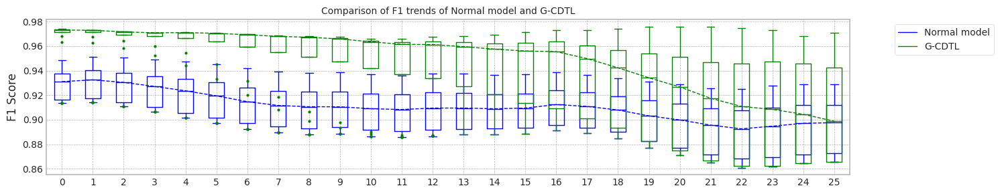

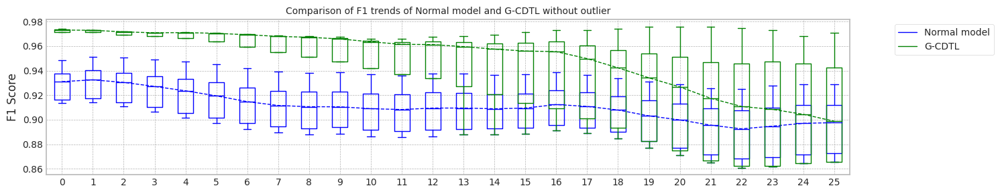

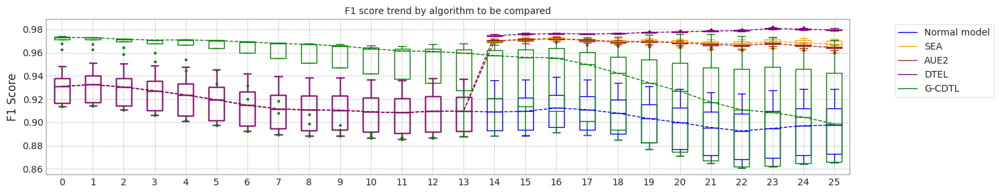

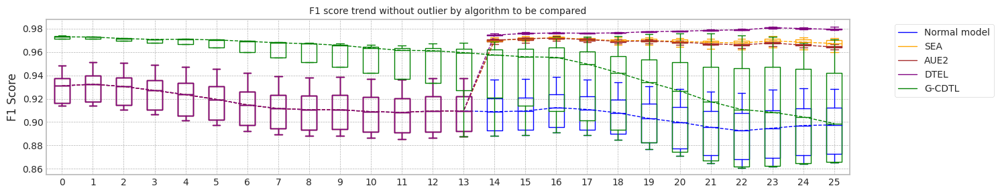

max_mean_trial= 19


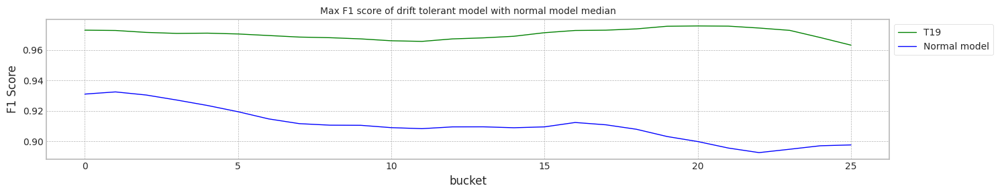

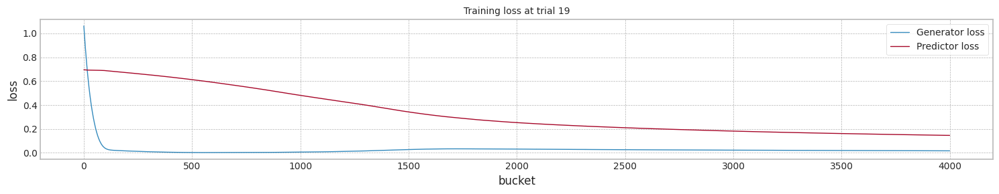

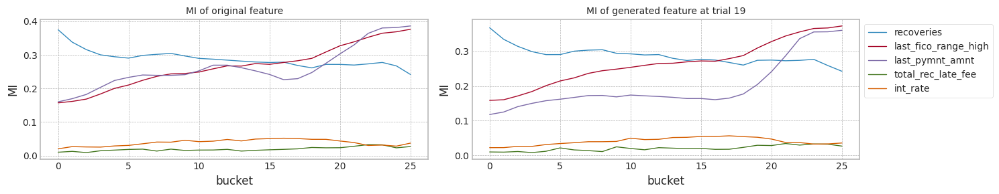

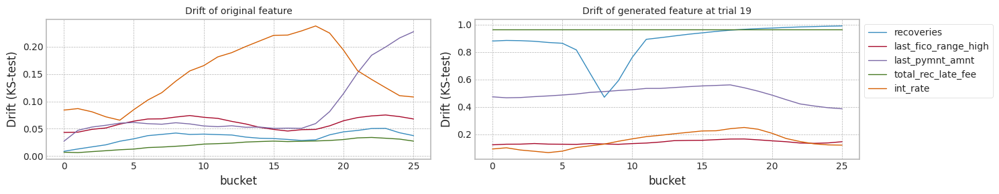

@ Normal model


,Trial,Testset F1,Initial F1,Mean F1,Last F1,Elapsed time
0,0.0,0.931536,0.932966,0.911685,0.899187,10.943624
1,1.0,0.914936,0.915483,0.889294,0.869137,11.107749
2,2.0,0.948400,0.951299,0.937524,0.928591,11.077107
3,3.0,0.929945,0.931279,0.909384,0.895627,11.014527
4,4.0,0.943863,0.946336,0.931602,0.923030,10.938602
5,5.0,0.933962,0.935815,0.915142,0.902838,10.936441
6,6.0,0.913781,0.914224,0.886786,0.865555,11.017387
7,7.0,0.930471,0.931903,0.909642,0.896045,10.814813
8,8.0,0.913811,0.914253,0.886793,0.865538,11.104182
9,9.0,0.934136,0.936079,0.916247,0.904848,10.934622


@ SEA


,Trial,Testset F1,Initial F1,Mean F1,Last F1,Elapsed time
0,0.0,0.931536,0.932966,0.942388,0.967395,15.860427
1,1.0,0.914936,0.915483,0.929970,0.962654,16.234294
2,2.0,0.948400,0.951299,0.956369,0.971768,15.724613
3,3.0,0.929945,0.931279,0.940669,0.965399,15.817159
4,4.0,0.943863,0.946336,0.953181,0.971045,16.579235
5,5.0,0.933962,0.935815,0.943976,0.967145,15.968711
6,6.0,0.913781,0.914224,0.928183,0.959821,15.602455
7,7.0,0.930471,0.931903,0.940816,0.968185,15.858483
8,8.0,0.913811,0.914253,0.930116,0.967226,14.895895
9,9.0,0.934136,0.936079,0.944871,0.968814,16.193104


@ AUE2


,Trial,Testset F1,Initial F1,Mean F1,Last F1,Elapsed time
0,0.0,0.931536,0.932966,0.941754,0.965576,16.039106
1,1.0,0.914936,0.915483,0.931063,0.965843,16.172135
2,2.0,0.948400,0.951299,0.954598,0.963901,15.951674
3,3.0,0.929945,0.931279,0.940723,0.963867,14.912916
4,4.0,0.943863,0.946336,0.951580,0.965454,16.201480
5,5.0,0.933962,0.935815,0.943509,0.963820,16.070765
6,6.0,0.913781,0.914224,0.929160,0.963746,15.987134
7,7.0,0.930471,0.931903,0.939625,0.962591,15.876507
8,8.0,0.913811,0.914253,0.929399,0.964140,16.292897
9,9.0,0.934136,0.936079,0.943942,0.964903,16.292020


@ DTEL


,Trial,Testset F1,Initial F1,Mean F1,Last F1,Elapsed time
0,0.0,0.931536,0.932966,0.945737,0.979266,20.757053
1,1.0,0.914936,0.915483,0.935006,0.980171,20.840945
2,2.0,0.948400,0.951299,0.958846,0.979283,20.163856
3,3.0,0.929945,0.931279,0.944847,0.980001,20.485422
4,4.0,0.943863,0.946336,0.955597,0.978593,19.628727
5,5.0,0.933962,0.935815,0.947802,0.980019,19.228904
6,6.0,0.913781,0.914224,0.933811,0.978918,20.207744
7,7.0,0.930471,0.931903,0.944839,0.979096,20.619964
8,8.0,0.913811,0.914253,0.934375,0.981346,20.760953
9,9.0,0.934136,0.936079,0.948125,0.979233,20.188892


@ G-CDTL


,Trial,Testset F1,Initial F1,Mean F1,Last F1,Elapsed time
0,0.0,0.962910,0.962584,0.899687,0.865538,10.613886
1,1.0,0.973441,0.973042,0.962251,0.948283,10.678942
2,2.0,0.973470,0.973071,0.961121,0.940375,10.822562
3,3.0,0.913811,0.914253,0.886793,0.865538,10.750808
4,4.0,0.913811,0.914253,0.886793,0.865538,10.761098
5,5.0,0.972790,0.972505,0.958920,0.935090,10.788019
6,6.0,0.972732,0.972533,0.944534,0.883945,10.728482
7,7.0,0.973402,0.973062,0.933112,0.867055,10.688682
8,8.0,0.973530,0.973131,0.964100,0.970981,10.669811
9,9.0,0.973103,0.972929,0.964219,0.958420,10.765936


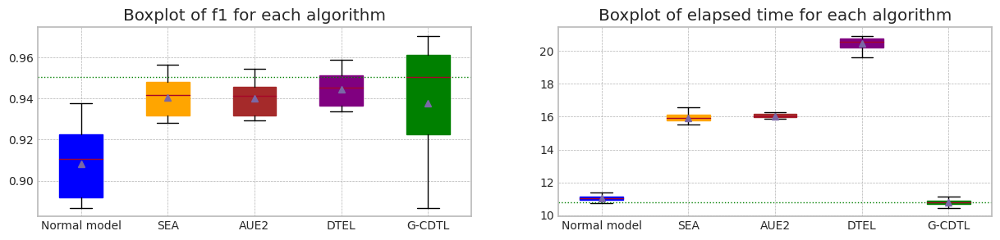

In [ ]:
seed_everything()

#s = np.sort(np.random.choice(len(COLUMNS),2,replace= False))
top_columns = list(mi_scores[0:5].index)
top_columns
print('columns:',top_columns)
#print(s.shape)
X4 = X3[top_columns]

train_size = 10000*2
test_size = 2000*2

X1,Y1 = check_mi_drift(X4, Y3, train_size, test_size)

bucket_size = 500*2
X1['b'] = [int(b/bucket_size) for b in X1.index.values]
_,_,_,_,_,_ = drift_tolerant2(X1, Y1,train_size, test_size,avaible_range = 600,trial_count=20,lr_g=0.0001,weight_init= True)

### #2 날짜 단위로 bucket 만들기

#### data 정제

In [ ]:
X = {}
Y = {}

df = df_accepted[df_accepted['issue_d'].str.startswith('2007') + df_accepted['issue_d'].str.startswith('2008') + df_accepted['issue_d'].str.startswith('2009')].copy()
#df = df.drop(columns=['issue_d'])


X[2009] = df.loc[:, df.columns != 'loan_paid'].values
Y[2009] = df.loan_paid.values


for year in range(2010,2019):
    print(year)
    df = df_accepted[df_accepted['issue_d'].str.startswith(str(year))].copy()
    #df = df.drop(columns=['issue_d'])
    X[year] = df.loc[:, df.columns != 'loan_paid'].values
    Y[year] = df.loan_paid.values


2010
2011
2012
2013
2014
2015
2016
2017
2018


In [ ]:
COLUMNS = df.loc[:, df.columns != 'loan_paid'].columns
COLUMNS

Index(['loan_amnt', 'term', 'int_rate', 'annual_inc', 'issue_d', 'dti',
       'delinq_2yrs', 'fico_range_high', 'inq_last_6mths', 'open_acc',
       'pub_rec', 'revol_bal', 'revol_util', 'total_acc', 'total_rec_int',
       'total_rec_late_fee', 'recoveries', 'last_pymnt_amnt',
       'last_fico_range_high', 'collections_12_mths_ex_med', 'acc_now_delinq',
       'chargeoff_within_12_mths', 'delinq_amnt', 'pub_rec_bankruptcies',
       'tax_liens', 'A2', 'A3', 'A4', 'A5', 'B1', 'B2', 'B3', 'B4', 'B5', 'C1',
       'C2', 'C3', 'C4', 'C5', 'D1', 'D2', 'D3', 'D4', 'D5', 'E1', 'E2', 'E3',
       'E4', 'E5', 'F1', 'F2', 'F3', 'F4', 'F5', 'G1', 'G2', 'G3', 'G4', 'G5',
       'Source Verified', 'Verified', 'Joint App', 'w', 'credit_card',
       'debt_consolidation', 'educational', 'home_improvement', 'house',
       'major_purchase', 'medical', 'moving', 'other', 'renewable_energy',
       'small_business', 'vacation', 'wedding', 'MORTGAGE', 'OTHER', 'OWN',
       'RENT', 'DirectPay', 'Y'],


In [ ]:
X2 = np.concatenate((X[2010],X[2011],X[2012],X[2013],X[2014],X[2015],X[2016],X[2017]))
Y2 = np.concatenate((Y[2010],Y[2011],Y[2012],Y[2013],Y[2014],Y[2015],Y[2016],Y[2017]))
X2 = pd.DataFrame(X2,columns = list(COLUMNS))#[top_columns+['issue_d']]

In [ ]:
X2

,loan_amnt,term,int_rate,annual_inc,issue_d,dti,delinq_2yrs,fico_range_high,inq_last_6mths,open_acc,...,renewable_energy,small_business,vacation,wedding,MORTGAGE,OTHER,OWN,RENT,DirectPay,Y
0,12000.0,36,13.57,42000.0,201001,21.77,0.0,684.0,2.0,10.0,...,0,0,0,0,0,0,0,1,0,0
1,7500.0,36,12.18,26000.0,201001,0.0,0.0,764.0,3.0,5.0,...,0,0,0,0,0,0,0,1,0,0
2,10000.0,36,14.61,62400.0,201001,8.46,0.0,714.0,1.0,7.0,...,0,0,0,0,1,0,0,0,0,0
3,15000.0,36,16.0,96000.0,201001,11.13,2.0,664.0,2.0,13.0,...,0,0,0,0,0,0,0,1,0,0
4,20000.0,36,11.83,105000.0,201001,13.87,0.0,759.0,0.0,9.0,...,0,0,0,0,1,0,0,0,0,0
...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...
1279675,4800.0,36,9.93,90000.0,201712,20.81,0.0,704.0,0.0,11.0,...,0,0,0,0,0,0,0,1,0,0
1279676,15000.0,36,9.93,150000.0,201712,10.16,0.0,739.0,0.0,6.0,...,0,0,0,0,1,0,0,0,0,0
1279677,9600.0,36,7.97,40500.0,201712,13.75,0.0,709.0,1.0,21.0,...,0,0,0,0,0,0,0,1,0,0
1279678,32000.0,36,5.32,45000.0,201712,28.96,0.0,779.0,0.0,17.0,...,0,0,0,0,1,0,0,0,0,0


In [ ]:
from datetime import date
from datetime import datetime

def date_bucket_num(d,start_day='20100101'):
    date1 = datetime.strptime(start_day, '%Y%m%d')
    date2 = datetime.strptime(str(d)+'01', '%Y%m%d')
    delta = date2 - date1
    return int(delta.days/30)

In [ ]:
X2['b'] = [date_bucket_num(d) for d in X2['issue_d']]

In [ ]:
b_cnt = X2.groupby(['b'])['b'].count()

In [ ]:
# 1/10 로 사이즈 줄이기...
seed_everything()
s = np.sort(np.random.choice(X2.shape[0],int(X2.shape[0]/10),replace= False))
#print(s.shape)
X3 = X2.iloc[s,:]
Y3 = Y2[s]

In [ ]:
b_cnt2 = X3.groupby(['b'])['b'].count()

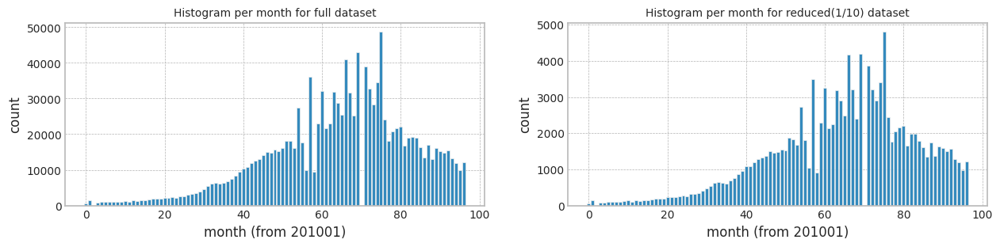

In [ ]:
fig, ax = plt.subplots(figsize=main_figsize, nrows=1, ncols=2)
ax[0].bar(b_cnt.index,b_cnt.values)
ax[0].set_ylabel('count')
ax[0].set_xlabel('month (from 201001)')
ax[0].set_title(f'Histogram per month for full dataset',fontdict={'fontsize':10})

ax[1].bar(b_cnt2.index,b_cnt2.values)
ax[1].set_ylabel('count')
ax[1].set_xlabel('month (from 201001)')
ax[1].set_title(f'Histogram per month for reduced(1/10) dataset',fontdict={'fontsize':10})

plt.show()

In [ ]:
X3.drop(columns=['issue_d'],inplace=True)

In [ ]:
X3

,loan_amnt,term,int_rate,annual_inc,dti,delinq_2yrs,fico_range_high,inq_last_6mths,open_acc,pub_rec,...,small_business,vacation,wedding,MORTGAGE,OTHER,OWN,RENT,DirectPay,Y,b
8,9000.0,36,8.94,44000.0,8.97,0.0,749.0,1.0,14.0,0.0,...,0,0,0,0,0,0,1,0,0,0
19,21125.0,36,13.92,87000.0,18.33,0.0,704.0,1.0,9.0,0.0,...,0,0,0,1,0,0,0,0,0,0
41,24250.0,36,12.53,287000.0,13.89,0.0,729.0,2.0,15.0,0.0,...,0,0,0,0,0,0,1,0,0,0
43,5000.0,36,13.92,38000.0,5.68,0.0,689.0,1.0,5.0,0.0,...,0,0,0,0,0,0,1,0,0,0
52,13000.0,36,8.59,100000.0,18.35,0.0,784.0,2.0,18.0,0.0,...,0,0,0,1,0,0,0,0,0,0
...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...
1279596,8000.0,36,7.35,27000.0,22.36,0.0,719.0,0.0,14.0,0.0,...,0,0,0,0,0,0,1,0,0,96
1279609,29375.0,60,30.75,90000.0,44.94,0.0,689.0,1.0,20.0,0.0,...,0,0,0,0,0,0,1,0,0,96
1279627,2500.0,36,10.42,48000.0,25.23,0.0,794.0,1.0,9.0,0.0,...,0,0,0,0,0,0,1,0,0,96
1279639,18500.0,36,13.59,45000.0,35.71,1.0,709.0,0.0,14.0,0.0,...,0,0,0,1,0,0,0,0,0,96


#### Drift tolerant 학습

In [ ]:
from more_itertools import locate
def find_indices(list_to_check, item_to_find):
    indices = locate(list_to_check, lambda x: x == item_to_find)
    return list(indices)

In [ ]:
from tqdm import tqdm
from sklearn.preprocessing import MinMaxScaler, StandardScaler

plt.style.use('bmh')
plt.rcParams['axes.facecolor'] = 'white'

def check_mi_drift(X:pd.DataFrame,Y:np.array,train_size:int,test_size:int):

    columns = X.columns
    is_Has_bucket = False
    # 'b' 즉, bucket count 가 있으며, 'b'를 제외 시킨다.
    if 'b' in columns:
        print('Dataset has buckets!')
        columns = columns[0:-1]
        buckets = list(X['b'])
        X = X[columns]
        is_Has_bucket = True

    mi_scores = make_mi_scores(X, Y, discrete_features="auto")
    #print(mi_scores)
    print(f'MI Analysis MI Max {np.max(mi_scores):.5f}, Min {np.min(mi_scores):.5f}, Mean {np.mean(mi_scores):.5f}, Std {np.std(mi_scores):.5f}')

    scaler_c1 = MinMaxScaler()
    # trainset을 가지고 Scaler를 fit하고, testset을 포함한 그 이후의 Data를 모두 transform 한다.
    X = pd.DataFrame(np.concatenate((scaler_c1.fit_transform(X[0:train_size]), scaler_c1.transform(X[train_size:])),axis=0), columns=columns)

    X_train = X[:train_size]
    Y_train = Y[:train_size]

    X_test = X[test_size:train_size+test_size]
    Y_test = Y[test_size:train_size+test_size]

    X_live = X[test_size:]
    Y_live = Y[test_size:]

    print('Dataset structure X_train,',X_train.shape,'X_test,',X_test.shape,'X_live',X_live.shape)
    X_live_set = []
    Y_live_set = []
    truncate_count = 0
    if is_Has_bucket:
        b_min = min(buckets[-X_live.shape[0]:])
        b_max = max(buckets[-X_live.shape[0]:])
        print(f'bucket range in live set {b_min}~{b_max}')
        for i in range(b_min,b_max+1):
            s = find_indices(buckets,i)
            if len(s) > 0:
                xl = X.iloc[s]
                yl = Y[s]
                X_live_set.append(xl)
                Y_live_set.append(yl)
    else:
        for i in range(int(X_live.shape[0]/test_size)):
            xl = X_live[i*test_size:i*test_size+train_size]
            yl = Y_live[i*test_size:i*test_size+train_size]

            if len(xl) ==  train_size:
                X_live_set.append(xl)
                Y_live_set.append(yl)
            else:
                #print(xl.shape)
                truncate_count = xl.shape[0] #truncate_count + len(xl)
                break

    print(f'Truncate {truncate_count} rows from live_set {X_live.shape}')
    X_live_set = np.asarray(X_live_set)
    Y_live_set = np.asarray(Y_live_set)

    MIS = {}
    DRF = {}
    for col in columns:
        MIS[col] = []
        DRF[col] = []

    print('Search MI & Drift...for X_live_set',X_live_set.shape)
    for X_live_unit,Y_live_unit in zip(tqdm(X_live_set),Y_live_set):
        X_live_unit = pd.DataFrame(X_live_unit,columns = columns)
        mi_scores = make_mi_scores(X_live_unit, Y_live_unit, discrete_features="auto")
        ks = __ks_drift(X_train.values,X_live_unit.values)
        for ix,col in enumerate(columns):
            MIS[col].append(mi_scores[col])
            DRF[col].append(ks[:,0][ix])

    df_mis = pd.DataFrame(MIS)
    df_drf = pd.DataFrame(DRF)

    for c_name in df_mis.columns:
        fig, ax = plt.subplots(figsize=main_figsize,nrows=1, ncols=2)
        df_mis[c_name].plot(ax=ax[0],linewidth=1,ylabel='MI',xlabel=f'bucket ({test_size})',legend=None)
        ax[0].set_title(f'Mutual Information of {c_name}',fontdict={'fontsize':10})

        df_drf[c_name].plot(ax=ax[1],linewidth=1,ylabel='Drift (KS-test)',xlabel=f'bucket ({test_size})')
        ax[1].set_title(f'Drift (KS-test) of {c_name}',fontdict={'fontsize':10})
        ax[1].legend(bbox_to_anchor=(1.0, 1.0))
        plt.show()

    fig, ax = plt.subplots(figsize=main_figsize,nrows=1, ncols=2)
    df_mis.plot(ax=ax[0],linewidth=1,ylabel='MI',xlabel=f'bucket ({test_size})',legend=None)
    ax[0].set_title(f'Mutual Information',fontdict={'fontsize':10})

    df_drf.plot(ax=ax[1],linewidth=1,ylabel='Drift (KS-test)',xlabel=f'bucket ({test_size})')
    ax[1].set_title(f'Drift (KS-test)',fontdict={'fontsize':10})
    ax[1].legend(bbox_to_anchor=(1.0, 1.0))
    plt.show()

    if is_Has_bucket:
        X['b'] = buckets
    return X,Y

train_size 19361
Dataset has buckets!
MI Analysis MI Max 0.28519, Min 0.01947, Mean 0.17442, Std 0.12009
Dataset structure X_train, (19361, 5) X_test, (19361, 5) X_live (123968, 5)
bucket range in live set 26~96
Truncate 0 rows from live_set (123968, 5)
Search MI & Drift...for X_live_set (70,)


100%|██████████| 70/70 [00:03<00:00, 21.40it/s]


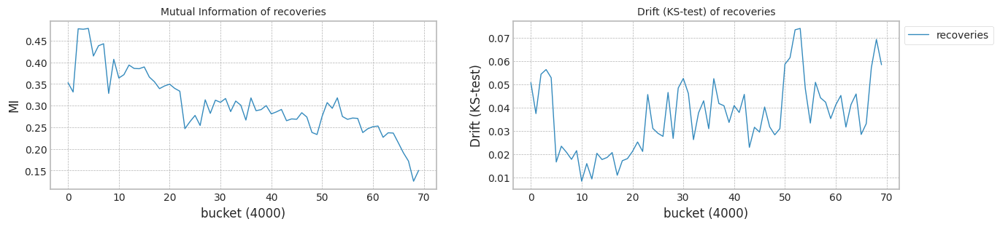

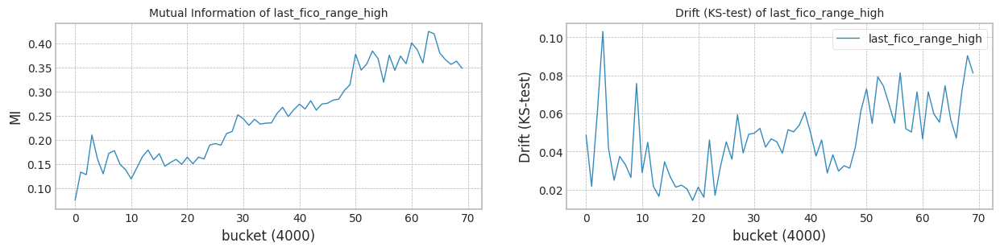

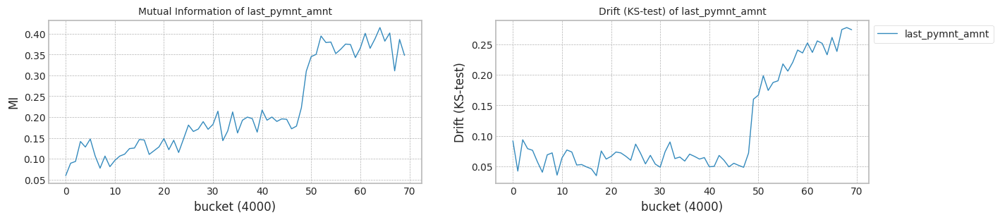

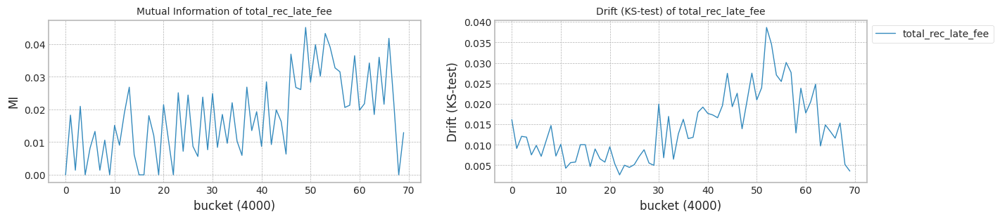

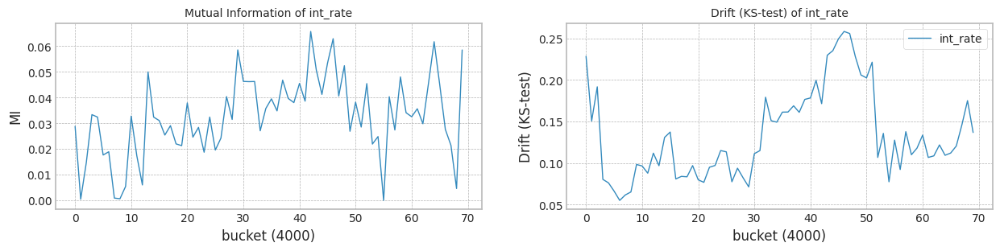

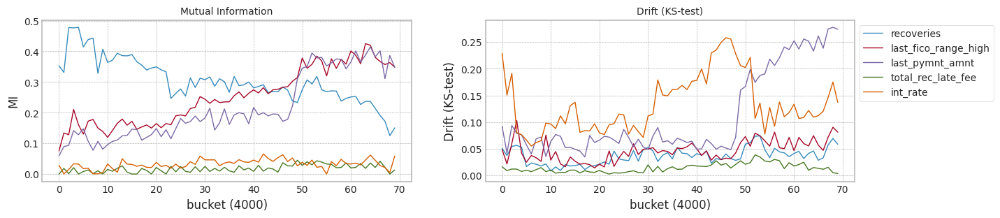

In [ ]:
top_columns = list(mi_scores[0:5].index)
top_columns

train_size = X3[X3['b'] < 46].shape[0] # 2010년 1월에서 39개월 (약 3년6개월간의 data)
print('train_size',train_size)
test_size = 4000

X1,Y1 = check_mi_drift(X3[top_columns+['b']], Y3, train_size, test_size)

trial_count: 20
lambda_f2 1.0
######################### Trial 0 for Normal model ###########################
cuda:0


100%|██████████| 4000/4000 [00:06<00:00, 641.76it/s]


Test f1 score: 0.9315611184474939
X_live.shape (123968, 6)
Truncate 15968 rows from live_set (123968, 6)
Search MI & Drift...for X_live_set torch.Size([27, 19361, 6])


100%|██████████| 27/27 [00:11<00:00,  2.38it/s]


mean of drift:
recoveries              0.034103
last_fico_range_high    0.060150
last_pymnt_amnt         0.091342
total_rec_late_fee      0.021963
int_rate                0.149369
dtype: float64
Mean F1 for all data: 0.9115340040966659
######################### Trial 0 for Drift tolerant model ###########################
cuda:0


100%|██████████| 4000/4000 [00:15<00:00, 251.03it/s]


Test f1 score: 0.913981208806619
X_live.shape (123968, 6)
Truncate 15968 rows from live_set (123968, 6)
Search MI & Drift...for X_live_set torch.Size([27, 19361, 6])


100%|██████████| 27/27 [00:11<00:00,  2.45it/s]


mean of drift:
recoveries              0.839190
last_fico_range_high    0.118193
last_pymnt_amnt         0.456381
total_rec_late_fee      0.923097
int_rate                0.150386
dtype: float64
Mean F1 for all data: 0.8863519677174436
Normal model median        : 0.9115340040966659
Drift tolerant model median: 0.8863519677174436
######################### Trial 1 for Normal model ###########################
cuda:0


100%|██████████| 4000/4000 [00:06<00:00, 643.05it/s]


Test f1 score: 0.9149169407201282
X_live.shape (123968, 6)
Truncate 15968 rows from live_set (123968, 6)
Search MI & Drift...for X_live_set torch.Size([27, 19361, 6])


100%|██████████| 27/27 [00:11<00:00,  2.40it/s]


mean of drift:
recoveries              0.034103
last_fico_range_high    0.060150
last_pymnt_amnt         0.091342
total_rec_late_fee      0.021963
int_rate                0.149369
dtype: float64
Mean F1 for all data: 0.8886184249459659
######################### Trial 1 for Drift tolerant model ###########################
cuda:0


100%|██████████| 4000/4000 [00:15<00:00, 251.16it/s]


Test f1 score: 0.9734703632887189
X_live.shape (123968, 6)
Truncate 15968 rows from live_set (123968, 6)
Search MI & Drift...for X_live_set torch.Size([27, 19361, 6])


100%|██████████| 27/27 [00:11<00:00,  2.44it/s]


mean of drift:
recoveries              0.860508
last_fico_range_high    0.211504
last_pymnt_amnt         0.443587
total_rec_late_fee      0.966117
int_rate                0.145680
dtype: float64
Mean F1 for all data: 0.9604134556403301
Normal model median        : 0.9000762145213159
Drift tolerant model median: 0.9233827116788869
######################### Trial 2 for Normal model ###########################
cuda:0


100%|██████████| 4000/4000 [00:06<00:00, 639.66it/s]


Test f1 score: 0.9479673842904911
X_live.shape (123968, 6)
Truncate 15968 rows from live_set (123968, 6)
Search MI & Drift...for X_live_set torch.Size([27, 19361, 6])


100%|██████████| 27/27 [00:11<00:00,  2.42it/s]


mean of drift:
recoveries              0.034103
last_fico_range_high    0.060150
last_pymnt_amnt         0.091342
total_rec_late_fee      0.021963
int_rate                0.149369
dtype: float64
Mean F1 for all data: 0.9373019960239893
######################### Trial 2 for Drift tolerant model ###########################
cuda:0


100%|██████████| 4000/4000 [00:15<00:00, 254.60it/s]


Test f1 score: 0.9735576204846276
X_live.shape (123968, 6)
Truncate 15968 rows from live_set (123968, 6)
Search MI & Drift...for X_live_set torch.Size([27, 19361, 6])


100%|██████████| 27/27 [00:11<00:00,  2.45it/s]


mean of drift:
recoveries              0.861336
last_fico_range_high    0.061978
last_pymnt_amnt         0.090937
total_rec_late_fee      0.912908
int_rate                0.145516
dtype: float64
Mean F1 for all data: 0.9603925493741498
Normal model median        : 0.9115340040966659
Drift tolerant model median: 0.9603925493741498
######################### Trial 3 for Normal model ###########################
cuda:0


100%|██████████| 4000/4000 [00:06<00:00, 637.57it/s]


Test f1 score: 0.929940685979541
X_live.shape (123968, 6)
Truncate 15968 rows from live_set (123968, 6)
Search MI & Drift...for X_live_set torch.Size([27, 19361, 6])


100%|██████████| 27/27 [00:11<00:00,  2.41it/s]


mean of drift:
recoveries              0.034103
last_fico_range_high    0.060150
last_pymnt_amnt         0.091342
total_rec_late_fee      0.021963
int_rate                0.149369
dtype: float64
Mean F1 for all data: 0.9092146159188006
######################### Trial 3 for Drift tolerant model ###########################
cuda:0


100%|██████████| 4000/4000 [00:15<00:00, 253.07it/s]


Test f1 score: 0.913981208806619
X_live.shape (123968, 6)
Truncate 15968 rows from live_set (123968, 6)
Search MI & Drift...for X_live_set torch.Size([27, 19361, 6])


100%|██████████| 27/27 [00:10<00:00,  2.46it/s]


mean of drift:
recoveries              0.860355
last_fico_range_high    0.226174
last_pymnt_amnt         0.448863
total_rec_late_fee      0.910412
int_rate                0.145422
dtype: float64
Mean F1 for all data: 0.8863519677174436
Normal model median        : 0.9103743100077333
Drift tolerant model median: 0.9233722585457966
######################### Trial 4 for Normal model ###########################
cuda:0


100%|██████████| 4000/4000 [00:06<00:00, 635.34it/s]


Test f1 score: 0.9436553860541235
X_live.shape (123968, 6)
Truncate 15968 rows from live_set (123968, 6)
Search MI & Drift...for X_live_set torch.Size([27, 19361, 6])


100%|██████████| 27/27 [00:11<00:00,  2.41it/s]


mean of drift:
recoveries              0.034103
last_fico_range_high    0.060150
last_pymnt_amnt         0.091342
total_rec_late_fee      0.021963
int_rate                0.149369
dtype: float64
Mean F1 for all data: 0.9315481678177596
######################### Trial 4 for Drift tolerant model ###########################
cuda:0


100%|██████████| 4000/4000 [00:15<00:00, 253.60it/s]


Test f1 score: 0.913981208806619
X_live.shape (123968, 6)
Truncate 15968 rows from live_set (123968, 6)
Search MI & Drift...for X_live_set torch.Size([27, 19361, 6])


100%|██████████| 27/27 [00:10<00:00,  2.46it/s]


mean of drift:
recoveries              0.884093
last_fico_range_high    0.117435
last_pymnt_amnt         0.447276
total_rec_late_fee      0.966117
int_rate                0.148990
dtype: float64
Mean F1 for all data: 0.8863519677174436
Normal model median        : 0.9115340040966659
Drift tolerant model median: 0.8863519677174436
######################### Trial 5 for Normal model ###########################
cuda:0


100%|██████████| 4000/4000 [00:06<00:00, 640.61it/s]


Test f1 score: 0.9365424160801692
X_live.shape (123968, 6)
Truncate 15968 rows from live_set (123968, 6)
Search MI & Drift...for X_live_set torch.Size([27, 19361, 6])


100%|██████████| 27/27 [00:11<00:00,  2.37it/s]


mean of drift:
recoveries              0.034103
last_fico_range_high    0.060150
last_pymnt_amnt         0.091342
total_rec_late_fee      0.021963
int_rate                0.149369
dtype: float64
Mean F1 for all data: 0.9198724335082643
######################### Trial 5 for Drift tolerant model ###########################
cuda:0


100%|██████████| 4000/4000 [00:15<00:00, 250.31it/s]


Test f1 score: 0.9727712426106168
X_live.shape (123968, 6)
Truncate 15968 rows from live_set (123968, 6)
Search MI & Drift...for X_live_set torch.Size([27, 19361, 6])


100%|██████████| 27/27 [00:11<00:00,  2.45it/s]


mean of drift:
recoveries              0.860938
last_fico_range_high    0.234798
last_pymnt_amnt         0.447830
total_rec_late_fee      0.965842
int_rate                0.148211
dtype: float64
Mean F1 for all data: 0.9598060923729962
Normal model median        : 0.9157032188024651
Drift tolerant model median: 0.9230790300452199
######################### Trial 6 for Normal model ###########################
cuda:0


100%|██████████| 4000/4000 [00:06<00:00, 636.36it/s]


Test f1 score: 0.9139202872128572
X_live.shape (123968, 6)
Truncate 15968 rows from live_set (123968, 6)
Search MI & Drift...for X_live_set torch.Size([27, 19361, 6])


100%|██████████| 27/27 [00:11<00:00,  2.44it/s]


mean of drift:
recoveries              0.034103
last_fico_range_high    0.060150
last_pymnt_amnt         0.091342
total_rec_late_fee      0.021963
int_rate                0.149369
dtype: float64
Mean F1 for all data: 0.8864040052053528
######################### Trial 6 for Drift tolerant model ###########################
cuda:0


100%|██████████| 4000/4000 [00:15<00:00, 255.32it/s]


Test f1 score: 0.9729439168607776
X_live.shape (123968, 6)
Truncate 15968 rows from live_set (123968, 6)
Search MI & Drift...for X_live_set torch.Size([27, 19361, 6])


100%|██████████| 27/27 [00:10<00:00,  2.48it/s]


mean of drift:
recoveries              0.837472
last_fico_range_high    0.156647
last_pymnt_amnt         0.445722
total_rec_late_fee      0.966117
int_rate                0.144360
dtype: float64
Mean F1 for all data: 0.9602900009592165
Normal model median        : 0.9115340040966659
Drift tolerant model median: 0.9598060923729962
######################### Trial 7 for Normal model ###########################
cuda:0


100%|██████████| 4000/4000 [00:06<00:00, 636.56it/s]


Test f1 score: 0.9305260742355573
X_live.shape (123968, 6)
Truncate 15968 rows from live_set (123968, 6)
Search MI & Drift...for X_live_set torch.Size([27, 19361, 6])


100%|██████████| 27/27 [00:11<00:00,  2.38it/s]


mean of drift:
recoveries              0.034103
last_fico_range_high    0.060150
last_pymnt_amnt         0.091342
total_rec_late_fee      0.021963
int_rate                0.149369
dtype: float64
Mean F1 for all data: 0.9097677221480565
######################### Trial 7 for Drift tolerant model ###########################
cuda:0


100%|██████████| 4000/4000 [00:15<00:00, 252.95it/s]


Test f1 score: 0.9735756561248281
X_live.shape (123968, 6)
Truncate 15968 rows from live_set (123968, 6)
Search MI & Drift...for X_live_set torch.Size([27, 19361, 6])


100%|██████████| 27/27 [00:11<00:00,  2.45it/s]


mean of drift:
recoveries              0.860550
last_fico_range_high    0.129273
last_pymnt_amnt         0.448609
total_rec_late_fee      0.913465
int_rate                0.138646
dtype: float64
Mean F1 for all data: 0.9604171040568438
Normal model median        : 0.9106508631223611
Drift tolerant model median: 0.9600480466661063
######################### Trial 8 for Normal model ###########################
cuda:0


100%|██████████| 4000/4000 [00:06<00:00, 646.77it/s]


Test f1 score: 0.913981208806619
X_live.shape (123968, 6)
Truncate 15968 rows from live_set (123968, 6)
Search MI & Drift...for X_live_set torch.Size([27, 19361, 6])


100%|██████████| 27/27 [00:11<00:00,  2.43it/s]


mean of drift:
recoveries              0.034103
last_fico_range_high    0.060150
last_pymnt_amnt         0.091342
total_rec_late_fee      0.021963
int_rate                0.149369
dtype: float64
Mean F1 for all data: 0.8863519677174436
######################### Trial 8 for Drift tolerant model ###########################
cuda:0


100%|██████████| 4000/4000 [00:15<00:00, 251.96it/s]


Test f1 score: 0.973677134064358
X_live.shape (123968, 6)
Truncate 15968 rows from live_set (123968, 6)
Search MI & Drift...for X_live_set torch.Size([27, 19361, 6])


100%|██████████| 27/27 [00:11<00:00,  2.44it/s]


mean of drift:
recoveries              0.831440
last_fico_range_high    0.060544
last_pymnt_amnt         0.107828
total_rec_late_fee      0.966091
int_rate                0.146404
dtype: float64
Mean F1 for all data: 0.9624386393298676
Normal model median        : 0.9097677221480565
Drift tolerant model median: 0.9602900009592165
######################### Trial 9 for Normal model ###########################
cuda:0


100%|██████████| 4000/4000 [00:06<00:00, 639.76it/s]


Test f1 score: 0.9341893136803316
X_live.shape (123968, 6)
Truncate 15968 rows from live_set (123968, 6)
Search MI & Drift...for X_live_set torch.Size([27, 19361, 6])


100%|██████████| 27/27 [00:11<00:00,  2.43it/s]


mean of drift:
recoveries              0.034103
last_fico_range_high    0.060150
last_pymnt_amnt         0.091342
total_rec_late_fee      0.021963
int_rate                0.149369
dtype: float64
Mean F1 for all data: 0.9161468347742108
######################### Trial 9 for Drift tolerant model ###########################
cuda:0


100%|██████████| 4000/4000 [00:15<00:00, 253.51it/s]


Test f1 score: 0.9733524526498177
X_live.shape (123968, 6)
Truncate 15968 rows from live_set (123968, 6)
Search MI & Drift...for X_live_set torch.Size([27, 19361, 6])


100%|██████████| 27/27 [00:11<00:00,  2.45it/s]


mean of drift:
recoveries              0.860564
last_fico_range_high    0.121152
last_pymnt_amnt         0.443411
total_rec_late_fee      0.966117
int_rate                0.148492
dtype: float64
Mean F1 for all data: 0.9602839030315502
Normal model median        : 0.9106508631223611
Drift tolerant model median: 0.9602869519953834
######################### Trial 10 for Normal model ###########################
cuda:0


100%|██████████| 4000/4000 [00:06<00:00, 631.96it/s]


Test f1 score: 0.913981208806619
X_live.shape (123968, 6)
Truncate 15968 rows from live_set (123968, 6)
Search MI & Drift...for X_live_set torch.Size([27, 19361, 6])


100%|██████████| 27/27 [00:11<00:00,  2.44it/s]


mean of drift:
recoveries              0.034103
last_fico_range_high    0.060150
last_pymnt_amnt         0.091342
total_rec_late_fee      0.021963
int_rate                0.149369
dtype: float64
Mean F1 for all data: 0.8863519677174436
######################### Trial 10 for Drift tolerant model ###########################
cuda:0


100%|██████████| 4000/4000 [00:15<00:00, 253.37it/s]


Test f1 score: 0.9736983681032937
X_live.shape (123968, 6)
Truncate 15968 rows from live_set (123968, 6)
Search MI & Drift...for X_live_set torch.Size([27, 19361, 6])


100%|██████████| 27/27 [00:11<00:00,  2.45it/s]


mean of drift:
recoveries              0.860521
last_fico_range_high    0.122137
last_pymnt_amnt         0.436490
total_rec_late_fee      0.911517
int_rate                0.149409
dtype: float64
Mean F1 for all data: 0.9606837719568625
Normal model median        : 0.9097677221480565
Drift tolerant model median: 0.9602900009592165
######################### Trial 11 for Normal model ###########################
cuda:0


100%|██████████| 4000/4000 [00:06<00:00, 646.28it/s]


Test f1 score: 0.9384727272727272
X_live.shape (123968, 6)
Truncate 15968 rows from live_set (123968, 6)
Search MI & Drift...for X_live_set torch.Size([27, 19361, 6])


100%|██████████| 27/27 [00:11<00:00,  2.41it/s]


mean of drift:
recoveries              0.034103
last_fico_range_high    0.060150
last_pymnt_amnt         0.091342
total_rec_late_fee      0.021963
int_rate                0.149369
dtype: float64
Mean F1 for all data: 0.9232970825838207
######################### Trial 11 for Drift tolerant model ###########################
cuda:0


100%|██████████| 4000/4000 [00:16<00:00, 247.69it/s]


Test f1 score: 0.9731732090577763
X_live.shape (123968, 6)
Truncate 15968 rows from live_set (123968, 6)
Search MI & Drift...for X_live_set torch.Size([27, 19361, 6])


100%|██████████| 27/27 [00:11<00:00,  2.45it/s]


mean of drift:
recoveries              0.860891
last_fico_range_high    0.166165
last_pymnt_amnt         0.444770
total_rec_late_fee      0.918991
int_rate                0.149887
dtype: float64
Mean F1 for all data: 0.9602263361246611
Normal model median        : 0.9106508631223611
Drift tolerant model median: 0.9602869519953834
######################### Trial 12 for Normal model ###########################
cuda:0


100%|██████████| 4000/4000 [00:06<00:00, 644.36it/s]


Test f1 score: 0.9384512799698489
X_live.shape (123968, 6)
Truncate 15968 rows from live_set (123968, 6)
Search MI & Drift...for X_live_set torch.Size([27, 19361, 6])


100%|██████████| 27/27 [00:11<00:00,  2.42it/s]


mean of drift:
recoveries              0.034103
last_fico_range_high    0.060150
last_pymnt_amnt         0.091342
total_rec_late_fee      0.021963
int_rate                0.149369
dtype: float64
Mean F1 for all data: 0.9236456501804697
######################### Trial 12 for Drift tolerant model ###########################
cuda:0


100%|██████████| 4000/4000 [00:15<00:00, 251.13it/s]


Test f1 score: 0.9730924294460205
X_live.shape (123968, 6)
Truncate 15968 rows from live_set (123968, 6)
Search MI & Drift...for X_live_set torch.Size([27, 19361, 6])


100%|██████████| 27/27 [00:11<00:00,  2.43it/s]


mean of drift:
recoveries              0.860906
last_fico_range_high    0.195657
last_pymnt_amnt         0.449644
total_rec_late_fee      0.911523
int_rate                0.153141
dtype: float64
Mean F1 for all data: 0.9602412325308487
Normal model median        : 0.9115340040966659
Drift tolerant model median: 0.9602839030315502
######################### Trial 13 for Normal model ###########################
cuda:0


100%|██████████| 4000/4000 [00:06<00:00, 634.55it/s]


Test f1 score: 0.917968970380818
X_live.shape (123968, 6)
Truncate 15968 rows from live_set (123968, 6)
Search MI & Drift...for X_live_set torch.Size([27, 19361, 6])


100%|██████████| 27/27 [00:11<00:00,  2.42it/s]


mean of drift:
recoveries              0.034103
last_fico_range_high    0.060150
last_pymnt_amnt         0.091342
total_rec_late_fee      0.021963
int_rate                0.149369
dtype: float64
Mean F1 for all data: 0.8931200994189447
######################### Trial 13 for Drift tolerant model ###########################
cuda:0


100%|██████████| 4000/4000 [00:15<00:00, 251.19it/s]


Test f1 score: 0.9731796188997073
X_live.shape (123968, 6)
Truncate 15968 rows from live_set (123968, 6)
Search MI & Drift...for X_live_set torch.Size([27, 19361, 6])


100%|██████████| 27/27 [00:10<00:00,  2.47it/s]


mean of drift:
recoveries              0.860740
last_fico_range_high    0.125030
last_pymnt_amnt         0.442625
total_rec_late_fee      0.966117
int_rate                0.145898
dtype: float64
Mean F1 for all data: 0.9602908523073636
Normal model median        : 0.9106508631223611
Drift tolerant model median: 0.9602869519953834
######################### Trial 14 for Normal model ###########################
cuda:0


100%|██████████| 4000/4000 [00:06<00:00, 637.14it/s]


Test f1 score: 0.9172563502579572
X_live.shape (123968, 6)
Truncate 15968 rows from live_set (123968, 6)
Search MI & Drift...for X_live_set torch.Size([27, 19361, 6])


100%|██████████| 27/27 [00:11<00:00,  2.39it/s]


mean of drift:
recoveries              0.034103
last_fico_range_high    0.060150
last_pymnt_amnt         0.091342
total_rec_late_fee      0.021963
int_rate                0.149369
dtype: float64
Mean F1 for all data: 0.8923747009005883
######################### Trial 14 for Drift tolerant model ###########################
cuda:0


100%|██████████| 4000/4000 [00:15<00:00, 252.54it/s]


Test f1 score: 0.913981208806619
X_live.shape (123968, 6)
Truncate 15968 rows from live_set (123968, 6)
Search MI & Drift...for X_live_set torch.Size([27, 19361, 6])


100%|██████████| 27/27 [00:10<00:00,  2.46it/s]


mean of drift:
recoveries              0.860814
last_fico_range_high    0.135563
last_pymnt_amnt         0.459195
total_rec_late_fee      0.910511
int_rate                0.143804
dtype: float64
Mean F1 for all data: 0.8863519677174436
Normal model median        : 0.9097677221480565
Drift tolerant model median: 0.9602839030315502
######################### Trial 15 for Normal model ###########################
cuda:0


100%|██████████| 4000/4000 [00:06<00:00, 644.78it/s]


Test f1 score: 0.9429746521599627
X_live.shape (123968, 6)
Truncate 15968 rows from live_set (123968, 6)
Search MI & Drift...for X_live_set torch.Size([27, 19361, 6])


100%|██████████| 27/27 [00:11<00:00,  2.42it/s]


mean of drift:
recoveries              0.034103
last_fico_range_high    0.060150
last_pymnt_amnt         0.091342
total_rec_late_fee      0.021963
int_rate                0.149369
dtype: float64
Mean F1 for all data: 0.9299428898111048
######################### Trial 15 for Drift tolerant model ###########################
cuda:0


100%|██████████| 4000/4000 [00:15<00:00, 253.27it/s]


Test f1 score: 0.9732409509019233
X_live.shape (123968, 6)
Truncate 15968 rows from live_set (123968, 6)
Search MI & Drift...for X_live_set torch.Size([27, 19361, 6])


100%|██████████| 27/27 [00:10<00:00,  2.46it/s]


mean of drift:
recoveries              0.834002
last_fico_range_high    0.084274
last_pymnt_amnt         0.445078
total_rec_late_fee      0.966117
int_rate                0.148018
dtype: float64
Mean F1 for all data: 0.9603434862606328
Normal model median        : 0.9106508631223611
Drift tolerant model median: 0.9602869519953834
######################### Trial 16 for Normal model ###########################
cuda:0


100%|██████████| 4000/4000 [00:06<00:00, 637.80it/s]


Test f1 score: 0.9375380776929995
X_live.shape (123968, 6)
Truncate 15968 rows from live_set (123968, 6)
Search MI & Drift...for X_live_set torch.Size([27, 19361, 6])


100%|██████████| 27/27 [00:11<00:00,  2.43it/s]


mean of drift:
recoveries              0.034103
last_fico_range_high    0.060150
last_pymnt_amnt         0.091342
total_rec_late_fee      0.021963
int_rate                0.149369
dtype: float64
Mean F1 for all data: 0.9221737411901783
######################### Trial 16 for Drift tolerant model ###########################
cuda:0


100%|██████████| 4000/4000 [00:15<00:00, 251.62it/s]


Test f1 score: 0.9732668239792107
X_live.shape (123968, 6)
Truncate 15968 rows from live_set (123968, 6)
Search MI & Drift...for X_live_set torch.Size([27, 19361, 6])


100%|██████████| 27/27 [00:10<00:00,  2.46it/s]


mean of drift:
recoveries              0.830893
last_fico_range_high    0.135467
last_pymnt_amnt         0.451978
total_rec_late_fee      0.909254
int_rate                0.145728
dtype: float64
Mean F1 for all data: 0.960804547658361
Normal model median        : 0.9115340040966659
Drift tolerant model median: 0.9602900009592165
######################### Trial 17 for Normal model ###########################
cuda:0


100%|██████████| 4000/4000 [00:06<00:00, 637.93it/s]


Test f1 score: 0.9355006351772721
X_live.shape (123968, 6)
Truncate 15968 rows from live_set (123968, 6)
Search MI & Drift...for X_live_set torch.Size([27, 19361, 6])


100%|██████████| 27/27 [00:11<00:00,  2.41it/s]


mean of drift:
recoveries              0.034103
last_fico_range_high    0.060150
last_pymnt_amnt         0.091342
total_rec_late_fee      0.021963
int_rate                0.149369
dtype: float64
Mean F1 for all data: 0.9174538788626201
######################### Trial 17 for Drift tolerant model ###########################
cuda:0


100%|██████████| 4000/4000 [00:15<00:00, 253.29it/s]


Test f1 score: 0.9667675508871877
X_live.shape (123968, 6)
Truncate 15968 rows from live_set (123968, 6)
Search MI & Drift...for X_live_set torch.Size([27, 19361, 6])


100%|██████████| 27/27 [00:11<00:00,  2.45it/s]


mean of drift:
recoveries              0.829677
last_fico_range_high    0.117879
last_pymnt_amnt         0.436873
total_rec_late_fee      0.912552
int_rate                0.150631
dtype: float64
Mean F1 for all data: 0.9447252871807236
Normal model median        : 0.9138404194354384
Drift tolerant model median: 0.9602869519953834
######################### Trial 18 for Normal model ###########################
cuda:0


100%|██████████| 4000/4000 [00:06<00:00, 636.16it/s]


Test f1 score: 0.9221040691904154
X_live.shape (123968, 6)
Truncate 15968 rows from live_set (123968, 6)
Search MI & Drift...for X_live_set torch.Size([27, 19361, 6])


100%|██████████| 27/27 [00:11<00:00,  2.41it/s]


mean of drift:
recoveries              0.034103
last_fico_range_high    0.060150
last_pymnt_amnt         0.091342
total_rec_late_fee      0.021963
int_rate                0.149369
dtype: float64
Mean F1 for all data: 0.8986969130456073
######################### Trial 18 for Drift tolerant model ###########################
cuda:0


100%|██████████| 4000/4000 [00:15<00:00, 253.03it/s]


Test f1 score: 0.9730020308206905
X_live.shape (123968, 6)
Truncate 15968 rows from live_set (123968, 6)
Search MI & Drift...for X_live_set torch.Size([27, 19361, 6])


100%|██████████| 27/27 [00:11<00:00,  2.40it/s]


mean of drift:
recoveries              0.861000
last_fico_range_high    0.152537
last_pymnt_amnt         0.450206
total_rec_late_fee      0.966117
int_rate                0.148483
dtype: float64
Mean F1 for all data: 0.9601253802381764
Normal model median        : 0.9115340040966659
Drift tolerant model median: 0.9602839030315502
######################### Trial 19 for Normal model ###########################
cuda:0


100%|██████████| 4000/4000 [00:06<00:00, 637.30it/s]


Test f1 score: 0.913981208806619
X_live.shape (123968, 6)
Truncate 15968 rows from live_set (123968, 6)
Search MI & Drift...for X_live_set torch.Size([27, 19361, 6])


100%|██████████| 27/27 [00:11<00:00,  2.43it/s]


mean of drift:
recoveries              0.034103
last_fico_range_high    0.060150
last_pymnt_amnt         0.091342
total_rec_late_fee      0.021963
int_rate                0.149369
dtype: float64
Mean F1 for all data: 0.8863519677174436
######################### Trial 19 for Drift tolerant model ###########################
cuda:0


100%|██████████| 4000/4000 [00:15<00:00, 254.37it/s]


Test f1 score: 0.9730843913368187
X_live.shape (123968, 6)
Truncate 15968 rows from live_set (123968, 6)
Search MI & Drift...for X_live_set torch.Size([27, 19361, 6])


100%|██████████| 27/27 [00:10<00:00,  2.46it/s]


mean of drift:
recoveries              0.860782
last_fico_range_high    0.134715
last_pymnt_amnt         0.447058
total_rec_late_fee      0.966117
int_rate                0.147071
dtype: float64
Mean F1 for all data: 0.9640498487249046
Normal model median        : 0.9106508631223611
Drift tolerant model median: 0.9602869519953834
######################### Trial 0 for Normal model ###########################
retrain_interval: 14
######################### Trial 0 for SEA ###########################
X_live.shape (123968, 6)
Truncate 15968 rows from live_set (123968, 6)
Search MI & Drift...for X_live_set torch.Size([27, 19361, 6])


100%|██████████| 27/27 [00:15<00:00,  1.69it/s]


Early stop at  nan
Mean of drift:
recoveries              0.034103
last_fico_range_high    0.060150
last_pymnt_amnt         0.091342
total_rec_late_fee      0.021963
int_rate                0.149369
dtype: float64
Mean F1 for all data: 0.9434372175874329
SEA median: 0.9434372175874329
######################### Trial 0 for AUE ###########################
X_live.shape (123968, 6)
Truncate 15968 rows from live_set (123968, 6)
Search MI & Drift...for X_live_set torch.Size([27, 19361, 6])


100%|██████████| 27/27 [00:15<00:00,  1.69it/s]


Early stop at  nan
Mean of drift:
recoveries              0.034103
last_fico_range_high    0.060150
last_pymnt_amnt         0.091342
total_rec_late_fee      0.021963
int_rate                0.149369
dtype: float64
Mean F1 for all data: 0.9427118678737009
AUE median: 0.9427118678737009
######################### Trial 0 for DTEL ###########################
X_live.shape (123968, 6)
Truncate 15968 rows from live_set (123968, 6)
Search MI & Drift...for X_live_set torch.Size([27, 19361, 6])


100%|██████████| 27/27 [00:20<00:00,  1.31it/s]


Early stop at  nan
Mean of drift:
recoveries              0.034103
last_fico_range_high    0.060150
last_pymnt_amnt         0.091342
total_rec_late_fee      0.021963
int_rate                0.149369
dtype: float64
Mean F1 for all data: 0.9469126677472031
DTEL median: 0.9469126677472031
######################### Trial 1 for Normal model ###########################
retrain_interval: 14
######################### Trial 1 for SEA ###########################
X_live.shape (123968, 6)
Truncate 15968 rows from live_set (123968, 6)
Search MI & Drift...for X_live_set torch.Size([27, 19361, 6])


100%|██████████| 27/27 [00:15<00:00,  1.69it/s]


Early stop at  nan
Mean of drift:
recoveries              0.034103
last_fico_range_high    0.060150
last_pymnt_amnt         0.091342
total_rec_late_fee      0.021963
int_rate                0.149369
dtype: float64
Mean F1 for all data: 0.9315806279513832
SEA median: 0.937508922769408
######################### Trial 1 for AUE ###########################
X_live.shape (123968, 6)
Truncate 15968 rows from live_set (123968, 6)
Search MI & Drift...for X_live_set torch.Size([27, 19361, 6])


100%|██████████| 27/27 [00:16<00:00,  1.68it/s]


Early stop at  nan
Mean of drift:
recoveries              0.034103
last_fico_range_high    0.060150
last_pymnt_amnt         0.091342
total_rec_late_fee      0.021963
int_rate                0.149369
dtype: float64
Mean F1 for all data: 0.9324359392321002
AUE median: 0.9375739035529005
######################### Trial 1 for DTEL ###########################
X_live.shape (123968, 6)
Truncate 15968 rows from live_set (123968, 6)
Search MI & Drift...for X_live_set torch.Size([27, 19361, 6])


100%|██████████| 27/27 [00:20<00:00,  1.30it/s]


Early stop at  nan
Mean of drift:
recoveries              0.034103
last_fico_range_high    0.060150
last_pymnt_amnt         0.091342
total_rec_late_fee      0.021963
int_rate                0.149369
dtype: float64
Mean F1 for all data: 0.936420709499617
DTEL median: 0.94166668862341
######################### Trial 2 for Normal model ###########################
retrain_interval: 14
######################### Trial 2 for SEA ###########################
X_live.shape (123968, 6)
Truncate 15968 rows from live_set (123968, 6)
Search MI & Drift...for X_live_set torch.Size([27, 19361, 6])


100%|██████████| 27/27 [00:15<00:00,  1.72it/s]


Early stop at  nan
Mean of drift:
recoveries              0.034103
last_fico_range_high    0.060150
last_pymnt_amnt         0.091342
total_rec_late_fee      0.021963
int_rate                0.149369
dtype: float64
Mean F1 for all data: 0.9569764865466575
SEA median: 0.9434372175874329
######################### Trial 2 for AUE ###########################
X_live.shape (123968, 6)
Truncate 15968 rows from live_set (123968, 6)
Search MI & Drift...for X_live_set torch.Size([27, 19361, 6])


100%|██████████| 27/27 [00:15<00:00,  1.70it/s]


Early stop at  3946.0
Mean of drift:
recoveries              0.034103
last_fico_range_high    0.060150
last_pymnt_amnt         0.091342
total_rec_late_fee      0.021963
int_rate                0.149369
dtype: float64
Mean F1 for all data: 0.9550165232138966
AUE median: 0.9427118678737009
######################### Trial 2 for DTEL ###########################
X_live.shape (123968, 6)
Truncate 15968 rows from live_set (123968, 6)
Search MI & Drift...for X_live_set torch.Size([27, 19361, 6])


100%|██████████| 27/27 [00:20<00:00,  1.34it/s]


Early stop at  3690.0
Mean of drift:
recoveries              0.034103
last_fico_range_high    0.060150
last_pymnt_amnt         0.091342
total_rec_late_fee      0.021963
int_rate                0.149369
dtype: float64
Mean F1 for all data: 0.9594066711429882
DTEL median: 0.9469126677472031
######################### Trial 3 for Normal model ###########################
retrain_interval: 14
######################### Trial 3 for SEA ###########################
X_live.shape (123968, 6)
Truncate 15968 rows from live_set (123968, 6)
Search MI & Drift...for X_live_set torch.Size([27, 19361, 6])


100%|██████████| 27/27 [00:15<00:00,  1.70it/s]


Early stop at  nan
Mean of drift:
recoveries              0.034103
last_fico_range_high    0.060150
last_pymnt_amnt         0.091342
total_rec_late_fee      0.021963
int_rate                0.149369
dtype: float64
Mean F1 for all data: 0.9421074854913221
SEA median: 0.9427723515393776
######################### Trial 3 for AUE ###########################
X_live.shape (123968, 6)
Truncate 15968 rows from live_set (123968, 6)
Search MI & Drift...for X_live_set torch.Size([27, 19361, 6])


100%|██████████| 27/27 [00:14<00:00,  1.81it/s]


Early stop at  3269.0
Mean of drift:
recoveries              0.034103
last_fico_range_high    0.060150
last_pymnt_amnt         0.091342
total_rec_late_fee      0.021963
int_rate                0.149369
dtype: float64
Mean F1 for all data: 0.9420176664530663
AUE median: 0.9423647671633836
######################### Trial 3 for DTEL ###########################
X_live.shape (123968, 6)
Truncate 15968 rows from live_set (123968, 6)
Search MI & Drift...for X_live_set torch.Size([27, 19361, 6])


100%|██████████| 27/27 [00:20<00:00,  1.33it/s]


Early stop at  nan
Mean of drift:
recoveries              0.034103
last_fico_range_high    0.060150
last_pymnt_amnt         0.091342
total_rec_late_fee      0.021963
int_rate                0.149369
dtype: float64
Mean F1 for all data: 0.9461391703462567
DTEL median: 0.9465259190467299
######################### Trial 4 for Normal model ###########################
retrain_interval: 14
######################### Trial 4 for SEA ###########################
X_live.shape (123968, 6)
Truncate 15968 rows from live_set (123968, 6)
Search MI & Drift...for X_live_set torch.Size([27, 19361, 6])


100%|██████████| 27/27 [00:15<00:00,  1.69it/s]


Early stop at  nan
Mean of drift:
recoveries              0.034103
last_fico_range_high    0.060150
last_pymnt_amnt         0.091342
total_rec_late_fee      0.021963
int_rate                0.149369
dtype: float64
Mean F1 for all data: 0.9538313866175009
SEA median: 0.9434372175874329
######################### Trial 4 for AUE ###########################
X_live.shape (123968, 6)
Truncate 15968 rows from live_set (123968, 6)
Search MI & Drift...for X_live_set torch.Size([27, 19361, 6])


100%|██████████| 27/27 [00:15<00:00,  1.75it/s]


Early stop at  3650.0
Mean of drift:
recoveries              0.034103
last_fico_range_high    0.060150
last_pymnt_amnt         0.091342
total_rec_late_fee      0.021963
int_rate                0.149369
dtype: float64
Mean F1 for all data: 0.952187059519167
AUE median: 0.9427118678737009
######################### Trial 4 for DTEL ###########################
X_live.shape (123968, 6)
Truncate 15968 rows from live_set (123968, 6)
Search MI & Drift...for X_live_set torch.Size([27, 19361, 6])


100%|██████████| 27/27 [00:20<00:00,  1.32it/s]


Early stop at  nan
Mean of drift:
recoveries              0.034103
last_fico_range_high    0.060150
last_pymnt_amnt         0.091342
total_rec_late_fee      0.021963
int_rate                0.149369
dtype: float64
Mean F1 for all data: 0.9564025409267808
DTEL median: 0.9469126677472031
######################### Trial 5 for Normal model ###########################
retrain_interval: 14
######################### Trial 5 for SEA ###########################
X_live.shape (123968, 6)
Truncate 15968 rows from live_set (123968, 6)
Search MI & Drift...for X_live_set torch.Size([27, 19361, 6])


100%|██████████| 27/27 [00:15<00:00,  1.77it/s]


Early stop at  3528.0
Mean of drift:
recoveries              0.034103
last_fico_range_high    0.060150
last_pymnt_amnt         0.091342
total_rec_late_fee      0.021963
int_rate                0.149369
dtype: float64
Mean F1 for all data: 0.9475162616355332
SEA median: 0.945476739611483
######################### Trial 5 for AUE ###########################
X_live.shape (123968, 6)
Truncate 15968 rows from live_set (123968, 6)
Search MI & Drift...for X_live_set torch.Size([27, 19361, 6])


100%|██████████| 27/27 [00:15<00:00,  1.71it/s]


Early stop at  nan
Mean of drift:
recoveries              0.034103
last_fico_range_high    0.060150
last_pymnt_amnt         0.091342
total_rec_late_fee      0.021963
int_rate                0.149369
dtype: float64
Mean F1 for all data: 0.946717421467241
AUE median: 0.944714644670471
######################### Trial 5 for DTEL ###########################
X_live.shape (123968, 6)
Truncate 15968 rows from live_set (123968, 6)
Search MI & Drift...for X_live_set torch.Size([27, 19361, 6])


100%|██████████| 27/27 [00:19<00:00,  1.38it/s]


Early stop at  3433.0
Mean of drift:
recoveries              0.034103
last_fico_range_high    0.060150
last_pymnt_amnt         0.091342
total_rec_late_fee      0.021963
int_rate                0.149369
dtype: float64
Mean F1 for all data: 0.9510743267390125
DTEL median: 0.9489934972431078
######################### Trial 6 for Normal model ###########################
retrain_interval: 14
######################### Trial 6 for SEA ###########################
X_live.shape (123968, 6)
Truncate 15968 rows from live_set (123968, 6)
Search MI & Drift...for X_live_set torch.Size([27, 19361, 6])


100%|██████████| 27/27 [00:15<00:00,  1.76it/s]


Early stop at  3619.0
Mean of drift:
recoveries              0.034103
last_fico_range_high    0.060150
last_pymnt_amnt         0.091342
total_rec_late_fee      0.021963
int_rate                0.149369
dtype: float64
Mean F1 for all data: 0.9305260838952056
SEA median: 0.9434372175874329
######################### Trial 6 for AUE ###########################
X_live.shape (123968, 6)
Truncate 15968 rows from live_set (123968, 6)
Search MI & Drift...for X_live_set torch.Size([27, 19361, 6])


100%|██████████| 27/27 [00:15<00:00,  1.70it/s]


Early stop at  nan
Mean of drift:
recoveries              0.034103
last_fico_range_high    0.060150
last_pymnt_amnt         0.091342
total_rec_late_fee      0.021963
int_rate                0.149369
dtype: float64
Mean F1 for all data: 0.9306094657016183
AUE median: 0.9427118678737009
######################### Trial 6 for DTEL ###########################
X_live.shape (123968, 6)
Truncate 15968 rows from live_set (123968, 6)
Search MI & Drift...for X_live_set torch.Size([27, 19361, 6])


100%|██████████| 27/27 [00:18<00:00,  1.45it/s]


Early stop at  2639.0
Mean of drift:
recoveries              0.034103
last_fico_range_high    0.060150
last_pymnt_amnt         0.091342
total_rec_late_fee      0.021963
int_rate                0.149369
dtype: float64
Mean F1 for all data: 0.935475450892014
DTEL median: 0.9469126677472031
######################### Trial 7 for Normal model ###########################
retrain_interval: 14
######################### Trial 7 for SEA ###########################
X_live.shape (123968, 6)
Truncate 15968 rows from live_set (123968, 6)
Search MI & Drift...for X_live_set torch.Size([27, 19361, 6])


100%|██████████| 27/27 [00:15<00:00,  1.69it/s]


Early stop at  nan
Mean of drift:
recoveries              0.034103
last_fico_range_high    0.060150
last_pymnt_amnt         0.091342
total_rec_late_fee      0.021963
int_rate                0.149369
dtype: float64
Mean F1 for all data: 0.942008107484213
SEA median: 0.9427723515393776
######################### Trial 7 for AUE ###########################
X_live.shape (123968, 6)
Truncate 15968 rows from live_set (123968, 6)
Search MI & Drift...for X_live_set torch.Size([27, 19361, 6])


100%|██████████| 27/27 [00:15<00:00,  1.70it/s]


Early stop at  nan
Mean of drift:
recoveries              0.034103
last_fico_range_high    0.060150
last_pymnt_amnt         0.091342
total_rec_late_fee      0.021963
int_rate                0.149369
dtype: float64
Mean F1 for all data: 0.9406764532397117
AUE median: 0.9423647671633836
######################### Trial 7 for DTEL ###########################
X_live.shape (123968, 6)
Truncate 15968 rows from live_set (123968, 6)
Search MI & Drift...for X_live_set torch.Size([27, 19361, 6])


100%|██████████| 27/27 [00:20<00:00,  1.32it/s]


Early stop at  nan
Mean of drift:
recoveries              0.034103
last_fico_range_high    0.060150
last_pymnt_amnt         0.091342
total_rec_late_fee      0.021963
int_rate                0.149369
dtype: float64
Mean F1 for all data: 0.9461982978843603
DTEL median: 0.9465554828157816
######################### Trial 8 for Normal model ###########################
retrain_interval: 14
######################### Trial 8 for SEA ###########################
X_live.shape (123968, 6)
Truncate 15968 rows from live_set (123968, 6)
Search MI & Drift...for X_live_set torch.Size([27, 19361, 6])


100%|██████████| 27/27 [00:15<00:00,  1.72it/s]


Early stop at  nan
Mean of drift:
recoveries              0.034103
last_fico_range_high    0.060150
last_pymnt_amnt         0.091342
total_rec_late_fee      0.021963
int_rate                0.149369
dtype: float64
Mean F1 for all data: 0.9317845526448318
SEA median: 0.9421074854913221
######################### Trial 8 for AUE ###########################
X_live.shape (123968, 6)
Truncate 15968 rows from live_set (123968, 6)
Search MI & Drift...for X_live_set torch.Size([27, 19361, 6])


100%|██████████| 27/27 [00:15<00:00,  1.71it/s]


Early stop at  nan
Mean of drift:
recoveries              0.034103
last_fico_range_high    0.060150
last_pymnt_amnt         0.091342
total_rec_late_fee      0.021963
int_rate                0.149369
dtype: float64
Mean F1 for all data: 0.9308501150464421
AUE median: 0.9420176664530663
######################### Trial 8 for DTEL ###########################
X_live.shape (123968, 6)
Truncate 15968 rows from live_set (123968, 6)
Search MI & Drift...for X_live_set torch.Size([27, 19361, 6])


100%|██████████| 27/27 [00:20<00:00,  1.32it/s]


Early stop at  nan
Mean of drift:
recoveries              0.034103
last_fico_range_high    0.060150
last_pymnt_amnt         0.091342
total_rec_late_fee      0.021963
int_rate                0.149369
dtype: float64
Mean F1 for all data: 0.9359139187835843
DTEL median: 0.9461982978843603
######################### Trial 9 for Normal model ###########################
retrain_interval: 14
######################### Trial 9 for SEA ###########################
X_live.shape (123968, 6)
Truncate 15968 rows from live_set (123968, 6)
Search MI & Drift...for X_live_set torch.Size([27, 19361, 6])


100%|██████████| 27/27 [00:15<00:00,  1.70it/s]


Early stop at  nan
Mean of drift:
recoveries              0.034103
last_fico_range_high    0.060150
last_pymnt_amnt         0.091342
total_rec_late_fee      0.021963
int_rate                0.149369
dtype: float64
Mean F1 for all data: 0.9457952957868749
SEA median: 0.9427723515393776
######################### Trial 9 for AUE ###########################
X_live.shape (123968, 6)
Truncate 15968 rows from live_set (123968, 6)
Search MI & Drift...for X_live_set torch.Size([27, 19361, 6])


100%|██████████| 27/27 [00:15<00:00,  1.77it/s]


Early stop at  3475.0
Mean of drift:
recoveries              0.034103
last_fico_range_high    0.060150
last_pymnt_amnt         0.091342
total_rec_late_fee      0.021963
int_rate                0.149369
dtype: float64
Mean F1 for all data: 0.9448210070744087
AUE median: 0.9423647671633836
######################### Trial 9 for DTEL ###########################
X_live.shape (123968, 6)
Truncate 15968 rows from live_set (123968, 6)
Search MI & Drift...for X_live_set torch.Size([27, 19361, 6])


100%|██████████| 27/27 [00:20<00:00,  1.32it/s]


Early stop at  nan
Mean of drift:
recoveries              0.034103
last_fico_range_high    0.060150
last_pymnt_amnt         0.091342
total_rec_late_fee      0.021963
int_rate                0.149369
dtype: float64
Mean F1 for all data: 0.94917462558209
DTEL median: 0.9465554828157816
######################### Trial 10 for Normal model ###########################
retrain_interval: 14
######################### Trial 10 for SEA ###########################
X_live.shape (123968, 6)
Truncate 15968 rows from live_set (123968, 6)
Search MI & Drift...for X_live_set torch.Size([27, 19361, 6])


100%|██████████| 27/27 [00:15<00:00,  1.69it/s]


Early stop at  nan
Mean of drift:
recoveries              0.034103
last_fico_range_high    0.060150
last_pymnt_amnt         0.091342
total_rec_late_fee      0.021963
int_rate                0.149369
dtype: float64
Mean F1 for all data: 0.9306513084101695
SEA median: 0.9421074854913221
######################### Trial 10 for AUE ###########################
X_live.shape (123968, 6)
Truncate 15968 rows from live_set (123968, 6)
Search MI & Drift...for X_live_set torch.Size([27, 19361, 6])


100%|██████████| 27/27 [00:15<00:00,  1.73it/s]


Early stop at  nan
Mean of drift:
recoveries              0.034103
last_fico_range_high    0.060150
last_pymnt_amnt         0.091342
total_rec_late_fee      0.021963
int_rate                0.149369
dtype: float64
Mean F1 for all data: 0.9315662820151738
AUE median: 0.9420176664530663
######################### Trial 10 for DTEL ###########################
X_live.shape (123968, 6)
Truncate 15968 rows from live_set (123968, 6)
Search MI & Drift...for X_live_set torch.Size([27, 19361, 6])


100%|██████████| 27/27 [00:20<00:00,  1.31it/s]


Early stop at  nan
Mean of drift:
recoveries              0.034103
last_fico_range_high    0.060150
last_pymnt_amnt         0.091342
total_rec_late_fee      0.021963
int_rate                0.149369
dtype: float64
Mean F1 for all data: 0.9355115015239918
DTEL median: 0.9461982978843603
######################### Trial 11 for Normal model ###########################
retrain_interval: 14
######################### Trial 11 for SEA ###########################
X_live.shape (123968, 6)
Truncate 15968 rows from live_set (123968, 6)
Search MI & Drift...for X_live_set torch.Size([27, 19361, 6])


100%|██████████| 27/27 [00:15<00:00,  1.75it/s]


Early stop at  3652.0
Mean of drift:
recoveries              0.034103
last_fico_range_high    0.060150
last_pymnt_amnt         0.091342
total_rec_late_fee      0.021963
int_rate                0.149369
dtype: float64
Mean F1 for all data: 0.9496001424725632
SEA median: 0.9427723515393776
######################### Trial 11 for AUE ###########################
X_live.shape (123968, 6)
Truncate 15968 rows from live_set (123968, 6)
Search MI & Drift...for X_live_set torch.Size([27, 19361, 6])


100%|██████████| 27/27 [00:16<00:00,  1.68it/s]


Early stop at  nan
Mean of drift:
recoveries              0.034103
last_fico_range_high    0.060150
last_pymnt_amnt         0.091342
total_rec_late_fee      0.021963
int_rate                0.149369
dtype: float64
Mean F1 for all data: 0.9463950642864886
AUE median: 0.9423647671633836
######################### Trial 11 for DTEL ###########################
X_live.shape (123968, 6)
Truncate 15968 rows from live_set (123968, 6)
Search MI & Drift...for X_live_set torch.Size([27, 19361, 6])


100%|██████████| 27/27 [00:20<00:00,  1.32it/s]


Early stop at  nan
Mean of drift:
recoveries              0.034103
last_fico_range_high    0.060150
last_pymnt_amnt         0.091342
total_rec_late_fee      0.021963
int_rate                0.149369
dtype: float64
Mean F1 for all data: 0.9525449576021937
DTEL median: 0.9465554828157816
######################### Trial 12 for Normal model ###########################
retrain_interval: 14
######################### Trial 12 for SEA ###########################
X_live.shape (123968, 6)
Truncate 15968 rows from live_set (123968, 6)
Search MI & Drift...for X_live_set torch.Size([27, 19361, 6])


100%|██████████| 27/27 [00:15<00:00,  1.78it/s]


Early stop at  3378.0
Mean of drift:
recoveries              0.034103
last_fico_range_high    0.060150
last_pymnt_amnt         0.091342
total_rec_late_fee      0.021963
int_rate                0.149369
dtype: float64
Mean F1 for all data: 0.9499718199737395
SEA median: 0.9434372175874329
######################### Trial 12 for AUE ###########################
X_live.shape (123968, 6)
Truncate 15968 rows from live_set (123968, 6)
Search MI & Drift...for X_live_set torch.Size([27, 19361, 6])


100%|██████████| 27/27 [00:15<00:00,  1.71it/s]


Early stop at  3875.0
Mean of drift:
recoveries              0.034103
last_fico_range_high    0.060150
last_pymnt_amnt         0.091342
total_rec_late_fee      0.021963
int_rate                0.149369
dtype: float64
Mean F1 for all data: 0.9485428821951696
AUE median: 0.9427118678737009
######################### Trial 12 for DTEL ###########################
X_live.shape (123968, 6)
Truncate 15968 rows from live_set (123968, 6)
Search MI & Drift...for X_live_set torch.Size([27, 19361, 6])


100%|██████████| 27/27 [00:19<00:00,  1.39it/s]


Early stop at  3226.0
Mean of drift:
recoveries              0.034103
last_fico_range_high    0.060150
last_pymnt_amnt         0.091342
total_rec_late_fee      0.021963
int_rate                0.149369
dtype: float64
Mean F1 for all data: 0.9527050009564293
DTEL median: 0.9469126677472031
######################### Trial 13 for Normal model ###########################
retrain_interval: 14
######################### Trial 13 for SEA ###########################
X_live.shape (123968, 6)
Truncate 15968 rows from live_set (123968, 6)
Search MI & Drift...for X_live_set torch.Size([27, 19361, 6])


100%|██████████| 27/27 [00:15<00:00,  1.70it/s]


Early stop at  3916.0
Mean of drift:
recoveries              0.034103
last_fico_range_high    0.060150
last_pymnt_amnt         0.091342
total_rec_late_fee      0.021963
int_rate                0.149369
dtype: float64
Mean F1 for all data: 0.9343424077103123
SEA median: 0.9427723515393776
######################### Trial 13 for AUE ###########################
X_live.shape (123968, 6)
Truncate 15968 rows from live_set (123968, 6)
Search MI & Drift...for X_live_set torch.Size([27, 19361, 6])


100%|██████████| 27/27 [00:16<00:00,  1.67it/s]


Early stop at  nan
Mean of drift:
recoveries              0.034103
last_fico_range_high    0.060150
last_pymnt_amnt         0.091342
total_rec_late_fee      0.021963
int_rate                0.149369
dtype: float64
Mean F1 for all data: 0.9333091907547976
AUE median: 0.9423647671633836
######################### Trial 13 for DTEL ###########################
X_live.shape (123968, 6)
Truncate 15968 rows from live_set (123968, 6)
Search MI & Drift...for X_live_set torch.Size([27, 19361, 6])


100%|██████████| 27/27 [00:20<00:00,  1.31it/s]


Early stop at  nan
Mean of drift:
recoveries              0.034103
last_fico_range_high    0.060150
last_pymnt_amnt         0.091342
total_rec_late_fee      0.021963
int_rate                0.149369
dtype: float64
Mean F1 for all data: 0.9385764663011004
DTEL median: 0.9465554828157816
######################### Trial 14 for Normal model ###########################
retrain_interval: 14
######################### Trial 14 for SEA ###########################
X_live.shape (123968, 6)
Truncate 15968 rows from live_set (123968, 6)
Search MI & Drift...for X_live_set torch.Size([27, 19361, 6])


100%|██████████| 27/27 [00:15<00:00,  1.70it/s]


Early stop at  nan
Mean of drift:
recoveries              0.034103
last_fico_range_high    0.060150
last_pymnt_amnt         0.091342
total_rec_late_fee      0.021963
int_rate                0.149369
dtype: float64
Mean F1 for all data: 0.9338212786420397
SEA median: 0.9421074854913221
######################### Trial 14 for AUE ###########################
X_live.shape (123968, 6)
Truncate 15968 rows from live_set (123968, 6)
Search MI & Drift...for X_live_set torch.Size([27, 19361, 6])


100%|██████████| 27/27 [00:15<00:00,  1.69it/s]


Early stop at  nan
Mean of drift:
recoveries              0.034103
last_fico_range_high    0.060150
last_pymnt_amnt         0.091342
total_rec_late_fee      0.021963
int_rate                0.149369
dtype: float64
Mean F1 for all data: 0.9338030503980634
AUE median: 0.9420176664530663
######################### Trial 14 for DTEL ###########################
X_live.shape (123968, 6)
Truncate 15968 rows from live_set (123968, 6)
Search MI & Drift...for X_live_set torch.Size([27, 19361, 6])


100%|██████████| 27/27 [00:20<00:00,  1.31it/s]


Early stop at  nan
Mean of drift:
recoveries              0.034103
last_fico_range_high    0.060150
last_pymnt_amnt         0.091342
total_rec_late_fee      0.021963
int_rate                0.149369
dtype: float64
Mean F1 for all data: 0.9384694052188743
DTEL median: 0.9461982978843603
######################### Trial 15 for Normal model ###########################
retrain_interval: 14
######################### Trial 15 for SEA ###########################
X_live.shape (123968, 6)
Truncate 15968 rows from live_set (123968, 6)
Search MI & Drift...for X_live_set torch.Size([27, 19361, 6])


100%|██████████| 27/27 [00:15<00:00,  1.70it/s]


Early stop at  nan
Mean of drift:
recoveries              0.034103
last_fico_range_high    0.060150
last_pymnt_amnt         0.091342
total_rec_late_fee      0.021963
int_rate                0.149369
dtype: float64
Mean F1 for all data: 0.9527689810184283
SEA median: 0.9427723515393776
######################### Trial 15 for AUE ###########################
X_live.shape (123968, 6)
Truncate 15968 rows from live_set (123968, 6)
Search MI & Drift...for X_live_set torch.Size([27, 19361, 6])


100%|██████████| 27/27 [00:16<00:00,  1.69it/s]


Early stop at  nan
Mean of drift:
recoveries              0.034103
last_fico_range_high    0.060150
last_pymnt_amnt         0.091342
total_rec_late_fee      0.021963
int_rate                0.149369
dtype: float64
Mean F1 for all data: 0.9500320997895386
AUE median: 0.9423647671633836
######################### Trial 15 for DTEL ###########################
X_live.shape (123968, 6)
Truncate 15968 rows from live_set (123968, 6)
Search MI & Drift...for X_live_set torch.Size([27, 19361, 6])


100%|██████████| 27/27 [00:20<00:00,  1.31it/s]


Early stop at  nan
Mean of drift:
recoveries              0.034103
last_fico_range_high    0.060150
last_pymnt_amnt         0.091342
total_rec_late_fee      0.021963
int_rate                0.149369
dtype: float64
Mean F1 for all data: 0.955808106952902
DTEL median: 0.9465554828157816
######################### Trial 16 for Normal model ###########################
retrain_interval: 14
######################### Trial 16 for SEA ###########################
X_live.shape (123968, 6)
Truncate 15968 rows from live_set (123968, 6)
Search MI & Drift...for X_live_set torch.Size([27, 19361, 6])


100%|██████████| 27/27 [00:15<00:00,  1.71it/s]


Early stop at  nan
Mean of drift:
recoveries              0.034103
last_fico_range_high    0.060150
last_pymnt_amnt         0.091342
total_rec_late_fee      0.021963
int_rate                0.149369
dtype: float64
Mean F1 for all data: 0.948969997656747
SEA median: 0.9434372175874329
######################### Trial 16 for AUE ###########################
X_live.shape (123968, 6)
Truncate 15968 rows from live_set (123968, 6)
Search MI & Drift...for X_live_set torch.Size([27, 19361, 6])


100%|██████████| 27/27 [00:15<00:00,  1.71it/s]


Early stop at  nan
Mean of drift:
recoveries              0.034103
last_fico_range_high    0.060150
last_pymnt_amnt         0.091342
total_rec_late_fee      0.021963
int_rate                0.149369
dtype: float64
Mean F1 for all data: 0.9475597986263469
AUE median: 0.9427118678737009
######################### Trial 16 for DTEL ###########################
X_live.shape (123968, 6)
Truncate 15968 rows from live_set (123968, 6)
Search MI & Drift...for X_live_set torch.Size([27, 19361, 6])


100%|██████████| 27/27 [00:20<00:00,  1.34it/s]


Early stop at  nan
Mean of drift:
recoveries              0.034103
last_fico_range_high    0.060150
last_pymnt_amnt         0.091342
total_rec_late_fee      0.021963
int_rate                0.149369
dtype: float64
Mean F1 for all data: 0.9519216633367501
DTEL median: 0.9469126677472031
######################### Trial 17 for Normal model ###########################
retrain_interval: 14
######################### Trial 17 for SEA ###########################
X_live.shape (123968, 6)
Truncate 15968 rows from live_set (123968, 6)
Search MI & Drift...for X_live_set torch.Size([27, 19361, 6])


100%|██████████| 27/27 [00:15<00:00,  1.72it/s]


Early stop at  nan
Mean of drift:
recoveries              0.034103
last_fico_range_high    0.060150
last_pymnt_amnt         0.091342
total_rec_late_fee      0.021963
int_rate                0.149369
dtype: float64
Mean F1 for all data: 0.9461353536503341
SEA median: 0.9446162566871539
######################### Trial 17 for AUE ###########################
X_live.shape (123968, 6)
Truncate 15968 rows from live_set (123968, 6)
Search MI & Drift...for X_live_set torch.Size([27, 19361, 6])


100%|██████████| 27/27 [00:15<00:00,  1.73it/s]


Early stop at  nan
Mean of drift:
recoveries              0.034103
last_fico_range_high    0.060150
last_pymnt_amnt         0.091342
total_rec_late_fee      0.021963
int_rate                0.149369
dtype: float64
Mean F1 for all data: 0.9457556529523904
AUE median: 0.9437664374740549
######################### Trial 17 for DTEL ###########################
X_live.shape (123968, 6)
Truncate 15968 rows from live_set (123968, 6)
Search MI & Drift...for X_live_set torch.Size([27, 19361, 6])


100%|██████████| 27/27 [00:20<00:00,  1.34it/s]


Early stop at  nan
Mean of drift:
recoveries              0.034103
last_fico_range_high    0.060150
last_pymnt_amnt         0.091342
total_rec_late_fee      0.021963
int_rate                0.149369
dtype: float64
Mean F1 for all data: 0.9498098434309357
DTEL median: 0.9480436466646465
######################### Trial 18 for Normal model ###########################
retrain_interval: 14
######################### Trial 18 for SEA ###########################
X_live.shape (123968, 6)
Truncate 15968 rows from live_set (123968, 6)
Search MI & Drift...for X_live_set torch.Size([27, 19361, 6])


100%|██████████| 27/27 [00:15<00:00,  1.71it/s]


Early stop at  nan
Mean of drift:
recoveries              0.034103
last_fico_range_high    0.060150
last_pymnt_amnt         0.091342
total_rec_late_fee      0.021963
int_rate                0.149369
dtype: float64
Mean F1 for all data: 0.9366234069379338
SEA median: 0.9434372175874329
######################### Trial 18 for AUE ###########################
X_live.shape (123968, 6)
Truncate 15968 rows from live_set (123968, 6)
Search MI & Drift...for X_live_set torch.Size([27, 19361, 6])


100%|██████████| 27/27 [00:16<00:00,  1.68it/s]


Early stop at  nan
Mean of drift:
recoveries              0.034103
last_fico_range_high    0.060150
last_pymnt_amnt         0.091342
total_rec_late_fee      0.021963
int_rate                0.149369
dtype: float64
Mean F1 for all data: 0.9367770884818413
AUE median: 0.9427118678737009
######################### Trial 18 for DTEL ###########################
X_live.shape (123968, 6)
Truncate 15968 rows from live_set (123968, 6)
Search MI & Drift...for X_live_set torch.Size([27, 19361, 6])


100%|██████████| 27/27 [00:19<00:00,  1.36it/s]


Early stop at  3454.0
Mean of drift:
recoveries              0.034103
last_fico_range_high    0.060150
last_pymnt_amnt         0.091342
total_rec_late_fee      0.021963
int_rate                0.149369
dtype: float64
Mean F1 for all data: 0.9409907863747304
DTEL median: 0.9469126677472031
######################### Trial 19 for Normal model ###########################
retrain_interval: 14
######################### Trial 19 for SEA ###########################
X_live.shape (123968, 6)
Truncate 15968 rows from live_set (123968, 6)
Search MI & Drift...for X_live_set torch.Size([27, 19361, 6])


100%|██████████| 27/27 [00:16<00:00,  1.68it/s]


Early stop at  3956.0
Mean of drift:
recoveries              0.034103
last_fico_range_high    0.060150
last_pymnt_amnt         0.091342
total_rec_late_fee      0.021963
int_rate                0.149369
dtype: float64
Mean F1 for all data: 0.9310201869915851
SEA median: 0.9427723515393776
######################### Trial 19 for AUE ###########################
X_live.shape (123968, 6)
Truncate 15968 rows from live_set (123968, 6)
Search MI & Drift...for X_live_set torch.Size([27, 19361, 6])


100%|██████████| 27/27 [00:16<00:00,  1.67it/s]


Early stop at  nan
Mean of drift:
recoveries              0.034103
last_fico_range_high    0.060150
last_pymnt_amnt         0.091342
total_rec_late_fee      0.021963
int_rate                0.149369
dtype: float64
Mean F1 for all data: 0.9317932869869191
AUE median: 0.9423647671633836
######################### Trial 19 for DTEL ###########################
X_live.shape (123968, 6)
Truncate 15968 rows from live_set (123968, 6)
Search MI & Drift...for X_live_set torch.Size([27, 19361, 6])


100%|██████████| 27/27 [00:20<00:00,  1.33it/s]


Early stop at  nan
Mean of drift:
recoveries              0.034103
last_fico_range_high    0.060150
last_pymnt_amnt         0.091342
total_rec_late_fee      0.021963
int_rate                0.149369
dtype: float64
Mean F1 for all data: 0.9356282927391766
DTEL median: 0.9465554828157816


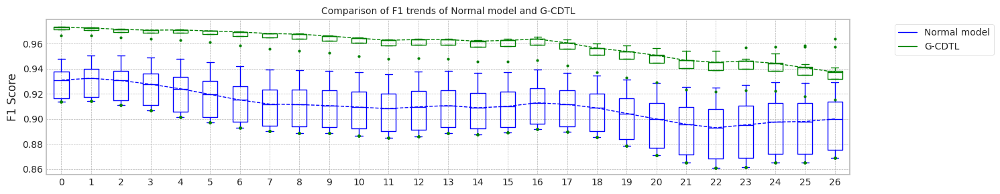

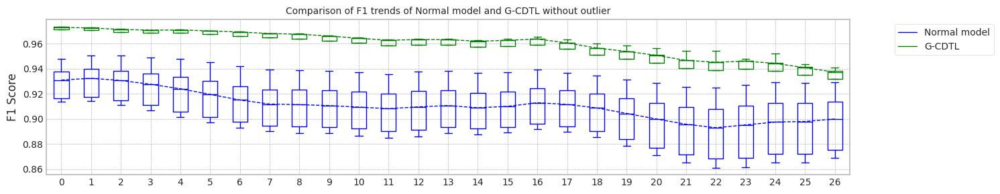

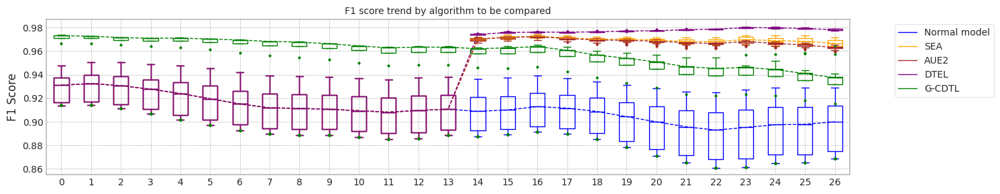

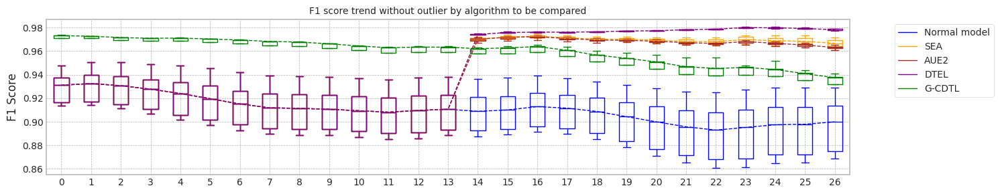

max_mean_trial= 19


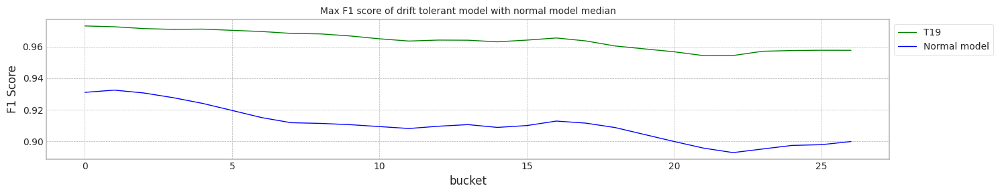

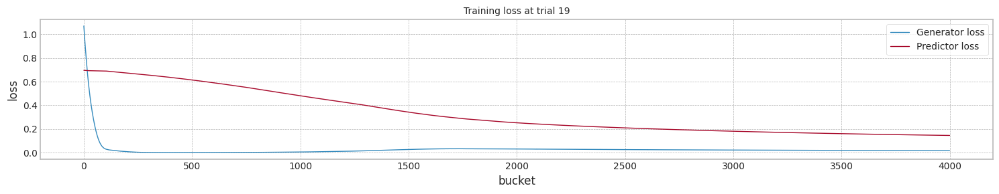

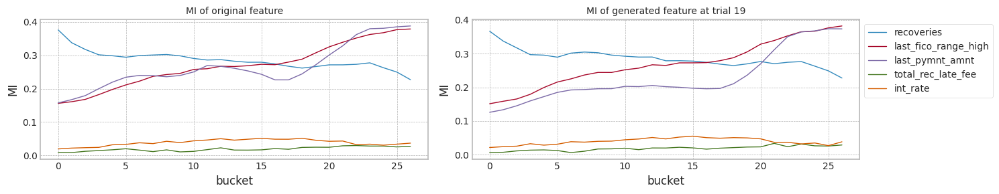

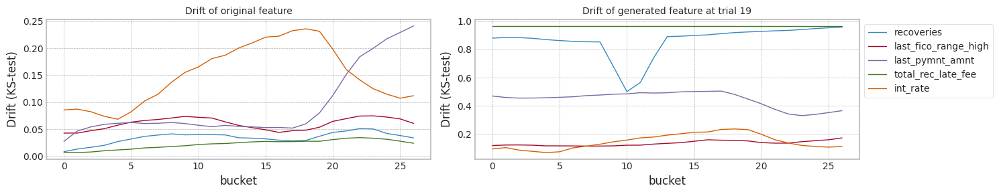

@ Normal model


,Trial,Testset F1,Initial F1,Mean F1,Last F1,Elapsed time
0,0.0,0.931561,0.932992,0.911534,0.901259,11.379239
1,1.0,0.914917,0.915411,0.888618,0.871554,11.276924
2,2.0,0.947967,0.950835,0.937302,0.929225,11.182854
3,3.0,0.929941,0.931322,0.909215,0.897891,11.221706
4,4.0,0.943655,0.946107,0.931548,0.924324,11.228681
5,5.0,0.936542,0.938706,0.919872,0.910125,11.439250
6,6.0,0.913920,0.914225,0.886404,0.869075,11.079628
7,7.0,0.930526,0.931928,0.909768,0.898559,11.368684
8,8.0,0.913981,0.914286,0.886352,0.868803,11.125999
9,9.0,0.934189,0.936073,0.916147,0.906747,11.135548


@ SEA


,Trial,Testset F1,Initial F1,Mean F1,Last F1,Elapsed time
0,0.0,0.931561,0.932992,0.943437,0.965954,15.998663
1,1.0,0.914917,0.915411,0.931581,0.962783,15.982797
2,2.0,0.947967,0.950835,0.956976,0.971848,15.749534
3,3.0,0.929941,0.931322,0.942107,0.965733,15.936639
4,4.0,0.943655,0.946107,0.953831,0.969756,16.015630
5,5.0,0.936542,0.938706,0.947516,0.967866,15.249601
6,6.0,0.913920,0.914225,0.930526,0.960847,15.366096
7,7.0,0.930526,0.931928,0.942008,0.967109,15.960129
8,8.0,0.913981,0.914286,0.931785,0.966218,15.760332
9,9.0,0.934189,0.936073,0.945795,0.968102,15.885425


@ AUE2


,Trial,Testset F1,Initial F1,Mean F1,Last F1,Elapsed time
0,0.0,0.931561,0.932992,0.942712,0.963624,16.006109
1,1.0,0.914917,0.915411,0.932436,0.964399,16.079503
2,2.0,0.947967,0.950835,0.955017,0.962696,15.924646
3,3.0,0.929941,0.931322,0.942018,0.963589,14.945316
4,4.0,0.943655,0.946107,0.952187,0.964002,15.436364
5,5.0,0.936542,0.938706,0.946717,0.962677,15.864585
6,6.0,0.913920,0.914225,0.930609,0.962097,15.896803
7,7.0,0.930526,0.931928,0.940676,0.960976,15.894116
8,8.0,0.913981,0.914286,0.930850,0.962658,15.799155
9,9.0,0.934189,0.936073,0.944821,0.963314,15.286578


@ DTEL


,Trial,Testset F1,Initial F1,Mean F1,Last F1,Elapsed time
0,0.0,0.931561,0.932992,0.946913,0.978014,20.634893
1,1.0,0.914917,0.915411,0.936421,0.979074,20.720251
2,2.0,0.947967,0.950835,0.959407,0.977594,20.119611
3,3.0,0.929941,0.931322,0.946139,0.979047,20.406431
4,4.0,0.943655,0.946107,0.956403,0.977791,20.461607
5,5.0,0.936542,0.938706,0.951074,0.978112,19.575822
6,6.0,0.913920,0.914225,0.935475,0.978087,18.689498
7,7.0,0.930526,0.931928,0.946198,0.977757,20.480794
8,8.0,0.913981,0.914286,0.935914,0.979131,20.451813
9,9.0,0.934189,0.936073,0.949175,0.977773,20.507424


@ G-CDTL


,Trial,Testset F1,Initial F1,Mean F1,Last F1,Elapsed time
0,0.0,0.913981,0.914286,0.886352,0.868803,11.034705
1,1.0,0.973470,0.972963,0.960413,0.937697,11.098545
2,2.0,0.973558,0.972963,0.960393,0.937372,11.050986
3,3.0,0.913981,0.914286,0.886352,0.868803,11.005542
4,4.0,0.913981,0.914286,0.886352,0.868803,11.009916
5,5.0,0.972771,0.972267,0.959806,0.937461,11.029070
6,6.0,0.972944,0.972438,0.960290,0.939589,10.915220
7,7.0,0.973576,0.972955,0.960417,0.938137,11.038248
8,8.0,0.973677,0.973025,0.962439,0.964127,11.097866
9,9.0,0.973352,0.972875,0.960284,0.937250,11.059224


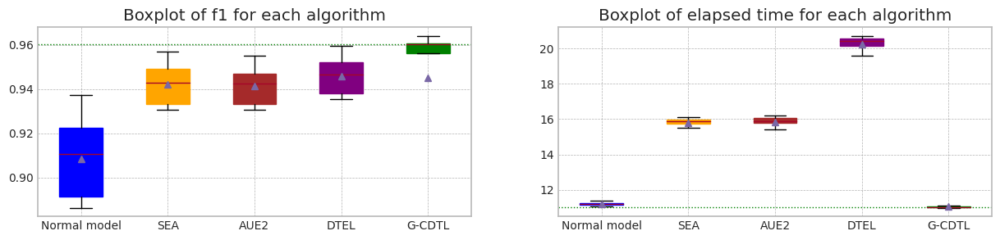

In [ ]:
_,_,_,_,_,_ = drift_tolerant2(X1, Y1,train_size, test_size,avaible_range = 600,trial_count=20,lr_g=0.0001,weight_init=True)